# Subject Analysis

In [1]:
import DataLoader, Training, os, scipy
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data_path = "F:/Masterthesis/Data/"
preprocessing = "medium"
model_name = "deep"
model_folder = "SubjectAnalysis_Unseen"
n_epochs = 25
lr = 0.01

for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    df = DataLoader.load_df(data_path, task, preprocessing)
    Training.run_exp_per_subject(df, task, preprocessing, model_folder, model_name, 
            lr, n_epochs)

In [6]:
# Load Dataframe
df_list = []
for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    model_path = os.getcwd()+"\\"+model_folder+"\\"+model_name+"\\"+task+"\\"+preprocessing+"\\"
    for i in range(40):
        df = pd.read_json(model_path+"split_"+str(i)+"_history.json")
        df = df[df["epoch"]==25]
        df["SubjectID"] = i+1
        df["Task"] = task
        df_list.append(df[["Task", "SubjectID", "valid_balanced_accuracy"]])
df = pd.concat(df_list,axis=0)
df

,Task,SubjectID,valid_balanced_accuracy
24,N170,1,0.645480
24,N170,2,0.601266
24,N170,3,0.700000
24,N170,4,0.770675
24,N170,5,0.818750
...,...,...,...
24,LRP,36,0.912500
24,LRP,37,0.802756
24,LRP,38,0.838536
24,LRP,39,0.765096


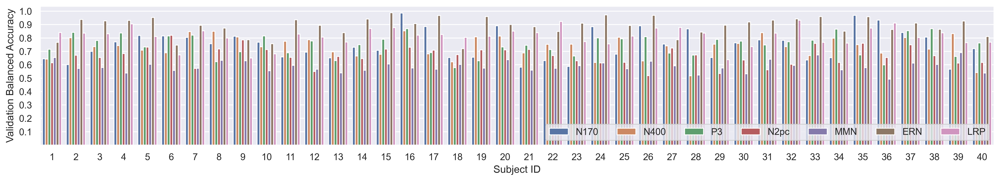

In [7]:
sns.set(style="darkgrid")
plt.figure(figsize=(20, 3),dpi=400)
fig = sns.barplot(x="SubjectID", y="valid_balanced_accuracy", hue="Task", data=df)
plt.legend(loc='lower right', ncol=7)
fig.set_yticks([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
fig.set(xlabel='Subject ID', ylabel='Validation Balanced Accuracy');

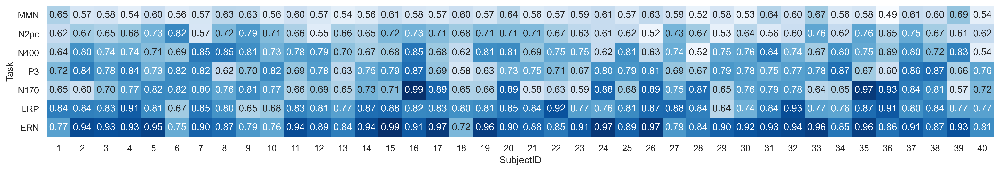

In [9]:
df_sorted = df.pivot(index="Task", columns="SubjectID", values="valid_balanced_accuracy")
#df_sorted = df_sorted.reindex(df_sorted.mean().sort_values().index, axis=1)
df_sorted = df_sorted.reindex(df_sorted.mean(axis=1).sort_values().index, axis=0)
sns.set(style="darkgrid")
plt.figure(figsize=(21, 3),dpi=400)
fig = sns.heatmap(cbar=False, annot=True, fmt='.2f', cmap="Blues", data=df_sorted)

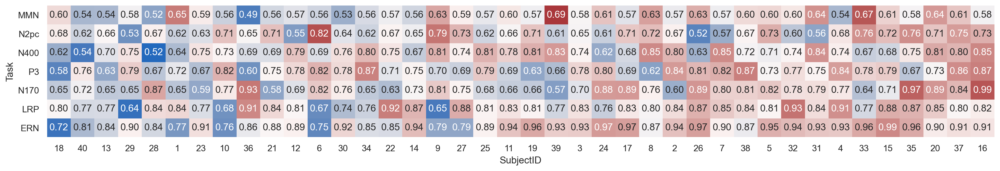

In [10]:
# normalized cmap by task
df_sorted = df.pivot(index="Task", columns="SubjectID", values="valid_balanced_accuracy")
df_sorted = df_sorted.reindex(df_sorted.mean(axis=1).sort_values().index, axis=0)
df_old = df_sorted
df_sorted = df_sorted.sub(df_sorted.mean(axis=1), axis=0).div(df_sorted.std(axis=1), axis=0)
df_sorted = df_sorted.reindex(df_sorted.mean().sort_values().index, axis=1)
df_old = df_old.reindex(df_sorted.mean().sort_values().index, axis=1)
sns.set(style="darkgrid")
plt.figure(figsize=(21, 3),dpi=200)
fig = sns.heatmap(cbar=False, annot=df_old, fmt='.2f', cmap="vlag", data=df_sorted)

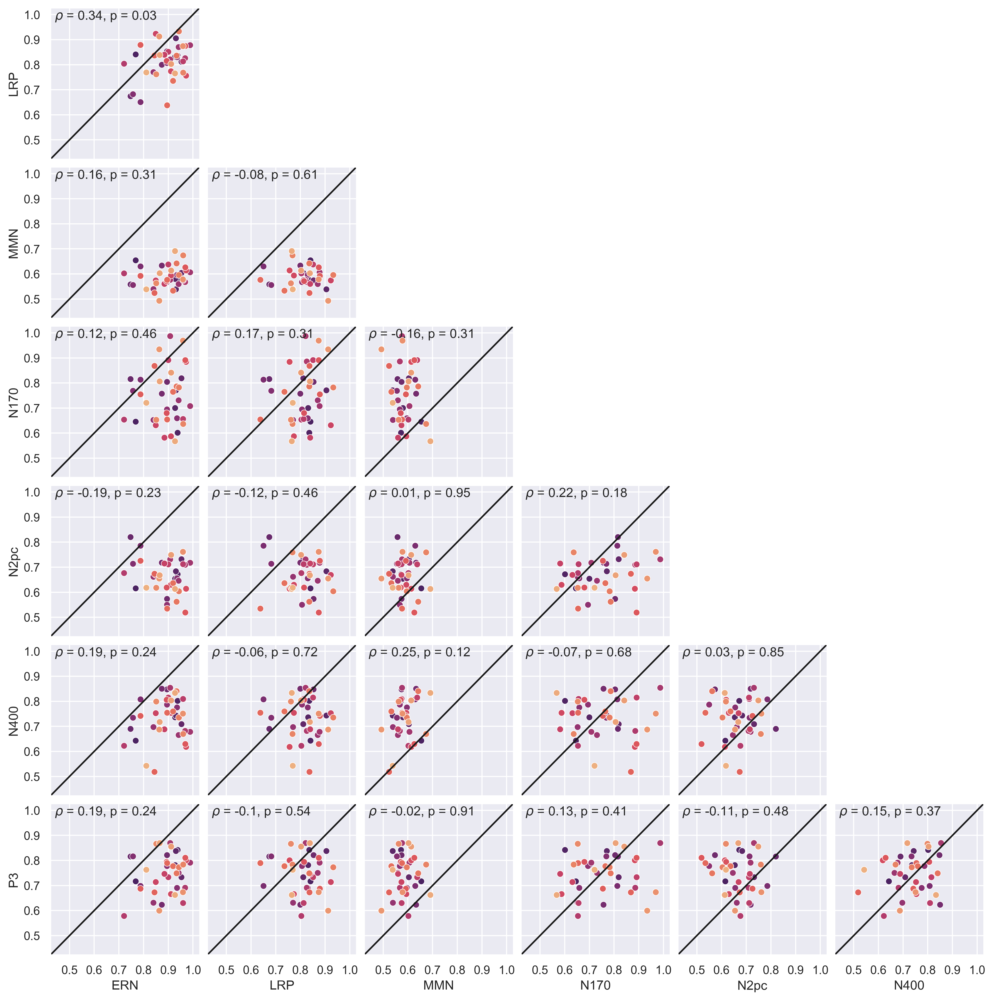

In [12]:
# Load Dataframe
df_list = []
for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    model_path = os.getcwd()+"\\"+model_folder+"\\"+model_name+"\\"+task+"\\"+preprocessing+"\\"
    for i in range(40):
        df = pd.read_json(model_path+"split_"+str(i)+"_history.json")
        df = df[df["epoch"]==25]
        df["SubjectID"] = i+1
        df["Task"] = task
        df_list.append(df[["Task", "SubjectID", "valid_balanced_accuracy"]])
df = pd.concat(df_list,axis=0)
df = df.pivot(index='SubjectID', columns='Task', values='valid_balanced_accuracy')
sns.set(style="darkgrid")
fig, axes = plt.subplots(7, 7, figsize=(15, 15), dpi=400)
fig.tight_layout()
task_list = ["ERN", "LRP", "MMN", "N170", "N2pc", "N400", "P3"]
for i in range(0,7):
    for j in range(0,7):
        #if i==j:
        #    sns.histplot(ax=axes[i,j], data=df,x=task_list[i])
        if i>j:
            sns.scatterplot(ax=axes[i,j], data=df,x=task_list[j], y=task_list[i], hue=df.index, palette="flare_r")
            axes[i,j].legend().set_visible(False)
            axes[i,j].axline((0.45,0.45), (1,1), color='k')
            axes[i,j].set_xticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
            axes[i,j].set_yticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
            axes[i,j].text(0.44, 0.98, r'$\rho$'+" = "
                           +str(np.round(scipy.stats.pearsonr(df[task_list[j]], df[task_list[i]])[0],2))
                          +", p = "+str(np.round(scipy.stats.pearsonr(df[task_list[j]], df[task_list[i]])[1],2)))
        else:
            fig.delaxes(axes[i,j])
        if j!=0:
            axes[i,j].set(yticklabels=[], ylabel=None)
        if i!=6:
            axes[i,j].set(xticklabels=[], xlabel=None)
fig.subplots_adjust(wspace=0.05, hspace=0.05)


### Single Subject

In [14]:
data_path = "F:/Masterthesis/Data/"
preprocessing = "medium"
model_name = "deep"
model_folder = "SubjectAnalysis_Single"
n_epochs = 25
lr = 0.01

for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    df = DataLoader.load_df(data_path, task, preprocessing)
    Training.run_exp_single_subject(df, task, preprocessing, model_folder, model_name, 
            lr, n_epochs, n_splits=10)

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4849        2.9227                     0.5000       38.1260  0.0100  0.0140
      2                     0.5304        2.7172                     0.4697        7.8196  0.0100  0.0150
      3                     0.5507        2.5491                     0.5189        5.7722  0.0098  0.0150
      4                     0.6042        1.2489                     0.5227        4.7269  0.0096  0.0150
      5                     0.7444        0.6694                     0.5189        3.4370  0.0093  0.0150
      6                     0.6232        0.8048                     0.5682        2.8009  0.0090  0.0140
      7                     0.6573        0.7219              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 0 1 1 1 0 1 1 1 1 0 0 0 1 0 1 0 0 0 1 0 1 1 1 0 1 0 0 1 1 1 1 0
 0 1 1 0 1 0 1 1 0 0 1 0 0 0 1 1 1 1 1 1 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 1 1
 0 1 0 0 0 0 0 0 1 1 0 0 0 1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0 1 0 0 1 0 1 0
 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7494        0.5551                     0.5682        1.0838  0.0057  0.0140
     13                     0.7039        0.7003                     0.4318        1.0067  0.0050  0.0150
     14                     0.6999        0.5209                     0.4280        1.1442  0.0043  0.0140
     15                     0.7637        0.4932                     0.4280        1.1708  0.0037  0.0160
     16                     0.7870        0.5016                     0.5189        1.1357  0.0031  0.0140
     17                     0.8325        0.4221                     0.5189        1.0805  0.0025  0.0140
     18                     0.7667        0.5171                     0.4735        1.0469  0.0020  0.0140
     19                     0.8345        0.4672                     0.4735        1.0095  0.0015  0.0150
     20                     0.7909        0.3988                     0.4735        0.9591  0.0010  0.0140
     21                     0.8046        0.42

     25                     0.8046        0.3890                     0.8220        0.4195  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5294        2.6141                     0.5000       51.3645  0.0100  0.0130
      2                     0.5121        4.6094                     0.4773        6.4872  0.0100  0.0140
      3                     0.6504        2.3881                     0.5189        3.3191  0.0098  0.0140
      4                     0.6680        1.4050                     0.5038        6.1629  0.0096  0.0140
      5                     0.6658        1.7204                     0.5038        5.8383  0.0093  0.0130
      6                     0.6611        1.2708              

     10                     0.7707        0.6160                     0.3977        1.6500  0.0069  0.0140
     11                     0.6727        0.6393                     0.5985        1.1870  0.0063  0.0120
     12                     0.6940        0.7759                     0.6439        0.9523  0.0057  0.0130
     13                     0.7434        0.6739                     0.4773        0.9634  0.0050  0.0140
     14                     0.8664        0.4565                     0.4394        1.1147  0.0043  0.0140
     15                     0.7551        0.5696                     0.5265        0.9322  0.0037  0.0140
     16                     0.8268        0.4583                     0.5341        0.8017  0.0031  0.0140
     17                     0.7843        0.4464                     0.6212        0.7850  0.0025  0.0130
     18                     0.7939        0.4400                     0.5758        0.7619  0.0020  0.0140
     19                     0.8055        0.41

     24                     0.7813        0.4051                     0.4735        0.7638  0.0000  0.0129
     25                     0.8664        0.3463                     0.4735        0.7579  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5082        3.1501                     0.5000       25.8178  0.0100  0.0140
      2                     0.4839        3.0384                     0.4773        5.7548  0.0100  0.0150
      3                     0.6101        2.6233                     0.4697        5.9239  0.0098  0.0130
      4                     0.5661        1.8216                     0.4583        7.6828  0.0096  0.0140
      5                     0.5604        1.3770              

     10                     0.6905        0.6347                     0.5000        2.6386  0.0069  0.0140
     11                     0.6270        0.7345                     0.3438        1.6321  0.0063  0.0150


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 0 0 0 1 1 0 0 0 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 1 0 0 0 1 1 1 0 0 1
 1 0 1 1 1 0 1 0 0 1 0 1 0 0 0 1 1 1 0 1 0 1 0 0 1 1 0 1 1 0 0 1 0 1 1 0 1
 0 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 1 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 0 0 1
 0 1 1 1 0 1 0 0 0 1 1 0 0 1 1 0 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 1 1 0 0 0 1
 1 1 1 1 1 0 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.6508        0.7010                     0.4688        1.3775  0.0057  0.0170
     13                     0.6984        0.5474                     0.3750        1.4115  0.0050  0.0150
     14                     0.7302        0.5504                     0.3750        1.4935  0.0043  0.0160
     15                     0.8016        0.4597                     0.3750        1.3407  0.0037  0.0160
     16                     0.7540        0.4506                     0.3438        1.2012  0.0031  0.0170
     17                     0.8016        0.4803                     0.4062        1.1231  0.0025  0.0160
     18                     0.7698        0.4823                     0.4062        1.0990  0.0020  0.0159
     19                     0.7698        0.4287                     0.4062        1.0957  0.0015  0.0160
     20                     0.8254        0.4012                     0.4062        1.0910  0.0010  0.0150
     21                     0.7540        0.46

     25                     0.8254        0.4013                     0.5000        0.9777  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5159        4.7738                     0.5312       24.6357  0.0100  0.0160
      2                     0.5159        7.2981                     0.5000       22.9811  0.0100  0.0160
      3                     0.5238        2.8968                     0.5938        9.3505  0.0098  0.0160
      4                     0.5476        1.9108                     0.6250        4.6256  0.0096  0.0160
      5                     0.5635        1.3126                     0.5000        9.9725  0.0093  0.0150
      6                     0.5317        1.1698              

     11                     0.6984        0.5954                     0.4688        1.5525  0.0063  0.0150
     12                     0.7143        0.6566                     0.5000        1.2614  0.0057  0.0140
     13                     0.6905        0.5761                     0.5938        1.4197  0.0050  0.0140
     14                     0.7222        0.5934                     0.5938        1.0863  0.0043  0.0160
     15                     0.7460        0.5618                     0.5312        1.0498  0.0037  0.0170
     16                     0.8333        0.4431                     0.6250        0.9677  0.0031  0.0150
     17                     0.7937        0.4973                     0.5938        0.9947  0.0025  0.0140
     18                     0.7381        0.4797                     0.5312        0.9054  0.0020  0.0140
     19                     0.7540        0.4819                     0.5312        0.9058  0.0015  0.0140
     20                     0.7778        0.47

     25                     0.7619        0.4574                     0.8750        0.4287  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5079        3.3346                     0.5625       18.4864  0.0100  0.0150
      2                     0.5476        6.0703                     0.5000      114.4748  0.0100  0.0150
      3                     0.5714        2.5180                     0.5000       33.1666  0.0098  0.0150
      4                     0.5556        1.4584                     0.5000       21.1636  0.0096  0.0150
      5                     0.6032        1.0989                     0.5625        2.9938  0.0093  0.0140
      6                     0.5794        1.0687              

     11                     0.8108        0.4993                     0.6396        1.0071  0.0063  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 1 0 1 1 0 1 1 0 0 1 0 1 1 0 0 0 0 1 1 1 0 0 1 0 0 0 1 1 1 0 1 1 1
 1 1 1 0 0 1 0 1 1 0 0 1 0 1 1 0 1 0 1 0 0 1 0 0 1 1 0 1 1 0 1 0 0 1 1 0 0
 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 1 0 1 1 0 0 1 0 1 0 1 0 0 0 0 1 1 1 0 0 0 0
 0 0 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 1 1 0 1 0 1 1 0 0 0 0 1 0 0 1 0 1 1 1 1
 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7882        0.5459                     0.5792        1.0661  0.0057  0.0140
     13                     0.7543        0.5775                     0.6729        1.1786  0.0050  0.0130
     14                     0.8516        0.4332                     0.6125        1.1430  0.0043  0.0130
     15                     0.8524        0.2801                     0.6146        1.1364  0.0037  0.0130
     16                     0.8527        0.3893                     0.5854        1.1320  0.0031  0.0140
     17                     0.8858        0.3422                     0.5854        1.1126  0.0025  0.0140
     18                     0.8116        0.3999                     0.5521        1.0813  0.0020  0.0130
     19                     0.8522        0.3235                     0.5521        1.0836  0.0015  0.0140
     20                     0.8113        0.3735                     0.5208        1.0920  0.0010  0.0140
     21                     0.8435        0.32

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5333        4.2087                     0.5000       53.0696  0.0100  0.0140
      2                     0.4933        5.7931                     0.5896        7.4398  0.0100  0.0130
      3                     0.6371        1.2655                     0.4667       53.7530  0.0098  0.0120
      4                     0.6261        1.4418                     0.7354        2.2130  0.0096  0.0140
      5                     0.7116        0.8865                     0.5000       11.8024  0.0093  0.0130
      6                     0.6712        1.1663                     0.6792        1.5355  0.0090  0.0130
      7                     0.6094        1.0806              

     13                     0.7444        0.5876                     0.4792        1.8277  0.0050  0.0130
     14                     0.7185        0.6020                     0.5813        1.5460  0.0043  0.0130
     15                     0.7621        0.4895                     0.5521        1.4560  0.0037  0.0130
     16                     0.7642        0.5468                     0.5854        1.3069  0.0031  0.0130
     17                     0.7637        0.4763                     0.6479        1.1781  0.0025  0.0130
     18                     0.7540        0.5018                     0.6479        1.1212  0.0020  0.0140
     19                     0.7944        0.4888                     0.6479        1.1098  0.0015  0.0140
     20                     0.8266        0.4326                     0.6479        1.1230  0.0010  0.0130
     21                     0.7949        0.4541                     0.5542        1.1519  0.0007  0.0139
     22                     0.7954        0.44

      2                     0.4839        4.6746                     0.5521        5.0716  0.0100  0.0130
      3                     0.6282        1.3132                     0.5312        9.8425  0.0098  0.0130
      4                     0.5954        1.5514                     0.5000       17.5999  0.0096  0.0130
      5                     0.6858        1.0833                     0.5000       11.5395  0.0093  0.0130
      6                     0.6228        0.9636                     0.5833        2.6223  0.0090  0.0140
      7                     0.6745        0.8866                     0.4104        2.9368  0.0085  0.0130
      8                     0.7368        0.6408                     0.4729        2.9692  0.0080  0.0140
      9                     0.7032        0.7143                     0.5792        1.9152  0.0075  0.0130
     10                     0.7728        0.5744                     0.6042        2.0884  0.0069  0.0120
     11                     0.8024        0.48

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 1 1 0 1 1 1 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 1 0 1 1 1 1 0 1 1
 0 0 0 1 1 0 1 1 1 1 0 1 0 0 1 0 1 0 0 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 1 1 0
 1 0 1 0 1 1 0 0 0 0 0 1 1 0 0 1 1 1 1 1 0 0 0 0 0 1 0 1 1 1 1 1 0 0 0 0 1
 1 0 0 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 1 1 0 0 0 0 0
 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.6969        0.6226                     0.5714        1.6658  0.0057  0.0130
     13                     0.6875        0.6592                     0.7143        0.6684  0.0050  0.0130
     14                     0.7731        0.5332                     0.8616        0.4343  0.0043  0.0130
     15                     0.7503        0.5183                     0.8616        0.4221  0.0037  0.0130
     16                     0.6998        0.5900                     0.8929        0.4220  0.0031  0.0130
     17                     0.7453        0.5210                     0.8929        0.3961  0.0025  0.0140
     18                     0.7716        0.5067                     0.8929        0.3688  0.0020  0.0140
     19                     0.8141        0.4750                     0.8616        0.3584  0.0015  0.0130
     20                     0.7987        0.4802                     0.8616        0.3588  0.0010  0.0130
     21                     0.8074        0.46

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5139        6.0955                     0.6250        3.8510  0.0100  0.0130
      2                     0.5454        3.9519                     0.5000       25.6201  0.0100  0.0130
      3                     0.6187        1.3744                     0.5000       10.3467  0.0098  0.0130
      4                     0.5181        1.2357                     0.5000       12.1150  0.0096  0.0130
      5                     0.6763        0.8610                     0.5446        1.6246  0.0093  0.0130
      6                     0.5509        1.1171                     0.4643        8.2011  0.0090  0.0130
      7                     0.6798        0.8917                     0.4643        4.5845  0.0085  0.0130
      8                     0.6808        0.74

     12                     0.7951        0.5220                     0.6786        1.2919  0.0057  0.0130
     13                     0.7885        0.4464                     0.7188        0.9708  0.0050  0.0130
     14                     0.7513        0.6250                     0.7232        0.5203  0.0043  0.0130
     15                     0.8029        0.4609                     0.6964        0.4864  0.0037  0.0130
     16                     0.8359        0.4746                     0.7232        0.5549  0.0031  0.0130
     17                     0.8323        0.3668                     0.7232        0.6082  0.0025  0.0130
     18                     0.8127        0.4281                     0.7232        0.5831  0.0020  0.0140
     19                     0.7857        0.4415                     0.6920        0.5372  0.0015  0.0140
     20                     0.8727        0.3747                     0.6607        0.5088  0.0010  0.0140
     21                     0.8639        0.35

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4048        6.8405                     0.4688       12.2764  0.0100  0.0130
      2                     0.5608        3.6193                     0.5000       20.8492  0.0100  0.0130
      3                     0.6075        1.2395                     0.5000       27.2588  0.0098  0.0130
      4                     0.7152        0.8116                     0.5000       17.7732  0.0096  0.0130
      5                     0.6528        0.7687                     0.6116        5.6363  0.0093  0.0130
      6                     0.7176        0.7618                     0.6518        2.8091  0.0090  0.0130
      7                     0.7598        0.5630              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 1 0 1 0 1 1 0 1 0 1 1 0 0 0 0 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 1 1 0 0
 0 1 0 0 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 0 1 1 0 0 1 0 1 1 0 0 1 0 0 0
 0 0 0 0 1 1 1 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1 0 1 0 0 0
 1 1 0 0 0 1 0 0 1 1 1 1 0 1 0 0 1 0 0 1 0 1 1 0 0 1 1 1 1 0 0 1 1 0 1 0 0
 0 1 1 0 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8203        0.4826                     0.5938        1.3500  0.0057  0.0140
     13                     0.7359        0.5275                     0.7188        1.0193  0.0050  0.0130
     14                     0.8469        0.3685                     0.7188        1.0728  0.0043  0.0130
     15                     0.8104        0.5270                     0.7812        0.8488  0.0037  0.0130
     16                     0.8068        0.3832                     0.5938        0.9506  0.0031  0.0130
     17                     0.8271        0.4277                     0.5625        0.9901  0.0025  0.0130
     18                     0.8365        0.4060                     0.6562        0.8526  0.0020  0.0140
     19                     0.8380        0.3315                     0.7188        0.7712  0.0015  0.0140
     20                     0.8792        0.3268                     0.7500        0.7415  0.0010  0.0130
     21                     0.8161        0.35

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4682        5.7365                     0.6562        6.6331  0.0100  0.0140
      2                     0.5432        4.7053                     0.5312       22.3209  0.0100  0.0130
      3                     0.6333        1.5645                     0.5000       35.7141  0.0098  0.0130
      4                     0.6776        1.3385                     0.6250        7.8246  0.0096  0.0130
      5                     0.6813        1.1343                     0.5938        6.7918  0.0093  0.0130
      6                     0.7448        1.0414                     0.7812        0.9129  0.0090  0.0130
      7                     0.7245        0.9253              

     12                     0.8568        0.3823                     0.7500        1.0561  0.0057  0.0130
     13                     0.8161        0.5003                     0.7500        1.0585  0.0050  0.0130
     14                     0.8130        0.4336                     0.7500        0.9852  0.0043  0.0130
     15                     0.8380        0.4005                     0.7500        0.8828  0.0037  0.0140
     16                     0.8297        0.3645                     0.7812        0.8408  0.0031  0.0130
     17                     0.8474        0.3210                     0.7500        0.8066  0.0025  0.0140
     18                     0.8812        0.3418                     0.7812        0.7461  0.0020  0.0140
     19                     0.8068        0.3964                     0.7500        0.7173  0.0015  0.0140
     20                     0.8630        0.4257                     0.7188        0.7102  0.0010  0.0140
     21                     0.8958        0.35

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5911        4.2418                     0.5000       17.6797  0.0100  0.0130
      2                     0.5818        4.1273                     0.5000       19.2212  0.0100  0.0130
      3                     0.7208        1.4458                     0.5000        7.6390  0.0098  0.0130
      4                     0.6396        1.1035                     0.5312        8.5038  0.0096  0.0130
      5                     0.7182        0.9517                     0.5000       16.4106  0.0093  0.0130
      6                     0.6719        0.7921                     0.5625        6.3068  0.0090  0.0130
      7                     0.7057        0.8171              

     12                     0.6733        0.7010                     0.8077        0.6257  0.0057  0.0120
     13                     0.7190        0.7012                     0.6154        0.9193  0.0050  0.0120


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 0 0 0 0 1 0 0 1 0 1 0 1 1 0
 1 1 1 0 1 1 1 1 1 0 1 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 1 1 0 0 0 1 0 0 1 1
 1 0 1 0 0 0 1 1 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 0 1 1 0 1 1 0 1 0 1 1 0 1 0
 1 0 1 0 1 1 1 0 0 0 1 0 0 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.7910        0.5802                     0.6154        0.8045  0.0043  0.0120
     15                     0.7339        0.5653                     0.6154        0.7654  0.0037  0.0130
     16                     0.7549        0.5246                     0.6154        0.7240  0.0031  0.0120
     17                     0.7838        0.4939                     0.6923        0.6663  0.0025  0.0130
     18                     0.8324        0.4450                     0.7308        0.6271  0.0020  0.0130
     19                     0.7718        0.4967                     0.7692        0.6080  0.0015  0.0130
     20                     0.7700        0.4611                     0.7692        0.5920  0.0010  0.0130
     21                     0.7826        0.4886                     0.7692        0.5860  0.0007  0.0130
     22                     0.8403        0.4100                     0.7308        0.5829  0.0004  0.0120
     23                     0.8216        0.44

      2                     0.5286        3.6329                     0.7308        2.8657  0.0100  0.0120
      3                     0.6179        1.6884                     0.5769        6.7632  0.0098  0.0130
      4                     0.6301        1.2896                     0.5000        6.5283  0.0096  0.0130
      5                     0.5518        1.4613                     0.5000       11.6382  0.0093  0.0120
      6                     0.5936        1.5685                     0.5385        6.5269  0.0090  0.0120
      7                     0.6319        0.9487                     0.6538        1.6817  0.0085  0.0120
      8                     0.6022        1.0975                     0.6923        1.7545  0.0080  0.0120
      9                     0.7712        0.6285                     0.5000        3.6804  0.0075  0.0120
     10                     0.6650        0.8242                     0.5769        2.1013  0.0069  0.0120
     11                     0.6709        0.64

     16                     0.6925        0.5764                     0.6154        0.7066  0.0031  0.0120
     17                     0.7651        0.4902                     0.6154        0.6264  0.0025  0.0120
     18                     0.7814        0.4879                     0.6923        0.5497  0.0020  0.0130
     19                     0.8006        0.4718                     0.8077        0.5308  0.0015  0.0140
     20                     0.7706        0.4857                     0.7308        0.5336  0.0010  0.0130
     21                     0.7712        0.4577                     0.7308        0.5436  0.0007  0.0130
     22                     0.8114        0.4482                     0.7692        0.5592  0.0004  0.0130
     23                     0.8324        0.4321                     0.7308        0.5687  0.0002  0.0120
     24                     0.8024        0.5536                     0.6538        0.5734  0.0000  0.0120
     25                     0.7219        0.53

      2                     0.5424        4.4615                     0.5000       27.0983  0.0100  0.0120
      3                     0.5934        1.6270                     0.5385       17.4406  0.0098  0.0120
      4                     0.6336        1.1499                     0.5000        3.6965  0.0096  0.0120
      5                     0.6156        1.0113                     0.5000        6.2640  0.0093  0.0120
      6                     0.5989        1.1205                     0.5385        2.0716  0.0090  0.0120
      7                     0.7015        0.7344                     0.5385        1.7214  0.0085  0.0120
      8                     0.7435        0.5916                     0.5385        2.8573  0.0080  0.0120
      9                     0.6896        0.5911                     0.6923        1.1113  0.0075  0.0120
     10                     0.7345        0.5582                     0.7308        0.7988  0.0069  0.0120
     11                     0.7928        0.45

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 0 0 0 0 1 0 0 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 0 1 0 0 1 0 1 1 1 0 1
 0 0 1 1 1 0 1 0 0 0 1 0 1 1 1 0 1 1 0 1 0 1 1 1 1 0 1 1 0 0 1 1 1 0 1 0 0
 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 1 1 1 0 1 0 0 1 1 0 0 1 0 0 1 0 0 0
 0 0 1 0 0 1 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 0 1 1 1 0 0 0 0 1 1 1 0 1 1 0 1
 0 1 0 1 0 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8443        0.3130                     0.8438        0.6931  0.0057  0.0140
     13                     0.9099        0.2614                     0.8125        0.5040  0.0050  0.0130
     14                     0.8896        0.2939                     0.7812        0.5026  0.0043  0.0130
     15                     0.8651        0.3075                     0.8750        0.5623  0.0037  0.0130
     16                     0.9193        0.2358                     0.8438        0.5847  0.0031  0.0140
     17                     0.8771        0.2568                     0.8438        0.5272  0.0025  0.0130
     18                     0.8516        0.3516                     0.9062        0.4150  0.0020  0.0140
     19                     0.9432        0.1318                     0.8125        0.3854  0.0015  0.0140
     20                     0.9203        0.1565                     0.8125        0.3873  0.0010  0.0140
     21                     0.9047        0.20

     24                     0.9193        0.1921                     0.9062        0.2336  0.0000  0.0140
     25                     0.9115        0.1933                     0.9062        0.2349  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4698        5.2577                     0.5625       19.7699  0.0100  0.0130
      2                     0.5938        3.1942                     0.5000       48.3913  0.0100  0.0130
      3                     0.6776        1.9247                     0.6875        6.9721  0.0098  0.0140
      4                     0.7245        0.8742                     0.7500        4.2039  0.0096  0.0130
      5                     0.6807        0.9205              

      9                     0.8547        0.4015                     0.7500        0.5566  0.0075  0.0140
     10                     0.8578        0.3060                     0.7812        0.5556  0.0069  0.0140
     11                     0.8812        0.3081                     0.7812        0.8354  0.0063  0.0140
     12                     0.8120        0.4894                     0.8125        0.7436  0.0057  0.0140
     13                     0.8844        0.3346                     0.9062        0.2703  0.0050  0.0130
     14                     0.8797        0.2396                     0.9062        0.1857  0.0043  0.0130
     15                     0.9198        0.1749                     0.8750        0.2566  0.0037  0.0130
     16                     0.8979        0.2534                     0.9375        0.2138  0.0031  0.0140
     17                     0.8891        0.2562                     0.9375        0.1929  0.0025  0.0140
     18                     0.9521        0.13

     23                     0.9135        0.1873                     0.8438        0.5333  0.0002  0.0150
     24                     0.9370        0.1575                     0.8438        0.5302  0.0000  0.0140
     25                     0.9286        0.1650                     0.8438        0.5295  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5661        4.0758                     0.5312       17.2532  0.0100  0.0130
      2                     0.5271        4.5859                     0.5312       28.4737  0.0100  0.0140
      3                     0.7276        1.6838                     0.5000       17.4369  0.0098  0.0140
      4                     0.7219        1.1691              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 1 1 1 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 1 1 1
 1 0 0 1 1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 0 0 1 1 1 1 1 1
 0 0 1 0 0 1 1 1 1 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 1 0 1 1 0 1 0 1 1 1 0 1 1
 1 1 1 0 0 1 0 0 1 0 0 0 0 0 1 1 1 0 1 0 1 0 0 0 0 1 1 0 1 0 1 1 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4735        5.1698                     0.4732       22.8320  0.0100  0.3504
      2                     0.5251        5.7379                     0.5000       53.5298  0.0100  0.0140
      3                     0.6799        1.9590                     0.6518       10.4940  0.0098  0.0130
      4                     0.6799        1.7958                     0.5223       15.5434  0.0096  0.0130
      5                     0.5979        1.7376                     0.5848        7.9556  0.0093  0.0130
      6                     0.6799        1.3626                     0.5357       14.1476  0.0090  0.0130
      7                     0.6905        1.2458                     0.5759        5.1126  0.0085  0.0130
      8                     0.7394        0.80

     12                     0.7817        0.6800                     0.7589        1.0490  0.0057  0.0140
     13                     0.8294        0.4497                     0.6696        0.9253  0.0050  0.0130
     14                     0.8452        0.4205                     0.6741        0.9253  0.0043  0.0130
     15                     0.8426        0.5109                     0.7054        0.8533  0.0037  0.0130
     16                     0.8519        0.3965                     0.7054        0.7372  0.0031  0.0130
     17                     0.8188        0.4558                     0.7009        0.7249  0.0025  0.0130
     18                     0.8439        0.3699                     0.7009        0.7074  0.0020  0.0130
     19                     0.8876        0.3477                     0.7009        0.6795  0.0015  0.0130
     20                     0.8399        0.3194                     0.7009        0.6543  0.0010  0.0130
     21                     0.8413        0.41

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5132        4.2636                     0.5000       29.5216  0.0100  0.0130
      2                     0.5516        5.9200                     0.5000       45.2149  0.0100  0.0130
      3                     0.6058        1.9021                     0.5580       20.3593  0.0098  0.0120
      4                     0.6085        1.1823                     0.6429        6.8338  0.0096  0.0130
      5                     0.7222        0.7114                     0.5357       11.5827  0.0093  0.0130
      6                     0.7169        0.6357                     0.7188        2.5802  0.0090  0.0130
      7                     0.6958        0.7126              

     10                     0.7368        0.5252                     0.7188        0.5328  0.0069  0.0140
     11                     0.8148        0.4873                     0.9018        0.2897  0.0063  0.0140
     12                     0.7751        0.5028                     0.6830        0.6624  0.0057  0.0130
     13                     0.8108        0.4785                     0.7188        0.4505  0.0050  0.0120
     14                     0.8095        0.4135                     0.9062        0.2594  0.0043  0.0130
     15                     0.7381        0.5023                     0.8616        0.2790  0.0037  0.0130
     16                     0.8267        0.3997                     0.9688        0.2705  0.0031  0.0130
     17                     0.7593        0.5627                     0.8750        0.2652  0.0025  0.0130
     18                     0.8532        0.3924                     0.8750        0.2811  0.0020  0.0140
     19                     0.8056        0.44

     24                     0.8135        0.3621                     0.8393        0.4199  0.0000  0.0130
     25                     0.8228        0.4050                     0.8393        0.4209  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5726        4.5173                     0.5000       43.2144  0.0100  0.0120
      2                     0.5968        3.0747                     0.4958        9.5406  0.0100  0.0130
      3                     0.6935        1.3939                     0.7729        4.0917  0.0098  0.0140
      4                     0.7258        0.9051                     0.5042        9.3719  0.0096  0.0140
      5                     0.7661        0.6702              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 0 0 0 1 1 1 0 0 1 0 0 0 1 1 1 1 1 1 0 1 1 0 1 0 0 0 1 1 1 0 1 0 1
 0 0 1 1 1 0 1 1 1 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 0 0
 0 0 0 1 0 0 0 1 1 0 0 1 0 1 0 1 1 1 0 0 0 0 0 1 1 1 1 1 0 1 1 1 1 0 1 1 1
 0 1 1 1 0 0 1 1 1 1 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 0 0 0 1 0 1 0 1 1 0 0 1
 1 1 0 0 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8468        0.3493                     0.7729        0.4199  0.0050  0.0130
     14                     0.8790        0.3226                     0.7417        0.4224  0.0043  0.0130
     15                     0.8790        0.3165                     0.7417        0.4318  0.0037  0.0130
     16                     0.9032        0.2582                     0.7729        0.4268  0.0031  0.0130
     17                     0.8952        0.2195                     0.8396        0.4156  0.0025  0.0130
     18                     0.9274        0.1572                     0.8083        0.4162  0.0020  0.0140
     19                     0.9194        0.2485                     0.8083        0.4170  0.0015  0.0140
     20                     0.9113        0.2027                     0.7771        0.4178  0.0010  0.0140
     21                     0.8871        0.2691                     0.7771        0.4223  0.0007  0.0130
     22                     0.9516        0.14

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4839        5.7980                     0.5000       33.4672  0.0100  0.0130
      2                     0.5806        3.9561                     0.5000       20.5630  0.0100  0.0140
      3                     0.7177        1.2313                     0.6333        8.0753  0.0098  0.0130
      4                     0.6855        1.1554                     0.5333       15.1998  0.0096  0.0130
      5                     0.6855        0.8711                     0.5333       24.1336  0.0093  0.0130
      6                     0.7177        1.0545                     0.5333       13.3996  0.0090  0.0130
      7                     0.7419        0.7123              

     11                     0.8065        0.4309                     0.8667        0.4651  0.0063  0.0130
     12                     0.8387        0.3916                     0.8667        0.4209  0.0057  0.0130
     13                     0.8871        0.3295                     0.9042        0.2106  0.0050  0.0130
     14                     0.8710        0.2746                     0.7812        0.5109  0.0043  0.0140
     15                     0.9194        0.2438                     0.7500        0.5603  0.0037  0.0130
     16                     0.8710        0.3043                     0.8125        0.3216  0.0031  0.0130
     17                     0.9516        0.1561                     0.8729        0.2269  0.0025  0.0140
     18                     0.8629        0.2760                     0.8729        0.2586  0.0020  0.0140
     19                     0.8468        0.2649                     0.8438        0.3235  0.0015  0.0131
     20                     0.9194        0.17

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4677        5.3289                     0.5000       50.6907  0.0100  0.0140
      2                     0.6290        3.0252                     0.7021        1.7690  0.0100  0.0130
      3                     0.6048        1.5982                     0.8375        1.2119  0.0098  0.0130
      4                     0.6855        1.1524                     0.8000        2.0582  0.0096  0.0130
      5                     0.7339        0.6462                     0.5000        8.4463  0.0093  0.0130
      6                     0.7500        0.5573                     0.7021        1.6922  0.0090  0.0130
      7                     0.7097        0.7635              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 1 1 1 1 1 0
 0 0 1 0 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 1
 0 0 0 0 1 0 0 1 1 1 1 0 0 1 1 0 1 1 0 0 1 1 1 0 1 0 1 0 1 1 0 1 1 1 0 0 0
 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4115        5.1888                     0.5440        5.3107  0.0100  0.3456
      2                     0.5617        2.5887                     0.5385       10.6503  0.0100  0.0140
      3                     0.6098        1.7980                     0.5000       13.4616  0.0098  0.0130
      4                     0.5682        1.7381                     0.5769        4.5206  0.0096  0.0120
      5                     0.6521        0.9655                     0.5357        5.0616  0.0093  0.0130
      6                     0.6691        0.9845                     0.5165        1.8968  0.0090  0.0130
      7                     0.6233        0.9518                     0.5165        1.6963  0.0085  0.0120
      8                     0.6724        0.71

     11                     0.7301        0.6004                     0.4918        1.2185  0.0063  0.0120
     12                     0.7467        0.5489                     0.5247        0.9300  0.0057  0.0120
     13                     0.7563        0.4543                     0.6374        0.8131  0.0050  0.0130
     14                     0.7386        0.4992                     0.5934        0.7080  0.0043  0.0120
     15                     0.7872        0.5161                     0.5879        0.6418  0.0037  0.0130
     16                     0.7269        0.4745                     0.6236        0.6946  0.0031  0.0120
     17                     0.7537        0.4540                     0.6236        0.7256  0.0025  0.0120
     18                     0.8316        0.3802                     0.5879        0.7270  0.0020  0.0130
     19                     0.8145        0.3972                     0.5879        0.7201  0.0015  0.0130
     20                     0.8226        0.41

     25                     0.8397        0.3069                     0.7005        0.7365  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4955        3.7940                     0.2995       13.9973  0.0100  0.0140
      2                     0.4949        3.8858                     0.4945       19.6301  0.0100  0.0140
      3                     0.6119        2.2481                     0.5357       14.0366  0.0098  0.0150
      4                     0.6526        1.2343                     0.7830        3.6236  0.0096  0.0140
      5                     0.6687        1.1602                     0.5357       10.3530  0.0093  0.0140
      6                     0.7166        1.1446              

     11                     0.6794        0.6568                     0.5962        0.9726  0.0063  0.0130
     12                     0.7670        0.5518                     0.5962        1.0522  0.0057  0.0120
     13                     0.7706        0.5733                     0.5577        0.9563  0.0050  0.0120
     14                     0.7932        0.4731                     0.5137        1.0672  0.0043  0.0130
     15                     0.7734        0.5090                     0.5934        0.9459  0.0037  0.0120
     16                     0.7825        0.4783                     0.5577        0.8854  0.0031  0.0120
     17                     0.7685        0.4306                     0.5577        0.8683  0.0025  0.0120
     18                     0.8332        0.3645                     0.5577        0.8405  0.0020  0.0130
     19                     0.8231        0.3928                     0.5934        0.8330  0.0015  0.0140
     20                     0.8316        0.39

     24                     0.7189        0.5168                     0.7335        0.6013  0.0000  0.0130
     25                     0.8129        0.4021                     0.7335        0.6021  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4518        5.4876                     0.5000       32.1420  0.0100  0.0130
      2                     0.5811        3.0851                     0.5333       22.5998  0.0100  0.0130
      3                     0.7096        1.2669                     0.5000       16.4757  0.0098  0.0120
      4                     0.7526        0.7086                     0.5000       16.6023  0.0096  0.0130
      5                     0.7110        1.0068              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1
 0 0 1 1 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 1 1 0 1 1 0 1 1 0 0 0 0 1 1 1 0 1 1
 0 1 1 0 1 1 0 0 1 1 0 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 1 1 1 1 0 1
 0 1 0 1 1 0 1 1 0 0 1 1 1 1 0 1 1 1 1 0 0 1 1 1 1 0 1 0 0 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8452        0.3534                     0.6667        0.7908  0.0050  0.0130
     14                     0.8781        0.3663                     0.6667        0.7484  0.0043  0.0130
     15                     0.8447        0.3218                     0.7333        0.5870  0.0037  0.0130
     16                     0.9154        0.2840                     0.8000        0.4616  0.0031  0.0130
     17                     0.8816        0.2880                     0.7667        0.4114  0.0025  0.0140
     18                     0.9154        0.2037                     0.8000        0.4186  0.0020  0.0160
     19                     0.8982        0.2352                     0.8000        0.4512  0.0015  0.0140
     20                     0.9066        0.2433                     0.7667        0.4874  0.0010  0.0140
     21                     0.9053        0.2238                     0.7667        0.5080  0.0007  0.0130
     22                     0.9404        0.17

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5373        4.4542                     0.5000       27.5351  0.0100  0.0130
      2                     0.6355        2.2864                     0.5333       11.4496  0.0100  0.0120
      3                     0.6123        1.5251                     0.5333        9.9117  0.0098  0.0130
      4                     0.7018        1.1418                     0.5333        8.9106  0.0096  0.0130
      5                     0.8206        0.8140                     0.5667        5.6475  0.0093  0.0130
      6                     0.8039        0.5553                     0.6000        3.5158  0.0090  0.0120
      7                     0.8364        0.5374                     0.5333        1.5842  0.0085  0.0130
      8                     0.7500        0.65

     11                     0.8987        0.2284                     0.7333        0.5900  0.0063  0.0130
     12                     0.8807        0.2407                     0.8000        0.4475  0.0057  0.0130
     13                     0.8715        0.2704                     0.8000        0.3977  0.0050  0.0130
     14                     0.8987        0.2190                     0.8333        0.2947  0.0043  0.0120
     15                     0.8982        0.2187                     0.9000        0.2131  0.0037  0.0120
     16                     0.8965        0.2264                     0.9000        0.2083  0.0031  0.0130
     17                     0.9215        0.2256                     0.9000        0.2213  0.0025  0.0130
     18                     0.9224        0.1741                     0.9000        0.2444  0.0020  0.0130
     19                     0.9395        0.1587                     0.9000        0.2665  0.0015  0.0140
     20                     0.9412        0.15

     23                     0.9237        0.2205                     0.7000        0.7155  0.0002  0.0130
     24                     0.8461        0.2773                     0.6667        0.7391  0.0000  0.0130
     25                     0.9487        0.1992                     0.6667        0.7416  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.3925        5.8869                     0.4667       39.6682  0.0100  0.0130
      2                     0.5404        2.6892                     0.6000        5.6425  0.0100  0.0130
      3                     0.7079        1.4892                     0.5000        8.5715  0.0098  0.0120
      4                     0.7123        1.1784              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 0 1 0 1 0 1 1 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1
 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 1 1 0 0 0 0 0 0 1 0 0 1 1 0 0 1 1 0 1 0
 0 1 1 0 1 0 1 1 0 1 1 0 1 1 0 1 1 0 1 1 0 0 1 1 1 1 0 0 0 1 1 1 0 0 0 1 0
 0 1 1 0 1 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 1 0 0 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4348        5.9633                     0.5000       27.7744  0.0100  0.3320
      2                     0.5829        5.1784                     0.4976       23.2507  0.0100  0.0130
      3                     0.6343        1.6464                     0.5333       12.7825  0.0098  0.0130
      4                     0.6283        1.4446                     0.6000        8.6783  0.0096  0.0140
      5                     0.6240        1.0889                     0.5000       10.9800  0.0093  0.0130
      6                     0.5991        1.0372                     0.5333        3.7954  0.0090  0.0130
      7                     0.5848        1.0564                     0.5000        9.8928  0.0085  0.0130
      8                     0.6500        0.87

     13                     0.7554        0.5524                     0.6000        1.9160  0.0050  0.0130
     14                     0.6587        0.6642                     0.6976        0.7184  0.0043  0.0130
     15                     0.7748        0.4654                     0.6452        0.6477  0.0037  0.0130
     16                     0.7061        0.5652                     0.6905        0.5258  0.0031  0.0120
     17                     0.7737        0.4888                     0.7000        0.6253  0.0025  0.0120
     18                     0.7119        0.5653                     0.7333        0.5622  0.0020  0.0130
     19                     0.6942        0.5595                     0.7595        0.5039  0.0015  0.0130
     20                     0.7911        0.4723                     0.7167        0.5493  0.0010  0.0130
     21                     0.8007        0.4488                     0.6452        0.5852  0.0007  0.0130
     22                     0.7836        0.49

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5133        4.9345                     0.5000       43.1872  0.0100  0.0130
      2                     0.5549        3.9888                     0.5333       15.6202  0.0100  0.0130
      3                     0.5135        3.5356                     0.5000       23.3714  0.0098  0.0120
      4                     0.6363        1.2018                     0.5667        5.2014  0.0096  0.0130
      5                     0.6863        0.7976                     0.5000        8.7092  0.0093  0.0130
      6                     0.6252        0.8663                     0.5976        3.7887  0.0090  0.0120
      7                     0.6275        0.7465                     0.5000        6.9801  0.0085  0.0130
      8                     0.5534        0.92

     12                     0.7151        0.6226                     0.4714        1.5305  0.0057  0.0130
     13                     0.6703        0.5999                     0.5143        1.1022  0.0050  0.0130
     14                     0.6776        0.6148                     0.5500        1.0540  0.0043  0.0120
     15                     0.6435        0.6131                     0.4762        1.0967  0.0037  0.0120
     16                     0.6959        0.6228                     0.5143        1.0107  0.0031  0.0130
     17                     0.6957        0.5719                     0.5857        0.9330  0.0025  0.0130
     18                     0.6869        0.5415                     0.6571        0.9011  0.0020  0.0130
     19                     0.6948        0.5990                     0.6238        0.9166  0.0015  0.0150
     20                     0.6689        0.5667                     0.6571        0.8978  0.0010  0.0150
     21                     0.7042        0.54

     24                     0.9394        0.1377                     0.6857        1.4625  0.0000  0.0130
     25                     0.9215        0.2002                     0.6857        1.4597  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4876        5.1108                     0.5667       22.0767  0.0100  0.0140
      2                     0.5958        2.3624                     0.5000       13.8791  0.0100  0.0130
      3                     0.6064        1.5649                     0.5667       11.9764  0.0098  0.0150
      4                     0.6973        0.9618                     0.6333        4.9274  0.0096  0.0140
      5                     0.6116        1.1691              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 1 1 0 1 1 0 1 1 0 0 1 1 1 0 0 0 1 1 0 1 1 1 1 0 1 1 1 1 1 0
 0 0 1 0 1 0 0 1 1 1 1 1 0 1 1 1 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 1
 1 1 1 0 0 0 1 0 0 0 1 0 0 1 1 0 1 1 1 1 0 0 0 0 1 0 1 0 1 1 0 1 0 0 1 0 1
 1 1 1 0 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 0 1 1 0 0 1 0 1 0 1 1 1
 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7732        0.6040                     0.8000        0.6837  0.0057  0.0140
     13                     0.8147        0.4074                     0.7667        0.5381  0.0050  0.0150
     14                     0.8066        0.3954                     0.7333        0.4886  0.0043  0.0140
     15                     0.8489        0.4195                     0.7333        0.5159  0.0037  0.0150
     16                     0.8744        0.3070                     0.7333        0.6059  0.0031  0.0140
     17                     0.8828        0.3108                     0.7333        0.6083  0.0025  0.0140
     18                     0.8069        0.4374                     0.7333        0.5567  0.0020  0.0150
     19                     0.8907        0.3008                     0.8333        0.5272  0.0015  0.0140
     20                     0.8657        0.3066                     0.8333        0.5216  0.0010  0.0140
     21                     0.8654        0.32

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4792        4.5599                     0.6000        9.7439  0.0100  0.0130
      2                     0.5795        3.3043                     0.6333       11.0920  0.0100  0.0130
      3                     0.6465        1.4824                     0.7000        7.5606  0.0098  0.0130
      4                     0.6808        0.9712                     0.7667        3.4060  0.0096  0.0130
      5                     0.6645        0.9514                     0.6667        2.7297  0.0093  0.0130
      6                     0.7056        0.7272                     0.6667        2.1645  0.0090  0.0130
      7                     0.7048        0.7043              

     11                     0.7640        0.5399                     0.8000        0.5274  0.0063  0.0130
     12                     0.7134        0.5712                     0.8000        0.5345  0.0057  0.0130
     13                     0.7814        0.4401                     0.7000        0.8652  0.0050  0.0130
     14                     0.8404        0.4575                     0.6667        0.9542  0.0043  0.0130
     15                     0.8158        0.4717                     0.7667        0.6523  0.0037  0.0130
     16                     0.7571        0.5028                     0.7667        0.4151  0.0031  0.0130
     17                     0.8073        0.4344                     0.8000        0.3310  0.0025  0.0130
     18                     0.8236        0.3984                     0.9000        0.3035  0.0020  0.0140
     19                     0.8150        0.4125                     0.9000        0.3109  0.0015  0.0130
     20                     0.8737        0.34

     25                     0.8569        0.3026                     0.7000        0.9559  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5131        3.6566                     0.6667       10.4818  0.0100  0.0130
      2                     0.6038        2.3103                     0.5667       11.1028  0.0100  0.0130
      3                     0.6393        1.5554                     0.6000        7.8860  0.0098  0.0130
      4                     0.7218        0.8412                     0.6333        6.5293  0.0096  0.0120
      5                     0.7821        0.5924                     0.6333        3.5163  0.0093  0.0120
      6                     0.6386        0.6413              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 0 0 1 0 1 0 1 1 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 0 1 1 1 0 0 1 0
 1 1 1 0 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1 1 1 0 0 1 1 0 1 1 1 0 1 0 1 1
 0 1 0 0 1 1 1 1 1 0 0 1 0 0 1 1 1 1 1 1 0 1 0 0 1 1 0 1 0 0 0 1 0 1 0 1 0
 1 1 1 1 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0 1 1 1 1 1 1 0
 0 1 0 1 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5138        4.7214                     0.5000       26.8680  0.0100  0.2911
      2                     0.4717       11.3288                     0.5000       58.2624  0.0100  0.0140
      3                     0.5786        3.7036                     0.6562        7.1961  0.0098  0.0140
      4                     0.6994        1.6003                     0.6562        3.6529  0.0096  0.0130
      5                     0.6621        0.9935                     0.7500        1.4794  0.0093  0.0130
      6                     0.6814        0.8479                     0.5312        6.3142  0.0090  0.0140
      7                     0.6893        0.9905                     0.6562        1.3792  0.0085  0.0130
      8                     0.8161        0.59

     12                     0.7896        0.5214                     0.6875        1.5384  0.0057  0.0130
     13                     0.8708        0.3173                     0.8125        0.7095  0.0050  0.0130
     14                     0.8735        0.2868                     0.8438        0.5039  0.0043  0.0130
     15                     0.8332        0.4429                     0.8438        0.4542  0.0037  0.0130
     16                     0.9047        0.2891                     0.8125        0.4436  0.0031  0.0130
     17                     0.9036        0.2468                     0.8125        0.4368  0.0025  0.0150
     18                     0.8794        0.3059                     0.7812        0.4429  0.0020  0.0140
     19                     0.9118        0.2380                     0.7812        0.4387  0.0015  0.0150
     20                     0.9203        0.2580                     0.7812        0.4321  0.0010  0.0140
     21                     0.8868        0.31

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5388        3.2602                     0.5000       51.5814  0.0100  0.0150
      2                     0.5405        7.4242                     0.5938       14.3155  0.0100  0.0140
      3                     0.6560        2.0222                     0.5000       22.9919  0.0098  0.0130
      4                     0.7759        0.7902                     0.5312        9.0465  0.0096  0.0140
      5                     0.7313        0.8876                     0.5000        9.4196  0.0093  0.0140
      6                     0.8220        0.5597                     0.5312        5.8601  0.0090  0.0140
      7                     0.7658        0.4811              

     12                     0.8626        0.3580                     0.7188        1.0004  0.0057  0.0140
     13                     0.9032        0.2426                     0.8438        0.5501  0.0050  0.0130
     14                     0.8411        0.2965                     0.8125        0.5143  0.0043  0.0130
     15                     0.9055        0.2318                     0.8125        0.4757  0.0037  0.0140
     16                     0.9043        0.2196                     0.8125        0.4858  0.0031  0.0130
     17                     0.9110        0.1855                     0.7812        0.4928  0.0025  0.0140
     18                     0.9114        0.1807                     0.7812        0.4785  0.0020  0.0140
     19                     0.9278        0.1747                     0.8438        0.4622  0.0015  0.0140
     20                     0.9274        0.1579                     0.8438        0.4532  0.0010  0.0150
     21                     0.9192        0.20

     23                     0.9192        0.2205                     0.8750        0.3238  0.0002  0.0130
     24                     0.9278        0.1310                     0.8750        0.3196  0.0000  0.0130
     25                     0.9598        0.1226                     0.8750        0.3149  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4923        5.2317                     0.5000       30.4274  0.0100  0.0120
      2                     0.5970        2.9813                     0.5452        7.2040  0.0100  0.0130
      3                     0.6933        1.5585                     0.5881        4.8951  0.0098  0.0130
      4                     0.6551        1.2813              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 1 1 0 1 0 1 0 1 1 1 0 1 1 0 0 1 0 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1
 1 1 1 0 1 0 1 1 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 0 1 0 1 1 0 0 1 1 0 1 1 1
 1 0 1 0 1 0 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 0 0 1
 1 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 1 1 0 1 1 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8244        0.4184                     0.6786        0.5951  0.0050  0.0130
     14                     0.8544        0.3057                     0.8214        0.4898  0.0043  0.0130
     15                     0.8808        0.2972                     0.7143        0.5782  0.0037  0.0130
     16                     0.8617        0.2717                     0.7143        0.6547  0.0031  0.0120
     17                     0.8754        0.3417                     0.7167        0.5170  0.0025  0.0130
     18                     0.9136        0.2423                     0.8286        0.4103  0.0020  0.0130
     19                     0.9054        0.2167                     0.7952        0.3996  0.0015  0.0139
     20                     0.9145        0.2222                     0.8286        0.4043  0.0010  0.0140
     21                     0.8726        0.2589                     0.8286        0.4151  0.0007  0.0130
     22                     0.8817        0.26

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5359        4.5420                     0.4667       34.6507  0.0100  0.0130
      2                     0.5332        4.4018                     0.5071       18.4478  0.0100  0.0130
      3                     0.5651        1.7253                     0.7238        5.6870  0.0098  0.0130
      4                     0.6660        1.4844                     0.6286        4.1319  0.0096  0.0120
      5                     0.6350        1.1445                     0.5357        8.2557  0.0093  0.0130
      6                     0.7089        0.6845                     0.5714        2.3918  0.0090  0.0140
      7                     0.7624        0.5539              

     11                     0.7979        0.4881                     0.7524        0.8268  0.0063  0.0120
     12                     0.8063        0.4211                     0.6857        0.7644  0.0057  0.0130
     13                     0.8244        0.3340                     0.6548        0.6518  0.0050  0.0130
     14                     0.8380        0.3893                     0.6929        0.6206  0.0043  0.0120
     15                     0.8316        0.4143                     0.6595        0.5614  0.0037  0.0120
     16                     0.8799        0.2981                     0.6952        0.5311  0.0031  0.0130
     17                     0.8781        0.3089                     0.6952        0.5193  0.0025  0.0130
     18                     0.8954        0.2700                     0.6952        0.5237  0.0020  0.0140
     19                     0.8544        0.3301                     0.6952        0.5394  0.0015  0.0140
     20                     0.8872        0.26

     24                     0.9399        0.1820                     0.6571        0.6023  0.0000  0.0130
     25                     0.9481        0.1587                     0.6571        0.6012  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5532        3.6925                     0.5000       32.1888  0.0100  0.0130
      2                     0.5306        4.4384                     0.6143        9.1574  0.0100  0.0130
      3                     0.6917        1.3886                     0.5595       12.9241  0.0098  0.0120
      4                     0.6486        1.4901                     0.7143        4.4926  0.0096  0.0120
      5                     0.7253        0.9003              

     10                     0.9508        0.4374                     0.8125        2.3264  0.0069  0.0080
     11                     0.9672        0.3779                     0.8125        2.2245  0.0063  0.0080
     12                     0.9426        0.2862                     0.8125        1.4388  0.0057  0.0090
     13                     0.9426        0.2000                     0.9375        0.8975  0.0050  0.0080
     14                     0.9672        0.1679                     0.9375        0.5806  0.0043  0.0080
     15                     0.9836        0.1365                     0.9375        0.3253  0.0037  0.0070
     16                     0.9754        0.0799                     0.9375        0.1192  0.0031  0.0080
     17                     0.9918        0.0093                     1.0000        0.0294  0.0025  0.0080
     18                     0.9918        0.0174                     1.0000        0.0071  0.0020  0.0070


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\metrics\_classification.py:1814: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


     19                     0.7500        1.3118                     1.0000        0.0041  0.0015  0.0080
     20                     1.0000        0.0019                     1.0000        0.0029  0.0010  0.0080
     21                     0.9918        0.0473                     1.0000        0.0028  0.0007  0.0070
     22                     0.9754        0.1051                     1.0000        0.0027  0.0004  0.0080
     23                     1.0000        0.0040                     1.0000        0.0030  0.0002  0.0070
     24                     0.7500        0.5525                     1.0000        0.0033  0.0000  0.0080
     25                     1.0000        0.0055                     1.0000        0.0037  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

     10                     0.7172        1.1047                     1.0000        0.0000  0.0069  0.0080
     11                     0.9672        0.0612                     1.0000        0.0000  0.0063  0.0080
     12                     0.9590        0.1183                     1.0000        0.0401  0.0057  0.0080
     13                     0.9672        0.0814                     0.9375        0.4912  0.0050  0.0080
     14                     0.9836        0.0273                     0.9375        0.8340  0.0043  0.0080
     15                     0.9836        0.0387                     0.9375        1.0701  0.0037  0.0080
     16                     0.9836        0.0542                     0.9375        1.2208  0.0031  0.0080
     17                     0.7172        1.0954                     0.9375        1.2703  0.0025  0.0080
     18                     0.9754        0.0621                     0.9375        1.2971  0.0020  0.0090
     19                     0.9836        0.03

      2                     0.5000        2.6566                     1.0000        0.0000  0.0100  0.0080
      3                     0.6885        2.4230                     1.0000        0.0000  0.0098  0.0080
      4                     0.8934        0.5909                     1.0000        0.0000  0.0096  0.0080
      5                     0.7172        1.1691                     1.0000        0.0000  0.0093  0.0070
      6                     0.9426        0.2599                     1.0000        0.0000  0.0090  0.0080
      7                     0.9426        0.4336                     1.0000        0.0000  0.0085  0.0080
      8                     0.9180        0.3670                     1.0000        0.0000  0.0080  0.0080
      9                     0.9098        0.3855                     1.0000        0.0000  0.0075  0.0080
     10                     0.8852        0.4483                     1.0000        0.0000  0.0069  0.0070
     11                     0.9180        0.30

     21                     0.9918        0.0795                     1.0000        0.0001  0.0007  0.0080
     22                     0.9836        0.0374                     1.0000        0.0002  0.0004  0.0070
     23                     0.9918        0.0475                     1.0000        0.0004  0.0002  0.0080
     24                     1.0000        0.0028                     1.0000        0.0011  0.0000  0.0080
     25                     0.9918        0.0388                     1.0000        0.0025  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6066        0.9858                     1.0000        0.0000  0.0100  0.0080
      2                     0.5000        6.2859              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 1 1 0 1 1 1 0 0 1 1 1 0 0 0 1 1 1 0 0 1 1 0 0 1 1 0 0 0 0 0 0 1
 0 0 0 0 1 1 1 0 0 1 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 0 1 0 1 1 1 0
 1 1 1 0 0 1 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 1 1 0 1 0 0 0 1 0 0 1 1 1 0 0 1 0 1 0 0 1 1 1 1 0 0 1 1 0 0 1 0 1 1 1 0
 1 0 1 1 0 0 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7923        0.5806                     0.5000        1.1829  0.0057  0.0140
     13                     0.7626        0.4592                     0.5000        1.0831  0.0050  0.0150
     14                     0.7993        0.4026                     0.4688        1.1223  0.0043  0.0150
     15                     0.7821        0.4175                     0.5312        1.0646  0.0037  0.0140
     16                     0.7439        0.4941                     0.5625        1.0872  0.0031  0.0140
     17                     0.7766        0.4287                     0.5000        1.1437  0.0025  0.0159
     18                     0.7845        0.4218                     0.5000        1.1797  0.0020  0.0150
     19                     0.7938        0.3749                     0.5312        1.2052  0.0015  0.0139
     20                     0.8079        0.3842                     0.5312        1.2256  0.0010  0.0130
     21                     0.8317        0.40

      2                     0.5529        5.1872                     0.5000       63.8538  0.0100  0.0140
      3                     0.5260        3.0338                     0.5000       14.8086  0.0098  0.0140
      4                     0.5881        1.9847                     0.5000       18.0271  0.0096  0.0130
      5                     0.5610        1.7991                     0.4062        8.6968  0.0093  0.0140
      6                     0.5464        1.5529                     0.5625        3.7250  0.0090  0.0140
      7                     0.5873        1.1982                     0.4688        6.4359  0.0085  0.0140
      8                     0.6520        1.0010                     0.4688        4.6352  0.0080  0.0130
      9                     0.6200        0.9211                     0.5625        1.5664  0.0075  0.0130
     10                     0.7576        0.6295                     0.4688        1.6244  0.0069  0.0130
     11                     0.7088        0.73

     16                     0.8883        0.3690                     0.5625        1.0054  0.0031  0.0130
     17                     0.8633        0.3353                     0.5625        0.9230  0.0025  0.0140
     18                     0.8794        0.3146                     0.5625        0.8517  0.0020  0.0150
     19                     0.8563        0.3581                     0.5938        0.8089  0.0015  0.0140
     20                     0.8559        0.3302                     0.6250        0.7736  0.0010  0.0150
     21                     0.8399        0.3351                     0.6562        0.7601  0.0007  0.0140
     22                     0.8883        0.2900                     0.6562        0.7488  0.0004  0.0130
     23                     0.8719        0.3068                     0.6562        0.7460  0.0002  0.0130
     24                     0.8235        0.3473                     0.6562        0.7438  0.0000  0.0130
     25                     0.8481        0.32

      2                     0.5517        4.4388                     0.5000       44.2125  0.0100  0.0130
      3                     0.6135        1.9709                     0.5938        4.9135  0.0098  0.0130
      4                     0.6493        0.8628                     0.4688        5.4881  0.0096  0.0140
      5                     0.5779        1.5358                     0.4375        4.3518  0.0093  0.0130
      6                     0.5803        1.0092                     0.5625        3.8946  0.0090  0.0130
      7                     0.6215        0.9621                     0.5000        1.9202  0.0085  0.0130
      8                     0.6283        1.0622                     0.5000        2.9750  0.0080  0.0140
      9                     0.6693        0.7879                     0.4688        1.8884  0.0075  0.0150
     10                     0.6614        0.8683                     0.5000        1.3249  0.0069  0.0140
     11                     0.7501        0.68

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 1 1 0 0 0 1 1 0 0 1 1 1 1 0 0 0 1 1 1 0 0 1 1 1 1 1 1 1 0 0 0 1 1
 1 0 1 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1
 0 0 0 1 0 1 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 1 0 1 1 0 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.6087        0.6980                     0.5436        1.1153  0.0050  0.0130
     14                     0.6876        0.5939                     0.4821        0.8661  0.0043  0.0120
     15                     0.6876        0.6159                     0.5154        0.9841  0.0037  0.0130
     16                     0.6745        0.6259                     0.5051        1.0559  0.0031  0.0120
     17                     0.6701        0.5497                     0.5487        0.8416  0.0025  0.0120
     18                     0.6296        0.5993                     0.5590        0.7207  0.0020  0.0130
     19                     0.6774        0.6121                     0.5974        0.7072  0.0015  0.0130
     20                     0.7217        0.5848                     0.5205        0.7179  0.0010  0.0130
     21                     0.7476        0.5504                     0.5538        0.7244  0.0007  0.0130
     22                     0.6662        0.60

      2                     0.5214        4.7385                     0.6538       14.3055  0.0100  0.0130
      3                     0.4834        1.9847                     0.5000       22.7633  0.0098  0.0120
      4                     0.5224        1.5274                     0.5538        4.8221  0.0096  0.0120
      5                     0.4956        1.3137                     0.6077        1.3761  0.0093  0.0130
      6                     0.6277        0.7978                     0.6154        1.5374  0.0090  0.0120
      7                     0.4942        0.9344                     0.5000        4.8507  0.0085  0.0130
      8                     0.5819        0.7407                     0.6154        1.1592  0.0080  0.0120
      9                     0.5404        0.8990                     0.5385        1.8694  0.0075  0.0130
     10                     0.6369        0.6690                     0.6205        1.4194  0.0069  0.0130
     11                     0.6662        0.71

     16                     0.6540        0.6517                     0.6462        0.7062  0.0031  0.0130
     17                     0.6974        0.5968                     0.4821        0.7100  0.0025  0.0130
     18                     0.7100        0.5878                     0.5103        0.7547  0.0020  0.0130
     19                     0.6711        0.6249                     0.4487        0.6761  0.0015  0.0130
     20                     0.6555        0.6771                     0.7179        0.6599  0.0010  0.0130
     21                     0.7032        0.5323                     0.6231        0.6769  0.0007  0.0140
     22                     0.6696        0.6143                     0.6231        0.6823  0.0004  0.0140
     23                     0.6511        0.6141                     0.6231        0.6822  0.0002  0.0130
     24                     0.6335        0.6709                     0.6231        0.6824  0.0000  0.0130
     25                     0.6779        0.64

      3                     0.6160        1.6435                     0.5026        5.7222  0.0098  0.0130
      4                     0.5560        1.6296                     0.5000       14.0540  0.0096  0.0120
      5                     0.5799        1.0861                     0.5000       13.8605  0.0093  0.0130
      6                     0.5302        1.0452                     0.5000        3.7347  0.0090  0.0120
      7                     0.5833        0.9408                     0.5000        5.7255  0.0085  0.0130
      8                     0.5414        1.0613                     0.4333        1.6497  0.0080  0.0120
      9                     0.5736        0.9134                     0.5308        0.9594  0.0075  0.0130
     10                     0.6423        0.6817                     0.5000        2.1101  0.0069  0.0120
     11                     0.6033        0.8597                     0.5051        0.9358  0.0063  0.0120
     12                     0.6306        0.66

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 0 0 1 0 0 0 0 1 0 1 1 1 0 1 1 1 0 1 0 1 1 0 1 0 0 1 0 1 0 0 0 1
 0 0 0 1 0 1 0 1 1 0 0 1 0 1 0 0 0 0 0 1 1 1 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1
 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 0 0 1 1 1 0 0 1 0 1
 1 0 0 0 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 0 1 0 0 0 0 1 1 1 0 0 0 1 0
 0 0 1 1 0 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8727        0.2703                     0.5938        1.2076  0.0050  0.0140
     14                     0.8969        0.2872                     0.6562        1.0387  0.0043  0.0140
     15                     0.9129        0.2542                     0.6250        0.9090  0.0037  0.0130
     16                     0.8797        0.2928                     0.6562        0.8823  0.0031  0.0130
     17                     0.8786        0.3255                     0.6250        0.8520  0.0025  0.0150
     18                     0.9118        0.2063                     0.6250        0.7802  0.0020  0.0140
     19                     0.9360        0.1546                     0.6250        0.7542  0.0015  0.0140
     20                     0.8883        0.2779                     0.6250        0.7400  0.0010  0.0130
     21                     0.9036        0.2494                     0.6250        0.7238  0.0007  0.0130
     22                     0.9282        0.18

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4650        5.4216                     0.6562        5.1100  0.0100  0.0140
      2                     0.5674        2.7035                     0.5000       28.0960  0.0100  0.0130
      3                     0.6552        2.0412                     0.5312       14.3226  0.0098  0.0130
      4                     0.6259        1.4314                     0.5625        9.8614  0.0096  0.0130
      5                     0.7465        0.8639                     0.6875        2.1398  0.0093  0.0140
      6                     0.7318        0.9877                     0.6875        1.1157  0.0090  0.0140
      7                     0.7681        0.5990              

     11                     0.8567        0.3356                     0.6562        1.4096  0.0063  0.0130
     12                     0.8083        0.3267                     0.6250        1.5594  0.0057  0.0130
     13                     0.8876        0.2890                     0.6562        1.3248  0.0050  0.0140
     14                     0.8887        0.2291                     0.6250        1.1947  0.0043  0.0130
     15                     0.9356        0.1922                     0.6562        1.0830  0.0037  0.0140
     16                     0.8957        0.2345                     0.6250        1.0157  0.0031  0.0150
     17                     0.8946        0.2312                     0.6562        0.9533  0.0025  0.0150
     18                     0.9367        0.1642                     0.6562        0.9347  0.0020  0.0160
     19                     0.8887        0.2534                     0.6562        0.9399  0.0015  0.0140
     20                     0.8797        0.19

     23                     0.8715        0.3142                     0.8125        0.5355  0.0002  0.0140
     24                     0.9367        0.1918                     0.8125        0.5336  0.0000  0.0140
     25                     0.8801        0.2954                     0.8125        0.5317  0.0000  0.0139
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5134        4.5316                     0.4375       18.1730  0.0100  0.0130
      2                     0.5037        3.5434                     0.4375       47.8246  0.0100  0.0130
      3                     0.7427        1.5236                     0.4688       13.9713  0.0098  0.0140
      4                     0.7364        1.1769              

      7                     0.8293        0.5679                     0.8333        2.7544  0.0085  0.0160
      8                     0.8381        0.3804                     0.7667        1.9288  0.0080  0.0130
      9                     0.8545        0.3266                     0.7000        1.3053  0.0075  0.0170
     10                     0.9059        0.2997                     0.8000        0.8569  0.0069  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 1 0 1 1 1 0 0 0 0 0 1 0 1 0 1 0 1 0 1 1 1 1 0 0 1 0 0 1 1 1 0 0
 1 1 0 1 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 1 0 0
 0 0 1 0 1 0 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 0 0 1
 0 1 1 0 1 1 0 1 0 1 0 0 1 0 0 1 0 0 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.8805        0.3458                     0.8000        0.6509  0.0063  0.0130
     12                     0.8974        0.2728                     0.7667        0.5420  0.0057  0.0130
     13                     0.9142        0.2130                     0.8333        0.4233  0.0050  0.0160
     14                     0.9060        0.2393                     0.8333        0.3577  0.0043  0.0140
     15                     0.9233        0.1698                     0.8333        0.3345  0.0037  0.0140
     16                     0.9315        0.2222                     0.8000        0.3310  0.0031  0.0140
     17                     0.9315        0.1689                     0.8000        0.3223  0.0025  0.0150
     18                     0.9144        0.2225                     0.8333        0.3126  0.0020  0.0150
     19                     0.9486        0.1146                     0.8667        0.3030  0.0015  0.0140
     20                     0.9573        0.11

     23                     0.9829        0.0564                     0.8667        0.4475  0.0002  0.0130
     24                     0.9661        0.1208                     0.8667        0.4452  0.0000  0.0130
     25                     0.9657        0.0847                     0.8667        0.4423  0.0000  0.0139
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5381        4.2532                     0.5000        7.3249  0.0100  0.0130
      2                     0.5896        2.9266                     0.5000       33.8372  0.0100  0.0140
      3                     0.7103        1.7915                     0.6333       17.1962  0.0098  0.0130
      4                     0.8038        0.7828              

      8                     0.7702        0.4964                     0.7000        0.9469  0.0080  0.0130
      9                     0.8809        0.2909                     0.7667        0.9367  0.0075  0.0130
     10                     0.9058        0.3041                     0.7667        0.9659  0.0069  0.0130
     11                     0.8971        0.3132                     0.7667        0.8684  0.0063  0.0120
     12                     0.9319        0.2281                     0.7667        0.8549  0.0057  0.0130
     13                     0.8974        0.3117                     0.7667        0.7564  0.0050  0.0130
     14                     0.8976        0.2576                     0.7667        0.6496  0.0043  0.0130
     15                     0.9147        0.2725                     0.8333        0.5910  0.0037  0.0130
     16                     0.9744        0.1099                     0.8333        0.5731  0.0031  0.0130
     17                     0.9234        0.22

     20                     0.9321        0.1283                     0.8000        0.7511  0.0010  0.0140
     21                     0.9402        0.1277                     0.8000        0.7409  0.0007  0.0130
     22                     0.9226        0.1799                     0.8000        0.7328  0.0004  0.0140
     23                     0.9316        0.1506                     0.8000        0.7272  0.0002  0.0130
     24                     0.9230        0.1344                     0.8000        0.7226  0.0000  0.0130
     25                     0.8973        0.2032                     0.8000        0.7208  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4784        4.3016              

      5                     0.6571        1.2513                     0.7000        4.9951  0.0093  0.0130
      6                     0.6155        1.2242                     0.7104        2.1174  0.0090  0.0130
      7                     0.7071        0.7615                     0.6792        1.8684  0.0085  0.0130
      8                     0.6762        0.7978                     0.8063        1.0527  0.0080  0.0130
      9                     0.7325        0.5893                     0.7375        0.9649  0.0075  0.0130
     10                     0.7944        0.5605                     0.7063        0.5941  0.0069  0.0130
     11                     0.7877        0.4899                     0.8063        0.4495  0.0063  0.0130
     12                     0.8472        0.4257                     0.7417        0.4273  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 1 1 1 0 1 0 0 1 0 1 0 0 1 0 0 0 1 1 0 0 1 0 1 1 0 1 0 1 1 0 0 1
 0 1 1 0 0 1 0 0 0 1 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1 1 0 1 1 0 0 1 1 1 1 0 0
 0 1 0 0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 0 0 1 1 1 0
 0 1 1 1 0 1 0 0 1 0 1 1 0 1 0 0 0 1 0 1 1 0 0 1 0 0 1 1 1 0 0 0 1 0 1 1 0
 0 1 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8306        0.4152                     0.8042        0.3533  0.0050  0.0130
     14                     0.8286        0.3364                     0.8354        0.3568  0.0043  0.0130
     15                     0.8115        0.3905                     0.8375        0.3697  0.0037  0.0130
     16                     0.8361        0.3685                     0.8063        0.3744  0.0031  0.0130
     17                     0.8778        0.2848                     0.8708        0.4009  0.0025  0.0130
     18                     0.8944        0.2651                     0.8063        0.4117  0.0020  0.0140
     19                     0.8714        0.2828                     0.8375        0.4034  0.0015  0.0140
     20                     0.8627        0.2672                     0.8375        0.3852  0.0010  0.0140
     21                     0.8948        0.2906                     0.8375        0.3714  0.0007  0.0130
     22                     0.9103        0.27

     25                     0.7976        0.4744                     0.7688        0.5002  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5143        3.5737                     0.5000       27.6835  0.0100  0.0130
      2                     0.5619        3.2007                     0.6813        2.6916  0.0100  0.0130
      3                     0.5571        2.4931                     0.4667       18.1422  0.0098  0.0130
      4                     0.7036        1.4821                     0.7000        6.1599  0.0096  0.0130
      5                     0.6698        0.9348                     0.7000        4.1797  0.0093  0.0130
      6                     0.7552        0.6175              

      8                     0.7405        0.5244                     0.5708        1.7971  0.0080  0.0130
      9                     0.6452        0.6358                     0.6104        1.0627  0.0075  0.0130
     10                     0.7734        0.4614                     0.6771        0.8464  0.0069  0.0130
     11                     0.7706        0.5467                     0.7792        0.5579  0.0063  0.0130
     12                     0.8456        0.3763                     0.8417        0.6066  0.0057  0.0130
     13                     0.8198        0.4203                     0.7083        0.7955  0.0050  0.0130
     14                     0.8452        0.4238                     0.8104        0.6406  0.0043  0.0140
     15                     0.7893        0.3533                     0.8104        0.5209  0.0037  0.0130
     16                     0.7901        0.4157                     0.8417        0.4168  0.0031  0.0130
     17                     0.8210        0.32

     22                     0.8611        0.3575                     0.8375        0.3605  0.0004  0.0130
     23                     0.8853        0.3204                     0.8375        0.3607  0.0002  0.0130
     24                     0.8353        0.3841                     0.8375        0.3608  0.0000  0.0150
     25                     0.8853        0.2329                     0.8375        0.3610  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6278        2.5819                     0.6562       16.4772  0.0100  0.0130
      2                     0.5492        3.5966                     0.5625       20.4297  0.0100  0.0130
      3                     0.6222        1.6969              

      7                     0.6352        1.1753                     0.5000        7.5819  0.0085  0.0130
      8                     0.7953        0.6082                     0.6667        2.0643  0.0080  0.0120
      9                     0.7425        0.8419                     0.6667        1.6924  0.0075  0.0130
     10                     0.7598        0.6515                     0.6667        1.6046  0.0069  0.0130
     11                     0.8210        0.5041                     0.6333        1.5987  0.0063  0.0130
     12                     0.8553        0.4008                     0.6333        1.3474  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 1 0 1 0 1 0 1 0 0 0 0 0 1 1 0 1 0 1 0 0 1 0 1 0 0 0 1 1 1 0 0 1 1
 0 0 0 0 0 0 1 0 0 1 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1 0 1 1 1 0 0 1 1 1 1 0 0
 1 0 0 1 0 1 1 0 1 1 0 1 1 1 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0
 1 0 1 1 0 1 1 1 1 0 0 0 1 0 0 1 1 0 1 1 1 0 0 1 0 0 0 1 1 1 0 1 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8979        0.3856                     0.7667        0.8061  0.0050  0.0120
     14                     0.8546        0.3788                     0.7667        0.5892  0.0043  0.0130
     15                     0.9141        0.2430                     0.7667        0.5538  0.0037  0.0140
     16                     0.8970        0.2908                     0.7333        0.5407  0.0031  0.0140
     17                     0.8973        0.2794                     0.7667        0.5361  0.0025  0.0140
     18                     0.8802        0.2315                     0.7667        0.5330  0.0020  0.0150
     19                     0.9059        0.1761                     0.7667        0.5358  0.0015  0.0150
     20                     0.8974        0.1926                     0.8000        0.5417  0.0010  0.0160
     21                     0.8292        0.3253                     0.8000        0.5596  0.0007  0.0130
     22                     0.8891        0.25

     11                     0.7785        0.5424                     0.7000        0.5855  0.0063  0.0130
     12                     0.8624        0.3194                     0.6333        0.6721  0.0057  0.0130
     13                     0.8464        0.3916                     0.6333        0.7643  0.0050  0.0130
     14                     0.8723        0.3255                     0.7333        0.5268  0.0043  0.0130
     15                     0.8543        0.3190                     0.7333        0.4853  0.0037  0.0140
     16                     0.8627        0.3302                     0.7333        0.4811  0.0031  0.0130
     17                     0.8976        0.2325                     0.7667        0.4678  0.0025  0.0130
     18                     0.8809        0.2425                     0.7667        0.4626  0.0020  0.0130
     19                     0.8722        0.3135                     0.8000        0.4994  0.0015  0.0140
     20                     0.8973        0.26

     25                     0.8289        0.3495                     0.8000        0.4152  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4785        5.1144                     0.5000       38.5338  0.0100  0.0130
      2                     0.4700        7.6214                     0.5333       28.0405  0.0100  0.0130
      3                     0.5991        1.7270                     0.5667        4.8846  0.0098  0.0130
      4                     0.6324        1.3811                     0.6667        3.8285  0.0096  0.0130
      5                     0.6388        1.3121                     0.5000       10.5657  0.0093  0.0130
      6                     0.6946        0.9121              

      9                     0.7842        0.4341                     0.7026        1.2596  0.0075  0.0120
     10                     0.8139        0.4229                     0.6410        1.0666  0.0069  0.0130
     11                     0.8503        0.3509                     0.6077        1.1730  0.0063  0.0130
     12                     0.8113        0.3879                     0.6026        1.1946  0.0057  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 0 1 0 0 0 1 0 1 0 0 0 1 1 1 1 1 1 0 1 0 0 1 0 0 0 1 1 1 1 1 0 1
 1 0 1 1 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 1 0 0 0 1 0 1 0 0 1 1 0 1 0
 1 1 0 1 0 1 1 1 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 1 0 1 1 1 0 0 1 0 0 0 0 1 1
 0 1 1 1 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8199        0.3755                     0.6692        1.0400  0.0050  0.0140
     14                     0.8225        0.3325                     0.6308        0.9751  0.0043  0.0130
     15                     0.8589        0.3089                     0.6308        1.0237  0.0037  0.0130
     16                     0.8391        0.2895                     0.6308        1.0820  0.0031  0.0140
     17                     0.9285        0.1928                     0.6308        1.0964  0.0025  0.0140
     18                     0.8860        0.2437                     0.6641        1.1156  0.0020  0.0140
     19                     0.8643        0.2449                     0.6256        1.1023  0.0015  0.0150
     20                     0.8927        0.2567                     0.6256        1.0840  0.0010  0.0140
     21                     0.9093        0.2701                     0.6256        1.0593  0.0007  0.0140
     22                     0.9278        0.20

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4741        4.1508                     0.5744       10.8143  0.0100  0.0130
      2                     0.5702        2.5460                     0.5231       27.2687  0.0100  0.0130
      3                     0.6504        1.9683                     0.5872        6.3521  0.0098  0.0130
      4                     0.6928        1.0932                     0.6846        4.3755  0.0096  0.0130
      5                     0.6660        1.0302                     0.5231        7.5409  0.0093  0.0120
      6                     0.7238        0.7502                     0.5462        4.1669  0.0090  0.0130
      7                     0.7829        0.6044              

     10                     0.8193        0.5708                     0.6179        1.3141  0.0069  0.0120
     11                     0.8052        0.5366                     0.6128        1.2619  0.0063  0.0130
     12                     0.7542        0.5572                     0.6359        1.3417  0.0057  0.0130
     13                     0.7953        0.4135                     0.6692        1.2086  0.0050  0.0130
     14                     0.8662        0.3481                     0.7128        1.0115  0.0043  0.0130
     15                     0.8656        0.2849                     0.7462        0.9612  0.0037  0.0120
     16                     0.8126        0.4075                     0.7128        0.9267  0.0031  0.0130
     17                     0.8662        0.3677                     0.7128        0.8910  0.0025  0.0140
     18                     0.8490        0.3374                     0.7128        0.8740  0.0020  0.0130
     19                     0.8736        0.31

     23                     0.8595        0.2708                     0.8231        0.9330  0.0002  0.0140
     24                     0.8576        0.3173                     0.8231        0.9236  0.0000  0.0140
     25                     0.8841        0.3016                     0.7846        0.9156  0.0000  0.0149
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5099        3.4841                     0.4795       21.0463  0.0100  0.0130
      2                     0.5696        3.7176                     0.7231        7.3237  0.0100  0.0120
      3                     0.6743        1.4212                     0.6744        3.6398  0.0098  0.0130
      4                     0.6881        1.4232              

      9                     0.6587        0.6285                     0.7366        0.6768  0.0075  0.0140
     10                     0.7897        0.4608                     0.7634        0.7418  0.0069  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1 0 0 1 0 0
 0 0 0 1 0 1 0 1 1 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 1 1 0 1 1 0 0 1 0 1 1 0
 1 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1
 0 1 1 0 1 1 1 0 1 1 0 1 1 1 0 0 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 0 1 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.7950        0.4647                     0.7277        0.7842  0.0063  0.0130
     12                     0.8254        0.3681                     0.6920        0.7197  0.0057  0.0130
     13                     0.8108        0.4443                     0.7589        0.6400  0.0050  0.0130
     14                     0.8439        0.3655                     0.7589        0.5314  0.0043  0.0130
     15                     0.8188        0.3991                     0.7946        0.4510  0.0037  0.0130
     16                     0.8677        0.3807                     0.8705        0.4286  0.0031  0.0130
     17                     0.8492        0.3186                     0.8348        0.4262  0.0025  0.0130
     18                     0.8492        0.3007                     0.7634        0.4284  0.0020  0.0130
     19                     0.8280        0.3562                     0.7634        0.4317  0.0015  0.0140
     20                     0.9034        0.28

     24                     0.9246        0.1859                     0.8348        0.3700  0.0000  0.0140
     25                     0.8902        0.2972                     0.8348        0.3690  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5847        5.0968                     0.6071        6.9332  0.0100  0.0130
      2                     0.6098        3.8686                     0.5625       28.7714  0.0100  0.0140
      3                     0.6997        1.7652                     0.6875        6.8612  0.0098  0.0120
      4                     0.7804        0.9394                     0.6786        1.7406  0.0096  0.0130
      5                     0.6905        1.3889              

      9                     0.7553        0.6347                     0.5357        3.6678  0.0075  0.0140
     10                     0.7460        0.6276                     0.5402        2.3859  0.0069  0.0140
     11                     0.8399        0.4473                     0.7277        0.6933  0.0063  0.0140
     12                     0.7659        0.4854                     0.7991        0.5890  0.0057  0.0140
     13                     0.8228        0.4174                     0.7902        0.7321  0.0050  0.0140
     14                     0.8757        0.3149                     0.7589        0.7398  0.0043  0.0130
     15                     0.8836        0.2984                     0.7946        0.6726  0.0037  0.0130
     16                     0.8690        0.3162                     0.8304        0.6152  0.0031  0.0130
     17                     0.9153        0.3220                     0.8304        0.5896  0.0025  0.0140
     18                     0.9061        0.29

     21                     0.8981        0.2209                     0.7723        0.5029  0.0007  0.0140
     22                     0.9167        0.1845                     0.8036        0.4950  0.0004  0.0130
     23                     0.8730        0.3077                     0.8036        0.4928  0.0002  0.0130
     24                     0.9061        0.2515                     0.8036        0.4924  0.0000  0.0140
     25                     0.9140        0.2628                     0.8036        0.4944  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5688        4.1539                     0.5714       12.8394  0.0100  0.0140
      2                     0.3995        7.2914              

      5                     0.7192        1.0083                     0.6000        4.9450  0.0093  0.0150
      6                     0.6910        0.9576                     0.5333        2.0769  0.0090  0.0150
      7                     0.6845        0.6391                     0.5667        1.7485  0.0085  0.0150
      8                     0.7526        0.6199                     0.6000        1.9545  0.0080  0.0140
      9                     0.6563        0.7384                     0.5333        1.3392  0.0075  0.0140
     10                     0.6669        0.6323                     0.5000        1.4671  0.0069  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 1 1 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 1
 1 0 1 0 0 1 1 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 1 1 1 0 1 0 0
 0 0 1 0 0 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 1 1 0 1 1 0 1 1 1 0 1 1 1 0 0 0
 1 1 0 1 1 0 1 1 0 0 0 1 1 1 1 0 0 1 1 0 1 1 1 1 1 1 0 1 0 0 0 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.7266        0.5928                     0.5667        1.4576  0.0063  0.0140
     12                     0.7345        0.6360                     0.5667        1.1708  0.0057  0.0140
     13                     0.7265        0.5488                     0.5000        0.9333  0.0050  0.0150
     14                     0.7103        0.5331                     0.5667        0.8428  0.0043  0.0150
     15                     0.7776        0.4775                     0.6667        0.9293  0.0037  0.0140
     16                     0.7509        0.4985                     0.5667        0.8224  0.0031  0.0150
     17                     0.7950        0.4614                     0.5333        0.7895  0.0025  0.0150
     18                     0.7614        0.4062                     0.5667        0.7691  0.0020  0.0150
     19                     0.7440        0.4867                     0.5667        0.7533  0.0015  0.0150
     20                     0.8038        0.42

     24                     0.7529        0.5234                     0.5333        0.9268  0.0000  0.0140
     25                     0.7614        0.4479                     0.5333        0.9220  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4788        5.0157                     0.5667       13.5738  0.0100  0.0130
      2                     0.4961        3.5474                     0.6333        6.8644  0.0100  0.0140
      3                     0.6397        2.0355                     0.5333        9.2238  0.0098  0.0120
      4                     0.6331        1.4074                     0.5000        4.4725  0.0096  0.0130
      5                     0.6151        1.0579              

     10                     0.7111        0.6658                     0.6000        1.4787  0.0069  0.0130
     11                     0.7526        0.4992                     0.5333        1.6073  0.0063  0.0130
     12                     0.7339        0.5465                     0.6000        1.0194  0.0057  0.0130
     13                     0.7008        0.5459                     0.5667        0.7441  0.0050  0.0120
     14                     0.7104        0.5181                     0.6000        0.7043  0.0043  0.0130
     15                     0.7781        0.4675                     0.6333        0.7606  0.0037  0.0130
     16                     0.7431        0.4659                     0.6333        0.8166  0.0031  0.0130
     17                     0.7516        0.4898                     0.5667        0.7411  0.0025  0.0130
     18                     0.7352        0.4962                     0.6333        0.6877  0.0020  0.0149
     19                     0.7354        0.48

     25                     0.7443        0.4692                     0.6667        0.7258  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4874        4.7765                     0.3667       12.7612  0.0100  0.0130
      2                     0.4620        4.7301                     0.4333       11.6277  0.0100  0.0130
      3                     0.6390        1.9668                     0.5333        8.8836  0.0098  0.0130
      4                     0.6166        1.7432                     0.5000        9.0291  0.0096  0.0120
      5                     0.6765        1.1581                     0.5333       13.9715  0.0093  0.0130
      6                     0.6480        1.1048              

     11                     0.7984        0.4324                     0.8125        0.7267  0.0063  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 0 1 0 1 1 0 0 1 0 1 0 0 1 1 1 1 0 1 1 0 1 0 1 1 1 0 1 0 0 1 1 1
 0 0 1 0 0 0 0 1 0 0 0 0 1 1 1 1 0 0 1 1 0 1 1 0 1 0 1 0 1 1 0 0 0 0 1 0 0
 1 1 1 0 1 0 0 0 0 0 1 0 1 1 0 1 0 1 0 1 0 1 0 1 0 0 0 1 1 0 0 1 1 0 1 0 1
 1 1 0 1 0 1 0 1 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 0 0 0 1 0 1 0
 1 0 0 0 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8710        0.3427                     0.7500        0.8679  0.0057  0.0140
     13                     0.8306        0.3840                     0.7812        0.7559  0.0050  0.0130
     14                     0.8871        0.2726                     0.7812        0.7158  0.0043  0.0130
     15                     0.8145        0.4358                     0.7812        0.6901  0.0037  0.0130
     16                     0.8710        0.2961                     0.7500        0.6820  0.0031  0.0140
     17                     0.9113        0.2154                     0.7812        0.6955  0.0025  0.0140
     18                     0.8871        0.2603                     0.7500        0.7086  0.0020  0.0140
     19                     0.9032        0.2598                     0.7500        0.7119  0.0015  0.0140
     20                     0.9032        0.2403                     0.7188        0.7091  0.0010  0.0140
     21                     0.9113        0.22

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5645        3.5040                     0.5000       82.7418  0.0100  0.0130
      2                     0.5645        3.5625                     0.5000       23.5718  0.0100  0.0130
      3                     0.7339        1.1137                     0.6875        2.7793  0.0098  0.0130
      4                     0.7419        0.7689                     0.5312        5.0509  0.0096  0.0140
      5                     0.7419        0.9356                     0.7812        1.7909  0.0093  0.0130
      6                     0.8306        0.6169                     0.6250        3.9105  0.0090  0.0130
      7                     0.8065        0.5234                     0.8125        1.2704  0.0085  0.0130
      8                     0.8226        0.42

     12                     0.8387        0.3680                     0.8438        0.4171  0.0057  0.0130
     13                     0.8548        0.3490                     0.8750        0.3909  0.0050  0.0130
     14                     0.8065        0.3365                     0.8125        0.4566  0.0043  0.0130
     15                     0.8790        0.2610                     0.8125        0.4466  0.0037  0.0140
     16                     0.8871        0.3153                     0.7500        0.4344  0.0031  0.0130
     17                     0.8387        0.3016                     0.7812        0.4335  0.0025  0.0140
     18                     0.9032        0.2661                     0.7500        0.4450  0.0020  0.0140
     19                     0.8548        0.2768                     0.7500        0.4555  0.0015  0.0130
     20                     0.8952        0.2381                     0.7188        0.4682  0.0010  0.0140
     21                     0.9113        0.24

     25                     0.9113        0.1754                     0.8750        0.4760  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4677        5.0647                     0.5000       66.1365  0.0100  0.0130
      2                     0.5323        3.4275                     0.5000       86.9600  0.0100  0.0130
      3                     0.5806        1.2991                     0.5000       60.8154  0.0098  0.0130
      4                     0.6452        0.7901                     0.5625       14.9997  0.0096  0.0140
      5                     0.5806        0.6886                     0.6250        5.8094  0.0093  0.0130
      6                     0.6532        0.6669              

     10                     0.8611        0.3540                     0.8571        0.9348  0.0069  0.0120
     11                     0.8611        0.4631                     0.8929        0.7379  0.0063  0.0130
     12                     0.8519        0.3766                     0.8187        0.8586  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 1 1 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 0 1 1 1 1 0 0 1 1 1 0 1 1 0 1
 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 1 1 1
 1 0 1 1 1 0 0 1 1 1 1 0 0 0 1 1 1 0 1 0 0 1 1 0 1 0 1 1 0 0 1 0 1 0 0 1 0
 0 1 1 0 0 1 1 0 1 0 0 0 1 1 0 0 0 0 1 0 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.9352        0.1616                     0.8187        1.0240  0.0050  0.0120
     14                     0.8981        0.2219                     0.8187        0.9621  0.0043  0.0130
     15                     0.8981        0.2380                     0.7802        0.8606  0.0037  0.0120
     16                     0.9259        0.1740                     0.7775        0.7908  0.0031  0.0120
     17                     0.9352        0.1436                     0.7775        0.7434  0.0025  0.0130
     18                     0.9167        0.1627                     0.8159        0.6967  0.0020  0.0140
     19                     0.9259        0.1928                     0.8159        0.6648  0.0015  0.0140
     20                     0.8889        0.2152                     0.8159        0.6424  0.0010  0.0130
     21                     0.9537        0.1505                     0.8159        0.6342  0.0007  0.0130
     22                     0.9074        0.15

      2                     0.4907        6.5505                     0.5000       28.2540  0.0100  0.0120
      3                     0.6574        1.4070                     0.5412        5.6786  0.0098  0.0120
      4                     0.7130        1.1237                     0.5412        7.0600  0.0096  0.0120
      5                     0.6944        1.0862                     0.6648        3.2906  0.0093  0.0130
      6                     0.6759        0.7939                     0.6593        4.0249  0.0090  0.0120
      7                     0.8148        0.5465                     0.5412        5.0134  0.0085  0.0120
      8                     0.7130        0.7833                     0.6593        2.8091  0.0080  0.0120
      9                     0.7685        0.5864                     0.7418        1.0524  0.0075  0.0130
     10                     0.7685        0.4950                     0.6703        0.7426  0.0069  0.0120
     11                     0.7685        0.49

     14                     0.8981        0.2248                     0.8132        0.3742  0.0043  0.0120
     15                     0.9259        0.2107                     0.7747        0.3956  0.0037  0.0120
     16                     0.8611        0.2493                     0.7720        0.4736  0.0031  0.0120
     17                     0.9074        0.1865                     0.7335        0.5794  0.0025  0.0130
     18                     0.9352        0.1955                     0.7335        0.6400  0.0020  0.0130
     19                     0.9259        0.1641                     0.6978        0.6152  0.0015  0.0130
     20                     0.9167        0.2486                     0.6978        0.5615  0.0010  0.0140
     21                     0.9630        0.1305                     0.6621        0.5303  0.0007  0.0130
     22                     0.9444        0.1815                     0.6621        0.5038  0.0004  0.0130
     23                     0.8889        0.23

      2                     0.5648        3.6383                     0.5000       25.6562  0.0100  0.0120
      3                     0.6667        1.4858                     0.5824       13.7090  0.0098  0.0120
      4                     0.7593        0.8740                     0.6648        5.3868  0.0096  0.0130
      5                     0.8333        0.5891                     0.7500        5.0429  0.0093  0.0120
      6                     0.8056        0.7040                     0.7857        3.8957  0.0090  0.0120
      7                     0.7685        0.7075                     0.7088        2.1458  0.0085  0.0120
      8                     0.8056        0.5411                     0.6291        1.6850  0.0080  0.0130
      9                     0.7870        0.4479                     0.6566        2.6271  0.0075  0.0120
     10                     0.8056        0.5576                     0.6566        3.3537  0.0069  0.0120
     11                     0.7963        0.52

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 1 0 1 0 1 0 1 1 0 0 0 0 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 0 0 1 1 0
 0 0 0 1 0 0 1 0 1 0 1 0 1 1 0 1 1 0 0 1 1 0 0 1 0 1 0 0 0 1 0 1 1 1 1 1 1
 1 0 1 1 0 1 0 1 1 0 0 0 1 1 0 1 1 0 0 0 1 0 0 1 0 1 1 1 1 1 0 1 0 0 0 0 0
 1 0 1 1 1 1 0 0 1 1 0 1 1 1 0 1 1 1 0 0 1 1 1 0 1 0 0 0 0 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.6604        0.6465                     0.6190        0.6362  0.0057  0.0130
     13                     0.6225        0.7455                     0.5048        0.6865  0.0050  0.0140
     14                     0.6389        0.7024                     0.6071        0.6506  0.0043  0.0130
     15                     0.6746        0.6097                     0.6143        0.6404  0.0037  0.0130
     16                     0.6404        0.6398                     0.7190        0.6182  0.0031  0.0140
     17                     0.7189        0.6277                     0.7857        0.6183  0.0025  0.0130
     18                     0.6909        0.6303                     0.7500        0.6191  0.0020  0.0130
     19                     0.7445        0.5821                     0.7857        0.6130  0.0015  0.0140
     20                     0.7451        0.5398                     0.7857        0.6049  0.0010  0.0130
     21                     0.7454        0.58

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6136        1.5671                     0.5000       23.5404  0.0100  0.0130
      2                     0.5699        1.5592                     0.4452       22.0962  0.0100  0.0130
      3                     0.6022        1.4087                     0.5929        7.3706  0.0098  0.0120
      4                     0.5998        0.8863                     0.6595        1.8104  0.0096  0.0130
      5                     0.5610        1.1830                     0.6571        1.9852  0.0093  0.0120
      6                     0.6712        0.9013                     0.5881        2.5526  0.0090  0.0130
      7                     0.7358        0.7618              

     11                     0.7235        0.7118                     0.5286        0.9203  0.0063  0.0120
     12                     0.7814        0.4602                     0.5929        0.7498  0.0057  0.0130
     13                     0.7358        0.5189                     0.5810        0.6775  0.0050  0.0120
     14                     0.7691        0.5567                     0.6119        0.7242  0.0043  0.0130
     15                     0.8316        0.4550                     0.6500        0.6626  0.0037  0.0130
     16                     0.8768        0.4017                     0.6190        0.6371  0.0031  0.0130
     17                     0.8682        0.2991                     0.6929        0.6368  0.0025  0.0130
     18                     0.8513        0.3312                     0.6286        0.6426  0.0020  0.0140
     19                     0.8861        0.3284                     0.6619        0.6337  0.0015  0.0140
     20                     0.8162        0.38

     23                     0.7728        0.5648                     0.7262        0.5668  0.0002  0.0130
     24                     0.7909        0.5155                     0.7262        0.5662  0.0000  0.0140
     25                     0.7897        0.5348                     0.7262        0.5671  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6244        2.7394                     0.5929        4.9827  0.0100  0.0130
      2                     0.5505        3.7944                     0.6095       19.1912  0.0100  0.0120
      3                     0.5862        2.4047                     0.6905        4.8323  0.0098  0.0130
      4                     0.6992        1.1586              

      8                     0.7238        0.5294                     0.5000        1.6478  0.0080  0.0120
      9                     0.6651        0.7386                     0.6231        0.7828  0.0075  0.0130
     10                     0.7879        0.4687                     0.4718        1.0439  0.0069  0.0120
     11                     0.6062        0.7060                     0.6846        0.6959  0.0063  0.0120
     12                     0.7521        0.4737                     0.6000        0.9481  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 0 1 0 1 1 1 1 1 0 1 1 0 0 0 0 0 0 0 1 1 0 0 1 1 0 1 1 0 1 0 1 0
 0 1 0 0 1 1 0 1 0 1 1 0 1 1 1 0 0 1 0 1 0 0 0 1 1 0 1 1 0 1 0 1 0 1 1 1 0
 0 0 0 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 1 0 1 0 1 0 1 0 0 0 1 1 0 0 1 0 1 0
 1 1 1 1 0 1 1 1 0 0 1 1 0 0 0 1 0 1 0 1 1 1 0 0 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.7467        0.5076                     0.6333        0.8376  0.0050  0.0130
     14                     0.7718        0.4832                     0.6564        0.6683  0.0043  0.0120
     15                     0.7944        0.4203                     0.6410        0.6229  0.0037  0.0130
     16                     0.7801        0.4052                     0.5923        0.6152  0.0031  0.0150
     17                     0.8178        0.4322                     0.5923        0.6058  0.0025  0.0130
     18                     0.8343        0.4223                     0.6026        0.5812  0.0020  0.0130
     19                     0.7817        0.3980                     0.5744        0.5757  0.0015  0.0120
     20                     0.8186        0.4049                     0.6128        0.5737  0.0010  0.0120
     21                     0.8116        0.3773                     0.6128        0.5713  0.0007  0.0130
     22                     0.8383        0.37

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4961        3.2012                     0.5000       18.1364  0.0100  0.0130
      2                     0.6270        3.7885                     0.5000       68.6946  0.0100  0.0120
      3                     0.5904        2.5701                     0.5000       40.6475  0.0098  0.0130
      4                     0.4818        1.3656                     0.5000       13.8966  0.0096  0.0120
      5                     0.6901        0.8872                     0.5026        2.6121  0.0093  0.0130
      6                     0.6291        0.7088                     0.4718        2.7566  0.0090  0.0120
      7                     0.5922        1.2247                     0.4923        1.0368  0.0085  0.0120
      8                     0.6163        1.00

     12                     0.7505        0.5601                     0.6077        1.1552  0.0057  0.0140
     13                     0.7402        0.6508                     0.6026        1.0605  0.0050  0.0130
     14                     0.7965        0.4844                     0.6026        1.0034  0.0043  0.0130
     15                     0.7362        0.5303                     0.6026        0.9677  0.0037  0.0130
     16                     0.7731        0.5021                     0.6410        0.9335  0.0031  0.0130
     17                     0.8022        0.4364                     0.6410        0.9193  0.0025  0.0130
     18                     0.8367        0.4077                     0.6410        0.9261  0.0020  0.0140
     19                     0.8116        0.4744                     0.6026        0.9108  0.0015  0.0130
     20                     0.7920        0.4436                     0.6410        0.9039  0.0010  0.0130
     21                     0.7850        0.41

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5408        2.4022                     0.5000      162.8303  0.0100  0.0130
      2                     0.5454        2.1414                     0.5000       59.4617  0.0100  0.0130
      3                     0.5688        1.0267                     0.5667       10.2700  0.0098  0.0130
      4                     0.6352        0.6604                     0.7282        1.0995  0.0096  0.0130
      5                     0.5054        1.5327                     0.5590        1.3456  0.0093  0.0120
      6                     0.5934        0.6913                     0.5974        1.1485  0.0090  0.0130
      7                     0.5286        1.1997              

     11                     0.7908        0.4458                     0.7667        0.4533  0.0063  0.0130
     12                     0.8149        0.3965                     0.7000        0.8474  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 1 1 0 1 1 1 0 0 1 0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1
 0 1 1 0 1 0 0 1 1 0 1 0 1 0 0 0 1 0 0 1 1 0 0 0 1 1 0 0 1 1 1 0 0 0 1 1 0
 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 1 1 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 0 0
 0 1 1 0 0 1 1 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8629        0.3635                     0.6667        0.8716  0.0050  0.0140
     14                     0.8463        0.3106                     0.7000        0.5573  0.0043  0.0130
     15                     0.8902        0.2955                     0.7333        0.5089  0.0037  0.0130
     16                     0.8664        0.3211                     0.7333        0.4684  0.0031  0.0130
     17                     0.8655        0.3250                     0.7000        0.4494  0.0025  0.0130
     18                     0.8736        0.2832                     0.7000        0.4510  0.0020  0.0140
     19                     0.8296        0.3374                     0.7667        0.4317  0.0015  0.0130
     20                     0.8721        0.2248                     0.8000        0.4073  0.0010  0.0130
     21                     0.8641        0.2855                     0.8000        0.3973  0.0007  0.0130
     22                     0.9060        0.26

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5342        3.7350                     0.5667       18.1067  0.0100  0.0130
      2                     0.5003        5.5439                     0.5667       10.4785  0.0100  0.0130
      3                     0.6937        1.3424                     0.6333        7.1626  0.0098  0.0130
      4                     0.7543        0.8079                     0.7667        2.0450  0.0096  0.0130
      5                     0.7302        0.7878                     0.6667        5.7229  0.0093  0.0120
      6                     0.7520        0.6299                     0.6667        4.1440  0.0090  0.0130
      7                     0.7440        0.5086              

     13                     0.8716        0.3179                     0.7333        0.8318  0.0050  0.0120
     14                     0.8463        0.3634                     0.7667        0.5594  0.0043  0.0120
     15                     0.8491        0.3585                     0.7667        0.5099  0.0037  0.0120
     16                     0.8819        0.2967                     0.8000        0.4887  0.0031  0.0120
     17                     0.8733        0.3578                     0.8000        0.4717  0.0025  0.0140
     18                     0.8813        0.2514                     0.8000        0.4627  0.0020  0.0140
     19                     0.8727        0.2844                     0.8000        0.4537  0.0015  0.0140
     20                     0.8983        0.2547                     0.8000        0.4464  0.0010  0.0140
     21                     0.9069        0.2461                     0.8000        0.4411  0.0007  0.0140
     22                     0.8902        0.23

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4411        4.2334                     0.5667       48.7269  0.0100  0.0130
      2                     0.5655        2.9615                     0.6333        5.1240  0.0100  0.0130
      3                     0.6963        1.2258                     0.6000        5.8578  0.0098  0.0130
      4                     0.6615        1.0760                     0.5667        8.7725  0.0096  0.0120
      5                     0.6931        0.7450                     0.5667        4.9830  0.0093  0.0130
      6                     0.7483        0.5831                     0.5667        7.1625  0.0090  0.0130
      7                     0.7259        0.7837              

     11                     0.8391        0.3702                     0.7333        0.6663  0.0063  0.0130
     12                     0.8561        0.3275                     0.7000        0.6390  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 0 1 1 1 1 1 0 0 0 0 1 1 1 1 1 0 1 1 1 0 0 0 0 1 1 1 1 1 0 1 0 0 1
 0 0 0 0 0 0 1 1 0 1 0 1 0 0 1 0 1 1 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1
 0 1 0 1 1 1 0 1 0 0 0 0 1 1 0 1 1 1 1 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 1
 0 1 0 0 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 0 0 1 0 1 1 0 1 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8402        0.2959                     0.6667        0.6984  0.0050  0.0130
     14                     0.8730        0.3105                     0.7333        0.7550  0.0043  0.0130
     15                     0.9064        0.2663                     0.7000        0.8287  0.0037  0.0130
     16                     0.8789        0.2746                     0.7000        0.7794  0.0031  0.0130
     17                     0.8707        0.2870                     0.7000        0.6843  0.0025  0.0130
     18                     0.8970        0.2334                     0.7000        0.6454  0.0020  0.0140
     19                     0.9157        0.2083                     0.7000        0.6329  0.0015  0.0140
     20                     0.8906        0.3234                     0.7000        0.6309  0.0010  0.0130
     21                     0.9257        0.2255                     0.7333        0.6401  0.0007  0.0140
     22                     0.9409        0.19

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4845        4.2933                     0.5000       31.4807  0.0100  0.0140
      2                     0.5308        3.7448                     0.4667        9.9731  0.0100  0.0140
      3                     0.6238        2.1242                     0.6667        2.4551  0.0098  0.0130
      4                     0.6675        1.6215                     0.7667        1.6888  0.0096  0.0140
      5                     0.6940        0.8614                     0.6000        2.8318  0.0093  0.0130
      6                     0.6812        0.7196                     0.6667        1.5338  0.0090  0.0130
      7                     0.7232        0.7385                     0.7667        0.6367  0.0085  0.0130
      8                     0.7350        0.54

     11                     0.8911        0.3234                     0.7000        0.8670  0.0063  0.0140
     12                     0.8578        0.3286                     0.7667        0.7210  0.0057  0.0130
     13                     0.8917        0.2866                     0.7000        0.7444  0.0050  0.0130
     14                     0.8701        0.3069                     0.7333        0.6499  0.0043  0.0140
     15                     0.9064        0.2210                     0.8000        0.5634  0.0037  0.0130
     16                     0.9655        0.1163                     0.8000        0.5617  0.0031  0.0140
     17                     0.9316        0.1526                     0.8333        0.5672  0.0025  0.0130
     18                     0.9321        0.1654                     0.8333        0.5774  0.0020  0.0139
     19                     0.9070        0.1728                     0.8000        0.5826  0.0015  0.0139
     20                     0.9491        0.13

     24                     0.9579        0.1493                     0.8667        0.4410  0.0000  0.0140
     25                     0.9743        0.0961                     0.8667        0.4401  0.0000  0.0139
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4833        4.7391                     0.6333       17.4950  0.0100  0.0130
      2                     0.5975        3.1718                     0.5333       10.5366  0.0100  0.0140
      3                     0.5915        3.0715                     0.6667        4.7140  0.0098  0.0120
      4                     0.7361        1.1671                     0.7333        2.4170  0.0096  0.0130
      5                     0.7947        0.9036              

      9                     0.7878        0.5027                     0.6500        1.1926  0.0075  0.0130
     10                     0.7324        0.5918                     0.6479        1.0535  0.0069  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 1 0 0 0 0 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 0 1 1 1 0 0 1 1 1
 1 0 0 0 1 1 0 1 0 1 1 1 1 0 1 0 0 1 0 1 0 0 1 0 1 1 0 0 1 0 0 0 1 0 1 0 0
 0 0 1 0 0 1 1 1 1 0 0 1 1 0 0 1 0 1 1 1 1 0 0 0 0 1 0 1 0 0 1 1 0 1 1 0 0
 1 0 0 0 0 1 0 0 0 0 0 1 1 1 0 0 0 0 0 1 1 0 1 1 1 0 0 1 1 1 0 0 1 1 0 1 0
 1 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.7803        0.5003                     0.6104        1.0237  0.0063  0.0140
     12                     0.7721        0.5145                     0.6479        0.9904  0.0057  0.0140
     13                     0.7479        0.5109                     0.6833        1.0449  0.0050  0.0140
     14                     0.7487        0.5681                     0.6479        0.9082  0.0043  0.0140
     15                     0.7886        0.5248                     0.6792        0.8237  0.0037  0.0140
     16                     0.8125        0.4505                     0.6479        0.8025  0.0031  0.0150
     17                     0.7969        0.4636                     0.6833        0.8100  0.0025  0.0140
     18                     0.8051        0.4233                     0.6833        0.7639  0.0020  0.0140
     19                     0.8293        0.3695                     0.6833        0.7251  0.0015  0.0140
     20                     0.8215        0.39

     25                     0.8458        0.3988                     0.6854        0.7060  0.0000  0.0140
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5370        5.6041                     0.6458        2.9824  0.0100  0.0130
      2                     0.5452        3.8305                     0.5000       18.7105  0.0100  0.0130
      3                     0.6576        1.2475                     0.5938        9.5289  0.0098  0.0140
      4                     0.6191        0.9015                     0.5000        6.2756  0.0096  0.0130
      5                     0.6256        0.7641                     0.6000        3.7015  0.0093  0.0130
      6                     0.6343        0.7576              

     10                     0.7078        0.5979                     0.7479        0.7552  0.0069  0.0130
     11                     0.7011        0.6795                     0.8021        0.5204  0.0063  0.0130
     12                     0.7474        0.5697                     0.7333        0.7061  0.0057  0.0140
     13                     0.7550        0.4898                     0.7667        0.4687  0.0050  0.0130
     14                     0.7238        0.5844                     0.7771        0.4829  0.0043  0.0140
     15                     0.7409        0.5849                     0.7771        0.4832  0.0037  0.0140
     16                     0.7808        0.4754                     0.7729        0.4501  0.0031  0.0130
     17                     0.7639        0.4643                     0.8042        0.4356  0.0025  0.0140
     18                     0.7965        0.4605                     0.8042        0.4180  0.0020  0.0140
     19                     0.7960        0.47

     24                     0.7886        0.5141                     0.7750        0.4058  0.0000  0.0150
     25                     0.7641        0.5290                     0.8083        0.4061  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4558        7.0525                     0.5354       12.8544  0.0100  0.0140
      2                     0.5045        6.2611                     0.5000       66.8906  0.0100  0.0140
      3                     0.5444        1.7582                     0.5625       21.9601  0.0098  0.0130
      4                     0.6002        1.3127                     0.4979       14.3998  0.0096  0.0140
      5                     0.6204        1.5872              

      9                     0.7115        0.6252                     0.7188        1.1977  0.0075  0.0140
     10                     0.7528        0.6131                     0.7500        1.0281  0.0069  0.0150
     11                     0.7838        0.5513                     0.6875        0.9601  0.0063  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 1 1 0 0 0 1 1 0 1 1 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 1 1 0 0 0
 1 0 1 0 1 1 0 1 1 1 1 1 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 1 1 1 0 0 1 1
 0 0 1 0 0 1 0 1 1 1 1 1 0 1 1 0 0 0 0 1 1 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 1
 1 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 0 0 1 1 0 1 1 0 1 1 0 1 0 1 0 1 1
 1 0 1 1 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7440        0.4966                     0.6250        0.8691  0.0057  0.0130
     13                     0.7433        0.5583                     0.7188        0.7504  0.0050  0.0150
     14                     0.7600        0.4454                     0.7188        0.6917  0.0043  0.0140
     15                     0.8484        0.4192                     0.6875        0.6645  0.0037  0.0140
     16                     0.8319        0.4195                     0.6562        0.6630  0.0031  0.0149
     17                     0.8797        0.3209                     0.6562        0.6639  0.0025  0.0150
     18                     0.8802        0.2827                     0.7188        0.6668  0.0020  0.0150
     19                     0.8399        0.3066                     0.7188        0.6723  0.0015  0.0160
     20                     0.8561        0.3209                     0.7188        0.6763  0.0010  0.0130
     21                     0.8557        0.32

     25                     0.8400        0.3614                     0.5938        0.8426  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5434        4.1963                     0.5000       35.9220  0.0100  0.0140
      2                     0.4808        4.4079                     0.5625        8.1413  0.0100  0.0140
      3                     0.5280        2.2525                     0.5000        7.4180  0.0098  0.0140
      4                     0.6555        1.2572                     0.5938        3.1489  0.0096  0.0140
      5                     0.6414        1.1236                     0.5312        4.1265  0.0093  0.0140
      6                     0.6240        0.9717              

     10                     0.6738        0.6232                     0.5625        1.0688  0.0069  0.0140
     11                     0.6805        0.5759                     0.5625        1.0995  0.0063  0.0140
     12                     0.7435        0.5350                     0.5625        0.9954  0.0057  0.0140
     13                     0.7206        0.4912                     0.6250        1.0092  0.0050  0.0130
     14                     0.7766        0.5091                     0.6875        0.8417  0.0043  0.0130
     15                     0.7916        0.4613                     0.7188        0.7556  0.0037  0.0140
     16                     0.7677        0.4566                     0.7188        0.7220  0.0031  0.0130
     17                     0.8157        0.3808                     0.6250        0.7650  0.0025  0.0130
     18                     0.7523        0.4873                     0.6250        0.7884  0.0020  0.0139
     19                     0.8004        0.39

     23                     0.7921        0.4352                     0.7500        0.5221  0.0002  0.0160
     24                     0.7917        0.4169                     0.7500        0.5225  0.0000  0.0160
     25                     0.8319        0.3799                     0.7500        0.5221  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4793        4.6291                     0.5312       20.8840  0.0100  0.0140
      2                     0.5198        3.7928                     0.5000       18.2862  0.0100  0.0150
      3                     0.6485        2.1186                     0.5625        6.6896  0.0098  0.0160
      4                     0.6895        1.4160              

      9                     0.8617        0.3511                     0.7333        1.6002  0.0075  0.0130
     10                     0.8805        0.3432                     0.7667        1.0897  0.0069  0.0140
     11                     0.8889        0.2478                     0.7667        1.2279  0.0063  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 1 1 0 0 0 0 0 0 0 0 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 1 1 0 1 0 0 1
 0 0 1 1 1 1 0 1 1 1 1 1 1 0 0 0 0 1 0 0 1 0 0 0 0 1 1 1 0 0 0 1 0 1 1 0 0
 0 1 0 1 0 1 0 0 0 1 0 1 0 1 0 1 1 1 0 0 1 0 1 1 0 1 0 1 0 1 1 1 0 1 0 0 1
 0 0 1 0 0 1 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.8959        0.2747                     0.7667        1.1390  0.0057  0.0150
     13                     0.9041        0.2468                     0.8000        0.8515  0.0050  0.0130
     14                     0.9740        0.1912                     0.7333        0.7390  0.0043  0.0130
     15                     0.9316        0.1778                     0.7333        0.7152  0.0037  0.0170
     16                     0.9234        0.1599                     0.7333        0.6758  0.0031  0.0150
     17                     0.9138        0.1750                     0.7667        0.6405  0.0025  0.0150
     18                     0.9825        0.0704                     0.8000        0.6141  0.0020  0.0150
     19                     0.9219        0.1784                     0.8333        0.5920  0.0015  0.0160
     20                     0.9392        0.1387                     0.8000        0.5798  0.0010  0.0169
     21                     0.9135        0.17

     24                     0.9225        0.2151                     0.7333        0.9458  0.0000  0.0130
     25                     0.9059        0.2248                     0.7333        0.9565  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4908        4.3668                     0.5000       27.9280  0.0100  0.0130
      2                     0.6574        3.0758                     0.5000       53.9394  0.0100  0.0140
      3                     0.7919        1.2748                     0.5333       16.7850  0.0098  0.0140
      4                     0.6902        0.9940                     0.6000        6.8937  0.0096  0.0140
      5                     0.6659        1.0348              

      9                     0.8182        0.4973                     0.6000        2.1048  0.0075  0.0130
     10                     0.8094        0.5034                     0.7000        1.0127  0.0069  0.0130
     11                     0.8179        0.3868                     0.8667        0.3933  0.0063  0.0130
     12                     0.8200        0.3982                     0.8667        0.3690  0.0057  0.0130
     13                     0.8544        0.3637                     0.8667        0.4787  0.0050  0.0140
     14                     0.8705        0.3147                     0.8000        0.5371  0.0043  0.0140
     15                     0.9038        0.2661                     0.8667        0.4621  0.0037  0.0150
     16                     0.8699        0.2764                     0.8667        0.3837  0.0031  0.0140
     17                     0.9219        0.2327                     0.9000        0.3301  0.0025  0.0160
     18                     0.8962        0.25

     22                     0.9652        0.1207                     0.7667        1.3187  0.0004  0.0140
     23                     0.9570        0.1077                     0.7667        1.3140  0.0002  0.0149
     24                     0.9658        0.0823                     0.7667        1.3173  0.0000  0.0149
     25                     0.9564        0.1017                     0.7667        1.3161  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4048        5.5037                     0.5333        9.0812  0.0100  0.0140
      2                     0.5791        3.7378                     0.5000       60.0808  0.0100  0.0140
      3                     0.7577        1.6060              

      6                     0.7302        0.7084                     0.8929        1.1243  0.0090  0.0120
      7                     0.7117        0.7544                     0.9643        0.3185  0.0085  0.0130
      8                     0.8798        0.2898                     0.7727        1.9125  0.0080  0.0130
      9                     0.8447        0.5449                     0.8636        0.5383  0.0075  0.0140
     10                     0.8944        0.2169                     0.9286        0.1159  0.0069  0.0130
     11                     0.8628        0.3729                     1.0000        0.0320  0.0063  0.0130
     12                     0.9009        0.3412                     0.9545        0.0743  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 0 0 1 0 1 0 0 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 0 0 1 1 1 0 1 0 1 0
 1 1 0 1 1 1 1 1 1 1 1 1 0 0 0 0 1 0 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 1 0 0 1
 1 1 1 1 1 0 0 0 1 0 1 0 0 1 1 0 1 1 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 0 1 1 1
 1 0 0 0 0 1 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.9000        0.3036                     0.9545        0.1274  0.0050  0.0130
     14                     0.9122        0.2923                     0.9545        0.0844  0.0043  0.0150
     15                     0.9610        0.1206                     0.9188        0.0974  0.0037  0.0140
     16                     0.8976        0.2463                     0.9188        0.1065  0.0031  0.0120
     17                     0.9164        0.1606                     0.9188        0.1103  0.0025  0.0120
     18                     0.9432        0.1117                     0.9545        0.1219  0.0020  0.0120
     19                     0.9188        0.2948                     0.9545        0.1260  0.0015  0.0120
     20                     0.9155        0.3471                     0.9188        0.1247  0.0010  0.0130
     21                     0.9488        0.1469                     0.9188        0.1263  0.0007  0.0130
     22                     0.9033        0.16

      2                     0.5808        4.6589                     0.5000       40.6819  0.0100  0.0120
      3                     0.5760        2.8528                     0.7110        4.6650  0.0098  0.0130
      4                     0.6058        2.0435                     0.5000       14.1067  0.0096  0.0120
      5                     0.6866        1.4753                     0.5974        5.1054  0.0093  0.0110
      6                     0.7944        0.7912                     0.6396        2.5846  0.0090  0.0130
      7                     0.8090        0.6683                     0.7013        3.3375  0.0085  0.0120
      8                     0.9090        0.2464                     0.7013        3.0016  0.0080  0.0120
      9                     0.8685        0.3529                     0.7013        2.5430  0.0075  0.0120
     10                     0.9375        0.2270                     0.7370        2.2998  0.0069  0.0120
     11                     0.8709        0.30

     16                     0.8423        0.3657                     0.7922        0.4918  0.0031  0.0120
     17                     0.8212        0.3804                     0.7922        0.4936  0.0025  0.0120
     18                     0.8968        0.2784                     0.8019        0.4883  0.0020  0.0130
     19                     0.8432        0.3291                     0.8474        0.5027  0.0015  0.0130
     20                     0.8497        0.3432                     0.8474        0.5129  0.0010  0.0130
     21                     0.8831        0.3053                     0.8474        0.5085  0.0007  0.0130
     22                     0.8976        0.3046                     0.8474        0.5032  0.0004  0.0130
     23                     0.9220        0.2567                     0.8474        0.4997  0.0002  0.0120
     24                     0.8587        0.3621                     0.8474        0.4983  0.0000  0.0130
     25                     0.8408        0.29

      2                     0.5621        5.5783                     0.5000       62.6200  0.0100  0.0120
      3                     0.6638        1.7567                     0.6234        7.0316  0.0098  0.0120
      4                     0.5303        1.6539                     0.5357       13.2193  0.0096  0.0120
      5                     0.5307        1.2698                     0.5682        3.7978  0.0093  0.0110
      6                     0.5490        1.0211                     0.6039        2.6453  0.0090  0.0120
      7                     0.6067        0.8087                     0.4545        4.3899  0.0085  0.0120
      8                     0.6378        1.1969                     0.5065        1.6284  0.0080  0.0120
      9                     0.6263        0.8008                     0.5747        2.2318  0.0075  0.0120
     10                     0.6757        0.8379                     0.5422        1.4800  0.0069  0.0120
     11                     0.6703        0.75

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 1 1 0 1 1 0 0 0 1 1 1 1 1 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 1 1 0 0
 1 1 1 1 1 0 0 0 0 1 0 1 0 1 1 0 1 1 1 1 1 0 1 1 1 0 1 0 1 0 1 0 1 0 0 0 1
 1 1 1 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1 1 0 0 1 0 0 0 1 1 1 1 1 1 0 0 1 0 1 0
 0 0 1 0 0 1 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 1 1 0 1 1 1 1 0 1 0 0 0 0 1
 0 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8607        0.4325                     0.7167        0.7862  0.0050  0.0130
     14                     0.8443        0.3446                     0.8063        0.4674  0.0043  0.0130
     15                     0.8525        0.3738                     0.8729        0.5025  0.0037  0.0140
     16                     0.8770        0.3542                     0.8125        0.6268  0.0031  0.0130
     17                     0.8443        0.3673                     0.8750        0.6223  0.0025  0.0140
     18                     0.8852        0.3146                     0.9062        0.5708  0.0020  0.0140
     19                     0.9016        0.3279                     0.8729        0.4876  0.0015  0.0140
     20                     0.8934        0.2918                     0.8396        0.4394  0.0010  0.0130
     21                     0.8525        0.3743                     0.8063        0.4180  0.0007  0.0140
     22                     0.8852        0.27

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4918        4.8987                     0.5000       25.3388  0.0100  0.0130
      2                     0.5574        4.4487                     0.6062        6.0050  0.0100  0.0130
      3                     0.6475        1.6241                     0.6521        6.5413  0.0098  0.0130
      4                     0.6885        1.0882                     0.6229        4.1037  0.0096  0.0130
      5                     0.6311        1.0145                     0.5312        9.0779  0.0093  0.0130
      6                     0.7131        0.7574                     0.6562        4.2186  0.0090  0.0130
      7                     0.7459        0.7038              

     11                     0.8033        0.4573                     0.8688        0.6013  0.0063  0.0130
     12                     0.7787        0.4750                     0.7750        0.6372  0.0057  0.0140
     13                     0.7623        0.4423                     0.8354        0.6324  0.0050  0.0130
     14                     0.8033        0.4060                     0.7354        0.7080  0.0043  0.0140
     15                     0.8689        0.3912                     0.8021        0.6274  0.0037  0.0130
     16                     0.8361        0.4157                     0.8354        0.5548  0.0031  0.0140
     17                     0.8443        0.3472                     0.8688        0.5243  0.0025  0.0140
     18                     0.8279        0.3659                     0.8688        0.5021  0.0020  0.0140
     19                     0.8115        0.4272                     0.8688        0.4991  0.0015  0.0140
     20                     0.8279        0.33

     24                     0.8443        0.3138                     0.8396        0.4140  0.0000  0.0149
     25                     0.8033        0.3348                     0.8396        0.4136  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4590        6.4077                     0.5000       16.5662  0.0100  0.0140
      2                     0.4672        6.2960                     0.4688       29.9656  0.0100  0.0130
      3                     0.5902        1.9456                     0.5021       15.2798  0.0098  0.0140
      4                     0.6885        0.8845                     0.5667       11.9599  0.0096  0.0130
      5                     0.6311        1.4395              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 1 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 1 1 1 1 0 1 1 0 1 1 1 0 1 1
 1 0 1 0 0 1 0 1 1 1 0 1 0 1 1 0 1 0 1 0 0 1 1 0 0 1 1 0 1 1 0 0 1 0 0 0 1
 1 1 0 1 1 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1 1 0 0 1 1 0 1 0 0 0 0 0 0 0 1
 1 0 0 1 0 1 1 0 0 1 1 0 0 1 1 0 1 1 0 1 1 0 1 1 0 1 1 1 1 0 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.7779        0.6834                     0.8333        0.6156  0.0075  0.0130
     10                     0.8109        0.5115                     0.7667        0.6703  0.0069  0.0130
     11                     0.8342        0.4200                     0.7333        0.9692  0.0063  0.0140
     12                     0.9035        0.3048                     0.8000        0.6925  0.0057  0.0140
     13                     0.8962        0.2545                     0.8333        0.5420  0.0050  0.0140
     14                     0.8369        0.4014                     0.8333        0.5381  0.0043  0.0130
     15                     0.8711        0.3428                     0.8333        0.5103  0.0037  0.0130
     16                     0.8889        0.2892                     0.8667        0.4718  0.0031  0.0130
     17                     0.8533        0.3027                     0.8667        0.4430  0.0025  0.0140
     18                     0.8956        0.24

     22                     0.9307        0.1493                     0.8333        0.7461  0.0004  0.0129
     23                     0.9480        0.1019                     0.8333        0.7308  0.0002  0.0140
     24                     0.9313        0.1275                     0.8667        0.7137  0.0000  0.0140
     25                     0.9307        0.1526                     0.8667        0.7013  0.0000  0.0150
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5007        4.9822                     0.5000       15.4285  0.0100  0.0130
      2                     0.5271        5.2509                     0.5000       91.1535  0.0100  0.0140
      3                     0.6896        2.0466              

      8                     0.8605        0.5369                     0.9667        0.2798  0.0080  0.0130
      9                     0.9216        0.2114                     0.9000        0.4868  0.0075  0.0130
     10                     0.9062        0.2900                     0.9000        0.3511  0.0069  0.0130
     11                     0.8892        0.3188                     0.9333        0.3319  0.0063  0.0130
     12                     0.9041        0.2474                     0.9000        0.5101  0.0057  0.0130
     13                     0.9307        0.1662                     0.9000        0.3885  0.0050  0.0120
     14                     0.9392        0.1453                     0.9333        0.2185  0.0043  0.0130
     15                     0.9477        0.1161                     0.9333        0.1166  0.0037  0.0130
     16                     0.9486        0.1142                     0.9333        0.0842  0.0031  0.0130
     17                     0.9234        0.17

     21                     0.9570        0.1206                     0.9000        0.1302  0.0007  0.0129
     22                     0.9743        0.0635                     0.9000        0.1274  0.0004  0.0129
     23                     1.0000        0.0614                     0.9333        0.1237  0.0002  0.0129
     24                     0.9138        0.1667                     0.9333        0.1222  0.0000  0.0130
     25                     0.9392        0.1160                     0.9333        0.1200  0.0000  0.0129
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4484        5.8984                     0.5000        6.5504  0.0100  0.0130
      2                     0.5104        4.7712              

      6                     0.8740        0.4130                     0.6786        3.0760  0.0090  0.0130
      7                     0.9126        0.2547                     0.7857        1.9690  0.0085  0.0130
      8                     0.9035        0.2579                     0.7857        0.9472  0.0080  0.0130
      9                     0.9160        0.2323                     0.8571        0.4423  0.0075  0.0120
     10                     0.8911        0.2457                     0.8571        0.3798  0.0069  0.0130
     11                     0.9330        0.2250                     0.8214        0.4469  0.0063  0.0130
     12                     0.9557        0.0927                     0.8214        0.3614  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 1 0 1 1
 1 0 0 1 1 0 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0 0 0 0 0 1 1 0 0 1 1 1 0 1 0 0 0
 0 1 1 0 1 1 0 1 0 1 0 0 1 0 0 1 1 0 1 1 0 1 0 1 1 0 0 0 1 1 1 0 1 0 1 0 0
 1 1 1 1 1 0 1 0 0 1 1 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.9387        0.1485                     0.9286        0.2382  0.0050  0.0130
     14                     0.9319        0.1797                     0.9330        0.1414  0.0043  0.0130
     15                     0.9501        0.1167                     0.9688        0.1305  0.0037  0.0130
     16                     0.9524        0.1145                     0.9688        0.1143  0.0031  0.0130
     17                     0.9512        0.1113                     0.9330        0.0949  0.0025  0.0130
     18                     0.9569        0.0838                     0.9643        0.0890  0.0020  0.0129
     19                     0.9830        0.0683                     0.9643        0.0857  0.0015  0.0129
     20                     0.9636        0.1059                     0.9643        0.0828  0.0010  0.0129
     21                     0.9569        0.1163                     0.9643        0.0814  0.0007  0.0130
     22                     0.9841        0.06

     25                     0.9921        0.0580                     0.9062        0.2626  0.0000  0.0149
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4926        4.5248                     0.5714       28.2381  0.0100  0.0130
      2                     0.5857        3.5697                     0.6116       13.0104  0.0100  0.0130
      3                     0.8172        1.4426                     0.5000       21.6058  0.0098  0.0130
      4                     0.8501        1.0367                     0.6071        9.1743  0.0096  0.0130
      5                     0.8162        0.7370                     0.7500        3.1664  0.0093  0.0130
      6                     0.7879        0.6234              

      9                     0.9545        0.1308                     0.8616        1.1982  0.0075  0.0130
     10                     0.9365        0.1838                     0.8973        1.0103  0.0069  0.0120
     11                     0.9365        0.1875                     0.8259        1.2087  0.0063  0.0120
     12                     0.9592        0.1055                     0.7545        1.7049  0.0057  0.0130
     13                     0.9035        0.2492                     0.7188        1.8130  0.0050  0.0130
     14                     0.9455        0.2809                     0.7545        1.2189  0.0043  0.0130
     15                     0.9466        0.1354                     0.8973        0.7653  0.0037  0.0120
     16                     0.9421        0.0963                     0.8973        0.6134  0.0031  0.0130
     17                     0.9569        0.1135                     0.8973        0.5524  0.0025  0.0130
     18                     0.9286        0.14

     21                     0.9750        0.1003                     0.8036        0.6009  0.0007  0.0130
     22                     0.9762        0.0792                     0.8036        0.5858  0.0004  0.0130
     23                     0.9671        0.0610                     0.8036        0.5762  0.0002  0.0130
     24                     0.9580        0.0744                     0.8036        0.5694  0.0000  0.0140
     25                     0.9580        0.0757                     0.8036        0.5653  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5143        5.0241                     0.4152       14.0768  0.0100  0.0130
      2                     0.6264        2.3257              

      6                     0.6551        1.6522                     0.5385       11.3881  0.0090  0.0120
      7                     0.6501        0.9669                     0.6923        1.9570  0.0085  0.0130
      8                     0.7379        0.6867                     0.7128        0.8834  0.0080  0.0130
      9                     0.7509        0.7187                     0.7359        1.0269  0.0075  0.0120
     10                     0.7891        0.6368                     0.6974        1.0814  0.0069  0.0130
     11                     0.7319        0.8199                     0.7410        0.8149  0.0063  0.0140
     12                     0.7628        0.4971                     0.7462        0.5691  0.0057  0.0120


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 0 1 1 1 1 0 0 0 1 0 1 0 0 0 0 0 1 1 1 0 0 1 0 1 0 0 0 1 1 0 1 0 0
 1 0 0 1 1 0 0 1 0 1 1 1 0 1 1 1 1 0 0 0 0 1 1 1 0 0 0 0 1 1 1 1 1 1 0 1 0
 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 1 0 0 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0
 0 1 0 0 0 1 1 1 1 0 0 0 0 1 0 0 1 1 0 1 1 1 1 1 0 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8182        0.4026                     0.7795        0.4780  0.0050  0.0120
     14                     0.8018        0.4133                     0.8128        0.4449  0.0043  0.0130
     15                     0.8002        0.4918                     0.8128        0.5040  0.0037  0.0130
     16                     0.7970        0.4747                     0.8077        0.5146  0.0031  0.0120
     17                     0.8004        0.4465                     0.8077        0.4364  0.0025  0.0130
     18                     0.8364        0.3925                     0.8128        0.3744  0.0020  0.0130
     19                     0.8216        0.4140                     0.8179        0.3584  0.0015  0.0130
     20                     0.9214        0.2705                     0.7846        0.3740  0.0010  0.0130
     21                     0.8624        0.3656                     0.7846        0.3848  0.0007  0.0140
     22                     0.8380        0.41

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5400        3.8696                     0.5923       11.8028  0.0100  0.0130
      2                     0.5320        3.3483                     0.5436       11.8019  0.0100  0.0120
      3                     0.7480        1.3312                     0.5769        8.9857  0.0098  0.0130
      4                     0.6631        1.5372                     0.5923        3.0524  0.0096  0.0130
      5                     0.7756        1.1276                     0.6692        3.9505  0.0093  0.0120
      6                     0.7382        0.8114                     0.5538        4.1916  0.0090  0.0130
      7                     0.7710        0.7215                     0.5923        2.3204  0.0085  0.0120
      8                     0.7690        0.54

     12                     0.8756        0.3741                     0.6974        1.7841  0.0057  0.0120
     13                     0.9182        0.1928                     0.7359        1.5645  0.0050  0.0120
     14                     0.8904        0.2113                     0.7359        1.3077  0.0043  0.0130
     15                     0.8986        0.3723                     0.7359        1.0772  0.0037  0.0120
     16                     0.9068        0.2225                     0.6410        0.9857  0.0031  0.0120
     17                     0.9018        0.2407                     0.6077        0.9603  0.0025  0.0130
     18                     0.8838        0.1987                     0.6462        0.9051  0.0020  0.0130
     19                     0.9542        0.1273                     0.6462        0.8588  0.0015  0.0140
     20                     0.9198        0.2176                     0.6846        0.8236  0.0010  0.0130
     21                     0.9182        0.18

     25                     0.9230        0.2315                     0.8231        0.4256  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5236        3.3182                     0.5000       48.4981  0.0100  0.0130
      2                     0.5956        3.8239                     0.5000       60.4833  0.0100  0.0140
      3                     0.7303        1.7086                     0.5000       66.6343  0.0098  0.0120
      4                     0.8152        1.0088                     0.5000       23.2884  0.0096  0.0130
      5                     0.7788        0.7469                     0.5385       18.3825  0.0093  0.0120
      6                     0.8658        0.4352              

     10                     0.8497        0.4028                     0.7190        1.7906  0.0069  0.0130
     11                     0.8766        0.3204                     0.7190        1.1933  0.0063  0.0120
     12                     0.9129        0.2441                     0.7190        1.1728  0.0057  0.0120


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 1 1 1 0 0 0 1 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 1 0 1 1 0
 1 0 1 1 1 0 0 0 1 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1
 0 1 1 0 1 1 0 1 1 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0 0
 1 0 0 1 1 1 0 1 1 1 0 1 0 1 1 1 0 0 0 0 1 1 1 0 1 1 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8843        0.2658                     0.7190        1.2076  0.0050  0.0130
     14                     0.8642        0.3701                     0.7190        1.1171  0.0043  0.0130
     15                     0.8836        0.2335                     0.7548        0.9742  0.0037  0.0130
     16                     0.8928        0.2492                     0.7548        0.8788  0.0031  0.0120
     17                     0.9222        0.1814                     0.7548        0.8442  0.0025  0.0130
     18                     0.9029        0.2244                     0.7214        0.8162  0.0020  0.0129
     19                     0.9484        0.1807                     0.7571        0.7919  0.0015  0.0130
     20                     0.8836        0.2567                     0.7571        0.7597  0.0010  0.0140
     21                     0.8912        0.2200                     0.7571        0.7350  0.0007  0.0130
     22                     0.8759        0.22

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5143        4.1563                     0.4333       26.1072  0.0100  0.0130
      2                     0.5350        4.0226                     0.4571       10.7658  0.0100  0.0130
      3                     0.7131        1.5508                     0.6119       10.5416  0.0098  0.0120
      4                     0.7464        1.0691                     0.6786        5.2704  0.0096  0.0130
      5                     0.7787        0.7428                     0.7214        2.5398  0.0093  0.0120
      6                     0.7772        0.6924                     0.6595        1.9100  0.0090  0.0130
      7                     0.7880        0.6139              

      9                     0.8843        0.3335                     0.6595        1.5778  0.0075  0.0140
     10                     0.8528        0.4107                     0.6262        1.7868  0.0069  0.0130
     11                     0.8605        0.3079                     0.6238        1.4106  0.0063  0.0130
     12                     0.8944        0.2694                     0.6571        1.1618  0.0057  0.0130
     13                     0.8566        0.3045                     0.6167        1.0311  0.0050  0.0130
     14                     0.9098        0.2239                     0.6548        0.8782  0.0043  0.0130
     15                     0.9275        0.2162                     0.6595        0.8760  0.0037  0.0120
     16                     0.9306        0.1792                     0.7310        0.8735  0.0031  0.0130
     17                     0.8883        0.2698                     0.6976        0.8107  0.0025  0.0130
     18                     0.8952        0.23

     23                     0.8774        0.2585                     0.8333        0.2925  0.0002  0.0140
     24                     0.8759        0.2980                     0.8333        0.2939  0.0000  0.0130
     25                     0.8851        0.2626                     0.8333        0.2970  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5328        4.4559                     0.4786       14.4017  0.0100  0.0130
      2                     0.5906        3.1850                     0.6595        7.8115  0.0100  0.0130
      3                     0.6314        1.9748                     0.6071        9.4676  0.0098  0.0130
      4                     0.7440        0.8841              

      8                     0.6425        1.0402                     0.5714        3.4846  0.0080  0.0080
      9                     0.6731        0.7191                     0.5714        4.3904  0.0075  0.0080
     10                     0.6810        0.9255                     0.6429        4.3676  0.0069  0.0070
     11                     0.7534        0.6263                     0.6429        4.5149  0.0063  0.0080
     12                     0.7104        0.9091                     0.6429        3.8439  0.0057  0.0070
     13                     0.8699        0.3690                     0.6587        2.9895  0.0050  0.0080
     14                     0.8586        0.3790                     0.6587        2.3675  0.0043  0.0080
     15                     0.8100        0.4566                     0.6587        2.0813  0.0037  0.0080
     16                     0.7760        0.4779                     0.6587        1.9275  0.0031  0.0070
     17                     0.8292        0.46

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 0 1 1 1 0
 1 0 1 1 1 1 1 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 1 1 0 0 0 0
 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.8688        0.3332                     0.6587        1.6375  0.0015  0.0080
     20                     0.8880        0.3201                     0.6587        1.5627  0.0010  0.0080
     21                     0.8925        0.2506                     0.6587        1.4922  0.0007  0.0070
     22                     0.8688        0.2547                     0.6587        1.4391  0.0004  0.0080
     23                     0.8009        0.3638                     0.6032        1.3894  0.0002  0.0080
     24                     0.8348        0.3915                     0.6032        1.3449  0.0000  0.0070
     25                     0.9027        0.2243                     0.6032        1.3108  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.6584        1.4820                     0.5873       17.1392  0.0096  0.0070
      5                     0.6674        2.1790                     0.4921       11.4394  0.0093  0.0080
      6                     0.7919        0.8886                     0.6349       10.8905  0.0090  0.0080
      7                     0.7319        1.2018                     0.5238        9.4819  0.0085  0.0070
      8                     0.7206        1.0399                     0.5238        6.5821  0.0080  0.0080
      9                     0.7613        0.6856                     0.5238        5.1303  0.0075  0.0070
     10                     0.7771        0.5922                     0.5238        4.4042  0.0069  0.0080
     11                     0.7443        0.8832                     0.4524        4.3007  0.0063  0.0070
     12                     0.8258        0.4844                     0.5079        4.3216  0.0057  0.0080
     13                     0.8835        0.35

     18                     0.7862        0.4110                     0.6746        1.3978  0.0020  0.0080
     19                     0.9468        0.2622                     0.6746        1.3677  0.0015  0.0070
     20                     0.8835        0.2708                     0.6746        1.3316  0.0010  0.0080
     21                     0.8688        0.2772                     0.6746        1.2974  0.0007  0.0070
     22                     0.8405        0.3341                     0.6746        1.2588  0.0004  0.0080
     23                     0.8394        0.3027                     0.6746        1.2175  0.0002  0.0080
     24                     0.7862        0.5148                     0.6746        1.1810  0.0000  0.0070
     25                     0.8394        0.3457                     0.6746        1.1474  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.6154        1.9252                     0.7143       12.4865  0.0096  0.0090
      5                     0.7059        1.1677                     0.7143        8.3581  0.0093  0.0080
      6                     0.7149        1.5190                     0.5794        3.7803  0.0090  0.0090
      7                     0.8088        1.0392                     0.5397        6.5642  0.0085  0.0090
      8                     0.6674        1.4444                     0.5952        4.6735  0.0080  0.0090
      9                     0.7602        0.8184                     0.6905        2.4965  0.0075  0.0080
     10                     0.7466        0.7918                     0.6429        3.7410  0.0069  0.0090
     11                     0.6855        0.8522                     0.6429        4.0589  0.0063  0.0090
     12                     0.6968        1.1017                     0.7143        2.9968  0.0057  0.0090
     13                     0.7296        0.75

     18                     0.9615        0.1411                     0.6429        2.5533  0.0020  0.0070


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 1 1 1 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 1 1 0 0 0 1 0 1 1 0
 1 0 0 0 0 1 1 0 1 0 1 1 1 1 0 1 0 1 1 1 0 0 1 0 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.9423        0.1403                     0.7024        2.1894  0.0015  0.0080
     20                     0.9231        0.1055                     0.7738        1.9838  0.0010  0.0090
     21                     0.8846        0.1972                     0.6905        1.8609  0.0007  0.0080
     22                     0.9615        0.0886                     0.6905        1.7806  0.0004  0.0080
     23                     0.9038        0.1150                     0.6905        1.7171  0.0002  0.0070
     24                     0.9615        0.1323                     0.6905        1.6628  0.0000  0.0080
     25                     0.9423        0.0982                     0.6905        1.6250  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.8846        0.7268                     0.5000       54.5017  0.0090  0.0080
      7                     0.8462        0.8296                     0.5000       35.5458  0.0085  0.0070
      8                     0.8462        0.4334                     0.5000       20.8727  0.0080  0.0080
      9                     0.8462        0.4880                     0.5000       12.1515  0.0075  0.0080
     10                     0.7885        0.3596                     0.5000        7.7320  0.0069  0.0070
     11                     0.8462        0.5536                     0.5000        5.7761  0.0063  0.0070
     12                     0.8846        0.2142                     0.5000        4.6754  0.0057  0.0070
     13                     0.9038        0.2823                     0.5714        3.5602  0.0050  0.0070
     14                     0.8846        0.2754                     0.6429        2.5126  0.0043  0.0070
     15                     0.9231        0.16

     19                     0.9423        0.1225                     0.4881        5.7949  0.0015  0.0070
     20                     0.9231        0.1744                     0.4881        4.9295  0.0010  0.0070
     21                     0.9423        0.1829                     0.5595        4.2737  0.0007  0.0080
     22                     0.9615        0.0943                     0.5595        3.7524  0.0004  0.0070
     23                     0.9231        0.2108                     0.5595        3.3090  0.0002  0.0080
     24                     0.9231        0.1725                     0.5595        2.9686  0.0000  0.0070
     25                     1.0000        0.0459                     0.6310        2.6719  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.8269        1.4331                     0.5000       30.1372  0.0093  0.0070
      6                     0.8654        0.5554                     0.5000       20.6966  0.0090  0.0070
      7                     0.8846        0.4624                     0.5000       13.9960  0.0085  0.0070
      8                     0.9038        0.3077                     0.5714        8.1069  0.0080  0.0080
      9                     0.8462        0.3136                     0.6429        4.7992  0.0075  0.0080
     10                     0.8077        0.3311                     0.6429        2.9785  0.0069  0.0080
     11                     0.8077        0.3919                     0.6429        1.5296  0.0063  0.0080
     12                     0.9038        0.1951                     0.7857        0.5860  0.0057  0.0080
     13                     0.8846        0.3247                     0.9286        0.1800  0.0050  0.0070
     14                     0.9231        0.35

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 1 1 1 1 0 1 1 0 1 0 0 1 1 1 0 1 1 1 1 1 0 0 0 1 0 0 0 0 0 0 0 1
 0 1 0 1 0 0 0 1 1 0 0 0 0 1 1 0 0 1 1 1 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0
 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 1 1 0 0 0 1 1 0 1 1 1 1 1 1 1 1 0 1
 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8410        0.4401                     0.7386        0.6043  0.0050  0.0120
     14                     0.8309        0.4002                     0.7841        0.6036  0.0043  0.0110
     15                     0.8324        0.3574                     0.7841        0.5596  0.0037  0.0120
     16                     0.8332        0.3504                     0.7424        0.5318  0.0031  0.0120
     17                     0.8309        0.3906                     0.7424        0.5419  0.0025  0.0120
     18                     0.8193        0.3629                     0.7424        0.5225  0.0020  0.0130
     19                     0.8860        0.3123                     0.7879        0.5201  0.0015  0.0120
     20                     0.8541        0.3464                     0.7462        0.5459  0.0010  0.0120
     21                     0.8339        0.3628                     0.7462        0.5533  0.0007  0.0120
     22                     0.8208        0.39

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4863        3.5499                     0.4583       24.9298  0.0100  0.0130
      2                     0.6416        2.8877                     0.5947        9.6270  0.0100  0.0120
      3                     0.7470        1.4664                     0.6515        5.0138  0.0098  0.0110
      4                     0.8433        0.8096                     0.6932        3.3002  0.0096  0.0110
      5                     0.7922        0.8646                     0.6629        3.7112  0.0093  0.0120
      6                     0.8549        0.5543                     0.6667        4.8385  0.0090  0.0120
      7                     0.8036        0.6086                     0.7841        1.4998  0.0085  0.0120
      8                     0.8309        0.44

     13                     0.7851        0.4991                     0.6932        1.0134  0.0050  0.0140
     14                     0.7859        0.4098                     0.6932        0.8461  0.0043  0.0130
     15                     0.8084        0.4339                     0.6932        0.7282  0.0037  0.0120
     16                     0.7975        0.3672                     0.7386        0.6449  0.0031  0.0130
     17                     0.8440        0.3992                     0.7841        0.6025  0.0025  0.0120
     18                     0.8991        0.2698                     0.7386        0.5720  0.0020  0.0130
     19                     0.8316        0.3348                     0.7386        0.5490  0.0015  0.0130
     20                     0.8316        0.3861                     0.7386        0.5214  0.0010  0.0139
     21                     0.8549        0.3079                     0.7841        0.5072  0.0007  0.0130
     22                     0.8665        0.29

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5321        2.3519                     0.5000       43.7989  0.0100  0.0120
      2                     0.7308        3.0263                     0.3371       40.3071  0.0100  0.0120
      3                     0.5991        3.7262                     0.4205       22.7759  0.0098  0.0120
      4                     0.7960        0.9644                     0.6591        8.8991  0.0096  0.0110
      5                     0.7702        1.2268                     0.5303        6.9993  0.0093  0.0120
      6                     0.7672        0.7741                     0.2538        9.3731  0.0090  0.0120
      7                     0.7975        0.6698                     0.3826        9.6147  0.0085  0.0110
      8                     0.8387        0.74

     13                     0.8297        0.5484                     0.7136        1.2681  0.0050  0.0110


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 0 1 1 1 0 0 0 0 0 0 1 1 0 1 1 0 1 0 1 1 1 0 0 0 0 0 1 0 1 0 0 0 0
 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 1 0 1 0
 1 0 0 1 1 0 1 0 0 0 1 1 1 0 1 1 1 1 0 1 0 0 0 1 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.8953        0.2542                     0.7091        1.2646  0.0043  0.0110
     15                     0.8916        0.3351                     0.6591        1.3338  0.0037  0.0120
     16                     0.8859        0.4978                     0.6591        1.2682  0.0031  0.0120
     17                     0.8705        0.4534                     0.7091        1.1459  0.0025  0.0110
     18                     0.8840        0.3638                     0.7136        1.0497  0.0020  0.0120
     19                     0.8878        0.2949                     0.7636        1.0121  0.0015  0.0120
     20                     0.8762        0.2383                     0.7136        1.0094  0.0010  0.0130
     21                     0.8878        0.2757                     0.7136        1.0155  0.0007  0.0130
     22                     0.9497        0.1980                     0.7636        1.0019  0.0004  0.0130
     23                     0.9032        0.19

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5528        1.6932                     0.5000       94.4100  0.0100  0.0120
      2                     0.6694        4.2126                     0.5000       75.8632  0.0100  0.0110
      3                     0.7234        1.2014                     0.5000       16.8351  0.0098  0.0120
      4                     0.6901        0.8132                     0.7591        1.7856  0.0096  0.0120
      5                     0.6072        1.0572                     0.6545        3.5351  0.0093  0.0110
      6                     0.7778        0.6162                     0.7045        4.2328  0.0090  0.0120
      7                     0.8202        0.6994                     0.7545        1.9524  0.0085  0.0110
      8                     0.8008        0.56

     12                     0.8413        0.3955                     0.7727        0.9237  0.0057  0.0120
     13                     0.8121        0.4433                     0.7727        0.9114  0.0050  0.0120
     14                     0.8180        0.4288                     0.8182        0.7665  0.0043  0.0120
     15                     0.8278        0.3454                     0.8182        0.6659  0.0037  0.0110
     16                     0.9129        0.2229                     0.8591        0.5827  0.0031  0.0110
     17                     0.8957        0.2291                     0.8591        0.4477  0.0025  0.0120
     18                     0.9092        0.1893                     0.8636        0.3340  0.0020  0.0120
     19                     0.8957        0.1958                     0.8636        0.2970  0.0015  0.0120
     20                     0.8724        0.2562                     0.8636        0.3139  0.0010  0.0130
     21                     0.9227        0.19

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5044        2.5640                     0.5000       31.6000  0.0100  0.0120
      2                     0.6172        2.7208                     0.4591       49.9537  0.0100  0.0110
      3                     0.6867        1.7658                     0.6500       26.3804  0.0098  0.0120
      4                     0.7929        1.0101                     0.7500       11.8598  0.0096  0.0120
      5                     0.7621        1.2748                     0.7045        6.5320  0.0093  0.0110
      6                     0.8202        0.6796                     0.7045        3.4542  0.0090  0.0120
      7                     0.7970        0.4493              

     11                     0.8899        0.3268                     0.8125        3.9866  0.0063  0.0070
     12                     0.9516        0.1742                     0.6250        3.7392  0.0057  0.0070
     13                     0.7562        0.5140                     0.6250        3.4379  0.0050  0.0080
     14                     0.8444        0.2831                     0.6875        3.1154  0.0043  0.0070
     15                     0.8501        0.2345                     0.8125        2.7746  0.0037  0.0070
     16                     0.8956        0.2926                     0.8125        2.5332  0.0031  0.0070
     17                     0.8472        0.2358                     0.8125        2.3763  0.0025  0.0080
     18                     0.8928        0.3185                     0.8125        2.2134  0.0020  0.0070


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0
 1 1 1 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.9222        0.1961                     0.8125        2.0771  0.0015  0.0080
     20                     0.9383        0.1952                     0.8125        1.9562  0.0010  0.0070
     21                     0.8928        0.3130                     0.8125        1.8393  0.0007  0.0070
     22                     0.8795        0.2743                     0.8125        1.7440  0.0004  0.0070
     23                     0.9061        0.2593                     0.8125        1.6720  0.0002  0.0070
     24                     0.9355        0.1520                     0.8125        1.6062  0.0000  0.0070
     25                     0.9250        0.1890                     0.8125        1.5533  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.6992        1.7807                     0.5000      119.5514  0.0096  0.0080
      5                     0.6546        2.4017                     0.5000       93.9142  0.0093  0.0070
      6                     0.7400        1.4522                     0.5000       67.8726  0.0090  0.0070
      7                     0.8017        1.3231                     0.5000       46.8811  0.0085  0.0080
      8                     0.8093        1.1284                     0.5000       33.8805  0.0080  0.0070
      9                     0.7770        0.9322                     0.5000       26.9968  0.0075  0.0070
     10                     0.7932        1.0227                     0.5000       22.6756  0.0069  0.0070
     11                     0.8093        0.5186                     0.5000       19.3553  0.0063  0.0070
     12                     0.8311        0.4448                     0.5000       16.3925  0.0057  0.0070
     13                     0.8795        0.47

     18                     0.9194        0.3744                     0.8125        0.3488  0.0020  0.0080
     19                     0.9032        0.3409                     0.8125        0.3286  0.0015  0.0070
     20                     0.9194        0.2666                     0.8750        0.3228  0.0010  0.0070
     21                     0.9061        0.3096                     0.8750        0.3342  0.0007  0.0080
     22                     0.8899        0.3307                     0.8750        0.3496  0.0004  0.0070
     23                     0.8738        0.2228                     0.8750        0.3661  0.0002  0.0070
     24                     0.9355        0.2899                     0.8750        0.3827  0.0000  0.0070
     25                     0.9677        0.1514                     0.8750        0.3995  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.7021        1.3734                     0.5000       31.6072  0.0096  0.0070
      5                     0.5427        5.1346                     0.5000       30.1345  0.0093  0.0080
      6                     0.7135        1.4126                     0.5000       11.6416  0.0090  0.0080
      7                     0.8093        0.7798                     0.8125        4.8328  0.0085  0.0070
      8                     0.7609        1.0345                     0.8125        3.2511  0.0080  0.0080
      9                     0.8226        0.8237                     0.8125        2.7013  0.0075  0.0070
     10                     0.6594        0.6769                     0.8125        2.8095  0.0069  0.0070
     11                     0.8928        0.2998                     0.7500        2.8278  0.0063  0.0070
     12                     0.7751        0.6607                     0.7500        2.7632  0.0057  0.0070
     13                     0.8074        0.47

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 0 1 1 0 0 1 0 1 0 0 0 1 0 1 1 1 1 1 1 0 1 0 1 0 1 1 0 0 0 0 0 0
 0 1 0 0 1 1 1 1 1 0 0 1 1 0 1 1 0 1 1 0 1 0 1 1 1 1 1 0 1 0 0 1 0 0 0 1 1
 1 0 0 1 1 1 0 0 0 0 0 1 0 1 0 1 0 1 1 1 0 0 0 1 0 1 1 1 0 0 0 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4482        3.2342                     0.5000       21.9002  0.0100  0.1975
      2                     0.5849        3.9200                     0.5000       24.5728  0.0100  0.0130
      3                     0.7138        1.4166                     0.5000       16.1911  0.0098  0.0120
      4                     0.7666        1.1679                     0.5455        7.1122  0.0096  0.0130
      5                     0.8069        0.7580                     0.6364        0.7560  0.0093  0.0130
      6                     0.7065        0.7041                     0.5455        2.7914  0.0090  0.0130
      7                     0.7624        0.4935                     0.5455        3.4549  0.0085  0.0129
      8                     0.7893        0.62

     12                     0.8344        0.4255                     0.7727        0.8254  0.0057  0.0120
     13                     0.8830        0.3968                     0.7727        0.8397  0.0050  0.0110
     14                     0.8188        0.3717                     0.6818        0.9424  0.0043  0.0120
     15                     0.8012        0.4443                     0.7273        0.7800  0.0037  0.0120
     16                     0.8458        0.3479                     0.7273        0.6272  0.0031  0.0120
     17                     0.9099        0.3020                     0.8636        0.5442  0.0025  0.0110
     18                     0.8613        0.2874                     0.8182        0.5369  0.0020  0.0120
     19                     0.8602        0.3321                     0.8182        0.5150  0.0015  0.0120
     20                     0.8851        0.2775                     0.7727        0.4836  0.0010  0.0130
     21                     0.8722        0.34

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4156        3.4945                     0.5455        4.7018  0.0100  0.0130
      2                     0.4037        5.6987                     0.5000       37.8503  0.0100  0.0130
      3                     0.7754        1.3039                     0.5000       27.8021  0.0098  0.0120
      4                     0.7552        1.1858                     0.5000       24.0980  0.0096  0.0120
      5                     0.7774        0.9688                     0.5000       10.1572  0.0093  0.0130
      6                     0.8199        0.6957                     0.5000        4.6743  0.0090  0.0130
      7                     0.7712        0.8214              

     11                     0.8266        0.4351                     0.6818        1.9433  0.0063  0.0120
     12                     0.8991        0.2450                     0.6364        1.7911  0.0057  0.0120
     13                     0.8359        0.3571                     0.7273        1.4248  0.0050  0.0120
     14                     0.8784        0.2574                     0.6818        1.1957  0.0043  0.0130
     15                     0.8851        0.2180                     0.6364        1.2099  0.0037  0.0120
     16                     0.8613        0.2750                     0.5909        1.2914  0.0031  0.0120
     17                     0.8949        0.2118                     0.6818        1.2287  0.0025  0.0130
     18                     0.8711        0.2425                     0.6818        1.1057  0.0020  0.0120
     19                     0.9327        0.1928                     0.6818        1.0417  0.0015  0.0129
     20                     0.9327        0.14

     25                     0.8980        0.2897                     0.7727        0.8027  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4471        3.1886                     0.5417       23.9302  0.0100  0.1396
      2                     0.5648        4.9680                     0.7778       13.0781  0.0100  0.0130
      3                     0.8267        0.8986                     0.5139       10.9759  0.0098  0.0120


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 0 1 1 0 1 1 0 0 1 0 1 0 0 1 0 0 1 0 0 1 1 0 1 1 1 0 1 0 1
 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 1 1 1 0 0 1 1 0 0 1 1 0 1 0 1 0
 1 0 0 0 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1 0 0 1 0 0 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      4                     0.8504        0.4071                     0.8472        4.7089  0.0096  0.0120
      5                     0.8936        0.4850                     0.7222        3.3341  0.0093  0.0120
      6                     0.9149        0.4364                     0.6250        2.8540  0.0090  0.0120
      7                     0.9133        0.2710                     0.7361        2.2334  0.0085  0.0120
      8                     0.9174        0.1997                     0.7361        1.9286  0.0080  0.0120
      9                     0.9068        0.1926                     0.7778        1.5626  0.0075  0.0120
     10                     0.9215        0.2124                     0.8194        1.1666  0.0069  0.0120
     11                     0.9305        0.2583                     0.8194        0.9087  0.0063  0.0120
     12                     0.9559        0.1376                     0.7778        0.8642  0.0057  0.0130
     13                     0.9305        0.20

     16                     0.9640        0.1595                     0.7639        1.7517  0.0031  0.0130
     17                     0.9599        0.0843                     0.8056        1.6405  0.0025  0.0130
     18                     0.9493        0.1021                     0.8056        1.5385  0.0020  0.0130
     19                     0.9599        0.1334                     0.8056        1.5041  0.0015  0.0130
     20                     0.9706        0.0730                     0.8056        1.4207  0.0010  0.0130
     21                     0.9706        0.0704                     0.8056        1.3765  0.0007  0.0130
     22                     0.9559        0.1323                     0.8056        1.3474  0.0004  0.0130
     23                     0.9599        0.1303                     0.8056        1.3341  0.0002  0.0130
     24                     0.9559        0.0985                     0.8056        1.3212  0.0000  0.0130
     25                     0.9599        0.07

      2                     0.7841        1.3354                     0.5000       94.4098  0.0100  0.0140
      3                     0.8317        1.1999                     0.5000       34.5506  0.0098  0.0110
      4                     0.9108        0.4646                     0.6111       13.6590  0.0096  0.0120
      5                     0.8733        0.3589                     0.8333        7.6644  0.0093  0.0120
      6                     0.9093        0.2352                     0.7500        5.8071  0.0090  0.0130
      7                     0.9174        0.3630                     0.6667        4.5199  0.0085  0.0120
      8                     0.9427        0.4020                     0.7222        4.1544  0.0080  0.0120
      9                     0.9133        0.3421                     0.6667        3.7333  0.0075  0.0120
     10                     0.9093        0.2449                     0.6250        3.5130  0.0069  0.0120
     11                     0.8798        0.26

     14                     0.8642        0.2322                     0.8472        0.7681  0.0043  0.0130
     15                     0.9534        0.1339                     0.7917        0.8233  0.0037  0.0120
     16                     0.9452        0.1740                     0.7083        0.9053  0.0031  0.0120
     17                     0.9599        0.1526                     0.7083        0.9182  0.0025  0.0120
     18                     0.9199        0.1426                     0.6944        0.8836  0.0020  0.0130
     19                     0.9305        0.1579                     0.6944        0.8354  0.0015  0.0130
     20                     0.8758        0.2107                     0.6944        0.7956  0.0010  0.0120
     21                     0.9387        0.1591                     0.7500        0.7598  0.0007  0.0120
     22                     0.9493        0.1653                     0.7500        0.7465  0.0004  0.0110
     23                     0.9706        0.14

      2                     0.5625        3.5340                     0.5000       31.9829  0.0100  0.0070
      3                     0.6500        2.1403                     0.5000       37.9238  0.0098  0.0060
      4                     0.7375        1.3099                     0.5000       48.5312  0.0096  0.0070
      5                     0.7875        0.5462                     0.5000       56.7770  0.0093  0.0060
      6                     1.0000        0.0141                     0.5000       57.1263  0.0090  0.0070
      7                     0.8750        0.4733                     0.5000       50.2824  0.0085  0.0060
      8                     0.9500        0.2078                     0.5000       40.8386  0.0080  0.0060
      9                     0.8625        0.4064                     0.5000       31.4858  0.0075  0.0060
     10                     0.9250        0.2329                     0.5000       23.5789  0.0069  0.0060
     11                     1.0000        0.00

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     23                     1.0000        0.0108                     0.6500        1.1628  0.0002  0.0070
     24                     1.0000        0.0032                     0.6500        1.0352  0.0000  0.0060
     25                     1.0000        0.0035                     0.6500        0.9342  0.0000  0.0060
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5250        1.0290                     0.5000        8.6136  0.0100  0.0060
      2                     0.6625        2.0084                     0.5000       11.0819  0.0100  0.0060
      3                     0.8000        1.7558                     0.5000       29.0991  0.0098  0.0060
      4                     0.9250        0.1526              

     10                     0.9375        0.1834                     0.5000       11.6429  0.0069  0.0060
     11                     1.0000        0.0268                     0.5000        8.4427  0.0063  0.0060
     12                     1.0000        0.0001                     0.7500        6.4166  0.0057  0.0060
     13                     1.0000        0.0001                     0.7500        5.0169  0.0050  0.0060
     14                     0.9375        0.0638                     0.7500        3.8722  0.0043  0.0060
     15                     0.9750        0.0391                     0.7500        2.9157  0.0037  0.0060
     16                     1.0000        0.0097                     0.7500        2.1221  0.0031  0.0060
     17                     1.0000        0.0013                     0.7500        1.5038  0.0025  0.0060
     18                     1.0000        0.0013                     0.7500        1.0315  0.0020  0.0060
     19                     1.0000        0.00

     25                     1.0000        0.0013                     1.0000        0.0022  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.3625        1.1102                     0.5000       12.8665  0.0100  0.0070
      2                     0.5125        2.9717                     0.5000       22.6485  0.0100  0.0060
      3                     0.8750        0.8995                     0.5000       22.0023  0.0098  0.0060
      4                     0.6500        1.7757                     0.5000       61.7062  0.0096  0.0060
      5                     0.9750        0.1336                     0.5000       70.0014  0.0093  0.0060
      6                     0.7125        0.8226              

     12                     1.0000        0.0073                     0.5000        9.0935  0.0057  0.0060
     13                     0.9375        0.1477                     0.5000        7.2018  0.0050  0.0060
     14                     0.9375        0.0680                     0.7500        5.9009  0.0043  0.0060
     15                     1.0000        0.0171                     0.7500        4.9403  0.0037  0.0060
     16                     0.9750        0.0354                     0.7500        4.0898  0.0031  0.0060
     17                     0.9375        0.1188                     0.7500        3.5075  0.0025  0.0060
     18                     1.0000        0.0081                     0.7500        2.9134  0.0020  0.0060
     19                     1.0000        0.0082                     0.7500        2.4204  0.0015  0.0060
     20                     1.0000        0.0071                     0.7500        2.0064  0.0010  0.0060
     21                     1.0000        0.00

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 1 0 0 0 1 1 0 0 1 0 0 0 1 1 0 1
 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     22                     0.9750        0.1009                     0.7500        1.3229  0.0004  0.0080
     23                     0.9750        0.0393                     0.7500        1.2702  0.0002  0.0060
     24                     0.9333        0.1868                     0.7500        1.2249  0.0000  0.0060
     25                     1.0000        0.0075                     0.7500        1.1951  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4667        1.1659                     0.5000       16.8589  0.0100  0.0060
      2                     0.5000        5.0516                     0.5000       51.8176  0.0100  0.0070
      3                     0.7917        1.1912              

      9                     0.9500        0.0802                     0.5000       28.1998  0.0075  0.0070
     10                     0.9750        0.1120                     0.5000       20.1444  0.0069  0.0070
     11                     0.9250        0.3683                     0.5000       17.6177  0.0063  0.0070
     12                     0.8833        0.3612                     0.5000       15.4620  0.0057  0.0070
     13                     0.9750        0.0464                     0.5000       13.6904  0.0050  0.0070
     14                     0.9333        0.1369                     0.5000       11.1837  0.0043  0.0060
     15                     0.9750        0.0479                     0.5000        9.1825  0.0037  0.0070
     16                     0.9750        0.0592                     0.5000        7.4502  0.0031  0.0060
     17                     0.9500        0.1060                     0.5000        6.0954  0.0025  0.0060
     18                     0.9750        0.03

     24                     0.9583        0.0432                     0.8333        0.4159  0.0000  0.0060
     25                     1.0000        0.0133                     0.8333        0.3765  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4750        1.1290                     0.5000       19.0562  0.0100  0.0070
      2                     0.5833        4.6288                     0.5000       11.8481  0.0100  0.0070
      3                     0.6583        2.4286                     0.5000       65.2941  0.0098  0.0070
      4                     0.7083        2.1717                     0.5000       59.7737  0.0096  0.0070
      5                     0.8417        1.2066              

     11                     0.9167        0.2573                     0.5000       12.4009  0.0063  0.0060
     12                     1.0000        0.0131                     0.5000        9.8681  0.0057  0.0060
     13                     0.9583        0.0652                     0.5000        7.8089  0.0050  0.0060
     14                     0.9750        0.0571                     0.4167        6.1402  0.0043  0.0070
     15                     1.0000        0.0194                     0.4167        5.1010  0.0037  0.0060
     16                     1.0000        0.0153                     0.5833        4.4636  0.0031  0.0060
     17                     0.9500        0.1866                     0.5833        4.0175  0.0025  0.0060
     18                     0.9750        0.0373                     0.5833        3.6686  0.0020  0.0060
     19                     0.9750        0.0586                     0.5833        3.3430  0.0015  0.0070
     20                     1.0000        0.00

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 0 1 0 1 1 0 1 1 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 1 1 1 1 0
 1 1 1 0 0 0 0 1 0 1 0 1 1 0 1 0 0 0 1 1 0 1 0 1 1 1 1 1 0 0 1 1 1 0 1 0 0
 0 0 0 0 1 1 1 1 0 1 1 0 1 0 0 1 0 1 1 0 0 1 1 1 0 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      2                     0.6358        3.2546                     0.5000       87.7087  0.0100  0.0140
      3                     0.7468        1.5711                     0.5455       39.2117  0.0098  0.0130
      4                     0.7340        0.7492                     0.5455       11.8366  0.0096  0.0130
      5                     0.7468        0.7677                     0.4955        5.9715  0.0093  0.0130
      6                     0.7753        0.5267                     0.6364        5.2642  0.0090  0.0120
      7                     0.7937        0.6395                     0.6318        5.0622  0.0085  0.0120
      8                     0.8278        0.6395                     0.6318        4.7999  0.0080  0.0130
      9                     0.8479        0.4845                     0.6318        4.0126  0.0075  0.0120
     10                     0.8622        0.4661                     0.6318        2.5592  0.0069  0.0130
     11                     0.8934        0.26

     15                     0.8963        0.3603                     0.7682        1.7097  0.0037  0.0120
     16                     0.8607        0.4308                     0.7682        1.6393  0.0031  0.0120
     17                     0.9175        0.2322                     0.7182        1.5922  0.0025  0.0120
     18                     0.9161        0.2375                     0.7182        1.5404  0.0020  0.0120
     19                     0.9175        0.1926                     0.6682        1.5083  0.0015  0.0120
     20                     0.9274        0.2404                     0.7136        1.4875  0.0010  0.0119
     21                     0.9531        0.1371                     0.7136        1.4647  0.0007  0.0119
     22                     0.8663        0.2889                     0.7136        1.4462  0.0004  0.0120
     23                     0.9502        0.1122                     0.7136        1.4341  0.0002  0.0120
     24                     0.9502        0.13

      2                     0.6885        2.7673                     0.5455       26.5150  0.0100  0.0120
      3                     0.7611        0.9873                     0.5000       20.6520  0.0098  0.0120
      4                     0.6897        1.4024                     0.4500       18.9587  0.0096  0.0110
      5                     0.7867        0.7035                     0.5409       13.6291  0.0093  0.0110
      6                     0.7354        1.0355                     0.5818        6.6037  0.0090  0.0120
      7                     0.7666        0.5321                     0.6273        5.0564  0.0085  0.0110
      8                     0.7981        0.4815                     0.6318        4.0916  0.0080  0.0120
      9                     0.8208        0.4999                     0.6682        2.9522  0.0075  0.0120
     10                     0.8022        0.4623                     0.6227        2.4760  0.0069  0.0120
     11                     0.8464        0.36

     14                     0.8564        0.3867                     0.8091        1.0619  0.0043  0.0120
     15                     0.8663        0.3508                     0.7091        1.0556  0.0037  0.0120
     16                     0.8633        0.3109                     0.7091        1.0152  0.0031  0.0120
     17                     0.8875        0.2753                     0.7091        0.9303  0.0025  0.0110
     18                     0.8861        0.2745                     0.7091        0.8576  0.0020  0.0120
     19                     0.9003        0.2630                     0.7091        0.8022  0.0015  0.0129
     20                     0.8904        0.2429                     0.7091        0.7632  0.0010  0.0129
     21                     0.9260        0.2818                     0.7091        0.7457  0.0007  0.0110
     22                     0.9033        0.2661                     0.7091        0.7284  0.0004  0.0120
     23                     0.8919        0.32

      2                     0.6383        3.1375                     0.5000       20.8711  0.0100  0.0120
      3                     0.6828        3.3865                     0.5500       17.0818  0.0098  0.0120
      4                     0.7873        1.5830                     0.5000       17.7346  0.0096  0.0130
      5                     0.8009        1.2996                     0.5500       10.1457  0.0093  0.0120
      6                     0.8549        0.5635                     0.6889        3.8691  0.0090  0.0120
      7                     0.8261        0.5797                     0.6833        3.1045  0.0085  0.0120
      8                     0.7713        1.4110                     0.8389        1.8841  0.0080  0.0110
      9                     0.7713        1.1359                     0.8944        1.6323  0.0075  0.0120
     10                     0.8129        0.7690                     0.8444        1.4631  0.0069  0.0110
     11                     0.8265        0.59

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 1 1 0 1 0 1 1 1 0 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0 1 1 0 1 0
 0 0 1 0 1 1 1 0 0 0 0 0 0 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0
 0 1 0 1 1 0 0 0 1 1 1 1 1 0 1 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.9211        0.2627                     0.8444        0.9306  0.0043  0.0110
     15                     0.8933        0.2464                     0.8444        0.8766  0.0037  0.0110
     16                     0.8926        0.2294                     0.8444        0.8196  0.0031  0.0120
     17                     0.8784        0.2428                     0.8444        0.7640  0.0025  0.0120
     18                     0.8656        0.2680                     0.8444        0.6568  0.0020  0.0110
     19                     0.9065        0.2036                     0.8444        0.5680  0.0015  0.0130
     20                     0.8926        0.1628                     0.8444        0.5022  0.0010  0.0130
     21                     0.9459        0.1248                     0.8444        0.4877  0.0007  0.0130
     22                     0.9335        0.1524                     0.7944        0.4873  0.0004  0.0120
     23                     0.9203        0.17

      2                     0.5882        2.5432                     0.7889       15.8699  0.0100  0.0120
      3                     0.6241        3.0260                     0.7889        9.2141  0.0098  0.0110
      4                     0.7304        1.4957                     0.7889        3.1631  0.0096  0.0110
      5                     0.8133        0.4001                     0.6000        4.3228  0.0093  0.0120
      6                     0.7493        0.8225                     0.6500        3.4051  0.0090  0.0110
      7                     0.7895        0.4734                     0.8444        1.7402  0.0085  0.0120
      8                     0.8531        0.2849                     0.8444        1.7931  0.0080  0.0110
      9                     0.8652        0.4340                     0.8444        2.3212  0.0075  0.0130
     10                     0.8926        0.3275                     0.9000        2.2988  0.0069  0.0120
     11                     0.8805        0.32

     16                     0.9339        0.2657                     0.8333        0.3521  0.0031  0.0130
     17                     0.9335        0.1413                     0.8333        0.3105  0.0025  0.0120
     18                     0.8805        0.2115                     0.8889        0.2712  0.0020  0.0110
     19                     0.9072        0.2247                     0.8889        0.2492  0.0015  0.0120
     20                     0.9075        0.2388                     0.8889        0.2464  0.0010  0.0130
     21                     0.9068        0.2037                     0.8889        0.2657  0.0007  0.0120
     22                     0.9470        0.1640                     0.8889        0.2724  0.0004  0.0110
     23                     0.9335        0.1269                     0.8889        0.2943  0.0002  0.0110
     24                     0.8933        0.2455                     0.8889        0.2802  0.0000  0.0110
     25                     0.9203        0.26

      3                     0.8275        1.1841                     0.7500       14.1545  0.0098  0.0110
      4                     0.7859        1.2027                     0.6389        4.4533  0.0096  0.0110
      5                     0.8940        0.4218                     0.7944        1.4570  0.0093  0.0110
      6                     0.8414        0.6679                     0.8500        0.7604  0.0090  0.0120
      7                     0.8681        0.3112                     0.8333        0.4816  0.0085  0.0120
      8                     0.8378        0.5054                     0.6833        0.8252  0.0080  0.0110
      9                     0.8378        0.4346                     0.8500        1.7961  0.0075  0.0120
     10                     0.9328        0.1604                     0.7500        2.6674  0.0069  0.0120
     11                     0.9203        0.1933                     0.7500        2.9355  0.0063  0.0110
     12                     0.9339        0.19

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 1 1 1 0 1 1 0
 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 1 0 1 0 1 1 1 1 0 0 0
 1 1 0 1 0 1 1 0 1 0 0 0 0 0 1 1 1 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.9339        0.2650                     0.8182        0.8184  0.0043  0.0120
     15                     0.9182        0.2873                     0.8636        0.6792  0.0037  0.0120
     16                     0.9299        0.2798                     0.8636        0.6205  0.0031  0.0110
     17                     0.9102        0.2564                     0.8011        0.6022  0.0025  0.0120
     18                     0.9026        0.2173                     0.8011        0.6784  0.0020  0.0120
     19                     0.9066        0.2530                     0.8011        0.6771  0.0015  0.0120
     20                     0.9262        0.2281                     0.8011        0.6155  0.0010  0.0130
     21                     0.9379        0.1560                     0.7841        0.5725  0.0007  0.0130
     22                     0.9030        0.2305                     0.8295        0.5438  0.0004  0.0130
     23                     0.9302        0.20

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5029        1.8461                     0.5227       19.0128  0.0100  0.0120
      2                     0.6850        2.9810                     0.6193       12.6352  0.0100  0.0120
      3                     0.8132        1.9087                     0.6193       11.5937  0.0098  0.0130
      4                     0.8481        1.3176                     0.5739        9.7577  0.0096  0.0120
      5                     0.8521        0.5148                     0.5284        8.3202  0.0093  0.0110
      6                     0.7431        1.2180                     0.4205        7.7886  0.0090  0.0120
      7                     0.8641        0.5751                     0.4659        6.9486  0.0085  0.0110
      8                     0.8601        0.55

     13                     0.8132        0.5269                     0.6648        3.9370  0.0050  0.0120
     14                     0.8950        0.3784                     0.6648        3.3993  0.0043  0.0110
     15                     0.9106        0.2994                     0.6648        2.8561  0.0037  0.0120
     16                     0.9142        0.2922                     0.7102        2.3376  0.0031  0.0120
     17                     0.9222        0.2758                     0.7102        1.8644  0.0025  0.0110
     18                     0.8601        0.2732                     0.7557        1.4756  0.0020  0.0110
     19                     0.8561        0.2364                     0.7557        1.2956  0.0015  0.0120
     20                     0.9026        0.2320                     0.8011        1.1859  0.0010  0.0120
     21                     0.9182        0.2151                     0.8466        1.1419  0.0007  0.0120
     22                     0.9066        0.21

      2                     0.4553        5.4670                     0.5455       38.9185  0.0100  0.0120
      3                     0.7555        2.0295                     0.6364       18.1517  0.0098  0.0110
      4                     0.8209        0.9069                     0.6364        5.8407  0.0096  0.0120
      5                     0.7387        1.3580                     0.5909        7.7195  0.0093  0.0120
      6                     0.8328        0.6355                     0.5909       12.2521  0.0090  0.0110
      7                     0.6893        1.0932                     0.6364        9.7555  0.0085  0.0120
      8                     0.8485        0.6740                     0.6818        6.5814  0.0080  0.0120
      9                     0.8717        0.7967                     0.6818        4.4801  0.0075  0.0110
     10                     0.7896        0.9169                     0.6818        3.6794  0.0069  0.0110
     11                     0.8209        0.59

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 0 1 0 1 1 1 1 0 1 0 1 1 0 1 0 1 1 0 1 0 0 0 0 0 0 0 1 1 1 1 0
 0 0 1 0 0 0 1 1 1 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 1 1 1 0 1 0 0 1 0 0 0
 0 1 0 1 0 1 1 0 1 0 1 0 0 0 1 1 1 1 1 0 1 0 0 0 1 1 1 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.7381        0.5030                     0.6182        0.8743  0.0043  0.0120
     15                     0.7976        0.4475                     0.6182        0.9368  0.0037  0.0120
     16                     0.8095        0.4359                     0.6182        0.9077  0.0031  0.0120
     17                     0.7976        0.3878                     0.6682        0.8764  0.0025  0.0110
     18                     0.8214        0.4544                     0.7182        0.8683  0.0020  0.0110
     19                     0.8690        0.4129                     0.7182        0.8570  0.0015  0.0130
     20                     0.8333        0.4279                     0.6682        0.8536  0.0010  0.0140
     21                     0.7857        0.4584                     0.6682        0.8439  0.0007  0.0130
     22                     0.7857        0.4874                     0.6682        0.8302  0.0004  0.0130
     23                     0.8452        0.36

      2                     0.6190        3.1390                     0.5045       46.7901  0.0100  0.0110
      3                     0.5714        3.7553                     0.5136       11.0688  0.0098  0.0120
      4                     0.5833        2.1438                     0.6591        6.1699  0.0096  0.0120
      5                     0.6429        1.7382                     0.5545       11.0898  0.0093  0.0110
      6                     0.7143        1.2140                     0.5591        7.9659  0.0090  0.0120
      7                     0.7619        0.7483                     0.7591        3.3080  0.0085  0.0110
      8                     0.6429        0.8571                     0.7636        2.1374  0.0080  0.0120
      9                     0.7500        0.8944                     0.6136        1.7686  0.0075  0.0120
     10                     0.7857        0.5038                     0.6091        1.8106  0.0069  0.0110
     11                     0.7738        0.55

     15                     0.8690        0.3674                     0.4273        1.9258  0.0037  0.0120
     16                     0.8452        0.4102                     0.4727        1.8198  0.0031  0.0120
     17                     0.8571        0.4046                     0.4273        1.7140  0.0025  0.0120
     18                     0.8810        0.4001                     0.4773        1.5625  0.0020  0.0120
     19                     0.8452        0.3872                     0.5227        1.4134  0.0015  0.0120
     20                     0.8929        0.3399                     0.4773        1.3118  0.0010  0.0120
     21                     0.8810        0.2553                     0.4773        1.2570  0.0007  0.0120
     22                     0.8690        0.3041                     0.4773        1.2283  0.0004  0.0130
     23                     0.8690        0.3009                     0.4773        1.2143  0.0002  0.0130
     24                     0.8690        0.34

      2                     0.5476        5.2267                     0.6045       18.5071  0.0100  0.0120
      3                     0.6667        1.8285                     0.5500       12.9083  0.0098  0.0110
      4                     0.6429        1.2328                     0.5273        4.1889  0.0096  0.0120
      5                     0.5119        1.3715                     0.5818        2.5155  0.0093  0.0110
      6                     0.5952        1.0477                     0.4955        4.0024  0.0090  0.0120
      7                     0.6548        0.8060                     0.5864        2.4492  0.0085  0.0110
      8                     0.7024        0.7557                     0.6591        1.8408  0.0080  0.0120
      9                     0.7857        0.7578                     0.7091        1.4082  0.0075  0.0120
     10                     0.7857        0.5233                     0.6636        1.0116  0.0069  0.0110
     11                     0.7857        0.46

     15                     0.9600        0.0675                     0.8750        0.6450  0.0037  0.0070
     16                     1.0000        0.0079                     0.8750        0.5487  0.0031  0.0070
     17                     0.9800        0.0767                     0.8750        0.4849  0.0025  0.0080
     18                     0.9800        0.0480                     0.8750        0.4339  0.0020  0.0080
     19                     0.9800        0.0788                     0.8542        0.4074  0.0015  0.0070


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 1 1 0 0 1 1
 1 0 1 1 1 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     20                     1.0000        0.0180                     0.7708        0.4015  0.0010  0.0070
     21                     0.9828        0.0531                     0.7708        0.4010  0.0007  0.0070
     22                     0.9600        0.1091                     0.7708        0.4114  0.0004  0.0080
     23                     0.9228        0.1515                     0.7708        0.4223  0.0002  0.0080
     24                     0.9628        0.1811                     0.7708        0.4348  0.0000  0.0070
     25                     0.9800        0.0628                     0.7708        0.4462  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6152        1.0009              

      8                     0.9083        0.5571                     0.7292       11.5578  0.0080  0.0070
      9                     0.9483        0.2186                     0.7292        9.6664  0.0075  0.0070
     10                     0.9428        0.1313                     0.7292        8.0223  0.0069  0.0080
     11                     0.9828        0.0862                     0.7292        6.5699  0.0063  0.0070
     12                     0.9828        0.0275                     0.7292        5.4050  0.0057  0.0070
     13                     0.9628        0.0674                     0.7292        4.5451  0.0050  0.0070
     14                     0.9655        0.0753                     0.7292        3.8940  0.0043  0.0070
     15                     1.0000        0.0139                     0.7292        3.4060  0.0037  0.0080
     16                     0.9800        0.0383                     0.7292        3.0620  0.0031  0.0070
     17                     0.9800        0.02

     21                     1.0000        0.0297                     0.8125        1.1869  0.0007  0.0080
     22                     1.0000        0.0053                     0.8125        1.1470  0.0004  0.0080
     23                     1.0000        0.0170                     0.8125        1.1060  0.0002  0.0080
     24                     0.9800        0.0346                     0.8125        1.0705  0.0000  0.0080
     25                     1.0000        0.0236                     0.8125        1.0394  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4517        1.3366                     0.5000       14.3228  0.0100  0.0080
      2                     0.5000        8.2347              

      6                     0.9455        0.2127                     0.6875        5.8639  0.0090  0.0090
      7                     0.9110        0.3235                     0.6875        6.6995  0.0085  0.0070
      8                     0.9310        0.2397                     0.6875        7.4084  0.0080  0.0080
      9                     0.9828        0.0957                     0.6875        8.0122  0.0075  0.0070
     10                     0.9483        0.1384                     0.6875        8.1222  0.0069  0.0080
     11                     0.9828        0.0237                     0.6875        7.9351  0.0063  0.0070
     12                     0.9455        0.0914                     0.6042        7.6392  0.0057  0.0070
     13                     1.0000        0.0164                     0.6667        7.4241  0.0050  0.0080
     14                     0.9600        0.0454                     0.6667        6.8645  0.0043  0.0070
     15                     1.0000        0.01

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 1 0 1 1 0 1 1 1
 0 0 1 1 0 0 0 0 1 1 1 1 0 1 0 1 0 1 1 0 1 1 1 1 0 0 1 0 0 1 0 0 1 1 1 1 1
 0 1 0 0 0 1 1 0 0 0 0 0 1 1 1 1 0 1 1 0 0 1 1 0 0 0 1 1 0 1 1 0 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      2                     0.4395        5.3742                     0.7727        8.1329  0.0100  0.0130
      3                     0.6321        1.9228                     0.7273        5.7423  0.0098  0.0110
      4                     0.7024        0.8166                     0.3636       12.3732  0.0096  0.0120
      5                     0.6884        0.9609                     0.4545        6.7453  0.0093  0.0120
      6                     0.6916        0.9167                     0.5909        2.9470  0.0090  0.0110
      7                     0.7368        0.7148                     0.6364        2.2861  0.0085  0.0130
      8                     0.8031        0.5036                     0.6818        2.1890  0.0080  0.0130
      9                     0.8377        0.5763                     0.6818        0.9731  0.0075  0.0130
     10                     0.7933        0.3572                     0.7727        0.7549  0.0069  0.0130
     11                     0.8404        0.50

     15                     0.8512        0.3372                     0.8182        1.2294  0.0037  0.0120
     16                     0.8507        0.2935                     0.8182        0.9101  0.0031  0.0120
     17                     0.8155        0.3691                     0.8182        0.8305  0.0025  0.0120
     18                     0.8618        0.3067                     0.8182        0.8423  0.0020  0.0110
     19                     0.8385        0.3132                     0.8182        0.8649  0.0015  0.0120
     20                     0.8623        0.2862                     0.8182        0.8633  0.0010  0.0130
     21                     0.8623        0.2584                     0.8182        0.8556  0.0007  0.0130
     22                     0.8850        0.2371                     0.8182        0.8438  0.0004  0.0130
     23                     0.8169        0.3022                     0.7727        0.8281  0.0002  0.0130
     24                     0.8385        0.26

      2                     0.6105        3.1115                     0.5000       14.8104  0.0100  0.0120
      3                     0.7471        2.0163                     0.6364        8.3642  0.0098  0.0120
      4                     0.8166        1.2491                     0.6364        4.7143  0.0096  0.0110
      5                     0.8385        0.6043                     0.6818        4.4134  0.0093  0.0120
      6                     0.7474        1.1202                     0.6818        4.3107  0.0090  0.0120
      7                     0.8163        0.6895                     0.7273        2.6478  0.0085  0.0120
      8                     0.8385        0.5611                     0.6818        2.6092  0.0080  0.0120
      9                     0.8388        0.4480                     0.7273        2.5410  0.0075  0.0120
     10                     0.8050        0.4583                     0.6818        2.3935  0.0069  0.0120
     11                     0.8512        0.35

     15                     0.8739        0.3075                     0.6364        1.8313  0.0037  0.0120
     16                     0.8858        0.3081                     0.6364        1.5393  0.0031  0.0110
     17                     0.8737        0.2535                     0.5909        1.2915  0.0025  0.0120
     18                     0.9308        0.2161                     0.5909        1.1654  0.0020  0.0120
     19                     0.8848        0.3123                     0.5455        1.1709  0.0015  0.0120
     20                     0.9424        0.2502                     0.5455        1.2069  0.0010  0.0120
     21                     0.9078        0.2905                     0.5455        1.2297  0.0007  0.0130
     22                     0.9313        0.2571                     0.5455        1.2326  0.0004  0.0130
     23                     0.8964        0.2305                     0.5909        1.2441  0.0002  0.0130
     24                     0.9197        0.22

      2                     0.4160        7.3063                     0.5000       57.6715  0.0100  0.0120
      3                     0.5378        2.3482                     0.5000        7.0323  0.0098  0.0120
      4                     0.6015        1.8376                     0.5000        5.9614  0.0096  0.0110
      5                     0.6070        1.0888                     0.6364        2.5012  0.0093  0.0120
      6                     0.5840        1.1358                     0.5000        9.4677  0.0090  0.0110
      7                     0.6464        0.7134                     0.5909        4.9792  0.0085  0.0120
      8                     0.6768        0.8620                     0.6364        2.9226  0.0080  0.0110
      9                     0.6879        0.8079                     0.6364        3.1829  0.0075  0.0120
     10                     0.7719        0.6422                     0.5909        2.6353  0.0069  0.0120
     11                     0.7717        0.60

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 0 1 1 0 0 1 1 1 0 1 1 1 0 0 1 1 1 1 0 0 1 1 1 0 0 1 0 1 0 0 1 0
 0 1 0 0 0 0 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 1 1 0 0 1 0 0 0 1 1 0 0 1 1 1
 0 0 1 0 0 1 0 1 1 1 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 1 1 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.7228        0.5689                     0.6818        0.8307  0.0043  0.0120
     15                     0.7122        0.6252                     0.6818        0.8150  0.0037  0.0120
     16                     0.7714        0.5237                     0.6818        0.7887  0.0031  0.0120
     17                     0.8058        0.4716                     0.6364        0.7363  0.0025  0.0120
     18                     0.8280        0.4581                     0.6818        0.6911  0.0020  0.0120
     19                     0.8396        0.4055                     0.6818        0.6626  0.0015  0.0130
     20                     0.8153        0.4385                     0.6818        0.6557  0.0010  0.0130
     21                     0.8158        0.4755                     0.6818        0.6526  0.0007  0.0130
     22                     0.7812        0.4500                     0.6818        0.6540  0.0004  0.0120
     23                     0.8848        0.35

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4501        3.2660                     0.3182       17.1247  0.0100  0.0120
      2                     0.5883        3.3084                     0.5000       29.0183  0.0100  0.0120
      3                     0.7561        1.5710                     0.6364        6.5181  0.0098  0.0120
      4                     0.8060        0.9936                     0.8182        3.3412  0.0096  0.0110
      5                     0.8406        0.9224                     0.7727        1.9679  0.0093  0.0120
      6                     0.7817        0.7808                     0.7273        1.5869  0.0090  0.0110
      7                     0.8385        0.6659              

     11                     0.8853        0.2853                     1.0000        0.0541  0.0063  0.0130
     12                     0.8972        0.2628                     1.0000        0.0674  0.0057  0.0120
     13                     0.9199        0.2107                     0.9545        0.1025  0.0050  0.0120
     14                     0.9088        0.1947                     0.9545        0.1507  0.0043  0.0110
     15                     0.9429        0.1473                     0.9545        0.1516  0.0037  0.0120
     16                     0.9313        0.2176                     0.9545        0.1613  0.0031  0.0120
     17                     0.9654        0.1199                     0.9545        0.1781  0.0025  0.0120
     18                     0.9310        0.1799                     0.9545        0.2108  0.0020  0.0110
     19                     0.9424        0.1164                     0.9545        0.2273  0.0015  0.0130
     20                     0.9194        0.18

     25                     0.9316        0.2118                     0.8182        0.4558  0.0000  0.0130
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4960        2.5800                     0.5909       15.0180  0.0100  0.0120
      2                     0.6115        3.1551                     0.5000       22.0383  0.0100  0.0120
      3                     0.6517        2.4690                     0.5455       11.9998  0.0098  0.0120
      4                     0.8282        0.7781                     0.5455        8.2854  0.0096  0.0120
      5                     0.8280        0.5141                     0.5909        6.7333  0.0093  0.0110
      6                     0.8496        0.3671              

     11                     0.8871        0.4928                     0.5000       14.3167  0.0063  0.0080
     12                     0.8297        0.3932                     0.5000        9.4506  0.0057  0.0080
     13                     0.8792        0.2929                     0.5833        6.1774  0.0050  0.0080
     14                     0.8575        0.2748                     0.5833        3.9160  0.0043  0.0070
     15                     0.8653        0.3132                     0.5833        2.5426  0.0037  0.0080
     16                     0.8792        0.2359                     0.6667        1.8224  0.0031  0.0080
     17                     0.8514        0.2712                     0.7500        1.4480  0.0025  0.0090
     18                     0.9366        0.1833                     0.6944        1.2096  0.0020  0.0090


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 0 1 1 1 1 1 0 1 0
 0 0 0 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 1 0 0 1 1 0 1 0 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.9227        0.1774                     0.6944        1.0506  0.0015  0.0080
     20                     0.9010        0.2202                     0.6944        0.9299  0.0010  0.0080
     21                     0.9366        0.1945                     0.7778        0.8240  0.0007  0.0080
     22                     0.9149        0.1872                     0.7778        0.7426  0.0004  0.0070
     23                     0.9227        0.1947                     0.7778        0.6689  0.0002  0.0090
     24                     0.9505        0.1495                     0.7778        0.6117  0.0000  0.0080
     25                     0.9583        0.1736                     0.7778        0.5615  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.7645        1.6847                     0.5000      140.5897  0.0093  0.0080
      6                     0.8080        0.9397                     0.5000      102.2751  0.0090  0.0080
      7                     0.8019        0.6860                     0.5000       72.7118  0.0085  0.0070
      8                     0.8671        0.6131                     0.5000       54.0855  0.0080  0.0080
      9                     0.8394        0.6428                     0.5000       42.3813  0.0075  0.0080
     10                     0.8514        0.4645                     0.5000       32.3923  0.0069  0.0070
     11                     0.8653        0.3892                     0.5000       24.4926  0.0063  0.0070
     12                     0.8871        0.3350                     0.5000       17.4423  0.0057  0.0080
     13                     0.8992        0.3061                     0.4444       12.5675  0.0050  0.0070
     14                     0.8496        0.35

     18                     0.8653        0.3256                     0.6111        1.7589  0.0020  0.0080
     19                     0.8653        0.2834                     0.6944        1.5428  0.0015  0.0080
     20                     0.8219        0.3328                     0.6944        1.3649  0.0010  0.0080
     21                     0.8496        0.2775                     0.6944        1.2126  0.0007  0.0070
     22                     0.8593        0.3744                     0.6389        1.0997  0.0004  0.0070
     23                     0.8158        0.4845                     0.6389        1.0206  0.0002  0.0080
     24                     0.8871        0.2928                     0.6389        0.9486  0.0000  0.0080
     25                     0.8436        0.2778                     0.6389        0.8989  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.7210        3.0031                     0.5000       55.9100  0.0096  0.0080
      5                     0.7585        1.1612                     0.5833       34.5224  0.0093  0.0080
      6                     0.7645        1.0165                     0.5833       18.0822  0.0090  0.0080
      7                     0.7663        0.9312                     0.5833       10.1131  0.0085  0.0080
      8                     0.7742        0.6443                     0.5278        8.2303  0.0080  0.0080
      9                     0.8080        0.4582                     0.5278        8.1255  0.0075  0.0080
     10                     0.8297        0.4451                     0.5278        8.0762  0.0069  0.0080
     11                     0.8418        0.5569                     0.4722        6.7607  0.0063  0.0090
     12                     0.7923        0.4215                     0.4722        4.8719  0.0057  0.0080
     13                     0.8575        0.24

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 1 0 0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 0 0 1 1 1 0 1 0 0 1 0 0
 1 0 0 1 1 0 1 1 1 1 0 1 1 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1
 1 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      5                     0.5553        1.3043                     0.5625        7.2000  0.0093  0.0120
      6                     0.7108        1.0493                     0.7557        2.1580  0.0090  0.0120
      7                     0.6744        1.0422                     0.7557        2.8343  0.0085  0.0120
      8                     0.6835        1.1180                     0.7557        1.0946  0.0080  0.0120
      9                     0.6786        1.0495                     0.8011        0.6078  0.0075  0.0120
     10                     0.6380        0.9934                     0.5568        1.8922  0.0069  0.0120
     11                     0.6625        0.7516                     0.5568        1.8471  0.0063  0.0130
     12                     0.6793        0.8029                     0.8182        0.4883  0.0057  0.0120
     13                     0.7570        0.5140                     0.8920        0.2001  0.0050  0.0120
     14                     0.7514        0.51

     18                     0.7829        0.6530                     0.6477        1.0129  0.0020  0.0110
     19                     0.7976        0.4662                     0.6932        1.0557  0.0015  0.0120
     20                     0.8221        0.3905                     0.7386        1.0255  0.0010  0.0130
     21                     0.7983        0.3600                     0.7386        0.9787  0.0007  0.0130
     22                     0.8873        0.2637                     0.7386        0.9574  0.0004  0.0120
     23                     0.7899        0.3747                     0.7386        0.9304  0.0002  0.0120
     24                     0.7780        0.4290                     0.7386        0.9307  0.0000  0.0120
     25                     0.8431        0.3347                     0.7386        0.9314  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      6                     0.7220        0.6950                     0.4886        2.6256  0.0090  0.0110
      7                     0.6681        0.7018                     0.6932        1.8344  0.0085  0.0120
      8                     0.6625        0.8004                     0.6023        1.9844  0.0080  0.0110
      9                     0.6485        0.8512                     0.5852        1.4195  0.0075  0.0120
     10                     0.6807        0.7630                     0.5341        0.8895  0.0069  0.0110
     11                     0.8025        0.5042                     0.7386        0.7485  0.0063  0.0120
     12                     0.7500        0.5638                     0.7045        1.0265  0.0057  0.0110
     13                     0.7598        0.6040                     0.5170        1.9040  0.0050  0.0120
     14                     0.6723        0.8209                     0.4432        1.3248  0.0043  0.0110
     15                     0.7633        0.56

     19                     0.8810        0.3842                     0.8011        0.6405  0.0015  0.0120
     20                     0.8901        0.3285                     0.8011        0.6206  0.0010  0.0130
     21                     0.8606        0.3446                     0.7386        0.6167  0.0007  0.0130
     22                     0.8312        0.3138                     0.8011        0.6073  0.0004  0.0120
     23                     0.7899        0.4041                     0.8011        0.6040  0.0002  0.0130
     24                     0.9230        0.3040                     0.8011        0.6009  0.0000  0.0120
     25                     0.8431        0.3762                     0.8011        0.6000  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.8696        0.5887                     0.6553        3.4478  0.0093  0.0120
      6                     0.9239        0.3018                     0.7045        3.4018  0.0090  0.0120
      7                     0.9239        0.1948                     0.6629        3.3550  0.0085  0.0120
      8                     0.9457        0.0897                     0.7045        2.5287  0.0080  0.0120
      9                     0.9022        0.2103                     0.7879        1.6873  0.0075  0.0120
     10                     0.9457        0.2021                     0.7841        1.4860  0.0069  0.0120
     11                     0.9239        0.2527                     0.8295        0.8143  0.0063  0.0130
     12                     1.0000        0.0147                     0.8712        0.9301  0.0057  0.0120


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 1 1 1 0 1 0 1 0 0 0 0 1 0 0 1 1 1 0 0 1 1 0
 0 1 1 1 0 0 1 0 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 0 0 0 0 0 0 0 0 1 0 1 0
 1 1 1 0 0 1 0 0 0 1 0 1 1 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 1 0 1 1 0 1 1 1 0
 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.9674        0.0730                     0.8258        1.0242  0.0050  0.0130
     14                     0.9565        0.1048                     0.8258        0.9465  0.0043  0.0130
     15                     0.9674        0.0668                     0.8258        0.7873  0.0037  0.0120
     16                     0.9783        0.0486                     0.8258        0.6212  0.0031  0.0130
     17                     0.9783        0.0532                     0.8258        0.4971  0.0025  0.0120
     18                     0.9891        0.0156                     0.7841        0.4710  0.0020  0.0120
     19                     0.9783        0.0718                     0.7841        0.4715  0.0015  0.0120
     20                     0.9891        0.0380                     0.7386        0.4706  0.0010  0.0120
     21                     0.9891        0.0283                     0.7803        0.4689  0.0007  0.0120
     22                     0.9891        0.02

      2                     0.5761        3.7104                     0.7386       14.3717  0.0100  0.0120
      3                     0.9130        0.7882                     0.7841        8.5832  0.0098  0.0120
      4                     0.8696        0.5965                     0.7841        4.4743  0.0096  0.0120
      5                     0.8261        0.7868                     0.7841        3.1768  0.0093  0.0120
      6                     0.8478        0.5007                     0.7386        3.0402  0.0090  0.0130
      7                     0.8913        0.2937                     0.7386        2.6594  0.0085  0.0120
      8                     0.8696        0.4783                     0.6932        2.1883  0.0080  0.0110
      9                     0.8804        0.3705                     0.7386        1.6195  0.0075  0.0120
     10                     0.9130        0.3337                     0.8258        1.0898  0.0069  0.0120
     11                     0.8804        0.27

     16                     1.0000        0.0263                     0.7803        1.0181  0.0031  0.0130
     17                     0.9891        0.0205                     0.8220        1.0305  0.0025  0.0130
     18                     0.9674        0.0437                     0.8220        1.0429  0.0020  0.0120
     19                     0.9891        0.0292                     0.8220        1.0237  0.0015  0.0130
     20                     1.0000        0.0066                     0.8220        1.0079  0.0010  0.0150
     21                     1.0000        0.0065                     0.8220        1.0045  0.0007  0.0140
     22                     0.9783        0.0324                     0.8220        1.0031  0.0004  0.0130
     23                     0.9891        0.0186                     0.8220        0.9959  0.0002  0.0120
     24                     1.0000        0.0104                     0.8220        0.9880  0.0000  0.0130
     25                     1.0000        0.02

      2                     0.7391        2.2288                     0.9545        3.9701  0.0100  0.0120
      3                     0.8478        0.9556                     0.9545        2.3823  0.0098  0.0120
      4                     0.8587        0.6199                     0.6250        7.9820  0.0096  0.0110
      5                     0.8152        0.9179                     0.6667        3.2878  0.0093  0.0120
      6                     0.8913        0.4155                     0.9583        0.0520  0.0090  0.0120
      7                     0.9239        0.1995                     0.9091        0.1812  0.0085  0.0110
      8                     0.9130        0.2632                     0.9545        0.1535  0.0080  0.0110
      9                     0.9565        0.1286                     0.9091        0.2336  0.0075  0.0120
     10                     0.9565        0.0675                     0.9091        0.2719  0.0069  0.0110
     11                     0.9674        0.04

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 1 1 0 1 1 0 0 1 0 0 1 0 1 0 1 1
 1 1 0 1 1 0 1 1 0 1 0 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 1 1 1 1 0
 1 0 0 0 0 1 0 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8063        1.3914                     0.8889        0.3573  0.0050  0.0120
     14                     0.8804        0.8804                     0.8889        0.2404  0.0043  0.0110
     15                     0.8674        0.7614                     0.9444        0.1554  0.0037  0.0110
     16                     0.8830        0.6120                     0.9444        0.1226  0.0031  0.0120
     17                     0.8946        0.5117                     0.9444        0.0919  0.0025  0.0120
     18                     0.9103        0.4321                     0.9444        0.0789  0.0020  0.0110
     19                     0.9259        0.2790                     0.9444        0.1232  0.0015  0.0120
     20                     0.9089        0.3071                     0.8889        0.1802  0.0010  0.0130
     21                     0.8933        0.4583                     0.8889        0.2514  0.0007  0.0130
     22                     0.9388        0.34

      2                     0.7607        1.6754                     0.6944       13.5043  0.0100  0.0110
      3                     0.8116        1.4854                     0.6250       19.1902  0.0098  0.0110
      4                     0.6576        4.9654                     0.8125        6.1728  0.0096  0.0120
      5                     0.7826        2.2001                     0.7708        1.2265  0.0093  0.0120
      6                     0.6790        2.5433                     0.8264        1.4526  0.0090  0.0110
      7                     0.7545        1.4062                     0.5833        5.0149  0.0085  0.0110
      8                     0.8804        0.7330                     0.5833        5.4976  0.0080  0.0120
      9                     0.8179        0.8800                     0.7014        3.8324  0.0075  0.0110
     10                     0.9246        0.4789                     0.7014        2.8979  0.0069  0.0120
     11                     0.8817        0.66

     17                     0.9116        0.2640                     0.7639        2.1047  0.0025  0.0120
     18                     0.9415        0.2102                     0.7083        2.0886  0.0020  0.0120
     19                     0.8817        0.3154                     0.7083        2.0396  0.0015  0.0130
     20                     0.9116        0.2441                     0.7083        2.0047  0.0010  0.0130
     21                     0.8661        0.4658                     0.7083        1.9511  0.0007  0.0140
     22                     0.9415        0.1981                     0.7083        1.9707  0.0004  0.0130
     23                     0.9429        0.2443                     0.7083        1.9277  0.0002  0.0130
     24                     0.9415        0.1873                     0.7083        1.8407  0.0000  0.0120
     25                     0.9116        0.2407                     0.7083        1.8169  0.0000  0.0120
Re-initializing optimizer because the followin

      5                     0.9246        0.5203                     0.7569        5.9158  0.0093  0.0120
      6                     0.9259        0.5725                     0.7569        7.2137  0.0090  0.0120
      7                     0.8933        0.5096                     0.6944        8.8106  0.0085  0.0120
      8                     0.8451        0.7491                     0.6944        6.5741  0.0080  0.0120
      9                     0.9232        0.4469                     0.7569        4.4745  0.0075  0.0120
     10                     0.9076        0.3662                     0.8194        2.2342  0.0069  0.0120
     11                     0.9272        0.4576                     0.8333        1.7710  0.0063  0.0120
     12                     0.8830        0.4980                     0.7778        2.1557  0.0057  0.0120
     13                     0.9272        0.3088                     0.7222        2.4725  0.0050  0.0120
     14                     0.9272        0.41

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1
 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 1 1 0 1 1 1 0 0 1 1 0 1 0 0
 0 1 0 0 0 1 0 1 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.6557        0.8440                     0.5325        3.7247  0.0043  0.0120
     15                     0.7683        0.9166                     0.5325        3.7817  0.0037  0.0110
     16                     0.6987        1.1483                     0.5325        2.7005  0.0031  0.0120
     17                     0.7344        0.8784                     0.5325        1.8743  0.0025  0.0110
     18                     0.8324        0.6766                     0.6494        1.0539  0.0020  0.0120
     19                     0.7985        0.5624                     0.6234        0.7758  0.0015  0.0110
     20                     0.5943        0.8460                     0.4610        0.8781  0.0010  0.0120
     21                     0.6328        0.9202                     0.4870        1.0600  0.0007  0.0120
     22                     0.5778        0.9220                     0.4416        1.0170  0.0004  0.0130
     23                     0.6520        0.87

      2                     0.6355        3.6379                     0.5714       22.6997  0.0100  0.0120
      3                     0.5476        2.0107                     0.5000       23.6797  0.0098  0.0120
      4                     0.5907        2.3277                     0.6429        9.2112  0.0096  0.0120
      5                     0.6218        1.1994                     0.6688        3.6794  0.0093  0.0120
      6                     0.4661        3.3092                     0.5974        3.2974  0.0090  0.0120
      7                     0.5211        3.1761                     0.6948        4.6923  0.0085  0.0110
      8                     0.5952        1.5051                     0.6494        4.0811  0.0080  0.0110
      9                     0.5989        2.1155                     0.6494        3.4333  0.0075  0.0120
     10                     0.6438        2.3557                     0.5519        3.2419  0.0069  0.0130
     11                     0.6511        1.57

     15                     0.7848        0.9268                     0.5779        1.5611  0.0037  0.0120
     16                     0.8040        0.7517                     0.4870        1.8111  0.0031  0.0110
     17                     0.7802        0.8964                     0.4870        1.7900  0.0025  0.0120
     18                     0.7802        0.8299                     0.4870        1.5684  0.0020  0.0110
     19                     0.7656        0.7772                     0.5325        1.2259  0.0015  0.0120
     20                     0.7701        0.7074                     0.5325        1.0285  0.0010  0.0120
     21                     0.8324        0.4514                     0.5519        1.0280  0.0007  0.0120
     22                     0.8397        0.3524                     0.5519        0.9476  0.0004  0.0120
     23                     0.8636        0.4651                     0.5519        0.9151  0.0002  0.0120
     24                     0.7775        0.50

      2                     0.5000        8.9122                     0.5000       91.7818  0.0100  0.0120
      3                     0.6987        1.6976                     0.5000       93.4411  0.0098  0.0110
      4                     0.6749        2.1847                     0.6429       52.6969  0.0096  0.0120
      5                     0.6136        2.9020                     0.6688       30.5307  0.0093  0.0110
      6                     0.6493        3.1662                     0.6234       18.6898  0.0090  0.0120
      7                     0.7207        2.0575                     0.7403        7.2397  0.0085  0.0120
      8                     0.6245        1.5789                     0.6234        2.5682  0.0080  0.0120
      9                     0.5137        1.9977                     0.5130        3.1196  0.0075  0.0120
     10                     0.4725        2.2601                     0.5584        3.4885  0.0069  0.0110
     11                     0.5110        2.26

     16                     0.9848        0.0667                     1.0000        0.0379  0.0031  0.0080
     17                     1.0000        0.0352                     0.9444        0.0542  0.0025  0.0080
     18                     0.9631        0.1322                     0.9444        0.0722  0.0020  0.0080


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 1 1 0 0 0 1 0 1 0 1 0 1 1 1 1 0 1 1 1 0 0 0 1 0 0 0 0 0 1 0 1
 1 0 0 1 0 0 1 0 0 1 1 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 1 1 0 0 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.9414        0.1004                     0.9444        0.0853  0.0015  0.0080
     20                     0.9631        0.0767                     0.9444        0.1042  0.0010  0.0080
     21                     0.9631        0.0577                     0.9444        0.1218  0.0007  0.0080
     22                     0.9697        0.0583                     0.9444        0.1412  0.0004  0.0080
     23                     1.0000        0.0367                     0.9444        0.1593  0.0002  0.0080
     24                     0.9697        0.0782                     0.9444        0.1788  0.0000  0.0070
     25                     0.9697        0.0551                     0.9444        0.1986  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.7833        0.8012                     0.7500        7.2257  0.0090  0.0070
      7                     0.8742        0.6392                     0.8333        5.1832  0.0085  0.0070
      8                     0.8722        0.4396                     0.8333        4.1703  0.0080  0.0070
      9                     0.9328        0.2129                     0.8333        3.7083  0.0075  0.0080
     10                     0.8893        0.3969                     0.8333        3.4789  0.0069  0.0080
     11                     0.9565        0.1053                     0.8333        3.1561  0.0063  0.0070
     12                     0.8808        0.3453                     0.8333        2.7479  0.0057  0.0080
     13                     0.9111        0.2146                     0.8333        2.3900  0.0050  0.0070
     14                     0.9177        0.1320                     0.8333        2.0946  0.0043  0.0080
     15                     0.9848        0.08

     19                     1.0000        0.0359                     0.6667        1.7643  0.0015  0.0070
     20                     0.9631        0.0637                     0.6667        1.4325  0.0010  0.0070
     21                     0.9783        0.0906                     0.7500        1.1781  0.0007  0.0070
     22                     0.9565        0.0768                     0.8333        1.0071  0.0004  0.0080
     23                     0.9783        0.0736                     0.9167        0.8879  0.0002  0.0070
     24                     0.9697        0.0606                     0.8611        0.8112  0.0000  0.0070
     25                     0.9631        0.0537                     0.8611        0.7580  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.6719        1.7309                     0.6667       17.4543  0.0096  0.0080
      5                     0.8808        0.4812                     0.7500       12.7080  0.0093  0.0080
      6                     0.8439        0.5573                     0.8333        7.7280  0.0090  0.0080
      7                     0.8333        0.5692                     0.8333        5.4927  0.0085  0.0080
      8                     0.9025        0.3413                     0.8333        3.5879  0.0080  0.0080
      9                     0.9242        0.2756                     0.8333        2.7893  0.0075  0.0070
     10                     0.9177        0.1528                     0.8333        2.3529  0.0069  0.0080
     11                     0.9565        0.0841                     0.8333        2.0507  0.0063  0.0070
     12                     0.9262        0.1392                     0.8333        1.8245  0.0057  0.0080
     13                     0.9480        0.16

     18                     0.9375        0.2670                     0.7667        0.9176  0.0020  0.0080


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 1 1 0 0 1 0 0 1 0 1 1 0 0 1
 0 0 1 0 1 0 1 1 1 1 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1
 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.9500        0.1251                     0.7667        0.7818  0.0015  0.0080
     20                     0.9315        0.1746                     0.7667        0.6898  0.0010  0.0070
     21                     0.9750        0.1301                     0.7667        0.6208  0.0007  0.0080
     22                     0.9065        0.1618                     0.7667        0.5827  0.0004  0.0080
     23                     0.9500        0.1329                     0.7667        0.5542  0.0002  0.0080
     24                     0.9033        0.1824                     0.7667        0.5397  0.0000  0.0080
     25                     0.9500        0.1621                     0.7667        0.5286  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.7168        1.4627                     0.5500       10.0349  0.0093  0.0070
      6                     0.7223        1.0599                     0.6500        5.1536  0.0090  0.0080
      7                     0.7098        1.0162                     0.6000        5.7917  0.0085  0.0080
      8                     0.7321        0.9366                     0.6500        4.9377  0.0080  0.0070
      9                     0.7728        0.6239                     0.6500        2.5204  0.0075  0.0080
     10                     0.8071        0.5003                     0.7333        0.8012  0.0069  0.0080
     11                     0.7973        0.6819                     0.8667        0.5876  0.0063  0.0070
     12                     0.7848        0.5830                     0.8333        0.8115  0.0057  0.0080
     13                     0.8815        0.3543                     0.7500        1.2760  0.0050  0.0080
     14                     0.8288        0.43

     19                     0.8658        0.3816                     0.6000        1.3521  0.0015  0.0070
     20                     0.7940        0.3903                     0.6000        1.1751  0.0010  0.0080
     21                     0.8190        0.4714                     0.6000        1.0426  0.0007  0.0080
     22                     0.8098        0.3983                     0.6000        0.9499  0.0004  0.0080
     23                     0.7940        0.3554                     0.6000        0.8868  0.0002  0.0080
     24                     0.8348        0.4046                     0.6000        0.8422  0.0000  0.0070
     25                     0.8098        0.3224                     0.6000        0.8073  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.6636        1.2511                     0.5000       34.2573  0.0096  0.0070
      5                     0.7484        2.4710                     0.4500       12.0301  0.0093  0.0080
      6                     0.7793        1.0067                     0.7333        2.8800  0.0090  0.0080
      7                     0.8190        0.4204                     0.7000        3.6779  0.0085  0.0070
      8                     0.7440        0.5692                     0.7000        3.7084  0.0080  0.0080
      9                     0.7658        0.6215                     0.5833        2.9707  0.0075  0.0070
     10                     0.8255        0.4299                     0.6333        2.6836  0.0069  0.0080
     11                     0.8630        0.3858                     0.5833        2.3996  0.0063  0.0070
     12                     0.8103        0.3785                     0.5833        2.2575  0.0057  0.0080
     13                     0.8723        0.29

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 0 1 1 0 0 0 0 1 0 1 1 1 0 0 0 0 1 1 1 0 1 0 0 1 1 0 1 1 1 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 0 0 1 1
 1 1 0 0 0 0 1 1 1 1 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.6113        0.9428                     0.5750        1.1614  0.0050  0.0120
     14                     0.5706        0.8068                     0.5750        0.8785  0.0043  0.0120
     15                     0.6766        0.7153                     0.6875        0.7881  0.0037  0.0120
     16                     0.5782        0.7239                     0.6750        0.7285  0.0031  0.0120
     17                     0.6855        0.6115                     0.6125        0.7319  0.0025  0.0120
     18                     0.6710        0.6244                     0.4875        0.7731  0.0020  0.0120
     19                     0.6726        0.6611                     0.6375        0.7618  0.0015  0.0130
     20                     0.6242        0.6123                     0.7000        0.7283  0.0010  0.0120
     21                     0.6706        0.6343                     0.7000        0.6938  0.0007  0.0130
     22                     0.6940        0.61

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4746        2.6274                     0.5000       18.6389  0.0100  0.0120
      2                     0.5282        3.6273                     0.6375        7.5708  0.0100  0.0110
      3                     0.5972        2.5829                     0.5875       10.7773  0.0098  0.0120
      4                     0.5891        2.8612                     0.5250        5.6923  0.0096  0.0110
      5                     0.5758        1.8618                     0.6000        7.7364  0.0093  0.0120
      6                     0.4952        2.1443                     0.5000       12.5103  0.0090  0.0110
      7                     0.5492        1.8666                     0.5500        5.4254  0.0085  0.0110
      8                     0.6798        1.12

     14                     0.7137        0.7207                     0.5625        1.0570  0.0043  0.0120
     15                     0.7210        0.6390                     0.5625        0.9804  0.0037  0.0120
     16                     0.7621        0.5275                     0.5625        0.8435  0.0031  0.0120
     17                     0.7496        0.5688                     0.6250        0.7341  0.0025  0.0110
     18                     0.6565        0.6384                     0.6375        0.6879  0.0020  0.0120
     19                     0.7298        0.5524                     0.5375        0.6813  0.0015  0.0120
     20                     0.7444        0.4730                     0.5375        0.6993  0.0010  0.0130
     21                     0.6996        0.5833                     0.5375        0.7199  0.0007  0.0120
     22                     0.6835        0.5646                     0.5375        0.7571  0.0004  0.0110
     23                     0.7157        0.54

      2                     0.5113        4.0728                     0.3125       19.6740  0.0100  0.0120
      3                     0.5597        2.6793                     0.5125       25.4533  0.0098  0.0110
      4                     0.5294        2.2950                     0.6250       11.2929  0.0096  0.0110
      5                     0.5742        1.5148                     0.6250        6.2427  0.0093  0.0120
      6                     0.5867        1.3096                     0.6500        1.3348  0.0090  0.0110
      7                     0.6173        1.0941                     0.6250        1.9076  0.0085  0.0120
      8                     0.7266        0.8375                     0.5750        2.5844  0.0080  0.0120
      9                     0.6512        0.8833                     0.5375        2.5236  0.0075  0.0120
     10                     0.6544        1.2582                     0.6250        2.3482  0.0069  0.0120
     11                     0.6028        1.19

     16                     0.9044        0.1711                     0.4286        3.8616  0.0031  0.0080
     17                     0.8689        0.2901                     0.4286        3.5688  0.0025  0.0070
     18                     0.9244        0.1531                     0.5119        3.2794  0.0020  0.0080
     19                     0.9230        0.2380                     0.5119        2.9263  0.0015  0.0070


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 1 0 0 0 1 0 0 1 1 1 1 0 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 0 0 0
 0 1 1 1 0 0 0 1 1 1 0 1 1 0 0 1 0 1 0 0 0 1 1 0 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     20                     0.8830        0.3276                     0.5119        2.5376  0.0010  0.0070
     21                     0.9230        0.1698                     0.5119        2.2230  0.0007  0.0070
     22                     0.9415        0.1306                     0.5238        1.9918  0.0004  0.0070
     23                     0.9230        0.2127                     0.6071        1.8235  0.0002  0.0080
     24                     0.9415        0.1115                     0.6905        1.6957  0.0000  0.0070
     25                     0.9230        0.2952                     0.6905        1.5955  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4170        1.5563              

      5                     0.6289        2.0740                     0.5833       10.5160  0.0093  0.0070
      6                     0.7904        1.1758                     0.6786        4.6274  0.0090  0.0080
      7                     0.8133        0.9005                     0.6667        3.8179  0.0085  0.0070
      8                     0.8659        0.6302                     0.6667        3.4879  0.0080  0.0070
      9                     0.8474        0.4861                     0.6667        3.5387  0.0075  0.0070
     10                     0.7689        0.4816                     0.6667        3.0800  0.0069  0.0080
     11                     0.8630        0.4555                     0.7500        1.9933  0.0063  0.0080
     12                     0.8615        0.3327                     0.7500        1.3394  0.0057  0.0070
     13                     0.8630        0.2124                     0.8452        1.0247  0.0050  0.0070
     14                     0.9030        0.23

     17                     0.9400        0.1658                     0.5833        6.1082  0.0025  0.0070
     18                     0.9230        0.2052                     0.5833        5.3406  0.0020  0.0080
     19                     0.8830        0.2926                     0.5833        4.6657  0.0015  0.0070
     20                     0.9430        0.1543                     0.5833        4.0664  0.0010  0.0080
     21                     0.9630        0.0798                     0.5833        3.5957  0.0007  0.0080
     22                     0.9630        0.0777                     0.6667        3.2107  0.0004  0.0070
     23                     0.9800        0.0427                     0.6667        2.9182  0.0002  0.0080
     24                     0.9430        0.1591                     0.7500        2.6686  0.0000  0.0070
     25                     0.9815        0.0535                     0.7500        2.4511  0.0000  0.0080
Re-initializing optimizer because the followin

      2                     0.5200        7.4551                     0.5000       31.6658  0.0100  0.0070
      3                     0.6763        1.8486                     0.5000       33.7047  0.0098  0.0070
      4                     0.8133        1.7437                     0.5000       37.8758  0.0096  0.0070
      5                     0.7689        1.6753                     0.5000       31.4747  0.0093  0.0080
      6                     0.7274        1.3502                     0.5000       24.0866  0.0090  0.0070
      7                     0.8059        0.4449                     0.5000       17.7589  0.0085  0.0080
      8                     0.8474        0.4980                     0.5000       14.0917  0.0080  0.0080
      9                     0.9244        0.1999                     0.4286       12.4747  0.0075  0.0070
     10                     0.8474        0.4610                     0.5119       10.7793  0.0069  0.0080
     11                     0.8659        0.29

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 0 0 0 0 0 1 1 0 1 0 1 1 0 1 1 0 0 1 1 0 0 0 0 0 0 0 1 1 1 0 0 1
 1 1 1 0 1 1 1 1 0 1 1 0 1 1 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0
 1 0 1 0 0 1 0 1 1 1 1 0 1 1 0 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1
 0 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.9130        0.2737                     0.8333        0.4500  0.0043  0.0120
     15                     0.9022        0.1923                     0.8333        0.3643  0.0037  0.0120
     16                     0.9130        0.2027                     0.8333        0.3440  0.0031  0.0120
     17                     0.9457        0.1539                     0.8333        0.3208  0.0025  0.0120
     18                     0.9457        0.1866                     0.8333        0.3037  0.0020  0.0130
     19                     0.9457        0.1528                     0.8333        0.2918  0.0015  0.0130
     20                     0.9348        0.1492                     0.8333        0.2883  0.0010  0.0130
     21                     0.9783        0.0919                     0.8333        0.2868  0.0007  0.0120
     22                     0.9457        0.1409                     0.8333        0.2785  0.0004  0.0130
     23                     0.9239        0.14

      2                     0.6087        2.8877                     0.5417       27.3137  0.0100  0.0120
      3                     0.7500        1.6642                     0.5000       29.7648  0.0098  0.0110
      4                     0.7500        1.0198                     0.5833       11.0102  0.0096  0.0120
      5                     0.7391        0.6701                     0.5417        7.1352  0.0093  0.0120
      6                     0.7717        0.6712                     0.5417        9.4146  0.0090  0.0120
      7                     0.7935        0.6018                     0.5417        8.3418  0.0085  0.0120
      8                     0.9022        0.3320                     0.6250        6.0234  0.0080  0.0110
      9                     0.8043        0.4450                     0.6250        4.6328  0.0075  0.0120
     10                     0.8043        0.6845                     0.7083        3.3618  0.0069  0.0120
     11                     0.8261        0.48

     15                     0.9565        0.1079                     0.7500        0.9910  0.0037  0.0120
     16                     0.9022        0.1758                     0.7500        1.0690  0.0031  0.0130
     17                     0.9457        0.1587                     0.7500        1.1294  0.0025  0.0120
     18                     0.9239        0.1208                     0.6250        1.2252  0.0020  0.0130
     19                     0.9565        0.0897                     0.5833        1.3415  0.0015  0.0130
     20                     0.9457        0.1433                     0.5833        1.4088  0.0010  0.0140
     21                     0.9348        0.0972                     0.5833        1.4595  0.0007  0.0130
     22                     0.9457        0.1104                     0.5833        1.4918  0.0004  0.0130
     23                     0.9457        0.1295                     0.5833        1.5271  0.0002  0.0130
     24                     0.9348        0.17

      3                     0.7609        1.5264                     0.6667        4.7705  0.0098  0.0130
      4                     0.8152        0.7799                     0.7083        1.8550  0.0096  0.0120
      5                     0.8478        0.6224                     0.7917        0.9460  0.0093  0.0120
      6                     0.7391        0.6971                     0.7917        1.0818  0.0090  0.0120
      7                     0.8043        0.4645                     0.7917        0.9502  0.0085  0.0120
      8                     0.8370        0.3574                     0.7917        0.8488  0.0080  0.0120
      9                     0.9022        0.2646                     0.7917        0.9788  0.0075  0.0120
     10                     0.8804        0.3423                     0.8333        1.0821  0.0069  0.0130
     11                     0.8370        0.3612                     0.8333        0.9046  0.0063  0.0120
     12                     0.9022        0.26

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 1 1 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0
 1 1 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 0 0 0 1 1 1 0 1 0 1 1 0 1 0 0 0 1 0 0 0
 0 0 1 0 0 1 0 1 0 0 1 0 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      6                     0.6721        1.6475                     0.6364        8.2777  0.0090  0.0120
      7                     0.7094        2.6072                     0.6364        6.0157  0.0085  0.0120
      8                     0.6282        2.7781                     0.7727        2.2619  0.0080  0.0120
      9                     0.7192        1.5783                     0.5519        3.0231  0.0075  0.0110
     10                     0.6688        0.8797                     0.5065        3.6216  0.0069  0.0120
     11                     0.7078        1.0060                     0.5065        3.7515  0.0063  0.0120
     12                     0.6282        1.1542                     0.3896        3.7396  0.0057  0.0130
     13                     0.6461        1.1903                     0.4091        3.8094  0.0050  0.0120
     14                     0.7143        0.7981                     0.4545        4.1158  0.0043  0.0130
     15                     0.6494        0.88

     21                     0.7451        0.4966                     0.6753        0.8122  0.0007  0.0120
     22                     0.7760        0.5775                     0.6753        0.8042  0.0004  0.0120
     23                     0.8101        0.5731                     0.6753        0.7798  0.0002  0.0130
     24                     0.8149        0.5521                     0.6753        0.7752  0.0000  0.0120
     25                     0.8506        0.4036                     0.6753        0.7755  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5357        1.9529                     0.4610        8.6915  0.0100  0.0120
      2                     0.4984        3.4601              

      8                     0.6948        0.9381                     0.6039        2.2907  0.0080  0.0110
      9                     0.7224        0.8392                     0.5584        1.7318  0.0075  0.0120
     10                     0.7727        0.5588                     0.6104        1.9353  0.0069  0.0120
     11                     0.6282        1.1795                     0.7013        1.9354  0.0063  0.0120
     12                     0.6380        0.9792                     0.5325        1.5530  0.0057  0.0120
     13                     0.6899        0.7328                     0.5519        2.1956  0.0050  0.0110
     14                     0.7500        0.6543                     0.5065        1.9236  0.0043  0.0110
     15                     0.7679        0.6804                     0.6039        1.3980  0.0037  0.0130
     16                     0.6688        0.7776                     0.4675        1.2860  0.0031  0.0120
     17                     0.7873        0.55

     24                     0.8084        0.4679                     0.6558        1.1645  0.0000  0.0120
     25                     0.8263        0.3853                     0.6558        1.1490  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5390        1.5861                     0.5000        8.9806  0.0100  0.0120
      2                     0.6039        4.3439                     0.5909       21.0078  0.0100  0.0110
      3                     0.5081        5.1449                     0.5260       19.6538  0.0098  0.0120
      4                     0.7500        1.7248                     0.5000       18.2127  0.0096  0.0110
      5                     0.5893        1.7463              

     11                     0.7700        0.5087                     0.4857        0.9823  0.0063  0.0070
     12                     0.8400        0.3285                     0.6286        1.0839  0.0057  0.0070
     13                     0.8400        0.4681                     0.5571        1.1003  0.0050  0.0070
     14                     0.8950        0.2987                     0.5571        1.1299  0.0043  0.0070
     15                     0.7850        0.3020                     0.6286        1.1555  0.0037  0.0070
     16                     0.8450        0.3847                     0.7000        1.1265  0.0031  0.0060
     17                     0.8700        0.2056                     0.7000        1.1223  0.0025  0.0070
     18                     0.8500        0.2925                     0.7000        1.0888  0.0020  0.0070
     19                     0.9000        0.1833                     0.7000        1.0737  0.0015  0.0070
     20                     0.9550        0.13

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 0 1 0 0 1 1 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 1 1 1 0 1 0 1 0 0 0 0 1
 0 0 0 1 0 1 1 0 1 1 1 1 0 0 1 1 0 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     22                     0.8950        0.2228                     0.7000        1.0708  0.0004  0.0060
     23                     0.8650        0.2459                     0.7000        1.0783  0.0002  0.0070
     24                     0.8400        0.3021                     0.7000        1.0881  0.0000  0.0070
     25                     0.8900        0.2792                     0.7000        1.0914  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5300        1.2194                     0.5000        4.7819  0.0100  0.0070
      2                     0.5000        7.0241                     0.5000       53.3267  0.0100  0.0070
      3                     0.6650        2.2948              

      9                     0.7350        0.6171                     0.7143        2.8674  0.0075  0.0070
     10                     0.7850        0.7786                     0.6857        2.4712  0.0069  0.0070
     11                     0.8400        0.5224                     0.7571        2.1059  0.0063  0.0070
     12                     0.7400        0.3714                     0.8571        1.7371  0.0057  0.0070
     13                     0.9050        0.2375                     0.8571        1.5009  0.0050  0.0060
     14                     0.9300        0.2918                     0.7143        1.3382  0.0043  0.0070
     15                     0.7400        0.5839                     0.7857        1.1315  0.0037  0.0070
     16                     0.8150        0.3355                     0.8571        0.9338  0.0031  0.0070
     17                     0.8700        0.2625                     0.8571        0.7975  0.0025  0.0070
     18                     0.8550        0.31

     23                     0.8950        0.2619                     0.7571        1.2149  0.0002  0.0070
     24                     0.8050        0.4781                     0.7571        1.1757  0.0000  0.0060
     25                     0.8500        0.2639                     0.7571        1.1485  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5050        1.2258                     0.6000        6.2382  0.0100  0.0070
      2                     0.5000        7.8387                     0.6429       10.7818  0.0100  0.0070
      3                     0.6450        2.5559                     0.4429       12.4210  0.0098  0.0070
      4                     0.6600        1.7344              

     11                     0.9200        0.3903                     0.5000        8.5743  0.0063  0.0070
     12                     0.7950        0.4319                     0.5714        5.8272  0.0057  0.0060
     13                     0.8400        0.3259                     0.4714        3.7027  0.0050  0.0070
     14                     0.8400        0.2897                     0.4714        2.2787  0.0043  0.0070
     15                     0.8450        0.4440                     0.6143        1.5874  0.0037  0.0060
     16                     0.8800        0.2187                     0.5857        1.3802  0.0031  0.0070
     17                     0.8800        0.2581                     0.5857        1.2989  0.0025  0.0070
     18                     0.9300        0.2158                     0.5857        1.2672  0.0020  0.0060
     19                     0.9350        0.2606                     0.5857        1.2499  0.0015  0.0080
     20                     0.9150        0.21

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 1 1 0 1 0 1 0 0 1 1 0 0 1 0 1 1 1 0 1 0 0 0 0 1 0 1 0 1 1 0 0
 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 1 1 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.9706        0.0544                     0.6944        2.4257  0.0015  0.0080
     20                     1.0000        0.0187                     0.6944        2.2604  0.0010  0.0070
     21                     0.9853        0.0423                     0.6944        2.1077  0.0007  0.0070
     22                     1.0000        0.0116                     0.6944        2.0056  0.0004  0.0080
     23                     1.0000        0.0149                     0.6944        1.9199  0.0002  0.0080
     24                     1.0000        0.0357                     0.6944        1.8614  0.0000  0.0080
     25                     1.0000        0.0207                     0.6944        1.8064  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.8503        0.9502                     0.5000       23.0430  0.0093  0.0070
      6                     0.8890        0.4074                     0.5000       17.5164  0.0090  0.0080
      7                     0.8503        0.3931                     0.6667       10.1886  0.0085  0.0080
      8                     0.9626        0.0942                     0.7500        6.4153  0.0080  0.0070
      9                     0.9398        0.1177                     0.8333        4.7269  0.0075  0.0080
     10                     0.9626        0.1220                     0.8611        3.8604  0.0069  0.0070
     11                     0.9332        0.0849                     0.8611        3.6041  0.0063  0.0070
     12                     0.9559        0.0670                     0.8611        3.3229  0.0057  0.0070
     13                     0.9559        0.0551                     0.8611        3.0582  0.0050  0.0080
     14                     0.9773        0.04

     17                     1.0000        0.0691                     0.9167        0.8710  0.0025  0.0080
     18                     1.0000        0.0443                     0.9167        0.7110  0.0020  0.0080
     19                     0.9773        0.0755                     0.9167        0.6060  0.0015  0.0070
     20                     0.9171        0.1373                     0.9167        0.5281  0.0010  0.0080
     21                     1.0000        0.0694                     0.9167        0.4700  0.0007  0.0080
     22                     0.9706        0.1002                     0.9167        0.4308  0.0004  0.0070
     23                     1.0000        0.0652                     0.9167        0.3934  0.0002  0.0080
     24                     0.9853        0.0700                     0.9167        0.3618  0.0000  0.0070
     25                     1.0000        0.0535                     0.9167        0.3409  0.0000  0.0080
Re-initializing optimizer because the followin

      2                     0.5455        4.1467                     0.6667       18.9685  0.0100  0.0080
      3                     0.7487        2.6035                     0.5833       27.7185  0.0098  0.0070
      4                     0.9104        0.7862                     0.5833       31.5853  0.0096  0.0070
      5                     0.8262        1.0203                     0.9167        7.8642  0.0093  0.0080
      6                     0.8583        0.9323                     0.8056        5.5296  0.0090  0.0080
      7                     0.8449        1.1052                     0.7500        5.6258  0.0085  0.0070
      8                     0.8743        0.6558                     0.6944        5.4123  0.0080  0.0080
      9                     0.8890        0.5733                     0.6944        4.9900  0.0075  0.0070
     10                     0.9118        0.3269                     0.7500        4.3996  0.0069  0.0070
     11                     0.9479        0.21

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 0 0 0 1 1 1 1 0 1 0 0 1 1 0 0 0 1 0 0 0 0
 0 1 1 1 1 0 0 1 0 1 0 1 0 1 1 1 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0
 0 1 0 1 1 1 1 0 1 1 1 0 1 1 0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 1 0 1 1 0 0 1 1
 0 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.9241        0.2940                     0.7500        1.9529  0.0050  0.0120
     14                     0.9457        0.3367                     0.7917        1.6872  0.0043  0.0120
     15                     0.9459        0.1427                     0.8333        1.4817  0.0037  0.0120
     16                     0.9568        0.1336                     0.8333        1.3803  0.0031  0.0120
     17                     0.9463        0.1809                     0.7917        1.3443  0.0025  0.0120
     18                     0.9574        0.1515                     0.7917        1.2683  0.0020  0.0120
     19                     0.9572        0.0636                     0.7917        1.2029  0.0015  0.0121
     20                     0.9357        0.1547                     0.8333        1.1361  0.0010  0.0120
     21                     0.9466        0.1671                     0.8333        1.0877  0.0007  0.0120
     22                     0.9466        0.14

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4741        3.7458                     0.5417        6.4892  0.0100  0.0120
      2                     0.5287        5.1422                     0.5000       54.9265  0.0100  0.0120
      3                     0.8060        0.8851                     0.5000       41.4686  0.0098  0.0120
      4                     0.7958        0.6302                     0.5000       32.7364  0.0096  0.0120
      5                     0.6450        1.1823                     0.5000       18.4149  0.0093  0.0120
      6                     0.8171        0.4729                     0.5000       12.2007  0.0090  0.0120
      7                     0.8381        0.5156                     0.5833        5.6098  0.0085  0.0120
      8                     0.8925        0.50

     13                     0.9676        0.2185                     0.7917        1.2923  0.0050  0.0130
     14                     0.9466        0.2711                     0.7917        1.0371  0.0043  0.0130
     15                     0.9463        0.1882                     0.7917        0.8602  0.0037  0.0120
     16                     0.9679        0.1933                     0.7917        0.7543  0.0031  0.0120
     17                     0.9466        0.1642                     0.7917        0.6855  0.0025  0.0130
     18                     0.9572        0.1671                     0.7917        0.6428  0.0020  0.0130
     19                     0.9676        0.1603                     0.7917        0.6222  0.0015  0.0130
     20                     0.9681        0.1521                     0.8333        0.6117  0.0010  0.0130
     21                     0.9679        0.1234                     0.8333        0.6115  0.0007  0.0130
     22                     0.9679        0.12

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4632        3.8776                     0.5000       12.1928  0.0100  0.0130
      2                     0.5601        4.2786                     0.5000       62.0914  0.0100  0.0120
      3                     0.7951        1.3975                     0.4583       33.4989  0.0098  0.0120
      4                     0.8714        0.6992                     0.5417       16.8758  0.0096  0.0120
      5                     0.7750        0.5241                     0.5417       12.4892  0.0093  0.0120
      6                     0.8499        0.3581                     0.5833        9.6024  0.0090  0.0120
      7                     0.9029        0.3021                     0.6250        6.9860  0.0085  0.0120
      8                     0.9246        0.29

     11                     0.9130        0.2137                     0.8220        1.1705  0.0063  0.0130
     12                     0.9014        0.1868                     0.8220        1.0647  0.0057  0.0120
     13                     0.9560        0.1129                     0.7803        1.0273  0.0050  0.0120


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 1 0 0 0 1 1 1 0 1 1 0 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 1 0 0 0 0
 1 0 0 0 1 0 1 0 0 1 1 0 1 0 1 0 1 0 1 1 1 1 1 0 0 0 0 0 1 0 1 0 0 0 1 1 1
 0 1 1 1 0 1 1 0 0 1 0 1 1 0 1 1 0 0 1 0 0 0 1 0 1 1 1 1 1 1 1 0 0 0 1 1 1
 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.9783        0.0491                     0.7803        1.0708  0.0043  0.0120
     15                     0.9560        0.1672                     0.7803        1.0289  0.0037  0.0120
     16                     0.9338        0.1611                     0.7841        0.9671  0.0031  0.0130
     17                     0.9671        0.1029                     0.7841        0.9227  0.0025  0.0120
     18                     0.9681        0.0683                     0.7841        0.8998  0.0020  0.0130
     19                     0.9676        0.0772                     0.7841        0.8923  0.0015  0.0130
     20                     0.9570        0.1403                     0.7008        0.8806  0.0010  0.0130
     21                     0.9352        0.1269                     0.7008        0.8772  0.0007  0.0140
     22                     0.9894        0.0294                     0.7008        0.8757  0.0004  0.0140
     23                     0.9570        0.08

      2                     0.7719        1.3702                     0.7765        6.0422  0.0100  0.0130
      3                     0.8898        0.6693                     0.6932        4.9211  0.0098  0.0120
      4                     0.8598        0.8710                     0.6932        5.7626  0.0096  0.0120
      5                     0.9348        0.3509                     0.6932        4.8602  0.0093  0.0120
      6                     0.9222        0.2934                     0.6932        3.7822  0.0090  0.0130
      7                     0.9009        0.2887                     0.7386        3.5883  0.0085  0.0120
      8                     0.9343        0.2597                     0.7386        2.7939  0.0080  0.0120
      9                     0.8492        0.3455                     0.7424        2.1493  0.0075  0.0130
     10                     0.9255        0.1487                     0.7424        2.0467  0.0069  0.0120
     11                     0.9671        0.10

     16                     0.9570        0.0989                     0.8220        0.6567  0.0031  0.0120
     17                     0.9787        0.0532                     0.8220        0.6409  0.0025  0.0120
     18                     0.9894        0.0498                     0.8220        0.6362  0.0020  0.0120
     19                     0.9783        0.0421                     0.8220        0.6373  0.0015  0.0130
     20                     0.9570        0.0816                     0.8220        0.6455  0.0010  0.0139
     21                     0.9778        0.0432                     0.8220        0.6523  0.0007  0.0140
     22                     0.9671        0.0542                     0.8220        0.6515  0.0004  0.0130
     23                     0.9889        0.0385                     0.8220        0.6522  0.0002  0.0120
     24                     0.9889        0.0400                     0.8220        0.6483  0.0000  0.0130
     25                     0.9667        0.06

      2                     0.6645        2.1898                     0.7765       15.5546  0.0100  0.0130
      3                     0.8357        1.4787                     0.7765        8.5428  0.0098  0.0120
      4                     0.8686        0.8857                     0.7765        2.5103  0.0096  0.0110
      5                     0.8459        0.5072                     0.7424        2.4618  0.0093  0.0110
      6                     0.7395        0.6805                     0.7765        2.1957  0.0090  0.0120
      7                     0.8797        0.3508                     0.7765        3.6601  0.0085  0.0120
      8                     0.9014        0.4523                     0.7311        3.4691  0.0080  0.0120
      9                     0.9343        0.3331                     0.7311        2.9820  0.0075  0.0120
     10                     0.9232        0.3462                     0.7311        2.4402  0.0069  0.0110
     11                     0.9024        0.40

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 1 1 0 1 1 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0
 1 0 1 0 0 0 0 1 0 0 0 0 1 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1
 1 0 0 0 1 0 0 0 1 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.8264        0.5915                     0.8750        0.4261  0.0043  0.0120
     15                     0.7977        0.5377                     0.8750        0.4135  0.0037  0.0110
     16                     0.8026        0.6786                     0.8750        0.3296  0.0031  0.0120
     17                     0.8886        0.4516                     0.8750        0.3110  0.0025  0.0120
     18                     0.8616        0.6733                     0.8250        0.2912  0.0020  0.0110
     19                     0.8751        0.4003                     0.8875        0.3160  0.0015  0.0120
     20                     0.8296        0.7067                     0.8875        0.2485  0.0010  0.0130
     21                     0.8751        0.3592                     0.8875        0.2196  0.0007  0.0130
     22                     0.8059        0.5565                     0.9500        0.2258  0.0004  0.0120
     23                     0.8751        0.48

      2                     0.7285        1.2444                     0.5000       70.6778  0.0100  0.0110
      3                     0.7252        2.3428                     0.5000       44.9412  0.0098  0.0120
      4                     0.7875        1.2940                     0.5125       15.4221  0.0096  0.0110
      5                     0.6032        2.2547                     0.5625       13.7297  0.0093  0.0120
      6                     0.6912        0.9206                     0.5625       18.4718  0.0090  0.0110
      7                     0.6429        1.9920                     0.4500       14.5886  0.0085  0.0110
      8                     0.7355        1.1083                     0.4625        8.2303  0.0080  0.0120
      9                     0.6777        1.4622                     0.4125        7.5364  0.0075  0.0120
     10                     0.7318        1.2385                     0.5750        6.8769  0.0069  0.0110
     11                     0.7539        0.97

     16                     0.8481        0.5236                     0.7875        0.3881  0.0031  0.0120
     17                     0.8059        0.5242                     0.7875        0.4444  0.0025  0.0120
     18                     0.8464        0.4431                     0.7875        0.4603  0.0020  0.0120
     19                     0.8735        0.4467                     0.7875        0.4892  0.0015  0.0130
     20                     0.8583        0.4386                     0.7875        0.4910  0.0010  0.0130
     21                     0.8415        0.4318                     0.7875        0.4793  0.0007  0.0120
     22                     0.8702        0.4513                     0.7875        0.4897  0.0004  0.0120
     23                     0.8702        0.3649                     0.7875        0.4952  0.0002  0.0110
     24                     0.8247        0.5115                     0.7375        0.5275  0.0000  0.0110
     25                     0.7690        0.68

      3                     0.6540        2.0114                     0.5000       77.4431  0.0098  0.0120
      4                     0.6597        1.8750                     0.5000       59.3975  0.0096  0.0120
      5                     0.6446        1.5022                     0.5000       29.1355  0.0093  0.0120
      6                     0.7506        0.5703                     0.6250        7.2246  0.0090  0.0120
      7                     0.5749        1.5382                     0.5750        5.8102  0.0085  0.0110
      8                     0.6507        0.8682                     0.4500        7.7818  0.0080  0.0120
      9                     0.7875        0.6175                     0.5125        8.0325  0.0075  0.0120
     10                     0.7858        0.7182                     0.6250        5.9193  0.0069  0.0120
     11                     0.7776        0.8580                     0.5750        4.1148  0.0063  0.0120
     12                     0.8382        0.73

     18                     0.9137        0.2004                     0.6458        1.6210  0.0020  0.0080
     19                     0.9449        0.0946                     0.6458        1.5295  0.0015  0.0070


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 1 0 1 0 1 1 1 1 1 0
 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 1 1 0 1 1 1 0 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     20                     0.8661        0.1912                     0.6458        1.4415  0.0010  0.0080
     21                     0.9055        0.2134                     0.6458        1.3696  0.0007  0.0080
     22                     0.9524        0.1574                     0.6458        1.3098  0.0004  0.0090
     23                     0.8653        0.3296                     0.6458        1.2589  0.0002  0.0080
     24                     0.9524        0.1448                     0.6458        1.2240  0.0000  0.0070
     25                     0.9211        0.1910                     0.6458        1.1910  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5692        1.2400              

      6                     0.7641        1.3499                     0.3750       27.1770  0.0090  0.0070
      7                     0.8036        0.9974                     0.2292       27.8923  0.0085  0.0070
      8                     0.7485        1.1760                     0.2292       23.6158  0.0080  0.0070
      9                     0.8356        0.7009                     0.2917       18.1457  0.0075  0.0070
     10                     0.8036        0.6468                     0.2917       13.2423  0.0069  0.0070
     11                     0.8743        0.5584                     0.3542        9.4990  0.0063  0.0080
     12                     0.7865        0.5558                     0.4167        7.2700  0.0057  0.0070
     13                     0.8899        0.3639                     0.3333        5.9957  0.0050  0.0070
     14                     0.8497        0.4536                     0.3333        5.2999  0.0043  0.0070
     15                     0.8579        0.43

     20                     0.9449        0.0963                     0.5625        2.6931  0.0010  0.0080
     21                     0.9449        0.0843                     0.5000        2.5653  0.0007  0.0070
     22                     0.9606        0.1348                     0.5000        2.4382  0.0004  0.0070
     23                     0.9449        0.1000                     0.5000        2.3358  0.0002  0.0080
     24                     0.9449        0.1193                     0.4375        2.2494  0.0000  0.0070
     25                     0.8817        0.1496                     0.4375        2.1734  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5223        1.2390              

      5                     0.6711        2.0721                     0.6042       10.8939  0.0093  0.0070
      6                     0.7083        1.0207                     0.5833       13.5518  0.0090  0.0070
      7                     0.6920        1.1004                     0.5208       13.4606  0.0085  0.0070
      8                     0.8266        0.5601                     0.4583       12.0007  0.0080  0.0070
      9                     0.7946        0.5961                     0.4167       10.8737  0.0075  0.0080
     10                     0.8192        0.4894                     0.4167        9.6715  0.0069  0.0080
     11                     0.8274        0.5647                     0.4167        8.4523  0.0063  0.0070
     12                     0.8430        0.3266                     0.4167        7.0255  0.0057  0.0070
     13                     0.8750        0.3139                     0.4167        5.5301  0.0050  0.0070
     14                     0.8899        0.35

     18                     0.9494        0.1187                     0.5929        2.5599  0.0020  0.0080


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 0 0 1 0 0 1 1 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1 1 0 1 0 1 0 1 0 1
 0 0 0 0 1 0 0 0 1 0 1 0 0 1 1 0 1 1 0 1 1 0 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1
 1 0 0 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.9680        0.0775                     0.5929        2.0192  0.0015  0.0080
     20                     0.9459        0.1414                     0.6643        1.6640  0.0010  0.0070
     21                     1.0000        0.0501                     0.8071        1.4238  0.0007  0.0080
     22                     0.9359        0.1547                     0.8071        1.2632  0.0004  0.0080
     23                     0.9174        0.2768                     0.8071        1.1432  0.0002  0.0080
     24                     0.9224        0.1845                     0.8071        1.0549  0.0000  0.0070
     25                     0.9595        0.0918                     0.7571        0.9903  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.8989        1.0799                     0.5000       39.1849  0.0093  0.0080
      6                     0.9174        0.5573                     0.5000       29.0850  0.0090  0.0090
      7                     0.9494        0.3498                     0.4500       21.8329  0.0085  0.0080
      8                     0.9630        0.2329                     0.5214       16.6818  0.0080  0.0080
      9                     0.9274        0.2070                     0.5214       13.3957  0.0075  0.0090
     10                     0.9189        0.1737                     0.5214       11.6013  0.0069  0.0080
     11                     0.9139        0.2685                     0.5214        9.8489  0.0063  0.0080
     12                     0.8954        0.2082                     0.5214        8.3188  0.0057  0.0080
     13                     0.9274        0.1434                     0.5214        7.3292  0.0050  0.0080
     14                     0.9409        0.16

     18                     0.9730        0.0872                     0.7857        1.7881  0.0020  0.0080
     19                     0.9595        0.1142                     0.7857        1.5194  0.0015  0.0080
     20                     0.9815        0.0377                     0.7857        1.3030  0.0010  0.0080
     21                     0.9865        0.0793                     0.7857        1.1342  0.0007  0.0070
     22                     0.9139        0.1698                     0.7857        0.9941  0.0004  0.0080
     23                     0.9595        0.1046                     0.7857        0.8946  0.0002  0.0080
     24                     0.9459        0.1488                     0.7357        0.8133  0.0000  0.0080
     25                     0.9409        0.1078                     0.6857        0.7534  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.7232        2.1268                     0.5714       38.8589  0.0098  0.0080
      4                     0.7823        1.5936                     0.5000       43.4335  0.0096  0.0080
      5                     0.8028        0.8677                     0.5000       39.4183  0.0093  0.0080
      6                     0.8383        0.7482                     0.5000       29.5374  0.0090  0.0080
      7                     0.8719        0.5672                     0.5714       20.4045  0.0085  0.0070
      8                     0.9089        0.2294                     0.5714       13.3628  0.0080  0.0080
      9                     0.9189        0.2099                     0.5929       10.7946  0.0075  0.0080
     10                     0.9189        0.2548                     0.5929        9.3182  0.0069  0.0070
     11                     0.9089        0.4095                     0.5929        7.8811  0.0063  0.0080
     12                     0.9680        0.10

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 1 1 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 1 0 0 0 1 1 1 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 1 1 1 0 1 1 0 0 0 1 1 1 0 1 0 0 0 1 0
 0 1 1 0 0 1 1 0 0 0 1 1 0 1 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.8910        0.2508                     0.8636        1.3129  0.0043  0.0120
     15                     0.8172        0.4750                     0.8011        1.2821  0.0037  0.0120
     16                     0.8455        0.3841                     0.7386        1.1405  0.0031  0.0120
     17                     0.9000        0.3780                     0.8011        0.9515  0.0025  0.0120
     18                     0.9122        0.1966                     0.8011        0.8315  0.0020  0.0130
     19                     0.9183        0.1971                     0.8011        0.7838  0.0015  0.0130
     20                     0.9294        0.2024                     0.8011        0.7648  0.0010  0.0130
     21                     0.8860        0.2466                     0.8011        0.7644  0.0007  0.0139
     22                     0.9183        0.2074                     0.8011        0.7690  0.0004  0.0130
     23                     0.9244        0.27

      2                     0.6842        2.7617                     0.7102        7.4766  0.0100  0.0120
      3                     0.7860        1.6172                     0.6420        8.9539  0.0098  0.0110
      4                     0.6509        1.5351                     0.5682        7.3694  0.0096  0.0120
      5                     0.6376        1.4908                     0.6477        4.5655  0.0093  0.0110
      6                     0.7244        1.2048                     0.8011        1.7602  0.0090  0.0130
      7                     0.7810        0.6169                     0.8011        1.1209  0.0085  0.0120
      8                     0.7871        0.6117                     0.8466        1.0318  0.0080  0.0120
      9                     0.8093        0.5638                     0.7670        0.9571  0.0075  0.0120
     10                     0.7771        0.7702                     0.7045        1.0051  0.0069  0.0110
     11                     0.8315        0.44

     15                     0.8950        0.2783                     0.8011        0.7588  0.0037  0.0110
     16                     0.9444        0.2533                     0.8466        0.6482  0.0031  0.0110
     17                     0.9616        0.1411                     0.7841        0.6696  0.0025  0.0120
     18                     0.9505        0.0987                     0.7216        0.6879  0.0020  0.0120
     19                     0.9233        0.1957                     0.7216        0.6782  0.0015  0.0130
     20                     0.9183        0.2206                     0.7216        0.6757  0.0010  0.0129
     21                     0.9294        0.1356                     0.7216        0.6718  0.0007  0.0120
     22                     0.9455        0.1541                     0.7841        0.6646  0.0004  0.0120
     23                     0.8749        0.2736                     0.7841        0.6528  0.0002  0.0120
     24                     0.9133        0.24

      2                     0.5713        3.8497                     0.5000       38.1408  0.0100  0.0120
      3                     0.7398        1.5068                     0.4602       11.4934  0.0098  0.0120
      4                     0.7376        1.3120                     0.6023        8.1697  0.0096  0.0130
      5                     0.7882        0.9717                     0.6307        6.0695  0.0093  0.0120
      6                     0.7832        0.9759                     0.5511        5.6000  0.0090  0.0120
      7                     0.7620        0.7854                     0.6136        4.0656  0.0085  0.0120
      8                     0.7688        0.8965                     0.6023        3.4988  0.0080  0.0120
      9                     0.7616        1.0921                     0.4943        2.9106  0.0075  0.0120
     10                     0.7738        0.8052                     0.5852        1.9967  0.0069  0.0120
     11                     0.7860        0.63

     15                     0.7107        0.5186                     0.5238        1.6179  0.0037  0.0080
     16                     0.6964        0.5512                     0.5238        1.6490  0.0031  0.0080
     17                     0.8429        0.4121                     0.5238        1.5984  0.0025  0.0080
     18                     0.8714        0.3872                     0.5238        1.5082  0.0020  0.0090


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 0 0 1 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1 0 1 0 0 0 1 0 0 1 1 1 0
 1 0 0 0 1 1 1 0 0 0 0 1 1 1 0 1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 1
 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     19                     0.7607        0.5220                     0.5238        1.3953  0.0015  0.0080
     20                     0.7607        0.4712                     0.5794        1.2941  0.0010  0.0090
     21                     0.7250        0.5334                     0.6349        1.1760  0.0007  0.0080
     22                     0.7750        0.4746                     0.6905        1.0816  0.0004  0.0080
     23                     0.7321        0.5734                     0.6905        1.0151  0.0002  0.0080
     24                     0.7500        0.5157                     0.6905        0.9671  0.0000  0.0080
     25                     0.8179        0.4593                     0.6905        0.9322  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.6607        1.9800                     0.5794        6.6047  0.0090  0.0080
      7                     0.6571        2.0925                     0.5238        6.7202  0.0085  0.0080
      8                     0.5679        1.7517                     0.4762        4.4188  0.0080  0.0080
      9                     0.6607        1.2011                     0.5714        7.4800  0.0075  0.0080
     10                     0.5964        1.2898                     0.5000        7.0117  0.0069  0.0070
     11                     0.7214        0.8231                     0.5000        5.1419  0.0063  0.0080
     12                     0.7571        0.6487                     0.5714        3.3268  0.0057  0.0080
     13                     0.7571        0.6577                     0.6429        2.0539  0.0050  0.0080
     14                     0.7964        0.6048                     0.7143        1.2263  0.0043  0.0070
     15                     0.8071        0.72

     20                     0.8071        0.4406                     0.7857        1.1346  0.0010  0.0070
     21                     0.8179        0.4004                     0.7857        1.0764  0.0007  0.0080
     22                     0.8107        0.3334                     0.7857        1.0434  0.0004  0.0070
     23                     0.8750        0.3388                     0.7857        1.0285  0.0002  0.0080
     24                     0.8321        0.3975                     0.7857        1.0253  0.0000  0.0080
     25                     0.8893        0.2730                     0.7857        1.0176  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4571        1.0851              

      5                     0.6643        1.9465                     0.5238       11.2720  0.0093  0.0080
      6                     0.7643        1.0891                     0.5556       17.8787  0.0090  0.0080
      7                     0.7571        0.9844                     0.5000       16.3347  0.0085  0.0080
      8                     0.7036        0.9524                     0.5556        9.3867  0.0080  0.0080
      9                     0.7857        0.6311                     0.6508        5.4074  0.0075  0.0080
     10                     0.6714        0.7854                     0.5952        4.3889  0.0069  0.0080
     11                     0.7464        0.5870                     0.5952        4.6151  0.0063  0.0070
     12                     0.7036        0.6932                     0.5397        4.9911  0.0057  0.0080
     13                     0.7536        0.4824                     0.5397        4.8717  0.0050  0.0070
     14                     0.8179        0.55

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 1 1 0 0 1 1 0 0 0 1 1 0 0 0 0 0 1 1 0 1 0 1 0 1 0 1 1 0 0 1 1 1 0
 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 1 1 1 0 0 1 0 1 1 1 0 1 0 0 0
 0 0 1 0 1 0 1 0 1 1 0 1 0 0 1 1 1 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     14                     0.8732        0.3359                     0.7889        0.7326  0.0043  0.0110
     15                     0.8789        0.2918                     0.7444        0.6834  0.0037  0.0120
     16                     0.8221        0.3249                     0.7444        0.6510  0.0031  0.0120
     17                     0.8249        0.3388                     0.7444        0.6040  0.0025  0.0110
     18                     0.9111        0.2480                     0.7444        0.5484  0.0020  0.0110
     19                     0.8789        0.1938                     0.7444        0.5179  0.0015  0.0130
     20                     0.8908        0.2415                     0.7444        0.5016  0.0010  0.0120
     21                     0.8880        0.2981                     0.7444        0.5074  0.0007  0.0120
     22                     0.9027        0.2920                     0.7444        0.5120  0.0004  0.0120
     23                     0.8641        0.25

      2                     0.8046        1.4355                     0.5000       49.3613  0.0100  0.0120
      3                     0.8221        1.4139                     0.5000       35.9238  0.0098  0.0110
      4                     0.7745        1.2959                     0.6111       24.3655  0.0096  0.0120
      5                     0.9083        0.3888                     0.6722       15.4372  0.0093  0.0110
      6                     0.8578        0.8262                     0.6722       13.0932  0.0090  0.0120
      7                     0.8466        1.0602                     0.6722        9.4835  0.0085  0.0110
      8                     0.7934        0.7848                     0.6722        5.2061  0.0080  0.0120
      9                     0.8606        0.5992                     0.6722        3.1113  0.0075  0.0110
     10                     0.8873        0.4195                     0.7278        2.1765  0.0069  0.0110
     11                     0.9020        0.24

     14                     0.8641        0.3422                     0.8389        0.9286  0.0043  0.0120
     15                     0.8697        0.3227                     0.8389        0.8241  0.0037  0.0120
     16                     0.8845        0.2892                     0.8389        0.7130  0.0031  0.0120
     17                     0.9230        0.1930                     0.8389        0.6496  0.0025  0.0120
     18                     0.9349        0.2335                     0.8389        0.6074  0.0020  0.0120
     19                     0.9055        0.2498                     0.8389        0.5764  0.0015  0.0120
     20                     0.9587        0.1119                     0.8389        0.5618  0.0010  0.0130
     21                     0.9762        0.0708                     0.8389        0.5586  0.0007  0.0130
     22                     0.9349        0.1278                     0.7389        0.5580  0.0004  0.0130
     23                     0.9734        0.09

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5343        1.9262                     0.5000       26.4377  0.0100  0.0120
      2                     0.7332        1.3703                     0.5000       57.1288  0.0100  0.0120
      3                     0.6527        4.1506                     0.5000       28.7916  0.0098  0.0120
      4                     0.7395        0.9007                     0.5556       10.0593  0.0096  0.0110
      5                     0.7500        1.3235                     0.6111        7.6485  0.0093  0.0110
      6                     0.8074        1.0032                     0.6667        7.3538  0.0090  0.0120
      7                     0.7787        1.1068              

     12                     0.8302        0.6071                     0.7273        2.3777  0.0057  0.0130


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 1 1 0 1 0 0 0 1 0 1 1 1 1 1 1 1 0 1 0
 1 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 1 0 1 1 0 0 0 0 1 1 0 0 1 1 1 0 0 1 0 0
 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     13                     0.8742        0.3648                     0.7273        2.1996  0.0050  0.0120
     14                     0.8504        0.3519                     0.7273        2.0005  0.0043  0.0120
     15                     0.8848        0.3415                     0.7273        1.8635  0.0037  0.0130
     16                     0.9434        0.1957                     0.6818        1.7558  0.0031  0.0120
     17                     0.8762        0.2420                     0.6818        1.6610  0.0025  0.0130
     18                     0.9217        0.2077                     0.6818        1.5696  0.0020  0.0130
     19                     0.8868        0.3040                     0.7273        1.5192  0.0015  0.0139
     20                     0.8863        0.2755                     0.7273        1.4898  0.0010  0.0140
     21                     0.9085        0.1862                     0.7273        1.4447  0.0007  0.0140
     22                     0.9085        0.19

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4695        2.8488                     0.5000       78.0313  0.0100  0.0130
      2                     0.7478        1.9845                     0.6818       20.0764  0.0100  0.0120
      3                     0.7212        2.9473                     0.6364       22.2692  0.0098  0.0130
      4                     0.8323        1.3620                     0.5455       23.5849  0.0096  0.0120
      5                     0.8049        1.5610                     0.5909       13.8136  0.0093  0.0120
      6                     0.7928        1.0318                     0.6364        4.1450  0.0090  0.0120
      7                     0.7594        0.9758              

     10                     0.9656        0.1205                     0.7727        3.8967  0.0069  0.0110
     11                     0.9429        0.2204                     0.7727        3.4628  0.0063  0.0120
     12                     0.9429        0.1547                     0.7727        3.1063  0.0057  0.0120
     13                     0.9773        0.1271                     0.7727        2.8456  0.0050  0.0120
     14                     0.9656        0.1053                     0.7727        2.6206  0.0043  0.0130
     15                     0.9884        0.0424                     0.7727        2.4723  0.0037  0.0130
     16                     0.9661        0.0471                     0.7727        2.3617  0.0031  0.0120
     17                     0.9884        0.0448                     0.7727        2.2738  0.0025  0.0120
     18                     0.9313        0.1300                     0.7273        2.1881  0.0020  0.0130
     19                     0.9889        0.05

     23                     0.9545        0.0934                     0.6818        1.8089  0.0002  0.0120
     24                     0.9661        0.1052                     0.6818        1.7731  0.0000  0.0129
     25                     0.9313        0.1463                     0.6818        1.7551  0.0000  0.0120
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4791        2.8019                     0.5455       18.2194  0.0100  0.0120
      2                     0.7261        1.9900                     0.5909       12.0998  0.0100  0.0120
      3                     0.7868        1.8502                     0.6818       11.5966  0.0098  0.0120
      4                     0.7700        0.8880              

      7                     0.8048        0.9241                     0.7778        3.6396  0.0085  0.0070
      8                     0.9091        0.4641                     0.7778        1.8948  0.0080  0.0080
      9                     0.8939        0.2855                     0.7083        1.1404  0.0075  0.0070
     10                     0.8957        0.1386                     0.5833        1.7383  0.0069  0.0070
     11                     0.8663        0.3167                     0.6944        2.1557  0.0063  0.0070
     12                     0.8672        0.2909                     0.6389        1.5272  0.0057  0.0070
     13                     0.8672        0.2376                     0.6389        0.6814  0.0050  0.0070
     14                     0.9848        0.0714                     0.8194        0.4277  0.0043  0.0070
     15                     0.8672        0.4879                     0.8889        0.3042  0.0037  0.0070
     16                     0.9412        0.29

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 1 1 1 0 1 0 0 0 1 1 0 0 1 1 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 1 0 1 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     20                     0.9403        0.0618                     0.7778        0.7142  0.0010  0.0070
     21                     0.9848        0.0302                     0.7778        0.7622  0.0007  0.0070
     22                     0.9697        0.0758                     0.7778        0.8059  0.0004  0.0070
     23                     0.9848        0.0617                     0.7778        0.8408  0.0002  0.0070
     24                     0.9848        0.0358                     0.7778        0.8654  0.0000  0.0070
     25                     0.9545        0.0614                     0.7778        0.8913  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5321        1.1614              

      7                     0.9394        0.3117                     0.6389        7.6852  0.0085  0.0070
      8                     0.9394        0.3568                     0.6389        7.4741  0.0080  0.0070
      9                     0.8939        0.5065                     0.5833        6.9445  0.0075  0.0070
     10                     0.8957        0.2682                     0.5278        5.8042  0.0069  0.0070
     11                     0.9251        0.1202                     0.5278        4.3055  0.0063  0.0070
     12                     0.9554        0.1943                     0.7778        3.6014  0.0057  0.0070
     13                     0.9706        0.1456                     0.7778        3.1482  0.0050  0.0070
     14                     0.9118        0.1799                     0.7778        2.9175  0.0043  0.0070
     15                     0.9848        0.0577                     0.8333        2.6695  0.0037  0.0070
     16                     0.9697        0.15

     20                     1.0000        0.0283                     0.6944        2.7080  0.0010  0.0080
     21                     0.9554        0.0963                     0.6944        2.6195  0.0007  0.0070
     22                     0.9848        0.0348                     0.6944        2.5433  0.0004  0.0070
     23                     0.9554        0.1244                     0.6944        2.4802  0.0002  0.0080
     24                     0.9848        0.0462                     0.6944        2.4263  0.0000  0.0070
     25                     1.0000        0.0246                     0.6944        2.3868  0.0000  0.0080
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4278        1.1710              

      7                     0.8485        0.5968                     0.6528        7.4580  0.0085  0.0080
      8                     0.8939        0.5598                     0.4444        8.8177  0.0080  0.0070
      9                     0.9697        0.0969                     0.5000       13.2932  0.0075  0.0080
     10                     0.9545        0.0975                     0.5000       15.7729  0.0069  0.0070
     11                     0.9848        0.0351                     0.5000       16.8367  0.0063  0.0070
     12                     0.8966        0.3793                     0.5000       16.2483  0.0057  0.0080
     13                     0.8966        0.4176                     0.5000       14.4985  0.0050  0.0070
     14                     0.9412        0.3576                     0.5000       12.5786  0.0043  0.0070
     15                     0.8663        0.4125                     0.5000       10.4679  0.0037  0.0070
     16                     0.9260        0.12

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 0 1 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 1 0 1 1 0 0 1 1 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     21                     0.9667        0.1172                     0.5000        1.4150  0.0007  0.0070
     22                     0.9667        0.1650                     0.5625        1.3604  0.0004  0.0070
     23                     0.9333        0.1882                     0.5625        1.3075  0.0002  0.0070
     24                     0.9143        0.1743                     0.5625        1.2737  0.0000  0.0070
     25                     0.9667        0.1510                     0.5625        1.2414  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4429        1.1577                     0.5000       19.4115  0.0100  0.0070
      2                     0.5595        3.6823              

      7                     0.8810        0.3526                     0.4375        5.1624  0.0085  0.0070
      8                     0.9000        0.2525                     0.4375        5.4292  0.0080  0.0060
      9                     0.8976        0.2152                     0.4375        5.5912  0.0075  0.0070
     10                     0.8429        0.3698                     0.4375        5.1696  0.0069  0.0070
     11                     0.8786        0.2395                     0.4375        4.5765  0.0063  0.0070
     12                     0.9500        0.1609                     0.5000        4.1849  0.0057  0.0070
     13                     0.9500        0.1827                     0.4375        3.8529  0.0050  0.0060
     14                     0.9286        0.1666                     0.4375        3.6179  0.0043  0.0070
     15                     0.9119        0.2149                     0.4375        3.3849  0.0037  0.0060
     16                     0.9310        0.16

     22                     0.9667        0.0963                     0.3125        2.7842  0.0004  0.0070
     23                     0.9667        0.1204                     0.3125        2.6439  0.0002  0.0080
     24                     0.9667        0.0770                     0.3125        2.5093  0.0000  0.0070
     25                     0.9833        0.0990                     0.3125        2.3911  0.0000  0.0070
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5952        1.0640                     0.5000       25.5412  0.0100  0.0070
      2                     0.5571        4.3004                     0.5000       30.9579  0.0100  0.0070
      3                     0.7786        0.8315              

      7                     0.8595        0.2670                     0.6250       12.8044  0.0085  0.0070
      8                     0.8810        0.3680                     0.6250        9.8115  0.0080  0.0070
      9                     0.8952        0.2266                     0.6250        7.4718  0.0075  0.0060
     10                     0.9667        0.1744                     0.6250        6.0819  0.0069  0.0070
     11                     0.9476        0.1493                     0.7500        5.2087  0.0063  0.0070
     12                     0.9143        0.1405                     0.7500        4.6384  0.0057  0.0070
     13                     0.9667        0.1426                     0.6875        3.9347  0.0050  0.0070
     14                     0.9333        0.2172                     0.6875        3.5039  0.0043  0.0080
     15                     0.9500        0.1835                     0.6875        3.1897  0.0037  0.0070
     16                     0.8810        0.18

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 0
 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7790        0.6894                     0.7879        0.7745  0.0069  0.0180
     11                     0.8438        0.4641                     0.6763        0.5927  0.0063  0.0170
     12                     0.8753        0.3325                     0.8348        0.4668  0.0057  0.0170
     13                     0.8638        0.3211                     0.8438        0.5033  0.0050  0.0180
     14                     0.8580        0.3191                     0.7790        0.5257  0.0043  0.0189
     15                     0.8855        0.3275                     0.7232        0.5676  0.0037  0.0199
     16                     0.8735        0.3210                     0.7076        0.5075  0.0031  0.0220
     17                     0.8874        0.2662                     0.8348        0.4587  0.0025  0.0219
     18                     0.8913        0.2558                     0.7723        0.4740  0.0020  0.0199
     19                     0.8913        0.26

     24                     0.9094        0.2740                     0.5424        0.8089  0.0000  0.0200
     25                     0.9231        0.2669                     0.5424        0.8083  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5295        4.3037                     0.5000       45.6234  0.0100  0.0170
      2                     0.5598        3.1239                     0.5714       13.7059  0.0100  0.0170
      3                     0.6600        1.1805                     0.5000       16.6982  0.0098  0.0180
      4                     0.6521        0.8862                     0.5804        2.6923  0.0096  0.0170
      5                     0.6679        0.7360              

      8                     0.7309        0.6338                     0.6853        1.7375  0.0080  0.0170
      9                     0.7926        0.4805                     0.6853        1.7661  0.0075  0.0180
     10                     0.7868        0.5189                     0.8192        1.4422  0.0069  0.0180
     11                     0.8398        0.4235                     0.9129        1.1397  0.0063  0.0180
     12                     0.8041        0.4055                     0.9286        1.0827  0.0057  0.0180
     13                     0.8716        0.3205                     0.8661        1.1358  0.0050  0.0172
     14                     0.8262        0.4734                     0.8661        1.0703  0.0043  0.0189
     15                     0.8698        0.3161                     0.8504        1.0556  0.0037  0.0190
     16                     0.8577        0.3651                     0.8817        1.0824  0.0031  0.0179
     17                     0.8855        0.34

     21                     0.9349        0.1939                     0.6116        0.5751  0.0007  0.0180
     22                     0.9031        0.2095                     0.6116        0.5808  0.0004  0.0180
     23                     0.8913        0.2128                     0.6116        0.5748  0.0002  0.0180
     24                     0.9131        0.1797                     0.6830        0.5734  0.0000  0.0189
     25                     0.8556        0.2014                     0.6116        0.5822  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4620        5.5999                     0.5000       68.2359  0.0100  0.0180
      2                     0.6249        2.3141              

      8                     0.8764        0.3822                     0.9531        0.1222  0.0080  0.0199


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0
 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.8162        0.4306                     0.9219        0.2568  0.0075  0.0209
     10                     0.8500        0.4109                     0.9531        0.1643  0.0069  0.0189
     11                     0.8965        0.2705                     0.9375        0.3032  0.0063  0.0190
     12                     0.9205        0.1825                     0.8750        0.1872  0.0057  0.0210
     13                     0.9055        0.2701                     0.8906        0.2227  0.0050  0.0199
     14                     0.8890        0.2525                     0.8750        0.3669  0.0043  0.0200
     15                     0.9441        0.1325                     0.9219        0.2559  0.0037  0.0180
     16                     0.9083        0.1880                     0.8750        0.1953  0.0031  0.0189
     17                     0.9130        0.2131                     0.8750        0.1927  0.0025  0.0180
     18                     0.9087        0.22

     25                     0.9008        0.2132                     0.8438        0.2265  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5860        3.4152                     0.7500       14.7312  0.0100  0.0170
      2                     0.7478        1.5401                     0.6719       15.2711  0.0100  0.0170
      3                     0.8303        0.7926                     0.4688       17.9622  0.0098  0.0180
      4                     0.7844        0.6324                     0.5000       14.2133  0.0096  0.0180
      5                     0.8894        0.3415                     0.6719        2.5936  0.0093  0.0170
      6                     0.8815        0.3875              

     12                     0.8072        0.3903                     0.9531        0.1462  0.0057  0.0180
     13                     0.9130        0.2535                     0.9375        0.3037  0.0050  0.0180
     14                     0.9051        0.2654                     0.9219        0.3452  0.0043  0.0179
     15                     0.8973        0.2341                     0.9375        0.2272  0.0037  0.0190
     16                     0.8682        0.2339                     0.9219        0.2049  0.0031  0.0190
     17                     0.9484        0.1560                     0.9219        0.2389  0.0025  0.0189
     18                     0.9327        0.1764                     0.9062        0.2745  0.0020  0.0199
     19                     0.9252        0.2085                     0.9375        0.2346  0.0015  0.0199
     20                     0.9449        0.1584                     0.9531        0.1962  0.0010  0.0199
     21                     0.8922        0.23

      2                     0.6974        1.8876                     0.5938       13.4672  0.0100  0.0199
      3                     0.7123        0.9695                     0.7812        2.6930  0.0098  0.0189
      4                     0.7981        0.7038                     0.5781        3.1381  0.0096  0.0180
      5                     0.7675        0.7170                     0.9219        0.8099  0.0093  0.0180
      6                     0.8603        0.5058                     0.8906        0.6432  0.0090  0.0180
      7                     0.8729        0.4187                     0.7969        0.6986  0.0085  0.0180
      8                     0.8320        0.4772                     0.8750        0.5166  0.0080  0.0170
      9                     0.8819        0.3724                     0.8594        0.4960  0.0075  0.0170
     10                     0.9087        0.3496                     0.7969        0.5205  0.0069  0.0180
     11                     0.8363        0.40

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 1 1 0 1 0 1 0
 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 1 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8269        0.3974                     0.9167        0.4901  0.0069  0.0170
     11                     0.7885        0.6006                     0.7000        0.6403  0.0063  0.0180
     12                     0.8547        0.3504                     0.7833        0.4065  0.0057  0.0170
     13                     0.7949        0.4640                     0.9333        0.3279  0.0050  0.0180
     14                     0.8056        0.4730                     0.9167        0.3680  0.0043  0.0180
     15                     0.7949        0.4304                     0.8000        0.4389  0.0037  0.0180
     16                     0.7970        0.4013                     0.7167        0.5474  0.0031  0.0180
     17                     0.8526        0.3680                     0.5500        0.7473  0.0025  0.0180
     18                     0.8162        0.3754                     0.5333        0.7051  0.0020  0.0179
     19                     0.8974        0.27

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5064        5.2522                     0.5833       19.0169  0.0100  0.0180
      2                     0.6966        1.9785                     0.6500        9.7260  0.0100  0.0170
      3                     0.7607        1.5164                     0.7833        3.4364  0.0098  0.0170
      4                     0.8504        0.6889                     0.6167        5.4890  0.0096  0.0170
      5                     0.7650        1.2129                     0.6667        3.5543  0.0093  0.0170
      6                     0.7885        0.7432                     0.6833        2.9396  0.0090  0.0180
      7                     0.7500        0.7257                     0.6667        2.1034  0.0085  0.0170
      8                     0.7991        0.53

     14                     0.8761        0.3069                     0.7500        0.5751  0.0043  0.0210
     15                     0.8483        0.4884                     0.6667        0.7865  0.0037  0.0200
     16                     0.8056        0.5066                     0.7500        0.5459  0.0031  0.0199
     17                     0.8269        0.3102                     0.7833        0.4287  0.0025  0.0200
     18                     0.8590        0.4326                     0.7000        0.5108  0.0020  0.0189
     19                     0.8910        0.3250                     0.7000        0.5783  0.0015  0.0189
     20                     0.8333        0.3512                     0.7333        0.6326  0.0010  0.0182
     21                     0.8312        0.3435                     0.7333        0.6892  0.0007  0.0180
     22                     0.9081        0.2933                     0.7333        0.7303  0.0004  0.0179
     23                     0.8889        0.28

      2                     0.7115        1.8473                     0.7000        9.5434  0.0100  0.0170
      3                     0.7543        1.7070                     0.7000        6.0070  0.0098  0.0170
      4                     0.6496        1.2368                     0.7333        2.6380  0.0096  0.0170
      5                     0.7436        0.8901                     0.7667        2.0781  0.0093  0.0189
      6                     0.8034        0.8093                     0.6000        1.8943  0.0090  0.0170
      7                     0.7030        0.7419                     0.5500        2.2068  0.0085  0.0180
      8                     0.7457        0.7239                     0.6167        1.5444  0.0080  0.0170
      9                     0.8312        0.5529                     0.6500        1.4756  0.0075  0.0180
     10                     0.8397        0.5533                     0.7333        1.3033  0.0069  0.0170
     11                     0.7585        0.72

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0
 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8841        0.3049                     0.9844        0.0602  0.0069  0.0170
     11                     0.9062        0.2915                     0.9844        0.0589  0.0063  0.0180
     12                     0.7826        0.4025                     0.8906        0.1515  0.0057  0.0170
     13                     0.8841        0.3000                     0.8750        0.3247  0.0050  0.0189
     14                     0.8984        0.3153                     0.9219        0.1669  0.0043  0.0190
     15                     0.8698        0.3165                     0.9688        0.1123  0.0037  0.0190
     16                     0.9232        0.2997                     0.9219        0.1588  0.0031  0.0190
     17                     0.8932        0.2189                     0.8906        0.2419  0.0025  0.0180
     18                     0.9141        0.2527                     0.8906        0.2499  0.0020  0.0180
     19                     0.9010        0.26

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5378        3.7516                     0.9219        1.7462  0.0100  0.0189
      2                     0.8346        0.8860                     0.5521        3.3274  0.0100  0.0189
      3                     0.7630        0.8898                     0.6354        6.0681  0.0098  0.0189
      4                     0.8724        0.6191                     0.5833        9.1244  0.0096  0.0189
      5                     0.8503        0.6225                     0.5833        4.0998  0.0093  0.0189
      6                     0.8112        0.5530                     0.9844        0.1737  0.0090  0.0189
      7                     0.8451        0.4288              

     13                     0.8112        0.5303                     0.8698        0.3018  0.0050  0.0190
     14                     0.8945        0.3364                     0.9375        0.2170  0.0043  0.0190
     15                     0.9010        0.3439                     0.8906        0.3120  0.0037  0.0199
     16                     0.8737        0.3605                     0.8906        0.3192  0.0031  0.0180
     17                     0.8984        0.3094                     0.9219        0.2210  0.0025  0.0170
     18                     0.9036        0.2727                     0.9219        0.2180  0.0020  0.0180
     19                     0.8906        0.3272                     0.9219        0.2218  0.0015  0.0180
     20                     0.9349        0.2190                     0.9219        0.2110  0.0010  0.0180
     21                     0.8737        0.3378                     0.9219        0.2062  0.0007  0.0170
     22                     0.9076        0.27

      2                     0.8177        0.8310                     0.5000       39.5304  0.0100  0.0170
      3                     0.8633        0.5976                     0.5677       14.7608  0.0098  0.0180
      4                     0.9023        0.4179                     0.6354        4.7584  0.0096  0.0180
      5                     0.8594        0.3569                     0.7188        2.3469  0.0093  0.0170
      6                     0.9128        0.3504                     0.7188        1.5858  0.0090  0.0180
      7                     0.8451        0.3640                     0.6875        1.1253  0.0085  0.0170
      8                     0.9128        0.2231                     0.8542        0.7710  0.0080  0.0180
      9                     0.9570        0.1343                     0.8906        0.4786  0.0075  0.0170
     10                     0.8984        0.2252                     0.8281        0.7440  0.0069  0.0180
     11                     0.9323        0.32

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 0 0 1 1 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1
 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.8615        0.3913                     0.5810        2.5854  0.0063  0.0170
     12                     0.9349        0.2366                     0.6357        2.5864  0.0057  0.0170
     13                     0.8310        0.3541                     0.6857        2.4295  0.0050  0.0190
     14                     0.9046        0.2403                     0.6310        2.2650  0.0043  0.0190
     15                     0.9048        0.2225                     0.6476        2.4816  0.0037  0.0210
     16                     0.9091        0.1851                     0.7024        2.7060  0.0031  0.0210
     17                     0.9304        0.1778                     0.7190        2.7902  0.0025  0.0210
     18                     0.9003        0.1949                     0.7357        2.7222  0.0020  0.0190
     19                     0.9349        0.1991                     0.7190        2.6957  0.0015  0.0209
     20                     0.8918        0.19

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5541        3.5340                     0.6119       21.3467  0.0100  0.0199
      2                     0.6097        3.8608                     0.5000       13.1454  0.0100  0.0170
      3                     0.5382        3.2990                     0.6000       17.6754  0.0098  0.0170
      4                     0.6612        3.3146                     0.6833        8.3074  0.0096  0.0170
      5                     0.6798        1.6254                     0.8119        1.3605  0.0093  0.0170
      6                     0.7495        1.3505                     0.7500        3.8087  0.0090  0.0170
      7                     0.7271        1.2653              

     13                     0.8441        0.3857                     0.5762        1.5497  0.0050  0.0180
     14                     0.7753        0.6651                     0.6857        1.4440  0.0043  0.0180
     15                     0.8184        0.5108                     0.5310        1.3010  0.0037  0.0189
     16                     0.8483        0.4201                     0.5476        1.2685  0.0031  0.0180
     17                     0.8270        0.3804                     0.6310        1.2032  0.0025  0.0180
     18                     0.9003        0.2871                     0.6310        1.2050  0.0020  0.0170
     19                     0.8399        0.3387                     0.5976        1.2166  0.0015  0.0170
     20                     0.8745        0.2838                     0.5810        1.2316  0.0010  0.0170
     21                     0.9219        0.2465                     0.5643        1.2340  0.0007  0.0180
     22                     0.8873        0.23

      2                     0.6067        6.0989                     0.6310       14.6244  0.0100  0.0180
      3                     0.7486        1.1065                     0.4905        6.3739  0.0098  0.0170
      4                     0.6315        1.3876                     0.4357        6.9131  0.0096  0.0170
      5                     0.7447        0.8060                     0.5143        5.2211  0.0093  0.0170
      6                     0.7537        1.1563                     0.5976        4.3124  0.0090  0.0170
      7                     0.8052        0.7299                     0.6310        2.3521  0.0085  0.0170
      8                     0.7529        0.5441                     0.7357        1.6059  0.0080  0.0189
      9                     0.7448        0.6239                     0.5595        2.1104  0.0075  0.0189
     10                     0.8658        0.4805                     0.6310        2.8923  0.0069  0.0189
     11                     0.7880        0.53

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.9449        0.3946                     0.9500        0.5548  0.0057  0.0150
     13                     0.9619        0.1383                     0.9500        0.2263  0.0050  0.0140
     14                     0.9958        0.0528                     0.9833        0.0674  0.0043  0.0140
     15                     0.9958        0.0125                     0.9833        0.0209  0.0037  0.0140
     16                     0.8665        1.0167                     0.9833        0.0379  0.0031  0.0150
     17                     0.9915        0.0285                     0.9833        0.0523  0.0025  0.0149
     18                     0.8496        0.2396                     0.9667        0.0929  0.0020  0.0150
     19                     0.8538        0.2264                     0.9500        0.1871  0.0015  0.0150
     20                     0.9703        0.2170                     0.9500        0.2284  0.0010  0.0150
     21                     0.9703        0.10

      2                     0.7839        2.3376                     0.5000       71.3321  0.0100  0.0140
      3                     0.4958        5.6628                     0.5000       23.9086  0.0098  0.0130
      4                     0.9068        0.3430                     0.5000       18.4888  0.0096  0.0140
      5                     0.7924        0.9605                     0.5000       13.1079  0.0093  0.0140
      6                     0.7267        0.6224                     0.4833        8.2483  0.0090  0.0130
      7                     0.3983        1.3031                     0.4833        3.4287  0.0085  0.0130
      8                     0.8814        0.4553                     0.9167        0.3968  0.0080  0.0130
      9                     0.8432        0.5019                     0.9167        0.5036  0.0075  0.0130
     10                     0.8771        0.3901                     0.9167        0.4207  0.0069  0.0130
     11                     0.9110        0.26

      4                     0.8263        0.6064                     0.4500        2.4239  0.0096  0.0140
      5                     0.6398        1.0729                     0.3833        1.6793  0.0093  0.0140
      6                     0.8941        0.4020                     0.3500        6.0200  0.0090  0.0150
      7                     0.8983        0.5691                     0.3667        9.0349  0.0085  0.0140
      8                     0.9364        0.3563                     0.3833        9.4697  0.0080  0.0130
      9                     0.9492        0.2690                     0.4500        9.3345  0.0075  0.0140
     10                     0.9703        0.1447                     0.4500        8.4042  0.0069  0.0130
     11                     0.7373        1.2098                     0.4333        3.4817  0.0063  0.0140
     12                     0.9788        0.1444                     0.8667        0.8267  0.0057  0.0130
     13                     0.9576        0.20

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8223        0.5104                     0.8661        0.4137  0.0069  0.0190
     11                     0.7085        0.5647                     0.7701        0.4193  0.0063  0.0180
     12                     0.8576        0.3419                     0.9062        0.4052  0.0057  0.0189
     13                     0.8672        0.5036                     0.8750        0.4017  0.0050  0.0189
     14                     0.8984        0.3064                     0.8817        0.2524  0.0043  0.0189
     15                     0.8206        0.4640                     0.8415        0.3122  0.0037  0.0180
     16                     0.8576        0.3406                     0.8259        0.2891  0.0031  0.0190
     17                     0.9229        0.2259                     0.8103        0.3086  0.0025  0.0180
     18                     0.9609        0.2065                     0.8103        0.3092  0.0020  0.0190
     19                     0.9073        0.26

     25                     0.9424        0.1065                     0.9688        0.1725  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6234        2.9289                     0.6116       32.3974  0.0100  0.0180
      2                     0.6458        2.1814                     0.5000       20.3007  0.0100  0.0180
      3                     0.8381        0.7294                     0.5714       10.0363  0.0098  0.0170
      4                     0.8809        0.3637                     0.5000        7.2631  0.0096  0.0180
      5                     0.7766        0.5239                     0.8259        1.0403  0.0093  0.0170
      6                     0.8916        0.3008              

     10                     0.9346        0.1969                     0.8415        0.2435  0.0069  0.0180
     11                     0.9151        0.2256                     0.7701        0.3255  0.0063  0.0180
     12                     0.9463        0.1767                     0.7701        0.5142  0.0057  0.0189
     13                     0.9648        0.1441                     0.7857        0.6382  0.0050  0.0189
     14                     0.9463        0.1538                     0.7143        0.6318  0.0043  0.0180
     15                     0.9805        0.0995                     0.7143        0.6234  0.0037  0.0180
     16                     0.9620        0.1336                     0.7143        0.6432  0.0031  0.0180
     17                     0.9766        0.0799                     0.7143        0.6875  0.0025  0.0180
     18                     0.9844        0.0698                     0.7143        0.7026  0.0020  0.0180
     19                     0.9580        0.11

     24                     0.9473        0.1082                     0.7634        0.4614  0.0000  0.0180
     25                     0.9727        0.0869                     0.7634        0.4543  0.0000  0.0179
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4868        3.5950                     0.7321        8.8368  0.0100  0.0180
      2                     0.6742        1.8454                     0.6920        4.6617  0.0100  0.0170
      3                     0.8126        0.6459                     0.5246        4.5512  0.0098  0.0170
      4                     0.7231        0.6942                     0.8036        1.0558  0.0096  0.0199
      5                     0.8155        0.5243              

      9                     0.6843        0.6483                     0.5314        3.3283  0.0075  0.0140
     10                     0.6565        0.5996                     0.5314        2.7942  0.0069  0.0130
     11                     0.7291        0.5236                     0.4229        1.3857  0.0063  0.0140


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0
 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 0 0
 0 1 0 0 0 0 1 1 1 1 1 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.7256        0.6196                     0.4457        1.2499  0.0057  0.0150
     13                     0.7641        0.5486                     0.5029        1.4254  0.0050  0.0140
     14                     0.8048        0.5179                     0.5314        1.9600  0.0043  0.0150
     15                     0.7378        0.6181                     0.4714        1.5586  0.0037  0.0150
     16                     0.7955        0.4342                     0.5143        1.2388  0.0031  0.0150
     17                     0.8482        0.4092                     0.5057        1.1872  0.0025  0.0150
     18                     0.8570        0.3990                     0.4543        1.1831  0.0020  0.0160
     19                     0.8043        0.4201                     0.5143        1.2150  0.0015  0.0150
     20                     0.7900        0.4217                     0.5943        1.2180  0.0010  0.0140
     21                     0.8098        0.40

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4981        5.8386                     0.2229       23.3203  0.0100  0.0140
      2                     0.4200        7.4337                     0.5000       65.1102  0.0100  0.0150
      3                     0.5449        2.2964                     0.5000       21.8318  0.0098  0.0150
      4                     0.5821        2.0131                     0.6057        5.2363  0.0096  0.0140
      5                     0.5954        1.3627                     0.5200        5.6168  0.0093  0.0130
      6                     0.6306        0.8358                     0.5000       10.9240  0.0090  0.0130
      7                     0.5925        1.0453              

     12                     0.6085        0.6347                     0.5829        0.8418  0.0057  0.0170
     13                     0.6740        0.6265                     0.6543        0.7262  0.0050  0.0160
     14                     0.7411        0.5584                     0.6857        0.5696  0.0043  0.0140
     15                     0.6877        0.6168                     0.7571        0.5387  0.0037  0.0140
     16                     0.6438        0.5940                     0.6857        0.5563  0.0031  0.0140
     17                     0.7081        0.5680                     0.6857        0.5587  0.0025  0.0140
     18                     0.7312        0.5021                     0.6857        0.5881  0.0020  0.0150
     19                     0.7125        0.6112                     0.6857        0.5921  0.0015  0.0150
     20                     0.7361        0.5085                     0.6857        0.5922  0.0010  0.0150
     21                     0.6449        0.57

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4937        4.9453                     0.5000       23.5261  0.0100  0.0140
      2                     0.4349        7.1827                     0.5000       30.4753  0.0100  0.0130
      3                     0.6449        2.2701                     0.4800       10.3633  0.0098  0.0140
      4                     0.6059        1.2013                     0.4600        6.6127  0.0096  0.0140
      5                     0.6251        0.9085                     0.6086        1.7895  0.0093  0.0140
      6                     0.7146        0.6813                     0.6057        1.9852  0.0090  0.0130
      7                     0.6696        0.7008                     0.5771        2.0031  0.0085  0.0130
      8                     0.6042        0.95

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1 1 0 0 0 0 1 0 0 0 1 1 0 1 0 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.6553        0.8317                     0.6638        1.1773  0.0069  0.0180
     11                     0.6777        0.6757                     0.6437        0.8838  0.0063  0.0170
     12                     0.7202        0.5841                     0.8132        0.7924  0.0057  0.0170
     13                     0.7909        0.6041                     0.7299        0.9233  0.0050  0.0180
     14                     0.8123        0.5823                     0.6149        1.1969  0.0043  0.0170
     15                     0.7186        0.4702                     0.7471        1.2651  0.0037  0.0170
     16                     0.7947        0.3859                     0.6954        1.3569  0.0031  0.0179
     17                     0.7796        0.5414                     0.7299        1.3049  0.0025  0.0199
     18                     0.8123        0.4398                     0.7816        1.3131  0.0020  0.0170
     19                     0.7454        0.45

     25                     0.9123        0.3234                     0.7471        0.5268  0.0000  0.0179
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5651        4.4188                     0.4483       26.9390  0.0100  0.0180
      2                     0.5693        3.9381                     0.4856       25.9403  0.0100  0.0170
      3                     0.4604        4.0436                     0.5517       21.0434  0.0098  0.0180
      4                     0.5739        1.8469                     0.5000       19.5761  0.0096  0.0170
      5                     0.7289        1.5834                     0.5690       11.3645  0.0093  0.0170
      6                     0.8040        1.2878              

     11                     0.7704        0.5883                     0.5977        0.8224  0.0063  0.0180
     12                     0.7454        0.6856                     0.5632        0.9828  0.0057  0.0170
     13                     0.8079        0.5662                     0.5632        1.0546  0.0050  0.0180
     14                     0.7611        0.5440                     0.5977        1.0190  0.0043  0.0190
     15                     0.8386        0.3413                     0.6983        1.0023  0.0037  0.0180
     16                     0.8118        0.3500                     0.6983        1.0422  0.0031  0.0199
     17                     0.8449        0.4870                     0.6983        0.9459  0.0025  0.0190
     18                     0.8230        0.4503                     0.7644        0.8510  0.0020  0.0200
     19                     0.8611        0.2994                     0.7471        0.8322  0.0015  0.0229
     20                     0.8967        0.31

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5051        5.5401                     0.5000       17.8215  0.0100  0.0219
      2                     0.6172        3.6523                     0.7615        5.0906  0.0100  0.0199
      3                     0.5733        1.8776                     0.6437        2.5373  0.0098  0.0180
      4                     0.7196        0.8451                     0.5862        6.6165  0.0096  0.0170
      5                     0.6549        1.1937                     0.7270        2.1893  0.0093  0.0180
      6                     0.7718        0.7274                     0.7586        1.7959  0.0090  0.0170
      7                     0.7070        0.7351              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     12                     0.9590        0.1191                     0.4355        6.3726  0.0057  0.0150
     13                     0.9631        0.1638                     0.4194        5.6759  0.0050  0.0150
     14                     0.9754        0.0882                     0.4194        5.2285  0.0043  0.0140
     15                     0.9344        0.1600                     0.4355        4.8423  0.0037  0.0140
     16                     0.8675        0.2467                     0.4355        4.6422  0.0031  0.0140
     17                     0.8962        0.2804                     0.4194        4.4454  0.0025  0.0150
     18                     0.9590        0.1376                     0.4355        4.3169  0.0020  0.0150
     19                     0.9672        0.0833                     0.4194        4.2425  0.0015  0.0150
     20                     0.9754        0.1143                     0.4355        4.1978  0.0010  0.0140
     21                     0.9795        0.08

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.3962        5.1249                     0.7500        2.8051  0.0100  0.0130
      2                     0.5560        3.1022                     0.4194        8.0982  0.0100  0.0130
      3                     0.7787        1.9946                     0.4355       12.5887  0.0098  0.0130
      4                     0.7842        1.2184                     0.4355       16.8684  0.0096  0.0130
      5                     0.7801        0.3755                     0.4677       20.9255  0.0093  0.0130
      6                     0.9303        0.2657                     0.4839       21.8879  0.0090  0.0130
      7                     0.8347        0.4915                     0.5000       16.7786  0.0085  0.0140
      8                     0.8429        0.35

     14                     0.9262        0.2926                     0.7177        2.9626  0.0043  0.0140
     15                     0.8388        0.4081                     0.7177        2.5664  0.0037  0.0130
     16                     0.9508        0.1483                     0.7339        2.2349  0.0031  0.0140
     17                     0.8675        0.2676                     0.7339        1.8851  0.0025  0.0140
     18                     0.8839        0.1720                     0.7177        1.2632  0.0020  0.0160
     19                     0.9549        0.1340                     0.7177        0.9471  0.0015  0.0150
     20                     0.9631        0.1267                     0.7177        0.8010  0.0010  0.0150
     21                     0.9467        0.1559                     0.7177        0.7371  0.0007  0.0140
     22                     0.9713        0.1220                     0.7177        0.7074  0.0004  0.0130
     23                     0.9549        0.16

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4495        4.4555                     0.5000       29.8334  0.0100  0.0140
      2                     0.4973        4.0631                     0.5000       25.9186  0.0100  0.0150
      3                     0.8265        0.6396                     0.5000       17.2065  0.0098  0.0150
      4                     0.8115        0.8650                     0.7500        8.2347  0.0096  0.0140
      5                     0.7937        0.7034                     0.7339        0.8730  0.0093  0.0140
      6                     0.7432        0.4694                     0.8548        0.5621  0.0090  0.0140
      7                     0.7555        0.8481                     0.9032        0.2428  0.0085  0.0140
      8                     0.7473        0.96

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 1
 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7978        0.5044                     0.4531        1.1747  0.0069  0.0180
     11                     0.7293        0.5457                     0.6719        0.8624  0.0063  0.0180
     12                     0.7694        0.4310                     0.7188        0.7409  0.0057  0.0189
     13                     0.8124        0.3620                     0.5938        0.7788  0.0050  0.0180
     14                     0.8363        0.3461                     0.5938        0.8292  0.0043  0.0190
     15                     0.7899        0.4202                     0.6250        0.7442  0.0037  0.0190
     16                     0.8618        0.3714                     0.7344        0.6634  0.0031  0.0199
     17                     0.8012        0.4484                     0.6406        0.7286  0.0025  0.0199
     18                     0.8041        0.3589                     0.5625        0.8019  0.0020  0.0180
     19                     0.7796        0.44

     25                     0.8456        0.3236                     0.7188        0.6180  0.0000  0.0229
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5071        4.3487                     0.5625       21.3875  0.0100  0.0219
      2                     0.6468        2.2085                     0.4688       17.7890  0.0100  0.0219
      3                     0.6532        1.4370                     0.5312        6.7753  0.0098  0.0219
      4                     0.7772        0.5337                     0.5938        5.7556  0.0096  0.0209
      5                     0.8168        0.5902                     0.5938        6.2135  0.0093  0.0209
      6                     0.8105        0.7210              

     11                     0.8022        0.4695                     0.6562        1.1261  0.0063  0.0180
     12                     0.7772        0.4445                     0.6875        1.1424  0.0057  0.0170
     13                     0.7967        0.4574                     0.6406        1.3310  0.0050  0.0190
     14                     0.8529        0.4099                     0.6875        1.0561  0.0043  0.0179
     15                     0.8495        0.3243                     0.6719        1.0651  0.0037  0.0180
     16                     0.8417        0.3901                     0.6562        1.1361  0.0031  0.0180
     17                     0.8339        0.3362                     0.6562        1.2090  0.0025  0.0180
     18                     0.8524        0.3495                     0.7031        1.2392  0.0020  0.0190
     19                     0.8735        0.3180                     0.7031        1.2147  0.0015  0.0180
     20                     0.8485        0.33

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4919        4.2884                     0.6250       10.3776  0.0100  0.0180
      2                     0.6765        2.1597                     0.5312        9.1213  0.0100  0.0180
      3                     0.6600        1.4149                     0.5000        5.5871  0.0098  0.0170
      4                     0.6639        0.8493                     0.4531        3.1684  0.0096  0.0180
      5                     0.6765        0.8812                     0.5781        3.0732  0.0093  0.0170
      6                     0.7543        0.6218                     0.5156        1.9652  0.0090  0.0170
      7                     0.6620        0.7799              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 1 0 0 0 0 0 0 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1
 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8844        0.1906                     0.6250        2.1419  0.0069  0.0170
     11                     0.8273        0.5553                     0.5781        2.1944  0.0063  0.0180
     12                     0.9059        0.3651                     0.5938        1.8766  0.0057  0.0170
     13                     0.9113        0.3429                     0.5573        1.3777  0.0050  0.0190
     14                     0.9267        0.2374                     0.7708        1.3853  0.0043  0.0189
     15                     0.9012        0.2080                     0.7188        1.4450  0.0037  0.0189
     16                     0.9301        0.2210                     0.7188        1.4759  0.0031  0.0190
     17                     0.9133        0.1881                     0.6354        1.5080  0.0025  0.0199
     18                     0.9301        0.1566                     0.6354        1.4724  0.0020  0.0180
     19                     0.9348        0.20

     24                     0.9597        0.1274                     0.7240        0.6973  0.0000  0.0180
     25                     0.9301        0.1511                     0.7240        0.6939  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5410        4.5939                     0.4792       12.2061  0.0100  0.0189
      2                     0.6801        2.5900                     0.5417       11.3431  0.0100  0.0189
      3                     0.7527        1.3206                     0.6302        4.6157  0.0098  0.0189
      4                     0.8091        0.7516                     0.7396        1.6184  0.0096  0.0180
      5                     0.7849        0.6996              

     11                     0.8810        0.2657                     0.9531        0.3038  0.0063  0.0180
     12                     0.9106        0.2737                     0.9375        0.2645  0.0057  0.0170
     13                     0.8858        0.3079                     0.9062        0.2633  0.0050  0.0180
     14                     0.8898        0.2058                     0.9688        0.1564  0.0043  0.0180
     15                     0.9180        0.2032                     0.9010        0.1834  0.0037  0.0180
     16                     0.9133        0.1869                     0.8854        0.1576  0.0031  0.0170
     17                     0.9093        0.2431                     0.9375        0.1490  0.0025  0.0170
     18                     0.9435        0.1672                     0.9375        0.1720  0.0020  0.0170
     19                     0.9106        0.1978                     0.9531        0.1494  0.0015  0.0180
     20                     0.9348        0.15

     24                     0.9227        0.2133                     0.7396        1.1161  0.0000  0.0180
     25                     0.9348        0.2052                     0.7396        1.1169  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5202        5.4231                     0.5000       38.2636  0.0100  0.0180
      2                     0.6714        1.3241                     0.5833       17.0336  0.0100  0.0170
      3                     0.7675        0.7900                     0.6354        3.1540  0.0098  0.0180
      4                     0.7688        0.4973                     0.5885        6.8343  0.0096  0.0170
      5                     0.8656        0.5604              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7073        0.8407                     0.5885        1.0048  0.0069  0.0180
     11                     0.6915        0.5782                     0.6042        0.9893  0.0063  0.0170
     12                     0.6855        0.7713                     0.5208        0.9136  0.0057  0.0170
     13                     0.7391        0.5191                     0.5208        1.0275  0.0050  0.0180
     14                     0.7282        0.6483                     0.6615        0.8475  0.0043  0.0189
     15                     0.6954        0.6559                     0.6042        0.9553  0.0037  0.0190
     16                     0.7847        0.4768                     0.5990        0.7619  0.0031  0.0190
     17                     0.7946        0.4594                     0.7552        0.7549  0.0025  0.0199
     18                     0.7540        0.5327                     0.7865        0.8138  0.0020  0.0180
     19                     0.7579        0.44

     25                     0.8254        0.4250                     0.5104        0.8890  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5615        4.8738                     0.5000       56.8732  0.0100  0.0180
      2                     0.6181        1.9065                     0.5000       71.8601  0.0100  0.0180
      3                     0.5506        1.5860                     0.4531       10.2798  0.0098  0.0189
      4                     0.6091        1.0642                     0.4844       17.1299  0.0096  0.0180
      5                     0.5903        1.0405                     0.4844        9.1451  0.0093  0.0170
      6                     0.5823        1.0594              

     12                     0.6230        1.4086                     0.5521        1.3794  0.0057  0.0180
     13                     0.7054        0.6267                     0.5208        1.2320  0.0050  0.0170
     14                     0.6875        1.0586                     0.4375        1.1483  0.0043  0.0180
     15                     0.7381        0.6254                     0.4896        1.1241  0.0037  0.0180
     16                     0.7222        0.6112                     0.5052        1.1481  0.0031  0.0180
     17                     0.6597        0.7098                     0.5938        0.9121  0.0025  0.0179
     18                     0.7778        0.4979                     0.5312        0.8996  0.0020  0.0180
     19                     0.7837        0.5618                     0.5469        0.9413  0.0015  0.0180
     20                     0.7748        0.5546                     0.4427        0.9970  0.0010  0.0180
     21                     0.7768        0.51

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4673        4.7098                     0.4844       87.0940  0.0100  0.0170
      2                     0.4980        3.2694                     0.5000       48.2570  0.0100  0.0180
      3                     0.5982        1.7495                     0.6094        3.2162  0.0098  0.0170
      4                     0.4931        2.2133                     0.5000       12.4212  0.0096  0.0180
      5                     0.5367        1.6947                     0.5156        2.4217  0.0093  0.0170
      6                     0.6617        0.8939                     0.3906        2.7220  0.0090  0.0180
      7                     0.5585        0.9075              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8863        0.3651                     0.7500        1.5271  0.0069  0.0180
     11                     0.8915        0.4227                     0.7167        1.7049  0.0063  0.0180
     12                     0.8915        0.2728                     0.7167        1.6402  0.0057  0.0180
     13                     0.9163        0.2312                     0.8167        1.4538  0.0050  0.0190
     14                     0.9152        0.2157                     0.8500        1.3238  0.0043  0.0189
     15                     0.8841        0.2560                     0.8333        1.1544  0.0037  0.0200
     16                     0.9535        0.2067                     0.8167        1.0588  0.0031  0.0180
     17                     0.9576        0.1313                     0.7500        1.0768  0.0025  0.0180
     18                     0.9493        0.1540                     0.7500        1.0687  0.0020  0.0180
     19                     0.9535        0.11

     24                     0.8976        0.2197                     0.6833        0.9550  0.0000  0.0180
     25                     0.9628        0.1637                     0.6833        0.9553  0.0000  0.0170
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4166        4.3942                     0.5000       36.2854  0.0100  0.0180
      2                     0.5530        2.9110                     0.7500       12.3091  0.0100  0.0170
      3                     0.7912        1.2276                     0.4833        8.6196  0.0098  0.0170
      4                     0.6680        1.3737                     0.5833        5.9007  0.0096  0.0170
      5                     0.7539        0.7089              

      8                     0.7745        0.5950                     0.7667        0.6708  0.0080  0.0170
      9                     0.7124        1.2127                     0.7833        0.4872  0.0075  0.0170
     10                     0.7797        0.5854                     0.8000        1.1820  0.0069  0.0170
     11                     0.7882        0.7888                     0.7333        0.7239  0.0063  0.0180
     12                     0.8573        0.5174                     0.7833        0.4798  0.0057  0.0170
     13                     0.8013        0.7129                     0.8500        0.4125  0.0050  0.0180
     14                     0.8148        0.4888                     0.8667        0.4985  0.0043  0.0199
     15                     0.8750        0.3367                     0.7333        0.8081  0.0037  0.0189
     16                     0.8419        0.4126                     0.7667        0.6848  0.0031  0.0190
     17                     0.8791        0.39

     22                     0.9535        0.1052                     0.6333        1.7821  0.0004  0.0180
     23                     0.9669        0.1162                     0.6333        1.7539  0.0002  0.0190
     24                     0.9452        0.1431                     0.6333        1.7286  0.0000  0.0180
     25                     0.9411        0.1234                     0.6333        1.7073  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5501        4.7150                     0.5000       18.4475  0.0100  0.0180
      2                     0.6338        2.2734                     0.6667        7.3622  0.0100  0.0180
      3                     0.6403        1.8695              

      7                     0.8289        0.3705                     0.6250        1.1760  0.0085  0.0180
      8                     0.8924        0.2842                     0.6562        0.7699  0.0080  0.0180
      9                     0.8747        0.2816                     0.5781        0.9594  0.0075  0.0180


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1
 0 1 1 0 0 0 0 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8414        0.4067                     0.6562        0.6271  0.0069  0.0180
     11                     0.8846        0.3418                     0.6094        0.6141  0.0063  0.0180
     12                     0.8464        0.3478                     0.6719        0.7695  0.0057  0.0180
     13                     0.9247        0.2240                     0.7188        0.9255  0.0050  0.0180
     14                     0.9070        0.2130                     0.6562        0.9343  0.0043  0.0189
     15                     0.9482        0.1558                     0.6250        0.8879  0.0037  0.0190
     16                     0.8786        0.1936                     0.6250        0.8812  0.0031  0.0189
     17                     0.9070        0.2308                     0.5469        0.7021  0.0025  0.0180
     18                     0.9130        0.2271                     0.5625        0.7146  0.0020  0.0189
     19                     0.9531        0.16

     25                     0.9443        0.1834                     0.6875        0.6441  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5068        4.2252                     0.6719       15.1713  0.0100  0.0180
      2                     0.6841        2.2899                     0.4844       19.0507  0.0100  0.0170
      3                     0.5977        1.6847                     0.5625        9.9685  0.0098  0.0180
      4                     0.7880        1.4691                     0.6250        6.2655  0.0096  0.0170
      5                     0.7513        0.7564                     0.5000        4.5588  0.0093  0.0170
      6                     0.7935        0.7879              

     10                     0.8690        0.4017                     0.7812        1.6450  0.0069  0.0170
     11                     0.7760        0.7018                     0.7812        1.1964  0.0063  0.0180
     12                     0.8396        0.4346                     0.6719        0.9681  0.0057  0.0180
     13                     0.8737        0.3262                     0.7031        1.0192  0.0050  0.0180
     14                     0.9013        0.2637                     0.6875        1.0096  0.0043  0.0180
     15                     0.8729        0.2613                     0.6250        0.9501  0.0037  0.0189
     16                     0.8758        0.2747                     0.7031        0.9791  0.0031  0.0180
     17                     0.9237        0.2367                     0.7031        0.9831  0.0025  0.0189
     18                     0.9013        0.2726                     0.6875        0.9594  0.0020  0.0180
     19                     0.8875        0.24

     24                     0.9492        0.1466                     0.7500        1.0172  0.0000  0.0180
     25                     0.9354        0.1203                     0.7500        1.0179  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5401        4.4626                     0.5781       13.0196  0.0100  0.0180
      2                     0.6591        1.8379                     0.5469       13.1166  0.0100  0.0189
      3                     0.7664        1.1829                     0.6406        6.8116  0.0098  0.0180
      4                     0.7956        0.7703                     0.6875        3.7509  0.0096  0.0180
      5                     0.7768        0.4907              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0
 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 1
 1 0 0 1 0 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8020        0.5027                     0.7656        0.6170  0.0069  0.0180
     11                     0.8890        0.2816                     0.7031        0.6998  0.0063  0.0180
     12                     0.9130        0.2719                     0.7344        0.8142  0.0057  0.0180
     13                     0.8843        0.2747                     0.7812        0.9005  0.0050  0.0180
     14                     0.9162        0.3007                     0.7812        0.6961  0.0043  0.0200
     15                     0.8800        0.2932                     0.7344        0.5094  0.0037  0.0190
     16                     0.8969        0.2510                     0.7969        0.4604  0.0031  0.0189
     17                     0.9087        0.2183                     0.7969        0.5201  0.0025  0.0180
     18                     0.9244        0.2003                     0.8125        0.5834  0.0020  0.0180
     19                     0.9362        0.16

     23                     0.9488        0.2047                     0.7500        0.3930  0.0002  0.0180
     24                     0.9209        0.2036                     0.7344        0.3984  0.0000  0.0180
     25                     0.9166        0.2099                     0.7969        0.4026  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4982        3.4064                     0.6406       10.4101  0.0100  0.0180
      2                     0.6368        1.9771                     0.7969        9.3245  0.0100  0.0180
      3                     0.7765        1.5830                     0.7812        7.9230  0.0098  0.0180
      4                     0.7855        1.2597              

      7                     0.7868        0.6436                     0.7656        1.1163  0.0085  0.0180
      8                     0.8851        0.4531                     0.7969        1.4891  0.0080  0.0170
      9                     0.8701        0.5067                     0.8125        0.6444  0.0075  0.0180
     10                     0.9044        0.3297                     0.7344        1.1310  0.0069  0.0170
     11                     0.8713        0.3637                     0.7656        0.6867  0.0063  0.0170
     12                     0.8922        0.2455                     0.8438        0.3869  0.0057  0.0189
     13                     0.8894        0.2966                     0.8438        0.3364  0.0050  0.0189
     14                     0.9331        0.1808                     0.7812        0.4562  0.0043  0.0200
     15                     0.9437        0.1261                     0.7812        0.5284  0.0037  0.0199
     16                     0.9319        0.13

     21                     0.9685        0.0819                     0.8594        0.3848  0.0007  0.0189
     22                     0.9366        0.1392                     0.8594        0.3887  0.0004  0.0180
     23                     0.9362        0.1566                     0.8594        0.3893  0.0002  0.0190
     24                     0.9642        0.0747                     0.8594        0.3909  0.0000  0.0180
     25                     0.9524        0.1624                     0.8594        0.3924  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5061        5.0176                     0.5000       28.6799  0.0100  0.0170
      2                     0.6380        2.3099              

      6                     0.7546        0.8298                     0.6653        1.8717  0.0090  0.0170
      7                     0.7740        0.8296                     0.7117        2.0732  0.0085  0.0180
      8                     0.7708        0.5600                     0.6552        1.1799  0.0080  0.0189
      9                     0.6825        0.6340                     0.7742        1.0430  0.0075  0.0180


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0
 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1
 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7373        0.6638                     0.7278        0.8342  0.0069  0.0170
     11                     0.7667        0.5289                     0.7016        1.0041  0.0063  0.0170
     12                     0.8098        0.5345                     0.7460        0.6349  0.0057  0.0180
     13                     0.8292        0.3980                     0.8085        0.6128  0.0050  0.0180
     14                     0.8397        0.4102                     0.8266        0.5249  0.0043  0.0180
     15                     0.9044        0.2630                     0.7339        0.6005  0.0037  0.0180
     16                     0.9077        0.2467                     0.7339        0.4966  0.0031  0.0179
     17                     0.8870        0.3113                     0.7016        0.4172  0.0025  0.0180
     18                     0.8112        0.2987                     0.6855        0.3947  0.0020  0.0179
     19                     0.9026        0.26

     23                     0.8911        0.2029                     0.6855        0.8209  0.0002  0.0180
     24                     0.9192        0.1851                     0.7016        0.8304  0.0000  0.0170
     25                     0.8994        0.2200                     0.6855        0.8275  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4841        4.6106                     0.5766       15.9087  0.0100  0.0180
      2                     0.6160        1.8600                     0.5665       11.9960  0.0100  0.0180
      3                     0.6129        1.5496                     0.6129        7.4073  0.0098  0.0170
      4                     0.7401        0.8980              

      9                     0.7679        0.5590                     0.6835        1.5576  0.0075  0.0180
     10                     0.8319        0.3664                     0.6976        1.5770  0.0069  0.0170
     11                     0.8356        0.4005                     0.6512        1.4335  0.0063  0.0170
     12                     0.9068        0.2685                     0.6230        1.7980  0.0057  0.0180
     13                     0.8847        0.4386                     0.7157        1.6500  0.0050  0.0190
     14                     0.9274        0.2094                     0.6996        1.3263  0.0043  0.0190
     15                     0.8944        0.2295                     0.6996        1.1280  0.0037  0.0189
     16                     0.8746        0.2336                     0.6210        1.0420  0.0031  0.0190
     17                     0.9109        0.1724                     0.6532        1.0916  0.0025  0.0199
     18                     0.9472        0.12

     22                     0.9035        0.2563                     0.8427        0.6141  0.0004  0.0180
     23                     0.9159        0.2175                     0.8427        0.6166  0.0002  0.0189
     24                     0.9118        0.1928                     0.8427        0.6149  0.0000  0.0189
     25                     0.8599        0.2715                     0.8427        0.6159  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4363        4.9731                     0.5444       23.8170  0.0100  0.0199
      2                     0.6389        2.7215                     0.4677       12.3403  0.0100  0.0180
      3                     0.5811        1.2343              

      7                     0.8550        0.4809                     0.7545        0.8206  0.0085  0.0180
      8                     0.7967        0.5398                     0.6272        1.7712  0.0080  0.0180
      9                     0.8217        0.4435                     0.7165        0.8212  0.0075  0.0170


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 1 1 0 1
 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8895        0.4178                     0.7879        0.9385  0.0069  0.0170
     11                     0.9173        0.3205                     0.7790        1.3155  0.0063  0.0180
     12                     0.9032        0.2150                     0.7076        1.5428  0.0057  0.0170
     13                     0.8568        0.3450                     0.6920        1.1644  0.0050  0.0170
     14                     0.9066        0.2236                     0.7879        0.7979  0.0043  0.0190
     15                     0.9286        0.2006                     0.7009        0.7120  0.0037  0.0190
     16                     0.9246        0.2437                     0.6920        0.7469  0.0031  0.0179
     17                     0.9722        0.1015                     0.6920        0.8889  0.0025  0.0180
     18                     0.9225        0.2101                     0.7076        0.9254  0.0020  0.0180
     19                     0.9145        0.17

     25                     0.9133        0.2124                     0.8973        0.3687  0.0000  0.0170
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5623        3.9512                     0.6205       28.3340  0.0100  0.0180
      2                     0.6642        2.1036                     0.6518        8.9642  0.0100  0.0180
      3                     0.6331        1.3918                     0.7879        1.0869  0.0098  0.0189
      4                     0.7399        0.7827                     0.6607        2.7696  0.0096  0.0180
      5                     0.6581        1.2088                     0.7656        1.5248  0.0093  0.0180
      6                     0.7592        0.6539              

     10                     0.8794        0.3468                     0.8750        0.3951  0.0069  0.0180
     11                     0.8721        0.3371                     0.7969        0.7299  0.0063  0.0170
     12                     0.8742        0.3282                     0.8438        0.4345  0.0057  0.0180
     13                     0.8987        0.2660                     0.9531        0.1765  0.0050  0.0190
     14                     0.8642        0.2474                     0.9375        0.2094  0.0043  0.0189
     15                     0.8861        0.2262                     0.9219        0.2268  0.0037  0.0200
     16                     0.8861        0.2196                     0.9688        0.1524  0.0031  0.0190
     17                     0.9139        0.2172                     0.9688        0.1366  0.0025  0.0190
     18                     0.8913        0.2610                     0.9375        0.1781  0.0020  0.0180
     19                     0.9332        0.17

     24                     0.9179        0.1758                     0.6674        1.3649  0.0000  0.0180
     25                     0.9643        0.1143                     0.6674        1.3651  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4225        4.7999                     0.5000       64.5433  0.0100  0.0170
      2                     0.6523        2.7099                     0.5000       93.8635  0.0100  0.0170
      3                     0.5263        1.5638                     0.4844       11.8944  0.0098  0.0180
      4                     0.6078        1.5651                     0.4688       11.5571  0.0096  0.0180
      5                     0.6084        1.6391              

      9                     0.9047        0.3889                     0.6875        1.6948  0.0075  0.0180


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1
 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 1 0 0 0 1 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1
 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.9044        0.3794                     0.6719        1.5685  0.0069  0.0170
     11                     0.8603        0.2923                     0.6719        1.6008  0.0063  0.0170
     12                     0.9051        0.2569                     0.5781        1.5624  0.0057  0.0180
     13                     0.9248        0.2086                     0.5781        1.6680  0.0050  0.0189
     14                     0.8843        0.2387                     0.5938        1.7720  0.0043  0.0189
     15                     0.9606        0.1418                     0.5938        1.7134  0.0037  0.0190
     16                     0.9044        0.1791                     0.5938        1.7218  0.0031  0.0179
     17                     0.9646        0.1373                     0.6094        1.7439  0.0025  0.0180
     18                     0.9331        0.1924                     0.6094        1.8363  0.0020  0.0180
     19                     0.9244        0.15

     24                     0.8886        0.3146                     0.7812        0.5575  0.0000  0.0180
     25                     0.8320        0.3441                     0.7812        0.5679  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5573        5.0581                     0.5469       16.5346  0.0100  0.0170
      2                     0.6233        2.5798                     0.3750       12.6270  0.0100  0.0189
      3                     0.6203        2.5060                     0.5312        7.9806  0.0098  0.0180
      4                     0.6331        1.3401                     0.6875        4.3827  0.0096  0.0180
      5                     0.7525        0.8764              

      9                     0.8847        0.3903                     0.7031        1.1628  0.0075  0.0180
     10                     0.8406        0.3553                     0.7812        0.8933  0.0069  0.0180
     11                     0.8607        0.3745                     0.6719        0.9160  0.0063  0.0180
     12                     0.8646        0.2775                     0.7656        0.8798  0.0057  0.0180
     13                     0.8697        0.3379                     0.6875        0.9993  0.0050  0.0190
     14                     0.9213        0.2549                     0.5938        1.0535  0.0043  0.0190
     15                     0.8997        0.2444                     0.6562        0.9977  0.0037  0.0189
     16                     0.9241        0.2210                     0.6719        0.8919  0.0031  0.0190
     17                     0.8768        0.2689                     0.7188        0.9463  0.0025  0.0180
     18                     0.9252        0.23

     24                     0.9205        0.1820                     0.7656        0.6177  0.0000  0.0180
     25                     0.9166        0.2129                     0.7656        0.6133  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5569        4.5587                     0.4688       16.9775  0.0100  0.0180
      2                     0.6049        2.9095                     0.5312       15.9311  0.0100  0.0180
      3                     0.6681        1.8569                     0.4688       10.2588  0.0098  0.0170
      4                     0.6537        1.3214                     0.6562        5.9761  0.0096  0.0170
      5                     0.6966        1.0050              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1 1 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8508        0.3900                     0.7812        1.0515  0.0069  0.0170
     11                     0.8897        0.3081                     0.7656        0.6748  0.0063  0.0170
     12                     0.9024        0.2193                     0.7656        0.6417  0.0057  0.0180
     13                     0.9016        0.2342                     0.7344        0.7193  0.0050  0.0190
     14                     0.8984        0.2634                     0.7656        0.7598  0.0043  0.0190
     15                     0.8873        0.2386                     0.7656        0.7194  0.0037  0.0180
     16                     0.9040        0.2791                     0.8438        0.6836  0.0031  0.0180
     17                     0.9151        0.2012                     0.7969        0.7363  0.0025  0.0180
     18                     0.9262        0.1557                     0.7969        0.7860  0.0020  0.0180
     19                     0.9143        0.17

     25                     0.9841        0.1210                     0.7188        1.1203  0.0000  0.0179
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4905        5.1103                     0.7500        5.2268  0.0100  0.0189
      2                     0.6698        2.2278                     0.6250        4.9759  0.0100  0.0189
      3                     0.6635        1.3220                     0.3906        5.4281  0.0098  0.0180
      4                     0.6373        1.2135                     0.5000        9.3271  0.0096  0.0189
      5                     0.7444        1.2033                     0.7812        1.8808  0.0093  0.0180
      6                     0.8278        0.7240              

     12                     0.8929        0.3115                     0.4844        3.2564  0.0057  0.0170
     13                     0.8659        0.3085                     0.4531        2.9486  0.0050  0.0180
     14                     0.8421        0.3677                     0.4844        3.0699  0.0043  0.0189
     15                     0.9040        0.2757                     0.5469        3.4421  0.0037  0.0189
     16                     0.8738        0.2937                     0.5469        3.5146  0.0031  0.0179
     17                     0.8944        0.2634                     0.5469        3.3516  0.0025  0.0180
     18                     0.9397        0.1916                     0.5000        3.1810  0.0020  0.0189
     19                     0.9349        0.1640                     0.4844        3.0227  0.0015  0.0190
     20                     0.9722        0.1075                     0.4531        2.9503  0.0010  0.0179
     21                     0.9270        0.26

     25                     0.9270        0.1685                     0.6562        1.1058  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4984        4.6133                     0.6250        4.8328  0.0100  0.0180
      2                     0.5667        3.3045                     0.5156       18.3899  0.0100  0.0170
      3                     0.5865        1.7535                     0.7031        6.9495  0.0098  0.0170
      4                     0.6770        1.0525                     0.5312       12.5445  0.0096  0.0180
      5                     0.6413        1.5389                     0.6562        3.0417  0.0093  0.0189
      6                     0.6468        1.0894              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1
 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7917        0.5427                     0.7879        0.6202  0.0069  0.0180
     11                     0.7817        0.4252                     0.9129        0.6338  0.0063  0.0170
     12                     0.7202        0.5193                     0.7098        0.7058  0.0057  0.0180
     13                     0.7659        0.5302                     0.6049        0.7768  0.0050  0.0180
     14                     0.7619        0.4693                     0.6674        0.8742  0.0043  0.0180
     15                     0.8452        0.3844                     0.7946        0.5319  0.0037  0.0180
     16                     0.8710        0.3408                     0.8103        0.5266  0.0031  0.0180
     17                     0.8512        0.3734                     0.7076        0.6412  0.0025  0.0180
     18                     0.8452        0.3247                     0.6518        0.7828  0.0020  0.0180
     19                     0.8353        0.32

     24                     0.9028        0.2255                     0.6116        1.7266  0.0000  0.0180
     25                     0.9187        0.2152                     0.6116        1.7341  0.0000  0.0179
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5218        4.2156                     0.6696       12.0140  0.0100  0.0170
      2                     0.7242        3.0490                     0.5312       19.4743  0.0100  0.0180
      3                     0.5873        2.8164                     0.5312       14.6174  0.0098  0.0180
      4                     0.6409        1.0383                     0.5536        6.3305  0.0096  0.0189
      5                     0.6885        1.2168              

     11                     0.7262        0.6465                     0.6205        1.1530  0.0063  0.0180
     12                     0.6687        0.7621                     0.7321        0.5334  0.0057  0.0170
     13                     0.6825        0.5909                     0.6540        0.5819  0.0050  0.0180
     14                     0.7381        0.6992                     0.6518        0.7128  0.0043  0.0190
     15                     0.7460        0.5070                     0.6518        0.9570  0.0037  0.0190
     16                     0.7937        0.4844                     0.7388        0.5879  0.0031  0.0189
     17                     0.8115        0.4259                     0.6362        0.5102  0.0025  0.0180
     18                     0.7242        0.5571                     0.6518        0.5246  0.0020  0.0180
     19                     0.8115        0.4351                     0.5960        0.5713  0.0015  0.0180
     20                     0.8194        0.37

     25                     0.9147        0.1694                     0.7143        1.4453  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4980        5.1524                     0.5647        7.2181  0.0100  0.0180
      2                     0.4881        2.6044                     0.7009        1.0301  0.0100  0.0170
      3                     0.5833        1.1224                     0.6920        1.9402  0.0098  0.0180
      4                     0.6230        0.9293                     0.5759        1.9939  0.0096  0.0170
      5                     0.5952        0.9294                     0.7031        1.8195  0.0093  0.0180
      6                     0.6131        0.9743              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0
 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8955        0.3101                     0.5531        2.1918  0.0069  0.0189
     11                     0.8014        0.6755                     0.7375        1.3663  0.0063  0.0180
     12                     0.8281        0.4870                     0.8063        1.0089  0.0057  0.0170
     13                     0.8786        0.3925                     0.8063        0.8976  0.0050  0.0170
     14                     0.9233        0.2473                     0.6375        1.0353  0.0043  0.0180
     15                     0.8403        0.3396                     0.6375        1.0274  0.0037  0.0180
     16                     0.9042        0.1929                     0.7906        0.7423  0.0031  0.0180
     17                     0.9274        0.2758                     0.7906        0.6968  0.0025  0.0179
     18                     0.8664        0.3191                     0.7906        0.6968  0.0020  0.0179
     19                     0.9106        0.27

     24                     0.9396        0.1629                     0.8438        0.4050  0.0000  0.0180
     25                     0.9158        0.1811                     0.8438        0.4137  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4268        5.3412                     0.5000      107.2019  0.0100  0.0180
      2                     0.6109        5.7638                     0.5000       71.6761  0.0100  0.0180
      3                     0.5947        2.8642                     0.5000       51.8199  0.0098  0.0170
      4                     0.6754        1.3328                     0.5000       40.4084  0.0096  0.0180
      5                     0.6620        1.1078              

     10                     0.9106        0.3094                     0.8594        0.5390  0.0069  0.0170
     11                     0.9431        0.2068                     0.6375        0.8901  0.0063  0.0180
     12                     0.9477        0.1061                     0.6375        1.2380  0.0057  0.0170
     13                     0.8211        0.4234                     0.7906        0.4324  0.0050  0.0190
     14                     0.9431        0.1657                     0.8438        0.6442  0.0043  0.0180
     15                     0.8786        0.3371                     0.8750        0.6113  0.0037  0.0170
     16                     0.9472        0.1642                     0.9062        0.5102  0.0031  0.0180
     17                     0.9437        0.1200                     0.8063        0.5028  0.0025  0.0180
     18                     0.9640        0.1110                     0.8375        0.5581  0.0020  0.0180
     19                     0.9640        0.08

     25                     0.9477        0.1125                     0.8375        1.3787  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5221        6.5346                     0.5000       56.3906  0.0100  0.0180
      2                     0.5674        7.5055                     0.5000       43.4492  0.0100  0.0189
      3                     0.7329        1.1623                     0.5000       18.6810  0.0098  0.0180
      4                     0.7259        0.7793                     0.6656        1.8275  0.0096  0.0180
      5                     0.6394        0.8402                     0.5469        5.9922  0.0093  0.0180
      6                     0.7462        0.6786              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0
 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 1
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 1
 0 1 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7145        0.6956                     0.7188        0.7102  0.0069  0.0189
     11                     0.7011        0.5658                     0.7031        0.9721  0.0063  0.0180
     12                     0.7207        0.7087                     0.6875        1.2167  0.0057  0.0180
     13                     0.7559        0.5847                     0.6362        1.0061  0.0050  0.0189
     14                     0.7016        0.6779                     0.6607        0.8584  0.0043  0.0199
     15                     0.6887        0.6286                     0.7254        0.6922  0.0037  0.0199
     16                     0.7696        0.6484                     0.7076        0.5819  0.0031  0.0189
     17                     0.7497        0.5146                     0.4844        0.9927  0.0025  0.0170
     18                     0.7809        0.4866                     0.4844        0.9362  0.0020  0.0189
     19                     0.7820        0.41

     24                     0.8597        0.2587                     0.6272        1.5675  0.0000  0.0179
     25                     0.8809        0.2724                     0.6272        1.5686  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5247        5.4467                     0.4621       14.0424  0.0100  0.0180
      2                     0.6194        3.8240                     0.4420       13.7978  0.0100  0.0180
      3                     0.7376        1.2012                     0.5156        9.7057  0.0098  0.0180
      4                     0.7185        0.9128                     0.5781        4.8742  0.0096  0.0180
      5                     0.7613        0.6617              

     10                     0.8124        0.4538                     0.6629        1.5863  0.0069  0.0180
     11                     0.7457        0.7336                     0.6272        1.4869  0.0063  0.0180
     12                     0.8425        0.2913                     0.7232        1.1536  0.0057  0.0180
     13                     0.8981        0.2746                     0.7232        1.0874  0.0050  0.0180
     14                     0.8441        0.2750                     0.7946        1.0276  0.0043  0.0189
     15                     0.9073        0.2754                     0.6987        1.2605  0.0037  0.0190
     16                     0.8723        0.3074                     0.6272        1.3987  0.0031  0.0190
     17                     0.9137        0.2135                     0.7388        1.0748  0.0025  0.0190
     18                     0.9056        0.2007                     0.7946        0.9749  0.0020  0.0180
     19                     0.9153        0.19

     23                     0.8809        0.2844                     0.6272        0.6637  0.0002  0.0180
     24                     0.8774        0.2895                     0.6116        0.6345  0.0000  0.0179
     25                     0.8062        0.3877                     0.6116        0.6363  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5398        5.1059                     0.4844       74.2355  0.0100  0.0180
      2                     0.5567        5.1469                     0.5000       30.5838  0.0100  0.0180
      3                     0.6384        1.9107                     0.5469        5.7059  0.0098  0.0180
      4                     0.6113        1.2539              

      8                     0.8472        0.2978                     0.7321        1.6188  0.0080  0.0180
      9                     0.8790        0.3770                     0.7321        1.4270  0.0075  0.0170


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1
 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8571        0.2941                     0.7634        0.7551  0.0069  0.0180
     11                     0.9067        0.2400                     0.7790        0.6798  0.0063  0.0180
     12                     0.8968        0.2839                     0.7790        0.8943  0.0057  0.0180
     13                     0.9028        0.2945                     0.7946        0.9499  0.0050  0.0190
     14                     0.9067        0.2278                     0.8103        0.9423  0.0043  0.0189
     15                     0.9167        0.2928                     0.8103        0.8190  0.0037  0.0200
     16                     0.9405        0.1875                     0.8103        0.7547  0.0031  0.0189
     17                     0.9147        0.1973                     0.8103        0.7590  0.0025  0.0180
     18                     0.9226        0.1970                     0.7545        0.8300  0.0020  0.0180
     19                     0.8948        0.22

     25                     0.9008        0.1399                     0.5960        1.2559  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4960        3.7595                     0.5000       42.0006  0.0100  0.0189
      2                     0.7321        2.2767                     0.5156       25.9649  0.0100  0.0180
      3                     0.7817        0.9611                     0.5000       33.9903  0.0098  0.0180
      4                     0.7877        1.4707                     0.5312       16.8330  0.0096  0.0189
      5                     0.8016        0.9669                     0.7031        4.0019  0.0093  0.0189
      6                     0.8036        0.5362              

     11                     0.8591        0.4234                     0.7478        0.6984  0.0063  0.0180
     12                     0.8810        0.3799                     0.7634        0.5436  0.0057  0.0180
     13                     0.8750        0.3699                     0.7232        0.4180  0.0050  0.0189
     14                     0.8810        0.4069                     0.7857        0.5567  0.0043  0.0189
     15                     0.8075        0.4295                     0.7143        0.7606  0.0037  0.0180
     16                     0.9226        0.2391                     0.7143        0.7982  0.0031  0.0189
     17                     0.9266        0.2120                     0.6272        0.9133  0.0025  0.0180
     18                     0.8571        0.2783                     0.6987        1.0076  0.0020  0.0180
     19                     0.9206        0.1850                     0.6987        1.0756  0.0015  0.0189
     20                     0.9167        0.23

     25                     0.9683        0.1334                     0.6429        1.3863  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4504        5.8180                     0.5424       21.7145  0.0100  0.0189
      2                     0.5893        3.2552                     0.5000       31.9404  0.0100  0.0189
      3                     0.7361        1.4666                     0.5000       17.5410  0.0098  0.0180
      4                     0.6607        1.1620                     0.5000       13.7594  0.0096  0.0180
      5                     0.7857        0.6809                     0.5312        5.8513  0.0093  0.0180
      6                     0.7976        0.4259              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0
 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.6690        0.7165                     0.6391        1.0826  0.0069  0.0189
     11                     0.8008        0.4238                     0.6835        0.8676  0.0063  0.0180
     12                     0.8207        0.4390                     0.7480        0.9730  0.0057  0.0180
     13                     0.8010        0.3258                     0.6855        1.0237  0.0050  0.0190
     14                     0.8215        0.3500                     0.7621        0.7959  0.0043  0.0199
     15                     0.8937        0.2517                     0.7621        0.8231  0.0037  0.0189
     16                     0.8658        0.3115                     0.7460        0.7853  0.0031  0.0180
     17                     0.9019        0.2590                     0.7460        0.7088  0.0025  0.0170
     18                     0.8735        0.2763                     0.7460        0.6812  0.0020  0.0180
     19                     0.8981        0.20

     22                     0.8899        0.2768                     0.6532        1.0893  0.0004  0.0180
     23                     0.8981        0.2477                     0.6532        1.0922  0.0002  0.0179
     24                     0.8776        0.2802                     0.6532        1.0904  0.0000  0.0180
     25                     0.8860        0.2794                     0.6532        1.0815  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4763        5.2736                     0.5000       55.7425  0.0100  0.0180
      2                     0.5321        3.1343                     0.5000       17.2167  0.0100  0.0189
      3                     0.4779        2.8968              

      8                     0.7303        0.9976                     0.7157        1.0613  0.0080  0.0170
      9                     0.7324        0.7053                     0.7016        1.3646  0.0075  0.0180
     10                     0.7493        0.5883                     0.8085        1.0555  0.0069  0.0180
     11                     0.8254        0.5120                     0.7440        1.2868  0.0063  0.0180
     12                     0.8202        0.6749                     0.7601        1.5054  0.0057  0.0170
     13                     0.8486        0.4698                     0.7601        1.6762  0.0050  0.0189
     14                     0.9224        0.3381                     0.7923        1.5275  0.0043  0.0189
     15                     0.8825        0.3486                     0.8085        1.3108  0.0037  0.0199
     16                     0.8786        0.3429                     0.7923        1.1248  0.0031  0.0180
     17                     0.8825        0.27

     22                     0.8049        0.3753                     0.6976        0.9213  0.0004  0.0189
     23                     0.9060        0.2945                     0.6976        0.9240  0.0002  0.0189
     24                     0.8453        0.3423                     0.6976        0.9230  0.0000  0.0189
     25                     0.8535        0.3048                     0.6815        0.9199  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4198        5.2315                     0.5605        8.2094  0.0100  0.0180
      2                     0.6530        2.9485                     0.5000       34.6923  0.0100  0.0180
      3                     0.6103        1.5397              

      8                     0.6930        0.7568                     0.5938        1.1129  0.0080  0.0180
      9                     0.6523        0.7895                     0.5156        2.7793  0.0075  0.0180


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 1 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7065        0.7132                     0.7031        1.0595  0.0069  0.0180
     11                     0.7391        0.6655                     0.6562        0.8478  0.0063  0.0180
     12                     0.7297        0.5091                     0.6562        0.8074  0.0057  0.0170
     13                     0.7299        0.4949                     0.6875        0.6435  0.0050  0.0189
     14                     0.7849        0.4432                     0.5469        0.9703  0.0043  0.0199
     15                     0.7878        0.4628                     0.5469        0.9259  0.0037  0.0209
     16                     0.7661        0.5192                     0.4844        0.7562  0.0031  0.0189
     17                     0.7484        0.4221                     0.5469        0.7489  0.0025  0.0189
     18                     0.7740        0.4187                     0.4844        0.7692  0.0020  0.0189
     19                     0.8297        0.44

     24                     0.9247        0.2059                     0.6562        0.7835  0.0000  0.0180
     25                     0.8953        0.1964                     0.6562        0.7959  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5362        4.7437                     0.5000       78.7875  0.0100  0.0180
      2                     0.6956        1.4307                     0.4375       11.0961  0.0100  0.0189
      3                     0.5943        1.8106                     0.4844       23.4646  0.0098  0.0180
      4                     0.6552        1.3490                     0.4844       18.1890  0.0096  0.0180
      5                     0.7174        1.0927              

      9                     0.7117        0.8001                     0.5781        1.7903  0.0075  0.0180
     10                     0.7622        0.5526                     0.5781        1.4873  0.0069  0.0180
     11                     0.7531        0.5397                     0.6406        0.8317  0.0063  0.0180
     12                     0.8172        0.4142                     0.5938        0.9023  0.0057  0.0180
     13                     0.8034        0.4774                     0.6250        1.0072  0.0050  0.0180
     14                     0.7935        0.4441                     0.6562        0.9010  0.0043  0.0189
     15                     0.8385        0.3333                     0.6875        0.7535  0.0037  0.0189
     16                     0.8680        0.3334                     0.7031        0.7418  0.0031  0.0199
     17                     0.8573        0.3224                     0.6719        0.8288  0.0025  0.0199
     18                     0.8641        0.33

     23                     0.9365        0.2287                     0.5781        0.8517  0.0002  0.0189
     24                     0.9365        0.2171                     0.6406        0.8475  0.0000  0.0189
     25                     0.8953        0.3033                     0.6406        0.8472  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5245        4.9104                     0.4844       13.3955  0.0100  0.0180
      2                     0.5898        1.8786                     0.6875        4.8140  0.0100  0.0180
      3                     0.6445        1.8232                     0.6562        5.6946  0.0098  0.0180
      4                     0.6464        1.1300              

      9                     0.7761        0.6721                     0.6355        0.6880  0.0075  0.0180


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0
 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7917        0.6241                     0.7355        0.8088  0.0069  0.0180
     11                     0.7924        0.5282                     0.5839        1.7775  0.0063  0.0180
     12                     0.8261        0.5304                     0.6000        1.9181  0.0057  0.0180
     13                     0.7644        0.7103                     0.5677        0.8185  0.0050  0.0189
     14                     0.9148        0.3116                     0.9032        0.3737  0.0043  0.0189
     15                     0.8398        0.4731                     0.8387        0.3943  0.0037  0.0199
     16                     0.8667        0.3945                     0.8710        0.3707  0.0031  0.0189
     17                     0.8689        0.3472                     0.8194        0.4200  0.0025  0.0170
     18                     0.9106        0.2260                     0.6355        0.5646  0.0020  0.0170
     19                     0.8879        0.30

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4485        5.0058                     0.4903       22.5038  0.0100  0.0180
      2                     0.6402        3.8793                     0.6000       22.3246  0.0100  0.0170
      3                     0.6913        2.3141                     0.6419        2.2742  0.0098  0.0170
      4                     0.5527        2.7060                     0.5129       10.2632  0.0096  0.0170
      5                     0.5769        2.1300                     0.3548        4.8214  0.0093  0.0180
      6                     0.5962        1.5041                     0.6226        2.4366  0.0090  0.0180
      7                     0.7439        1.1565              

     12                     0.7121        0.5273                     0.7032        0.7041  0.0057  0.0170
     13                     0.9148        0.2524                     0.8548        0.7817  0.0050  0.0180
     14                     0.9064        0.3325                     0.8387        0.8375  0.0043  0.0199
     15                     0.8587        0.5074                     0.8710        0.6068  0.0037  0.0170
     16                     0.8920        0.3895                     0.9032        0.4621  0.0031  0.0180
     17                     0.9045        0.2092                     0.8032        0.4817  0.0025  0.0179
     18                     0.9212        0.2694                     0.7032        0.5960  0.0020  0.0180
     19                     0.9064        0.2226                     0.6032        0.6969  0.0015  0.0170
     20                     0.9231        0.2510                     0.6032        0.7242  0.0010  0.0180
     21                     0.9106        0.23

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4712        5.7434                     0.5000       87.0993  0.0100  0.0180
      2                     0.6311        2.8759                     0.5000       35.6060  0.0100  0.0180
      3                     0.7758        1.1491                     0.7032        8.4376  0.0098  0.0180
      4                     0.5841        1.4731                     0.5774        8.2900  0.0096  0.0170
      5                     0.7583        1.0322                     0.5355        9.6850  0.0093  0.0170
      6                     0.7265        0.7932                     0.5194        8.3309  0.0090  0.0180
      7                     0.8152        0.5786              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1
 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 0
 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7347        0.4616                     0.6042        2.1000  0.0069  0.0180
     11                     0.7692        0.4679                     0.6333        2.0364  0.0063  0.0170
     12                     0.7667        0.5061                     0.6958        1.3244  0.0057  0.0170
     13                     0.8260        0.4210                     0.6958        1.1556  0.0050  0.0189
     14                     0.7961        0.4521                     0.7125        1.1182  0.0043  0.0189
     15                     0.8176        0.4744                     0.5875        0.9834  0.0037  0.0200
     16                     0.8647        0.3624                     0.5875        0.9608  0.0031  0.0199
     17                     0.8386        0.3908                     0.6042        0.9838  0.0025  0.0190
     18                     0.7957        0.4199                     0.7125        0.8921  0.0020  0.0190
     19                     0.8815        0.34

     24                     0.8815        0.3106                     0.6625        0.6788  0.0000  0.0180
     25                     0.9025        0.2513                     0.6625        0.6774  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4758        3.4178                     0.4917        7.9777  0.0100  0.0189
      2                     0.6558        2.3747                     0.5458       22.8022  0.0100  0.0180
      3                     0.7688        1.0606                     0.7292        1.6004  0.0098  0.0180
      4                     0.7294        1.1220                     0.6667        4.2523  0.0096  0.0180
      5                     0.6221        1.2412              

     10                     0.7961        0.4768                     0.7417        0.8649  0.0069  0.0180
     11                     0.7915        0.5463                     0.8250        0.5972  0.0063  0.0189
     12                     0.6569        0.7426                     0.7875        0.4351  0.0057  0.0180
     13                     0.7583        0.5641                     0.6875        0.9742  0.0050  0.0189
     14                     0.7167        0.7196                     0.6875        0.8397  0.0043  0.0180
     15                     0.8180        0.4827                     0.8542        0.5125  0.0037  0.0180
     16                     0.7902        0.4628                     0.7917        0.4886  0.0031  0.0199
     17                     0.7902        0.5544                     0.7917        0.4829  0.0025  0.0180
     18                     0.7953        0.4350                     0.7375        0.5768  0.0020  0.0180
     19                     0.8050        0.41

     25                     0.8773        0.3117                     0.6333        0.9632  0.0000  0.0179
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5443        3.3930                     0.5000       50.8858  0.0100  0.0180
      2                     0.6642        2.6284                     0.6583        7.0690  0.0100  0.0180
      3                     0.6368        1.3669                     0.7167        3.8045  0.0098  0.0170
      4                     0.7340        1.2817                     0.6542        2.9135  0.0096  0.0170
      5                     0.6944        1.0211                     0.7750        1.7102  0.0093  0.0170
      6                     0.7133        0.6461              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0
 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0
 0 0 0 1 0 1 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1
 1 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 1 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      2                     0.6635        3.1629                     0.5595       13.8846  0.0100  0.0189
      3                     0.7181        1.3744                     0.6690        5.3975  0.0098  0.0170
      4                     0.7615        0.8304                     0.6738        3.4888  0.0096  0.0180
      5                     0.8213        0.3980                     0.6452        4.3823  0.0093  0.0170
      6                     0.7362        0.6011                     0.6786        2.2060  0.0090  0.0190
      7                     0.8009        0.4505                     0.6524        1.7140  0.0085  0.0189
      8                     0.8230        0.3657                     0.6024        2.3245  0.0080  0.0189
      9                     0.7885        0.4228                     0.6024        2.0790  0.0075  0.0189
     10                     0.8718        0.3362                     0.6024        1.6234  0.0069  0.0189
     11                     0.8385        0.43

     16                     0.8730        0.3390                     0.8833        0.2931  0.0031  0.0180
     17                     0.8966        0.2840                     0.8619        0.2786  0.0025  0.0180
     18                     0.8606        0.2767                     0.8619        0.2660  0.0020  0.0180
     19                     0.8853        0.2843                     0.9333        0.2634  0.0015  0.0179
     20                     0.9106        0.2157                     0.8619        0.2851  0.0010  0.0189
     21                     0.9020        0.2493                     0.8619        0.3074  0.0007  0.0180
     22                     0.8693        0.2857                     0.8619        0.2993  0.0004  0.0170
     23                     0.9069        0.2339                     0.8619        0.2894  0.0002  0.0199
     24                     0.9020        0.2177                     0.8619        0.2866  0.0000  0.0199
     25                     0.8853        0.24

      3                     0.6796        1.4062                     0.5000       13.4153  0.0098  0.0180
      4                     0.6345        1.2790                     0.5667        7.3622  0.0096  0.0180
      5                     0.7374        1.0778                     0.6833        4.2455  0.0093  0.0180
      6                     0.7017        1.2039                     0.6905        1.8310  0.0090  0.0180
      7                     0.7261        0.8430                     0.6262        2.4069  0.0085  0.0180
      8                     0.6945        0.8705                     0.7833        1.0292  0.0080  0.0180
      9                     0.7566        1.0243                     0.7333        1.6420  0.0075  0.0180
     10                     0.7733        0.9917                     0.9000        0.4954  0.0069  0.0170
     11                     0.7934        0.5798                     0.7524        0.8174  0.0063  0.0180
     12                     0.7440        0.56

     17                     0.8730        0.2619                     0.6857        0.7589  0.0025  0.0190
     18                     0.8940        0.1960                     0.6857        0.7383  0.0020  0.0180
     19                     0.9279        0.1653                     0.6857        0.7602  0.0015  0.0190
     20                     0.8940        0.2559                     0.6857        0.7858  0.0010  0.0179
     21                     0.8859        0.2502                     0.6857        0.7879  0.0007  0.0180
     22                     0.9322        0.1823                     0.6857        0.8144  0.0004  0.0180
     23                     0.9026        0.2531                     0.6857        0.8165  0.0002  0.0180
     24                     0.9532        0.1548                     0.6857        0.8097  0.0000  0.0189
     25                     0.9655        0.1028                     0.6857        0.8207  0.0000  0.0180
Re-initializing optimizer because the followin

      3                     0.7464        0.9483                     0.6518        5.0859  0.0098  0.0180
      4                     0.6908        1.0066                     0.7321        1.0357  0.0096  0.0170
      5                     0.7482        0.6837                     0.7723        0.8107  0.0093  0.0170
      6                     0.8203        0.4635                     0.7411        0.8330  0.0090  0.0180
      7                     0.7839        0.4578                     0.7254        0.6923  0.0085  0.0180
      8                     0.8522        0.4391                     0.8125        0.4867  0.0080  0.0180
      9                     0.8631        0.4656                     0.7411        0.5319  0.0075  0.0180


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0
 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0
 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 1 1
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0
 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8242        0.3550                     0.7879        0.4921  0.0069  0.0180
     11                     0.8404        0.3847                     0.7634        0.4820  0.0063  0.0180
     12                     0.8365        0.3439                     0.7634        0.4510  0.0057  0.0170
     13                     0.8325        0.3567                     0.8103        0.4344  0.0050  0.0190
     14                     0.9296        0.2412                     0.8103        0.3737  0.0043  0.0199
     15                     0.9016        0.2689                     0.8103        0.3376  0.0037  0.0199
     16                     0.8789        0.2980                     0.8103        0.3191  0.0031  0.0199
     17                     0.9217        0.2165                     0.8103        0.3152  0.0025  0.0190
     18                     0.8907        0.2861                     0.8259        0.3328  0.0020  0.0179
     19                     0.9257        0.22

     24                     0.9094        0.2546                     0.7634        0.3335  0.0000  0.0180
     25                     0.8902        0.2547                     0.7634        0.3322  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4749        1.5782                     0.5000       46.0327  0.0100  0.0180
      2                     0.5371        3.4026                     0.6920       11.9485  0.0100  0.0170
      3                     0.6725        0.9707                     0.7009        3.5700  0.0098  0.0180
      4                     0.6794        0.8179                     0.6853        2.0872  0.0096  0.0180
      5                     0.7070        0.6416              

     10                     0.7718        0.4956                     0.7634        0.5250  0.0069  0.0189
     11                     0.9331        0.2699                     0.8438        0.5790  0.0063  0.0170
     12                     0.9291        0.2401                     0.8125        0.6351  0.0057  0.0180
     13                     0.9099        0.2107                     0.7567        0.5528  0.0050  0.0199
     14                     0.8990        0.2326                     0.7879        0.4689  0.0043  0.0199
     15                     0.9685        0.1779                     0.8036        0.4556  0.0037  0.0199
     16                     0.9414        0.1862                     0.8036        0.4318  0.0031  0.0190
     17                     0.9764        0.1409                     0.8192        0.3869  0.0025  0.0189
     18                     0.9724        0.1319                     0.8192        0.3709  0.0020  0.0180
     19                     0.9843        0.09

     23                     0.9567        0.1423                     0.6920        0.8370  0.0002  0.0180
     24                     0.9217        0.1845                     0.6920        0.8286  0.0000  0.0180
     25                     0.9409        0.1730                     0.6920        0.8290  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5492        2.4102                     0.5000      102.2585  0.0100  0.0180
      2                     0.6055        2.7848                     0.5804       13.9655  0.0100  0.0180
      3                     0.6525        1.1277                     0.7321        3.4347  0.0098  0.0180
      4                     0.6746        1.1482              

      9                     0.7294        0.5394                     0.6250        1.2681  0.0075  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1
 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1
 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 1
 0 0 1 0 0 0 0 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7552        0.6143                     0.6562        1.3706  0.0069  0.0180
     11                     0.8021        0.6102                     0.6875        1.0726  0.0063  0.0180
     12                     0.8237        0.3727                     0.7031        1.1670  0.0057  0.0189
     13                     0.9209        0.2101                     0.7188        0.8904  0.0050  0.0200
     14                     0.8894        0.2381                     0.6875        0.9562  0.0043  0.0200
     15                     0.8624        0.2994                     0.7031        1.0627  0.0037  0.0210
     16                     0.9368        0.1947                     0.6406        1.1376  0.0031  0.0190
     17                     0.9251        0.2066                     0.6406        1.1451  0.0025  0.0189
     18                     0.9132        0.2061                     0.6406        1.1553  0.0020  0.0189
     19                     0.9015        0.21

     25                     0.9447        0.1978                     0.6250        1.3278  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5474        4.4231                     0.5781       12.7638  0.0100  0.0189
      2                     0.5067        3.5290                     0.5469        4.6574  0.0100  0.0180
      3                     0.6865        1.4340                     0.5000       11.3166  0.0098  0.0180
      4                     0.6954        1.0945                     0.5000        8.5391  0.0096  0.0189
      5                     0.6773        0.9905                     0.5469        7.2319  0.0093  0.0180
      6                     0.6657        0.9102              

     11                     0.8653        0.4691                     0.8125        0.5359  0.0063  0.0189
     12                     0.8080        0.4452                     0.8594        0.5013  0.0057  0.0180
     13                     0.8311        0.3137                     0.8125        0.5885  0.0050  0.0199
     14                     0.8894        0.3054                     0.8125        0.6126  0.0043  0.0199
     15                     0.8931        0.3780                     0.7031        0.5024  0.0037  0.0180
     16                     0.8976        0.2262                     0.7031        0.4847  0.0031  0.0189
     17                     0.8507        0.3034                     0.7656        0.4619  0.0025  0.0189
     18                     0.8899        0.2399                     0.7656        0.4266  0.0020  0.0179
     19                     0.8700        0.2683                     0.7344        0.4232  0.0015  0.0180
     20                     0.8934        0.29

     25                     0.8938        0.2365                     0.5469        1.0821  0.0000  0.0179
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4809        4.5687                     0.5469        8.1643  0.0100  0.0180
      2                     0.5350        3.7833                     0.6094        7.0561  0.0100  0.0180
      3                     0.6620        1.5388                     0.6562        1.5906  0.0098  0.0180
      4                     0.6503        0.8632                     0.5312        7.0016  0.0096  0.0180
      5                     0.7309        0.9609                     0.5781        2.3238  0.0093  0.0199
      6                     0.7168        0.7742              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0
 0 1 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0
 0 0 1 0 0 0 0 1 0 1 1 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7279        0.6346                     0.6889        0.7045  0.0069  0.0170
     11                     0.7714        0.4594                     0.7051        0.6238  0.0063  0.0180
     12                     0.8129        0.4059                     0.6336        0.6893  0.0057  0.0189
     13                     0.7588        0.5133                     0.6290        0.8471  0.0050  0.0189
     14                     0.8255        0.3608                     0.7581        0.5862  0.0043  0.0199
     15                     0.8554        0.3170                     0.8157        0.4740  0.0037  0.0190
     16                     0.8304        0.4567                     0.7742        0.6274  0.0031  0.0189
     17                     0.9215        0.2148                     0.6452        0.9134  0.0025  0.0190
     18                     0.8364        0.3278                     0.6452        0.9328  0.0020  0.0189
     19                     0.8775        0.26

     25                     0.9070        0.2657                     0.7535        0.6454  0.0000  0.0179
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5563        3.8409                     0.5000       92.0007  0.0100  0.0170
      2                     0.4911        4.0853                     0.5000       43.9844  0.0100  0.0189
      3                     0.6447        1.3281                     0.8088        4.3899  0.0098  0.0180
      4                     0.6750        1.2817                     0.4562        2.2467  0.0096  0.0170
      5                     0.5501        1.5747                     0.5323        6.0402  0.0093  0.0180
      6                     0.7284        0.7753              

     11                     0.8129        0.3675                     0.7926        0.6474  0.0063  0.0180
     12                     0.8324        0.3445                     0.7373        0.6974  0.0057  0.0170
     13                     0.8594        0.3652                     0.7926        0.5733  0.0050  0.0180
     14                     0.8855        0.2705                     0.7765        0.5304  0.0043  0.0189
     15                     0.8855        0.2676                     0.7373        0.5667  0.0037  0.0199
     16                     0.8609        0.2700                     0.7373        0.5880  0.0031  0.0189
     17                     0.8579        0.2711                     0.7926        0.5741  0.0025  0.0180
     18                     0.8975        0.2408                     0.7926        0.5988  0.0020  0.0180
     19                     0.9070        0.2374                     0.8088        0.6315  0.0015  0.0180
     20                     0.8964        0.28

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5153        4.6890                     0.5000      102.1918  0.0100  0.0180
      2                     0.5511        3.5857                     0.5000       29.4970  0.0100  0.0199
      3                     0.7634        0.8301                     0.5553        9.2388  0.0098  0.0189
      4                     0.7390        0.7787                     0.6406        4.4416  0.0096  0.0180
      5                     0.7613        0.6062                     0.6313        3.7353  0.0093  0.0180
      6                     0.8255        0.5911                     0.6313        4.1426  0.0090  0.0189
      7                     0.8284        0.6944              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 1 1 0 0 0 0 0 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8547        0.3123                     0.7188        0.7525  0.0069  0.0180
     11                     0.9018        0.3120                     0.8125        0.7592  0.0063  0.0189
     12                     0.9444        0.2233                     0.7656        0.7272  0.0057  0.0189
     13                     0.8698        0.3542                     0.7188        0.7274  0.0050  0.0199
     14                     0.9563        0.1647                     0.7031        1.1265  0.0043  0.0199
     15                     0.8475        0.4009                     0.7500        0.9479  0.0037  0.0199
     16                     0.8822        0.3487                     0.7031        0.6993  0.0031  0.0190
     17                     0.9092        0.1954                     0.6875        0.6882  0.0025  0.0189
     18                     0.9167        0.3303                     0.7344        0.7274  0.0020  0.0180
     19                     0.9206        0.22

     24                     0.9524        0.1476                     0.7969        0.5038  0.0000  0.0180
     25                     0.9563        0.1415                     0.7969        0.5015  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5868        3.5157                     0.5000       24.8594  0.0100  0.0180
      2                     0.6897        1.9030                     0.5781       16.6819  0.0100  0.0170
      3                     0.6843        1.4274                     0.5469       17.0876  0.0098  0.0180
      4                     0.6496        1.0950                     0.5625       11.8551  0.0096  0.0170
      5                     0.7250        0.6984              

      9                     0.8862        0.3303                     0.7188        1.1684  0.0075  0.0180
     10                     0.8938        0.2412                     0.5938        1.3358  0.0069  0.0170
     11                     0.8976        0.2128                     0.6094        1.6327  0.0063  0.0170
     12                     0.9169        0.1997                     0.5625        1.7088  0.0057  0.0170
     13                     0.9253        0.1664                     0.5312        1.7165  0.0050  0.0190
     14                     0.9370        0.1547                     0.5469        1.5634  0.0043  0.0180
     15                     0.9410        0.1296                     0.5938        1.3413  0.0037  0.0180
     16                     0.9563        0.0954                     0.5312        1.6091  0.0031  0.0180
     17                     0.9645        0.1093                     0.5469        1.7366  0.0025  0.0179
     18                     0.9802        0.07

     23                     0.9293        0.1517                     0.7969        0.4172  0.0002  0.0180
     24                     0.9293        0.1756                     0.7969        0.4197  0.0000  0.0180
     25                     0.9449        0.1143                     0.7969        0.4233  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5122        4.2522                     0.5000        8.9313  0.0100  0.0180
      2                     0.6845        1.6297                     0.5938       19.4403  0.0100  0.0180
      3                     0.6892        1.1308                     0.5938        8.7142  0.0098  0.0180
      4                     0.7951        0.5629              

      9                     0.9528        0.1932                     0.8117        1.5125  0.0075  0.0180


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 0 0 1
 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.9552        0.1075                     0.8117        1.2725  0.0069  0.0170
     11                     0.9670        0.0771                     0.6948        1.1499  0.0063  0.0170
     12                     0.9631        0.0930                     0.6948        1.1721  0.0057  0.0180
     13                     0.9207        0.1961                     0.7965        1.2651  0.0050  0.0180
     14                     0.9685        0.1193                     0.8117        1.4135  0.0043  0.0180
     15                     0.9498        0.0994                     0.8117        1.4272  0.0037  0.0189
     16                     0.9631        0.1073                     0.8117        1.3750  0.0031  0.0190
     17                     0.9724        0.0606                     0.7965        1.2953  0.0025  0.0180
     18                     0.9764        0.0965                     0.7965        1.2662  0.0020  0.0180
     19                     0.9882        0.08

     24                     0.9631        0.0726                     0.8680        0.2954  0.0000  0.0170
     25                     0.9724        0.1037                     0.8680        0.2938  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5022        4.6957                     0.5498       15.7503  0.0100  0.0180
      2                     0.7421        2.1372                     0.7576        6.5323  0.0100  0.0180
      3                     0.8060        1.0183                     0.5952       18.1312  0.0098  0.0170
      4                     0.7430        1.1779                     0.6364        6.5955  0.0096  0.0170
      5                     0.8129        1.0032              

      8                     0.9237        0.2277                     0.8333        1.7204  0.0080  0.0170
      9                     0.9528        0.1990                     0.8788        0.8002  0.0075  0.0189
     10                     0.9843        0.0725                     0.8377        0.4605  0.0069  0.0170
     11                     0.9153        0.1624                     0.8939        0.5350  0.0063  0.0170
     12                     0.9843        0.0693                     0.8939        0.6378  0.0057  0.0170
     13                     0.9724        0.1096                     0.9091        0.5727  0.0050  0.0180
     14                     0.9764        0.0784                     0.9242        0.3787  0.0043  0.0189
     15                     0.9670        0.0700                     0.9394        0.3019  0.0037  0.0189
     16                     0.9709        0.0663                     0.9394        0.2976  0.0031  0.0180
     17                     0.9576        0.08

     23                     0.9498        0.1513                     0.8117        0.3332  0.0002  0.0180
     24                     0.9803        0.1023                     0.8117        0.3242  0.0000  0.0180
     25                     0.9631        0.1254                     0.8117        0.3235  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5194        4.2704                     0.7165       18.3961  0.0100  0.0170
      2                     0.7055        1.8890                     0.6948       15.6787  0.0100  0.0180
      3                     0.7307        1.3487                     0.7576        2.7289  0.0098  0.0170
      4                     0.7962        0.8491              

      9                     0.8961        0.3665                     0.6532        2.0960  0.0075  0.0170
     10                     0.9303        0.1969                     0.6532        2.0187  0.0069  0.0170


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1
 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     11                     0.9262        0.1861                     0.7016        2.5342  0.0063  0.0189
     12                     0.9173        0.2537                     0.7016        2.9365  0.0057  0.0180
     13                     0.8414        0.3749                     0.6532        2.0811  0.0050  0.0170
     14                     0.9590        0.1680                     0.6532        1.7463  0.0043  0.0180
     15                     0.9344        0.1825                     0.6855        1.7681  0.0037  0.0189
     16                     0.9214        0.1636                     0.6855        1.8757  0.0031  0.0189
     17                     0.9460        0.1352                     0.7016        1.9817  0.0025  0.0189
     18                     0.9248        0.1654                     0.7016        2.0609  0.0020  0.0190
     19                     0.9084        0.2752                     0.7016        2.1375  0.0015  0.0180
     20                     0.9590        0.09

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4086        5.0630                     0.5121       21.1918  0.0100  0.0170
      2                     0.7076        2.2082                     0.5444       17.1410  0.0100  0.0180
      3                     0.7825        1.3100                     0.4960        5.9907  0.0098  0.0170
      4                     0.6958        1.1346                     0.3629        6.3293  0.0096  0.0170
      5                     0.7411        1.1145                     0.4637        7.7515  0.0093  0.0170
      6                     0.8182        1.1884                     0.3871        8.9523  0.0090  0.0170
      7                     0.7751        1.3231                     0.5121        5.5975  0.0085  0.0170
      8                     0.8599        0.65

     13                     0.8428        0.4031                     0.6532        0.5951  0.0050  0.0180
     14                     0.8503        0.4498                     0.7621        0.5135  0.0043  0.0170
     15                     0.8838        0.2298                     0.7621        0.4565  0.0037  0.0180
     16                     0.8462        0.3112                     0.7298        0.4657  0.0031  0.0199
     17                     0.9139        0.2655                     0.7298        0.4569  0.0025  0.0180
     18                     0.8633        0.3004                     0.7460        0.4831  0.0020  0.0190
     19                     0.8797        0.2763                     0.7137        0.5680  0.0015  0.0180
     20                     0.8845        0.2768                     0.7460        0.5938  0.0010  0.0180
     21                     0.9098        0.3119                     0.7621        0.5688  0.0007  0.0180
     22                     0.9221        0.20

      2                     0.5275        4.9419                     0.3548       47.0799  0.0100  0.0170
      3                     0.6283        1.1721                     0.5565        3.2684  0.0098  0.0170
      4                     0.6943        1.1530                     0.7137        4.2807  0.0096  0.0170
      5                     0.7758        1.1040                     0.5403        4.7797  0.0093  0.0170
      6                     0.7862        0.8456                     0.7137        4.2213  0.0090  0.0180
      7                     0.6890        0.7554                     0.3871        2.9620  0.0085  0.0170
      8                     0.7408        0.5536                     0.4637        4.1602  0.0080  0.0180
      9                     0.7929        0.5368                     0.4798        3.6976  0.0075  0.0170
     10                     0.7676        0.4248                     0.6532        2.4219  0.0069  0.0170
     11                     0.8517        0.48

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0
 0 1 0 0 1 1 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0
 0 0 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7446        0.5881                     0.6835        0.7699  0.0069  0.0180
     11                     0.7019        0.5949                     0.6210        0.7289  0.0063  0.0170
     12                     0.7573        0.4890                     0.6976        0.6479  0.0057  0.0170
     13                     0.7750        0.4818                     0.6653        0.6101  0.0050  0.0180
     14                     0.7780        0.5427                     0.6190        0.6259  0.0043  0.0190
     15                     0.8785        0.3677                     0.6512        0.7159  0.0037  0.0189
     16                     0.7594        0.4778                     0.6976        0.6106  0.0031  0.0180
     17                     0.7871        0.4373                     0.6532        0.5829  0.0025  0.0180
     18                     0.8562        0.4211                     0.6673        0.5383  0.0020  0.0180
     19                     0.8027        0.37

     24                     0.7876        0.4488                     0.7440        0.5393  0.0000  0.0170
     25                     0.8038        0.4382                     0.7440        0.5388  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4995        4.5517                     0.5000       80.0605  0.0100  0.0170
      2                     0.5831        3.3384                     0.5000       20.9673  0.0100  0.0170
      3                     0.6075        1.5680                     0.5000       10.0564  0.0098  0.0180
      4                     0.7065        0.9949                     0.5464        6.1338  0.0096  0.0180
      5                     0.6290        1.0045              

     10                     0.6137        0.8301                     0.6190        0.8918  0.0069  0.0180
     11                     0.6718        0.7236                     0.6956        0.9179  0.0063  0.0170
     12                     0.7231        0.5777                     0.5444        1.2053  0.0057  0.0170
     13                     0.6091        1.0427                     0.7601        0.6924  0.0050  0.0180
     14                     0.7640        0.4839                     0.6129        1.0849  0.0043  0.0189
     15                     0.7161        0.6341                     0.7117        0.7033  0.0037  0.0190
     16                     0.8360        0.3491                     0.7137        0.6428  0.0031  0.0190
     17                     0.7223        0.5444                     0.6815        0.6798  0.0025  0.0190
     18                     0.8159        0.4744                     0.6956        0.7877  0.0020  0.0179
     19                     0.8038        0.44

     25                     0.7497        0.4642                     0.6028        0.7056  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4293        6.0950                     0.5000      103.5362  0.0100  0.0170
      2                     0.5825        3.1511                     0.5000       86.0441  0.0100  0.0180
      3                     0.7513        0.8757                     0.5000       35.0797  0.0098  0.0170
      4                     0.5462        1.7137                     0.4677        9.0371  0.0096  0.0170
      5                     0.7651        0.6646                     0.5302       12.3747  0.0093  0.0170
      6                     0.6038        1.1785              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 1 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8503        0.5229                     0.7478        1.2810  0.0069  0.0180
     11                     0.8895        0.3759                     0.7857        1.5582  0.0063  0.0170
     12                     0.9005        0.2115                     0.7857        1.4744  0.0057  0.0170
     13                     0.9476        0.1868                     0.7701        1.4161  0.0050  0.0180
     14                     0.9062        0.3814                     0.7701        1.4545  0.0043  0.0180
     15                     0.9435        0.2306                     0.7701        1.5157  0.0037  0.0190
     16                     0.9556        0.2266                     0.7701        1.5748  0.0031  0.0179
     17                     0.9470        0.1282                     0.7701        1.6059  0.0025  0.0180
     18                     0.9425        0.1509                     0.7701        1.6388  0.0020  0.0180
     19                     0.9344        0.10

     24                     0.9591        0.1249                     0.8259        1.3702  0.0000  0.0180
     25                     0.9718        0.0979                     0.8259        1.3730  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5702        3.9734                     0.6429       40.4282  0.0100  0.0170
      2                     0.7315        1.9399                     0.7254        6.8208  0.0100  0.0180
      3                     0.7481        0.9402                     0.6786        2.4409  0.0098  0.0180
      4                     0.7933        0.6969                     0.7188        4.1177  0.0096  0.0170
      5                     0.8387        0.6154              

     10                     0.9188        0.2272                     0.7857        0.4585  0.0069  0.0180
     11                     0.8218        0.4796                     0.7857        0.4011  0.0063  0.0180
     12                     0.8976        0.2553                     0.9531        0.2055  0.0057  0.0170
     13                     0.8820        0.3146                     0.6987        0.4186  0.0050  0.0190
     14                     0.9390        0.2286                     0.6987        0.5462  0.0043  0.0192
     15                     0.9183        0.2195                     0.6987        0.5344  0.0037  0.0180
     16                     0.9551        0.1393                     0.6987        0.6804  0.0031  0.0180
     17                     0.8890        0.2904                     0.6987        0.6830  0.0025  0.0180
     18                     0.9016        0.1851                     0.6272        0.7306  0.0020  0.0180
     19                     0.9476        0.15

     25                     0.9551        0.1416                     0.7388        0.8665  0.0000  0.0179
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4586        4.7299                     0.5000       26.5338  0.0100  0.0180
      2                     0.7481        1.3741                     0.4219       16.2397  0.0100  0.0180
      3                     0.8013        1.0854                     0.7879        5.0812  0.0098  0.0170
      4                     0.8245        0.7349                     0.7076        2.8467  0.0096  0.0170
      5                     0.7884        0.7123                     0.8192        2.0521  0.0093  0.0180
      6                     0.8664        0.6148              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 1
 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1
 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1
 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.9600        0.0874                     0.5893        2.3096  0.0069  0.0180
     11                     0.9230        0.2090                     0.5893        2.3118  0.0063  0.0180
     12                     0.9655        0.1303                     0.6049        2.1901  0.0057  0.0180
     13                     0.9390        0.1245                     0.6518        2.0668  0.0050  0.0180
     14                     0.9735        0.0595                     0.6518        1.8319  0.0043  0.0190
     15                     0.9840        0.0685                     0.6763        1.6583  0.0037  0.0190
     16                     0.9760        0.1042                     0.6763        1.5643  0.0031  0.0189
     17                     0.9960        0.0174                     0.6362        1.4990  0.0025  0.0190
     18                     0.9920        0.0322                     0.6518        1.4898  0.0020  0.0180
     19                     0.9960        0.01

     24                     0.9720        0.1048                     0.7076        0.5800  0.0000  0.0189
     25                     0.9880        0.0814                     0.7790        0.5855  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5502        2.9648                     0.5000       59.9253  0.0100  0.0180
      2                     0.7564        2.1163                     0.5714       43.0848  0.0100  0.0170
      3                     0.6332        1.9791                     0.5960        6.0344  0.0098  0.0170
      4                     0.7695        1.4835                     0.8594        2.1333  0.0096  0.0189
      5                     0.8135        0.8043              

      9                     0.8670        0.5415                     0.8817        0.4731  0.0075  0.0170
     10                     0.8739        0.2018                     0.7946        0.4367  0.0069  0.0180
     11                     0.8329        0.4663                     0.7790        0.4233  0.0063  0.0180
     12                     0.8830        0.3649                     0.8504        0.4541  0.0057  0.0170
     13                     0.9135        0.2079                     0.8817        0.4551  0.0050  0.0190
     14                     0.9440        0.2116                     0.8817        0.4007  0.0043  0.0199
     15                     0.9084        0.2543                     0.8817        0.3649  0.0037  0.0190
     16                     0.8714        0.2757                     0.8817        0.3249  0.0031  0.0180
     17                     0.9230        0.2398                     0.8661        0.3637  0.0025  0.0180
     18                     0.9190        0.15

     23                     0.9800        0.0842                     0.8259        0.5879  0.0002  0.0170
     24                     0.9920        0.0696                     0.8259        0.5851  0.0000  0.0180
     25                     0.9535        0.0887                     0.8259        0.5924  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4787        4.9870                     0.5000       61.5379  0.0100  0.0180
      2                     0.6933        1.8639                     0.5558       32.0356  0.0100  0.0180
      3                     0.8520        1.0304                     0.7634        6.5981  0.0098  0.0170
      4                     0.8975        0.6130              

      8                     0.6500        0.7456                     0.7500        0.9935  0.0080  0.0170
      9                     0.7032        0.6722                     0.7656        0.6774  0.0075  0.0180


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0
 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1
 1 0 0 0 0 0 0 0 1 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7532        0.5471                     0.7969        0.6510  0.0069  0.0180
     11                     0.7206        0.5817                     0.8594        0.4994  0.0063  0.0180
     12                     0.7651        0.4376                     0.7188        0.5470  0.0057  0.0170
     13                     0.7524        0.5266                     0.8906        0.4259  0.0050  0.0180
     14                     0.7595        0.5130                     0.7656        0.4736  0.0043  0.0190
     15                     0.7667        0.4564                     0.8438        0.5561  0.0037  0.0180
     16                     0.8405        0.4117                     0.7812        0.6355  0.0031  0.0180
     17                     0.8151        0.5019                     0.8438        0.5549  0.0025  0.0180
     18                     0.8270        0.3728                     0.8125        0.5004  0.0020  0.0189
     19                     0.7984        0.45

     24                     0.8270        0.3919                     0.8594        0.5009  0.0000  0.0180
     25                     0.8349        0.3474                     0.8594        0.4997  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4825        4.4647                     0.4844       66.7874  0.0100  0.0170
      2                     0.6675        3.4617                     0.5469       46.4407  0.0100  0.0170
      3                     0.6460        1.4723                     0.5625       19.8290  0.0098  0.0180
      4                     0.5302        1.1861                     0.4688        4.1272  0.0096  0.0170
      5                     0.6484        1.0596              

     10                     0.8849        0.4583                     0.6562        1.2802  0.0069  0.0170
     11                     0.8548        0.3614                     0.6250        1.6350  0.0063  0.0170
     12                     0.8651        0.3301                     0.5781        1.5468  0.0057  0.0180
     13                     0.8865        0.3431                     0.5625        1.4579  0.0050  0.0180
     14                     0.8825        0.2890                     0.6250        1.5505  0.0043  0.0170
     15                     0.9198        0.2408                     0.5312        1.7153  0.0037  0.0179
     16                     0.8444        0.2910                     0.5781        1.4491  0.0031  0.0179
     17                     0.8984        0.2559                     0.5938        1.1253  0.0025  0.0180
     18                     0.8952        0.2329                     0.6406        1.0244  0.0020  0.0180
     19                     0.8841        0.32

     23                     0.8127        0.4226                     0.8281        0.4230  0.0002  0.0180
     24                     0.8262        0.4182                     0.8281        0.4261  0.0000  0.0189
     25                     0.8135        0.4457                     0.8281        0.4244  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4294        5.6405                     0.5156       13.0727  0.0100  0.0180
      2                     0.4960        2.3950                     0.5625       12.2000  0.0100  0.0170
      3                     0.6381        1.1659                     0.5625        1.5253  0.0098  0.0170
      4                     0.6183        1.0803              

      9                     0.8555        0.3210                     0.5469        1.6004  0.0075  0.0170


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.8782        0.4458                     0.5781        1.4648  0.0069  0.0170
     11                     0.8388        0.3489                     0.7031        1.2168  0.0063  0.0170
     12                     0.8761        0.3055                     0.6562        1.2916  0.0057  0.0199
     13                     0.8537        0.3188                     0.6562        1.1465  0.0050  0.0180
     14                     0.9488        0.1855                     0.5938        1.1578  0.0043  0.0190
     15                     0.9018        0.1721                     0.6719        1.1998  0.0037  0.0190
     16                     0.9115        0.1712                     0.6562        1.2088  0.0031  0.0180
     17                     0.8949        0.2554                     0.5938        1.2840  0.0025  0.0180
     18                     0.9273        0.1476                     0.6094        1.4174  0.0020  0.0180
     19                     0.9194        0.19

     25                     0.8791        0.2725                     0.5781        0.7921  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4589        5.1670                     0.6094        5.7976  0.0100  0.0180
      2                     0.7247        2.2547                     0.4688        6.9186  0.0100  0.0180
      3                     0.6689        1.3315                     0.5938        5.9806  0.0098  0.0170
      4                     0.7219        0.9920                     0.6094        4.3035  0.0096  0.0170
      5                     0.7043        0.8398                     0.6094        3.9881  0.0093  0.0180
      6                     0.8055        0.6897              

     11                     0.8870        0.3704                     0.6875        1.0788  0.0063  0.0180
     12                     0.9213        0.2994                     0.7344        1.1958  0.0057  0.0180
     13                     0.9164        0.3035                     0.7500        1.2123  0.0050  0.0200
     14                     0.9273        0.2460                     0.6406        1.1457  0.0043  0.0190
     15                     0.9146        0.2205                     0.6719        1.0902  0.0037  0.0190
     16                     0.9106        0.2610                     0.6719        1.0684  0.0031  0.0190
     17                     0.9646        0.1441                     0.6719        1.0755  0.0025  0.0190
     18                     0.9234        0.1871                     0.6719        1.0611  0.0020  0.0180
     19                     0.9518        0.1327                     0.6094        1.0320  0.0015  0.0180
     20                     0.9685        0.13

     25                     0.9085        0.2333                     0.5000        2.0119  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4707        5.5491                     0.5312       16.0464  0.0100  0.0170
      2                     0.5925        2.9479                     0.3594        8.6054  0.0100  0.0170
      3                     0.6193        1.6870                     0.5156        8.5705  0.0098  0.0170
      4                     0.6249        1.1515                     0.5469        2.6867  0.0096  0.0180
      5                     0.6504        1.0354                     0.5312        3.2970  0.0093  0.0180
      6                     0.7798        0.5398              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 1 1 1 1 1 0 1 0 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 1 0 1 1 0 0 1 0
 1 1 0 0 0 0 1 0 0 1 0 1 0 1 1 1 0 1 1 1 0 0 0 1 0 0 1 1 1 0 1 0 0 1 0 0 0
 1 1 0 0 0 1 1 1 1 1 0 1 0 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1
 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 1 1 0 1 0 1 0 1 1 1 0 1 1
 1 1 0 0 0 1 1 0 1 0 1 1 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 1 0 0 1 0 0 1 1
 1 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1
 1 0 1 1 0 0 1 0 1 1 1 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 1 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.5882        0.7543                     0.5000        1.4318  0.0085  0.0239
      8                     0.6127        0.7756                     0.5362        1.5529  0.0080  0.0229
      9                     0.6225        0.7863                     0.5008        2.4108  0.0075  0.0229
     10                     0.5833        1.1333                     0.4746        1.5402  0.0069  0.0240
     11                     0.6029        0.8588                     0.5608        1.2103  0.0063  0.0240
     12                     0.5882        0.8557                     0.5492        0.8555  0.0057  0.0240
     13                     0.7059        0.6424                     0.5662        0.8688  0.0050  0.0239
     14                     0.7255        0.5781                     0.5115        0.8876  0.0043  0.0240
     15                     0.7010        0.6115                     0.5854        0.8558  0.0037  0.0239
     16                     0.6618        0.61

     21                     0.6667        0.6292                     0.4562        0.9319  0.0007  0.0239
     22                     0.6961        0.5844                     0.4554        0.8501  0.0004  0.0239
     23                     0.7892        0.4980                     0.4338        0.8071  0.0002  0.0239
     24                     0.7059        0.5725                     0.4331        0.8060  0.0000  0.0240
     25                     0.7304        0.5410                     0.4131        0.8053  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4657        5.1424                     0.5292        5.4919  0.0100  0.0229
      2                     0.5833        2.4199              

      7                     0.5441        1.3041                     0.6438        0.9487  0.0085  0.0239
      8                     0.5735        1.0794                     0.6646        0.7265  0.0080  0.0229
      9                     0.6225        0.8562                     0.5438        1.1973  0.0075  0.0258
     10                     0.5931        0.8236                     0.5092        0.9267  0.0069  0.0230
     11                     0.6373        0.7436                     0.5838        0.8510  0.0063  0.0259
     12                     0.6520        0.7271                     0.5046        0.8372  0.0057  0.0230
     13                     0.6912        0.6333                     0.6092        0.8055  0.0050  0.0239
     14                     0.6716        0.6206                     0.5877        0.7256  0.0043  0.0239
     15                     0.7206        0.5556                     0.5677        0.7114  0.0037  0.0230
     16                     0.6912        0.56

     19                     0.7059        0.5281                     0.6100        0.7614  0.0015  0.0240
     20                     0.7647        0.4933                     0.6677        0.7444  0.0010  0.0243
     21                     0.7304        0.5374                     0.6669        0.7422  0.0007  0.0230
     22                     0.7304        0.5533                     0.6669        0.7465  0.0004  0.0239
     23                     0.7304        0.4904                     0.6669        0.7547  0.0002  0.0239
     24                     0.7108        0.5462                     0.6869        0.7545  0.0000  0.0239
     25                     0.7402        0.5099                     0.6869        0.7549  0.0000  0.0229
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5310        1.1393                     0.5926        2.5912  0.0093  0.0229
      6                     0.5406        1.1052                     0.4583        1.3273  0.0090  0.0229
      7                     0.5872        0.8355                     0.4874        1.2259  0.0085  0.0229


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 0 0 1 1 1 1 0 1 1
 0 1 0 0 0 0 0 0 1 1 0 1 0 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1
 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 1 1
 1 1 1 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 1 1 0 1 1 0 1 1 1 0 1 0 1 0 1 0 0 1 1
 1 0 0 1 1 1 0 1 1 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 1 1 0 1 0 0 1 0 1 0 1 1 1
 1 1 1 0 1 0 1 0 1 0 1 0 1 0 0 1 1 1 0 1 0 1 0 1 1 1 0 1 0 0 0 0 1 0 0 0 0
 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 1 0 0 1 1 1 0 1 1 0 0 0 1 0 1 1 0 1 1 0 1
 0 0 1 0 0 1 0 1 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6223        0.7742                     0.4921        0.9309  0.0080  0.0229
      9                     0.6262        0.7085                     0.5946        0.9327  0.0075  0.0229
     10                     0.6451        0.7027                     0.4934        0.9992  0.0069  0.0240
     11                     0.6129        0.7098                     0.5066        0.8527  0.0063  0.0259
     12                     0.7662        0.5689                     0.4769        0.8034  0.0057  0.0240
     13                     0.6536        0.6261                     0.5198        0.8575  0.0050  0.0239
     14                     0.6640        0.6487                     0.5972        0.7667  0.0043  0.0239
     15                     0.6987        0.6061                     0.5284        0.7727  0.0037  0.0239
     16                     0.7242        0.5625                     0.5589        0.8389  0.0031  0.0229
     17                     0.6749        0.59

     22                     0.6500        0.6139                     0.5602        0.7492  0.0004  0.0239
     23                     0.6993        0.5667                     0.5787        0.7464  0.0002  0.0230
     24                     0.6573        0.5846                     0.5787        0.7453  0.0000  0.0240
     25                     0.6815        0.5766                     0.5787        0.7462  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5121        4.8108                     0.5648        5.0182  0.0100  0.0229
      2                     0.5589        2.1865                     0.4649        8.2179  0.0100  0.0229
      3                     0.5370        1.5243              

      8                     0.5775        0.8879                     0.5218        1.1467  0.0080  0.0239
      9                     0.6166        0.7398                     0.5139        0.9413  0.0075  0.0229
     10                     0.6318        0.7053                     0.5218        0.9550  0.0069  0.0250
     11                     0.5745        0.7579                     0.6190        0.6921  0.0063  0.0250
     12                     0.6710        0.6631                     0.5959        0.7390  0.0057  0.0240
     13                     0.6288        0.6498                     0.5661        0.7053  0.0050  0.0240
     14                     0.6573        0.6641                     0.5833        0.7050  0.0043  0.0239
     15                     0.6069        0.6664                     0.6025        0.7150  0.0037  0.0240
     16                     0.6537        0.6272                     0.6144        0.7186  0.0031  0.0239
     17                     0.6657        0.59

     22                     0.7336        0.5251                     0.5271        0.8143  0.0004  0.0240
     23                     0.7390        0.5261                     0.5271        0.8096  0.0002  0.0239
     24                     0.7701        0.5057                     0.5271        0.8095  0.0000  0.0240
     25                     0.7139        0.5345                     0.5271        0.8093  0.0000  0.0244
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5117        5.0124                     0.4993       24.5946  0.0100  0.0229
      2                     0.5351        1.9578                     0.4841       11.2638  0.0100  0.0229
      3                     0.5715        1.1561              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 1 0 1 0 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 1 0 1 1 1 0 0
 1 0 1 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 0 1 0 0
 0 1 1 1 1 1 1 0 0 0 1 0 1 1 1 1 0 1 1 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0
 1 1 0 1 0 1 0 0 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 1 1 0 0 0 1 0 1 0 1 0 0 1 0
 1 1 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 0 1 1 1 1 0 0 0 1
 0 0 1 0 0 1 0 0 1 0 1 1 1 1 0 0 1 1 0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 1 1 1
 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 1 1 1 1 1 1 0 1 0 1 1 1 0 1
 0 1 0 1 1 1 0 1 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5935        0.8006                     0.5703        0.8477  0.0080  0.0259
      9                     0.6391        0.6779                     0.5530        0.9173  0.0075  0.0259
     10                     0.6169        0.6821                     0.6244        0.6856  0.0069  0.0259
     11                     0.6562        0.6055                     0.5801        0.7075  0.0063  0.0260
     12                     0.6761        0.5583                     0.6354        0.6478  0.0057  0.0240
     13                     0.7026        0.5625                     0.6319        0.6557  0.0050  0.0249
     14                     0.7238        0.5801                     0.6498        0.6418  0.0043  0.0249
     15                     0.6939        0.5573                     0.6302        0.6802  0.0037  0.0249
     16                     0.7112        0.6145                     0.6498        0.6493  0.0031  0.0249
     17                     0.7165        0.56

     21                     0.6910        0.5634                     0.5317        0.7629  0.0007  0.0249
     22                     0.7140        0.5307                     0.4960        0.7772  0.0004  0.0249
     23                     0.6970        0.5765                     0.5121        0.7861  0.0002  0.0239
     24                     0.7517        0.5325                     0.5138        0.7830  0.0000  0.0249
     25                     0.7488        0.5269                     0.5317        0.7827  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5129        4.7971                     0.5127       15.3013  0.0100  0.0239
      2                     0.4933        2.0296              

      7                     0.5960        0.9082                     0.6302        0.8632  0.0085  0.0239
      8                     0.6187        0.7621                     0.5864        1.2389  0.0080  0.0239
      9                     0.5749        0.7894                     0.5835        0.7397  0.0075  0.0249
     10                     0.6316        0.7091                     0.6296        0.7182  0.0069  0.0250
     11                     0.6600        0.6535                     0.5461        0.8083  0.0063  0.0259
     12                     0.6858        0.6050                     0.6388        0.7124  0.0057  0.0249
     13                     0.6724        0.6098                     0.5927        0.7896  0.0050  0.0249
     14                     0.6787        0.5949                     0.6567        0.7124  0.0043  0.0249
     15                     0.6874        0.5642                     0.5818        0.7019  0.0037  0.0250
     16                     0.6906        0.57

     20                     0.7703        0.5014                     0.4798        0.9632  0.0010  0.0249
     21                     0.8126        0.4420                     0.4816        0.9522  0.0007  0.0239
     22                     0.7579        0.4970                     0.5121        0.9722  0.0004  0.0249
     23                     0.7481        0.4908                     0.5121        0.9720  0.0002  0.0249
     24                     0.7535        0.4815                     0.5121        0.9816  0.0000  0.0249
     25                     0.7700        0.4765                     0.5121        0.9805  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5134        4.0562              

      6                     0.6361        0.9232                     0.6111        1.8553  0.0090  0.0239
      7                     0.7089        0.6506                     0.7944        0.4509  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 1 0 0 1 0 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 0 0 0 0 1
 0 1 1 1 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 1 1 1 1 1 1 0 0 0 0 1 0 1 0 0
 1 1 1 1 1 0 1 1 0 0 1 1 0 0 0 0 1 1 0 1 1 0 1 0 0 0 0 1 0 0 1 0 0 1 1 0 0
 0 0 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0
 1 1 1 1 0 1 0 1 1 0 0 0 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 0 0 0 1 1 0
 1 1 1 1 1 1 1 0 0 1 0 0 1 1 0 0 0 1 0 0 0 1 0 1 1 1 0 1 0 0 1 1 1 0 1 1 1
 1 1 0 1 0 1 1 1 0 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0 1 1 1 0
 0 1 0 1 0 1 0 1 1 0 0 1 0 0 1 1 0 1 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7959        0.5329                     0.7111        0.7447  0.0080  0.0239
      9                     0.8459        0.4266                     0.7944        0.4807  0.0075  0.0259
     10                     0.8278        0.4263                     0.8074        0.3863  0.0069  0.0239
     11                     0.8659        0.3270                     0.8463        0.3813  0.0063  0.0259
     12                     0.8625        0.3193                     0.8630        0.4265  0.0057  0.0239
     13                     0.8719        0.3280                     0.8407        0.3446  0.0050  0.0239
     14                     0.8824        0.2973                     0.8407        0.3381  0.0043  0.0239
     15                     0.8922        0.2688                     0.8796        0.3260  0.0037  0.0239
     16                     0.8715        0.2823                     0.8981        0.3092  0.0031  0.0240
     17                     0.9029        0.27

     19                     0.8532        0.3137                     0.7704        0.4292  0.0015  0.0240
     20                     0.8655        0.2804                     0.7889        0.4221  0.0010  0.0239
     21                     0.8655        0.2936                     0.8056        0.4196  0.0007  0.0239
     22                     0.8536        0.2924                     0.8056        0.4175  0.0004  0.0240
     23                     0.8621        0.3062                     0.8056        0.4171  0.0002  0.0239
     24                     0.8715        0.2802                     0.8056        0.4172  0.0000  0.0249
     25                     0.8706        0.2900                     0.8056        0.4172  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      3                     0.5279        1.4536                     0.5370        9.1832  0.0098  0.0239
      4                     0.5727        1.0140                     0.5389        4.6660  0.0096  0.0239
      5                     0.6799        0.7117                     0.6167        1.2099  0.0093  0.0239
      6                     0.6840        0.7192                     0.6130        1.7970  0.0090  0.0239
      7                     0.7428        0.6167                     0.6796        0.8454  0.0085  0.0239
      8                     0.7239        0.6251                     0.6870        0.8775  0.0080  0.0239
      9                     0.7141        0.5853                     0.7685        0.5514  0.0075  0.0239
     10                     0.8205        0.4083                     0.8037        0.5089  0.0069  0.0229
     11                     0.8260        0.3771                     0.8130        0.5463  0.0063  0.0250
     12                     0.8351        0.34

     14                     0.8439        0.3046                     0.8556        0.4168  0.0043  0.0239
     15                     0.8578        0.3960                     0.8111        0.4269  0.0037  0.0239
     16                     0.9029        0.2847                     0.8111        0.4732  0.0031  0.0240
     17                     0.8647        0.3007                     0.8111        0.4422  0.0025  0.0239
     18                     0.8812        0.2923                     0.8111        0.4300  0.0020  0.0240
     19                     0.8625        0.3089                     0.8111        0.4269  0.0015  0.0249
     20                     0.8846        0.2876                     0.8111        0.4203  0.0010  0.0239
     21                     0.9202        0.2517                     0.7926        0.4263  0.0007  0.0239
     22                     0.9062        0.2429                     0.7926        0.4271  0.0004  0.0239
     23                     0.8846        0.27

      2                     0.5735        3.1506                     0.5185        9.2344  0.0100  0.0229
      3                     0.5700        1.4684                     0.4474        4.9425  0.0098  0.0229
      4                     0.5137        1.3839                     0.5667        2.5281  0.0096  0.0229
      5                     0.5517        1.0383                     0.5837        1.4378  0.0093  0.0239
      6                     0.5814        0.8198                     0.6163        1.2598  0.0090  0.0229
      7                     0.5966        1.0756                     0.5119        1.2131  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 0 0 1 0 0 1 1 0 1 0
 0 0 0 0 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1 0 1 0 1 0 1 1 0 1 0 0 0 1 1 1 1 0 0
 1 0 0 1 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 1 0 1 1 0 0 0
 1 0 1 0 1 0 0 1 1 0 0 1 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 0 1 1 1 0 1 1 0 1 1
 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 0 1 0 1 1 0 0 0 0 0 0
 1 0 0 0 1 0 1 0 1 0 0 1 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 1 0 1 0
 1 1 0 0 0 1 1 1 0 0 1 0 1 1 1 0 0 0 1 0 1 1 1 1 1 1 1 1 0 0 0 0 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6792        0.7359                     0.4948        1.0015  0.0080  0.0229
      9                     0.6822        0.6233                     0.5022        1.0768  0.0075  0.0229
     10                     0.6164        0.7573                     0.4563        1.0110  0.0069  0.0239
     11                     0.7292        0.6389                     0.4919        0.9784  0.0063  0.0250
     12                     0.6929        0.5797                     0.5393        0.7275  0.0057  0.0259
     13                     0.7124        0.5875                     0.5489        0.7544  0.0050  0.0239
     14                     0.7159        0.5787                     0.5844        0.8022  0.0043  0.0239
     15                     0.7569        0.5000                     0.5793        0.7088  0.0037  0.0240
     16                     0.7814        0.4789                     0.6304        0.6870  0.0031  0.0239
     17                     0.7329        0.51

     22                     0.8229        0.4170                     0.7163        0.5652  0.0004  0.0249
     23                     0.8415        0.3946                     0.6963        0.5576  0.0002  0.0239
     24                     0.8082        0.4006                     0.6963        0.5542  0.0000  0.0239
     25                     0.8179        0.3877                     0.6963        0.5533  0.0000  0.0229
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5307        4.2194                     0.4541       13.0218  0.0100  0.0239
      2                     0.6364        3.0831                     0.4452        8.0336  0.0100  0.0229
      3                     0.5800        1.5069              

      8                     0.6415        0.8070                     0.5511        1.4370  0.0080  0.0229
      9                     0.6279        0.9839                     0.5978        0.9458  0.0075  0.0229
     10                     0.6671        0.6413                     0.6415        1.1323  0.0069  0.0230
     11                     0.6849        0.6058                     0.5348        0.9941  0.0063  0.0249
     12                     0.6710        0.6792                     0.6193        0.8202  0.0057  0.0249
     13                     0.7771        0.4983                     0.6674        0.8508  0.0050  0.0249
     14                     0.7533        0.5540                     0.6644        0.8306  0.0043  0.0250
     15                     0.7696        0.4404                     0.6133        0.7479  0.0037  0.0239
     16                     0.7655        0.4667                     0.6733        0.7058  0.0031  0.0239
     17                     0.7621        0.47

     20                     0.8685        0.3271                     0.7489        0.6494  0.0010  0.0250
     21                     0.8319        0.3391                     0.7659        0.6571  0.0007  0.0239
     22                     0.9036        0.3003                     0.7659        0.6604  0.0004  0.0240
     23                     0.8886        0.2817                     0.7459        0.6553  0.0002  0.0239
     24                     0.8509        0.2953                     0.7459        0.6548  0.0000  0.0240
     25                     0.8649        0.3073                     0.7459        0.6565  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5070        4.2005              

      5                     0.5939        1.6701                     0.6108        2.2710  0.0093  0.0229
      6                     0.6463        1.0617                     0.5600        3.5796  0.0090  0.0229
      7                     0.6062        1.3552                     0.6050        3.2461  0.0085  0.0229


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 1 1 1 1 0 0 0 1 0 0 0 1 1 0 0 1 1 1 0 0 1
 1 1 1 1 0 1 0 1 1 0 0 1 0 1 0 1 0 0 0 0 1 0 1 1 1 1 0 0 1 0 0 0 0 1 0 1 0
 1 0 0 1 1 0 1 0 1 1 0 1 0 1 1 1 0 1 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 1 0 0
 0 1 0 1 1 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1 0 0 0 0
 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 1 1 1 0 1 0 0 1 1 1 1 0 1 0 0 0
 1 1 1 0 1 0 1 1 1 1 1 0 1 0 0 0 0 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 0 1
 0 0 1 1 1 0 0 0 0 1 0 1 0 0 1 1 0 0 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6345        1.6494                     0.6067        3.2274  0.0080  0.0229
      9                     0.7123        1.0816                     0.5383        2.2774  0.0075  0.0229
     10                     0.5963        1.5505                     0.5567        1.3547  0.0069  0.0230
     11                     0.6616        0.9451                     0.6692        1.5330  0.0063  0.0249
     12                     0.7377        0.8457                     0.6708        1.0172  0.0057  0.0249
     13                     0.7640        0.6504                     0.6142        0.8078  0.0050  0.0259
     14                     0.7800        0.6300                     0.6367        0.8157  0.0043  0.0240
     15                     0.7392        0.6477                     0.6550        0.7766  0.0037  0.0239
     16                     0.8055        0.5676                     0.7142        0.7845  0.0031  0.0239
     17                     0.7594        0.56

     20                     0.7693        0.5992                     0.6717        0.7107  0.0010  0.0239
     21                     0.7595        0.5589                     0.7342        0.7032  0.0007  0.0239
     22                     0.7851        0.5231                     0.6925        0.6742  0.0004  0.0239
     23                     0.7746        0.4989                     0.6925        0.6606  0.0002  0.0230
     24                     0.7285        0.5116                     0.6925        0.6689  0.0000  0.0239
     25                     0.7748        0.4397                     0.6925        0.6702  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5084        6.0291              

      4                     0.5496        1.6240                     0.5883        1.8415  0.0096  0.0229
      5                     0.6150        1.2001                     0.5233        2.6145  0.0093  0.0229
      6                     0.6719        0.8250                     0.6142        1.1355  0.0090  0.0229
      7                     0.6921        0.7616                     0.5758        0.8970  0.0085  0.0229
      8                     0.6615        0.7323                     0.5583        1.1618  0.0080  0.0229
      9                     0.7179        0.6073                     0.6725        0.5684  0.0075  0.0239
     10                     0.7891        0.5725                     0.7167        0.6940  0.0069  0.0230
     11                     0.8154        0.4678                     0.7592        0.5275  0.0063  0.0259
     12                     0.8259        0.4522                     0.7400        0.6115  0.0057  0.0250
     13                     0.6732        0.88

     16                     0.8310        0.4858                     0.8133        0.4273  0.0031  0.0239
     17                     0.8048        0.4844                     0.8133        0.4336  0.0025  0.0229
     18                     0.8253        0.4065                     0.8550        0.4089  0.0020  0.0230
     19                     0.8152        0.4247                     0.8558        0.3744  0.0015  0.0239
     20                     0.7898        0.4042                     0.8358        0.3708  0.0010  0.0239
     21                     0.8565        0.4126                     0.7958        0.3754  0.0007  0.0239
     22                     0.8616        0.4029                     0.8167        0.3715  0.0004  0.0239
     23                     0.8360        0.3951                     0.8167        0.3715  0.0002  0.0240
     24                     0.8309        0.3857                     0.8167        0.3728  0.0000  0.0239
     25                     0.8464        0.39

      2                     0.4559        1.9268                     0.5278       24.5594  0.0100  0.0239
      3                     0.5095        1.5762                     0.4667        4.6110  0.0098  0.0239
      4                     0.5327        1.2161                     0.5463        3.0426  0.0096  0.0239
      5                     0.4669        1.0832                     0.5370        1.9031  0.0093  0.0239
      6                     0.5810        1.0806                     0.5537        1.4530  0.0090  0.0239
      7                     0.5467        0.8044                     0.5315        0.9741  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 1 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1 0 0 0 0 0 0 0 1 0 1 1 1 0 1 0
 1 0 0 1 1 0 0 0 1 1 1 1 0 1 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 1 0 0 1
 0 1 1 0 0 0 0 1 1 0 0 1 1 0 0 1 0 0 1 1 1 1 1 0 0 1 1 0 0 0 0 1 0 1 1 1 1
 1 0 0 0 1 1 1 1 0 0 1 0 0 0 1 1 1 1 1 1 0 1 1 0 0 0 0 0 0 0 1 1 0 0 1 0 1
 0 1 1 0 0 1 0 0 1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 1 0 0 0 0 1 0 1 1 0 1 1 0 1
 0 0 1 0 1 0 1 1 0 1 0 1 1 1 0 0 0 0 0 1 1 0 0 1 1 0 0 1 0 1 1 0 0 0 0 0 1
 0 1 0 0 1 1 0 0 0 0 0 0 1 1 0 0 1 1 0 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1 1 0 0
 1 0 0 1 0 1 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5525        0.7364                     0.5463        1.1671  0.0080  0.0239
      9                     0.5620        0.7319                     0.5685        0.8206  0.0075  0.0239
     10                     0.5693        0.6902                     0.5463        1.0314  0.0069  0.0250
     11                     0.5849        0.7440                     0.5574        0.7470  0.0063  0.0269
     12                     0.6214        0.6515                     0.5741        0.8780  0.0057  0.0269
     13                     0.5875        0.7512                     0.6259        0.7502  0.0050  0.0249
     14                     0.5939        0.6611                     0.6630        0.6870  0.0043  0.0240
     15                     0.6524        0.6199                     0.6481        0.7500  0.0037  0.0240
     16                     0.6458        0.6026                     0.6167        0.7183  0.0031  0.0239
     17                     0.7092        0.56

     18                     0.7999        0.3931                     0.8407        0.4585  0.0020  0.0240
     19                     0.8134        0.3761                     0.8093        0.4744  0.0015  0.0249
     20                     0.8045        0.4211                     0.8259        0.4571  0.0010  0.0240
     21                     0.8234        0.3721                     0.8593        0.4445  0.0007  0.0240
     22                     0.8088        0.3922                     0.8407        0.4415  0.0004  0.0240
     23                     0.8307        0.3868                     0.8407        0.4346  0.0002  0.0240
     24                     0.8321        0.4057                     0.8407        0.4328  0.0000  0.0240
     25                     0.8404        0.3855                     0.8407        0.4327  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      2                     0.5681        1.5277                     0.5704        9.3272  0.0100  0.0249
      3                     0.5682        1.1939                     0.4778        3.9967  0.0098  0.0239
      4                     0.5656        0.9479                     0.4556        1.6670  0.0096  0.0239
      5                     0.6280        0.9118                     0.5111        2.4556  0.0093  0.0239
      6                     0.6228        0.7768                     0.6463        0.9767  0.0090  0.0249
      7                     0.6513        0.7266                     0.5444        1.2924  0.0085  0.0239
      8                     0.6619        0.7092                     0.6963        0.9269  0.0080  0.0249
      9                     0.7268        0.5518                     0.5870        0.8624  0.0075  0.0239
     10                     0.7040        0.5743                     0.6833        0.9798  0.0069  0.0250
     11                     0.7492        0.58

     14                     0.8407        0.4186                     0.5370        1.0964  0.0043  0.0239
     15                     0.8304        0.3726                     0.6630        0.9536  0.0037  0.0239
     16                     0.8339        0.3645                     0.5630        0.8336  0.0031  0.0239
     17                     0.8243        0.4245                     0.5815        0.8402  0.0025  0.0240
     18                     0.8768        0.3045                     0.6056        0.9505  0.0020  0.0249
     19                     0.8835        0.2980                     0.6074        0.8622  0.0015  0.0249
     20                     0.8763        0.2759                     0.6463        0.7888  0.0010  0.0249
     21                     0.8757        0.2761                     0.6463        0.7945  0.0007  0.0249
     22                     0.8533        0.3279                     0.6630        0.8092  0.0004  0.0240
     23                     0.8884        0.26

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5088        4.3573                     0.5202       13.4625  0.0100  0.0239
      2                     0.6920        1.9104                     0.6881        3.5029  0.0100  0.0229
      3                     0.6766        0.9762                     0.7214        1.2869  0.0098  0.0229
      4                     0.6773        0.7994                     0.5476        3.0525  0.0096  0.0229
      5                     0.6427        0.8723                     0.6845        2.1772  0.0093  0.0229
      6                     0.6997        0.8746                     0.7262        1.2203  0.0090  0.0239
      7                     0.7295        0.5669                     0.7214        0.8677  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 1 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1
 1 1 0 1 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 0 0 0 1 0 0 1 1 0 1 0 1 0 0 1 0 1 1
 1 0 1 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1 0 1 1 1 0 0 1 1 0 0 1 1 1 0
 0 1 0 0 1 0 0 1 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1 1 1 0 1 1 0 0 1 0 1 0 0 0 0
 1 1 0 1 1 0 0 1 0 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0
 1 0 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 0 0 1 1 1 0 0 0 1
 0 1 1 0 0 1 1 1 1 0 1 1 0 0 0 1 1 0 1 1 1 0 0 0 0 0 0 1 1 1 1 0 0 1 1 1 1
 0 0 1 1 1 1 0 0 1 1 0 1 1 0 1 1 0 1 1 0 1 1 0 0 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7311        0.5782                     0.7238        0.6270  0.0080  0.0239
      9                     0.7545        0.5351                     0.7238        0.7918  0.0075  0.0239
     10                     0.8197        0.4214                     0.7071        0.8461  0.0069  0.0240
     11                     0.8108        0.4079                     0.6060        0.8248  0.0063  0.0259
     12                     0.8159        0.3942                     0.6905        0.6086  0.0057  0.0259
     13                     0.8076        0.4275                     0.7393        0.5407  0.0050  0.0250
     14                     0.8382        0.3479                     0.7571        0.5337  0.0043  0.0249
     15                     0.8197        0.3671                     0.7560        0.6012  0.0037  0.0249
     16                     0.8633        0.3230                     0.7738        0.6444  0.0031  0.0249
     17                     0.8635        0.30

     20                     0.9169        0.2329                     0.6905        0.8613  0.0010  0.0249
     21                     0.9169        0.2181                     0.6726        0.8739  0.0007  0.0239
     22                     0.9212        0.2081                     0.6726        0.8750  0.0004  0.0249
     23                     0.9298        0.2056                     0.6726        0.8787  0.0002  0.0249
     24                     0.8990        0.2315                     0.7071        0.8813  0.0000  0.0239
     25                     0.8898        0.2536                     0.6893        0.8835  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5342        3.9359              

      4                     0.6689        0.8637                     0.7583        0.9345  0.0096  0.0239
      5                     0.7194        0.7111                     0.7333        1.3788  0.0093  0.0229
      6                     0.7237        0.6585                     0.6702        1.0356  0.0090  0.0229
      7                     0.7894        0.5056                     0.7179        1.0635  0.0085  0.0229
      8                     0.7796        0.5523                     0.7571        0.9054  0.0080  0.0239
      9                     0.7851        0.4602                     0.7393        0.8895  0.0075  0.0239
     10                     0.8290        0.4612                     0.7036        0.7035  0.0069  0.0239
     11                     0.8337        0.3853                     0.7214        0.6976  0.0063  0.0260
     12                     0.8462        0.3484                     0.6679        0.7491  0.0057  0.0259
     13                     0.8724        0.29

     17                     0.8896        0.2809                     0.7131        0.5052  0.0025  0.0247
     18                     0.8721        0.2734                     0.7310        0.5631  0.0020  0.0249
     19                     0.8682        0.2884                     0.7310        0.5666  0.0015  0.0249
     20                     0.8989        0.2642                     0.7310        0.5400  0.0010  0.0249
     21                     0.8993        0.2179                     0.7298        0.5415  0.0007  0.0249
     22                     0.8989        0.2192                     0.7298        0.5431  0.0004  0.0240
     23                     0.9036        0.2324                     0.7298        0.5482  0.0002  0.0239
     24                     0.8861        0.2650                     0.7298        0.5468  0.0000  0.0239
     25                     0.8990        0.2810                     0.7298        0.5472  0.0000  0.0239
Re-initializing optimizer because the followin

      3                     0.7600        0.7247                     0.5962        2.0885  0.0098  0.0249
      4                     0.7481        0.5848                     0.9016        1.1539  0.0096  0.0239
      5                     0.8387        0.5142                     0.8683        0.8406  0.0093  0.0239
      6                     0.8885        0.3907                     0.9005        0.4955  0.0090  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 1 1 0 1 1 0 0 1 1 1 1 1 0 1 1 1 0 1
 1 0 1 0 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 1 1 1 1 0
 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 1 1 1 0 0 0 1 1 0 0 0 1 0 0 0
 0 0 0 1 1 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 1 1 0 0
 1 0 0 1 1 1 1 1 0 0 1 1 0 0 0 1 0 1 1 0 1 1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 0
 1 0 0 0 0 1 1 1 0 0 1 0 0 1 1 1 0 1 1 0 1 1 1 1 1 0 1 1 1 0 0 1 0 1 1 0 0
 1 1 0 1 0 1 0 1 1 1 0 1 1 0 1 1 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1
 0 1 1 1 1 1 0 1 0 1 1 0 0 0 0 0 1 0 1 0 0 1 1 0 1 0 0 1 0 1 0 1 1 0 1 0 0
 1 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      7                     0.8640        0.3607                     0.8511        0.4486  0.0085  0.0249
      8                     0.9007        0.2811                     0.8672        0.3577  0.0080  0.0249
      9                     0.8922        0.2474                     0.9177        0.3077  0.0075  0.0239
     10                     0.9171        0.2153                     0.9177        0.3353  0.0069  0.0260
     11                     0.9297        0.1939                     0.8677        0.3685  0.0063  0.0259
     12                     0.9129        0.2177                     0.8360        0.4239  0.0057  0.0249
     13                     0.9338        0.1879                     0.8677        0.4134  0.0050  0.0250
     14                     0.9380        0.1696                     0.8677        0.4129  0.0043  0.0269
     15                     0.9378        0.1517                     0.8677        0.4031  0.0037  0.0249
     16                     0.9419        0.13

     20                     0.9173        0.2048                     0.8844        0.3614  0.0010  0.0259
     21                     0.9296        0.1905                     0.9011        0.3510  0.0007  0.0259
     22                     0.9050        0.2238                     0.9011        0.3492  0.0004  0.0249
     23                     0.9173        0.1895                     0.9011        0.3478  0.0002  0.0249
     24                     0.9214        0.1948                     0.9011        0.3482  0.0000  0.0260
     25                     0.9338        0.1673                     0.9011        0.3481  0.0000  0.0259
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5496        3.9543              

      5                     0.7846        0.5205                     0.7860        0.9140  0.0093  0.0249
      6                     0.8469        0.4299                     0.8038        0.7531  0.0090  0.0249
      7                     0.8512        0.3301                     0.8204        0.6463  0.0085  0.0249
      8                     0.8846        0.2845                     0.7392        0.8753  0.0080  0.0239
      9                     0.8926        0.3211                     0.8038        0.6186  0.0075  0.0240
     10                     0.8965        0.2618                     0.8366        0.4616  0.0069  0.0249
     11                     0.9256        0.2287                     0.8199        0.4773  0.0063  0.0259
     12                     0.9005        0.2334                     0.8038        0.5526  0.0057  0.0259
     13                     0.9378        0.1947                     0.8204        0.4511  0.0050  0.0249
     14                     0.9296        0.19

     17                     0.9256        0.1938                     0.8839        0.3221  0.0025  0.0249
     18                     0.9046        0.2075                     0.8683        0.3285  0.0020  0.0249
     19                     0.9008        0.2374                     0.8683        0.3271  0.0015  0.0259
     20                     0.9092        0.2164                     0.8683        0.3185  0.0010  0.0250
     21                     0.9257        0.1683                     0.8683        0.3158  0.0007  0.0250
     22                     0.9215        0.1906                     0.8683        0.3118  0.0004  0.0250
     23                     0.9130        0.1985                     0.8683        0.3101  0.0002  0.0259
     24                     0.9131        0.2015                     0.8683        0.3088  0.0000  0.0259
     25                     0.9255        0.1779                     0.8683        0.3086  0.0000  0.0249
Re-initializing optimizer because the followin

      2                     0.5453        2.4885                     0.5000       20.7790  0.0100  0.0189
      3                     0.5238        1.4430                     0.4783        5.9129  0.0098  0.0189
      4                     0.5471        1.2571                     0.5870        3.8585  0.0096  0.0189
      5                     0.5102        1.2782                     0.4565        1.7292  0.0093  0.0189
      6                     0.6012        0.8262                     0.5652        1.1683  0.0090  0.0189
      7                     0.5492        0.7863                     0.4783        1.3231  0.0085  0.0189
      8                     0.6396        0.7790                     0.4783        1.3024  0.0080  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 0 1 0 0 0 0 0 1 1 1 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 1 1 1 1 1 0 0 1
 1 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 0 1 0 0 1 0 0 1 1 0 1 1 0 1 0 1 1 0 1 0 0
 1 0 1 0 1 0 1 1 1 1 0 1 1 0 0 1 1 0 0 1 1 1 1 1 0 0 1 0 1 0 0 1 0 1 0 0 1
 1 1 1 0 1 0 1 1 0 1 1 1 1 0 1 0 0 1 1 1 0 0 0 1 0 0 0 0 0 1 1 1 0 0 1 0 0
 1 0 1 0 1 1 1 0 0 1 1 1 0 0 0 1 0 0 1 1 0 0 0 0 0 1 1 0 1 1 0 1 1 1 1 0 1
 0 1 0 1 1 0 1 1 0 1 0 0 0 1 0 1 1 1 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 1 1
 0 1 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.6763        0.6636                     0.5870        0.7367  0.0075  0.0189
     10                     0.6783        0.6245                     0.6304        0.7681  0.0069  0.0189
     11                     0.7459        0.5339                     0.5870        0.7842  0.0063  0.0189
     12                     0.7335        0.5667                     0.6522        0.7720  0.0057  0.0210
     13                     0.7686        0.4891                     0.5870        0.8220  0.0050  0.0190
     14                     0.7527        0.5173                     0.6304        0.7073  0.0043  0.0189
     15                     0.7904        0.4980                     0.6739        0.7353  0.0037  0.0190
     16                     0.8068        0.4702                     0.7391        0.6857  0.0031  0.0189
     17                     0.8021        0.4327                     0.6739        0.7243  0.0025  0.0189
     18                     0.7869        0.43

     22                     0.7962        0.4068                     0.8043        0.5178  0.0004  0.0200
     23                     0.7848        0.4513                     0.8043        0.5164  0.0002  0.0209
     24                     0.7845        0.3975                     0.8043        0.5156  0.0000  0.0209
     25                     0.8016        0.4295                     0.8261        0.5148  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5006        4.7666                     0.5000       31.0530  0.0100  0.0189
      2                     0.5024        3.7954                     0.5652       13.8853  0.0100  0.0189
      3                     0.6186        1.8723              

      7                     0.6186        0.7361                     0.5000        1.1211  0.0085  0.0180
      8                     0.6259        0.7305                     0.5870        1.1382  0.0080  0.0180
      9                     0.7115        0.5869                     0.5870        1.0942  0.0075  0.0189
     10                     0.7506        0.5512                     0.5652        0.8964  0.0069  0.0189
     11                     0.7745        0.4684                     0.6087        0.8294  0.0063  0.0189
     12                     0.7999        0.4767                     0.6304        0.7662  0.0057  0.0189
     13                     0.7677        0.5021                     0.6522        0.7416  0.0050  0.0199
     14                     0.7804        0.4442                     0.6739        0.7394  0.0043  0.0207
     15                     0.8182        0.4335                     0.6304        0.7286  0.0037  0.0200
     16                     0.8185        0.42

     19                     0.7735        0.4765                     0.8261        0.4030  0.0015  0.0189
     20                     0.7799        0.4754                     0.8478        0.4048  0.0010  0.0199
     21                     0.7955        0.4590                     0.8261        0.4094  0.0007  0.0189
     22                     0.8075        0.4147                     0.8261        0.4114  0.0004  0.0200
     23                     0.7852        0.4399                     0.8478        0.4138  0.0002  0.0199
     24                     0.8014        0.4670                     0.8478        0.4110  0.0000  0.0189
     25                     0.7850        0.4746                     0.8043        0.4077  0.0000  0.0189
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.6088        0.8685                     0.4667        3.5453  0.0096  0.0239
      5                     0.5301        1.1933                     0.5631        3.4295  0.0093  0.0239
      6                     0.6466        1.6683                     0.6929        1.0580  0.0090  0.0239
      7                     0.6705        1.1116                     0.4369        1.2225  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 1 0 0 1 1 0 0 0 1 1 0 1 0 0 1 0 0 1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 1
 0 1 1 1 0 0 0 0 1 1 1 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 1 1 1 0 0 1 0 0 0 0
 1 0 1 1 0 1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 1 0 0 0 0 1 1 0 1 1 1 0 0 1 0 1 1
 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 1 0 0
 0 1 1 0 0 1 1 1 1 0 1 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 0 1 0 1 1 1 0 1 1 0 1
 1 1 0 1 1 1 1 0 1 1 1 0 0 1 0 0 0 1 0 0 0 1 1 1 0 0 1 1 0 1 0 0 0 1 1 0 0
 1 1 1 1 0 1 1 1 1 1 0 0 1 1 0 0 0 1 0 1 0 0 0 0 0 1 1 1 1 0 1 1 0 1 1 1 0
 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6324        0.8821                     0.5417        1.0069  0.0080  0.0239
      9                     0.6187        0.7877                     0.6929        0.7354  0.0075  0.0239
     10                     0.6725        0.7818                     0.4560        1.3390  0.0069  0.0240
     11                     0.6578        0.6637                     0.6202        0.8020  0.0063  0.0259
     12                     0.7147        0.6493                     0.7071        0.5800  0.0057  0.0260
     13                     0.7490        0.5716                     0.6226        0.6957  0.0050  0.0259
     14                     0.7267        0.6965                     0.6369        0.7340  0.0043  0.0249
     15                     0.7473        0.5818                     0.6036        0.8984  0.0037  0.0250
     16                     0.7543        0.6165                     0.6571        0.7187  0.0031  0.0249
     17                     0.7634        0.56

     20                     0.7836        0.4752                     0.8048        0.5274  0.0010  0.0249
     21                     0.7353        0.4934                     0.7881        0.5234  0.0007  0.0249
     22                     0.7453        0.4863                     0.7881        0.5276  0.0004  0.0249
     23                     0.7661        0.4670                     0.7702        0.5334  0.0002  0.0240
     24                     0.7960        0.4379                     0.7714        0.5280  0.0000  0.0249
     25                     0.7576        0.4655                     0.7714        0.5230  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5455        4.1205              

      6                     0.6116        0.8272                     0.5631        1.7948  0.0090  0.0239
      7                     0.6277        0.7862                     0.3750        1.6520  0.0085  0.0239
      8                     0.6039        0.8220                     0.5964        1.3213  0.0080  0.0239
      9                     0.6032        0.8485                     0.5048        0.9755  0.0075  0.0249
     10                     0.6228        0.7500                     0.6417        0.9183  0.0069  0.0250
     11                     0.6405        0.7883                     0.5774        0.9443  0.0063  0.0250
     12                     0.6977        0.7214                     0.6107        0.8541  0.0057  0.0259
     13                     0.6993        0.5804                     0.7024        0.6370  0.0050  0.0250
     14                     0.7497        0.5330                     0.5190        0.9586  0.0043  0.0240
     15                     0.7587        0.57

     17                     0.7567        0.4899                     0.7190        0.5800  0.0025  0.0259
     18                     0.7338        0.5019                     0.7060        0.5700  0.0020  0.0249
     19                     0.7352        0.4940                     0.7286        0.5493  0.0015  0.0249
     20                     0.7798        0.4584                     0.7452        0.5178  0.0010  0.0240
     21                     0.7236        0.5070                     0.7940        0.5086  0.0007  0.0249
     22                     0.7590        0.5071                     0.7583        0.5094  0.0004  0.0249
     23                     0.7704        0.4788                     0.7583        0.5134  0.0002  0.0240
     24                     0.7571        0.4709                     0.7583        0.5124  0.0000  0.0240
     25                     0.7613        0.4692                     0.7583        0.5134  0.0000  0.0239
Re-initializing optimizer because the followin

      4                     0.5529        1.2563                     0.4130        3.0264  0.0096  0.0189
      5                     0.6010        1.0631                     0.5217        3.2881  0.0093  0.0189
      6                     0.6340        0.9541                     0.4565        1.4883  0.0090  0.0189
      7                     0.5186        0.9374                     0.3696        1.2235  0.0085  0.0189
      8                     0.6398        0.6840                     0.5217        1.7219  0.0080  0.0189
      9                     0.6558        0.7447                     0.4565        0.9606  0.0075  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 1 0 1 0 0 1 1 0 1 1 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0 0 0 0 0 1 0 1 0
 0 1 0 1 0 1 1 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1
 1 0 0 0 0 1 1 1 0 1 0 1 1 1 1 0 0 1 1 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 1
 0 0 1 0 1 1 1 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0 1 1 1 0 0 0 0 1 0 0 1 0 0 1 0
 0 0 1 0 1 0 1 1 1 1 1 1 1 0 0 0 1 0 1 1 0 1 1 0 0 0 1 1 0 0 1 1 0 0 0 0 1
 1 1 1 1 0 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 1 1 0 1 0 0 1 0 0 1 0 0 1 1 1 0 1
 1 1 1 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.7048        0.5892                     0.5217        0.9294  0.0069  0.0189
     11                     0.6556        0.5980                     0.5870        0.9575  0.0063  0.0199
     12                     0.7160        0.5610                     0.5435        1.1601  0.0057  0.0189
     13                     0.7488        0.5632                     0.5217        1.0317  0.0050  0.0199
     14                     0.6826        0.5518                     0.4565        0.9262  0.0043  0.0209
     15                     0.7275        0.5288                     0.5000        0.9602  0.0037  0.0200
     16                     0.7271        0.5183                     0.5000        0.9585  0.0031  0.0200
     17                     0.7537        0.4804                     0.5217        1.0012  0.0025  0.0200
     18                     0.8086        0.4240                     0.5217        1.0376  0.0020  0.0199
     19                     0.7434        0.49

     24                     0.7490        0.5153                     0.6739        0.6488  0.0000  0.0190
     25                     0.8143        0.4516                     0.6739        0.6493  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4479        5.5641                     0.4348       24.0371  0.0100  0.0180
      2                     0.5634        3.0976                     0.5000       10.6312  0.0100  0.0189
      3                     0.5394        2.1674                     0.4348        9.0415  0.0098  0.0189
      4                     0.5534        1.7789                     0.6087        4.1848  0.0096  0.0189
      5                     0.5850        1.2021              

      9                     0.6777        0.7082                     0.5217        1.1031  0.0075  0.0189
     10                     0.6828        0.6483                     0.4348        1.0456  0.0069  0.0180
     11                     0.6559        0.6368                     0.5435        0.9883  0.0063  0.0189
     12                     0.7268        0.5899                     0.5435        0.7244  0.0057  0.0200
     13                     0.7379        0.5301                     0.6087        0.7940  0.0050  0.0200
     14                     0.7268        0.5215                     0.6304        0.8007  0.0043  0.0199
     15                     0.7429        0.5408                     0.6522        0.7729  0.0037  0.0210
     16                     0.7924        0.4735                     0.5870        0.7311  0.0031  0.0210
     17                     0.7705        0.5012                     0.6087        0.7117  0.0025  0.0199
     18                     0.7707        0.48

     23                     0.7926        0.4497                     0.5652        0.9136  0.0002  0.0200
     24                     0.7759        0.4342                     0.5652        0.9157  0.0000  0.0199
     25                     0.7485        0.4526                     0.5652        0.9157  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5517        4.4447                     0.5000        4.7493  0.0100  0.0189
      2                     0.5954        2.6936                     0.4565       12.4684  0.0100  0.0189
      3                     0.5416        1.6884                     0.5435        5.3110  0.0098  0.0189
      4                     0.6397        0.8291              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 0 1 1 0 1 1 1 0 0 0 0 1 1 0 0 1 0 1 1 0 0 1 0 1 0 1 1 1 1 0 0 1
 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0
 0 0 0 1 0 0 0 0 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 0 0 1
 1 0 1 1 0 1 1 1 0 0 1 1 0 1 1 1 0 0 1 1 0 0 0 1 0 0 0 1 1 0 0 0 1 0 0 1 0
 1 1 0 0 1 1 0 1 1 0 1 0 1 1 0 0 1 0 1 1 1 1 1 0 1 0 0 0 1 0 1 0 0 0 1 1 1
 1 1 0 0 0 1 1 1 0 0 1 1 1 0 1 1 0 1 1 0 0 1 0 0 0 0 0 1 1 1 0 1 1 0 0 1 1
 1 1 0 0 1 0 1 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 0 0 0 1 0 1 0 0
 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6199        0.7513                     0.6607        0.7809  0.0080  0.0229
      9                     0.7324        0.5445                     0.6786        0.6818  0.0075  0.0229
     10                     0.6881        0.5587                     0.6071        0.6978  0.0069  0.0249
     11                     0.7132        0.5856                     0.7679        0.5884  0.0063  0.0250
     12                     0.7369        0.5341                     0.6964        0.6397  0.0057  0.0249
     13                     0.7275        0.5139                     0.7143        0.6428  0.0050  0.0250
     14                     0.7239        0.5214                     0.6786        0.6165  0.0043  0.0249
     15                     0.7497        0.4506                     0.6607        0.6354  0.0037  0.0239
     16                     0.7534        0.4678                     0.6786        0.5734  0.0031  0.0239
     17                     0.8258        0.41

     21                     0.8258        0.3722                     0.6964        0.7046  0.0007  0.0259
     22                     0.8526        0.3323                     0.6786        0.7101  0.0004  0.0239
     23                     0.8528        0.3418                     0.6786        0.7230  0.0002  0.0249
     24                     0.8215        0.3459                     0.6786        0.7242  0.0000  0.0249
     25                     0.8261        0.3781                     0.6786        0.7237  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5574        3.7071                     0.4821       32.0837  0.0100  0.0239
      2                     0.5855        1.8503              

      7                     0.5588        0.9117                     0.4286        1.6362  0.0085  0.0229
      8                     0.6522        0.8118                     0.5714        0.9025  0.0080  0.0229
      9                     0.6557        0.6779                     0.5179        1.0006  0.0075  0.0229
     10                     0.6429        0.6009                     0.5357        0.7757  0.0069  0.0240
     11                     0.7057        0.5786                     0.5714        0.7573  0.0063  0.0259
     12                     0.7143        0.5493                     0.6071        0.7631  0.0057  0.0249
     13                     0.7452        0.5324                     0.4821        0.8055  0.0050  0.0240
     14                     0.7503        0.5147                     0.6964        0.6988  0.0043  0.0249
     15                     0.7278        0.5433                     0.5893        0.8077  0.0037  0.0249
     16                     0.7761        0.51

     19                     0.7991        0.4390                     0.7321        0.5912  0.0015  0.0250
     20                     0.7904        0.4785                     0.7321        0.5919  0.0010  0.0250
     21                     0.7635        0.4485                     0.7143        0.5757  0.0007  0.0249
     22                     0.8080        0.4212                     0.7321        0.5701  0.0004  0.0249
     23                     0.7904        0.4437                     0.7321        0.5717  0.0002  0.0239
     24                     0.8260        0.3963                     0.7321        0.5719  0.0000  0.0249
     25                     0.8219        0.4150                     0.7143        0.5726  0.0000  0.0240
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.5612        1.2369                     0.5289        6.0324  0.0096  0.0239
      5                     0.5321        1.0963                     0.5573        1.4849  0.0093  0.0249
      6                     0.5588        0.9254                     0.6212        1.0859  0.0090  0.0239
      7                     0.5760        0.8415                     0.5184        1.2243  0.0085  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 1 1 0 1 0 0 1 1 0 0 0 0 0 1 1 1 1 0 0 1 1 1 1 0 1 0 0 1 0 1 1 1 0
 0 1 0 0 0 0 1 0 0 1 0 0 1 1 0 0 0 1 1 0 1 1 1 0 1 0 1 1 1 1 0 1 0 0 0 1 0
 0 0 0 1 0 1 0 1 1 0 1 1 1 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 0 1 1 0 0 1 0 1 1
 1 0 0 1 0 0 1 0 1 0 1 1 1 1 1 0 0 0 1 0 0 1 0 1 0 1 1 0 1 0 0 1 1 1 1 0 0
 0 0 1 1 0 0 1 0 1 1 1 0 1 0 0 0 0 0 1 1 0 0 1 1 1 0 1 1 0 1 0 1 0 0 1 0 0
 1 0 1 1 0 1 0 0 0 0 0 1 0 1 0 0 1 1 1 0 1 0 0 1 1 0 0 1 0 1 0 1 0 0 0 1 1
 0 0 1 1 0 0 0 1 1 1 1 1 0 0 1 0 1 1 0 1 0 1 1 1 1 1 0 0 0 1 0 0 0 0 1 0 0
 0 1 0 1 1 1 1 1 0 0 0 0 0 1 1 1 0 1 1 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5599        0.7660                     0.6685        0.7859  0.0080  0.0239
      9                     0.6276        0.6693                     0.6813        0.7062  0.0075  0.0239
     10                     0.6414        0.6265                     0.6858        0.7295  0.0069  0.0250
     11                     0.6817        0.5886                     0.6318        0.7005  0.0063  0.0259
     12                     0.7071        0.5700                     0.5717        0.7237  0.0057  0.0260
     13                     0.6825        0.5675                     0.6179        0.6917  0.0050  0.0259
     14                     0.7023        0.5376                     0.6535        0.6810  0.0043  0.0250
     15                     0.7469        0.5313                     0.6340        0.6731  0.0037  0.0250
     16                     0.7397        0.5278                     0.6674        0.6707  0.0031  0.0249
     17                     0.7243        0.53

     20                     0.7589        0.5141                     0.6157        0.6453  0.0010  0.0240
     21                     0.7284        0.5499                     0.6318        0.6386  0.0007  0.0259
     22                     0.7454        0.5161                     0.6318        0.6390  0.0004  0.0249
     23                     0.7243        0.5563                     0.6491        0.6420  0.0002  0.0239
     24                     0.7756        0.5081                     0.6491        0.6428  0.0000  0.0249
     25                     0.7541        0.5415                     0.6491        0.6425  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4871        6.6471              

      5                     0.4605        1.1806                     0.5061        1.7350  0.0093  0.0259
      6                     0.5782        0.9882                     0.5962        1.5609  0.0090  0.0259
      7                     0.5243        0.8211                     0.4110        1.2050  0.0085  0.0249
      8                     0.5255        0.8063                     0.4555        1.1973  0.0080  0.0249
      9                     0.6051        0.7264                     0.5239        0.8599  0.0075  0.0249
     10                     0.5549        0.7081                     0.4944        0.8858  0.0069  0.0239
     11                     0.6407        0.6652                     0.5295        0.8225  0.0063  0.0269
     12                     0.6125        0.6751                     0.5590        0.7598  0.0057  0.0259
     13                     0.6175        0.6677                     0.6340        0.6942  0.0050  0.0250
     14                     0.6432        0.63

     17                     0.7471        0.5124                     0.6146        0.6257  0.0025  0.0249
     18                     0.7321        0.4949                     0.6296        0.6259  0.0020  0.0239
     19                     0.7889        0.4771                     0.6685        0.6149  0.0015  0.0249
     20                     0.7771        0.4896                     0.6674        0.6046  0.0010  0.0249
     21                     0.7423        0.5077                     0.6318        0.6078  0.0007  0.0249
     22                     0.7493        0.5040                     0.6307        0.6130  0.0004  0.0249
     23                     0.7367        0.5010                     0.6468        0.6153  0.0002  0.0249
     24                     0.7199        0.5324                     0.6468        0.6158  0.0000  0.0249
     25                     0.7365        0.5323                     0.6307        0.6156  0.0000  0.0250
Re-initializing optimizer because the followin

      3                     0.5626        2.1136                     0.5000        9.1382  0.0098  0.0229
      4                     0.5686        1.4979                     0.5283        4.4612  0.0096  0.0239
      5                     0.5819        1.0613                     0.4910        4.2836  0.0093  0.0229
      6                     0.6026        1.0709                     0.4855        2.4804  0.0090  0.0239
      7                     0.6024        0.7912                     0.5303        0.9401  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 0 0 1 1 0 1 0 1 1 0 0 0 1 1 1 1 0 1 1
 1 1 0 0 0 0 0 1 0 1 1 1 0 1 1 1 1 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 0 0 0 1
 1 0 0 0 1 0 1 1 1 0 0 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 0 1 1
 1 1 1 0 1 1 1 1 1 0 0 0 1 1 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 0 1 0
 0 0 1 1 1 1 1 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 0 0 1
 0 1 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 1 1 0 0 0 1 0 0 0 0 1 1 0
 0 1 0 1 0 1 0 0 1 1 0 0 1 1 1 1 1 1 0 1 1 0 1 0 0 0 0 1 1 1 1 1 1 0 0 0 0
 0 1 0 1 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5686        0.7696                     0.5303        1.1171  0.0080  0.0239
      9                     0.6089        0.7347                     0.5676        0.8714  0.0075  0.0229
     10                     0.6163        0.6742                     0.5731        0.8214  0.0069  0.0240
     11                     0.6516        0.6685                     0.5621        0.8658  0.0063  0.0250
     12                     0.6927        0.6320                     0.6014        0.8135  0.0057  0.0240
     13                     0.6565        0.6805                     0.5903        0.7255  0.0050  0.0239
     14                     0.6813        0.5775                     0.5731        0.7472  0.0043  0.0239
     15                     0.7421        0.5479                     0.6359        0.6813  0.0037  0.0240
     16                     0.7401        0.5175                     0.6041        0.7028  0.0031  0.0240
     17                     0.7528        0.49

     20                     0.7578        0.4433                     0.7186        0.6426  0.0010  0.0250
     21                     0.7701        0.4590                     0.7331        0.6007  0.0007  0.0240
     22                     0.7867        0.4560                     0.7276        0.5693  0.0004  0.0249
     23                     0.7832        0.4392                     0.7076        0.5565  0.0002  0.0239
     24                     0.7761        0.4312                     0.7076        0.5555  0.0000  0.0240
     25                     0.8027        0.4408                     0.7076        0.5537  0.0000  0.0230
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4949        5.8309              

      5                     0.5320        1.3610                     0.5055        1.9713  0.0093  0.0229
      6                     0.6027        1.0923                     0.4855        2.4734  0.0090  0.0229
      7                     0.6020        0.9109                     0.4207        1.2762  0.0085  0.0229
      8                     0.5437        0.9712                     0.5683        1.3900  0.0080  0.0229
      9                     0.6909        0.7759                     0.5614        0.8287  0.0075  0.0229
     10                     0.6605        0.6869                     0.5848        0.7620  0.0069  0.0240
     11                     0.7009        0.6657                     0.6248        0.7303  0.0063  0.0249
     12                     0.7146        0.5683                     0.6324        0.7470  0.0057  0.0249
     13                     0.7130        0.6119                     0.6848        0.6207  0.0050  0.0239
     14                     0.7542        0.56

     18                     0.8232        0.3918                     0.7131        0.5708  0.0020  0.0239
     19                     0.8082        0.3947                     0.7503        0.5623  0.0015  0.0234
     20                     0.8215        0.3957                     0.7331        0.5679  0.0010  0.0240
     21                     0.8294        0.3990                     0.7531        0.5734  0.0007  0.0239
     22                     0.8238        0.4096                     0.7676        0.5684  0.0004  0.0249
     23                     0.8088        0.3831                     0.7648        0.5651  0.0002  0.0240
     24                     0.8277        0.3530                     0.7648        0.5646  0.0000  0.0239
     25                     0.8082        0.4230                     0.7648        0.5626  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.7167        1.0517                     0.7226        1.8579  0.0098  0.0239
      4                     0.8083        0.5290                     0.7715        1.2623  0.0096  0.0249
      5                     0.7917        0.5572                     0.6833        1.7938  0.0093  0.0239
      6                     0.7917        0.5199                     0.8048        0.8677  0.0090  0.0239
      7                     0.8417        0.4637                     0.8683        0.5753  0.0085  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 1 1 1 0 0 1 1 0 0 1 0 0 1 1 1 0 1 1 1 0 1 0 0 0 1 1 1 1 0 1
 1 1 1 0 0 0 1 0 1 1 1 1 1 0 1 1 0 0 0 1 0 1 0 1 1 0 1 0 1 1 1 0 1 0 0 1 0
 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 1 1 1 1 0 0 1 0 1 0 0 1 0 0 0 1 1 1 0 1 0 1
 1 1 1 0 0 1 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1
 1 1 1 1 1 0 1 0 1 0 1 1 0 0 1 1 0 1 0 0 0 0 0 0 1 1 1 1 1 1 1 0 0 0 1 1 1
 0 0 0 1 1 1 0 0 1 1 0 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 0 0 1 0 1 0 1 0 1 0 1
 1 0 0 1 1 1 1 0 0 0 0 1 1 1 0 1 0 0 1 1 1 0 0 1 1 1 0 1 0 0 0 1 1 1 1 1 1
 0 0 0 0 1 0 0 1 1 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0
 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.8667        0.4960                     0.8511        0.4745  0.0080  0.0249
      9                     0.8792        0.3359                     0.8210        0.5743  0.0075  0.0249
     10                     0.8875        0.3770                     0.8371        0.5317  0.0069  0.0250
     11                     0.8875        0.2428                     0.8522        0.4785  0.0063  0.0259
     12                     0.9000        0.2561                     0.8366        0.4543  0.0057  0.0249
     13                     0.8958        0.2601                     0.8048        0.5202  0.0050  0.0249
     14                     0.9250        0.2033                     0.8210        0.4030  0.0043  0.0249
     15                     0.9417        0.1508                     0.8532        0.3736  0.0037  0.0259
     16                     0.9333        0.1564                     0.8855        0.3596  0.0031  0.0269
     17                     0.9167        0.17

     21                     0.9250        0.2057                     0.9183        0.2000  0.0007  0.0249
     22                     0.9250        0.1729                     0.9183        0.2038  0.0004  0.0250
     23                     0.9417        0.1407                     0.9183        0.2068  0.0002  0.0269
     24                     0.9417        0.1400                     0.9183        0.2078  0.0000  0.0249
     25                     0.9250        0.1940                     0.9183        0.2075  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4958        4.9155                     0.5000       67.4754  0.0100  0.0239
      2                     0.6708        1.7853              

      6                     0.8708        0.3394                     0.8532        0.8136  0.0090  0.0239
      7                     0.8667        0.3701                     0.7371        0.9443  0.0085  0.0239
      8                     0.8917        0.2466                     0.8032        0.7487  0.0080  0.0279
      9                     0.9292        0.1615                     0.8032        0.6763  0.0075  0.0259
     10                     0.9250        0.2363                     0.7866        0.6638  0.0069  0.0260
     11                     0.9167        0.1756                     0.8027        0.6271  0.0063  0.0259
     12                     0.9208        0.1866                     0.8360        0.6630  0.0057  0.0259
     13                     0.9417        0.1235                     0.8366        0.5909  0.0050  0.0270
     14                     0.9458        0.1440                     0.8360        0.5352  0.0043  0.0259
     15                     0.9708        0.10

     19                     0.8958        0.2006                     0.8694        0.3330  0.0015  0.0249
     20                     0.9125        0.2005                     0.9016        0.3243  0.0010  0.0249
     21                     0.9208        0.1917                     0.9177        0.3155  0.0007  0.0249
     22                     0.9250        0.1800                     0.9177        0.3113  0.0004  0.0249
     23                     0.9375        0.1619                     0.9177        0.3104  0.0002  0.0259
     24                     0.8958        0.2046                     0.9177        0.3103  0.0000  0.0259
     25                     0.9000        0.2259                     0.9177        0.3101  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5763        0.8832                     0.6333        0.8569  0.0093  0.0249
      6                     0.6610        0.6484                     0.5667        1.1859  0.0090  0.0259
      7                     0.6483        0.7216                     0.5500        1.4622  0.0085  0.0259


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 0 1 0 1 1 0 0 1 0 0 0 0 1 0 1 1 1 0 1 1 0
 0 0 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1 1 1 1 0 1 1 0 1 0 0 1 0 1 1 0 0 0 0 0 1
 0 1 0 0 1 1 1 1 0 1 1 1 0 1 0 1 0 0 1 0 1 0 1 1 1 0 1 1 0 1 1 0 0 0 1 0 1
 1 1 1 0 1 0 0 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 1 0 0 0 0 0 1 1 1 1 1 1 1 0 1
 0 0 1 1 1 0 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 0
 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 1 0 0 1 1 0 0 1 0 1 1 1 0 1 1 1 0 0 1
 1 0 1 1 1 0 1 1 0 1 1 1 1 1 0 0 0 1 0 1 1 0 0 0 1 0 0 1 0 0 1 1 0 1 0 0 1
 1 1 0 0 1 1 1 1 1 0 1 0 0 1 1 0 1 1 0 0 1 1 0 0 0 1 0 1 1 1 0 1 1 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6398        0.8466                     0.6000        1.1654  0.0080  0.0239
      9                     0.7331        0.7317                     0.6000        0.9835  0.0075  0.0229
     10                     0.7161        0.6184                     0.7167        0.8637  0.0069  0.0250
     11                     0.7966        0.5992                     0.7167        0.8002  0.0063  0.0270
     12                     0.7839        0.5896                     0.7500        0.6501  0.0057  0.0249
     13                     0.8220        0.4326                     0.6667        0.9726  0.0050  0.0240
     14                     0.8263        0.4310                     0.7167        0.6991  0.0043  0.0249
     15                     0.8517        0.3186                     0.7000        0.6152  0.0037  0.0249
     16                     0.8729        0.3250                     0.7000        0.5800  0.0031  0.0250
     17                     0.8941        0.28

     21                     0.8814        0.2750                     0.6500        0.9865  0.0007  0.0249
     22                     0.8898        0.2662                     0.6500        0.9920  0.0004  0.0240
     23                     0.8856        0.2609                     0.6500        0.9968  0.0002  0.0249
     24                     0.9025        0.2353                     0.6500        1.0027  0.0000  0.0240
     25                     0.8686        0.3100                     0.6500        1.0074  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4492        4.6878                     0.5333        9.1263  0.0100  0.0249
      2                     0.5636        2.3552              

      6                     0.7034        0.8995                     0.6167        1.5883  0.0090  0.0239
      7                     0.7500        0.5926                     0.5667        1.0720  0.0085  0.0239
      8                     0.6822        0.7360                     0.6667        0.9525  0.0080  0.0239
      9                     0.7415        0.6601                     0.7167        0.9546  0.0075  0.0239
     10                     0.7585        0.5150                     0.6167        0.7641  0.0069  0.0260
     11                     0.7500        0.5171                     0.7167        0.6460  0.0063  0.0269
     12                     0.7924        0.4381                     0.7333        0.6289  0.0057  0.0249
     13                     0.8475        0.3538                     0.7167        0.5591  0.0050  0.0249
     14                     0.8220        0.4006                     0.7333        0.5488  0.0043  0.0249
     15                     0.8602        0.33

     18                     0.8136        0.3732                     0.8000        0.5108  0.0020  0.0249
     19                     0.8093        0.3977                     0.8000        0.5135  0.0015  0.0249
     20                     0.8136        0.4000                     0.8000        0.5206  0.0010  0.0239
     21                     0.8390        0.3862                     0.8000        0.5298  0.0007  0.0249
     22                     0.8475        0.3590                     0.8167        0.5241  0.0004  0.0249
     23                     0.8305        0.3511                     0.8167        0.5210  0.0002  0.0249
     24                     0.8093        0.3967                     0.8167        0.5189  0.0000  0.0249
     25                     0.8517        0.3705                     0.8167        0.5172  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5842        1.5337                     0.5208       12.4511  0.0098  0.0189
      4                     0.6895        0.9459                     0.5417       12.0391  0.0096  0.0189
      5                     0.7421        0.5861                     0.6250        3.6994  0.0093  0.0199
      6                     0.7789        0.5509                     0.7083        1.4779  0.0090  0.0189
      7                     0.7737        0.5388                     0.6875        1.2916  0.0085  0.0199
      8                     0.8211        0.4144                     0.6667        1.0568  0.0080  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 1 0 1 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 1 1 1 0 1 1 0 0 0 0 0 1 1 0
 1 1 0 0 0 0 1 1 1 0 1 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 1 1 0 1 1 0 0 0 1 0 0
 1 0 1 0 0 1 1 0 0 1 1 1 1 0 0 1 0 1 0 1 1 1 0 0 1 0 1 0 0 0 1 1 1 1 0 0 0
 0 0 0 1 1 0 1 1 0 1 0 0 0 0 1 1 0 1 0 0 0 1 1 0 1 1 1 0 0 0 0 0 0 0 1 0 0
 0 1 0 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 0 0 0 1 0 1 0 0 1 1 1 1 0 1 1 0 1 0 1
 0 1 1 0 1 1 1 0 0 1 1 1 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 1 1 0 1 1
 1 1 1 1 0 0 0 1 1 0 0 0 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.8053        0.4367                     0.6250        0.9728  0.0075  0.0199
     10                     0.8474        0.3666                     0.6875        0.6691  0.0069  0.0189
     11                     0.8526        0.3624                     0.7500        0.5707  0.0063  0.0189
     12                     0.8158        0.3885                     0.7500        0.5253  0.0057  0.0199
     13                     0.8368        0.3482                     0.7500        0.5840  0.0050  0.0200
     14                     0.8474        0.3218                     0.7500        0.5222  0.0043  0.0199
     15                     0.8421        0.3503                     0.7708        0.5333  0.0037  0.0199
     16                     0.8632        0.3007                     0.8125        0.5674  0.0031  0.0190
     17                     0.8684        0.2840                     0.7708        0.5400  0.0025  0.0199
     18                     0.8526        0.30

     22                     0.9000        0.2565                     0.7708        0.4420  0.0004  0.0200
     23                     0.9158        0.2404                     0.7708        0.4398  0.0002  0.0199
     24                     0.8632        0.3167                     0.7708        0.4407  0.0000  0.0199
     25                     0.9263        0.2245                     0.7708        0.4424  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5368        4.0235                     0.6042       11.0307  0.0100  0.0189
      2                     0.6000        3.1228                     0.4375        7.8184  0.0100  0.0189
      3                     0.6211        1.5042              

      7                     0.8000        0.6194                     0.5833        1.9393  0.0085  0.0199
      8                     0.8474        0.4630                     0.7708        1.4254  0.0080  0.0199
      9                     0.8263        0.4201                     0.7500        1.2116  0.0075  0.0199
     10                     0.8684        0.3677                     0.7292        0.9765  0.0069  0.0189
     11                     0.8421        0.3776                     0.6667        0.8647  0.0063  0.0199
     12                     0.8842        0.2723                     0.7083        0.7953  0.0057  0.0200
     13                     0.9053        0.2663                     0.6875        0.8047  0.0050  0.0209
     14                     0.8895        0.2600                     0.7083        0.8099  0.0043  0.0210
     15                     0.8895        0.2724                     0.7292        0.8094  0.0037  0.0219
     16                     0.9000        0.24

     19                     0.9105        0.2543                     0.8333        0.4925  0.0015  0.0199
     20                     0.8737        0.2625                     0.8333        0.4898  0.0010  0.0190
     21                     0.8579        0.3118                     0.7917        0.4980  0.0007  0.0189
     22                     0.8789        0.2816                     0.7917        0.5048  0.0004  0.0200
     23                     0.8737        0.2767                     0.8125        0.5088  0.0002  0.0199
     24                     0.8842        0.2702                     0.8125        0.5095  0.0000  0.0199
     25                     0.8579        0.3108                     0.7917        0.5093  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.5451        1.7065                     0.4817        4.9063  0.0096  0.0239
      5                     0.6230        1.2341                     0.5156        3.8387  0.0093  0.0239
      6                     0.6393        0.9979                     0.5962        2.2437  0.0090  0.0249
      7                     0.6434        0.8496                     0.6129        3.4015  0.0085  0.0249


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 1 0 1 1 0 1 1
 1 1 0 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 1 1 1 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1
 0 1 0 1 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1 1 1 1 0 0 0 1 0 1 1 1 1 1 1 0 0 1 1
 0 1 1 0 1 1 1 0 0 0 0 0 1 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 1 0 0 0 1 0 0
 0 1 1 0 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 0 0 0 0 1 1 0 1 0
 1 0 1 0 1 0 0 1 0 0 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 0 1 0 1 0 0 0 1 1 0 0
 1 0 1 1 1 1 1 0 0 0 0 0 1 0 0 1 0 1 1 1 1 1 0 0 1 1 0 0 0 1 0 1 1 0 1 0 0
 0 0 1 1 1 1 1 1 0 0 1 0 0 0 1 0 1 1 0 1 1 0 0 0 1 1 1 1 0 1 0 0 0 1 0 1 0
 0 1 0 1 0 0 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7131        0.6862                     0.7253        1.2683  0.0080  0.0249
      9                     0.7705        0.5615                     0.6737        0.7127  0.0075  0.0249
     10                     0.7623        0.5148                     0.7409        0.6533  0.0069  0.0249
     11                     0.8197        0.4275                     0.7199        0.5669  0.0063  0.0250
     12                     0.8320        0.4035                     0.7876        0.5673  0.0057  0.0259
     13                     0.8197        0.4089                     0.7038        0.5724  0.0050  0.0259
     14                     0.8074        0.4207                     0.7032        0.5690  0.0043  0.0249
     15                     0.8443        0.3903                     0.7210        0.5487  0.0037  0.0249
     16                     0.8607        0.3494                     0.7360        0.5547  0.0031  0.0249
     17                     0.8361        0.36

     20                     0.7869        0.4177                     0.7210        0.5518  0.0010  0.0250
     21                     0.8279        0.4131                     0.7532        0.5586  0.0007  0.0249
     22                     0.8115        0.4073                     0.7371        0.5551  0.0004  0.0259
     23                     0.8279        0.3880                     0.7371        0.5526  0.0002  0.0249
     24                     0.7992        0.4038                     0.7371        0.5516  0.0000  0.0249
     25                     0.8320        0.3921                     0.7371        0.5509  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5533        5.0408              

      4                     0.5533        1.7834                     0.4989        7.0047  0.0096  0.0249
      5                     0.5574        1.3275                     0.5597        1.2649  0.0093  0.0239
      6                     0.5943        0.8791                     0.4989        3.6503  0.0090  0.0239
      7                     0.6311        0.9770                     0.5758        0.9229  0.0085  0.0239
      8                     0.6352        0.7321                     0.5452        1.2373  0.0080  0.0249
      9                     0.6844        0.5912                     0.5898        0.8064  0.0075  0.0249
     10                     0.6844        0.5943                     0.6591        0.7315  0.0069  0.0250
     11                     0.7500        0.5474                     0.6522        0.6327  0.0063  0.0269
     12                     0.7623        0.5259                     0.7075        0.5899  0.0057  0.0249
     13                     0.7746        0.48

     15                     0.7213        0.5487                     0.4871        0.8076  0.0037  0.0259
     16                     0.6844        0.5729                     0.4710        0.8271  0.0031  0.0249
     17                     0.7090        0.5499                     0.5199        0.8645  0.0025  0.0254
     18                     0.7746        0.5073                     0.4882        0.7858  0.0020  0.0259
     19                     0.7459        0.5159                     0.5048        0.7846  0.0015  0.0259
     20                     0.7254        0.5166                     0.5043        0.8129  0.0010  0.0249
     21                     0.7869        0.4871                     0.5199        0.8244  0.0007  0.0250
     22                     0.7746        0.4993                     0.5199        0.8209  0.0004  0.0250
     23                     0.7377        0.5067                     0.5043        0.8150  0.0002  0.0250
     24                     0.7582        0.50

      2                     0.6415        1.9669                     0.5646        6.0323  0.0100  0.0239
      3                     0.5448        1.6162                     0.5206        7.3614  0.0098  0.0229
      4                     0.6898        0.9893                     0.7747        1.6777  0.0096  0.0229
      5                     0.5992        1.2348                     0.7349        0.8155  0.0093  0.0229
      6                     0.6128        0.7923                     0.7431        0.7031  0.0090  0.0239
      7                     0.7311        0.5868                     0.7266        0.6622  0.0085  0.0229


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 1 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0
 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 0 0 1 1 1 1 1 0 1 0 0 0
 1 1 0 0 1 0 0 1 0 0 0 1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 1 0 0 1 0 0 1 0 1 1 1
 1 0 1 1 1 0 1 0 1 0 1 1 0 0 0 1 1 1 1 0 0 1 0 1 0 1 0 1 1 0 0 1 0 0 1 0 1
 0 0 0 1 0 0 0 0 1 0 1 1 1 0 0 0 1 0 1 0 1 0 1 1 0 0 0 0 1 1 1 1 1 0 0 0 1
 1 0 0 1 1 1 0 0 0 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 0 1 0 1 0 0 1 1 1 1 0 1 1
 0 1 0 1 0 0 0 1 1 1 1 1 0 0 0 1 1 0 0 0 0 0 1 1 0 1 1 0 0 1 0 0 1 1 1 1 0
 0 1 1 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7009        0.6863                     0.7637        0.5977  0.0080  0.0229
      9                     0.7135        0.5984                     0.7074        0.6814  0.0075  0.0229
     10                     0.6794        0.6153                     0.6140        0.7280  0.0069  0.0249
     11                     0.7321        0.5827                     0.7102        0.6599  0.0063  0.0259
     12                     0.6964        0.5903                     0.7788        0.5625  0.0057  0.0259
     13                     0.7517        0.5103                     0.6690        0.6177  0.0050  0.0249
     14                     0.7890        0.4655                     0.7404        0.5970  0.0043  0.0230
     15                     0.7692        0.4974                     0.7212        0.5924  0.0037  0.0239
     16                     0.7687        0.4846                     0.7404        0.5544  0.0031  0.0239
     17                     0.7607        0.47

     21                     0.8407        0.3435                     0.8104        0.5344  0.0007  0.0240
     22                     0.8451        0.3297                     0.8104        0.5283  0.0004  0.0239
     23                     0.8269        0.3653                     0.8104        0.5282  0.0002  0.0240
     24                     0.8730        0.3028                     0.8104        0.5263  0.0000  0.0239
     25                     0.8406        0.3264                     0.8104        0.5260  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5255        4.2522                     0.5220       20.8636  0.0100  0.0229
      2                     0.5673        3.2020              

      7                     0.6786        0.7701                     0.6442        1.7519  0.0085  0.0229
      8                     0.7251        0.9166                     0.7047        1.0988  0.0080  0.0239
      9                     0.7284        0.6546                     0.5701        0.8068  0.0075  0.0229
     10                     0.8079        0.4726                     0.6484        1.1069  0.0069  0.0230
     11                     0.8073        0.4545                     0.5659        0.9863  0.0063  0.0259
     12                     0.8021        0.4082                     0.5893        0.9794  0.0057  0.0249
     13                     0.8358        0.3489                     0.6854        1.0338  0.0050  0.0250
     14                     0.8274        0.3587                     0.6662        0.9240  0.0043  0.0239
     15                     0.8501        0.3466                     0.6470        0.8743  0.0037  0.0239
     16                     0.8497        0.34

     21                     0.7717        0.4276                     0.6085        0.7918  0.0007  0.0239
     22                     0.8546        0.3650                     0.6264        0.7968  0.0004  0.0239
     23                     0.7935        0.4018                     0.6442        0.8052  0.0002  0.0240
     24                     0.7935        0.3770                     0.6442        0.8084  0.0000  0.0236
     25                     0.8452        0.3682                     0.6264        0.8078  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5164        4.0799                     0.5192       14.7471  0.0100  0.0229
      2                     0.6430        2.0942              

      7                     0.6985        0.7035                     0.6954        0.9270  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 0 1 1 0 0 0 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 0 0 1 0 0 0 1 1 1 1 1 0
 0 0 0 1 1 0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 0 1 0 1 1
 1 0 0 0 1 1 1 0 1 1 1 1 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 1 1 1 1 0 1 1
 0 0 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 1 1 1 0 0 1 0 1 1 1 0 1 0 1 1 1 1 1 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 0 1 1 1 1 1 1 1 1 0
 0 0 1 0 0 1 0 0 1 0 1 1 1 1 0 0 0 0 1 1 1 0 1 1 1 1 1 0 1 0 1 0 1 0 0 0 1
 1 0 1 0 0 1 0 0 1 0 1 1 0 0 1 0 1 0 1 0 1 0 0 0 0 0 1 1 1 1 0 0 1 0 0 0 0
 0 1 0 1 0 1 1 1 0 1 1 0 1 0 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7164        0.6436                     0.7132        0.7903  0.0080  0.0239
      9                     0.7509        0.5495                     0.7494        0.6712  0.0075  0.0239
     10                     0.7777        0.5126                     0.7138        0.7211  0.0069  0.0250
     11                     0.7527        0.5102                     0.7293        0.5247  0.0063  0.0259
     12                     0.7190        0.5034                     0.7638        0.5745  0.0057  0.0259
     13                     0.7866        0.4615                     0.7477        0.6474  0.0050  0.0259
     14                     0.7946        0.4720                     0.7632        0.5572  0.0043  0.0240
     15                     0.8054        0.4319                     0.7632        0.5746  0.0037  0.0249
     16                     0.7771        0.4555                     0.7466        0.6205  0.0031  0.0240
     17                     0.8464        0.39

     20                     0.7955        0.4553                     0.6776        0.5810  0.0010  0.0249
     21                     0.8155        0.4193                     0.6943        0.6048  0.0007  0.0240
     22                     0.7667        0.4443                     0.7109        0.6106  0.0004  0.0240
     23                     0.7839        0.4429                     0.7109        0.6104  0.0002  0.0249
     24                     0.7878        0.4306                     0.7109        0.6102  0.0000  0.0240
     25                     0.8196        0.4058                     0.7109        0.6106  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4917        4.3637              

      6                     0.6583        0.8270                     0.5138        1.3879  0.0090  0.0269
      7                     0.5994        0.7974                     0.6575        1.1643  0.0085  0.0239
      8                     0.7054        0.7268                     0.6609        0.9129  0.0080  0.0239
      9                     0.7214        0.5831                     0.6121        0.9486  0.0075  0.0249
     10                     0.7762        0.5150                     0.6425        0.7774  0.0069  0.0249
     11                     0.7473        0.5403                     0.6799        0.7736  0.0063  0.0249
     12                     0.7702        0.5028                     0.5787        0.8975  0.0057  0.0250
     13                     0.8116        0.4006                     0.6408        0.8904  0.0050  0.0249
     14                     0.7896        0.4487                     0.6592        0.7583  0.0043  0.0249
     15                     0.8485        0.37

     17                     0.7935        0.4245                     0.6621        0.6748  0.0025  0.0239
     18                     0.8083        0.4179                     0.6443        0.6763  0.0020  0.0249
     19                     0.7848        0.4445                     0.6943        0.6866  0.0015  0.0249
     20                     0.7887        0.4105                     0.6776        0.6924  0.0010  0.0239
     21                     0.8354        0.4087                     0.6776        0.6823  0.0007  0.0249
     22                     0.8187        0.3977                     0.6437        0.6816  0.0004  0.0249
     23                     0.8030        0.4032                     0.6443        0.6821  0.0002  0.0239
     24                     0.8241        0.3835                     0.6270        0.6835  0.0000  0.0250
     25                     0.8295        0.3725                     0.6270        0.6849  0.0000  0.0249
Re-initializing optimizer because the followin

      3                     0.5423        1.3483                     0.5000       16.9769  0.0098  0.0229
      4                     0.5631        1.1931                     0.4838        4.4622  0.0096  0.0229
      5                     0.5825        1.2295                     0.5000        7.7128  0.0093  0.0229
      6                     0.5613        1.0436                     0.5208        2.2277  0.0090  0.0229
      7                     0.5952        0.8852                     0.5764        1.1988  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 1 1 1 0 0 0 1 0 0 0 1 0 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0
 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 0 1 0 0 1 0 0 0 0 0
 1 0 1 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 1 1 1
 1 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 1 1 1 0 1 1 1 1 0 1 0 1 0 0 1 0 1 0 1 1 0
 1 1 0 1 1 0 0 0 0 0 1 1 1 1 1 1 0 0 1 1 0 1 0 0 1 1 1 1 0 1 0 0 0 0 0 1 0
 0 1 1 1 1 1 0 1 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1 1 1 1 1 1 1 1 0
 0 1 1 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6109        0.7174                     0.5903        1.1145  0.0080  0.0229
      9                     0.6467        0.6365                     0.5741        1.0117  0.0075  0.0229
     10                     0.7038        0.6192                     0.5995        0.8886  0.0069  0.0240
     11                     0.6478        0.6895                     0.5810        0.7439  0.0063  0.0239
     12                     0.7070        0.5755                     0.6134        0.7198  0.0057  0.0229
     13                     0.6922        0.5764                     0.5440        0.7443  0.0050  0.0239
     14                     0.7089        0.5693                     0.6343        0.7029  0.0043  0.0239
     15                     0.7218        0.5534                     0.5417        0.7936  0.0037  0.0239
     16                     0.6648        0.6777                     0.5231        0.7149  0.0031  0.0230
     17                     0.7452        0.54

     20                     0.7991        0.4864                     0.5995        0.6982  0.0010  0.0240
     21                     0.7787        0.4872                     0.5810        0.7189  0.0007  0.0239
     22                     0.7716        0.4714                     0.5810        0.7173  0.0004  0.0239
     23                     0.8031        0.4839                     0.5810        0.7137  0.0002  0.0239
     24                     0.7512        0.5136                     0.5810        0.7061  0.0000  0.0239
     25                     0.7748        0.4663                     0.5810        0.7071  0.0000  0.0230
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4616        4.9758              

      6                     0.6365        0.9646                     0.5995        1.3582  0.0090  0.0229
      7                     0.6014        0.8415                     0.5648        1.6310  0.0085  0.0229
      8                     0.6152        0.8024                     0.6528        0.7916  0.0080  0.0239
      9                     0.6431        0.8022                     0.5625        1.1808  0.0075  0.0229
     10                     0.6563        0.7260                     0.5648        0.8506  0.0069  0.0260
     11                     0.6261        0.7825                     0.6088        0.7346  0.0063  0.0249
     12                     0.6401        0.7013                     0.6319        0.6000  0.0057  0.0239
     13                     0.6782        0.5996                     0.6597        0.5969  0.0050  0.0239
     14                     0.6895        0.6106                     0.6088        0.6154  0.0043  0.0239
     15                     0.7184        0.59

     19                     0.7056        0.5726                     0.5370        0.7722  0.0015  0.0240
     20                     0.7162        0.5686                     0.5440        0.7483  0.0010  0.0239
     21                     0.6928        0.5870                     0.5301        0.7650  0.0007  0.0240
     22                     0.6982        0.5843                     0.5486        0.7691  0.0004  0.0239
     23                     0.7415        0.5332                     0.5093        0.7586  0.0002  0.0239
     24                     0.7289        0.5181                     0.5093        0.7544  0.0000  0.0239
     25                     0.7697        0.5374                     0.5093        0.7546  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.6469        1.0490                     0.5122        4.3911  0.0093  0.0189
      6                     0.6700        0.9775                     0.5261        2.9867  0.0090  0.0189
      7                     0.7036        0.7460                     0.5461        2.3092  0.0085  0.0189
      8                     0.7338        0.6507                     0.5374        1.7288  0.0080  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 1 1 0 0 1 1 1 1 1 1 0 1 0 1 0 0 1 1 1 1 1 1 1 1 0 0 1 1 0 0 1 1 1
 1 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 1 1 1 0 1 1 1 0 1 0 0 0 0 1 0 1 0
 0 0 0 1 1 0 1 0 1 1 0 0 1 0 0 1 0 0 0 1 1 0 0 1 0 0 1 1 1 0 0 1 1 0 1 1 1
 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 1 1 0 0 1 1 0 0 1 1 1 0 0 1 1 1 0 1 0
 0 1 0 1 1 0 0 0 1 0 1 1 0 1 1 1 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0
 1 1 0 1 1 1 1 0 1 1 1 1 1 0 0 0 1 1 0 1 0 1 0 0 0 1 0 0 1 1 0 0 1 0 0 1 0
 1 0 1 1 1 0 0 1 1 1 1 1 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      9                     0.6532        0.7986                     0.5626        1.2123  0.0075  0.0189
     10                     0.7694        0.5295                     0.5896        1.4386  0.0069  0.0189
     11                     0.7288        0.6126                     0.6061        0.9978  0.0063  0.0189
     12                     0.7491        0.4907                     0.5843        0.8736  0.0057  0.0200
     13                     0.8160        0.4560                     0.6043        0.7734  0.0050  0.0200
     14                     0.7742        0.4603                     0.6713        0.8332  0.0043  0.0200
     15                     0.8329        0.3870                     0.6496        0.9471  0.0037  0.0199
     16                     0.7957        0.4347                     0.5861        0.8683  0.0031  0.0199
     17                     0.8476        0.3647                     0.6061        0.8086  0.0025  0.0200
     18                     0.8208        0.40

     23                     0.8278        0.3206                     0.6409        0.7729  0.0002  0.0199
     24                     0.8693        0.3030                     0.6409        0.7724  0.0000  0.0200
     25                     0.8381        0.3356                     0.6409        0.7724  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4781        4.2138                     0.5861        8.3868  0.0100  0.0189
      2                     0.5056        3.3728                     0.5574        9.6846  0.0100  0.0189
      3                     0.5659        1.7380                     0.5478        2.5939  0.0098  0.0189
      4                     0.5849        0.9821              

      8                     0.7096        0.6460                     0.6426        1.2374  0.0080  0.0189
      9                     0.7802        0.5581                     0.5930        1.2422  0.0075  0.0189
     10                     0.7817        0.5166                     0.6043        0.9995  0.0069  0.0189
     11                     0.8007        0.4258                     0.6078        0.9378  0.0063  0.0189
     12                     0.7751        0.4502                     0.6130        1.0179  0.0057  0.0200
     13                     0.7973        0.4052                     0.5913        0.9406  0.0050  0.0199
     14                     0.8271        0.3758                     0.5626        0.8030  0.0043  0.0190
     15                     0.8316        0.3642                     0.6061        0.8089  0.0037  0.0190
     16                     0.8427        0.3519                     0.6496        0.8678  0.0031  0.0199
     17                     0.8484        0.32

     20                     0.8589        0.3242                     0.7243        0.7171  0.0010  0.0200
     21                     0.8585        0.3327                     0.7226        0.7172  0.0007  0.0200
     22                     0.8529        0.3459                     0.7226        0.7177  0.0004  0.0199
     23                     0.8163        0.3705                     0.7226        0.7173  0.0002  0.0199
     24                     0.8688        0.3155                     0.7226        0.7179  0.0000  0.0190
     25                     0.8532        0.3385                     0.7226        0.7175  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5298        4.0170              

      6                     0.6651        0.9195                     0.4372        2.4468  0.0090  0.0239
      7                     0.5565        0.9753                     0.5400        1.1769  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 1 0 0 1 1 0 1 0 0 0 1 0 0 1 0 1 1 1 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1
 0 1 0 1 1 1 0 0 1 1 0 1 0 0 0 1 0 1 1 1 1 1 0 0 1 0 1 0 0 1 1 0 1 1 0 0 1
 0 1 0 1 1 0 1 1 1 1 0 1 0 1 1 0 0 1 1 1 0 0 1 1 0 0 1 1 1 1 0 1 0 0 1 1 1
 1 1 1 1 0 1 0 1 0 0 0 1 1 1 0 1 0 0 1 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 1 1 1
 1 0 0 1 1 0 1 0 1 0 0 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 0 0 1 1 1 1 0 0 1 1 1
 0 0 0 0 1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 0 0 1 1 0 0 0 0
 1 1 0 0 1 0 0 1 1 1 1 0 0 1 0 1 0 0 1 0 1 1 0 1 0 1 1 0 0 0 0 0 0 1 1 0 0
 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0 1 0 1 1 0 0 0 0 1 1 1 1 1 0 0 1 1 1 0 1 1 1
 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6156        0.7880                     0.4833        1.2812  0.0080  0.0239
      9                     0.6372        0.7075                     0.4683        0.8068  0.0075  0.0239
     10                     0.6257        0.7317                     0.4555        1.0041  0.0069  0.0260
     11                     0.6341        0.7061                     0.5317        0.9621  0.0063  0.0260
     12                     0.6517        0.6711                     0.4994        0.7796  0.0057  0.0249
     13                     0.6594        0.6121                     0.4889        0.7732  0.0050  0.0250
     14                     0.6921        0.6016                     0.5984        0.7448  0.0043  0.0250
     15                     0.6748        0.5901                     0.4889        0.7875  0.0037  0.0249
     16                     0.7006        0.5703                     0.5328        0.7105  0.0031  0.0250
     17                     0.6737        0.56

     20                     0.7934        0.4229                     0.6318        0.6987  0.0010  0.0249
     21                     0.8094        0.4161                     0.6157        0.7079  0.0007  0.0249
     22                     0.8059        0.3995                     0.6157        0.7091  0.0004  0.0249
     23                     0.8012        0.4294                     0.6318        0.7125  0.0002  0.0249
     24                     0.7850        0.4327                     0.6318        0.7156  0.0000  0.0249
     25                     0.7546        0.4308                     0.6318        0.7183  0.0000  0.0250
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5503        5.5440              

      5                     0.5768        1.2981                     0.5812        1.9014  0.0093  0.0239
      6                     0.6738        0.8732                     0.6429        1.3713  0.0090  0.0239
      7                     0.6148        0.8391                     0.5790        1.0982  0.0085  0.0239
      8                     0.6442        0.6924                     0.5751        0.9148  0.0080  0.0239
      9                     0.6985        0.6359                     0.6952        0.6685  0.0075  0.0239
     10                     0.6657        0.6627                     0.7353        0.6706  0.0069  0.0250
     11                     0.7195        0.5867                     0.6146        0.7514  0.0063  0.0259
     12                     0.7237        0.4994                     0.7214        0.6679  0.0057  0.0259
     13                     0.7450        0.5373                     0.6135        0.6897  0.0050  0.0249
     14                     0.7658        0.48

     17                     0.7809        0.4297                     0.6869        0.6472  0.0025  0.0249
     18                     0.7910        0.4192                     0.7030        0.6275  0.0020  0.0250
     19                     0.8307        0.3901                     0.6479        0.6142  0.0015  0.0249
     20                     0.8162        0.3700                     0.6641        0.6008  0.0010  0.0250
     21                     0.8425        0.3860                     0.6824        0.5952  0.0007  0.0249
     22                     0.8269        0.3889                     0.6835        0.5957  0.0004  0.0249
     23                     0.8347        0.4130                     0.6835        0.5974  0.0002  0.0249
     24                     0.8516        0.3645                     0.6835        0.5980  0.0000  0.0250
     25                     0.8228        0.4273                     0.6835        0.5980  0.0000  0.0249
Re-initializing optimizer because the followin

      3                     0.5064        1.3823                     0.5006       14.5797  0.0098  0.0239
      4                     0.6067        1.0835                     0.4834        8.3089  0.0096  0.0229
      5                     0.5614        1.0495                     0.3922        2.9605  0.0093  0.0239
      6                     0.5832        1.0599                     0.5018        3.0736  0.0090  0.0239
      7                     0.6583        0.8708                     0.4255        1.8414  0.0085  0.0259


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 0 1 0 0 0 1 1 1 1 0 0 0 1 0 0 0 0 0 0 1 1 0 1 0 1 0 0 1 0 0 1 0 1
 0 0 0 0 0 1 0 1 1 1 0 0 1 0 1 1 1 1 1 0 0 0 1 0 0 1 1 1 0 0 0 0 1 0 1 0 0
 1 1 0 1 1 0 0 1 0 0 0 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 0 1 0 1 0 1 1 1 0 0 0
 1 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 0 0 1 1 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 0 1
 0 0 1 1 1 0 0 1 0 0 0 0 1 1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 0 1 1 1 1 1 1 0 0
 0 1 0 0 0 1 0 1 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 1 0 0 0 0 1 0 1 1 1 0 1 1 0
 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 0 1 1 0 0 1 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0
 1 0 0 1 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6450        0.7312                     0.4329        1.4604  0.0080  0.0239
      9                     0.6171        0.7703                     0.4760        1.2605  0.0075  0.0229
     10                     0.6971        0.7068                     0.4741        1.2547  0.0069  0.0240
     11                     0.6555        0.6652                     0.4366        0.9842  0.0063  0.0240
     12                     0.6601        0.6434                     0.4544        0.9688  0.0057  0.0240
     13                     0.7083        0.6187                     0.4766        1.0976  0.0050  0.0240
     14                     0.6839        0.6405                     0.4390        1.0049  0.0043  0.0240
     15                     0.7121        0.5769                     0.5129        1.0255  0.0037  0.0249
     16                     0.6771        0.6183                     0.4163        1.0079  0.0031  0.0249
     17                     0.6993        0.60

     22                     0.7243        0.5131                     0.5406        0.8261  0.0004  0.0260
     23                     0.7645        0.5209                     0.5406        0.8189  0.0002  0.0239
     24                     0.7467        0.5037                     0.5406        0.8203  0.0000  0.0239
     25                     0.7242        0.5437                     0.5406        0.8225  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5247        4.3353                     0.5055        7.3082  0.0100  0.0239
      2                     0.5377        2.1858                     0.5154        9.4140  0.0100  0.0239
      3                     0.5363        1.4574              

      8                     0.5799        0.8144                     0.5018        0.9674  0.0080  0.0239
      9                     0.6316        0.6937                     0.6133        0.6711  0.0075  0.0239
     10                     0.5971        0.7149                     0.5807        0.6633  0.0069  0.0239
     11                     0.6464        0.6889                     0.5733        0.6906  0.0063  0.0260
     12                     0.6828        0.5932                     0.6502        0.6612  0.0057  0.0259
     13                     0.6722        0.6056                     0.6102        0.7017  0.0050  0.0240
     14                     0.6713        0.5862                     0.6127        0.6416  0.0043  0.0239
     15                     0.7019        0.5854                     0.5770        0.6635  0.0037  0.0240
     16                     0.7106        0.5447                     0.5770        0.6721  0.0031  0.0240
     17                     0.6750        0.58

     22                     0.7697        0.4730                     0.5597        0.8225  0.0004  0.0249
     23                     0.7116        0.5130                     0.5597        0.8229  0.0002  0.0239
     24                     0.7163        0.5197                     0.5770        0.8231  0.0000  0.0251
     25                     0.7111        0.5089                     0.5597        0.8269  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4762        4.7126                     0.5172       19.2516  0.0100  0.0239
      2                     0.5289        1.8290                     0.5179       19.6053  0.0100  0.0239
      3                     0.5115        1.3452              

      8                     0.5556        1.0479                     0.4645        3.0695  0.0080  0.0180
      9                     0.5700        1.2046                     0.5046        1.3949  0.0075  0.0180


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 1 1 0 1 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0
 0 1 1 0 0 0 1 1 0 0 0 1 0 0 0 1 1 0 0 1 1 0 0 1 1 0 0 0 0 0 0 1 1 1 1 1 1
 1 1 0 1 0 1 1 0 1 1 1 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0
 0 1 1 1 0 1 1 1 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 1 0 0 0 1 0 1 1 1 1 0 0 0
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 1 1 0 1 1 1 0 0
 1 1 0 0 0 1 0 1 1 1 0 0 0 0 1 0 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.5844        0.8227                     0.5904        0.8174  0.0069  0.0180
     11                     0.5844        0.7243                     0.4130        0.9136  0.0063  0.0180
     12                     0.6000        0.7311                     0.5458        0.7880  0.0057  0.0180
     13                     0.6511        0.6290                     0.5641        0.8735  0.0050  0.0190
     14                     0.6900        0.6067                     0.4176        0.9209  0.0043  0.0189
     15                     0.6500        0.6537                     0.5332        0.7709  0.0037  0.0190
     16                     0.6311        0.6195                     0.5423        0.7991  0.0031  0.0190
     17                     0.6267        0.6326                     0.5675        0.7651  0.0025  0.0190
     18                     0.6367        0.6075                     0.5366        0.7888  0.0020  0.0189
     19                     0.6278        0.61

     24                     0.7256        0.5598                     0.5778        0.6971  0.0000  0.0199
     25                     0.6956        0.5788                     0.5778        0.6982  0.0000  0.0190
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5522        4.7126                     0.5000       84.0508  0.0100  0.0180
      2                     0.4978        6.5368                     0.5000       34.0966  0.0100  0.0180
      3                     0.5856        1.4756                     0.5092        9.9888  0.0098  0.0180
      4                     0.5644        1.0083                     0.4748        3.8984  0.0096  0.0180
      5                     0.4967        0.9787              

     10                     0.5000        0.8904                     0.5995        0.9005  0.0069  0.0180
     11                     0.6167        0.7713                     0.5400        1.2229  0.0063  0.0180
     12                     0.6222        0.7178                     0.5904        0.8328  0.0057  0.0189
     13                     0.6033        0.6877                     0.5446        1.0022  0.0050  0.0189
     14                     0.6833        0.6504                     0.5629        0.7894  0.0043  0.0190
     15                     0.6300        0.6364                     0.5904        0.7696  0.0037  0.0190
     16                     0.6456        0.6485                     0.5320        0.7694  0.0031  0.0189
     17                     0.6778        0.6195                     0.5458        0.7526  0.0025  0.0190
     18                     0.6511        0.5996                     0.5423        0.7549  0.0020  0.0189
     19                     0.6567        0.60

     24                     0.6833        0.5846                     0.5732        0.8009  0.0000  0.0189
     25                     0.7122        0.5707                     0.5732        0.8012  0.0000  0.0180
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4522        5.1386                     0.5000       54.9009  0.0100  0.0180
      2                     0.5489        3.4718                     0.5000       73.6987  0.0100  0.0189
      3                     0.5111        2.3687                     0.5000       20.3742  0.0098  0.0180
      4                     0.5956        1.4302                     0.4748        4.7981  0.0096  0.0180
      5                     0.5167        1.6933              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 1 0 0 1 1 1 1 0 1 0 0 0 0 0 0 1 1 0 0 1 1 1 0 1 1 1 0 0 0 1 0
 1 1 1 1 0 0 0 1 1 1 1 0 0 0 1 0 1 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 0 0 0 0 1
 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1 1 0 1 0 1 1 0 0 0 1 0 1 0 0 1 1 0 0 0 0 1 0
 1 1 1 1 0 1 1 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 1 1 1 1 0 0 1 0 0 0 0
 0 1 0 1 1 1 0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 1 0 1 0 0 0 0 1 1 0
 1 0 0 0 0 1 1 1 1 1 0 0 0 0 0 1 1 0 0 1 0 0 1 0 1 0 1 0 0 1 1 0 1 1 1 1 1
 0 1 1 1 1 0 0 1 1 1 1 0 1 0 0 0 1 1 0 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6724        1.8019                     0.7958        1.0210  0.0080  0.0229
      9                     0.6665        1.7217                     0.6392        2.4918  0.0075  0.0239
     10                     0.6603        2.0620                     0.6375        1.8897  0.0069  0.0240
     11                     0.7224        1.0189                     0.6942        1.5486  0.0063  0.0249
     12                     0.7339        1.0424                     0.6350        1.6604  0.0057  0.0250
     13                     0.7485        1.0706                     0.5767        1.7593  0.0050  0.0259
     14                     0.7891        1.0200                     0.6558        1.4676  0.0043  0.0239
     15                     0.8303        0.7309                     0.7142        1.1704  0.0037  0.0239
     16                     0.8154        0.6343                     0.7542        1.0900  0.0031  0.0239
     17                     0.8515        0.52

     23                     0.8104        0.4713                     0.6950        0.5859  0.0002  0.0239
     24                     0.8157        0.4793                     0.6750        0.5838  0.0000  0.0239
     25                     0.8208        0.4771                     0.7150        0.5811  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5184        4.8560                     0.5000       32.7035  0.0100  0.0229
      2                     0.5748        1.8903                     0.5192       14.0753  0.0100  0.0229
      3                     0.5956        1.7569                     0.5525        5.4122  0.0098  0.0229
      4                     0.5687        1.6974              

      9                     0.6041        1.4918                     0.4350        2.8107  0.0075  0.0229
     10                     0.6454        1.2844                     0.6067        2.1452  0.0069  0.0240
     11                     0.5299        2.1579                     0.5875        1.7869  0.0063  0.0249
     12                     0.5595        1.4385                     0.4542        1.0499  0.0057  0.0239
     13                     0.6409        0.7790                     0.4817        1.2015  0.0050  0.0240
     14                     0.5913        1.0966                     0.6517        0.6824  0.0043  0.0239
     15                     0.6714        0.6772                     0.6792        0.6605  0.0037  0.0239
     16                     0.7019        0.6763                     0.6517        0.6832  0.0031  0.0229
     17                     0.6824        0.6409                     0.6525        0.6346  0.0025  0.0239
     18                     0.7334        0.55

     22                     0.8407        0.4173                     0.8183        0.5726  0.0004  0.0230
     23                     0.8460        0.4783                     0.8183        0.5595  0.0002  0.0229
     24                     0.8409        0.4737                     0.8183        0.5666  0.0000  0.0239
     25                     0.8461        0.3908                     0.8183        0.5785  0.0000  0.0230
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4620        6.2638                     0.4792       43.3829  0.0100  0.0229
      2                     0.5327        3.4598                     0.5258       17.4750  0.0100  0.0229
      3                     0.4978        4.1819              

      7                     0.6429        0.7261                     0.5382        1.1922  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 1 1 1 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1
 0 1 1 0 1 1 1 0 0 1 0 0 1 1 0 1 1 0 1 1 0 0 1 1 1 1 0 0 1 1 0 0 1 1 0 0 0
 0 0 1 0 1 0 1 1 1 0 1 1 1 0 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 1
 0 0 0 1 0 0 0 1 0 1 1 0 1 1 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0 1 1 1
 1 0 0 0 0 1 0 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 0 1 0 1 0 1 0 1 1 0 0 0 0 0 1
 1 0 1 0 0 1 1 0 1 0 1 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 0 1 1 0 0 0 1 0 0 0 0
 0 0 0 1 0 1 0 1 1 0 0 0 0 1 0 1 0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 1 1 1 0 0 1
 1 0 1 1 1 1 0 1 1 1 1 1 1 0 0 0 1 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6473        0.8342                     0.4951        0.8513  0.0080  0.0239
      9                     0.6429        0.6213                     0.5757        0.9742  0.0075  0.0239
     10                     0.6339        0.7163                     0.5954        0.6861  0.0069  0.0240
     11                     0.6518        0.7302                     0.6182        0.6960  0.0063  0.0250
     12                     0.6786        0.5408                     0.6299        0.6919  0.0057  0.0260
     13                     0.7411        0.5267                     0.6502        0.6827  0.0050  0.0249
     14                     0.6964        0.5228                     0.7020        0.6318  0.0043  0.0240
     15                     0.7634        0.4763                     0.6847        0.6834  0.0037  0.0249
     16                     0.7812        0.4581                     0.6663        0.6758  0.0031  0.0240
     17                     0.7679        0.44

     20                     0.8884        0.3027                     0.5776        0.7299  0.0010  0.0239
     21                     0.8661        0.3148                     0.5776        0.7284  0.0007  0.0240
     22                     0.8929        0.3252                     0.5776        0.7279  0.0004  0.0240
     23                     0.8438        0.3462                     0.5776        0.7286  0.0002  0.0239
     24                     0.8482        0.3392                     0.5776        0.7294  0.0000  0.0249
     25                     0.8750        0.3099                     0.5776        0.7322  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5580        3.4325              

      5                     0.7411        0.7375                     0.5911        3.0939  0.0093  0.0239
      6                     0.6652        0.7408                     0.7032        0.7485  0.0090  0.0229
      7                     0.7589        0.6151                     0.6989        1.0766  0.0085  0.0229
      8                     0.7812        0.6312                     0.6164        0.6799  0.0080  0.0229
      9                     0.6607        0.6076                     0.7229        0.5518  0.0075  0.0239
     10                     0.7857        0.4664                     0.7365        0.5500  0.0069  0.0240
     11                     0.7902        0.4532                     0.7044        0.5974  0.0063  0.0249
     12                     0.7455        0.5238                     0.7371        0.5398  0.0057  0.0240
     13                     0.8259        0.4106                     0.7014        0.6089  0.0050  0.0250
     14                     0.7991        0.40

     18                     0.8170        0.3889                     0.7032        0.5548  0.0020  0.0269
     19                     0.8125        0.4065                     0.7543        0.5464  0.0015  0.0250
     20                     0.8527        0.3749                     0.7198        0.5476  0.0010  0.0249
     21                     0.7991        0.3906                     0.7026        0.5551  0.0007  0.0249
     22                     0.8438        0.3639                     0.6847        0.5583  0.0004  0.0249
     23                     0.8438        0.3440                     0.6847        0.5607  0.0002  0.0249
     24                     0.8393        0.3761                     0.6847        0.5618  0.0000  0.0249
     25                     0.8527        0.3613                     0.6847        0.5612  0.0000  0.0240
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5625        1.3900                     0.5000       13.5482  0.0098  0.0189
      4                     0.4934        1.5157                     0.5208        4.9343  0.0096  0.0199
      5                     0.5179        1.1448                     0.4792        4.7079  0.0093  0.0189
      6                     0.5260        1.2139                     0.5833        2.1852  0.0090  0.0199
      7                     0.5791        0.9913                     0.5000        2.4066  0.0085  0.0189
      8                     0.5315        0.9486                     0.5625        1.0682  0.0080  0.0199
      9                     0.6147        0.8248                     0.5000        1.3671  0.0075  0.0189


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 1 1 1 0 1 0 1 1 1 1 1 0 0 1 0 1 0
 1 0 1 1 1 0 1 1 0 0 1 0 1 1 0 1 0 0 1 0 1 1 0 1 1 1 0 1 0 0 0 0 0 0 0 1 0
 1 0 0 0 1 1 0 0 1 1 1 1 0 1 0 1 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 1 0 0 0 1 1
 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 1 1 0
 0 1 1 1 1 0 1 1 1 0 0 0 1 1 1 0 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 1 1 0 1 0
 0 0 1 0 1 0 0 1 0 1 1 1 1 0 0 0 0 0 1 0 1 1 0 1 1 1 0 0 0 1 0 1 1 0 0 1 1
 0 1 0 0 0 1 0 0 1 1 1 1 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


     10                     0.6035        0.7492                     0.5000        0.9448  0.0069  0.0199
     11                     0.6466        0.6832                     0.5208        0.9460  0.0063  0.0189
     12                     0.6159        0.6873                     0.5417        0.8582  0.0057  0.0190
     13                     0.6482        0.6398                     0.4792        0.7903  0.0050  0.0209
     14                     0.6943        0.5928                     0.5000        0.8640  0.0043  0.0200
     15                     0.6708        0.6582                     0.4792        0.7966  0.0037  0.0200
     16                     0.7423        0.5288                     0.5208        0.8001  0.0031  0.0190
     17                     0.7116        0.5533                     0.5833        0.8265  0.0025  0.0199
     18                     0.6968        0.5689                     0.6250        0.8321  0.0020  0.0199
     19                     0.7275        0.54

     25                     0.6805        0.6103                     0.4167        0.8266  0.0000  0.0199
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5076        4.6592                     0.5000       61.0955  0.0100  0.0189
      2                     0.5132        3.7142                     0.5625       11.4902  0.0100  0.0189
      3                     0.5237        1.8879                     0.5000       30.3065  0.0098  0.0199
      4                     0.5336        2.3090                     0.5000       19.7904  0.0096  0.0189
      5                     0.5093        1.7912                     0.5417        3.9436  0.0093  0.0199
      6                     0.4878        1.2784              

     11                     0.6999        0.7159                     0.4583        1.7207  0.0063  0.0189
     12                     0.6778        0.6623                     0.4583        1.1602  0.0057  0.0200
     13                     0.6738        0.6752                     0.5000        0.9545  0.0050  0.0210
     14                     0.6966        0.5856                     0.4375        1.1065  0.0043  0.0199
     15                     0.7134        0.6175                     0.4375        0.9116  0.0037  0.0199
     16                     0.7643        0.5156                     0.4792        0.8566  0.0031  0.0200
     17                     0.7473        0.5143                     0.4583        0.8540  0.0025  0.0190
     18                     0.7224        0.5837                     0.4167        0.8623  0.0020  0.0209
     19                     0.7385        0.4850                     0.4167        0.8656  0.0015  0.0200
     20                     0.7696        0.50

     25                     0.7011        0.5703                     0.3958        0.8585  0.0000  0.0200
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4924        4.7277                     0.5000       66.9401  0.0100  0.0189
      2                     0.5071        3.9418                     0.4792       11.3060  0.0100  0.0189
      3                     0.4895        1.5913                     0.5000       11.6287  0.0098  0.0189
      4                     0.5393        1.2538                     0.5000        9.1622  0.0096  0.0189
      5                     0.5300        1.2018                     0.5000        6.5339  0.0093  0.0199
      6                     0.5865        1.0802              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 1 0 1 0 1 0 0 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 0 0 1 1 1 1 0 0 1 0 1 0 0
 0 0 0 1 0 0 1 0 1 0 1 0 0 1 1 0 1 0 1 0 0 1 1 0 0 1 1 1 0 0 0 1 0 0 0 0 0
 1 0 0 1 1 1 1 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0
 1 1 0 1 0 0 1 1 0 1 1 1 1 0 0 0 1 1 0 1 1 0 1 0 0 1 1 0 1 0 0 1 0 1 0 0 0
 0 0 1 0 0 1 0 0 1 1 1 0 0 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1
 0 1 1 0 1 0 1 1 0 0 0 0 1 1 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0
 1 1 1 0 1 1 0 1 0 0 1 1 1 0 1 0 1 1 0 1 0 0 0 0 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6595        0.9243                     0.5481        1.5532  0.0080  0.0239
      9                     0.6058        1.0716                     0.5721        1.3021  0.0075  0.0229
     10                     0.6382        0.8426                     0.5144        0.9126  0.0069  0.0240
     11                     0.6639        0.9171                     0.6442        0.8278  0.0063  0.0249
     12                     0.7212        0.6743                     0.6490        0.8853  0.0057  0.0250
     13                     0.6811        0.6816                     0.5833        0.7269  0.0050  0.0249
     14                     0.7155        0.5930                     0.5721        0.9617  0.0043  0.0240
     15                     0.7099        0.6294                     0.5785        0.7209  0.0037  0.0230
     16                     0.7492        0.6188                     0.5994        0.7829  0.0031  0.0239
     17                     0.7392        0.58

     22                     0.7340        0.5192                     0.6218        0.6636  0.0004  0.0249
     23                     0.7344        0.5456                     0.6218        0.6635  0.0002  0.0240
     24                     0.7696        0.4964                     0.6410        0.6569  0.0000  0.0239
     25                     0.7312        0.5242                     0.6410        0.6587  0.0000  0.0230
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5148        4.6896                     0.3974        7.0208  0.0100  0.0229
      2                     0.4507        3.2640                     0.5641        4.8289  0.0100  0.0229
      3                     0.5589        2.2737              

      8                     0.5204        1.4611                     0.6138        2.3104  0.0080  0.0229
      9                     0.6058        1.3931                     0.4872        2.1066  0.0075  0.0229
     10                     0.6502        1.1579                     0.4856        2.4054  0.0069  0.0240
     11                     0.7119        0.7742                     0.6506        1.6037  0.0063  0.0239
     12                     0.6202        1.1490                     0.6042        1.0358  0.0057  0.0239
     13                     0.6759        0.7052                     0.4455        1.6452  0.0050  0.0239
     14                     0.6739        0.8471                     0.5369        1.2071  0.0043  0.0240
     15                     0.7119        0.6821                     0.5240        1.0945  0.0037  0.0239
     16                     0.6975        0.6925                     0.5369        0.9353  0.0031  0.0239
     17                     0.7392        0.61

     23                     0.7312        0.5128                     0.5016        0.8074  0.0002  0.0239
     24                     0.7019        0.5092                     0.5016        0.8107  0.0000  0.0249
     25                     0.7107        0.5200                     0.5016        0.8135  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4860        4.7114                     0.5513       15.7037  0.0100  0.0229
      2                     0.6186        2.9677                     0.4359        7.1557  0.0100  0.0229
      3                     0.4535        3.5710                     0.5337        4.5261  0.0098  0.0229
      4                     0.5525        1.2112              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 1 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 0 1 1 1
 1 1 1 1 0 0 0 1 1 1 0 0 0 1 1 0 1 1 1 0 0 1 1 1 0 1 1 1 1 0 0 1 0 0 0 1 1
 0 0 0 0 1 1 1 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 0 1 1 0 1 0 0 1 1 1 0
 0 0 1 1 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 1 0 1 0 0 1 1 0 0 1 0 1 1 1 0 0 1 1
 0 0 1 0 1 1 0 1 1 1 1 0 1 1 0 0 0 1 0 1 0 1 1 1 1 0 0 0 0 0 1 0 1 0 1 1 1
 0 0 0 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 1 0 1 0 0 1 1 0 0 1 0 1 0 1
 0 0 1 0 1 1 0 0 0 1 1 0 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 0
 1 0 0 0 0 1 0 1 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5899        0.7941                     0.5556        1.6228  0.0080  0.0239
      9                     0.5412        1.0466                     0.4815        1.4202  0.0075  0.0229
     10                     0.6264        0.7789                     0.4815        0.9153  0.0069  0.0239
     11                     0.5779        0.7171                     0.5000        0.9552  0.0063  0.0250
     12                     0.6227        0.6733                     0.5185        0.8334  0.0057  0.0250
     13                     0.5737        0.7351                     0.5370        0.8327  0.0050  0.0239
     14                     0.6493        0.6696                     0.5000        0.8208  0.0043  0.0240
     15                     0.6637        0.6243                     0.4630        0.8259  0.0037  0.0249
     16                     0.6564        0.5989                     0.5000        0.8630  0.0031  0.0239
     17                     0.6638        0.62

     21                     0.6826        0.5368                     0.5000        0.7518  0.0007  0.0229
     22                     0.6563        0.5999                     0.5370        0.7583  0.0004  0.0240
     23                     0.7021        0.5542                     0.5000        0.7586  0.0002  0.0249
     24                     0.7078        0.5735                     0.5000        0.7577  0.0000  0.0249
     25                     0.7172        0.5797                     0.5000        0.7579  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5512        4.3391                     0.4444       15.0332  0.0100  0.0239
      2                     0.5514        2.3386              

      6                     0.5275        0.9587                     0.4815        2.2370  0.0090  0.0229
      7                     0.5927        0.8997                     0.5556        1.7122  0.0085  0.0239
      8                     0.6497        0.8048                     0.4074        1.2244  0.0080  0.0229
      9                     0.6440        0.7055                     0.5556        0.9601  0.0075  0.0229
     10                     0.6255        0.6767                     0.5926        0.8649  0.0069  0.0239
     11                     0.6940        0.5700                     0.5926        0.8344  0.0063  0.0250
     12                     0.6608        0.6353                     0.5556        0.8073  0.0057  0.0249
     13                     0.7223        0.5509                     0.5556        0.8019  0.0050  0.0239
     14                     0.6822        0.5742                     0.6296        0.8043  0.0043  0.0239
     15                     0.6549        0.63

     20                     0.7424        0.5149                     0.5556        0.8405  0.0010  0.0240
     21                     0.7287        0.5271                     0.5185        0.8435  0.0007  0.0230
     22                     0.7459        0.5144                     0.5370        0.8467  0.0004  0.0239
     23                     0.7405        0.5116                     0.5370        0.8450  0.0002  0.0230
     24                     0.8004        0.4717                     0.5556        0.8491  0.0000  0.0239
     25                     0.7216        0.5359                     0.5556        0.8462  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4864        4.7512              

      6                     0.5387        0.8745                     0.4184        1.2550  0.0090  0.0239
      7                     0.5129        0.8379                     0.4195        0.9004  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 1 1 0 0 0 0 0 1 1 1 0 1 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1
 0 1 0 0 1 0 1 1 1 0 1 1 0 0 1 0 1 1 0 0 0 0 1 0 0 1 0 1 0 1 1 0 1 0 0 1 1
 1 1 1 0 0 1 1 0 1 1 1 0 0 1 1 1 0 0 0 0 1 1 0 1 0 1 1 1 0 0 1 1 0 0 0 0 0
 0 1 0 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 0 1 0 0 1 1 1 0
 0 0 0 0 1 0 1 0 1 0 1 0 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 1 1 0 0 1 0 1
 0 1 0 0 1 1 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 1 1 0 0
 0 1 0 1 1 0 1 1 1 0 0 0 1 1 0 1 1 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 1 1 1 1 1
 1 0 1 1 1 0 1 0 0 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 1 0 0 0 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5568        0.7394                     0.4500        0.8826  0.0080  0.0239
      9                     0.5541        0.7249                     0.4586        0.9307  0.0075  0.0239
     10                     0.5768        0.6819                     0.4011        0.8704  0.0069  0.0250
     11                     0.6450        0.6685                     0.5080        0.8832  0.0063  0.0249
     12                     0.6109        0.6732                     0.4368        0.7727  0.0057  0.0250
     13                     0.6582        0.6344                     0.4931        0.7857  0.0050  0.0249
     14                     0.6368        0.6404                     0.4862        0.8083  0.0043  0.0249
     15                     0.6490        0.6245                     0.4563        0.8340  0.0037  0.0259
     16                     0.6414        0.6263                     0.4190        0.8179  0.0031  0.0249
     17                     0.6053        0.63

     22                     0.6318        0.6383                     0.4241        0.7126  0.0004  0.0249
     23                     0.5548        0.6674                     0.4241        0.7129  0.0002  0.0240
     24                     0.6531        0.6281                     0.4414        0.7134  0.0000  0.0250
     25                     0.5975        0.6833                     0.4414        0.7131  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4703        6.0652                     0.5000       41.1867  0.0100  0.0239
      2                     0.4863        3.5515                     0.5109        6.4419  0.0100  0.0249
      3                     0.4423        1.9710              

      8                     0.5647        0.8356                     0.4345        1.0550  0.0080  0.0259
      9                     0.5429        0.7630                     0.5644        0.7772  0.0075  0.0249
     10                     0.5952        0.7371                     0.5351        1.0559  0.0069  0.0250
     11                     0.5931        0.7482                     0.5983        0.8294  0.0063  0.0259
     12                     0.6155        0.7184                     0.5023        0.8850  0.0057  0.0249
     13                     0.5948        0.7370                     0.5914        0.7032  0.0050  0.0240
     14                     0.6357        0.6280                     0.5391        0.6872  0.0043  0.0249
     15                     0.6924        0.5865                     0.6276        0.6499  0.0037  0.0239
     16                     0.6623        0.6277                     0.6098        0.6497  0.0031  0.0250
     17                     0.6932        0.58

     22                     0.6332        0.6261                     0.4920        0.8112  0.0004  0.0249
     23                     0.5980        0.6588                     0.5086        0.8099  0.0002  0.0249
     24                     0.6282        0.6310                     0.5086        0.8100  0.0000  0.0249
     25                     0.6406        0.6388                     0.5086        0.8101  0.0000  0.0240
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5346        4.7563                     0.5000       83.8924  0.0100  0.0239
      2                     0.5042        2.6030                     0.4776        9.6970  0.0100  0.0239
      3                     0.5084        1.6998              

      7                     0.7964        0.4890                     0.7103        0.8232  0.0085  0.0259


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 1 1 0 1 1 0 0 0
 1 1 1 0 1 1 0 1 1 0 0 0 1 1 0 1 0 0 1 0 0 1 1 0 1 1 1 0 0 0 1 0 1 0 1 1 0
 1 0 1 0 0 1 1 0 0 0 0 0 0 1 1 0 0 1 1 1 0 0 1 0 0 1 0 0 0 0 1 0 0 1 1 0 1
 1 1 1 0 0 1 0 1 1 0 1 0 1 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 0 1 0 1 0 0 1 0
 1 0 0 0 0 1 0 0 0 1 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 1 1 1 0 1 0 1 0 0 1 1 0
 1 1 1 1 0 1 0 0 1 1 1 1 0 0 1 1 1 1 0 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 1 1
 1 0 1 0 0 0 1 1 1 0 1 1 1 1 0 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 1 0 0 0 1 1 1
 0 0 1 1 1 1 1 0 0 1 0 0 0 1 1 0 0 1 0 0 1 1 0 1 1 0 0 0 1 0 1 0 0 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.7571        0.5169                     0.7282        0.7578  0.0080  0.0259
      9                     0.8460        0.4455                     0.7989        0.7076  0.0075  0.0249
     10                     0.8266        0.3824                     0.7966        0.5321  0.0069  0.0249
     11                     0.8206        0.4110                     0.7471        0.5675  0.0063  0.0260
     12                     0.8555        0.3017                     0.7816        0.6171  0.0057  0.0249
     13                     0.8724        0.2657                     0.7477        0.5972  0.0050  0.0249
     14                     0.8725        0.3038                     0.7977        0.5286  0.0043  0.0249
     15                     0.8979        0.2488                     0.7483        0.5559  0.0037  0.0250
     16                     0.8899        0.2547                     0.7483        0.5560  0.0031  0.0249
     17                     0.8934        0.27

     21                     0.8805        0.2632                     0.7448        0.6253  0.0007  0.0250
     22                     0.8813        0.2759                     0.7621        0.6227  0.0004  0.0249
     23                     0.9066        0.2390                     0.7621        0.6220  0.0002  0.0249
     24                     0.8896        0.2573                     0.7621        0.6218  0.0000  0.0249
     25                     0.8849        0.2647                     0.7621        0.6218  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4548        5.7886                     0.5190       17.5797  0.0100  0.0239
      2                     0.6098        2.2269              

      6                     0.7456        0.6571                     0.6925        0.7769  0.0090  0.0249
      7                     0.7482        0.6568                     0.6759        0.8031  0.0085  0.0249
      8                     0.7055        0.6192                     0.7282        0.6658  0.0080  0.0239
      9                     0.7455        0.6110                     0.7092        0.5380  0.0075  0.0249
     10                     0.7826        0.4332                     0.7425        0.6517  0.0069  0.0260
     11                     0.8176        0.4124                     0.7609        0.5172  0.0063  0.0250
     12                     0.8260        0.4136                     0.7592        0.5379  0.0057  0.0249
     13                     0.8465        0.3498                     0.7592        0.5879  0.0050  0.0250
     14                     0.8210        0.3640                     0.7609        0.5206  0.0043  0.0249
     15                     0.8347        0.37

     18                     0.8128        0.4069                     0.7264        0.5634  0.0020  0.0249
     19                     0.8425        0.3817                     0.7437        0.5634  0.0015  0.0250
     20                     0.8038        0.4170                     0.7270        0.5454  0.0010  0.0249
     21                     0.8426        0.3591                     0.7270        0.5368  0.0007  0.0239
     22                     0.8472        0.3485                     0.7270        0.5356  0.0004  0.0249
     23                     0.8470        0.3403                     0.7270        0.5412  0.0002  0.0240
     24                     0.8514        0.3647                     0.7270        0.5412  0.0000  0.0249
     25                     0.8172        0.3685                     0.7270        0.5415  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      2                     0.5257        3.7203                     0.5178       14.5357  0.0100  0.0239
      3                     0.5982        1.7597                     0.5791        3.4439  0.0098  0.0229
      4                     0.5055        1.4153                     0.4936        2.3850  0.0096  0.0229
      5                     0.4803        1.6575                     0.5399        2.9344  0.0093  0.0239
      6                     0.6242        1.1689                     0.6952        1.3076  0.0090  0.0229
      7                     0.7398        0.6105                     0.6040        0.9372  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 1 1 0 1 1 0 0 0 0 0 0 0 1 1 0 0 1 1 1 0 1 1 0 0 0 1 0 1 0 0 1 1 0
 1 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 0 0 1 1 1 1 0 1 0 0 0 0 0
 0 1 0 1 1 0 0 1 0 1 1 1 0 1 1 1 1 1 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0 1 1 1 1 0 0 1 0 0 0 0
 0 1 0 0 1 1 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 1 0 1 0 0 1 0 1 1 0 1 1 1
 1 1 1 0 0 1 1 1 1 0 1 1 0 0 0 0 1 1 0 0 0 1 0 1 0 1 0 1 1 0 1 0 0 1 1 0 0
 1 1 0 0 1 0 1 0 0 0 1 0 1 0 1 1 1 0 1 0 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1
 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6969        0.6811                     0.6944        1.0887  0.0080  0.0229
      9                     0.6771        0.7878                     0.7336        0.7929  0.0075  0.0239
     10                     0.7161        0.6248                     0.6595        0.7937  0.0069  0.0240
     11                     0.7251        0.5554                     0.7151        0.7498  0.0063  0.0239
     12                     0.7343        0.5203                     0.6239        0.6844  0.0057  0.0250
     13                     0.7586        0.4953                     0.7165        0.6515  0.0050  0.0239
     14                     0.7772        0.5033                     0.7714        0.6615  0.0043  0.0239
     15                     0.7635        0.5075                     0.7528        0.6319  0.0037  0.0230
     16                     0.8201        0.4361                     0.7714        0.6453  0.0031  0.0240
     17                     0.8007        0.43

     20                     0.7965        0.4453                     0.7543        0.6836  0.0010  0.0269
     21                     0.8484        0.3546                     0.7350        0.6867  0.0007  0.0259
     22                     0.7867        0.4088                     0.7536        0.6823  0.0004  0.0239
     23                     0.8056        0.4206                     0.7350        0.6754  0.0002  0.0240
     24                     0.8246        0.3739                     0.7350        0.6716  0.0000  0.0249
     25                     0.8247        0.4066                     0.7350        0.6732  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5212        4.9067              

      5                     0.5909        1.1367                     0.5499        1.8452  0.0093  0.0239
      6                     0.5749        1.3480                     0.5969        2.1494  0.0090  0.0229
      7                     0.6532        1.0717                     0.5463        1.0712  0.0085  0.0239
      8                     0.6594        0.7993                     0.6766        0.9484  0.0080  0.0229
      9                     0.6398        0.7345                     0.6368        0.6490  0.0075  0.0229
     10                     0.6872        0.6339                     0.6774        0.6368  0.0069  0.0240
     11                     0.7058        0.5899                     0.6617        0.6224  0.0063  0.0249
     12                     0.6448        0.6067                     0.6752        0.6152  0.0057  0.0239
     13                     0.7053        0.5950                     0.6403        0.6039  0.0050  0.0240
     14                     0.7113        0.55

     18                     0.8390        0.3787                     0.6973        0.6718  0.0020  0.0230
     19                     0.8531        0.3307                     0.6781        0.6551  0.0015  0.0239
     20                     0.8483        0.3521                     0.6595        0.6628  0.0010  0.0249
     21                     0.8436        0.3403                     0.7172        0.6686  0.0007  0.0240
     22                     0.8296        0.3302                     0.7172        0.6712  0.0004  0.0240
     23                     0.8200        0.3834                     0.6788        0.6695  0.0002  0.0230
     24                     0.8580        0.2936                     0.7365        0.6676  0.0000  0.0239
     25                     0.8579        0.3162                     0.7172        0.6664  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.4731        2.5998                     0.4731        3.1168  0.0098  0.0229
      4                     0.5552        1.1044                     0.4562        2.5009  0.0096  0.0239
      5                     0.5383        1.0023                     0.5192        2.5547  0.0093  0.0239
      6                     0.5602        0.9058                     0.4985        1.5481  0.0090  0.0229
      7                     0.6094        0.7022                     0.6300        0.9596  0.0085  0.0229


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 1 0 1 1 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 0 1 1 0 0 0 1 0 0 1 1 1
 0 0 1 1 0 0 0 1 0 1 0 0 0 1 1 1 0 1 0 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 0 0
 0 1 1 0 0 0 1 1 0 0 1 1 1 1 0 1 0 1 0 0 1 1 1 0 1 0 1 1 0 0 1 1 1 0 1 0 1
 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 1 0 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0
 0 0 1 1 1 1 1 1 0 0 0 0 1 1 0 1 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 1 1 0 1 0 0 0 0 0 0 1 0 1 1 0 0 0 1 1 1 1 0 1 1 1 1 0 1 0 1 1 0 0 0 0 0
 1 1 0 0 0 0 0 1 1 1 0 0 1 0 1 1 0 0 0 1 1 0 1 1 1 1 0 1 1 1 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6117        0.8678                     0.4992        2.1107  0.0080  0.0229
      9                     0.5859        0.9788                     0.6462        0.6598  0.0075  0.0229
     10                     0.6332        0.7931                     0.6315        0.6563  0.0069  0.0240
     11                     0.6522        0.6243                     0.6854        0.5780  0.0063  0.0239
     12                     0.7232        0.5775                     0.6723        0.5928  0.0057  0.0230
     13                     0.7192        0.6036                     0.7608        0.4855  0.0050  0.0239
     14                     0.6412        0.7300                     0.6538        0.6335  0.0043  0.0239
     15                     0.6363        0.7121                     0.7438        0.4783  0.0037  0.0240
     16                     0.7713        0.4670                     0.7615        0.4763  0.0031  0.0239
     17                     0.7961        0.44

     20                     0.7317        0.5570                     0.5692        0.6567  0.0010  0.0239
     21                     0.7864        0.4411                     0.6292        0.6631  0.0007  0.0239
     22                     0.7866        0.4671                     0.6892        0.6695  0.0004  0.0230
     23                     0.7625        0.4751                     0.6892        0.6811  0.0002  0.0239
     24                     0.8021        0.4217                     0.6892        0.6863  0.0000  0.0230
     25                     0.8024        0.4637                     0.6892        0.6876  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5053        5.5515              

      5                     0.5621        1.9383                     0.4808        5.2114  0.0093  0.0249
      6                     0.6124        1.0990                     0.5515        1.5049  0.0090  0.0239
      7                     0.6307        1.0011                     0.4838        1.8764  0.0085  0.0229
      8                     0.6370        0.8504                     0.5662        0.9196  0.0080  0.0249
      9                     0.6312        0.8411                     0.5615        1.1323  0.0075  0.0239
     10                     0.6125        0.7572                     0.6508        0.8002  0.0069  0.0249
     11                     0.6257        0.7650                     0.6500        0.7407  0.0063  0.0240
     12                     0.6437        0.7056                     0.6654        0.7499  0.0057  0.0230
     13                     0.6774        0.6829                     0.5377        0.8860  0.0050  0.0239
     14                     0.6309        0.69

     17                     0.8962        0.2762                     0.7277        1.3236  0.0025  0.0229
     18                     0.9458        0.1766                     0.7077        1.2021  0.0020  0.0230
     19                     0.8915        0.2180                     0.7069        1.1387  0.0015  0.0239
     20                     0.9210        0.1917                     0.6862        1.1298  0.0010  0.0239
     21                     0.9056        0.1994                     0.6862        1.1264  0.0007  0.0239
     22                     0.9057        0.2098                     0.7062        1.1485  0.0004  0.0239
     23                     0.9058        0.1969                     0.7062        1.1607  0.0002  0.0239
     24                     0.8854        0.2098                     0.7062        1.1652  0.0000  0.0230
     25                     0.9554        0.1575                     0.7062        1.1783  0.0000  0.0229
Re-initializing optimizer because the followin

      3                     0.4706        1.9243                     0.5862        3.7950  0.0098  0.0229
      4                     0.6127        1.1545                     0.4254        5.2551  0.0096  0.0239
      5                     0.5245        1.0201                     0.5077        1.9652  0.0093  0.0229
      6                     0.6520        0.8247                     0.4462        2.5636  0.0090  0.0239
      7                     0.5882        0.8995                     0.5115        1.4690  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 0 1 1 1 1 1 0 1 1 0 1 1 0 0 0 0 1 0 1 1 1 0 1 1 1 1 0 0 0 1 1
 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1 0 1 0 1 1 0 0 0 0 1 0 0 1 1 0 0 1 1 0 0 1
 0 0 1 0 0 0 1 0 0 0 1 1 0 0 1 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 1 1 1 0 0
 0 1 1 0 0 0 1 1 0 1 0 1 1 1 0 1 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1
 0 0 1 1 0 1 0 1 0 0 0 1 1 1 0 1 0 0 1 1 0 0 1 0 0 0 0 1 0 1 1 0 0 0 0 0 1
 0 1 1 0 0 0 0 1 1 0 0 1 1 1 0 0 1 1 1 1 0 0 1 1 0 1 0 0 1 1 0 0 0 1 0 1 0
 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 1 0 1 1 1 1 0 1 1 0 0 1 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.5882        0.9635                     0.5085        1.1782  0.0080  0.0229
      9                     0.6078        0.8035                     0.5715        1.0443  0.0075  0.0239
     10                     0.5931        0.7824                     0.3546        1.2568  0.0069  0.0239
     11                     0.5441        1.0205                     0.5500        0.8338  0.0063  0.0259
     12                     0.6324        0.6932                     0.5300        0.8611  0.0057  0.0240
     13                     0.6520        0.7395                     0.5292        0.8151  0.0050  0.0250
     14                     0.6765        0.6242                     0.5692        0.7978  0.0043  0.0229
     15                     0.6765        0.6113                     0.5708        0.8601  0.0037  0.0239
     16                     0.6961        0.6050                     0.5700        0.7876  0.0031  0.0239
     17                     0.6961        0.56

     21                     0.6863        0.5533                     0.5923        0.6439  0.0007  0.0230
     22                     0.6765        0.5730                     0.6308        0.6412  0.0004  0.0239
     23                     0.6912        0.5673                     0.6300        0.6397  0.0002  0.0240
     24                     0.7353        0.5400                     0.6300        0.6392  0.0000  0.0239
     25                     0.7304        0.5287                     0.6300        0.6410  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4853        5.1983                     0.5377       20.0447  0.0100  0.0239
      2                     0.6029        2.5145              

      6                     0.5343        1.0638                     0.5677        1.2984  0.0090  0.0229
      7                     0.5294        0.8696                     0.5238        1.2668  0.0085  0.0239
      8                     0.5441        0.9453                     0.4285        1.3499  0.0080  0.0229
      9                     0.5735        0.9130                     0.5669        0.8815  0.0075  0.0239
     10                     0.5931        0.8272                     0.5292        0.8445  0.0069  0.0229
     11                     0.6078        0.7472                     0.4915        0.9287  0.0063  0.0250
     12                     0.6814        0.6631                     0.5854        0.8992  0.0057  0.0259
     13                     0.5833        0.7287                     0.4492        0.9277  0.0050  0.0249
     14                     0.7010        0.6276                     0.5277        0.7883  0.0043  0.0240
     15                     0.6373        0.66

     19                     0.7255        0.5828                     0.5685        0.8267  0.0015  0.0230
     20                     0.7353        0.5228                     0.5085        0.7645  0.0010  0.0229
     21                     0.7647        0.5131                     0.5677        0.7799  0.0007  0.0239
     22                     0.7598        0.5248                     0.5669        0.7741  0.0004  0.0239
     23                     0.7598        0.5026                     0.5669        0.7743  0.0002  0.0230
     24                     0.7549        0.5083                     0.4877        0.7773  0.0000  0.0239
     25                     0.7745        0.5120                     0.4877        0.7761  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.5319        1.3320                     0.5000        3.0774  0.0093  0.0239
      6                     0.6040        0.8812                     0.4483        2.2329  0.0090  0.0239
      7                     0.6811        0.7337                     0.6034        1.1358  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 0 1 0 1 1 1 0 0 1 0 1 1 1 1 0 1 0 1 0 1 0 1 1 1 1 0 1 0 0 1 0 1 1
 1 0 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0 1 1 1
 1 0 1 0 0 1 1 1 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 0 0 1 1 1 0 0 1
 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1 0 0 0 0 1 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0
 1 1 0 1 0 1 1 0 0 1 0 0 0 1 1 1 0 1 0 1 0 1 0 1 1 1 1 1 1 0 0 0 1 0 0 0 0
 0 0 0 0 1 1 1 0 1 1 1 1 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 1 1
 0 0 0 0 0 1 1 0 1 0 1 1 0 0 1 1 0 0 1 0 1 1 1 1 0 0 1 1 1 1 0 1 0 1 0 1 0
 0 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 1 1 0 1 1 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6784        0.8337                     0.4828        1.3135  0.0080  0.0239
      9                     0.6980        0.7413                     0.5517        1.1055  0.0075  0.0239
     10                     0.7236        0.5937                     0.5517        0.9906  0.0069  0.0240
     11                     0.7804        0.5188                     0.5000        1.1826  0.0063  0.0259
     12                     0.7324        0.5469                     0.5862        0.8972  0.0057  0.0260
     13                     0.7276        0.4943                     0.6379        0.8036  0.0050  0.0249
     14                     0.7247        0.5435                     0.5690        0.8896  0.0043  0.0239
     15                     0.7766        0.4774                     0.5690        0.8584  0.0037  0.0239
     16                     0.7181        0.5148                     0.6207        0.7640  0.0031  0.0249
     17                     0.7806        0.40

     21                     0.8239        0.4022                     0.7759        0.5750  0.0007  0.0250
     22                     0.7719        0.4470                     0.7759        0.5756  0.0004  0.0239
     23                     0.8244        0.3859                     0.7759        0.5765  0.0002  0.0240
     24                     0.8293        0.3639                     0.7759        0.5773  0.0000  0.0249
     25                     0.7630        0.4315                     0.7759        0.5778  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5484        3.8714                     0.5172       31.3446  0.0100  0.0239
      2                     0.5746        2.4943              

      5                     0.5218        0.9994                     0.5517        1.1769  0.0093  0.0259
      6                     0.5932        0.7539                     0.6379        0.8493  0.0090  0.0259
      7                     0.5917        0.7272                     0.5862        1.0864  0.0085  0.0249
      8                     0.6045        0.7816                     0.5862        1.2041  0.0080  0.0249
      9                     0.6057        0.7682                     0.5690        0.7544  0.0075  0.0249
     10                     0.6846        0.6780                     0.6379        0.6825  0.0069  0.0250
     11                     0.6835        0.6578                     0.6552        0.7031  0.0063  0.0240
     12                     0.7071        0.5883                     0.7069        0.6229  0.0057  0.0240
     13                     0.7579        0.5373                     0.7069        0.6327  0.0050  0.0240
     14                     0.7155        0.54

     18                     0.7591        0.4723                     0.5862        0.8528  0.0020  0.0249
     19                     0.7935        0.4250                     0.5690        0.8553  0.0015  0.0239
     20                     0.7763        0.4082                     0.5862        0.8290  0.0010  0.0249
     21                     0.8201        0.3945                     0.5862        0.8157  0.0007  0.0249
     22                     0.8246        0.3877                     0.5690        0.8257  0.0004  0.0239
     23                     0.8069        0.4489                     0.5690        0.8372  0.0002  0.0239
     24                     0.8421        0.3649                     0.5690        0.8430  0.0000  0.0239
     25                     0.7982        0.4335                     0.5690        0.8420  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.7077        1.1812                     0.5414        3.4282  0.0096  0.0239
      5                     0.7053        0.9008                     0.5592        2.3651  0.0093  0.0239
      6                     0.8263        0.5234                     0.5971        3.3541  0.0090  0.0239
      7                     0.7978        0.6246                     0.6253        1.4220  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 0 1 0 1 0 0 1 1 1 1 0 1 0 0 0 0 0 1 0 1 1 0 0 1 0 1 1 1 1 0 1
 0 1 0 0 0 0 1 0 0 1 1 1 0 0 1 0 1 1 1 1 0 1 1 1 1 0 0 0 1 1 1 1 0 0 0 1 0
 1 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 1 1 0 0 0 0 0 1 0 0 1 0 0 1
 0 0 0 0 1 1 1 1 0 1 0 1 0 0 1 1 1 1 1 1 1 0 0 0 0 1 0 1 0 0 0 1 1 0 1 0 0
 1 1 1 0 0 1 0 1 0 1 0 1 1 0 0 1 0 1 0 0 0 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0
 0 0 1 0 1 1 0 1 1 0 0 1 0 1 0 1 1 0 1 1 1 0 0 0 1 1 1 0 0 0 1 1 1 1 1 0 0
 0 1 1 0 1 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 0 0
 0 0 0 1 1 0 1 1 0 0 1 1 0 1 1 1 0 1 0 0 0 1 0 0 1 1 1 1 0 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.8191        0.4839                     0.6075        1.4236  0.0080  0.0249
      9                     0.8211        0.4345                     0.6270        1.3495  0.0075  0.0239
     10                     0.8309        0.4159                     0.6098        1.2190  0.0069  0.0249
     11                     0.8175        0.4058                     0.5914        1.0491  0.0063  0.0250
     12                     0.8304        0.3537                     0.5914        1.1019  0.0057  0.0249
     13                     0.8854        0.2841                     0.6086        1.1287  0.0050  0.0249
     14                     0.9024        0.2714                     0.6086        1.1005  0.0043  0.0240
     15                     0.8924        0.2264                     0.6431        1.0110  0.0037  0.0249
     16                     0.8985        0.2447                     0.6431        0.9621  0.0031  0.0249
     17                     0.8985        0.28

     22                     0.8474        0.3351                     0.7437        0.7113  0.0004  0.0249
     23                     0.8683        0.2843                     0.7264        0.7120  0.0002  0.0240
     24                     0.8725        0.2936                     0.7264        0.7118  0.0000  0.0249
     25                     0.8813        0.2686                     0.7264        0.7123  0.0000  0.0240
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4835        4.3357                     0.5011       29.4103  0.0100  0.0239
      2                     0.6727        1.7477                     0.5448        6.3598  0.0100  0.0249
      3                     0.6644        1.2336              

      7                     0.7976        0.5392                     0.6966        1.2993  0.0085  0.0239
      8                     0.7881        0.6057                     0.7299        0.8203  0.0080  0.0239
      9                     0.8253        0.4874                     0.7287        0.7360  0.0075  0.0249
     10                     0.8289        0.3833                     0.6782        0.8057  0.0069  0.0250
     11                     0.8477        0.3752                     0.6632        0.9687  0.0063  0.0259
     12                     0.8570        0.3603                     0.6966        0.7453  0.0057  0.0250
     13                     0.8240        0.3635                     0.7626        0.6072  0.0050  0.0249
     14                     0.8839        0.2829                     0.7132        0.7180  0.0043  0.0240
     15                     0.8859        0.2909                     0.6966        0.8031  0.0037  0.0249
     16                     0.8861        0.30

     20                     0.8598        0.3573                     0.7282        0.6061  0.0010  0.0249
     21                     0.8420        0.3131                     0.7282        0.6054  0.0007  0.0249
     22                     0.8591        0.3211                     0.7282        0.6037  0.0004  0.0249
     23                     0.8635        0.3255                     0.7282        0.6054  0.0002  0.0240
     24                     0.8598        0.3202                     0.7282        0.6047  0.0000  0.0249
     25                     0.8500        0.3398                     0.7282        0.6052  0.0000  0.0249
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5108        4.2492              

      5                     0.5815        0.8768                     0.4857        3.3372  0.0093  0.0239
      6                     0.5473        0.9947                     0.4929        2.7334  0.0090  0.0239
      7                     0.6002        0.7702                     0.5524        1.2853  0.0085  0.0239


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 1 1 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 1 0 1 0 0 0 0 1 0 1
 1 0 0 0 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1 1 0 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 1
 1 0 1 1 1 1 1 1 1 0 0 1 1 0 1 0 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1 0
 1 0 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 1 1 0 1 0 0 0 0 1 1 1 1 1 0 1 0 0 1 0 1
 1 0 0 1 0 0 0 0 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 0 0
 0 1 1 0 0 1 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1 1 1 1 1 1 0 1 1
 1 0 1 1 1 0 1 1 0 1 1 1 0 1 0 0 1 1 0 0 1 1 0 1 0 1 1 0 1 0 0 1 1 0 1 0 1
 0 0 0 1 0 0 0 0 1 0 1 1 1 0 1 0 1 0 1 1 0 0 1 0 1 1 0 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6595        0.7122                     0.4905        1.0995  0.0080  0.0239
      9                     0.6420        0.6429                     0.5524        1.0522  0.0075  0.0239
     10                     0.7225        0.6256                     0.4595        0.9797  0.0069  0.0249
     11                     0.7114        0.5744                     0.5702        0.9371  0.0063  0.0259
     12                     0.7072        0.5320                     0.4750        1.0034  0.0057  0.0239
     13                     0.7417        0.5106                     0.5000        1.0186  0.0050  0.0239
     14                     0.6780        0.5769                     0.5000        1.0196  0.0043  0.0249
     15                     0.7111        0.5573                     0.4929        0.8486  0.0037  0.0249
     16                     0.7343        0.5192                     0.5381        0.9047  0.0031  0.0240
     17                     0.7512        0.55

     21                     0.8318        0.4016                     0.6048        0.8102  0.0007  0.0239
     22                     0.8359        0.3852                     0.6214        0.8065  0.0004  0.0240
     23                     0.8289        0.3749                     0.6214        0.8112  0.0002  0.0239
     24                     0.7866        0.4077                     0.6214        0.8173  0.0000  0.0249
     25                     0.7807        0.4392                     0.6214        0.8166  0.0000  0.0259
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4866        4.6189                     0.6095        6.8718  0.0100  0.0239
      2                     0.5115        2.2976              

      7                     0.6101        0.7245                     0.5619        0.9263  0.0085  0.0239
      8                     0.6505        0.6360                     0.6167        0.6970  0.0080  0.0239
      9                     0.6819        0.5823                     0.6202        0.6687  0.0075  0.0239
     10                     0.6815        0.5758                     0.6679        0.6608  0.0069  0.0260
     11                     0.6823        0.5953                     0.6310        0.6533  0.0063  0.0259
     12                     0.7087        0.5550                     0.6571        0.7422  0.0057  0.0259
     13                     0.6972        0.5829                     0.6107        0.6835  0.0050  0.0249
     14                     0.6705        0.5831                     0.6071        0.7389  0.0043  0.0249
     15                     0.7450        0.4915                     0.5929        0.6951  0.0037  0.0240
     16                     0.7295        0.54

     20                     0.7586        0.4935                     0.5500        0.6451  0.0010  0.0259
     21                     0.7541        0.4743                     0.5667        0.6415  0.0007  0.0249
     22                     0.7964        0.4643                     0.5667        0.6362  0.0004  0.0249
     23                     0.7704        0.4546                     0.5667        0.6348  0.0002  0.0259
     24                     0.8141        0.4331                     0.5667        0.6349  0.0000  0.0249
     25                     0.7846        0.4742                     0.5667        0.6348  0.0000  0.0240
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4367        5.1889              

      5                     0.6347        0.9011                     0.5041        2.7432  0.0093  0.0239
      6                     0.6708        0.7803                     0.5742        1.1095  0.0090  0.0229
      7                     0.6575        0.7281                     0.5398        1.0858  0.0085  0.0229


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 1 0 1 1 1 1 0 0 1 0 0 1 0 0 1 0 0 1 1 1 1 1 0 0 1 0 1 1 0 1 1 0 1
 0 0 0 1 1 1 1 1 0 1 1 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 1 1 1 0 1 1
 0 1 0 1 1 0 0 0 0 1 1 0 0 0 1 1 0 1 1 1 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1
 1 0 1 0 1 1 0 0 0 0 0 1 0 1 1 0 1 1 1 1 1 0 0 1 0 0 1 0 0 1 1 1 0 1 0 0 1
 1 1 1 1 0 1 1 0 0 1 0 1 1 0 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 1 1 1 1 0 1 1 0
 0 1 1 1 1 1 0 1 1 0 0 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 0 0 1 0 0 1 1 1 1 1 0
 1 1 0 0 1 0 0 1 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 0 1 1 0 0 0 0 0 1 1 1 0
 0 0 1 0 1 0 0 1 1 0 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


      8                     0.6593        0.7500                     0.4464        1.2090  0.0080  0.0239
      9                     0.6180        0.6885                     0.4863        0.9725  0.0075  0.0239
     10                     0.7100        0.6069                     0.4533        1.2554  0.0069  0.0230
     11                     0.7595        0.5264                     0.4629        0.9810  0.0063  0.0250
     12                     0.7774        0.4911                     0.4547        1.0015  0.0057  0.0240
     13                     0.7190        0.5851                     0.4354        0.9634  0.0050  0.0239
     14                     0.7698        0.5124                     0.5096        1.1146  0.0043  0.0229
     15                     0.8015        0.4753                     0.4753        1.0520  0.0037  0.0239
     16                     0.7873        0.4766                     0.4931        1.0280  0.0031  0.0249
     17                     0.7742        0.46

     21                     0.7922        0.4412                     0.5288        0.9519  0.0007  0.0239
     22                     0.8196        0.4387                     0.5288        0.9315  0.0004  0.0240
     23                     0.7917        0.4490                     0.5288        0.9219  0.0002  0.0240
     24                     0.8329        0.4103                     0.5288        0.9240  0.0000  0.0239
     25                     0.8148        0.4057                     0.5288        0.9202  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5241        4.6752                     0.3929       32.7499  0.0100  0.0229
      2                     0.4826        3.6409              

      7                     0.5611        0.7484                     0.4794        0.9285  0.0085  0.0229
      8                     0.6124        0.7034                     0.4615        0.9674  0.0080  0.0239
      9                     0.6038        0.7148                     0.4753        1.0772  0.0075  0.0239
     10                     0.5956        0.7205                     0.5151        0.9007  0.0069  0.0260
     11                     0.6472        0.6438                     0.4643        0.8119  0.0063  0.0249
     12                     0.6629        0.6005                     0.5220        0.7861  0.0057  0.0249
     13                     0.6821        0.5841                     0.4821        0.8876  0.0050  0.0249
     14                     0.6580        0.6022                     0.5151        0.7791  0.0043  0.0239
     15                     0.7172        0.5665                     0.5577        0.7898  0.0037  0.0239
     16                     0.6762        0.58

     21                     0.7593        0.4548                     0.4863        0.8782  0.0007  0.0239
     22                     0.8247        0.3942                     0.5055        0.8861  0.0004  0.0239
     23                     0.8013        0.4420                     0.5055        0.8890  0.0002  0.0229
     24                     0.7691        0.4341                     0.5055        0.8898  0.0000  0.0240
     25                     0.7787        0.4475                     0.5055        0.8879  0.0000  0.0239
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4498        5.2313                     0.5014       17.1277  0.0100  0.0239
      2                     0.5474        2.4732              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0
 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1
 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0
 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0
 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0
 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1

      3                     0.5707        0.8347                     0.6060        0.9195  0.0098  0.0808
      4                     0.5938        0.8468                     0.5725        0.8302  0.0096  0.0818
      5                     0.6598        0.7938                     0.5967        0.8631  0.0093  0.0808
      6                     0.6646        0.6960                     0.6327        0.8684  0.0090  0.0808
      7                     0.6600        0.7135                     0.5844        0.8145  0.0085  0.0818
      8                     0.6790        0.6779                     0.5984        0.7516  0.0080  0.0828
      9                     0.6762        0.6407                     0.5955        0.9179  0.0075  0.0818
     10                     0.6787        0.7418                     0.5751        0.9041  0.0069  0.0808
     11                     0.6570        0.7053                     0.5748        0.8803  0.0063  0.0818
     12                     0.6712        0.71

     16                     0.7593        0.5194                     0.6226        0.7999  0.0031  0.0808
     17                     0.7472        0.4945                     0.5359        0.8951  0.0025  0.0818
     18                     0.7565        0.4827                     0.5658        0.8081  0.0020  0.0828
     19                     0.7713        0.4785                     0.5655        0.8093  0.0015  0.0808
     20                     0.8018        0.4448                     0.5689        0.7735  0.0010  0.0818
     21                     0.8018        0.4484                     0.5655        0.7840  0.0007  0.0818
     22                     0.7971        0.4224                     0.5785        0.7944  0.0004  0.0818
     23                     0.8051        0.4177                     0.5785        0.7883  0.0002  0.0818
     24                     0.8151        0.4056                     0.5785        0.7875  0.0000  0.0838
     25                     0.8090        0.41

      2                     0.5720        1.0269                     0.5685        1.2263  0.0100  0.0788
      3                     0.5914        0.8923                     0.5724        1.1244  0.0098  0.0788
      4                     0.5874        0.7599                     0.6334        0.7423  0.0096  0.0808
      5                     0.6350        0.7053                     0.5705        0.8602  0.0093  0.0867
      6                     0.6294        0.7569                     0.5111        0.9508  0.0090  0.0828
      7                     0.5909        0.8199                     0.5705        0.9091  0.0085  0.0808
      8                     0.6514        0.7123                     0.5912        0.7625  0.0080  0.0808
      9                     0.6607        0.6471                     0.6330        0.8621  0.0075  0.0808
     10                     0.7082        0.6203                     0.5854        0.7802  0.0069  0.0808
     11                     0.7058        0.59

     16                     0.7860        0.4877                     0.5974        0.9568  0.0031  0.0818
     17                     0.7925        0.4475                     0.5726        0.9191  0.0025  0.0808
     18                     0.8007        0.4449                     0.5596        0.9297  0.0020  0.0828
     19                     0.8207        0.4237                     0.5817        0.9230  0.0015  0.0849
     20                     0.8026        0.4325                     0.5974        0.9212  0.0010  0.0818
     21                     0.7967        0.4373                     0.6131        0.9564  0.0007  0.0798
     22                     0.8239        0.4035                     0.6221        0.9288  0.0004  0.0808
     23                     0.8206        0.4174                     0.6128        0.9343  0.0002  0.0808
     24                     0.8130        0.4148                     0.6128        0.9390  0.0000  0.0818
     25                     0.8161        0.40

      2                     0.4651        1.8560                     0.5666        0.9777  0.0100  0.0678


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1
 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0
 1 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1 0
 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1

      3                     0.5157        1.2001                     0.5168        0.8968  0.0098  0.0678
      4                     0.5992        0.8302                     0.5560        0.9181  0.0096  0.0698
      5                     0.5550        0.8673                     0.5561        1.0486  0.0093  0.0708
      6                     0.6198        0.7741                     0.5977        0.7985  0.0090  0.0688
      7                     0.6075        0.7246                     0.4877        0.8463  0.0085  0.0668
      8                     0.6588        0.6537                     0.5715        0.8282  0.0080  0.0678
      9                     0.6525        0.6426                     0.5515        0.7453  0.0075  0.0698
     10                     0.6661        0.6433                     0.6080        0.7141  0.0069  0.0678
     11                     0.6978        0.5951                     0.5586        0.7815  0.0063  0.0688
     12                     0.6772        0.61

     16                     0.6880        0.5798                     0.5857        0.7284  0.0031  0.0668
     17                     0.7439        0.5284                     0.6006        0.7288  0.0025  0.0668
     18                     0.7300        0.5398                     0.5892        0.7418  0.0020  0.0678
     19                     0.7473        0.5252                     0.5856        0.7332  0.0015  0.0678
     20                     0.7266        0.5423                     0.5893        0.7376  0.0010  0.0678
     21                     0.7295        0.5155                     0.6277        0.7051  0.0007  0.0678
     22                     0.7465        0.5315                     0.6086        0.7111  0.0004  0.0678
     23                     0.7435        0.5199                     0.5933        0.7198  0.0002  0.0668
     24                     0.7601        0.5064                     0.5972        0.7169  0.0000  0.0688
     25                     0.7401        0.52

      3                     0.5728        0.9694                     0.4606        1.8213  0.0098  0.0678
      4                     0.5562        0.8745                     0.6047        0.9657  0.0096  0.0698
      5                     0.5863        0.9029                     0.6085        0.8165  0.0093  0.0708
      6                     0.6210        0.7101                     0.4710        0.9592  0.0090  0.0688
      7                     0.6141        0.6992                     0.5701        0.9251  0.0085  0.0688
      8                     0.6493        0.7540                     0.5364        0.8886  0.0080  0.0688
      9                     0.6155        0.7647                     0.5173        1.0585  0.0075  0.0688
     10                     0.6457        0.7623                     0.5893        0.9052  0.0069  0.0688
     11                     0.6875        0.6233                     0.5472        0.9207  0.0063  0.0688
     12                     0.6987        0.60

     17                     0.6920        0.5754                     0.5135        0.8229  0.0025  0.0678
     18                     0.7052        0.5258                     0.5211        0.8014  0.0020  0.0678
     19                     0.7003        0.5400                     0.5287        0.8091  0.0015  0.0688
     20                     0.7220        0.5453                     0.5175        0.8002  0.0010  0.0678
     21                     0.7435        0.5274                     0.5060        0.8036  0.0007  0.0678
     22                     0.7727        0.5141                     0.5097        0.8185  0.0004  0.0678
     23                     0.7287        0.5156                     0.5097        0.8165  0.0002  0.0678
     24                     0.7397        0.5278                     0.5097        0.8178  0.0000  0.0678
     25                     0.7330        0.5283                     0.5097        0.8158  0.0000  0.0678
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0
 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0
 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0
 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 1
 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1
 0 0 0 0 0 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0

      3                     0.5409        0.9971                     0.5514        1.4442  0.0098  0.0848
      4                     0.5337        1.0164                     0.4705        0.8697  0.0096  0.0847
      5                     0.5203        0.8440                     0.5258        0.7168  0.0093  0.0818
      6                     0.5194        0.7837                     0.5423        0.6881  0.0090  0.0838
      7                     0.5579        0.7869                     0.5410        0.7727  0.0085  0.0818
      8                     0.5496        0.8381                     0.5365        0.9587  0.0080  0.0828
      9                     0.5423        0.8146                     0.5771        0.7218  0.0075  0.0818
     10                     0.5760        0.7095                     0.5181        0.7550  0.0069  0.0828
     11                     0.5613        0.7375                     0.6084        0.7140  0.0063  0.0828
     12                     0.5876        0.69

     16                     0.6730        0.5939                     0.5731        0.7046  0.0031  0.0808
     17                     0.6581        0.6207                     0.5474        0.7528  0.0025  0.0808
     18                     0.6613        0.6018                     0.5092        0.7416  0.0020  0.0808
     19                     0.6772        0.5875                     0.5601        0.7477  0.0015  0.0798
     20                     0.7043        0.5859                     0.5089        0.7392  0.0010  0.0818
     21                     0.6949        0.5828                     0.5567        0.7191  0.0007  0.0818
     22                     0.6926        0.5716                     0.5633        0.7175  0.0004  0.0838
     23                     0.7192        0.5743                     0.5537        0.7251  0.0002  0.0818
     24                     0.7074        0.5566                     0.5537        0.7376  0.0000  0.0828
     25                     0.7168        0.56

      3                     0.4942        0.9235                     0.5623        0.9932  0.0098  0.0828
      4                     0.5235        0.9507                     0.5180        1.0253  0.0096  0.0838
      5                     0.6007        0.8563                     0.5145        1.1391  0.0093  0.0828
      6                     0.5995        0.7460                     0.5220        0.7523  0.0090  0.0838
      7                     0.6212        0.6820                     0.5391        0.8046  0.0085  0.0808
      8                     0.6159        0.6814                     0.5502        0.7997  0.0080  0.0828
      9                     0.6434        0.6857                     0.5072        0.7802  0.0075  0.0818
     10                     0.6533        0.6537                     0.5227        0.8123  0.0069  0.0828
     11                     0.6013        0.7482                     0.5205        0.8814  0.0063  0.0838
     12                     0.6081        0.84

     17                     0.6787        0.5828                     0.4998        0.8850  0.0025  0.0828
     18                     0.7100        0.5819                     0.5307        0.8357  0.0020  0.0828
     19                     0.7129        0.5422                     0.5469        0.8382  0.0015  0.0838
     20                     0.7288        0.5472                     0.5689        0.8394  0.0010  0.0818
     21                     0.7431        0.5237                     0.5662        0.8457  0.0007  0.0828
     22                     0.7335        0.5013                     0.5662        0.8458  0.0004  0.0828
     23                     0.7365        0.4976                     0.5662        0.8445  0.0002  0.0818
     24                     0.7498        0.5067                     0.5503        0.8466  0.0000  0.0828
     25                     0.7648        0.5008                     0.5471        0.8425  0.0000  0.0838
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1
 0 1 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0
 0 1 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0
 1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1
 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0
 0 1 0 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0
 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0

      3                     0.5273        0.9472                     0.5030        0.7422  0.0098  0.0798
      4                     0.4915        0.9254                     0.5259        0.9857  0.0096  0.0838
      5                     0.5654        0.8202                     0.5464        0.6798  0.0093  0.0858
      6                     0.5671        0.7956                     0.5683        0.7131  0.0090  0.0848
      7                     0.5722        0.7354                     0.5352        0.7367  0.0085  0.0828
      8                     0.5823        0.7100                     0.5022        0.8227  0.0080  0.0808
      9                     0.5704        0.7417                     0.4974        0.7718  0.0075  0.0818
     10                     0.5572        0.7771                     0.5824        0.6760  0.0069  0.0808
     11                     0.6051        0.7541                     0.5670        0.7200  0.0063  0.0828
     12                     0.6013        0.69

     18                     0.6425        0.6242                     0.5389        0.7579  0.0020  0.0808
     19                     0.6586        0.6263                     0.5611        0.7428  0.0015  0.0796
     20                     0.6590        0.6211                     0.5366        0.7481  0.0010  0.0808
     21                     0.6609        0.6170                     0.5842        0.7150  0.0007  0.0798
     22                     0.6648        0.5967                     0.5393        0.7607  0.0004  0.0808
     23                     0.6661        0.5969                     0.5521        0.7477  0.0002  0.0808
     24                     0.6992        0.5793                     0.5584        0.7339  0.0000  0.0808
     25                     0.6818        0.5933                     0.5489        0.7534  0.0000  0.0808
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      5                     0.5794        0.9564                     0.5153        0.8236  0.0093  0.0818
      6                     0.5448        0.8696                     0.4903        0.9161  0.0090  0.0788
      7                     0.5811        0.7288                     0.6332        0.6806  0.0085  0.0798
      8                     0.5893        0.7398                     0.4932        0.8169  0.0080  0.0808
      9                     0.6307        0.6948                     0.4883        0.9970  0.0075  0.0808
     10                     0.5970        0.7778                     0.5678        0.9678  0.0069  0.0788
     11                     0.6335        0.7244                     0.4982        0.7547  0.0063  0.0798
     12                     0.6467        0.6259                     0.5221        0.8766  0.0057  0.0818
     13                     0.6535        0.6185                     0.4783        0.8200  0.0050  0.0798
     14                     0.6732        0.60

     19                     0.6600        0.6225                     0.5057        0.7583  0.0015  0.0808
     20                     0.6599        0.6080                     0.5268        0.7576  0.0010  0.0808
     21                     0.6674        0.6080                     0.5182        0.7311  0.0007  0.0808
     22                     0.6634        0.5932                     0.5305        0.7362  0.0004  0.0808
     23                     0.6949        0.5738                     0.5084        0.7515  0.0002  0.0809
     24                     0.7113        0.5780                     0.5180        0.7476  0.0000  0.0810
     25                     0.6987        0.5753                     0.5148        0.7529  0.0000  0.0808
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1
 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1
 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0
 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0
 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0

      3                     0.5239        0.8702                     0.5628        0.8438  0.0098  0.0798
      4                     0.5176        0.7992                     0.6173        0.7015  0.0096  0.0818
      5                     0.5669        0.7471                     0.5189        0.8458  0.0093  0.0808
      6                     0.5557        0.8284                     0.6384        0.8068  0.0090  0.0808
      7                     0.5952        0.8157                     0.6107        0.7050  0.0085  0.0798
      8                     0.5418        0.8229                     0.5378        0.9184  0.0080  0.0808
      9                     0.6070        0.7101                     0.6209        0.6533  0.0075  0.0808
     10                     0.6211        0.7364                     0.5906        0.7962  0.0069  0.0808
     11                     0.5641        0.8030                     0.6352        0.6741  0.0063  0.0808
     12                     0.5952        0.78

     17                     0.6720        0.6563                     0.5538        0.8048  0.0025  0.0795
     18                     0.6904        0.5867                     0.5714        0.7590  0.0020  0.0788
     19                     0.7395        0.5503                     0.5626        0.7636  0.0015  0.0798
     20                     0.7365        0.5272                     0.5626        0.7461  0.0010  0.0798
     21                     0.7355        0.5354                     0.5967        0.7406  0.0007  0.0808
     22                     0.7396        0.5147                     0.5471        0.7631  0.0004  0.0808
     23                     0.7333        0.5235                     0.5253        0.7597  0.0002  0.0808
     24                     0.7224        0.5391                     0.5253        0.7639  0.0000  0.0808
     25                     0.7333        0.5275                     0.5253        0.7549  0.0000  0.0808
Re-initializing optimizer because the followin

      3                     0.5387        0.9414                     0.5998        0.9437  0.0098  0.0788
      4                     0.5110        0.9819                     0.6092        0.9019  0.0096  0.0818
      5                     0.5750        0.8580                     0.4720        1.3736  0.0093  0.0818
      6                     0.5728        1.0162                     0.5545        0.7555  0.0090  0.0808
      7                     0.5949        0.8360                     0.5653        0.7781  0.0085  0.0808
      8                     0.5736        0.7443                     0.5479        0.7457  0.0080  0.0798
      9                     0.6603        0.6914                     0.6180        0.6915  0.0075  0.0808
     10                     0.6049        0.7065                     0.5232        0.7814  0.0069  0.0808
     11                     0.6341        0.6884                     0.5283        0.8603  0.0063  0.0808
     12                     0.6356        0.71

     16                     0.6775        0.5861                     0.6141        0.6375  0.0031  0.0809
     17                     0.7057        0.5904                     0.6087        0.7114  0.0025  0.0798
     18                     0.6892        0.6009                     0.6596        0.6139  0.0020  0.0818
     19                     0.7239        0.5720                     0.6307        0.6698  0.0015  0.0813
     20                     0.7154        0.5595                     0.6592        0.6184  0.0010  0.0808
     21                     0.7264        0.5501                     0.6564        0.6162  0.0007  0.0788
     22                     0.7552        0.5282                     0.6244        0.6208  0.0004  0.0795
     23                     0.7397        0.5426                     0.6525        0.6158  0.0002  0.0798
     24                     0.7295        0.5488                     0.6714        0.6136  0.0000  0.0813
     25                     0.7466        0.52

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0
 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0
 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 1
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0
 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0

      3                     0.4853        1.2687                     0.4556        1.2037  0.0098  0.0798
      4                     0.4792        1.0726                     0.4770        0.9941  0.0096  0.0828
      5                     0.5114        1.0188                     0.4682        1.2437  0.0093  0.0818
      6                     0.5062        1.0571                     0.4904        0.9405  0.0090  0.0808
      7                     0.5112        0.9040                     0.5025        0.8666  0.0085  0.0808
      8                     0.5470        0.8907                     0.4873        0.9119  0.0080  0.0808
      9                     0.5346        0.7845                     0.4968        0.8029  0.0075  0.0808
     10                     0.5179        0.8360                     0.4998        0.8643  0.0069  0.0791
     11                     0.5616        0.8681                     0.5096        0.7132  0.0063  0.0818
     12                     0.5554        0.77

     18                     0.5658        0.7021                     0.5283        0.7470  0.0020  0.0828
     19                     0.5974        0.6725                     0.4941        0.7318  0.0015  0.0788
     20                     0.5813        0.6600                     0.5627        0.7250  0.0010  0.0808
     21                     0.5792        0.6794                     0.4883        0.7421  0.0007  0.0808
     22                     0.6130        0.6541                     0.5646        0.7331  0.0004  0.0808
     23                     0.5767        0.6796                     0.5354        0.7351  0.0002  0.0808
     24                     0.6097        0.6545                     0.5709        0.7318  0.0000  0.0808
     25                     0.6087        0.6635                     0.5746        0.7265  0.0000  0.0808
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      6                     0.5028        1.1378                     0.5735        0.7940  0.0090  0.0808
      7                     0.5502        0.9792                     0.4758        0.7457  0.0085  0.0798
      8                     0.5242        0.9188                     0.4804        0.9038  0.0080  0.0808
      9                     0.5149        0.8519                     0.4175        0.8036  0.0075  0.0808
     10                     0.5491        0.7980                     0.4902        0.7301  0.0069  0.0808
     11                     0.5774        0.7372                     0.5918        0.6800  0.0063  0.0808
     12                     0.6328        0.6768                     0.6014        0.6857  0.0057  0.0818
     13                     0.5923        0.6692                     0.5805        0.6734  0.0050  0.0809
     14                     0.5913        0.6960                     0.5025        0.7244  0.0043  0.0828
     15                     0.6064        0.72

     20                     0.6839        0.5887                     0.4748        0.7522  0.0010  0.0808
     21                     0.6580        0.6056                     0.4714        0.7499  0.0007  0.0788
     22                     0.7151        0.5629                     0.4714        0.7551  0.0004  0.0808
     23                     0.6987        0.5745                     0.4682        0.7524  0.0002  0.0808
     24                     0.6804        0.5983                     0.4650        0.7468  0.0000  0.0818
     25                     0.6778        0.5838                     0.4650        0.7424  0.0000  0.0788
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5001        2.6400              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0
 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0
 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0
 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0
 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0
 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0

      3                     0.5334        0.9537                     0.5314        1.1393  0.0098  0.0788
      4                     0.5445        0.9060                     0.6189        0.7128  0.0096  0.0847
      5                     0.5736        0.8896                     0.5800        0.6936  0.0093  0.0818
      6                     0.5835        0.7793                     0.5744        0.6831  0.0090  0.0808
      7                     0.5538        0.8772                     0.5533        0.8313  0.0085  0.0798
      8                     0.5823        0.8350                     0.6096        0.8028  0.0080  0.0808
      9                     0.6288        0.7126                     0.5785        0.7334  0.0075  0.0808
     10                     0.6425        0.6596                     0.5528        0.7931  0.0069  0.0798
     11                     0.6456        0.6443                     0.6354        0.7790  0.0063  0.0808
     12                     0.6310        0.73

     16                     0.6550        0.6283                     0.5942        0.7745  0.0031  0.0808
     17                     0.7279        0.5741                     0.5694        0.8561  0.0025  0.0798
     18                     0.7061        0.5596                     0.5854        0.7588  0.0020  0.0818
     19                     0.7269        0.5540                     0.5758        0.7609  0.0015  0.0798
     20                     0.7136        0.5397                     0.5537        0.7563  0.0010  0.0808
     21                     0.7379        0.5157                     0.5942        0.7368  0.0007  0.0808
     22                     0.7412        0.5135                     0.5662        0.7479  0.0004  0.0808
     23                     0.7632        0.5141                     0.5849        0.7519  0.0002  0.0808
     24                     0.7429        0.5171                     0.5817        0.7564  0.0000  0.0818
     25                     0.7686        0.50

      2                     0.5712        1.2667                     0.5721        1.6002  0.0100  0.0788
      3                     0.5468        1.1491                     0.5438        1.3366  0.0098  0.0788
      4                     0.5537        0.8803                     0.6076        0.8476  0.0096  0.0838
      5                     0.5233        0.9581                     0.5849        0.8774  0.0093  0.0818
      6                     0.5776        0.8532                     0.5877        0.7520  0.0090  0.0808
      7                     0.5839        0.8053                     0.5536        0.8541  0.0085  0.0808
      8                     0.5905        0.7370                     0.6935        0.7120  0.0080  0.0808
      9                     0.5994        0.7118                     0.5342        0.8504  0.0075  0.0798
     10                     0.6269        0.6626                     0.6623        0.6909  0.0069  0.0811
     11                     0.6311        0.69

     15                     0.6404        0.6375                     0.6182        0.6543  0.0037  0.0808
     16                     0.7055        0.5607                     0.5876        0.7133  0.0031  0.0788
     17                     0.6966        0.5902                     0.6253        0.6715  0.0025  0.0808
     18                     0.7106        0.5610                     0.5389        0.7634  0.0020  0.0808
     19                     0.7061        0.5818                     0.6212        0.7055  0.0015  0.0808
     20                     0.7287        0.5463                     0.6189        0.7077  0.0010  0.0798
     21                     0.7286        0.5413                     0.5844        0.6946  0.0007  0.0789
     22                     0.7483        0.5257                     0.6251        0.7017  0.0004  0.0808
     23                     0.7280        0.5375                     0.6219        0.7068  0.0002  0.0808
     24                     0.7357        0.51

      2                     0.5202        1.1349                     0.5104        1.4813  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0
 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1
 0 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0
 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 1
 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1

      3                     0.5448        1.0215                     0.5073        0.9752  0.0098  0.0788
      4                     0.5259        1.1985                     0.5044        0.8663  0.0096  0.0838
      5                     0.5243        0.9907                     0.5057        0.9844  0.0093  0.0818
      6                     0.5637        0.9162                     0.5717        0.7456  0.0090  0.0808
      7                     0.5527        0.8532                     0.5424        0.8350  0.0085  0.0798
      8                     0.6031        1.0471                     0.5144        0.7992  0.0080  0.0808
      9                     0.6114        0.7821                     0.4764        0.8544  0.0075  0.0808
     10                     0.6272        0.8869                     0.5856        0.7675  0.0069  0.0788
     11                     0.6337        0.8303                     0.5660        0.8010  0.0063  0.0808
     12                     0.6407        0.73

     17                     0.6974        0.6219                     0.6178        0.7253  0.0025  0.0808
     18                     0.6876        0.6319                     0.5863        0.7901  0.0020  0.0828
     19                     0.6845        0.6192                     0.5954        0.7224  0.0015  0.0808
     20                     0.6764        0.6004                     0.5731        0.7244  0.0010  0.0808
     21                     0.7060        0.6005                     0.5515        0.7405  0.0007  0.0808
     22                     0.7113        0.5814                     0.5611        0.7354  0.0004  0.0809
     23                     0.7022        0.5891                     0.5611        0.7410  0.0002  0.0814
     24                     0.7216        0.5813                     0.5611        0.7296  0.0000  0.0808
     25                     0.6911        0.5737                     0.5611        0.7351  0.0000  0.0798
Re-initializing optimizer because the followin

      3                     0.5084        1.2177                     0.5213        1.2648  0.0098  0.0788
      4                     0.5350        1.0990                     0.5813        0.8055  0.0096  0.0838
      5                     0.5582        1.2019                     0.5427        0.9190  0.0093  0.0808
      6                     0.5737        0.9717                     0.4855        1.2645  0.0090  0.0808
      7                     0.5428        0.8918                     0.6201        0.7015  0.0085  0.0798
      8                     0.6253        0.7573                     0.5537        0.7189  0.0080  0.0798
      9                     0.6093        0.7603                     0.5213        1.0786  0.0075  0.0818
     10                     0.6222        0.7839                     0.5506        0.8879  0.0069  0.0808
     11                     0.6205        0.7302                     0.5217        0.7853  0.0063  0.0808
     12                     0.6465        0.66

     17                     0.7147        0.6001                     0.5574        0.7310  0.0025  0.0818
     18                     0.7375        0.5356                     0.5483        0.7581  0.0020  0.0808
     19                     0.7320        0.5596                     0.5417        0.7236  0.0015  0.0798
     20                     0.7276        0.5550                     0.5201        0.7839  0.0010  0.0808
     21                     0.7395        0.5330                     0.5576        0.7875  0.0007  0.0801
     22                     0.7382        0.5267                     0.5481        0.7609  0.0004  0.0808
     23                     0.7531        0.5036                     0.5354        0.7547  0.0002  0.0808
     24                     0.7500        0.5245                     0.5354        0.7472  0.0000  0.0788
     25                     0.7623        0.5107                     0.5481        0.7629  0.0000  0.0812
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0
 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0
 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0

      3                     0.6027        1.1104                     0.5732        0.8924  0.0098  0.0788
      4                     0.5866        0.8838                     0.5513        1.3000  0.0096  0.0798
      5                     0.5460        1.2590                     0.5288        1.0261  0.0093  0.0808
      6                     0.5747        0.9110                     0.5839        0.7365  0.0090  0.0818
      7                     0.6519        0.7030                     0.5631        0.7594  0.0085  0.0807
      8                     0.6563        0.6293                     0.5498        0.7280  0.0080  0.0812
      9                     0.6558        0.6845                     0.5849        0.7896  0.0075  0.0802
     10                     0.6733        0.6512                     0.5567        0.8009  0.0069  0.0802
     11                     0.6652        0.6654                     0.5773        0.8121  0.0063  0.0800
     12                     0.6706        0.64

     17                     0.7279        0.5344                     0.6876        0.5949  0.0025  0.0808
     18                     0.7395        0.5285                     0.6844        0.6009  0.0020  0.0798
     19                     0.7569        0.5063                     0.6846        0.6136  0.0015  0.0798
     20                     0.7521        0.5066                     0.7006        0.5945  0.0010  0.0808
     21                     0.7398        0.5278                     0.6910        0.6001  0.0007  0.0808
     22                     0.7624        0.4921                     0.6814        0.6005  0.0004  0.0798
     23                     0.7484        0.5280                     0.6846        0.5997  0.0002  0.0798
     24                     0.7427        0.4881                     0.6878        0.5975  0.0000  0.0800
     25                     0.7427        0.4984                     0.6878        0.5966  0.0000  0.0808
Re-initializing optimizer because the followin

      4                     0.5761        0.7805                     0.6089        0.6944  0.0096  0.0858
      5                     0.6061        0.7684                     0.6226        0.7485  0.0093  0.0808
      6                     0.6097        0.7552                     0.6303        0.7390  0.0090  0.0808
      7                     0.6153        0.7330                     0.6295        0.6630  0.0085  0.0808
      8                     0.6377        0.6814                     0.5138        0.7790  0.0080  0.0808
      9                     0.6467        0.6619                     0.6113        0.7819  0.0075  0.0808
     10                     0.6342        0.6736                     0.6107        0.7250  0.0069  0.0808
     11                     0.6314        0.6989                     0.6310        0.6740  0.0063  0.0798
     12                     0.6554        0.6809                     0.6275        0.7890  0.0057  0.0818
     13                     0.6584        0.72

     17                     0.7436        0.5317                     0.6033        0.7364  0.0025  0.0808
     18                     0.7172        0.5247                     0.6467        0.7076  0.0020  0.0798
     19                     0.7352        0.4896                     0.6033        0.7649  0.0015  0.0808
     20                     0.7507        0.4961                     0.6185        0.7196  0.0010  0.0808
     21                     0.7680        0.5000                     0.6187        0.7288  0.0007  0.0808
     22                     0.7759        0.4825                     0.6062        0.7335  0.0004  0.0798
     23                     0.7515        0.4885                     0.6030        0.7252  0.0002  0.0798
     24                     0.7634        0.4935                     0.5998        0.7273  0.0000  0.0808
     25                     0.7570        0.4958                     0.6030        0.7242  0.0000  0.0818
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1
 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1
 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1
 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0

      3                     0.5447        0.9661                     0.5425        1.5396  0.0098  0.0808
      4                     0.5555        1.0425                     0.5006        1.4688  0.0096  0.0828
      5                     0.5642        1.0249                     0.4874        1.2083  0.0093  0.0808
      6                     0.6277        0.8019                     0.5773        0.7727  0.0090  0.0798
      7                     0.6223        0.7177                     0.5917        0.8171  0.0085  0.0798
      8                     0.6079        0.7199                     0.4845        0.9809  0.0080  0.0799
      9                     0.6366        0.7052                     0.5153        0.7895  0.0075  0.0802
     10                     0.6521        0.7132                     0.5011        0.9180  0.0069  0.0808
     11                     0.6383        0.7063                     0.5785        0.7335  0.0063  0.0808
     12                     0.6452        0.66

     17                     0.7053        0.5667                     0.5432        1.0111  0.0025  0.0798
     18                     0.7257        0.5460                     0.5342        0.8382  0.0020  0.0808
     19                     0.7427        0.4980                     0.4991        0.8467  0.0015  0.0798
     20                     0.7356        0.5480                     0.5317        0.9050  0.0010  0.0808
     21                     0.7537        0.5238                     0.4869        0.8336  0.0007  0.0808
     22                     0.7536        0.5102                     0.4869        0.8648  0.0004  0.0808
     23                     0.7665        0.4882                     0.4900        0.8663  0.0002  0.0808
     24                     0.7419        0.5244                     0.4932        0.8743  0.0000  0.0798
     25                     0.7764        0.4828                     0.5060        0.8624  0.0000  0.0808
Re-initializing optimizer because the followin

      4                     0.5678        0.9460                     0.5048        1.2298  0.0096  0.0818
      5                     0.5529        1.0667                     0.5398        0.7816  0.0093  0.0788
      6                     0.5661        0.9756                     0.5065        0.9628  0.0090  0.0808
      7                     0.6242        0.8101                     0.5472        0.8959  0.0085  0.0808
      8                     0.5923        0.8343                     0.5003        1.0651  0.0080  0.0808
      9                     0.6033        0.8755                     0.5944        0.8000  0.0075  0.0808
     10                     0.6344        0.7206                     0.5810        0.7435  0.0069  0.0799
     11                     0.6724        0.6386                     0.5616        0.7394  0.0063  0.0809
     12                     0.6441        0.6366                     0.5412        0.7643  0.0057  0.0828
     13                     0.6937        0.62

     17                     0.6776        0.5795                     0.6783        0.6795  0.0025  0.0798
     18                     0.6974        0.5565                     0.6226        0.6646  0.0020  0.0788
     19                     0.7310        0.5496                     0.6474        0.6713  0.0015  0.0798
     20                     0.7138        0.5445                     0.6373        0.6740  0.0010  0.0813
     21                     0.7286        0.5227                     0.6724        0.6694  0.0007  0.0798
     22                     0.7507        0.5292                     0.6471        0.6683  0.0004  0.0808
     23                     0.7234        0.5068                     0.6376        0.6735  0.0002  0.0808
     24                     0.7302        0.5180                     0.6437        0.6621  0.0000  0.0808
     25                     0.7726        0.4960                     0.6469        0.6663  0.0000  0.0818
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0
 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0

      3                     0.5551        0.9804                     0.5521        0.9939  0.0098  0.0798
      4                     0.5219        1.0292                     0.4556        0.9605  0.0096  0.0848
      5                     0.5172        0.8938                     0.5304        0.8166  0.0093  0.0808
      6                     0.5007        1.1278                     0.5245        1.1916  0.0090  0.0808
      7                     0.5149        1.0006                     0.5670        0.7281  0.0085  0.0808
      8                     0.5445        0.9093                     0.5467        0.7043  0.0080  0.0798
      9                     0.5486        0.8269                     0.5182        0.9144  0.0075  0.0788
     10                     0.5700        0.8217                     0.5287        0.6938  0.0069  0.0808
     11                     0.5922        0.7176                     0.5386        0.7440  0.0063  0.0808
     12                     0.5536        0.79

     17                     0.6902        0.5981                     0.6330        0.8139  0.0025  0.0804
     18                     0.7022        0.5690                     0.5944        0.6835  0.0020  0.0798
     19                     0.6759        0.5877                     0.5979        0.6599  0.0015  0.0798
     20                     0.7105        0.5554                     0.6008        0.6328  0.0010  0.0808
     21                     0.7452        0.5337                     0.6008        0.6372  0.0007  0.0798
     22                     0.7389        0.5404                     0.6101        0.6567  0.0004  0.0808
     23                     0.7521        0.5161                     0.6224        0.6623  0.0002  0.0818
     24                     0.7276        0.5272                     0.6192        0.6563  0.0000  0.0808
     25                     0.7458        0.5318                     0.6192        0.6530  0.0000  0.0808
Re-initializing optimizer because the followin

      3                     0.5312        1.0603                     0.6013        0.7809  0.0098  0.0788
      4                     0.5425        0.9851                     0.5847        0.6751  0.0096  0.0808
      5                     0.5660        0.7963                     0.5287        0.9652  0.0093  0.0808
      6                     0.5687        0.8984                     0.5225        0.9221  0.0090  0.0818
      7                     0.5938        0.7981                     0.4838        0.8484  0.0085  0.0808
      8                     0.5829        0.8887                     0.4772        1.1255  0.0080  0.0808
      9                     0.5411        0.8119                     0.5983        0.7021  0.0075  0.0788
     10                     0.6132        0.7730                     0.4804        0.9125  0.0069  0.0808
     11                     0.5701        1.1959                     0.5228        0.8733  0.0063  0.0808
     12                     0.5726        0.91

     17                     0.6542        0.6517                     0.6240        0.7457  0.0025  0.0857
     18                     0.6875        0.6259                     0.6454        0.7298  0.0020  0.0818
     19                     0.7092        0.5675                     0.5817        0.8974  0.0015  0.0808
     20                     0.7329        0.5610                     0.5822        0.7913  0.0010  0.0798
     21                     0.7264        0.5405                     0.6013        0.7488  0.0007  0.0798
     22                     0.7149        0.5324                     0.5694        0.8337  0.0004  0.0798
     23                     0.7395        0.5259                     0.5692        0.8599  0.0002  0.0808
     24                     0.7303        0.5304                     0.5662        0.8231  0.0000  0.0798
     25                     0.7278        0.5464                     0.5694        0.8178  0.0000  0.0818
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 1 0 1 0 1 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 0 1 0
 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0
 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0
 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0

      3                     0.5235        1.1411                     0.4967        1.1086  0.0098  0.0788
      4                     0.5514        0.9902                     0.5239        0.9286  0.0096  0.0838
      5                     0.5761        0.8248                     0.4636        0.8922  0.0093  0.0818
      6                     0.5969        0.9257                     0.5648        0.7129  0.0090  0.0828
      7                     0.5594        0.7916                     0.5450        0.7243  0.0085  0.0798
      8                     0.5775        0.9757                     0.5396        0.8478  0.0080  0.0808
      9                     0.5645        0.7854                     0.5491        0.7571  0.0075  0.0808
     10                     0.5968        0.7990                     0.5548        0.8319  0.0069  0.0806
     11                     0.5983        0.7486                     0.5467        0.7231  0.0063  0.0808
     12                     0.6989        0.58

     18                     0.7256        0.5678                     0.5626        0.7734  0.0020  0.0798
     19                     0.7311        0.5386                     0.5285        0.7546  0.0015  0.0808
     20                     0.7444        0.5173                     0.5812        0.7410  0.0010  0.0808
     21                     0.7702        0.5081                     0.5221        0.7479  0.0007  0.0808
     22                     0.7756        0.4888                     0.6035        0.7431  0.0004  0.0798
     23                     0.7625        0.4957                     0.5849        0.7488  0.0002  0.0808
     24                     0.7585        0.5108                     0.5849        0.7496  0.0000  0.0808
     25                     0.7726        0.4976                     0.5849        0.7478  0.0000  0.0818
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.5301        1.1046                     0.5913        0.9047  0.0096  0.0818
      5                     0.5881        0.7914                     0.5432        0.7345  0.0093  0.0798
      6                     0.5628        0.7454                     0.5361        0.9915  0.0090  0.0808
      7                     0.5899        0.8357                     0.5376        0.7374  0.0085  0.0808
      8                     0.5914        0.7613                     0.5293        0.7491  0.0080  0.0808
      9                     0.6344        0.7154                     0.4994        0.7695  0.0075  0.0808
     10                     0.5876        0.7377                     0.4668        1.0175  0.0069  0.0798
     11                     0.6147        0.7268                     0.5116        0.7463  0.0063  0.0788
     12                     0.6756        0.6061                     0.5553        0.7985  0.0057  0.0818
     13                     0.6673        0.62

     18                     0.7448        0.5080                     0.4996        0.9027  0.0020  0.0808
     19                     0.7671        0.5004                     0.4800        0.9231  0.0015  0.0818
     20                     0.7593        0.4873                     0.5116        0.9267  0.0010  0.0801
     21                     0.7444        0.4990                     0.5084        0.9351  0.0007  0.0813
     22                     0.7822        0.4716                     0.4925        0.9287  0.0004  0.0798
     23                     0.7933        0.4597                     0.4991        0.9301  0.0002  0.0808
     24                     0.7735        0.4589                     0.5023        0.9345  0.0000  0.0818
     25                     0.7922        0.4640                     0.5084        0.9241  0.0000  0.0828
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1 0 0 1 0
 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0
 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1
 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0
 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0

      3                     0.5014        2.1390                     0.4964        1.6957  0.0098  0.0798
      4                     0.5227        1.3340                     0.5587        0.8072  0.0096  0.0838
      5                     0.5567        0.7592                     0.5410        0.8557  0.0093  0.0808
      6                     0.5307        0.8704                     0.5332        0.7828  0.0090  0.0808
      7                     0.5647        0.7794                     0.5037        0.7456  0.0085  0.0808
      8                     0.5673        0.7650                     0.4997        0.8333  0.0080  0.0808
      9                     0.5364        0.8119                     0.5319        0.8722  0.0075  0.0808
     10                     0.5596        0.7630                     0.4714        0.7198  0.0069  0.0808
     11                     0.5902        0.6922                     0.5491        0.7422  0.0063  0.0804
     12                     0.5910        0.67

     17                     0.6942        0.5735                     0.4494        0.8294  0.0025  0.0810
     18                     0.7130        0.5859                     0.4898        0.8691  0.0020  0.0798
     19                     0.7212        0.5730                     0.5057        0.8199  0.0015  0.0808
     20                     0.7247        0.5546                     0.4773        0.8252  0.0010  0.0798
     21                     0.7199        0.5475                     0.5023        0.8360  0.0007  0.0798
     22                     0.6972        0.5602                     0.5116        0.8353  0.0004  0.0788
     23                     0.6972        0.5485                     0.4834        0.8250  0.0002  0.0790
     24                     0.7346        0.5241                     0.4834        0.8305  0.0000  0.0798
     25                     0.7349        0.5118                     0.4834        0.8262  0.0000  0.0818
Re-initializing optimizer because the followin

      4                     0.5326        1.0448                     0.5813        0.7675  0.0096  0.0808
      5                     0.5430        0.9335                     0.4614        0.9967  0.0093  0.0798
      6                     0.5247        0.9143                     0.5445        0.8458  0.0090  0.0808
      7                     0.5513        0.8178                     0.4518        0.7639  0.0085  0.0798
      8                     0.5354        0.8913                     0.4283        1.1820  0.0080  0.0808
      9                     0.5475        0.8696                     0.4655        0.9675  0.0075  0.0812
     10                     0.5378        0.8023                     0.5477        0.7712  0.0069  0.0809
     11                     0.5942        0.7160                     0.5470        0.7991  0.0063  0.0798
     12                     0.5764        0.7485                     0.5651        0.8155  0.0057  0.0808
     13                     0.5831        0.77

     17                     0.6766        0.6116                     0.4866        0.8463  0.0025  0.0808
     18                     0.6511        0.6209                     0.5530        0.7652  0.0020  0.0788
     19                     0.6954        0.5795                     0.4462        0.7952  0.0015  0.0798
     20                     0.6892        0.5778                     0.4773        0.7793  0.0010  0.0808
     21                     0.6916        0.5782                     0.4650        0.7949  0.0007  0.0802
     22                     0.7349        0.5440                     0.4650        0.8069  0.0004  0.0798
     23                     0.6958        0.5817                     0.4714        0.8015  0.0002  0.0808
     24                     0.6855        0.5512                     0.4682        0.7995  0.0000  0.0808
     25                     0.7175        0.5664                     0.4682        0.7964  0.0000  0.0808
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0
 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0
 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 1
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 0
 0 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1

      3                     0.5632        1.0043                     0.5092        1.2276  0.0098  0.0788
      4                     0.5203        1.1611                     0.5636        1.3173  0.0096  0.0838
      5                     0.5536        1.0718                     0.5996        0.7259  0.0093  0.0808
      6                     0.6069        0.7584                     0.5449        0.7526  0.0090  0.0808
      7                     0.6419        0.6520                     0.5760        0.6910  0.0085  0.0808
      8                     0.6206        0.7235                     0.5231        0.8313  0.0080  0.0798
      9                     0.6308        0.6613                     0.5817        0.8044  0.0075  0.0798
     10                     0.6387        0.6673                     0.5295        0.7794  0.0069  0.0808
     11                     0.6495        0.6683                     0.5069        0.8433  0.0063  0.0808
     12                     0.6391        0.65

     18                     0.7494        0.5106                     0.5462        0.7517  0.0020  0.0808
     19                     0.7090        0.5453                     0.6010        0.7269  0.0015  0.0792
     20                     0.7452        0.5206                     0.6060        0.7128  0.0010  0.0811
     21                     0.7357        0.5045                     0.5935        0.7173  0.0007  0.0808
     22                     0.7498        0.5241                     0.6062        0.7079  0.0004  0.0808
     23                     0.7556        0.5039                     0.6064        0.6975  0.0002  0.0808
     24                     0.7531        0.5019                     0.6221        0.7066  0.0000  0.0808
     25                     0.7781        0.4892                     0.6189        0.7121  0.0000  0.0798
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5287        1.2615                     0.5322        1.0066  0.0098  0.0788
      4                     0.5576        0.9824                     0.5219        1.0052  0.0096  0.0818
      5                     0.5510        0.8519                     0.4733        0.9014  0.0093  0.0808
      6                     0.6011        0.7427                     0.5248        0.8001  0.0090  0.0798
      7                     0.6342        0.7637                     0.4883        1.0931  0.0085  0.0808
      8                     0.6240        0.7154                     0.5719        0.7810  0.0080  0.0808
      9                     0.6468        0.6603                     0.5049        0.8548  0.0075  0.0808
     10                     0.6263        0.7271                     0.4662        1.0895  0.0069  0.0803
     11                     0.6303        0.8570                     0.5312        0.8975  0.0063  0.0808
     12                     0.6577        0.74

     16                     0.7028        0.5812                     0.5327        0.8098  0.0031  0.0812
     17                     0.7213        0.5564                     0.4950        0.8498  0.0025  0.0801
     18                     0.7115        0.5815                     0.5293        0.8588  0.0020  0.0808
     19                     0.7096        0.5635                     0.5758        0.7959  0.0015  0.0805
     20                     0.7289        0.5016                     0.5530        0.8229  0.0010  0.0809
     21                     0.7640        0.4977                     0.5562        0.8257  0.0007  0.0808
     22                     0.7414        0.5192                     0.5437        0.8018  0.0004  0.0798
     23                     0.7344        0.5155                     0.5408        0.8102  0.0002  0.0808
     24                     0.7619        0.5060                     0.5408        0.8172  0.0000  0.0788
     25                     0.7547        0.48

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0
 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 1 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0

      3                     0.5215        1.1699                     0.5408        1.1251  0.0098  0.0798
      4                     0.5666        0.8917                     0.5516        1.5158  0.0096  0.0828
      5                     0.5709        0.9315                     0.4989        1.1016  0.0093  0.0818
      6                     0.5618        0.9913                     0.5744        0.7057  0.0090  0.0808
      7                     0.5786        1.0438                     0.5494        0.9196  0.0085  0.0808
      8                     0.5791        0.8440                     0.5783        0.7599  0.0080  0.0808
      9                     0.5753        0.6935                     0.6239        0.6775  0.0075  0.0808
     10                     0.6261        0.7026                     0.6244        0.6640  0.0069  0.0798
     11                     0.6258        0.6498                     0.6123        0.6728  0.0063  0.0808
     12                     0.5775        0.72

     16                     0.7144        0.5421                     0.5692        0.7333  0.0031  0.0808
     17                     0.7635        0.5129                     0.5878        0.7399  0.0025  0.0808
     18                     0.7673        0.4837                     0.5756        0.7334  0.0020  0.0808
     19                     0.7522        0.4940                     0.5974        0.7559  0.0015  0.0808
     20                     0.7572        0.5058                     0.6128        0.7529  0.0010  0.0798
     21                     0.7773        0.4573                     0.6003        0.7544  0.0007  0.0828
     22                     0.7553        0.4883                     0.6008        0.7532  0.0004  0.0808
     23                     0.7728        0.4608                     0.5787        0.7549  0.0002  0.0798
     24                     0.7831        0.4723                     0.5819        0.7575  0.0000  0.0808
     25                     0.7980        0.43

      3                     0.5593        0.9558                     0.5303        1.8686  0.0098  0.0788
      4                     0.5572        0.9175                     0.4525        0.8254  0.0096  0.0828
      5                     0.5684        0.7354                     0.5575        0.8188  0.0093  0.0808
      6                     0.5835        0.8827                     0.5312        0.8181  0.0090  0.0808
      7                     0.5921        0.8769                     0.6273        0.7937  0.0085  0.0798
      8                     0.5940        0.8075                     0.5192        1.0487  0.0080  0.0818
      9                     0.5890        0.9037                     0.4876        0.9284  0.0075  0.0808
     10                     0.6103        0.7765                     0.5476        0.8179  0.0069  0.0808
     11                     0.6158        0.6944                     0.5912        0.7336  0.0063  0.0808
     12                     0.6583        0.65

     16                     0.6566        0.6160                     0.5878        0.6664  0.0031  0.0808
     17                     0.6870        0.5938                     0.5417        0.7462  0.0025  0.0788
     18                     0.6801        0.5682                     0.5658        0.7011  0.0020  0.0788
     19                     0.6993        0.5590                     0.5412        0.7125  0.0015  0.0808
     20                     0.7325        0.5504                     0.5349        0.7127  0.0010  0.0804
     21                     0.7178        0.5541                     0.5381        0.7153  0.0007  0.0811
     22                     0.7185        0.5543                     0.5631        0.7077  0.0004  0.0798
     23                     0.7090        0.5633                     0.5412        0.7128  0.0002  0.0808
     24                     0.7246        0.5561                     0.5412        0.7193  0.0000  0.0798
     25                     0.7198        0.54

      2                     0.5244        1.6004                     0.5408        2.1253  0.0100  0.0808


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 1 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0
 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1

      3                     0.5652        0.9459                     0.5075        1.2804  0.0098  0.0788
      4                     0.5907        0.8681                     0.5594        1.4215  0.0096  0.0839
      5                     0.5446        1.2774                     0.5592        1.0338  0.0093  0.0818
      6                     0.6083        1.0429                     0.5721        0.7679  0.0090  0.0798
      7                     0.5924        0.9190                     0.5623        0.8362  0.0085  0.0808
      8                     0.6016        0.8659                     0.5510        0.9082  0.0080  0.0818
      9                     0.6283        0.6840                     0.5160        0.8094  0.0075  0.0808
     10                     0.6370        0.6473                     0.5312        0.8106  0.0069  0.0798
     11                     0.6615        0.6299                     0.5121        0.8979  0.0063  0.0798
     12                     0.6441        0.64

     17                     0.7229        0.5437                     0.6199        0.6856  0.0025  0.0798
     18                     0.7337        0.5135                     0.5731        0.7206  0.0020  0.0798
     19                     0.7389        0.5049                     0.6349        0.7257  0.0015  0.0808
     20                     0.7438        0.4966                     0.5947        0.7187  0.0010  0.0808
     21                     0.7359        0.5069                     0.6606        0.6822  0.0007  0.0808
     22                     0.7899        0.4676                     0.6167        0.6835  0.0004  0.0808
     23                     0.7514        0.4911                     0.6042        0.6889  0.0002  0.0808
     24                     0.7845        0.4674                     0.6167        0.6856  0.0000  0.0808
     25                     0.7712        0.4796                     0.6292        0.6841  0.0000  0.0808
Re-initializing optimizer because the followin

      3                     0.5496        1.2366                     0.5121        1.1938  0.0098  0.0788
      4                     0.5413        1.0123                     0.5650        1.1000  0.0096  0.0798
      5                     0.5741        1.0572                     0.5025        0.9294  0.0093  0.0788
      6                     0.5962        0.8894                     0.5530        0.8785  0.0090  0.0808
      7                     0.6051        0.7808                     0.5403        0.8170  0.0085  0.0808
      8                     0.6188        0.7010                     0.5259        0.8466  0.0080  0.0808
      9                     0.6400        0.6947                     0.5550        0.7094  0.0075  0.0808
     10                     0.6296        0.6869                     0.5383        0.7989  0.0069  0.0798
     11                     0.5954        0.8200                     0.5278        0.8261  0.0063  0.0808
     12                     0.6222        0.77

     16                     0.7158        0.5539                     0.5437        0.8259  0.0031  0.0798
     17                     0.7282        0.5201                     0.5589        0.8187  0.0025  0.0808
     18                     0.7415        0.5285                     0.5876        0.7820  0.0020  0.0808
     19                     0.7507        0.5083                     0.5780        0.7793  0.0015  0.0788
     20                     0.7403        0.5146                     0.5969        0.7785  0.0010  0.0798
     21                     0.7471        0.5023                     0.5751        0.7900  0.0007  0.0818
     22                     0.7580        0.4733                     0.5846        0.7864  0.0004  0.0808
     23                     0.7633        0.4693                     0.5846        0.7923  0.0002  0.0808
     24                     0.7634        0.4930                     0.5910        0.7904  0.0000  0.0798
     25                     0.7735        0.46

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1
 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0
 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0
 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1 0

      3                     0.5618        0.9125                     0.5577        0.8944  0.0098  0.0788
      4                     0.6296        0.9466                     0.5268        1.1612  0.0096  0.0838
      5                     0.5779        0.9850                     0.5143        0.9844  0.0093  0.0808
      6                     0.6198        0.8086                     0.4795        0.9873  0.0090  0.0798
      7                     0.6800        0.6868                     0.4611        0.8533  0.0085  0.0788
      8                     0.6103        0.7145                     0.5903        0.7917  0.0080  0.0818
      9                     0.6006        0.8846                     0.5376        0.7681  0.0075  0.0808
     10                     0.6458        0.7049                     0.5227        0.9980  0.0069  0.0798
     11                     0.6497        0.6703                     0.4486        1.0532  0.0063  0.0808
     12                     0.6702        0.66

     17                     0.7232        0.5940                     0.6062        0.6809  0.0025  0.0828
     18                     0.7241        0.5466                     0.5541        0.8348  0.0020  0.0798
     19                     0.7004        0.5463                     0.6342        0.6934  0.0015  0.0808
     20                     0.7475        0.5271                     0.5996        0.7284  0.0010  0.0808
     21                     0.7475        0.5168                     0.6057        0.7085  0.0007  0.0808
     22                     0.7427        0.4875                     0.6150        0.6922  0.0004  0.0808
     23                     0.7469        0.4954                     0.6057        0.6898  0.0002  0.0788
     24                     0.7656        0.4905                     0.6057        0.6942  0.0000  0.0808
     25                     0.7491        0.5146                     0.5932        0.6947  0.0000  0.0798
Re-initializing optimizer because the followin

      3                     0.5230        0.8809                     0.4518        0.9929  0.0098  0.0788
      4                     0.5684        0.7586                     0.4352        0.9259  0.0096  0.0830
      5                     0.5487        0.7885                     0.5121        0.7424  0.0093  0.0808
      6                     0.5456        0.7801                     0.4244        1.4143  0.0090  0.0808
      7                     0.5907        0.8535                     0.5021        0.8587  0.0085  0.0808
      8                     0.6194        0.6905                     0.4859        0.8704  0.0080  0.0798
      9                     0.5305        0.8125                     0.5631        0.8360  0.0075  0.0808
     10                     0.5956        0.6908                     0.5739        0.7062  0.0069  0.0808
     11                     0.6603        0.6356                     0.5580        0.7070  0.0063  0.0808
     12                     0.6128        0.67

     16                     0.7318        0.5003                     0.4991        0.8520  0.0031  0.0798
     17                     0.7485        0.5083                     0.5116        0.8976  0.0025  0.0802
     18                     0.7993        0.4737                     0.4864        0.8895  0.0020  0.0798
     19                     0.7971        0.4718                     0.5180        0.9087  0.0015  0.0808
     20                     0.7670        0.4765                     0.5214        0.8954  0.0010  0.0810
     21                     0.7840        0.4560                     0.4932        0.9038  0.0007  0.0799
     22                     0.7850        0.4626                     0.4964        0.9066  0.0004  0.0818
     23                     0.8020        0.4463                     0.4996        0.9143  0.0002  0.0808
     24                     0.8151        0.4138                     0.4996        0.9174  0.0000  0.0811
     25                     0.7997        0.43

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0
 1 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0
 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0
 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0
 1 0 0 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0
 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0
 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0

      3                     0.5390        1.0144                     0.4816        0.9134  0.0098  0.0788
      4                     0.5365        0.9510                     0.5684        0.6620  0.0096  0.0838
      5                     0.5301        1.3642                     0.4971        1.6241  0.0093  0.0808
      6                     0.5338        1.2085                     0.5012        0.8341  0.0090  0.0799
      7                     0.5342        1.1791                     0.6145        0.6582  0.0085  0.0798
      8                     0.5523        0.9265                     0.5213        0.8480  0.0080  0.0808
      9                     0.5723        0.9089                     0.5678        0.6613  0.0075  0.0808
     10                     0.6058        0.8728                     0.5430        0.7561  0.0069  0.0808
     11                     0.5721        0.9491                     0.4896        0.8083  0.0063  0.0808
     12                     0.6153        0.83

     18                     0.6402        0.6380                     0.5908        0.7248  0.0020  0.0808
     19                     0.6440        0.6334                     0.5611        0.7503  0.0015  0.0798
     20                     0.6492        0.6390                     0.5238        0.7780  0.0010  0.0798
     21                     0.6559        0.6315                     0.5209        0.7355  0.0007  0.0808
     22                     0.6517        0.6184                     0.5640        0.7324  0.0004  0.0818
     23                     0.6689        0.5992                     0.6008        0.7228  0.0002  0.0808
     24                     0.6721        0.6008                     0.5942        0.7182  0.0000  0.0808
     25                     0.6711        0.5877                     0.5846        0.7210  0.0000  0.0808
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.5377        1.0605                     0.4755        1.5143  0.0096  0.0828
      5                     0.5039        1.1753                     0.4902        1.7380  0.0093  0.0808
      6                     0.5706        0.8387                     0.5059        0.9970  0.0090  0.0808
      7                     0.5757        0.8213                     0.4934        0.9254  0.0085  0.0808
      8                     0.5576        0.8095                     0.5098        0.8925  0.0080  0.0808
      9                     0.5749        0.7509                     0.4904        0.8532  0.0075  0.0828
     10                     0.5705        0.8626                     0.4902        1.9370  0.0069  0.0808
     11                     0.5313        0.8854                     0.4932        1.1399  0.0063  0.0809
     12                     0.5757        0.7963                     0.4885        1.0358  0.0057  0.0818
     13                     0.5666        0.77

     19                     0.6960        0.6330                     0.5600        0.6781  0.0015  0.0808
     20                     0.6621        0.6493                     0.5618        0.7114  0.0010  0.0798
     21                     0.6966        0.6251                     0.5851        0.6807  0.0007  0.0799
     22                     0.6565        0.6078                     0.5712        0.6747  0.0004  0.0818
     23                     0.6628        0.6343                     0.5885        0.6784  0.0002  0.0804
     24                     0.6888        0.5854                     0.6236        0.6816  0.0000  0.0798
     25                     0.6784        0.5969                     0.5917        0.6824  0.0000  0.0808
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1
 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0
 1 0 0 1 0 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0
 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0

      3                     0.5515        0.8623                     0.6562        0.6960  0.0098  0.0798
      4                     0.5804        0.8182                     0.5984        0.6986  0.0096  0.0808
      5                     0.5771        0.8758                     0.6479        0.7180  0.0093  0.0808
      6                     0.6070        0.8826                     0.6639        0.7345  0.0090  0.0788
      7                     0.6164        0.8750                     0.6412        0.8059  0.0085  0.0798
      8                     0.6217        0.8740                     0.6562        0.7321  0.0080  0.0808
      9                     0.6262        0.8974                     0.6298        0.8239  0.0075  0.0798
     10                     0.6668        0.6571                     0.7226        0.6149  0.0069  0.0808
     11                     0.6726        0.6331                     0.6689        0.7156  0.0063  0.0808
     12                     0.6792        0.62

     16                     0.7719        0.4718                     0.6003        0.7176  0.0031  0.0818
     17                     0.7602        0.4626                     0.6285        0.7311  0.0025  0.0788
     18                     0.7640        0.4509                     0.6189        0.7098  0.0020  0.0808
     19                     0.7866        0.4429                     0.6128        0.7137  0.0015  0.0808
     20                     0.7828        0.4495                     0.6006        0.7260  0.0010  0.0805
     21                     0.7950        0.4431                     0.6160        0.7301  0.0007  0.0808
     22                     0.8176        0.4096                     0.6285        0.7303  0.0004  0.0801
     23                     0.8137        0.4208                     0.6285        0.7313  0.0002  0.0808
     24                     0.8011        0.4258                     0.6285        0.7334  0.0000  0.0808
     25                     0.8035        0.43

      2                     0.5358        1.5577                     0.6317        1.5735  0.0100  0.0788
      3                     0.6081        0.8924                     0.5700        1.0303  0.0098  0.0798
      4                     0.5573        0.8315                     0.6248        0.7150  0.0096  0.0798
      5                     0.6095        0.7538                     0.5247        0.9301  0.0093  0.0808
      6                     0.5763        0.9351                     0.5918        0.9255  0.0090  0.0798
      7                     0.6093        0.8056                     0.6043        0.9171  0.0085  0.0808
      8                     0.6062        0.7982                     0.6403        0.7187  0.0080  0.0808
      9                     0.6161        0.7425                     0.5550        0.9432  0.0075  0.0818
     10                     0.6584        0.6990                     0.5609        1.2549  0.0069  0.0818
     11                     0.6475        0.78

     14                     0.7113        0.5869                     0.6285        0.8038  0.0043  0.0808
     15                     0.7527        0.5099                     0.5996        0.8075  0.0037  0.0798
     16                     0.8026        0.4618                     0.6283        0.7865  0.0031  0.0808
     17                     0.7676        0.4397                     0.6319        0.7654  0.0025  0.0808
     18                     0.8114        0.3830                     0.6753        0.7237  0.0020  0.0798
     19                     0.7841        0.4447                     0.6787        0.7325  0.0015  0.0808
     20                     0.8325        0.3779                     0.6508        0.7538  0.0010  0.0808
     21                     0.8312        0.3827                     0.6724        0.7464  0.0007  0.0808
     22                     0.8491        0.3655                     0.6383        0.7673  0.0004  0.0798
     23                     0.8132        0.41

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5398        3.3971                     0.5226        7.0565  0.0100  0.0788
      2                     0.5285        2.0122                     0.4884        2.2860  0.0100  0.0778


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0
 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0
 1 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1
 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0
 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0

      3                     0.5736        1.1495                     0.6342        0.7260  0.0098  0.0798
      4                     0.6376        0.7612                     0.6192        0.9933  0.0096  0.0838
      5                     0.5850        0.9156                     0.5768        0.7602  0.0093  0.0808
      6                     0.6388        0.8300                     0.6778        0.6687  0.0090  0.0808
      7                     0.6464        0.7787                     0.6778        0.6259  0.0085  0.0798
      8                     0.6547        0.6609                     0.6030        0.7418  0.0080  0.0798
      9                     0.6687        0.6182                     0.6128        0.6933  0.0075  0.0824
     10                     0.7411        0.5359                     0.6428        0.7422  0.0069  0.0800
     11                     0.7392        0.5548                     0.5905        0.7808  0.0063  0.0798
     12                     0.7270        0.56

     16                     0.7469        0.5359                     0.5935        0.8856  0.0031  0.0818
     17                     0.7586        0.4955                     0.5819        0.8989  0.0025  0.0808
     18                     0.8010        0.4252                     0.5753        0.8645  0.0020  0.0811
     19                     0.7942        0.4272                     0.5731        0.8819  0.0015  0.0788
     20                     0.8146        0.4087                     0.5915        0.8602  0.0010  0.0818
     21                     0.8225        0.3715                     0.5729        0.9336  0.0007  0.0808
     22                     0.7919        0.4144                     0.5883        0.8930  0.0004  0.0818
     23                     0.8261        0.3644                     0.5787        0.8909  0.0002  0.0808
     24                     0.8146        0.3862                     0.5787        0.8872  0.0000  0.0808
     25                     0.8238        0.39

      2                     0.4844        1.9866                     0.4774        3.6960  0.0100  0.0788
      3                     0.5248        1.1037                     0.4893        1.2187  0.0098  0.0810
      4                     0.6188        0.8062                     0.5959        0.8017  0.0096  0.0848
      5                     0.6074        0.8205                     0.6224        0.7267  0.0093  0.0806
      6                     0.6465        0.7089                     0.5817        0.8230  0.0090  0.0798
      7                     0.6446        0.7025                     0.5667        0.7609  0.0085  0.0808
      8                     0.6687        0.6645                     0.6479        0.6804  0.0080  0.0798
      9                     0.6838        0.6434                     0.6567        0.6917  0.0075  0.0808
     10                     0.7190        0.5662                     0.6572        0.6597  0.0069  0.0808
     11                     0.7532        0.53

     15                     0.7315        0.5168                     0.6133        0.7779  0.0037  0.0808
     16                     0.7546        0.5126                     0.5819        0.7097  0.0031  0.0798
     17                     0.7369        0.5171                     0.6162        0.7347  0.0025  0.0808
     18                     0.7698        0.4602                     0.6319        0.7245  0.0020  0.0798
     19                     0.7660        0.4634                     0.6317        0.7043  0.0015  0.0808
     20                     0.8107        0.4355                     0.6160        0.7237  0.0010  0.0808
     21                     0.8073        0.4388                     0.6192        0.7335  0.0007  0.0808
     22                     0.7904        0.4352                     0.6160        0.7312  0.0004  0.0798
     23                     0.8342        0.4119                     0.6224        0.7295  0.0002  0.0818
     24                     0.8160        0.42

      2                     0.5065        1.2442                     0.4920        2.9236  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1
 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1
 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1
 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1
 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1
 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1
 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1

      3                     0.5414        1.0789                     0.5074        1.1914  0.0098  0.0808
      4                     0.5244        0.8936                     0.5634        0.9295  0.0096  0.0838
      5                     0.5436        0.7678                     0.5433        0.9037  0.0093  0.0808
      6                     0.5440        0.9039                     0.5338        1.7370  0.0090  0.0808
      7                     0.5475        0.9616                     0.5201        0.7805  0.0085  0.0798
      8                     0.5501        0.8684                     0.5265        0.7794  0.0080  0.0808
      9                     0.5646        0.7756                     0.5140        0.6988  0.0075  0.0798
     10                     0.5790        0.7445                     0.5088        0.7564  0.0069  0.0818
     11                     0.5625        0.7865                     0.5226        0.7664  0.0063  0.0808
     12                     0.5959        0.70

     16                     0.6490        0.6453                     0.6822        0.6531  0.0031  0.0818
     17                     0.6636        0.6305                     0.6126        0.7399  0.0025  0.0788
     18                     0.6878        0.6059                     0.5873        0.6835  0.0020  0.0808
     19                     0.6781        0.5858                     0.6337        0.7229  0.0015  0.0808
     20                     0.6993        0.5752                     0.6439        0.6830  0.0010  0.0808
     21                     0.7063        0.5675                     0.6437        0.6832  0.0007  0.0798
     22                     0.7332        0.5356                     0.6498        0.6970  0.0004  0.0818
     23                     0.7136        0.5598                     0.6403        0.7039  0.0002  0.0818
     24                     0.7198        0.5630                     0.6498        0.7034  0.0000  0.0798
     25                     0.7230        0.56

      2                     0.4971        1.4025                     0.4970        1.0930  0.0100  0.0828
      3                     0.5286        0.8585                     0.5783        1.5174  0.0098  0.0818
      4                     0.5228        1.3640                     0.4931        2.0972  0.0096  0.0818
      5                     0.5108        1.1706                     0.4644        1.4660  0.0093  0.0798
      6                     0.5161        1.1127                     0.4553        1.3867  0.0090  0.0793
      7                     0.5609        0.8370                     0.5803        0.8425  0.0085  0.0788
      8                     0.5828        0.8189                     0.5514        0.9244  0.0080  0.0810
      9                     0.5489        0.7937                     0.5994        0.6930  0.0075  0.0801
     10                     0.5959        0.6955                     0.6246        0.7136  0.0069  0.0808
     11                     0.6013        0.66

     15                     0.6966        0.6151                     0.6415        0.6857  0.0037  0.0808
     16                     0.7012        0.5794                     0.6185        0.7124  0.0031  0.0788
     17                     0.7253        0.5599                     0.6258        0.6948  0.0025  0.0798
     18                     0.7360        0.5149                     0.6104        0.7037  0.0020  0.0818
     19                     0.7517        0.5022                     0.5819        0.6910  0.0015  0.0808
     20                     0.7580        0.4946                     0.5885        0.6968  0.0010  0.0798
     21                     0.7806        0.4622                     0.6042        0.7012  0.0007  0.0808
     22                     0.7587        0.4954                     0.5854        0.7030  0.0004  0.0798
     23                     0.7586        0.4701                     0.5790        0.7124  0.0002  0.0798
     24                     0.7619        0.49

      2                     0.5140        1.1641                     0.5666        1.5816  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1
 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0
 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0
 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 0
 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1

      3                     0.5613        0.8882                     0.6383        0.6582  0.0098  0.0788
      4                     0.5816        1.0544                     0.5714        0.8332  0.0096  0.0828
      5                     0.6416        0.6894                     0.6072        0.7573  0.0093  0.0798
      6                     0.6158        0.7944                     0.5822        0.8116  0.0090  0.0808
      7                     0.6581        0.6294                     0.5795        0.7966  0.0085  0.0798
      8                     0.6865        0.6494                     0.6251        0.6825  0.0080  0.0798
      9                     0.7082        0.6458                     0.5729        0.8148  0.0075  0.0798
     10                     0.6953        0.5733                     0.6729        0.5623  0.0069  0.0808
     11                     0.7064        0.5761                     0.5731        0.8003  0.0063  0.0808
     12                     0.7694        0.49

     16                     0.8037        0.4347                     0.7540        0.5285  0.0031  0.0788
     17                     0.8122        0.4243                     0.6962        0.5862  0.0025  0.0808
     18                     0.8036        0.4393                     0.7476        0.5149  0.0020  0.0808
     19                     0.8036        0.4308                     0.7260        0.5544  0.0015  0.0798
     20                     0.8199        0.4203                     0.7285        0.5442  0.0010  0.0798
     21                     0.8185        0.3975                     0.7317        0.5458  0.0007  0.0798
     22                     0.8114        0.4292                     0.7162        0.5418  0.0004  0.0798
     23                     0.8393        0.3766                     0.7385        0.5397  0.0002  0.0818
     24                     0.8171        0.3817                     0.7354        0.5397  0.0000  0.0808
     25                     0.8306        0.40

      2                     0.5782        1.0974                     0.5787        1.0394  0.0100  0.0788
      3                     0.6566        1.0264                     0.5952        1.0987  0.0098  0.0788
      4                     0.6434        0.9071                     0.6074        0.9661  0.0096  0.0848
      5                     0.7175        0.6281                     0.5131        1.1282  0.0093  0.0808
      6                     0.6705        0.7069                     0.6854        0.6440  0.0090  0.0808
      7                     0.6862        0.6121                     0.5547        0.8601  0.0085  0.0808
      8                     0.7111        0.6249                     0.5604        0.9849  0.0080  0.0808
      9                     0.7190        0.6299                     0.6719        0.8270  0.0075  0.0808
     10                     0.7024        0.6475                     0.6601        0.7270  0.0069  0.0808
     11                     0.7206        0.53

     16                     0.8280        0.3794                     0.6444        0.7156  0.0031  0.0788
     17                     0.8349        0.3784                     0.6420        0.7531  0.0025  0.0798
     18                     0.8236        0.3745                     0.6351        0.7365  0.0020  0.0812
     19                     0.8402        0.3464                     0.6354        0.7536  0.0015  0.0811
     20                     0.8666        0.3215                     0.6324        0.7915  0.0010  0.0808
     21                     0.8768        0.3105                     0.6356        0.7704  0.0007  0.0808
     22                     0.8729        0.3145                     0.6451        0.7785  0.0004  0.0818
     23                     0.8649        0.3129                     0.6545        0.7625  0.0002  0.0798
     24                     0.8682        0.3120                     0.6545        0.7676  0.0000  0.0808
     25                     0.8587        0.30

      2                     0.4984        1.5916                     0.5205        1.9497  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0
 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0
 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0
 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1
 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0

      3                     0.5253        1.1661                     0.4936        1.0721  0.0098  0.0788
      4                     0.5377        0.8139                     0.5102        1.3852  0.0096  0.0828
      5                     0.5058        0.9731                     0.5998        0.7321  0.0093  0.0808
      6                     0.5472        0.8990                     0.5910        0.6979  0.0090  0.0808
      7                     0.5872        0.8609                     0.5413        0.9809  0.0085  0.0788
      8                     0.6180        0.8872                     0.6481        0.6507  0.0080  0.0808
      9                     0.6524        0.7519                     0.6224        0.7865  0.0075  0.0808
     10                     0.6467        0.7076                     0.6101        0.7983  0.0069  0.0808
     11                     0.6813        0.6672                     0.6501        0.6452  0.0063  0.0808
     12                     0.6815        0.61

     16                     0.7534        0.5015                     0.6773        0.6647  0.0031  0.0808
     17                     0.7523        0.4815                     0.7006        0.6733  0.0025  0.0808
     18                     0.7524        0.4937                     0.6949        0.5861  0.0020  0.0808
     19                     0.7838        0.4826                     0.7381        0.6136  0.0015  0.0808
     20                     0.7743        0.4609                     0.6974        0.5832  0.0010  0.0808
     21                     0.7954        0.4575                     0.6751        0.6068  0.0007  0.0818
     22                     0.7948        0.4475                     0.7292        0.5902  0.0004  0.0808
     23                     0.7932        0.4232                     0.7133        0.5984  0.0002  0.0808
     24                     0.7981        0.4369                     0.7165        0.5972  0.0000  0.0808
     25                     0.8090        0.40

      2                     0.4704        1.2744                     0.5543        0.8854  0.0100  0.0788
      3                     0.5295        0.8517                     0.4830        0.8924  0.0098  0.0788
      4                     0.5582        0.9665                     0.5194        0.8317  0.0096  0.0828
      5                     0.5574        1.2020                     0.5701        0.8603  0.0093  0.0808
      6                     0.5959        0.9492                     0.6231        0.7810  0.0090  0.0798
      7                     0.6291        0.7414                     0.5601        0.8841  0.0085  0.0808
      8                     0.6239        0.6659                     0.6287        0.6720  0.0080  0.0809
      9                     0.6608        0.7038                     0.6170        0.6837  0.0075  0.0808
     10                     0.6791        0.6347                     0.6974        0.6765  0.0069  0.0788
     11                     0.6530        0.67

     15                     0.7834        0.4822                     0.6221        0.6775  0.0037  0.0808
     16                     0.7399        0.5130                     0.6376        0.6433  0.0031  0.0798
     17                     0.8197        0.4584                     0.6278        0.6681  0.0025  0.0808
     18                     0.7785        0.4798                     0.6444        0.6458  0.0020  0.0798
     19                     0.7912        0.4507                     0.5844        0.7110  0.0015  0.0798
     20                     0.8081        0.4198                     0.6189        0.6560  0.0010  0.0798
     21                     0.8178        0.4099                     0.6567        0.7019  0.0007  0.0808
     22                     0.8209        0.4032                     0.6412        0.6809  0.0004  0.0808
     23                     0.8288        0.3858                     0.6381        0.6680  0.0002  0.0808
     24                     0.8037        0.40

      2                     0.5469        1.5599                     0.4693        1.7971  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 1
 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1
 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0

      3                     0.4937        1.0978                     0.5104        1.3246  0.0098  0.0788
      4                     0.5624        0.8884                     0.5189        0.7805  0.0096  0.0798
      5                     0.5681        0.8057                     0.4687        0.8384  0.0093  0.0818
      6                     0.5456        0.7867                     0.5322        0.8545  0.0090  0.0808
      7                     0.6060        0.7138                     0.5883        0.8175  0.0085  0.0793
      8                     0.6104        0.7674                     0.5254        0.9148  0.0080  0.0808
      9                     0.5878        0.8226                     0.4866        0.8000  0.0075  0.0800
     10                     0.6025        0.7283                     0.5450        0.7854  0.0069  0.0808
     11                     0.6999        0.5990                     0.4908        0.8127  0.0063  0.0808
     12                     0.6613        0.63

     16                     0.7105        0.5561                     0.6422        0.6479  0.0031  0.0808
     17                     0.7069        0.5413                     0.6699        0.6547  0.0025  0.0815
     18                     0.7050        0.5716                     0.6635        0.6163  0.0020  0.0808
     19                     0.7483        0.5246                     0.6822        0.6263  0.0015  0.0808
     20                     0.7616        0.5130                     0.6510        0.6383  0.0010  0.0808
     21                     0.7335        0.5151                     0.6263        0.6485  0.0007  0.0808
     22                     0.7545        0.5152                     0.6356        0.6379  0.0004  0.0808
     23                     0.7506        0.5220                     0.6356        0.6386  0.0002  0.0798
     24                     0.7583        0.4910                     0.6356        0.6362  0.0000  0.0828
     25                     0.7468        0.51

      2                     0.5060        1.4581                     0.5274        3.5467  0.0100  0.0778
      3                     0.5545        1.1049                     0.5662        1.0248  0.0098  0.0788
      4                     0.5500        0.9471                     0.5311        0.7992  0.0096  0.0818
      5                     0.5657        0.7807                     0.5197        0.7358  0.0093  0.0808
      6                     0.5793        0.8607                     0.4878        1.1218  0.0090  0.0802
      7                     0.5648        0.9933                     0.5683        0.8201  0.0085  0.0798
      8                     0.5923        0.7883                     0.5847        0.7135  0.0080  0.0795
      9                     0.6677        0.6452                     0.5535        0.7324  0.0075  0.0798
     10                     0.6336        0.6758                     0.5491        0.6861  0.0069  0.0808
     11                     0.6356        0.68

     16                     0.6985        0.6434                     0.5383        0.7440  0.0031  0.0808
     17                     0.6846        0.6102                     0.5846        0.7366  0.0025  0.0798
     18                     0.7460        0.5576                     0.5785        0.7456  0.0020  0.0818
     19                     0.7345        0.5704                     0.5508        0.7710  0.0015  0.0798
     20                     0.6952        0.5831                     0.5694        0.7471  0.0010  0.0808
     21                     0.7465        0.5380                     0.5594        0.7524  0.0007  0.0809
     22                     0.7538        0.5197                     0.5787        0.7311  0.0004  0.0808
     23                     0.7420        0.5370                     0.5883        0.7268  0.0002  0.0808
     24                     0.7476        0.5147                     0.5915        0.7331  0.0000  0.0828
     25                     0.7505        0.52

      2                     0.4808        1.7244                     0.4931        2.8737  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0
 1 0 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0

      3                     0.5280        1.1344                     0.5510        1.1683  0.0098  0.0788
      4                     0.5357        1.2742                     0.6018        1.2384  0.0096  0.0838
      5                     0.5906        1.0647                     0.5212        0.9685  0.0093  0.0818
      6                     0.5962        0.8674                     0.4379        1.0469  0.0090  0.0798
      7                     0.5904        0.7958                     0.5489        0.8837  0.0085  0.0798
      8                     0.6234        0.7933                     0.5251        0.7362  0.0080  0.0857
      9                     0.6283        0.7380                     0.4533        1.0441  0.0075  0.0838
     10                     0.6417        0.7215                     0.4975        0.9220  0.0069  0.0848
     11                     0.6643        0.6487                     0.5533        0.8090  0.0063  0.0828
     12                     0.6678        0.61

     17                     0.7045        0.5742                     0.5452        0.9237  0.0025  0.0808
     18                     0.7112        0.5709                     0.5464        0.8562  0.0020  0.0808
     19                     0.7357        0.5116                     0.5332        0.8826  0.0015  0.0808
     20                     0.7451        0.5174                     0.5430        0.8804  0.0010  0.0798
     21                     0.7672        0.4972                     0.5555        0.8843  0.0007  0.0788
     22                     0.7335        0.5142                     0.5364        0.8883  0.0004  0.0798
     23                     0.7363        0.5263                     0.5300        0.8878  0.0002  0.0808
     24                     0.7544        0.4959                     0.5300        0.8867  0.0000  0.0828
     25                     0.7523        0.4819                     0.5300        0.8862  0.0000  0.0808
Re-initializing optimizer because the followin

      3                     0.5437        0.9377                     0.5087        1.1628  0.0098  0.0798
      4                     0.5535        0.8907                     0.5548        0.9972  0.0096  0.0838
      5                     0.5566        0.8415                     0.5095        0.9170  0.0093  0.0818
      6                     0.5666        0.8233                     0.5959        0.7285  0.0090  0.0808
      7                     0.5745        0.7567                     0.5592        0.7382  0.0085  0.0802
      8                     0.5871        0.7575                     0.5702        0.8264  0.0080  0.0808
      9                     0.6313        0.7296                     0.5819        0.7691  0.0075  0.0791
     10                     0.6211        0.6963                     0.5403        0.9054  0.0069  0.0788
     11                     0.5713        0.8488                     0.5580        0.8181  0.0063  0.0808
     12                     0.6103        0.78

     16                     0.7041        0.5812                     0.5709        0.8270  0.0031  0.0808
     17                     0.6979        0.5700                     0.5775        0.8191  0.0025  0.0788
     18                     0.7124        0.5528                     0.5709        0.7872  0.0020  0.0798
     19                     0.7229        0.5395                     0.5462        0.8471  0.0015  0.0808
     20                     0.7194        0.5500                     0.5741        0.8070  0.0010  0.0808
     21                     0.7200        0.5388                     0.5587        0.8205  0.0007  0.0809
     22                     0.7547        0.4868                     0.5464        0.8207  0.0004  0.0798
     23                     0.7539        0.5107                     0.5589        0.8172  0.0002  0.0808
     24                     0.7646        0.5085                     0.5182        0.8188  0.0000  0.0808
     25                     0.7468        0.51

      2                     0.5327        1.6653                     0.4729        2.4990  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0
 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0
 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0
 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 1
 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0

      3                     0.5453        1.0488                     0.5805        1.0577  0.0098  0.0788
      4                     0.5515        1.2992                     0.4135        1.0063  0.0096  0.0828
      5                     0.5565        0.9514                     0.5896        0.8158  0.0093  0.0798
      6                     0.5739        0.9607                     0.5330        1.5288  0.0090  0.0808
      7                     0.5888        0.9340                     0.5785        0.7611  0.0085  0.0808
      8                     0.6044        0.7790                     0.4922        0.8573  0.0080  0.0808
      9                     0.6062        0.7197                     0.4733        0.7973  0.0075  0.0798
     10                     0.5802        0.8511                     0.5871        0.8500  0.0069  0.0808
     11                     0.6238        0.7418                     0.4881        0.9196  0.0063  0.0808
     12                     0.6070        0.77

     16                     0.7368        0.5218                     0.5935        0.7892  0.0031  0.0808
     17                     0.7157        0.5335                     0.5991        0.7588  0.0025  0.0808
     18                     0.7146        0.5614                     0.6665        0.7927  0.0020  0.0808
     19                     0.7319        0.5295                     0.6021        0.7425  0.0015  0.0808
     20                     0.7473        0.5169                     0.6408        0.7505  0.0010  0.0808
     21                     0.7332        0.5030                     0.6596        0.7716  0.0007  0.0798
     22                     0.7562        0.4986                     0.6442        0.7590  0.0004  0.0798
     23                     0.7705        0.4885                     0.6503        0.7528  0.0002  0.0798
     24                     0.7427        0.5023                     0.6503        0.7484  0.0000  0.0798
     25                     0.7732        0.50

      2                     0.5410        1.0250                     0.5111        1.2469  0.0100  0.0788
      3                     0.5814        0.8168                     0.5352        1.0741  0.0098  0.0788
      4                     0.5938        0.7786                     0.5197        1.3274  0.0096  0.0838
      5                     0.5436        1.4326                     0.5026        0.8668  0.0093  0.0798
      6                     0.5728        1.0310                     0.4992        1.5838  0.0090  0.0808
      7                     0.6406        0.8611                     0.4107        1.0788  0.0085  0.0808
      8                     0.6383        0.7634                     0.4792        1.1182  0.0080  0.0808
      9                     0.6329        0.7773                     0.5371        0.8657  0.0075  0.0808
     10                     0.6887        0.6380                     0.4979        0.9137  0.0069  0.0808
     11                     0.6589        0.97

     16                     0.7225        0.5731                     0.6209        0.7253  0.0031  0.0808
     17                     0.7325        0.5633                     0.5717        0.7472  0.0025  0.0798
     18                     0.7356        0.5174                     0.6187        0.6907  0.0020  0.0808
     19                     0.7413        0.5133                     0.6123        0.7000  0.0015  0.0798
     20                     0.7401        0.5193                     0.6314        0.6842  0.0010  0.0808
     21                     0.7822        0.4875                     0.6126        0.6898  0.0007  0.0818
     22                     0.7384        0.5238                     0.5967        0.6907  0.0004  0.0798
     23                     0.7861        0.4706                     0.6062        0.6964  0.0002  0.0808
     24                     0.7705        0.4743                     0.6094        0.6929  0.0000  0.0808
     25                     0.7595        0.48

      2                     0.5315        1.5762                     0.5475        1.9479  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1
 0 0 1 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0
 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0

      3                     0.5583        1.2506                     0.5389        1.1625  0.0098  0.0788
      4                     0.5236        1.1064                     0.5998        0.8278  0.0096  0.0828
      5                     0.5976        1.1719                     0.4888        1.1045  0.0093  0.0808
      6                     0.6240        0.8928                     0.6067        0.8429  0.0090  0.0818
      7                     0.6415        0.8350                     0.5592        0.9160  0.0085  0.0808
      8                     0.6019        0.8337                     0.5694        0.7304  0.0080  0.0808
      9                     0.6090        0.9343                     0.5997        0.9401  0.0075  0.0808
     10                     0.6591        0.7700                     0.6001        0.6976  0.0069  0.0808
     11                     0.6694        0.6717                     0.5265        1.1647  0.0063  0.0808
     12                     0.6306        0.80

     16                     0.6928        0.6137                     0.5893        0.7934  0.0031  0.0798
     17                     0.7193        0.5642                     0.6596        0.7219  0.0025  0.0798
     18                     0.6990        0.5807                     0.5959        0.7658  0.0020  0.0808
     19                     0.7354        0.5370                     0.6023        0.7030  0.0015  0.0828
     20                     0.7513        0.5161                     0.5898        0.7326  0.0010  0.0798
     21                     0.7294        0.5388                     0.5714        0.7193  0.0007  0.0808
     22                     0.7365        0.5130                     0.5871        0.7000  0.0004  0.0798
     23                     0.7526        0.4997                     0.5839        0.6992  0.0002  0.0798
     24                     0.7462        0.5010                     0.5998        0.6952  0.0000  0.0808
     25                     0.7352        0.52

      2                     0.5513        1.4442                     0.5667        1.3199  0.0100  0.0778
      3                     0.5308        1.0003                     0.5045        1.1753  0.0098  0.0778
      4                     0.6211        1.0124                     0.5623        0.9786  0.0096  0.0818
      5                     0.6370        0.7713                     0.5818        0.8129  0.0093  0.0808
      6                     0.6153        0.7823                     0.5815        0.8328  0.0090  0.0808
      7                     0.6434        0.8346                     0.6334        0.7296  0.0085  0.0828
      8                     0.6740        0.6960                     0.6244        0.8839  0.0080  0.0808
      9                     0.6634        0.6828                     0.6146        0.7410  0.0075  0.0788
     10                     0.6538        0.7429                     0.5410        0.8774  0.0069  0.0798
     11                     0.6712        0.72

     16                     0.7374        0.5408                     0.5187        0.8416  0.0031  0.0808
     17                     0.7530        0.4988                     0.5717        0.7746  0.0025  0.0798
     18                     0.7213        0.5152                     0.5569        0.8495  0.0020  0.0808
     19                     0.7681        0.4790                     0.5439        0.8564  0.0015  0.0818
     20                     0.7908        0.4516                     0.5346        0.8804  0.0010  0.0818
     21                     0.7586        0.4810                     0.5533        0.8605  0.0007  0.0798
     22                     0.7657        0.4738                     0.5471        0.8617  0.0004  0.0808
     23                     0.7852        0.4589                     0.5503        0.8769  0.0002  0.0808
     24                     0.8057        0.4349                     0.5503        0.8645  0.0000  0.0811
     25                     0.7805        0.44

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0
 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1
 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 1 0
 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0
 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 1 0 1 0 0 0

      3                     0.5437        0.8164                     0.4739        1.0606  0.0098  0.0788
      4                     0.5472        0.8837                     0.4511        1.0258  0.0096  0.0848
      5                     0.5236        0.9186                     0.5550        1.0126  0.0093  0.0818
      6                     0.5127        1.0124                     0.5215        0.8432  0.0090  0.0808
      7                     0.5407        0.7671                     0.5070        0.9901  0.0085  0.0808
      8                     0.5496        0.7741                     0.4717        1.1177  0.0080  0.0808
      9                     0.5089        0.8301                     0.4733        0.9517  0.0075  0.0809
     10                     0.5464        0.7726                     0.4482        0.8521  0.0069  0.0808
     11                     0.5480        0.7509                     0.5037        0.8136  0.0063  0.0808
     12                     0.5349        0.73

     17                     0.6537        0.6299                     0.4792        0.8799  0.0025  0.0808
     18                     0.6468        0.6042                     0.4599        0.8657  0.0020  0.0788
     19                     0.7040        0.5781                     0.4444        0.8682  0.0015  0.0808
     20                     0.6563        0.6014                     0.5140        0.8489  0.0010  0.0828
     21                     0.6939        0.5918                     0.4917        0.8596  0.0007  0.0808
     22                     0.6962        0.5687                     0.4537        0.8924  0.0004  0.0788
     23                     0.6897        0.5761                     0.4506        0.8639  0.0002  0.0808
     24                     0.6905        0.5805                     0.4537        0.8743  0.0000  0.0798
     25                     0.7038        0.5689                     0.4444        0.9031  0.0000  0.0808
Re-initializing optimizer because the followin

      4                     0.5266        0.8464                     0.4842        0.9492  0.0096  0.0808
      5                     0.5039        1.0378                     0.5127        0.9578  0.0093  0.0798
      6                     0.5035        0.9129                     0.4214        0.7941  0.0090  0.0788
      7                     0.5707        0.7551                     0.5364        0.7270  0.0085  0.0798
      8                     0.5502        0.7472                     0.5249        0.7515  0.0080  0.0808
      9                     0.5679        0.8194                     0.5237        0.9180  0.0075  0.0808
     10                     0.5180        1.1092                     0.5428        1.1908  0.0069  0.0808
     11                     0.5325        1.0940                     0.5214        0.7487  0.0063  0.0808
     12                     0.5749        0.7242                     0.4535        0.8675  0.0057  0.0808
     13                     0.5754        0.71

     18                     0.6604        0.6088                     0.5268        0.7475  0.0020  0.0808
     19                     0.6985        0.5846                     0.4824        0.8557  0.0015  0.0788
     20                     0.6797        0.5730                     0.4626        0.7607  0.0010  0.0821
     21                     0.6925        0.5733                     0.5172        0.8269  0.0007  0.0810
     22                     0.6738        0.5827                     0.5260        0.7979  0.0004  0.0798
     23                     0.7045        0.5641                     0.4944        0.7954  0.0002  0.0798
     24                     0.6941        0.5683                     0.5231        0.8116  0.0000  0.0798
     25                     0.6666        0.5742                     0.5037        0.8015  0.0000  0.0808
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1
 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0
 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0

      3                     0.5159        1.2015                     0.4242        4.0277  0.0098  0.0798
      4                     0.4969        1.1949                     0.5228        2.9704  0.0096  0.0838
      5                     0.5016        1.2677                     0.5294        2.5829  0.0093  0.0818
      6                     0.5295        1.1717                     0.5059        1.6015  0.0090  0.0808
      7                     0.5432        0.9993                     0.5291        1.8498  0.0085  0.0808
      8                     0.5813        0.8284                     0.4864        1.4377  0.0080  0.0800
      9                     0.6032        0.7320                     0.5889        1.2177  0.0075  0.0808
     10                     0.5975        0.7063                     0.5232        1.7274  0.0069  0.0788
     11                     0.6398        0.6473                     0.5338        1.1414  0.0063  0.0808
     12                     0.6651        0.66

     17                     0.6843        0.6467                     0.5705        0.6605  0.0025  0.0818
     18                     0.6691        0.6552                     0.5614        0.6671  0.0020  0.0798
     19                     0.6634        0.6496                     0.4928        0.9193  0.0015  0.0808
     20                     0.6758        0.6144                     0.5609        0.7512  0.0010  0.0808
     21                     0.6921        0.6161                     0.5186        0.8690  0.0007  0.0818
     22                     0.6345        0.6105                     0.5313        0.9063  0.0004  0.0798
     23                     0.6971        0.5973                     0.5249        0.8640  0.0002  0.0798
     24                     0.6603        0.6144                     0.5183        0.8697  0.0000  0.0808
     25                     0.6914        0.6043                     0.5381        0.8583  0.0000  0.0808
Re-initializing optimizer because the followin

      3                     0.5388        0.9130                     0.5414        1.0230  0.0098  0.0798
      4                     0.5554        0.8537                     0.5510        0.8256  0.0096  0.0788
      5                     0.5503        0.8753                     0.5350        1.2459  0.0093  0.0808
      6                     0.5531        0.9825                     0.4745        1.1731  0.0090  0.0800
      7                     0.5143        0.9955                     0.4904        0.9176  0.0085  0.0798
      8                     0.5400        1.2909                     0.5469        0.8018  0.0080  0.0828
      9                     0.5857        1.0645                     0.4873        1.0991  0.0075  0.0818
     10                     0.6252        0.8026                     0.5252        0.7384  0.0069  0.0808
     11                     0.5782        0.8148                     0.5269        0.7352  0.0063  0.0808
     12                     0.6207        0.71

     18                     0.6473        0.7077                     0.5562        0.7176  0.0020  0.0808
     19                     0.6613        0.6901                     0.5540        0.7590  0.0015  0.0798
     20                     0.6497        0.6257                     0.5778        0.7107  0.0010  0.0808
     21                     0.6825        0.6504                     0.6045        0.6924  0.0007  0.0808
     22                     0.6671        0.6085                     0.5842        0.7048  0.0004  0.0808
     23                     0.6788        0.6354                     0.5751        0.7109  0.0002  0.0808
     24                     0.6702        0.6215                     0.5689        0.7099  0.0000  0.0788
     25                     0.6765        0.6324                     0.5689        0.7095  0.0000  0.0808
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 1 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0
 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0
 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0
 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0

      3                     0.5583        0.8804                     0.4861        0.9359  0.0098  0.0798
      4                     0.4905        0.9538                     0.4912        1.0519  0.0096  0.0838
      5                     0.5335        1.1350                     0.5216        0.7702  0.0093  0.0798
      6                     0.5334        0.8785                     0.4906        0.7786  0.0090  0.1053
      7                     0.4995        0.8052                     0.5005        0.7294  0.0085  0.0858
      8                     0.5395        0.8948                     0.5309        1.0131  0.0080  0.0828
      9                     0.5206        1.0800                     0.5309        1.0331  0.0075  0.0828
     10                     0.4867        1.0233                     0.5152        1.0035  0.0069  0.0828
     11                     0.5446        0.8738                     0.5057        0.7281  0.0063  0.0843
     12                     0.5855        0.76

     18                     0.6689        0.6765                     0.5685        0.7055  0.0020  0.0808
     19                     0.6378        0.6508                     0.5373        0.7142  0.0015  0.0794
     20                     0.6550        0.6302                     0.5721        0.7036  0.0010  0.0798
     21                     0.6681        0.6219                     0.5687        0.7107  0.0007  0.0798
     22                     0.6326        0.6262                     0.5739        0.7304  0.0004  0.0808
     23                     0.6506        0.6227                     0.5682        0.7095  0.0002  0.0808
     24                     0.6807        0.6137                     0.5498        0.7126  0.0000  0.0808
     25                     0.6413        0.6223                     0.5496        0.7180  0.0000  0.0808
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.5443        0.9371                     0.4733        0.8735  0.0096  0.0818
      5                     0.5192        0.8726                     0.5370        1.0166  0.0093  0.0798
      6                     0.5131        1.1683                     0.5341        0.9367  0.0090  0.0808
      7                     0.5143        1.1734                     0.5082        0.8580  0.0085  0.0808
      8                     0.5215        0.8174                     0.4948        0.8112  0.0080  0.0798
      9                     0.5560        0.8438                     0.5299        0.6958  0.0075  0.0798
     10                     0.5747        0.6999                     0.5756        0.6675  0.0069  0.0808
     11                     0.5704        0.6703                     0.5548        0.7169  0.0063  0.0808
     12                     0.5736        0.8008                     0.5071        1.0696  0.0057  0.0798
     13                     0.5402        0.99

     19                     0.6335        0.6550                     0.5358        0.7621  0.0015  0.0798
     20                     0.6172        0.6709                     0.5388        0.7865  0.0010  0.0788
     21                     0.6574        0.6360                     0.5135        0.7580  0.0007  0.0808
     22                     0.6856        0.6094                     0.5451        0.7537  0.0004  0.0798
     23                     0.6854        0.6272                     0.5451        0.7706  0.0002  0.0798
     24                     0.6602        0.6227                     0.5388        0.7811  0.0000  0.0808
     25                     0.6766        0.6084                     0.5451        0.7836  0.0000  0.0798
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0
 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0
 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0
 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 1 0 0 1 0
 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1

      3                     0.6321        1.1104                     0.6515        1.0506  0.0098  0.0788
      4                     0.6405        0.9728                     0.5655        0.8216  0.0096  0.0808
      5                     0.6693        0.6929                     0.6045        0.7900  0.0093  0.0808
      6                     0.6983        0.5957                     0.5264        0.8986  0.0090  0.0818
      7                     0.7135        0.5978                     0.6846        0.6265  0.0085  0.0812
      8                     0.7290        0.5487                     0.6104        0.7005  0.0080  0.0808
      9                     0.7273        0.5978                     0.6376        0.6571  0.0075  0.0788
     10                     0.7404        0.5646                     0.6126        0.7863  0.0069  0.0798
     11                     0.7168        0.6246                     0.6420        0.6973  0.0063  0.0808
     12                     0.7627        0.52

     16                     0.8207        0.4066                     0.5510        1.0123  0.0031  0.0808
     17                     0.8588        0.3380                     0.5515        1.1081  0.0025  0.0798
     18                     0.8323        0.3623                     0.5799        1.0506  0.0020  0.0788
     19                     0.8570        0.3367                     0.5483        1.1193  0.0015  0.0808
     20                     0.8681        0.3229                     0.5643        1.0976  0.0010  0.0798
     21                     0.8634        0.3358                     0.5483        1.1108  0.0007  0.0808
     22                     0.8687        0.3164                     0.5515        1.1133  0.0004  0.0798
     23                     0.8657        0.3195                     0.5640        1.0998  0.0002  0.0808
     24                     0.8798        0.3117                     0.5640        1.0719  0.0000  0.0798
     25                     0.8759        0.31

      2                     0.5277        1.4824                     0.6261        1.3597  0.0100  0.0788
      3                     0.6174        0.8533                     0.5212        1.2289  0.0098  0.0778
      4                     0.5735        0.8172                     0.6467        0.7097  0.0096  0.0808
      5                     0.6368        0.6773                     0.6442        0.8746  0.0093  0.0808
      6                     0.6392        0.8837                     0.6155        1.0677  0.0090  0.0798
      7                     0.6391        0.9287                     0.6844        0.8626  0.0085  0.0808
      8                     0.6657        0.7283                     0.7035        0.8173  0.0080  0.0798
      9                     0.7131        0.6012                     0.6412        0.6697  0.0075  0.0798
     10                     0.7406        0.5375                     0.6628        0.7116  0.0069  0.0788
     11                     0.7290        0.50

     16                     0.7895        0.4287                     0.6454        0.7404  0.0031  0.0808
     17                     0.8265        0.3992                     0.5763        0.7397  0.0025  0.0798
     18                     0.8233        0.3830                     0.6549        0.7131  0.0020  0.0808
     19                     0.8208        0.4100                     0.6356        0.7276  0.0015  0.0788
     20                     0.8239        0.3801                     0.6358        0.7133  0.0010  0.0808
     21                     0.8350        0.3646                     0.5983        0.7493  0.0007  0.0798
     22                     0.8398        0.3512                     0.6233        0.7269  0.0004  0.0818
     23                     0.8404        0.3531                     0.6201        0.7222  0.0002  0.0798
     24                     0.8391        0.3548                     0.6172        0.7308  0.0000  0.0798
     25                     0.8092        0.38

      2                     0.5175        1.4609                     0.5572        0.9686  0.0100  0.0778


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 1
 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0
 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 1 0
 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0

      3                     0.5107        1.0167                     0.5330        1.0656  0.0098  0.0788
      4                     0.5207        0.9583                     0.5643        0.9317  0.0096  0.0818
      5                     0.5458        1.0415                     0.5563        0.8288  0.0093  0.0808
      6                     0.5781        0.8331                     0.6212        0.7327  0.0090  0.0803
      7                     0.6077        0.7148                     0.5403        0.7975  0.0085  0.0803
      8                     0.6141        0.7194                     0.5700        0.8441  0.0080  0.0798
      9                     0.6147        0.7302                     0.5209        0.9317  0.0075  0.0798
     10                     0.6621        0.6954                     0.5773        0.7765  0.0069  0.0808
     11                     0.6244        0.6633                     0.6167        0.7615  0.0063  0.0798
     12                     0.6955        0.65

     17                     0.7169        0.5567                     0.6667        0.7842  0.0025  0.0798
     18                     0.7538        0.5105                     0.6317        0.7492  0.0020  0.0798
     19                     0.7468        0.5089                     0.6260        0.7639  0.0015  0.0798
     20                     0.7837        0.4686                     0.6572        0.7467  0.0010  0.0798
     21                     0.7768        0.4612                     0.6604        0.7497  0.0007  0.0808
     22                     0.7601        0.4621                     0.6258        0.7587  0.0004  0.0788
     23                     0.7797        0.4516                     0.6476        0.7620  0.0002  0.0799
     24                     0.8007        0.4452                     0.6444        0.7581  0.0000  0.0792
     25                     0.7811        0.4465                     0.6508        0.7648  0.0000  0.0808
Re-initializing optimizer because the followin

      3                     0.5666        0.8844                     0.5251        0.8957  0.0098  0.0788
      4                     0.5555        0.8859                     0.5366        0.7744  0.0096  0.0808
      5                     0.5774        0.7639                     0.5592        0.8449  0.0093  0.0798
      6                     0.6155        0.7286                     0.5957        0.7591  0.0090  0.0808
      7                     0.6229        0.6976                     0.5974        0.7316  0.0085  0.0808
      8                     0.6789        0.6033                     0.6182        0.6960  0.0080  0.0788
      9                     0.6205        0.7579                     0.5452        0.8399  0.0075  0.0788
     10                     0.6545        0.6867                     0.6437        0.7347  0.0069  0.0798
     11                     0.6608        0.6438                     0.5474        0.8422  0.0063  0.0808
     12                     0.6978        0.60

     16                     0.6988        0.5836                     0.5873        0.7831  0.0031  0.0808
     17                     0.7177        0.5734                     0.6447        0.7065  0.0025  0.0798
     18                     0.7564        0.5052                     0.6042        0.7301  0.0020  0.0808
     19                     0.7586        0.5079                     0.6008        0.7432  0.0015  0.0798
     20                     0.7367        0.5140                     0.6351        0.7161  0.0010  0.0798
     21                     0.7626        0.4878                     0.6447        0.7034  0.0007  0.0808
     22                     0.7643        0.4819                     0.6292        0.6986  0.0004  0.0798
     23                     0.7931        0.4597                     0.6324        0.7115  0.0002  0.0808
     24                     0.7672        0.4931                     0.6324        0.7185  0.0000  0.0798
     25                     0.7697        0.47

      2                     0.5760        1.3441                     0.5822        1.5051  0.0100  0.0778


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1
 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0
 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0
 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0

      3                     0.6245        0.8734                     0.5959        1.0200  0.0098  0.0788
      4                     0.6153        0.8188                     0.7033        0.6580  0.0096  0.0818
      5                     0.6944        0.6553                     0.6628        0.5856  0.0093  0.0788
      6                     0.7036        0.6329                     0.6525        0.9203  0.0090  0.0808
      7                     0.6908        0.6532                     0.6449        0.5838  0.0085  0.0808
      8                     0.7279        0.5594                     0.6378        0.6829  0.0080  0.0798
      9                     0.7652        0.5210                     0.7042        0.5730  0.0075  0.0808
     10                     0.7630        0.5495                     0.6851        0.7238  0.0069  0.0798
     11                     0.7830        0.5293                     0.6885        0.6044  0.0063  0.0808
     12                     0.8106        0.46

     15                     0.8068        0.4140                     0.6983        0.6555  0.0037  0.0828
     16                     0.8019        0.4190                     0.7351        0.6095  0.0031  0.0788
     17                     0.8570        0.3665                     0.7388        0.6035  0.0025  0.0808
     18                     0.8476        0.3484                     0.7420        0.6347  0.0020  0.0798
     19                     0.8460        0.3542                     0.7513        0.6452  0.0015  0.0808
     20                     0.8530        0.3404                     0.7231        0.6401  0.0010  0.0790
     21                     0.8422        0.3454                     0.7295        0.6328  0.0007  0.0793
     22                     0.8280        0.3416                     0.7420        0.6289  0.0004  0.0798
     23                     0.8548        0.3256                     0.7420        0.6272  0.0002  0.0798
     24                     0.8532        0.31

      2                     0.5295        1.5429                     0.5683        2.1538  0.0100  0.0778
      3                     0.5874        1.2936                     0.5150        1.3665  0.0098  0.0798
      4                     0.6637        0.8782                     0.5533        0.8490  0.0096  0.0838
      5                     0.6478        0.7231                     0.5959        0.7370  0.0093  0.0808
      6                     0.7202        0.5889                     0.6564        0.7063  0.0090  0.0802
      7                     0.7420        0.5697                     0.5991        0.9293  0.0085  0.0788
      8                     0.7194        0.6598                     0.6589        0.7487  0.0080  0.0808
      9                     0.7487        0.6234                     0.6273        0.8215  0.0075  0.0808
     10                     0.7719        0.5299                     0.6101        0.8180  0.0069  0.0798
     11                     0.7482        0.47

     13                     0.7477        0.5404                     0.7699        0.5260  0.0050  0.0802
     14                     0.7855        0.4587                     0.7572        0.4591  0.0043  0.0799
     15                     0.7730        0.4643                     0.7510        0.4660  0.0037  0.0784
     16                     0.7947        0.4203                     0.7956        0.5007  0.0031  0.0808
     17                     0.8031        0.4036                     0.7354        0.4676  0.0025  0.0798
     18                     0.8232        0.3978                     0.8081        0.4831  0.0020  0.0792
     19                     0.8358        0.3641                     0.7608        0.4784  0.0015  0.0808
     20                     0.8053        0.3932                     0.7704        0.4842  0.0010  0.0808
     21                     0.8313        0.3499                     0.7736        0.4775  0.0007  0.0808
     22                     0.8644        0.32

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5213        3.0261                     0.5844        7.1102  0.0100  0.0778
      2                     0.5609        1.4041                     0.4693        3.2832  0.0100  0.0778


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0
 1 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0
 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 1 0
 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1

      3                     0.5199        1.3420                     0.4969        1.2715  0.0098  0.0788
      4                     0.5702        0.9731                     0.4979        0.8061  0.0096  0.0798
      5                     0.5690        0.8097                     0.5462        0.7875  0.0093  0.0801
      6                     0.6231        0.7223                     0.4682        0.8798  0.0090  0.0788
      7                     0.6248        0.7338                     0.5680        0.9787  0.0085  0.0798
      8                     0.6323        0.7429                     0.4916        0.8547  0.0080  0.0808
      9                     0.6743        0.7020                     0.5634        1.0296  0.0075  0.0788
     10                     0.6682        0.6975                     0.5413        1.0028  0.0069  0.0798
     11                     0.7115        0.6552                     0.5450        0.8584  0.0063  0.0798
     12                     0.7052        0.56

     17                     0.7377        0.5345                     0.5496        0.7646  0.0025  0.0798
     18                     0.7445        0.5231                     0.5900        0.7633  0.0020  0.0798
     19                     0.7347        0.5151                     0.5724        0.7605  0.0015  0.0798
     20                     0.7676        0.4960                     0.5873        0.7856  0.0010  0.0808
     21                     0.7765        0.4938                     0.5560        0.8031  0.0007  0.0808
     22                     0.7453        0.4836                     0.5560        0.7901  0.0004  0.0798
     23                     0.7611        0.4736                     0.5621        0.7859  0.0002  0.0798
     24                     0.7757        0.4680                     0.5621        0.7803  0.0000  0.0808
     25                     0.7852        0.4716                     0.5653        0.7791  0.0000  0.0798
Re-initializing optimizer because the followin

      3                     0.5820        1.0887                     0.5381        0.8912  0.0098  0.0788
      4                     0.5647        0.8794                     0.5729        0.7052  0.0096  0.0808
      5                     0.5695        0.7723                     0.5119        0.8982  0.0093  0.0798
      6                     0.6130        0.7101                     0.5611        0.9420  0.0090  0.0798
      7                     0.5781        0.9760                     0.5592        0.7352  0.0085  0.0808
      8                     0.5975        0.8712                     0.5079        0.9092  0.0080  0.0808
      9                     0.5964        0.8035                     0.5601        0.7957  0.0075  0.0798
     10                     0.6611        0.7172                     0.5658        0.7452  0.0069  0.0798
     11                     0.6669        0.6778                     0.5910        0.7510  0.0063  0.0798
     12                     0.6962        0.62

     17                     0.7431        0.5135                     0.5322        0.8740  0.0025  0.0808
     18                     0.7547        0.4829                     0.5415        0.8392  0.0020  0.0798
     19                     0.7634        0.4893                     0.5449        0.9028  0.0015  0.0798
     20                     0.7713        0.4596                     0.5385        0.9016  0.0010  0.0798
     21                     0.7485        0.4846                     0.5297        0.9394  0.0007  0.0808
     22                     0.7753        0.4716                     0.5422        0.9472  0.0004  0.0798
     23                     0.7800        0.4687                     0.5513        0.9185  0.0002  0.0798
     24                     0.7683        0.4763                     0.5481        0.9113  0.0000  0.0808
     25                     0.7822        0.4590                     0.5481        0.9153  0.0000  0.0808
Re-initializing optimizer because the followin

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0
 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0
 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0
 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0

      3                     0.5373        0.9524                     0.5047        0.8848  0.0098  0.0788
      4                     0.5747        0.8020                     0.5729        0.7313  0.0096  0.0798
      5                     0.5442        0.7870                     0.6025        0.6806  0.0093  0.0818
      6                     0.5580        0.7364                     0.5474        0.7111  0.0090  0.0808
      7                     0.6181        0.6947                     0.6303        0.6452  0.0085  0.0798
      8                     0.6225        0.6806                     0.5954        0.6968  0.0080  0.0808
      9                     0.6196        0.6782                     0.6560        0.6518  0.0075  0.0798
     10                     0.6392        0.7001                     0.6771        0.6674  0.0069  0.0808
     11                     0.6234        0.6990                     0.4569        0.9000  0.0063  0.0798
     12                     0.6529        0.80

     16                     0.6939        0.5668                     0.6400        0.7088  0.0031  0.0801
     17                     0.6981        0.5603                     0.5844        0.6782  0.0025  0.0788
     18                     0.7295        0.5371                     0.6180        0.7131  0.0020  0.0812
     19                     0.7003        0.5754                     0.5903        0.6715  0.0015  0.0808
     20                     0.7255        0.5503                     0.6121        0.6766  0.0010  0.0798
     21                     0.7646        0.5178                     0.6310        0.6806  0.0007  0.0798
     22                     0.7402        0.5315                     0.6155        0.6757  0.0004  0.0818
     23                     0.7856        0.4965                     0.6342        0.6730  0.0002  0.0798
     24                     0.7373        0.5225                     0.6217        0.6741  0.0000  0.0808
     25                     0.7389        0.51

      2                     0.4862        1.5202                     0.5048        2.7834  0.0100  0.0778
      3                     0.5066        1.3039                     0.5251        1.0027  0.0098  0.0778
      4                     0.5115        0.8384                     0.5455        0.7198  0.0096  0.0828
      5                     0.5254        0.8558                     0.5617        1.1324  0.0093  0.0808
      6                     0.5185        1.0065                     0.5463        0.8461  0.0090  0.0808
      7                     0.5442        0.9121                     0.5010        0.7560  0.0085  0.0808
      8                     0.5654        0.7449                     0.4795        1.0233  0.0080  0.0788
      9                     0.5082        0.9588                     0.4787        0.7631  0.0075  0.0798
     10                     0.5633        0.9068                     0.4506        0.8439  0.0069  0.0798
     11                     0.5455        0.80

     14                     0.6845        0.5895                     0.6128        0.7694  0.0043  0.0808
     15                     0.7170        0.5437                     0.5535        0.9032  0.0037  0.0788
     16                     0.7082        0.5958                     0.5807        0.7270  0.0031  0.0789
     17                     0.7223        0.5480                     0.5812        0.7670  0.0025  0.0788
     18                     0.7452        0.5185                     0.5726        0.8070  0.0020  0.0808
     19                     0.7505        0.5216                     0.5721        0.7484  0.0015  0.0798
     20                     0.7632        0.5056                     0.5849        0.7373  0.0010  0.0783
     21                     0.7719        0.5011                     0.5692        0.7715  0.0007  0.0794
     22                     0.7680        0.5100                     0.5756        0.7729  0.0004  0.0808
     23                     0.7718        0.48

      2                     0.5116        1.5008                     0.4999        2.4541  0.0100  0.0778


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1
 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0
 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 1 0 0 1 0 0 0 1 0 0 1 0 1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1

      3                     0.5330        1.3157                     0.4928        0.9953  0.0098  0.0778
      4                     0.4974        0.9524                     0.5092        1.0914  0.0096  0.0801
      5                     0.5159        0.8610                     0.5524        0.7851  0.0093  0.0798
      6                     0.5592        0.7995                     0.5205        0.8377  0.0090  0.0808
      7                     0.5619        0.7270                     0.6010        0.6785  0.0085  0.0798
      8                     0.5655        0.7216                     0.5537        0.7011  0.0080  0.0808
      9                     0.5769        0.7092                     0.5526        0.7652  0.0075  0.0808
     10                     0.5908        0.7337                     0.6045        0.6618  0.0069  0.0808
     11                     0.6067        0.6932                     0.5547        0.8692  0.0063  0.0788
     12                     0.6275        0.72

     16                     0.6534        0.6450                     0.5611        0.8121  0.0031  0.0808
     17                     0.6662        0.6096                     0.4974        0.7305  0.0025  0.0808
     18                     0.6833        0.5982                     0.6092        0.7446  0.0020  0.0808
     19                     0.6944        0.6038                     0.5606        0.7243  0.0015  0.0808
     20                     0.7183        0.5657                     0.5037        0.7049  0.0010  0.0808
     21                     0.7436        0.5254                     0.5415        0.7150  0.0007  0.0798
     22                     0.7466        0.5386                     0.5601        0.7077  0.0004  0.0808
     23                     0.7278        0.5284                     0.5258        0.7158  0.0002  0.0798
     24                     0.7216        0.5365                     0.5258        0.7127  0.0000  0.0808
     25                     0.7358        0.52

      2                     0.5295        1.6365                     0.5817        1.8882  0.0100  0.0788
      3                     0.5623        1.2081                     0.5655        1.1411  0.0098  0.0788
      4                     0.5646        1.3285                     0.5418        0.9360  0.0096  0.0818
      5                     0.5741        1.0257                     0.5068        0.7727  0.0093  0.0798
      6                     0.5676        0.8453                     0.5436        0.9305  0.0090  0.0808
      7                     0.5420        0.8910                     0.5557        0.7675  0.0085  0.0808
      8                     0.5534        0.7586                     0.5087        0.7035  0.0080  0.0808
      9                     0.5822        0.7301                     0.4633        0.9748  0.0075  0.0788
     10                     0.5847        0.7586                     0.5057        0.8884  0.0069  0.0808
     11                     0.6394        0.69

     15                     0.6664        0.6230                     0.5744        0.7126  0.0037  0.0808
     16                     0.6487        0.6354                     0.5516        0.7094  0.0031  0.0798
     17                     0.6672        0.6325                     0.5673        0.7028  0.0025  0.0808
     18                     0.6744        0.6023                     0.5422        0.7455  0.0020  0.0799
     19                     0.6767        0.6112                     0.5896        0.6969  0.0015  0.0798
     20                     0.6768        0.6042                     0.6135        0.7128  0.0010  0.0808
     21                     0.6688        0.6114                     0.5996        0.7048  0.0007  0.0788
     22                     0.6942        0.5820                     0.5998        0.7038  0.0004  0.0798
     23                     0.7029        0.5899                     0.5903        0.6989  0.0002  0.0798
     24                     0.7060        0.58

      2                     0.4969        1.8762                     0.5190        2.7978  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 1
 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0
 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0

      3                     0.5879        1.1125                     0.5685        1.3712  0.0098  0.0778
      4                     0.6003        1.0044                     0.4989        1.8200  0.0096  0.0808
      5                     0.5906        0.9432                     0.5403        1.0037  0.0093  0.0798
      6                     0.6352        0.6995                     0.5420        0.8297  0.0090  0.0798
      7                     0.6470        0.7751                     0.5564        0.9433  0.0085  0.0798
      8                     0.6285        0.8419                     0.4814        1.3279  0.0080  0.0788
      9                     0.5918        0.9889                     0.6033        0.8499  0.0075  0.0808
     10                     0.6763        0.6627                     0.5751        0.9416  0.0069  0.0857
     11                     0.6949        0.5677                     0.5592        0.7786  0.0063  0.0808
     12                     0.6933        0.56

     17                     0.7132        0.5562                     0.5738        0.8034  0.0025  0.0798
     18                     0.7362        0.5328                     0.5704        0.7917  0.0020  0.0808
     19                     0.7584        0.4749                     0.5831        0.7765  0.0015  0.0798
     20                     0.7604        0.4836                     0.5738        0.8021  0.0010  0.0798
     21                     0.7695        0.4659                     0.6018        0.7746  0.0007  0.0809
     22                     0.7984        0.4568                     0.6018        0.7713  0.0004  0.0803
     23                     0.7931        0.4518                     0.6018        0.7690  0.0002  0.0808
     24                     0.7791        0.4406                     0.6018        0.7717  0.0000  0.0808
     25                     0.7771        0.4505                     0.5986        0.7687  0.0000  0.0808
Re-initializing optimizer because the followin

      2                     0.5321        1.6304                     0.5070        2.3099  0.0100  0.0778
      3                     0.5839        1.0185                     0.4945        1.1981  0.0098  0.0778
      4                     0.5731        0.9636                     0.5077        0.9898  0.0096  0.0801
      5                     0.6063        0.9119                     0.5628        0.9590  0.0093  0.0808
      6                     0.6116        0.8354                     0.5533        1.0632  0.0090  0.0788
      7                     0.6279        0.7948                     0.5751        0.9297  0.0085  0.0798
      8                     0.6524        0.6704                     0.5498        0.9162  0.0080  0.0808
      9                     0.6726        0.6378                     0.5653        0.8632  0.0075  0.0808
     10                     0.6854        0.6233                     0.5332        0.8433  0.0069  0.0788
     11                     0.7432        0.56

     15                     0.7216        0.5727                     0.5822        0.7886  0.0037  0.0798
     16                     0.7471        0.5006                     0.6072        0.7401  0.0031  0.0798
     17                     0.7665        0.4758                     0.6388        0.7263  0.0025  0.0799
     18                     0.7688        0.4838                     0.5667        0.8112  0.0020  0.0818
     19                     0.7573        0.5054                     0.6388        0.6884  0.0015  0.0798
     20                     0.8167        0.4278                     0.6138        0.7124  0.0010  0.0798
     21                     0.7912        0.4342                     0.5670        0.7278  0.0007  0.0798
     22                     0.8053        0.4210                     0.6358        0.7059  0.0004  0.0808
     23                     0.8076        0.4299                     0.6013        0.7136  0.0002  0.0808
     24                     0.7979        0.43

      2                     0.5724        1.4917                     0.5608        2.6641  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0
 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0
 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0
 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0
 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 1 0

      3                     0.5914        0.9790                     0.5342        0.8642  0.0098  0.0788
      4                     0.5794        0.9907                     0.6501        0.9125  0.0096  0.0828
      5                     0.6165        0.8872                     0.6283        0.8301  0.0093  0.0808
      6                     0.6732        0.6717                     0.6383        0.6948  0.0090  0.0808
      7                     0.7362        0.5557                     0.6388        0.7085  0.0085  0.0798
      8                     0.7274        0.5306                     0.5917        0.7316  0.0080  0.0798
      9                     0.7298        0.5409                     0.5983        0.8298  0.0075  0.0798
     10                     0.7539        0.4948                     0.6390        0.8628  0.0069  0.0808
     11                     0.7703        0.4897                     0.6108        0.8831  0.0063  0.0808
     12                     0.7509        0.52

     16                     0.7902        0.4410                     0.6692        0.7654  0.0031  0.0788
     17                     0.8125        0.3725                     0.6508        0.7944  0.0025  0.0788
     18                     0.7990        0.4209                     0.6817        0.8003  0.0020  0.0808
     19                     0.8246        0.3888                     0.6604        0.7676  0.0015  0.0798
     20                     0.8532        0.3544                     0.6479        0.7855  0.0010  0.0818
     21                     0.8538        0.3561                     0.6415        0.7950  0.0007  0.0808
     22                     0.8234        0.3664                     0.6383        0.8133  0.0004  0.0798
     23                     0.8296        0.3480                     0.6383        0.8115  0.0002  0.0808
     24                     0.8460        0.3457                     0.6447        0.8144  0.0000  0.0788
     25                     0.8609        0.34

      2                     0.5593        1.4966                     0.5655        1.4235  0.0100  0.0788
      3                     0.5908        0.9405                     0.6535        0.8054  0.0098  0.0788
      4                     0.6773        0.6742                     0.6418        0.8730  0.0096  0.0808
      5                     0.6301        0.8301                     0.5932        0.7846  0.0093  0.0808
      6                     0.6804        0.7053                     0.5508        0.9948  0.0090  0.0798
      7                     0.6657        0.7638                     0.5863        1.1147  0.0085  0.0798
      8                     0.6975        0.6985                     0.5584        1.0544  0.0080  0.0798
      9                     0.7371        0.5855                     0.5939        0.8066  0.0075  0.0798
     10                     0.7674        0.5495                     0.6014        0.8325  0.0069  0.0808
     11                     0.7490        0.51

     14                     0.8129        0.4318                     0.6010        0.7690  0.0043  0.0868
     15                     0.7966        0.4374                     0.5878        0.7580  0.0037  0.0818
     16                     0.7925        0.4529                     0.6256        0.7777  0.0031  0.0818
     17                     0.8122        0.4025                     0.5824        0.7878  0.0025  0.0808
     18                     0.7902        0.4296                     0.6287        0.7218  0.0020  0.0798
     19                     0.8183        0.4012                     0.6008        0.7526  0.0015  0.0806
     20                     0.8005        0.4103                     0.6224        0.7372  0.0010  0.0808
     21                     0.8131        0.3856                     0.6037        0.7352  0.0007  0.0808
     22                     0.8548        0.3504                     0.6101        0.7244  0.0004  0.0814
     23                     0.8499        0.36

      2                     0.6107        0.8952                     0.5381        2.1779  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0
 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0
 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 1
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0
 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 1
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0

      3                     0.5710        1.0180                     0.6221        0.9239  0.0098  0.0788
      4                     0.6279        0.7934                     0.5911        0.8243  0.0096  0.0798
      5                     0.5783        0.9609                     0.5890        1.0407  0.0093  0.0798
      6                     0.6115        0.8925                     0.5470        1.3995  0.0090  0.0808
      7                     0.6337        0.9159                     0.6641        0.9204  0.0085  0.0798
      8                     0.6575        0.8573                     0.5481        1.0508  0.0080  0.0798
      9                     0.6891        0.7028                     0.5574        0.9356  0.0075  0.0798
     10                     0.6396        0.8693                     0.6682        0.7491  0.0069  0.0798
     11                     0.6992        0.6470                     0.6721        0.6986  0.0063  0.0788
     12                     0.7162        0.60

     15                     0.7720        0.4948                     0.6635        0.6225  0.0037  0.0800
     16                     0.7635        0.4750                     0.6537        0.6392  0.0031  0.0800
     17                     0.8067        0.4469                     0.6574        0.6227  0.0025  0.0808
     18                     0.7924        0.4555                     0.6604        0.6151  0.0020  0.0808
     19                     0.7793        0.4517                     0.6449        0.6266  0.0015  0.0798
     20                     0.7793        0.4509                     0.6324        0.6517  0.0010  0.0798
     21                     0.8004        0.4308                     0.6260        0.6414  0.0007  0.0788
     22                     0.8170        0.4164                     0.6258        0.6392  0.0004  0.0808
     23                     0.8002        0.4254                     0.6290        0.6371  0.0002  0.0798
     24                     0.8176        0.42

      2                     0.6034        0.9878                     0.5212        1.0350  0.0100  0.0788
      3                     0.6534        0.6855                     0.5729        1.2025  0.0098  0.0788
      4                     0.6291        0.8637                     0.6572        0.7380  0.0096  0.0828
      5                     0.6674        0.7028                     0.6437        0.6492  0.0093  0.0818
      6                     0.7009        0.6205                     0.6383        0.7024  0.0090  0.0798
      7                     0.6730        0.6783                     0.6662        0.6509  0.0085  0.0808
      8                     0.7261        0.5882                     0.6322        0.7014  0.0080  0.0798
      9                     0.6866        0.6177                     0.6545        0.7486  0.0075  0.0808
     10                     0.7053        0.5971                     0.6608        0.6812  0.0069  0.0788
     11                     0.7294        0.56

     14                     0.7550        0.5180                     0.6650        0.6566  0.0043  0.0808
     15                     0.7466        0.5114                     0.6528        0.6542  0.0037  0.0798
     16                     0.7327        0.5359                     0.6746        0.6567  0.0031  0.0808
     17                     0.7452        0.4890                     0.6439        0.6578  0.0025  0.0808
     18                     0.7491        0.4985                     0.6623        0.6597  0.0020  0.0798
     19                     0.7821        0.4960                     0.6376        0.6636  0.0015  0.0788
     20                     0.7773        0.4604                     0.6530        0.6513  0.0010  0.0788
     21                     0.7988        0.4440                     0.6224        0.6781  0.0007  0.0808
     22                     0.7855        0.4437                     0.6346        0.6738  0.0004  0.0798
     23                     0.7705        0.46

      2                     0.4971        1.4697                     0.5450        1.9225  0.0100  0.0788


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 1 0 0 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1
 0 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0
 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0

      3                     0.5579        0.9493                     0.5455        1.0799  0.0098  0.0788
      4                     0.5752        0.8778                     0.4915        0.9625  0.0096  0.0808
      5                     0.5631        0.8839                     0.5114        0.8330  0.0093  0.0808
      6                     0.5656        0.8690                     0.5100        1.0826  0.0090  0.0798
      7                     0.6026        0.8540                     0.5408        0.9472  0.0085  0.0808
      8                     0.6180        0.7124                     0.4724        0.9087  0.0080  0.0798
      9                     0.6320        0.7199                     0.4947        0.8165  0.0075  0.0808
     10                     0.6112        0.7158                     0.4923        0.8073  0.0069  0.0808
     11                     0.6166        0.6923                     0.5564        0.7913  0.0063  0.0808
     12                     0.6362        0.68

     16                     0.6516        0.6515                     0.4459        0.8874  0.0031  0.0818
     17                     0.6779        0.6029                     0.4807        0.8749  0.0025  0.0792
     18                     0.6897        0.5665                     0.4146        1.0033  0.0020  0.0808
     19                     0.6558        0.6213                     0.4560        0.8866  0.0015  0.0798
     20                     0.7054        0.5699                     0.4623        0.8796  0.0010  0.0808
     21                     0.6778        0.5796                     0.4464        0.9093  0.0007  0.0808
     22                     0.7297        0.5362                     0.4533        0.9321  0.0004  0.0798
     23                     0.7235        0.5401                     0.4655        0.9066  0.0002  0.0818
     24                     0.7313        0.5432                     0.4719        0.9061  0.0000  0.0798
     25                     0.7235        0.54

      2                     0.5540        1.1205                     0.5825        1.7062  0.0100  0.0778
      3                     0.5576        0.9299                     0.5224        0.9960  0.0098  0.0788
      4                     0.5643        0.8388                     0.5523        0.7684  0.0096  0.0828
      5                     0.5667        0.7827                     0.5504        0.7697  0.0093  0.0808
      6                     0.5538        0.8407                     0.4912        1.0396  0.0090  0.0788
      7                     0.5815        0.8299                     0.5670        0.8948  0.0085  0.0798
      8                     0.5606        0.9700                     0.5440        0.9714  0.0080  0.0808
      9                     0.5449        0.8585                     0.5918        0.7436  0.0075  0.0808
     10                     0.6144        0.7908                     0.5545        0.7753  0.0069  0.0798
     11                     0.6099        0.72

     15                     0.5882        0.7141                     0.5560        0.7793  0.0037  0.0798
     16                     0.6028        0.6883                     0.5712        0.7086  0.0031  0.0798
     17                     0.6485        0.6399                     0.6023        0.6767  0.0025  0.0798
     18                     0.6694        0.6274                     0.6062        0.6836  0.0020  0.0808
     19                     0.6526        0.6022                     0.5714        0.6790  0.0015  0.0798
     20                     0.6605        0.6140                     0.6092        0.6710  0.0010  0.0798
     21                     0.6700        0.5965                     0.6060        0.6637  0.0007  0.0808
     22                     0.7001        0.5880                     0.6060        0.6684  0.0004  0.0798
     23                     0.6988        0.5932                     0.6001        0.6667  0.0002  0.0798
     24                     0.6724        0.61

      2                     0.8312        1.2542                     0.6773        5.8238  0.0100  0.0359
      3                     0.8121        1.1177                     0.8474        1.2116  0.0098  0.0359
      4                     0.7970        0.7796                     0.8305        0.8956  0.0096  0.0349
      5                     0.8632        0.5181                     0.8305        0.8916  0.0093  0.0369


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.8620        0.4197                     0.8617        0.9009  0.0090  0.0359
      7                     0.8890        0.3092                     0.8377        0.6893  0.0085  0.0369
      8                     0.8475        0.3610                     0.8760        0.5291  0.0080  0.0379
      9                     0.9035        0.2502                     0.7994        0.4143  0.0075  0.0359
     10                     0.8826        0.2926                     0.8903        0.3963  0.0069  0.0369
     11                     0.8792        0.2478                     0.8448        0.4139  0.0063  0.0369
     12                     0.8661        0.2878                     0.8831        0.3575  0.0057  0.0359
     13                     0.9180        0.2442                     0.8519        0.3329  0.0050  0.0359
     14                     0.9159        0.2216                     0.8377        0.3767  0.0043  0.0369
     15                     0.8806        0.22

     21                     0.9599        0.1230                     0.7084        0.9285  0.0007  0.0369
     22                     0.9599        0.1041                     0.7013        1.0059  0.0004  0.0369
     23                     0.9617        0.1057                     0.7013        0.9613  0.0002  0.0369
     24                     0.9708        0.0870                     0.7013        0.8820  0.0000  0.0359
     25                     0.9488        0.1123                     0.7013        0.9079  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5912        3.3674                     0.5429       18.4269  0.0100  0.0359
      2                     0.6797        1.9079              

      8                     0.9211        0.6153                     0.9214        0.7242  0.0080  0.0389
      9                     0.8552        0.9716                     0.9429        0.6393  0.0075  0.0369
     10                     0.8829        0.5419                     0.8903        0.8596  0.0069  0.0359
     11                     0.9066        0.5032                     0.8065        0.8600  0.0063  0.0359
     12                     0.9100        0.3953                     0.7994        0.7368  0.0057  0.0369
     13                     0.9139        0.2377                     0.7922        0.6007  0.0050  0.0369
     14                     0.9121        0.2855                     0.7922        0.9996  0.0043  0.0359
     15                     0.9248        0.2919                     0.8065        1.2070  0.0037  0.0369
     16                     0.9227        0.2954                     0.7539        1.1462  0.0031  0.0359
     17                     0.9268        0.25

     23                     0.9232        0.1899                     0.7156        1.1956  0.0002  0.0369
     24                     0.9325        0.2241                     0.7227        1.2457  0.0000  0.0369
     25                     0.9379        0.1839                     0.7539        1.1221  0.0000  0.0360
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5894        3.4579                     0.8331        5.9102  0.0100  0.0359
      2                     0.7707        0.9523                     0.7948        1.9044  0.0100  0.0359
      3                     0.7396        0.7749                     0.9000        1.5442  0.0098  0.0349
      4                     0.8117        0.8028              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.9285        0.3712                     0.8620        0.1794  0.0093  0.0359
      6                     0.9658        0.2440                     0.8685        0.2494  0.0090  0.0369
      7                     0.9431        0.1554                     0.9935        0.0187  0.0085  0.0369
      8                     0.9886        0.0869                     0.9870        0.0572  0.0080  0.0369
      9                     0.9886        0.1112                     0.9870        0.0559  0.0075  0.0359
     10                     0.9967        0.0516                     0.9870        0.0382  0.0069  0.0369
     11                     0.9610        0.0477                     0.9870        0.0225  0.0063  0.0369
     12                     0.9935        0.0376                     0.9870        0.0500  0.0057  0.0359
     13                     0.9951        0.0511                     0.9870        0.0497  0.0050  0.0369
     14                     0.9967        0.02

     21                     0.9886        0.2336                     0.9805        0.4325  0.0007  0.0370
     22                     0.9886        0.1911                     0.9805        0.3900  0.0004  0.0359
     23                     0.9902        0.1539                     0.9805        0.4383  0.0002  0.0369
     24                     0.9919        0.1963                     0.9805        0.4478  0.0000  0.0369
     25                     0.9902        0.1567                     0.9805        0.4190  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7301        2.2064                     0.6185       13.6860  0.0100  0.0349
      2                     0.9154        0.5793              

      9                     0.9886        0.0827                     0.9675        0.2058  0.0075  0.0389
     10                     0.9853        0.0445                     0.8490        0.2284  0.0069  0.0369
     11                     0.9545        0.0803                     0.9610        0.1995  0.0063  0.0359
     12                     0.9902        0.0566                     0.9805        0.1277  0.0057  0.0369
     13                     0.9919        0.0630                     0.8620        0.1424  0.0050  0.0369
     14                     0.9967        0.0336                     0.9805        0.0975  0.0043  0.0369
     15                     0.9951        0.0184                     0.9805        0.1205  0.0037  0.0369
     16                     0.9578        0.0653                     0.9740        0.1609  0.0031  0.0369
     17                     0.9805        0.0755                     0.9221        0.5723  0.0025  0.0359
     18                     0.9609        0.24

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6376        2.6386                     0.5000       62.3460  0.0100  0.0369
      2                     0.8991        0.6118                     0.7500        1.4403  0.0100  0.0359
      3                     0.9154        0.5697                     1.0000        0.0006  0.0098  0.0359
      4                     0.9723        0.1622                     0.9870        0.0364  0.0096  0.0359
      5                     0.9107        0.2349                     0.9870        0.0238  0.0093  0.0359
      6                     0.9821        0.1098                     0.9870        0.0385  0.0090  0.0359
      7                     0.9788        0.1536              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 1 1
 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 1 0 0 0 0] as keyword args. From version 0.25 passing these as positiona

      6                     0.8559        0.4475                     0.9085        0.3774  0.0090  0.0329
      7                     0.8662        0.3343                     0.8732        0.3711  0.0085  0.0319
      8                     0.9028        0.2623                     0.9366        0.1848  0.0080  0.0319
      9                     0.8756        0.2871                     0.9225        0.2068  0.0075  0.0339
     10                     0.8591        0.3304                     0.9092        0.1228  0.0069  0.0329
     11                     0.8763        0.2844                     0.9648        0.1045  0.0063  0.0329
     12                     0.8525        0.2358                     0.9366        0.1365  0.0057  0.0329
     13                     0.9246        0.2541                     0.9366        0.1315  0.0050  0.0329
     14                     0.9408        0.1502                     0.9718        0.0770  0.0043  0.0319
     15                     0.9208        0.25

     20                     0.9807        0.0592                     0.9648        0.1019  0.0010  0.0329
     21                     0.9842        0.0467                     0.9648        0.1018  0.0007  0.0329
     22                     0.9789        0.0775                     0.9648        0.1021  0.0004  0.0329
     23                     0.9930        0.0386                     0.9718        0.1019  0.0002  0.0329
     24                     0.9383        0.1150                     0.9648        0.1015  0.0000  0.0329
     25                     0.9566        0.0825                     0.9718        0.1014  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6351        3.5996              

      6                     0.9011        0.4555                     0.7981        0.7604  0.0090  0.0319
      7                     0.9471        0.2296                     0.8052        0.9090  0.0085  0.0329
      8                     0.9460        0.1560                     0.7840        0.7634  0.0080  0.0329
      9                     0.9526        0.2294                     0.8192        1.0178  0.0075  0.0329
     10                     0.9348        0.1429                     0.7222        1.6269  0.0069  0.0329
     11                     0.9454        0.1689                     0.8122        0.6747  0.0063  0.0329
     12                     0.9509        0.1508                     0.8052        0.5003  0.0057  0.0329
     13                     0.9684        0.1116                     0.7778        0.8549  0.0050  0.0329
     14                     0.9583        0.1099                     0.7778        0.7502  0.0043  0.0320
     15                     0.9748        0.07

     20                     0.9895        0.0532                     0.8263        0.9698  0.0010  0.0329
     21                     0.9789        0.0575                     0.8263        0.9913  0.0007  0.0330
     22                     0.9825        0.0549                     0.8263        1.0602  0.0004  0.0329
     23                     0.9895        0.0597                     0.8263        1.0829  0.0002  0.0329
     24                     0.9842        0.0426                     0.8263        1.0818  0.0000  0.0329
     25                     0.9912        0.0534                     0.8263        1.0731  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5658        3.7726              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 0 0 0 0 1 1
 0 0 1 0 1 0 0 0 0 1 1 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.7469        2.0413                     0.9478        0.7448  0.0090  0.0359
      7                     0.8125        1.1346                     0.6919        5.6416  0.0085  0.0369
      8                     0.8111        1.0260                     0.8614        2.2827  0.0080  0.0379
      9                     0.8702        0.8947                     0.8971        2.0341  0.0075  0.0369
     10                     0.8728        0.6968                     0.7484        2.0180  0.0069  0.0359
     11                     0.8035        1.3372                     0.6055        5.2692  0.0063  0.0359
     12                     0.7282        1.9646                     0.8241        1.5985  0.0057  0.0369
     13                     0.8034        1.3851                     0.8582        1.7009  0.0050  0.0369
     14                     0.8375        0.9414                     0.8881        1.1210  0.0043  0.0369
     15                     0.8943        0.57

     21                     0.9396        0.1671                     0.9270        0.2126  0.0007  0.0359
     22                     0.9057        0.2352                     0.9270        0.2161  0.0004  0.0369
     23                     0.9126        0.2258                     0.9270        0.2038  0.0002  0.0369
     24                     0.9408        0.2144                     0.9270        0.1940  0.0000  0.0369
     25                     0.9088        0.2310                     0.9270        0.2021  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6636        2.2674                     0.7612        8.9637  0.0100  0.0359
      2                     0.8289        0.8096              

      9                     0.9358        0.2957                     0.8705        0.8536  0.0075  0.0399
     10                     0.9282        0.2739                     0.8705        0.7894  0.0069  0.0379
     11                     0.9232        0.2274                     0.8555        0.6000  0.0063  0.0389
     12                     0.9076        0.2754                     0.8630        0.6603  0.0057  0.0369
     13                     0.9358        0.2099                     0.8689        0.5743  0.0050  0.0369
     14                     0.8783        0.6072                     0.8284        0.9822  0.0043  0.0359
     15                     0.8821        0.6623                     0.8630        0.6532  0.0037  0.0369
     16                     0.8815        0.4649                     0.7068        2.5181  0.0031  0.0369
     17                     0.7812        1.1117                     0.7708        1.4551  0.0025  0.0369
     18                     0.8957        0.40

     25                     0.8488        0.3976                     0.8497        0.4542  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6832        2.1925                     0.9270        4.6802  0.0100  0.0349
      2                     0.8804        0.7527                     0.6119        6.0351  0.0100  0.0359
      3                     0.8555        0.5999                     0.8955        1.2400  0.0098  0.0359
      4                     0.7983        1.2615                     0.7452        2.7858  0.0096  0.0349
      5                     0.6977        1.4777                     0.7809        1.7418  0.0093  0.0359
      6                     0.7993        0.8210              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positio

      6                     0.9465        0.2750                     0.9625        0.0488  0.0090  0.0329
      7                     0.9717        0.1885                     0.9625        0.0686  0.0085  0.0319
      8                     0.9827        0.1342                     0.9750        0.0350  0.0080  0.0320
      9                     0.9874        0.0581                     0.9875        0.0276  0.0075  0.0329
     10                     0.9921        0.0741                     0.9750        0.0655  0.0069  0.0329
     11                     0.9906        0.0325                     0.9625        0.0832  0.0063  0.0329
     12                     0.9937        0.0271                     0.9875        0.0439  0.0057  0.0319


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\metrics\_classification.py:1814: UserWarning: y_pred contains classes not in y_true
  warnings.warn('y_pred contains classes not in y_true')


     13                     0.9937        0.0190                     1.0000        0.0163  0.0050  0.0329
     14                     0.9937        0.0199                     1.0000        0.0073  0.0043  0.0329
     15                     0.9984        0.0106                     1.0000        0.0038  0.0037  0.0319
     16                     0.9953        0.0234                     1.0000        0.0026  0.0031  0.0329
     17                     0.9969        0.0082                     1.0000        0.0020  0.0025  0.0339
     18                     0.9953        0.0147                     1.0000        0.0017  0.0020  0.0329
     19                     0.9984        0.0069                     1.0000        0.0014  0.0015  0.0329
     20                     1.0000        0.0630                     1.0000        0.0014  0.0010  0.0329
     21                     1.0000        0.0031                     1.0000        0.0017  0.0007  0.0329
     22                     1.0000        0.00

      2                     0.6651        1.9024                     1.0000        0.0000  0.0100  0.0339
      3                     0.9104        0.9068                     0.9875        0.0301  0.0098  0.0319
      4                     0.9780        0.0940                     0.9875        0.1067  0.0096  0.0319
      5                     0.7421        1.4007                     1.0000        0.0011  0.0093  0.0319
      6                     0.9607        0.3527                     0.9125        0.2971  0.0090  0.0319
      7                     0.9481        0.6749                     0.9500        0.2459  0.0085  0.0319
      8                     0.9796        0.3074                     0.9625        0.1922  0.0080  0.0329
      9                     0.9937        0.0616                     0.9625        0.2684  0.0075  0.0339
     10                     0.9953        0.0386                     0.9625        0.2193  0.0069  0.0349
     11                     1.0000        0.00

     20                     0.9921        0.0240                     0.9875        0.0481  0.0010  0.0319
     21                     0.9937        0.0429                     0.9875        0.0447  0.0007  0.0329
     22                     0.9969        0.0069                     0.9875        0.0428  0.0004  0.0329
     23                     0.9953        0.0343                     0.9875        0.0414  0.0002  0.0319
     24                     0.9969        0.0162                     0.9875        0.0415  0.0000  0.0329
     25                     0.9969        0.0136                     0.9875        0.0396  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5173        2.2590              

      9                     0.9827        0.1361                     0.9250        0.2024  0.0075  0.0349
     10                     0.9874        0.1085                     0.9250        0.1580  0.0069  0.0319
     11                     0.9953        0.0050                     0.9500        0.1061  0.0063  0.0330
     12                     1.0000        0.0014                     0.9750        0.1132  0.0057  0.0329
     13                     0.9984        0.0059                     0.9750        0.1211  0.0050  0.0319
     14                     0.9984        0.0023                     0.9750        0.1162  0.0043  0.0329
     15                     0.9984        0.0011                     0.9750        0.1106  0.0037  0.0329
     16                     1.0000        0.0005                     0.9750        0.1030  0.0031  0.0329
     17                     0.9984        0.0035                     0.9750        0.0922  0.0025  0.0329
     18                     0.9984        0.00

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1
 1 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 1 1 0 1 0 0
 1 1 1 1 0 1 0 0 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1 0 1 0 0 1 1 1 1 0 1 0 0 0 0
 1 0 0 0 1 0 0 0 1 1 1 1 1 0 0 0 1 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 0 0 0
 0 0 0 1 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 0 0 0 1 0 1 1 0 0 1 0 1 0
 1 1 1 1 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 0 1 0 1 1 0 0 0
 1 1 0 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 1 0 1 0 0 1 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 0 1 0 0 1 1 0 1 1 0 1 0 1
 1 1 1 1 0 1 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1
 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional arguments will result 

      6                     0.8222        0.4604                     0.7750        0.9076  0.0090  0.0309
      7                     0.7628        0.6619                     0.6621        1.6256  0.0085  0.0309
      8                     0.7804        0.7127                     0.7443        0.8991  0.0080  0.0329
      9                     0.7868        0.5083                     0.7157        0.7410  0.0075  0.0329
     10                     0.8348        0.4058                     0.8064        0.7128  0.0069  0.0329
     11                     0.8616        0.3841                     0.7571        0.5509  0.0063  0.0319
     12                     0.8024        0.3931                     0.7986        0.5660  0.0057  0.0319
     13                     0.8177        0.4370                     0.7750        0.5071  0.0050  0.0329
     14                     0.8442        0.3171                     0.7471        0.4776  0.0043  0.0329
     15                     0.8691        0.29

     19                     0.9209        0.2332                     0.7614        0.4556  0.0015  0.0319
     20                     0.9225        0.2086                     0.7614        0.4694  0.0010  0.0329
     21                     0.9073        0.2156                     0.7971        0.4648  0.0007  0.0329
     22                     0.9285        0.2075                     0.7971        0.4678  0.0004  0.0319
     23                     0.9426        0.1823                     0.7971        0.4664  0.0002  0.0319
     24                     0.9234        0.1981                     0.7971        0.4668  0.0000  0.0319
     25                     0.9118        0.1973                     0.7971        0.4675  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.7564        0.6410                     0.6986        1.9605  0.0096  0.0319
      5                     0.8060        0.5590                     0.7079        1.0767  0.0093  0.0319
      6                     0.8253        0.4773                     0.8129        0.6226  0.0090  0.0319
      7                     0.8584        0.3532                     0.8029        0.5399  0.0085  0.0319
      8                     0.8616        0.3648                     0.7929        0.6360  0.0080  0.0329
      9                     0.8295        0.4153                     0.7650        0.6361  0.0075  0.0339
     10                     0.8696        0.3255                     0.7393        0.6144  0.0069  0.0329
     11                     0.8734        0.2719                     0.7493        0.7152  0.0063  0.0329
     12                     0.8963        0.2534                     0.8029        0.6482  0.0057  0.0319
     13                     0.8938        0.24

     17                     0.8695        0.2749                     0.8864        0.2356  0.0025  0.0319
     18                     0.8710        0.2674                     0.8921        0.2225  0.0020  0.0329
     19                     0.8792        0.2788                     0.9200        0.2229  0.0015  0.0319
     20                     0.8721        0.2856                     0.9200        0.2270  0.0010  0.0329
     21                     0.8972        0.2684                     0.8764        0.2322  0.0007  0.0329
     22                     0.8938        0.2474                     0.8764        0.2321  0.0004  0.0319
     23                     0.8968        0.2564                     0.8664        0.2296  0.0002  0.0319
     24                     0.8554        0.2687                     0.8664        0.2281  0.0000  0.0319
     25                     0.8806        0.2755                     0.8864        0.2278  0.0000  0.0329
Re-initializing optimizer because the followin

      2                     0.9210        0.7079                     0.4808       19.8403  0.0100  0.0349
      3                     0.8720        0.9568                     0.6410        1.7089  0.0098  0.0349
      4                     0.9468        0.4256                     0.9679        0.4472  0.0096  0.0359
      5                     0.9613        0.2506                     0.8141        0.6454  0.0093  0.0359


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.8427        0.5376                     0.9103        0.8848  0.0090  0.0359
      7                     0.9500        0.5056                     0.8397        1.7006  0.0085  0.0359
      8                     0.9613        0.3354                     0.8718        1.1636  0.0080  0.0389
      9                     0.9790        0.1682                     0.9231        0.6542  0.0075  0.0359
     10                     0.8978        0.2467                     0.9359        0.5725  0.0069  0.0369
     11                     0.9806        0.1157                     0.9167        0.7261  0.0063  0.0369
     12                     0.9774        0.1323                     0.9167        0.5771  0.0057  0.0369
     13                     0.9871        0.0486                     0.9423        0.3715  0.0050  0.0369
     14                     0.9919        0.0226                     0.9679        0.4259  0.0043  0.0369
     15                     0.9968        0.04

     20                     0.9806        0.1234                     0.9103        0.5108  0.0010  0.0379
     21                     0.9806        0.1207                     0.9038        0.5596  0.0007  0.0369
     22                     0.9255        0.2556                     0.9038        0.5619  0.0004  0.0369
     23                     0.9758        0.1571                     0.9038        0.5318  0.0002  0.0359
     24                     0.9255        0.2139                     0.9103        0.5394  0.0000  0.0369
     25                     0.9726        0.1543                     0.8910        0.5889  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6063        3.8829              

      7                     0.8849        0.2475                     0.9744        0.1684  0.0085  0.0359
      8                     0.8720        0.3143                     0.9744        0.2417  0.0080  0.0369
      9                     0.9435        0.2730                     0.9679        0.1927  0.0075  0.0369
     10                     0.9742        0.1712                     0.9679        0.1969  0.0069  0.0369
     11                     0.9368        0.1652                     0.9744        0.1359  0.0063  0.0359
     12                     0.9806        0.1383                     0.9744        0.1758  0.0057  0.0369
     13                     0.9758        0.1527                     0.9744        0.1342  0.0050  0.0369
     14                     0.9823        0.1332                     0.9487        0.1753  0.0043  0.0369
     15                     0.9661        0.1807                     0.9679        0.1099  0.0037  0.0359
     16                     0.9903        0.09

     23                     0.9935        0.0221                     0.4872        2.6297  0.0002  0.0359
     24                     0.9935        0.0193                     0.4872        2.6251  0.0000  0.0359
     25                     0.9952        0.0144                     0.4872        2.7337  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5805        3.0495                     0.5000       35.9178  0.0100  0.0359
      2                     0.7685        1.4146                     0.7949        1.2779  0.0100  0.0359
      3                     0.8965        0.3324                     0.7885        1.4869  0.0098  0.0359
      4                     0.8249        0.8427              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0
 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as p

      5                     0.7440        1.8800                     0.4718        3.9152  0.0093  0.0359
      6                     0.6696        0.8887                     0.7085        0.7155  0.0090  0.0359
      7                     0.7690        0.8205                     0.7366        1.0255  0.0085  0.0359
      8                     0.8494        0.5797                     0.5563        2.3519  0.0080  0.0369
      9                     0.8399        0.5540                     0.7528        0.8674  0.0075  0.0379
     10                     0.8232        0.5776                     0.7169        0.9381  0.0069  0.0369
     11                     0.8107        0.4075                     0.6359        2.8878  0.0063  0.0369
     12                     0.7964        0.5984                     0.7296        1.7395  0.0057  0.0369
     13                     0.8893        0.3908                     0.7092        1.3633  0.0050  0.0379
     14                     0.9042        0.38

     20                     0.9173        0.2976                     0.8218        0.7209  0.0010  0.0359
     21                     0.9244        0.2457                     0.8148        0.6454  0.0007  0.0359
     22                     0.9054        0.2441                     0.8148        0.6646  0.0004  0.0359
     23                     0.9173        0.2087                     0.8077        0.6338  0.0002  0.0369
     24                     0.8899        0.2594                     0.8077        0.6666  0.0000  0.0369
     25                     0.8833        0.2662                     0.8077        0.6348  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6083        3.4677              

      7                     0.8292        0.5889                     0.8373        0.6626  0.0085  0.0369
      8                     0.7595        1.2738                     0.5930        2.0496  0.0080  0.0389
      9                     0.6685        1.4765                     0.7718        1.0342  0.0075  0.0379
     10                     0.8381        0.7186                     0.8944        0.5318  0.0069  0.0369
     11                     0.8458        0.6707                     0.8437        0.4618  0.0063  0.0359
     12                     0.8214        0.6217                     0.7254        0.9887  0.0057  0.0369
     13                     0.8304        0.5067                     0.8585        0.3306  0.0050  0.0369
     14                     0.8792        0.3582                     0.7789        0.4844  0.0043  0.0369
     15                     0.8065        0.4016                     0.9148        0.3444  0.0037  0.0369
     16                     0.8839        0.25

     23                     0.9161        0.2262                     0.8014        0.5846  0.0002  0.0369
     24                     0.9500        0.2284                     0.7655        0.5864  0.0000  0.0359
     25                     0.9262        0.2678                     0.7655        0.5958  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5375        4.2816                     0.4930       31.2400  0.0100  0.0349
      2                     0.7125        1.9743                     0.6859        5.9222  0.0100  0.0359
      3                     0.7256        0.9842                     0.7887        2.7817  0.0098  0.0359
      4                     0.7000        1.0747              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as p

      5                     0.8492        0.8187                     0.4430        2.3526  0.0093  0.0349
      6                     0.8714        0.7205                     0.5475        2.0201  0.0090  0.0359
      7                     0.7095        1.4897                     0.4430        4.4472  0.0085  0.0379
      8                     0.8571        0.4536                     0.4557        5.2227  0.0080  0.0369
      9                     0.7730        0.9669                     0.4557        4.0618  0.0075  0.0369
     10                     0.8000        0.4647                     0.4684        3.5865  0.0069  0.0379
     11                     0.8921        0.2472                     0.4494        2.8090  0.0063  0.0369
     12                     0.9778        0.1173                     0.6994        1.4040  0.0057  0.0369
     13                     0.8984        0.2122                     0.4810        1.5774  0.0050  0.0370
     14                     0.9794        0.10

     20                     0.9952        0.0283                     0.4684        8.0804  0.0010  0.0369
     21                     0.9937        0.0257                     0.4684        7.4950  0.0007  0.0369
     22                     0.9984        0.0128                     0.4747        8.1186  0.0004  0.0359
     23                     0.9968        0.0283                     0.4747        8.1822  0.0002  0.0359
     24                     0.9968        0.0198                     0.4747        8.4989  0.0000  0.0359
     25                     0.9968        0.0301                     0.4747        8.3256  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4238        4.8257              

      6                     0.7206        0.6280                     0.9810        0.0903  0.0090  0.0359
      7                     0.8190        0.5727                     0.9114        0.3101  0.0085  0.0369
      8                     0.8794        0.6035                     0.6614        0.3936  0.0080  0.0359
      9                     0.8873        0.1984                     0.7500        0.2510  0.0075  0.0369
     10                     0.9206        0.1009                     0.7500        0.2814  0.0069  0.0359
     11                     0.8429        0.3094                     0.7247        0.4495  0.0063  0.0369
     12                     0.9429        0.2315                     0.6677        0.7665  0.0057  0.0369
     13                     0.9460        0.2032                     0.7310        0.2466  0.0050  0.0359
     14                     0.9873        0.0598                     0.9937        0.1632  0.0043  0.0369
     15                     0.9222        0.06

     21                     0.9111        0.2470                     0.4873       13.1650  0.0007  0.0369
     22                     0.9921        0.0478                     0.4873       13.1442  0.0004  0.0359
     23                     0.9794        0.0482                     0.4937       13.8680  0.0002  0.0379
     24                     0.9873        0.0638                     0.4937       13.5991  0.0000  0.0359
     25                     0.9889        0.0586                     0.4937       13.4600  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5873        3.7927                     0.5000       14.1953  0.0100  0.0359
      2                     0.6016        2.0078              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 1 0 0 0 1 1 0 1 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 1 0 1
 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 0
 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 1 1
 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.8379        0.3854                     0.8682        0.4758  0.0090  0.0329
      7                     0.8114        0.4152                     0.8227        0.5581  0.0085  0.0319
      8                     0.8423        0.4220                     0.8530        0.4711  0.0080  0.0329
      9                     0.8215        0.3297                     0.8682        0.4430  0.0075  0.0339
     10                     0.8886        0.3152                     0.8379        0.4892  0.0069  0.0339
     11                     0.8751        0.2652                     0.8530        0.4525  0.0063  0.0329
     12                     0.8881        0.2648                     0.8455        0.4583  0.0057  0.0329
     13                     0.8736        0.2875                     0.8455        0.4641  0.0050  0.0319
     14                     0.9002        0.2309                     0.8682        0.4691  0.0043  0.0329
     15                     0.9127        0.20

     20                     0.9247        0.1690                     0.8576        0.4338  0.0010  0.0329
     21                     0.9243        0.1648                     0.8576        0.4273  0.0007  0.0329
     22                     0.9585        0.1290                     0.8576        0.4257  0.0004  0.0319
     23                     0.8934        0.2272                     0.8576        0.4218  0.0002  0.0329
     24                     0.9267        0.1443                     0.8576        0.4211  0.0000  0.0329
     25                     0.9325        0.1504                     0.8576        0.4204  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5910        3.6135              

      6                     0.7926        0.3983                     0.7818        0.8825  0.0090  0.0319
      7                     0.8533        0.4111                     0.8500        0.7349  0.0085  0.0319
      8                     0.8601        0.3710                     0.7576        0.5194  0.0080  0.0339
      9                     0.8794        0.3113                     0.8121        0.6438  0.0075  0.0339
     10                     0.8673        0.2910                     0.8500        0.5846  0.0069  0.0329
     11                     0.8669        0.3162                     0.8197        0.5118  0.0063  0.0329
     12                     0.9329        0.2028                     0.7758        0.5126  0.0057  0.0329
     13                     0.9078        0.2256                     0.7500        0.5172  0.0050  0.0319
     14                     0.9040        0.2105                     0.8242        0.4848  0.0043  0.0329
     15                     0.9161        0.20

     19                     0.9344        0.1632                     0.8091        0.5506  0.0015  0.0329
     20                     0.9262        0.1866                     0.8091        0.5408  0.0010  0.0329
     21                     0.9445        0.1720                     0.8015        0.5119  0.0007  0.0329
     22                     0.9228        0.1653                     0.7939        0.5002  0.0004  0.0319
     23                     0.9373        0.1611                     0.8015        0.4986  0.0002  0.0329
     24                     0.9484        0.1449                     0.8015        0.5002  0.0000  0.0319
     25                     0.9349        0.1704                     0.8015        0.5005  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.8632        0.3085                     0.8678        1.3261  0.0093  0.0359


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9525        0.1810                     0.8880        1.8609  0.0090  0.0359
      7                     0.9553        0.2004                     0.8880        0.9974  0.0085  0.0379
      8                     0.9746        0.0774                     0.7857        1.1970  0.0080  0.0399
      9                     0.9022        0.1587                     0.8369        1.1422  0.0075  0.0389
     10                     0.9576        0.1822                     0.8948        1.4864  0.0069  0.0369
     11                     0.9729        0.1129                     0.8369        1.5891  0.0063  0.0359
     12                     0.9898        0.0638                     0.7722        1.6438  0.0057  0.0369
     13                     0.9723        0.0678                     0.9218        1.0036  0.0050  0.0359
     14                     0.8695        0.7368                     0.6708        1.5762  0.0043  0.0369
     15                     0.7902        0.92

     22                     0.9310        0.2527                     0.7519        0.9172  0.0004  0.0369
     23                     0.9446        0.2045                     0.7452        0.8471  0.0002  0.0369
     24                     0.9310        0.3139                     0.7452        0.8307  0.0000  0.0359
     25                     0.9152        0.2534                     0.7384        0.8451  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6263        3.6269                     0.8745        5.0043  0.0100  0.0349
      2                     0.7580        0.9650                     0.5946        9.9896  0.0100  0.0349
      3                     0.6293        3.1115              

      9                     0.9084        0.9335                     0.9392        0.4263  0.0075  0.0359
     10                     0.9181        0.9185                     0.8948        0.2974  0.0069  0.0369
     11                     0.9050        0.5148                     0.8504        0.4181  0.0063  0.0369
     12                     0.9689        0.1471                     0.8369        0.5804  0.0057  0.0359
     13                     0.9446        0.2515                     0.9865        0.1143  0.0050  0.0370
     14                     0.9780        0.1450                     0.9797        0.1135  0.0043  0.0369
     15                     0.9763        0.1124                     0.9865        0.1166  0.0037  0.0359
     16                     0.9864        0.0673                     0.9865        0.1011  0.0031  0.0369
     17                     0.9480        0.1260                     0.9865        0.0944  0.0025  0.0369
     18                     0.9847        0.04

     25                     0.9061        0.2128                     0.8436        1.6208  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5919        3.2944                     0.8234        4.3572  0.0100  0.0359
      2                     0.7625        1.4787                     0.9054        2.4055  0.0100  0.0359
      3                     0.8259        1.2010                     0.9527        1.2071  0.0098  0.0349
      4                     0.8626        0.7391                     0.9054        0.9499  0.0096  0.0349
      5                     0.8660        0.5528                     0.7732        1.0549  0.0093  0.0359
      6                     0.9299        0.3539              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0
 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0
 1 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1
 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0
 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0
 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.8304        0.6450                     0.6848        2.6152  0.0090  0.0369
      7                     0.8093        1.0545                     0.7848        1.0899  0.0085  0.0359
      8                     0.8876        0.6292                     0.7258        1.6495  0.0080  0.0359
      9                     0.8462        0.6372                     0.7848        0.8354  0.0075  0.0359
     10                     0.9116        0.3654                     0.8515        0.8518  0.0069  0.0369
     11                     0.7953        0.9754                     0.7773        3.2645  0.0063  0.0359
     12                     0.8186        1.0112                     0.7909        1.9519  0.0057  0.0369
     13                     0.8840        0.7530                     0.7909        1.5287  0.0050  0.0359
     14                     0.8646        0.6405                     0.8288        1.3066  0.0043  0.0369
     15                     0.9091        0.40

     22                     0.9004        0.4635                     0.9242        0.3057  0.0004  0.0359
     23                     0.8917        0.4836                     0.9242        0.3495  0.0002  0.0369
     24                     0.9078        0.4750                     0.9242        0.3491  0.0000  0.0369
     25                     0.8783        0.4730                     0.9242        0.3659  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6130        2.6317                     0.6682       11.5467  0.0100  0.0349
      2                     0.7550        1.1478                     0.5697        7.8773  0.0100  0.0359
      3                     0.6297        1.6411              

      9                     0.8843        0.5720                     0.8530        0.5912  0.0075  0.0359
     10                     0.8936        0.4355                     0.8955        0.2754  0.0069  0.0359
     11                     0.8686        0.3751                     0.8833        0.2706  0.0063  0.0359
     12                     0.9124        0.2911                     0.8879        0.1987  0.0057  0.0369
     13                     0.8951        0.2251                     0.9318        0.1822  0.0050  0.0359
     14                     0.9184        0.1865                     0.8833        0.1846  0.0043  0.0369
     15                     0.9230        0.2096                     0.9288        0.1681  0.0037  0.0359
     16                     0.9383        0.1800                     0.9030        0.1808  0.0031  0.0369
     17                     0.8716        0.2891                     0.9030        0.1600  0.0025  0.0359
     18                     0.9260        0.19

     23                     0.9413        0.1451                     0.7773        0.6472  0.0002  0.0369
     24                     0.9243        0.1670                     0.8106        0.6350  0.0000  0.0369
     25                     0.9027        0.2349                     0.8439        0.5921  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6263        2.6753                     0.7727        5.1512  0.0100  0.0359
      2                     0.8124        0.7221                     0.8136        1.2686  0.0100  0.0359
      3                     0.7944        0.7623                     0.8242        1.0543  0.0098  0.0349
      4                     0.8309        0.7160              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0 0 1 1 0
 0 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 1
 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0
 1 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0
 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.9122        0.3147                     0.8924        0.2881  0.0090  0.0319
      7                     0.8564        0.4205                     0.9848        0.1790  0.0085  0.0319
      8                     0.9154        0.4225                     0.9242        0.2674  0.0080  0.0329
      9                     0.9256        0.2423                     0.9106        0.2026  0.0075  0.0349
     10                     0.8897        0.3539                     0.8788        0.3313  0.0069  0.0339
     11                     0.9167        0.2183                     0.9182        0.2143  0.0063  0.0329
     12                     0.9269        0.1712                     0.9439        0.1821  0.0057  0.0329
     13                     0.9436        0.1868                     0.9288        0.2049  0.0050  0.0339
     14                     0.9340        0.1527                     0.9182        0.2446  0.0043  0.0319
     15                     0.9404        0.15

     20                     0.9429        0.1657                     0.9470        0.1649  0.0010  0.0329
     21                     0.9635        0.1494                     0.8879        0.1790  0.0007  0.0329
     22                     0.9564        0.1351                     0.8364        0.1987  0.0004  0.0329
     23                     0.9192        0.1844                     0.8364        0.1945  0.0002  0.0329
     24                     0.9487        0.1602                     0.8288        0.1936  0.0000  0.0329
     25                     0.9519        0.1438                     0.8288        0.1927  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6705        2.5432              

      7                     0.9513        0.2005                     0.9136        0.5056  0.0085  0.0319
      8                     0.9231        0.2263                     0.9242        0.5616  0.0080  0.0329
      9                     0.9410        0.1837                     0.9136        0.3562  0.0075  0.0339
     10                     0.9417        0.1690                     0.9394        0.3726  0.0069  0.0329
     11                     0.9667        0.1253                     0.9136        0.3228  0.0063  0.0329
     12                     0.9160        0.1561                     0.9394        0.3648  0.0057  0.0329
     13                     0.9423        0.1997                     0.9136        0.3345  0.0050  0.0329
     14                     0.9346        0.1712                     0.9136        0.3289  0.0043  0.0329
     15                     0.9385        0.1624                     0.9394        0.4129  0.0037  0.0329
     16                     0.9494        0.16

     21                     0.9500        0.1502                     0.9697        0.1639  0.0007  0.0349
     22                     0.9647        0.1169                     0.9697        0.1644  0.0004  0.0349
     23                     0.9526        0.1507                     0.9697        0.1637  0.0002  0.0339
     24                     0.9647        0.1306                     0.9697        0.1640  0.0000  0.0339
     25                     0.9692        0.1192                     0.9697        0.1638  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5301        4.0253                     0.7803        4.8062  0.0100  0.0319
      2                     0.7295        1.0175              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0] as keyword args. From version 0.25 passing these as posit

      6                     0.8935        0.5106                     0.6090        3.4257  0.0090  0.0319
      7                     0.9645        0.1256                     0.6538        4.2073  0.0085  0.0319
      8                     0.8371        0.4756                     0.6282        1.2191  0.0080  0.0339
      9                     0.8806        0.3761                     0.9167        0.4249  0.0075  0.0349
     10                     0.9355        0.2912                     0.6026        0.7134  0.0069  0.0349
     11                     0.9242        0.2450                     0.6474        1.7939  0.0063  0.0329
     12                     0.9855        0.0489                     0.6538        2.1996  0.0057  0.0319
     13                     0.8919        0.1168                     0.6538        1.7295  0.0050  0.0329
     14                     0.9871        0.0334                     0.6410        1.1697  0.0043  0.0329
     15                     0.9823        0.06

     21                     0.9952        0.0177                     0.9679        0.1438  0.0007  0.0329
     22                     0.9952        0.0232                     0.9679        0.1428  0.0004  0.0319
     23                     1.0000        0.0091                     0.9679        0.1427  0.0002  0.0329
     24                     0.9952        0.0331                     0.9679        0.1413  0.0000  0.0329
     25                     0.9903        0.0518                     0.9679        0.1419  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6065        4.8710                     0.5385        7.4089  0.0100  0.0319
      2                     0.5242        3.6431              

      7                     0.9677        0.2810                     0.9551        0.4437  0.0085  0.0329
      8                     0.9790        0.1591                     0.8013        0.3839  0.0080  0.0339
      9                     0.9871        0.0886                     0.8077        0.9288  0.0075  0.0339
     10                     0.9468        0.0571                     0.8013        0.9903  0.0069  0.0329
     11                     0.9919        0.0372                     0.7949        1.3700  0.0063  0.0329
     12                     0.9419        0.1954                     0.7692        1.1525  0.0057  0.0329
     13                     0.9774        0.1201                     0.7692        1.3582  0.0050  0.0329
     14                     0.9806        0.1221                     0.6218        2.0564  0.0043  0.0339
     15                     0.9903        0.0523                     0.6410        3.4473  0.0037  0.0329
     16                     0.9355        0.11

     22                     0.9968        0.0153                     0.8333        1.4167  0.0004  0.0329
     23                     0.9968        0.0251                     0.8333        1.4050  0.0002  0.0319
     24                     0.9984        0.0046                     0.8333        1.4152  0.0000  0.0339
     25                     0.9984        0.0047                     0.8333        1.4056  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.3887        5.8679                     0.5000       39.6278  0.0100  0.0329
      2                     0.6758        1.9251                     0.5192        8.8797  0.0100  0.0319
      3                     0.8016        1.3404              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9649        0.2919                     0.8359        1.1287  0.0090  0.0359
      7                     0.9667        0.3104                     0.9430        0.4357  0.0085  0.0369
      8                     0.9875        0.1477                     0.9930        0.2767  0.0080  0.0389
      9                     0.9839        0.1322                     0.9859        0.2659  0.0075  0.0379
     10                     0.9875        0.1358                     0.9859        0.2390  0.0069  0.0369
     11                     0.9789        0.1053                     0.9430        0.2537  0.0063  0.0359
     12                     0.9771        0.1043                     0.8930        0.3749  0.0057  0.0369
     13                     0.9685        0.1057                     0.9359        0.2582  0.0050  0.0359
     14                     0.9911        0.0885                     0.9859        0.2492  0.0043  0.0369
     15                     0.9893        0.08

     22                     0.9875        0.1346                     0.9930        0.1932  0.0004  0.0369
     23                     0.9929        0.0995                     0.9930        0.1879  0.0002  0.0359
     24                     0.9893        0.1083                     0.9930        0.1850  0.0000  0.0369
     25                     0.9911        0.1153                     0.9930        0.1879  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7584        1.9436                     0.9014        3.9990  0.0100  0.0349
      2                     0.9170        0.5425                     0.7887        5.1120  0.0100  0.0359
      3                     0.9128        0.5384              

     11                     0.9119        0.7967                     0.9366        0.6747  0.0063  0.0369
     12                     0.9732        0.2755                     0.9859        0.0677  0.0057  0.0359
     13                     0.9628        0.2001                     0.9859        0.0648  0.0050  0.0359
     14                     0.9804        0.1428                     0.9930        0.0582  0.0043  0.0369
     15                     0.9595        0.2325                     0.9930        0.0562  0.0037  0.0369
     16                     0.9753        0.2089                     0.9930        0.0518  0.0031  0.0369
     17                     0.9857        0.1326                     0.9930        0.0500  0.0025  0.0359
     18                     0.9875        0.1196                     0.9930        0.0307  0.0020  0.0369
     19                     0.9753        0.1610                     0.9930        0.0362  0.0015  0.0369
     20                     0.9893        0.12

      2                     0.9414        0.3466                     0.9225        2.2323  0.0100  0.0359
      3                     0.9664        0.1930                     0.9296        1.1443  0.0098  0.0359
      4                     0.9768        0.1811                     0.9218        0.4631  0.0096  0.0359
      5                     0.9789        0.1191                     0.8789        0.5598  0.0093  0.0349
      6                     0.9703        0.0721                     0.9859        0.2387  0.0090  0.0359
      7                     0.9735        0.1063                     0.9296        0.4542  0.0085  0.0379
      8                     0.7875        1.8131                     0.9437        0.6183  0.0080  0.0379
      9                     0.9574        0.2301                     0.8718        2.0501  0.0075  0.0369
     10                     0.9265        0.4915                     0.8289        2.7741  0.0069  0.0359
     11                     0.9509        0.45

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as p

      5                     0.8972        0.2845                     0.9792        0.1282  0.0093  0.0379
      6                     0.9472        0.1879                     0.9931        0.0501  0.0090  0.0379
      7                     0.9376        0.1634                     0.9931        0.0444  0.0085  0.0379
      8                     0.9552        0.1371                     0.9861        0.0527  0.0080  0.0389
      9                     0.9701        0.1262                     0.9861        0.0496  0.0075  0.0369
     10                     0.8956        0.2611                     0.8819        0.4747  0.0069  0.0369
     11                     0.7430        1.4087                     0.8472        0.6719  0.0063  0.0369
     12                     0.8278        0.8630                     0.9028        0.9703  0.0057  0.0379
     13                     0.8759        1.0187                     0.8542        2.3159  0.0050  0.0379
     14                     0.8865        1.08

     20                     0.9877        0.0395                     0.9097        0.2588  0.0010  0.0369
     21                     0.9947        0.0211                     0.9097        0.2586  0.0007  0.0359
     22                     0.9930        0.0259                     0.9097        0.2650  0.0004  0.0369
     23                     0.9930        0.0253                     0.9097        0.2556  0.0002  0.0369
     24                     0.9930        0.0278                     0.9097        0.2585  0.0000  0.0369
     25                     0.9947        0.0358                     0.9097        0.2704  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6538        2.3827              

      6                     0.9148        0.3310                     0.9306        0.7696  0.0090  0.0359
      7                     0.9771        0.1111                     0.9514        0.2124  0.0085  0.0359
      8                     0.9552        0.1977                     0.9792        0.1510  0.0080  0.0389
      9                     0.9429        0.1293                     0.9306        0.2544  0.0075  0.0389
     10                     0.9824        0.0694                     0.9306        0.2854  0.0069  0.0369
     11                     0.9298        0.1300                     0.9236        0.1107  0.0063  0.0369
     12                     0.9771        0.0988                     0.9861        0.0789  0.0057  0.0359
     13                     0.9578        0.0546                     0.9514        0.1037  0.0050  0.0369
     14                     0.9542        0.1614                     0.8611        0.7767  0.0043  0.0369
     15                     0.9085        0.40

     21                     0.9745        0.0857                     0.9583        0.2162  0.0007  0.0359
     22                     0.9842        0.0633                     0.9583        0.2191  0.0004  0.0369
     23                     0.9877        0.0664                     0.9514        0.2333  0.0002  0.0369
     24                     0.9842        0.0532                     0.9514        0.2256  0.0000  0.0359
     25                     0.9824        0.0584                     0.9583        0.2190  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7284        2.5333                     0.5000       57.1141  0.0100  0.0359
      2                     0.8401        0.7814              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9231        0.3462                     0.9935        0.2206  0.0090  0.0359
      7                     0.9803        0.1658                     0.9870        0.2307  0.0085  0.0369
      8                     0.9819        0.1231                     0.9935        0.1640  0.0080  0.0389
      9                     0.9934        0.0592                     0.9935        0.1107  0.0075  0.0369
     10                     0.9379        0.0590                     0.9935        0.1136  0.0069  0.0369
     11                     0.9934        0.0154                     0.9935        0.1375  0.0063  0.0369
     12                     0.9934        0.0385                     0.9935        0.1332  0.0057  0.0369
     13                     0.9934        0.0512                     0.9935        0.1027  0.0050  0.0369
     14                     0.9951        0.0216                     0.9935        0.0834  0.0043  0.0359
     15                     0.9967        0.03

     21                     0.9624        0.1097                     0.9935        0.0039  0.0007  0.0369
     22                     0.9918        0.0549                     0.9870        0.0290  0.0004  0.0369
     23                     0.9918        0.0374                     0.9805        0.0639  0.0002  0.0369
     24                     0.9934        0.0320                     0.9805        0.0430  0.0000  0.0370
     25                     0.9901        0.0276                     0.9805        0.0687  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6609        2.0712                     0.7500        8.7595  0.0100  0.0349
      2                     0.6620        2.1427              

      9                     0.9967        0.0121                     0.8685        1.1701  0.0075  0.0369
     10                     0.9984        0.0068                     0.8685        1.1219  0.0069  0.0349
     11                     0.9984        0.0074                     0.8685        0.9633  0.0063  0.0369
     12                     0.9934        0.0235                     0.8685        0.8950  0.0057  0.0359
     13                     1.0000        0.0040                     0.7435        1.0490  0.0050  0.0369
     14                     0.9689        0.0304                     0.7435        1.0317  0.0043  0.0372
     15                     0.9967        0.0198                     0.7435        1.2956  0.0037  0.0369
     16                     0.9673        0.0187                     0.7370        0.6532  0.0031  0.0359
     17                     0.9720        0.1593                     0.5617        1.7165  0.0025  0.0369
     18                     0.9079        0.76

     25                     0.9868        0.0953                     0.8555        2.0599  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6887        1.3509                     0.5000      174.1660  0.0100  0.0359
      2                     0.9393        0.3297                     0.7500       34.0573  0.0100  0.0359
      3                     0.9525        0.1900                     0.8231        4.3894  0.0098  0.0359
      4                     0.8524        1.6467                     0.6981        3.2423  0.0096  0.0359
      5                     0.9130        0.6386                     0.8685        9.5317  0.0093  0.0359
      6                     0.9819        0.1928              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 1 1 0 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0
 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 1 0] as keyword args. From version 0.25 passing these as p

      6                     0.8248        0.8037                     0.7709        1.1440  0.0090  0.0359
      7                     0.8059        0.7413                     0.8456        0.6934  0.0085  0.0369
      8                     0.8754        0.3730                     0.8258        0.5192  0.0080  0.0369
      9                     0.8396        0.3957                     0.6176        1.2966  0.0075  0.0369
     10                     0.6591        1.5403                     0.6629        1.3671  0.0069  0.0359
     11                     0.6935        1.1858                     0.7596        0.8498  0.0063  0.0369
     12                     0.8113        0.7187                     0.7687        0.6733  0.0057  0.0359
     13                     0.8149        0.4702                     0.8405        0.5869  0.0050  0.0369
     14                     0.8496        0.4526                     0.9044        0.4117  0.0043  0.0369
     15                     0.9057        0.33

     21                     0.8993        0.2841                     0.6867        1.0729  0.0007  0.0369
     22                     0.8996        0.3474                     0.6867        1.0483  0.0004  0.0359
     23                     0.8732        0.3336                     0.7104        0.9414  0.0002  0.0369
     24                     0.8506        0.3582                     0.6940        1.0552  0.0000  0.0369
     25                     0.8777        0.2622                     0.6940        1.0788  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4776        3.4012                     0.5000       65.3257  0.0100  0.0359
      2                     0.6052        1.9266              

      7                     0.5609        1.0064                     0.6900        0.8463  0.0085  0.0379
      8                     0.7519        0.6134                     0.7031        0.8276  0.0080  0.0379
      9                     0.7115        0.6930                     0.7245        0.7162  0.0075  0.0379
     10                     0.7260        0.5627                     0.6454        0.7848  0.0069  0.0369
     11                     0.6257        0.8826                     0.6680        0.5796  0.0063  0.0359
     12                     0.7065        0.8470                     0.5939        1.8275  0.0057  0.0369
     13                     0.7748        0.7727                     0.7104        1.1239  0.0050  0.0369
     14                     0.8118        0.6060                     0.6934        0.9550  0.0043  0.0359
     15                     0.7587        0.7023                     0.7048        0.6857  0.0037  0.0369
     16                     0.7844        0.46

     21                     0.8301        0.3923                     0.8309        0.4426  0.0007  0.0369
     22                     0.8810        0.3109                     0.8382        0.4352  0.0004  0.0369
     23                     0.8473        0.3960                     0.8382        0.4074  0.0002  0.0369
     24                     0.8583        0.3182                     0.8824        0.3788  0.0000  0.0369
     25                     0.8499        0.3618                     0.8382        0.4102  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5854        3.6031                     0.6861        5.3878  0.0100  0.0359
      2                     0.5988        1.9475              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9839        0.1054                     0.7949        1.3046  0.0090  0.0369
      7                     0.9839        0.0948                     0.7885        0.9726  0.0085  0.0389
      8                     0.9935        0.0686                     0.8013        0.8865  0.0080  0.0369
      9                     0.9919        0.0504                     0.8077        0.9315  0.0075  0.0369
     10                     0.9919        0.0608                     0.8077        0.6176  0.0069  0.0370
     11                     0.9871        0.0624                     0.7885        0.3030  0.0063  0.0359
     12                     0.8865        0.4415                     0.7308        1.1639  0.0057  0.0369
     13                     0.9290        0.6611                     0.7692        2.4235  0.0050  0.0369
     14                     0.9452        0.4892                     0.6346        2.6246  0.0043  0.0369
     15                     0.9790        0.19

     21                     0.9823        0.0741                     0.9679        0.0796  0.0007  0.0369
     22                     0.9790        0.1100                     0.9679        0.0725  0.0004  0.0359
     23                     0.9758        0.1005                     0.9615        0.0871  0.0002  0.0381
     24                     0.9774        0.1066                     0.9679        0.0928  0.0000  0.0359
     25                     0.9806        0.0965                     0.9679        0.1045  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6308        4.3671                     0.6538        4.9360  0.0100  0.0359
      2                     0.7717        1.4200              

      9                     0.9790        0.0798                     0.9551        0.1978  0.0075  0.0369
     10                     0.9919        0.0399                     0.9487        0.2469  0.0069  0.0369
     11                     0.9416        0.2994                     0.6859        1.5392  0.0063  0.0359
     12                     0.8672        0.4930                     0.6859        3.2138  0.0057  0.0369
     13                     0.8949        0.4873                     0.7179        3.4347  0.0050  0.0369
     14                     0.9226        0.7209                     0.7308        4.3772  0.0043  0.0359
     15                     0.9339        0.5217                     0.7692        3.4369  0.0037  0.0369
     16                     0.9191        0.2940                     0.7821        2.8310  0.0031  0.0369
     17                     0.9871        0.1144                     0.7756        2.6914  0.0025  0.0359
     18                     0.9871        0.07

     25                     0.9855        0.1157                     1.0000        0.0001  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5270        2.6223                     0.8333        7.1480  0.0100  0.0369
      2                     0.8771        0.7263                     0.9487        0.8346  0.0100  0.0359
      3                     0.8688        0.6246                     0.8526        1.7005  0.0098  0.0359
      4                     0.9194        0.7332                     0.9551        0.8710  0.0096  0.0349
      5                     0.9871        0.1026                     0.8205        0.8701  0.0093  0.0359
      6                     0.9497        0.4438              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.9585        0.1867                     0.9241        0.6101  0.0093  0.0369
      6                     0.9215        0.2121                     0.9430        0.3658  0.0090  0.0359
      7                     0.9696        0.1456                     0.9557        0.2357  0.0085  0.0359
      8                     0.9087        0.3635                     0.9620        0.1439  0.0080  0.0379
      9                     0.9792        0.1561                     0.7373        0.4179  0.0075  0.0389
     10                     0.9728        0.1215                     0.7373        1.3610  0.0069  0.0359
     11                     0.9215        0.1686                     0.7310        1.6537  0.0063  0.0359
     12                     0.9792        0.0991                     0.7310        0.3931  0.0057  0.0369
     13                     0.9728        0.1456                     0.9114        0.7579  0.0050  0.0359
     14                     0.9393        0.42

     20                     0.9952        0.0142                     1.0000        0.0001  0.0010  0.0369
     21                     0.9968        0.0041                     1.0000        0.0002  0.0007  0.0369
     22                     0.9984        0.0103                     1.0000        0.0004  0.0004  0.0369
     23                     0.9968        0.0087                     1.0000        0.0004  0.0002  0.0370
     24                     0.9968        0.0296                     1.0000        0.0008  0.0000  0.0359
     25                     0.9968        0.0111                     1.0000        0.0004  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5855        5.4113              

      8                     0.8670        0.6002                     0.9873        0.0692  0.0080  0.0399
      9                     0.9728        0.1812                     0.9810        0.1929  0.0075  0.0369
     10                     0.9601        0.2180                     0.9810        0.1665  0.0069  0.0359
     11                     0.9760        0.1667                     0.9937        0.0625  0.0063  0.0359
     12                     0.9856        0.0807                     0.9937        0.0264  0.0057  0.0369
     13                     0.9311        0.0832                     0.9937        0.0344  0.0050  0.0359
     14                     0.9071        0.3491                     0.9367        0.6167  0.0043  0.0369
     15                     0.9121        0.8499                     0.9304        0.6071  0.0037  0.0369
     16                     0.9313        0.4874                     0.9747        0.1999  0.0031  0.0369
     17                     0.9712        0.19

     24                     0.9681        0.1090                     0.9810        0.2918  0.0000  0.0369
     25                     0.9712        0.1520                     0.9684        0.3783  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6142        3.1879                     0.9620        1.9072  0.0100  0.0359
      2                     0.8914        1.1296                     0.4747        2.8493  0.0100  0.0359
      3                     0.7917        2.0604                     0.4430        7.5420  0.0098  0.0359
      4                     0.8994        1.4675                     0.7247       11.4665  0.0096  0.0359
      5                     0.9409        0.5523              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1
 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.7686        1.0611                     0.7734        1.2008  0.0090  0.0359
      7                     0.7710        1.4265                     0.8714        1.1979  0.0085  0.0359
      8                     0.7966        0.9040                     0.8500        0.9777  0.0080  0.0379
      9                     0.8527        0.5256                     0.8545        0.4602  0.0075  0.0369
     10                     0.8324        0.4383                     0.9071        0.3582  0.0069  0.0359
     11                     0.8801        0.3011                     0.9429        0.2752  0.0063  0.0369
     12                     0.8754        0.4340                     0.8279        0.3089  0.0057  0.0359
     13                     0.8766        0.3043                     0.7877        0.5569  0.0050  0.0359
     14                     0.8543        0.4158                     0.8831        0.3221  0.0043  0.0359
     15                     0.9034        0.30

     22                     0.8932        0.4964                     0.8279        0.7001  0.0004  0.0369
     23                     0.8843        0.5905                     0.7994        0.6517  0.0002  0.0360
     24                     0.8676        0.4949                     0.7994        0.6498  0.0000  0.0369
     25                     0.8778        0.4928                     0.8208        0.6484  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5808        3.0503                     0.7325       36.7260  0.0100  0.0349
      2                     0.6841        0.8371                     0.7708        3.4550  0.0100  0.0359
      3                     0.7917        0.6130              

     10                     0.8898        0.2947                     0.8571        0.5681  0.0069  0.0369
     11                     0.8920        0.3533                     0.8422        0.4503  0.0063  0.0369
     12                     0.7761        0.4727                     0.8279        0.3618  0.0057  0.0369
     13                     0.8162        0.5982                     0.8805        0.5013  0.0050  0.0359
     14                     0.8414        0.5671                     0.8877        0.2544  0.0043  0.0369
     15                     0.8891        0.3459                     0.9000        0.3442  0.0037  0.0369
     16                     0.8598        0.3925                     0.9331        0.1758  0.0031  0.0359
     17                     0.8975        0.3002                     0.9643        0.1490  0.0025  0.0359
     18                     0.9260        0.2138                     0.9714        0.1475  0.0020  0.0359
     19                     0.9469        0.15

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5367        3.1306                     0.4857       16.1494  0.0100  0.0359
      2                     0.6028        1.2466                     0.7494        2.8856  0.0100  0.0359
      3                     0.7723        1.1652                     0.7682        2.3096  0.0098  0.0349
      4                     0.7921        1.1354                     0.7688        1.1728  0.0096  0.0349
      5                     0.6627        0.9660                     0.8305        0.5779  0.0093  0.0349
      6                     0.7903        0.6642                     0.7045        0.6409  0.0090  0.0359
      7                     0.6953        1.3423              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 1
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0
 1 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as p

      6                     0.8101        1.0276                     0.6391        3.3375  0.0090  0.0359
      7                     0.7474        1.0865                     0.6974        1.1595  0.0085  0.0359
      8                     0.7524        0.8921                     0.5549        3.6673  0.0080  0.0379
      9                     0.7074        1.3149                     0.5492        2.1853  0.0075  0.0379
     10                     0.8208        0.5447                     0.5764        1.2734  0.0069  0.0379
     11                     0.8453        0.4271                     0.5639        2.4608  0.0063  0.0369
     12                     0.8724        0.4898                     0.6024        1.9353  0.0057  0.0359
     13                     0.8890        0.3486                     0.6646        1.4366  0.0050  0.0369
     14                     0.9045        0.3093                     0.6097        1.5067  0.0043  0.0359
     15                     0.9075        0.26

     20                     0.8879        0.3056                     0.8863        0.1831  0.0010  0.0369
     21                     0.8516        0.2996                     0.8937        0.1965  0.0007  0.0369
     22                     0.8690        0.3007                     0.8937        0.1870  0.0004  0.0369
     23                     0.8997        0.2909                     0.9010        0.1954  0.0002  0.0370
     24                     0.9282        0.2197                     0.9084        0.2042  0.0000  0.0369
     25                     0.8783        0.2637                     0.9010        0.2081  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5422        4.0626              

      5                     0.6940        0.8979                     0.7279        1.4566  0.0093  0.0359
      6                     0.8568        0.4931                     0.7930        1.0940  0.0090  0.0349
      7                     0.8246        0.6984                     0.7353        1.7778  0.0085  0.0379
      8                     0.8238        0.7093                     0.7251        1.6068  0.0080  0.0389
      9                     0.8202        0.4579                     0.7981        1.0029  0.0075  0.0369
     10                     0.8663        0.5234                     0.7653        0.9417  0.0069  0.0359
     11                     0.8620        0.5124                     0.8094        0.9907  0.0063  0.0369
     12                     0.8768        0.3899                     0.7783        0.8478  0.0057  0.0369
     13                     0.8564        0.4397                     0.7104        1.2224  0.0050  0.0359
     14                     0.8553        0.39

     20                     0.8635        0.3587                     0.9044        0.2971  0.0010  0.0369
     21                     0.8915        0.2895                     0.9118        0.3114  0.0007  0.0369
     22                     0.8764        0.3281                     0.9118        0.2960  0.0004  0.0359
     23                     0.8667        0.3596                     0.9118        0.2714  0.0002  0.0359
     24                     0.8357        0.3235                     0.9118        0.2616  0.0000  0.0369
     25                     0.8738        0.3476                     0.9118        0.2603  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5808        4.6063              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0] as keyword args. From version 0.25 passing these as posit

      5                     0.7685        0.7773                     0.7803        0.8039  0.0093  0.0319
      6                     0.8040        0.5389                     0.8355        0.7802  0.0090  0.0319
      7                     0.8215        0.4395                     0.8816        0.3655  0.0085  0.0319
      8                     0.8888        0.3243                     0.9539        0.2214  0.0080  0.0329
      9                     0.9306        0.2784                     0.9211        0.1974  0.0075  0.0339
     10                     0.9615        0.1481                     0.9079        0.2625  0.0069  0.0329
     11                     0.9615        0.1011                     0.9276        0.1926  0.0063  0.0329
     12                     0.9799        0.0972                     0.9408        0.1412  0.0057  0.0329
     13                     0.9290        0.2064                     0.9145        0.3054  0.0050  0.0329
     14                     0.9056        0.19

     19                     0.9039        0.2476                     0.9408        0.1851  0.0015  0.0329
     20                     0.8951        0.1720                     0.9408        0.1901  0.0010  0.0319
     21                     0.9632        0.1435                     0.9474        0.1761  0.0007  0.0329
     22                     0.9411        0.1640                     0.9474        0.1651  0.0004  0.0330
     23                     0.9427        0.1731                     0.9474        0.1627  0.0002  0.0329
     24                     0.8918        0.1956                     0.9474        0.1612  0.0000  0.0329
     25                     0.9139        0.2418                     0.9474        0.1600  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.8057        0.5254                     0.8145        0.7949  0.0093  0.0319
      6                     0.8725        0.4117                     0.7947        1.4814  0.0090  0.0319
      7                     0.8429        0.4241                     0.7289        0.6750  0.0085  0.0319
      8                     0.8362        0.2826                     0.8474        0.4452  0.0080  0.0329
      9                     0.9102        0.1628                     0.7618        0.8245  0.0075  0.0329
     10                     0.9076        0.3922                     0.8408        0.7035  0.0069  0.0329
     11                     0.9022        0.2427                     0.8474        0.6409  0.0063  0.0329
     12                     0.9277        0.1782                     0.8539        0.6420  0.0057  0.0329
     13                     0.9223        0.1533                     0.7816        0.4967  0.0050  0.0329
     14                     0.9361        0.14

     20                     0.9662        0.0765                     0.9868        0.0923  0.0010  0.0319
     21                     0.9511        0.1020                     0.9868        0.0840  0.0007  0.0329
     22                     0.9732        0.0790                     0.9868        0.0823  0.0004  0.0329
     23                     0.9578        0.1014                     0.9868        0.0817  0.0002  0.0319
     24                     0.9766        0.0742                     0.9868        0.0822  0.0000  0.0329
     25                     0.9545        0.1600                     0.9868        0.0831  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5002        3.4245              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0] as keyword args. From version 0.25 passing these as pos

      5                     0.9321        0.4764                     0.8700        1.6165  0.0093  0.0359
      6                     0.8937        1.0631                     0.9667        0.4921  0.0090  0.0359
      7                     0.9553        0.8999                     0.9400        0.8635  0.0085  0.0389
      8                     0.9712        0.4569                     0.9467        0.7613  0.0080  0.0379
      9                     0.9712        0.2599                     0.9600        0.5563  0.0075  0.0369
     10                     0.9814        0.2261                     0.9600        0.4173  0.0069  0.0369
     11                     0.9881        0.1599                     0.8767        0.3758  0.0063  0.0369
     12                     0.9531        0.2524                     0.9667        0.2633  0.0057  0.0359
     13                     0.9915        0.1060                     0.9667        0.2264  0.0050  0.0389
     14                     0.9847        0.16

     21                     0.9881        0.0590                     0.8200        1.6168  0.0007  0.0369
     22                     0.9949        0.0445                     0.8200        1.7648  0.0004  0.0369
     23                     0.9949        0.0295                     0.7367        1.9141  0.0002  0.0359
     24                     0.9949        0.0278                     0.7367        1.8244  0.0000  0.0369
     25                     0.9949        0.0444                     0.9033        1.7218  0.0000  0.0370
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7123        2.5346                     0.6667       22.5383  0.0100  0.0349
      2                     0.9276        0.5305              

      9                     0.9757        0.0229                     0.8267        1.8363  0.0075  0.0389
     10                     0.9932        0.0118                     0.7433        2.0183  0.0069  0.0379
     11                     0.9932        0.0680                     0.7433        2.3478  0.0063  0.0379
     12                     0.9932        0.0148                     0.7433        2.2521  0.0057  0.0369
     13                     0.9949        0.0082                     0.7433        2.2181  0.0050  0.0359
     14                     0.9966        0.0189                     0.7433        1.9145  0.0043  0.0369
     15                     0.9966        0.0157                     0.7433        1.8740  0.0037  0.0359
     16                     0.9983        0.0088                     0.7433        1.8132  0.0031  0.0379
     17                     0.9774        0.0207                     0.7433        1.8375  0.0025  0.0374
     18                     0.9966        0.01

     24                     0.9847        0.1097                     0.9033        0.8773  0.0000  0.0359
     25                     0.9881        0.0826                     0.9167        0.9834  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7247        1.8541                     0.8967        6.8254  0.0100  0.0359
      2                     0.9209        0.5142                     0.8833        5.3737  0.0100  0.0359
      3                     0.8824        0.5736                     0.8633        7.2856  0.0098  0.0359
      4                     0.9559        0.4970                     0.9667        0.6463  0.0096  0.0349
      5                     0.9486        0.4640              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.8916        0.4916                     0.9481        0.4499  0.0093  0.0359
      6                     0.9393        0.3456                     0.8360        0.4106  0.0090  0.0359
      7                     0.8735        0.2933                     0.8490        0.5767  0.0085  0.0369
      8                     0.9557        0.2861                     0.8490        0.6803  0.0080  0.0369
      9                     0.8735        0.2658                     0.8425        0.4103  0.0075  0.0363
     10                     0.9639        0.1988                     0.8425        0.6050  0.0069  0.0369
     11                     0.9474        0.1279                     0.8425        0.8294  0.0063  0.0379
     12                     0.9227        0.2599                     0.8425        0.3952  0.0057  0.0359
     13                     0.9607        0.2486                     0.9545        0.2573  0.0050  0.0369
     14                     0.9525        0.24

     21                     0.9885        0.0432                     0.8425        0.4514  0.0007  0.0359
     22                     0.9902        0.0378                     0.8360        0.3826  0.0004  0.0359
     23                     0.9934        0.0522                     0.8360        0.3545  0.0002  0.0359
     24                     0.9918        0.0273                     0.9610        0.3200  0.0000  0.0359
     25                     0.9902        0.0431                     0.9610        0.3070  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5698        2.7840                     0.4870       18.7192  0.0100  0.0359
      2                     0.8472        0.6986              

      9                     0.9260        0.1263                     0.7435        0.8869  0.0075  0.0369
     10                     0.9721        0.1263                     0.7305        0.5750  0.0069  0.0359
     11                     0.9770        0.1114                     0.7305        1.3784  0.0063  0.0359
     12                     0.9458        0.1688                     0.6185        2.9071  0.0057  0.0349
     13                     0.9671        0.1382                     0.7370        1.1950  0.0050  0.0359
     14                     0.9918        0.0324                     0.7370        0.5489  0.0043  0.0359
     15                     0.9803        0.1279                     0.7370        1.2078  0.0037  0.0369
     16                     0.9277        0.1103                     0.7370        0.7145  0.0031  0.0369
     17                     0.9541        0.2741                     0.9026        0.4641  0.0025  0.0359
     18                     0.8802        0.75

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.7193        2.4510                     0.6185       20.4673  0.0100  0.0359
      2                     0.7241        2.3764                     0.9416        0.6411  0.0100  0.0349
      3                     0.8060        0.8046                     0.8490        1.1017  0.0098  0.0359
      4                     0.8966        0.4608                     0.9351        0.7296  0.0096  0.0359
      5                     0.9344        0.3555                     0.8490        1.0979  0.0093  0.0359
      6                     0.9211        0.2597                     0.8490        0.9377  0.0090  0.0349
      7                     0.9820        0.1017                     0.8231        0.3939  0.0085  0.0369
      8                     0.9607        0.18

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.9764        0.2853                     0.9867        0.3975  0.0090  0.0359
      7                     0.9613        0.3789                     0.9000        2.4017  0.0085  0.0359
      8                     0.9293        0.8243                     0.9533        1.0551  0.0080  0.0389
      9                     0.9781        0.2081                     0.9933        0.2658  0.0075  0.0369
     10                     0.9691        0.1792                     0.9933        0.2299  0.0069  0.0369
     11                     0.9499        0.1270                     0.9933        0.2431  0.0063  0.0359
     12                     0.9933        0.0900                     0.9933        0.2457  0.0057  0.0359
     13                     0.9916        0.0511                     0.9933        0.2327  0.0050  0.0369
     14                     0.9949        0.0561                     0.9933        0.2327  0.0043  0.0359
     15                     0.9933        0.07

     22                     0.9966        0.0074                     1.0000        0.0011  0.0004  0.0379
     23                     1.0000        0.0144                     1.0000        0.0010  0.0002  0.0369
     24                     1.0000        0.0008                     1.0000        0.0017  0.0000  0.0379
     25                     0.9983        0.0121                     1.0000        0.0022  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6711        3.1525                     0.9333        1.3243  0.0100  0.0359
      2                     0.8704        0.8040                     0.9867        0.2001  0.0100  0.0349
      3                     0.9364        0.3306              

     10                     0.9966        0.0349                     0.9933        0.0791  0.0069  0.0369
     11                     0.9966        0.0131                     0.9100        0.2407  0.0063  0.0369
     12                     0.9983        0.0122                     0.9100        0.1566  0.0057  0.0369
     13                     0.9983        0.0081                     0.9933        0.0287  0.0050  0.0359
     14                     0.9983        0.0057                     0.9933        0.0309  0.0043  0.0369
     15                     0.9949        0.0085                     0.9167        0.2508  0.0037  0.0369
     16                     0.9933        0.0396                     0.8267        1.0360  0.0031  0.0359
     17                     0.8824        0.2815                     0.9400        0.2795  0.0025  0.0369
     18                     0.9562        0.2493                     0.9200        0.4045  0.0020  0.0379
     19                     0.9697        0.18

      2                     0.8887        0.6158                     0.9533        1.7863  0.0100  0.0369
      3                     0.9573        0.2962                     0.9100        1.3403  0.0098  0.0359
      4                     0.9899        0.0923                     0.9933        0.2128  0.0096  0.0369
      5                     0.9916        0.0486                     0.9933        0.1698  0.0093  0.0369
      6                     0.9899        0.0824                     0.9933        0.1302  0.0090  0.0359
      7                     0.9916        0.0385                     0.9933        0.0979  0.0085  0.0389
      8                     0.9966        0.0305                     0.9933        0.0851  0.0080  0.0379
      9                     0.9949        0.0162                     0.9933        0.0856  0.0075  0.0359
     10                     0.9775        0.0819                     0.9800        0.2051  0.0069  0.0369
     11                     0.9882        0.05

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 1 1 0 1 0 0 1 1 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1
 1 0 0 1 0 1 0 1 1 1 0 0 1 1 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0
 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0
 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 1
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.5967        2.8789                     0.8006        1.4603  0.0093  0.0369
      6                     0.7225        1.6362                     0.6824        1.3446  0.0090  0.0369
      7                     0.7292        1.2572                     0.8534        0.7575  0.0085  0.0379
      8                     0.8150        0.8086                     0.8222        0.6029  0.0080  0.0399
      9                     0.7865        0.6538                     0.7748        0.6481  0.0075  0.0389
     10                     0.7665        0.6118                     0.8222        0.6265  0.0069  0.0359
     11                     0.8249        0.5398                     0.8318        0.3869  0.0063  0.0359
     12                     0.8310        0.4586                     0.8787        0.3663  0.0057  0.0379
     13                     0.8793        0.3224                     0.8474        0.4137  0.0050  0.0359
     14                     0.9032        0.30

     19                     0.8744        0.4544                     0.8240        0.5125  0.0015  0.0379
     20                     0.8737        0.3843                     0.8336        0.5415  0.0010  0.0369
     21                     0.8659        0.3361                     0.7983        0.5525  0.0007  0.0379
     22                     0.8926        0.3151                     0.8787        0.5339  0.0004  0.0369
     23                     0.9119        0.2665                     0.7904        0.5478  0.0002  0.0379
     24                     0.9009        0.3198                     0.8199        0.5275  0.0000  0.0379
     25                     0.8577        0.2747                     0.8199        0.5486  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.5852        2.4622                     0.7964        0.9742  0.0090  0.0359
      7                     0.7530        1.5408                     0.7868        1.4535  0.0085  0.0369
      8                     0.7331        1.5979                     0.8217        1.6105  0.0080  0.0379
      9                     0.7157        1.2613                     0.7597        1.5352  0.0075  0.0369
     10                     0.7182        1.5712                     0.7574        0.9216  0.0069  0.0359
     11                     0.7499        1.1132                     0.8258        1.1108  0.0063  0.0369
     12                     0.7417        1.3489                     0.8594        0.8700  0.0057  0.0369
     13                     0.8643        0.7473                     0.8516        0.7506  0.0050  0.0359
     14                     0.8564        0.6244                     0.8828        0.4408  0.0043  0.0369
     15                     0.8643        0.44

     19                     0.8749        0.3136                     0.8240        0.4935  0.0015  0.0379
     20                     0.8867        0.3207                     0.8024        0.4982  0.0010  0.0369
     21                     0.8734        0.2797                     0.8024        0.5183  0.0007  0.0369
     22                     0.8322        0.3578                     0.8258        0.5484  0.0004  0.0369
     23                     0.8507        0.3107                     0.8180        0.5264  0.0002  0.0369
     24                     0.8019        0.4419                     0.8258        0.5706  0.0000  0.0379
     25                     0.8377        0.3453                     0.8102        0.5146  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1
 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as posit

      5                     0.8265        0.5614                     0.8279        0.9374  0.0093  0.0329
      6                     0.7988        0.5522                     0.7098        0.8914  0.0090  0.0319
      7                     0.8958        0.3243                     0.7577        0.8689  0.0085  0.0329
      8                     0.8958        0.2892                     0.7997        0.7220  0.0080  0.0339
      9                     0.9279        0.2713                     0.7851        0.6759  0.0075  0.0349
     10                     0.9063        0.2731                     0.8065        0.8335  0.0069  0.0349
     11                     0.9239        0.1999                     0.7372        1.0490  0.0063  0.0319
     12                     0.9314        0.1911                     0.7920        1.0692  0.0057  0.0329
     13                     0.9674        0.0727                     0.8408        0.7815  0.0050  0.0329
     14                     0.9488        0.14

     17                     0.9808        0.0671                     0.9033        0.4056  0.0025  0.0339
     18                     0.9861        0.0621                     0.9033        0.4008  0.0020  0.0319
     19                     0.9558        0.1351                     0.8964        0.4094  0.0015  0.0329
     20                     0.9791        0.0732                     0.8964        0.4117  0.0010  0.0329
     21                     0.9861        0.0582                     0.8964        0.4115  0.0007  0.0329
     22                     0.9674        0.0662                     0.8964        0.4095  0.0004  0.0329
     23                     0.9744        0.0802                     0.8964        0.4079  0.0002  0.0339
     24                     0.9657        0.0961                     0.8964        0.4076  0.0000  0.0339
     25                     0.9895        0.0562                     0.8964        0.4072  0.0000  0.0329
Re-initializing optimizer because the followin

      4                     0.8417        0.5314                     0.8271        1.3663  0.0096  0.0319
      5                     0.9075        0.3206                     0.7851        0.8868  0.0093  0.0329
      6                     0.8720        0.3277                     0.8134        0.9008  0.0090  0.0329
      7                     0.8493        0.3646                     0.8759        0.4477  0.0085  0.0329
      8                     0.9233        0.2229                     0.9521        0.2091  0.0080  0.0359
      9                     0.9167        0.1569                     0.9521        0.1973  0.0075  0.0359
     10                     0.9704        0.1053                     0.8827        0.3087  0.0069  0.0339
     11                     0.9843        0.0661                     0.8964        0.4412  0.0063  0.0339
     12                     0.8999        0.1533                     0.8827        0.2858  0.0057  0.0329
     13                     0.9470        0.10

     18                     0.9913        0.0541                     0.7509        0.8627  0.0020  0.0339
     19                     0.9692        0.0710                     0.7509        0.8755  0.0015  0.0339
     20                     0.9791        0.0624                     0.7509        0.8622  0.0010  0.0339
     21                     0.9913        0.0380                     0.7509        0.8604  0.0007  0.0339
     22                     0.9727        0.0561                     0.7509        0.8461  0.0004  0.0339
     23                     0.9843        0.0532                     0.7509        0.8489  0.0002  0.0339
     24                     0.9913        0.0410                     0.7509        0.8470  0.0000  0.0329
     25                     0.9761        0.0498                     0.7509        0.8469  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      4                     0.8362        0.4379                     0.8789        0.7169  0.0096  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0
 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as posit

      5                     0.8696        0.3390                     0.8718        0.6062  0.0093  0.0329
      6                     0.9301        0.2090                     0.8718        0.7081  0.0090  0.0329
      7                     0.8856        0.2072                     0.8796        0.3810  0.0085  0.0319
      8                     0.9425        0.2102                     0.8866        0.3177  0.0080  0.0339
      9                     0.9233        0.1689                     0.8296        0.3345  0.0075  0.0339
     10                     0.9443        0.1406                     0.8796        0.4093  0.0069  0.0339
     11                     0.9681        0.0948                     0.8937        0.3546  0.0063  0.0329
     12                     0.9762        0.1076                     0.8937        0.3000  0.0057  0.0329
     13                     0.9638        0.0967                     0.8655        0.3451  0.0050  0.0329
     14                     0.9681        0.10

     18                     0.9752        0.1098                     0.9359        0.2446  0.0020  0.0329
     19                     0.9787        0.0724                     0.9359        0.2541  0.0015  0.0339
     20                     0.9805        0.0815                     0.9359        0.2681  0.0010  0.0339
     21                     0.9787        0.0695                     0.9359        0.2786  0.0007  0.0329
     22                     0.9805        0.0673                     0.8859        0.2839  0.0004  0.0329
     23                     0.9638        0.0861                     0.8859        0.2853  0.0002  0.0329
     24                     0.9840        0.0708                     0.8859        0.2840  0.0000  0.0329
     25                     0.9823        0.0636                     0.8859        0.2845  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      5                     0.8878        0.2711                     0.8077        0.8556  0.0093  0.0319
      6                     0.9425        0.1729                     0.7866        0.8762  0.0090  0.0329
      7                     0.9365        0.1780                     0.7296        0.8342  0.0085  0.0339
      8                     0.9699        0.1556                     0.8085        0.7423  0.0080  0.0339
      9                     0.9628        0.1319                     0.7655        0.6576  0.0075  0.0339
     10                     0.9251        0.1662                     0.8225        0.6303  0.0069  0.0339
     11                     0.9461        0.1714                     0.8225        0.5426  0.0063  0.0339
     12                     0.9673        0.1251                     0.7366        0.5342  0.0057  0.0339
     13                     0.9225        0.1557                     0.8225        0.5831  0.0050  0.0329
     14                     0.9681        0.11

     19                     0.9709        0.0878                     0.8430        0.5990  0.0015  0.0339
     20                     0.9673        0.0807                     0.8430        0.6118  0.0010  0.0329
     21                     0.9840        0.0670                     0.8430        0.6058  0.0007  0.0339
     22                     0.9770        0.0688                     0.8430        0.6128  0.0004  0.0329
     23                     0.9595        0.0892                     0.8500        0.6228  0.0002  0.0339
     24                     0.9691        0.0983                     0.8500        0.6238  0.0000  0.0339
     25                     0.9673        0.0693                     0.8500        0.6235  0.0000  0.0339
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.7251        1.1782                     0.7667        1.1723  0.0093  0.0359


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 1 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.7590        1.0854                     0.7697        0.8805  0.0090  0.0359
      7                     0.7682        0.7201                     0.8212        0.5827  0.0085  0.0379
      8                     0.8078        0.5620                     0.8091        0.3932  0.0080  0.0389
      9                     0.8139        0.4710                     0.8864        0.3938  0.0075  0.0379
     10                     0.8656        0.3946                     0.8788        0.3322  0.0069  0.0369
     11                     0.8904        0.3550                     0.8833        0.3274  0.0063  0.0369
     12                     0.8828        0.3388                     0.9061        0.2505  0.0057  0.0379
     13                     0.8259        0.5348                     0.8121        0.5705  0.0050  0.0369
     14                     0.8011        0.8051                     0.7015        0.9412  0.0043  0.0359
     15                     0.8713        0.37

     20                     0.9275        0.2041                     0.9439        0.1385  0.0010  0.0379
     21                     0.9180        0.1882                     0.9439        0.1261  0.0007  0.0369
     22                     0.9180        0.2089                     0.9439        0.1318  0.0004  0.0369
     23                     0.9161        0.1789                     0.9621        0.1350  0.0002  0.0369
     24                     0.9323        0.1543                     0.9364        0.1303  0.0000  0.0369
     25                     0.9294        0.1915                     0.9364        0.1359  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5803        3.4977              

      7                     0.8886        0.8682                     0.8091        3.1771  0.0085  0.0389
      8                     0.9095        0.6548                     0.7652        2.1249  0.0080  0.0399
      9                     0.9103        0.6305                     0.8061        1.2915  0.0075  0.0379
     10                     0.8882        0.3334                     0.8545        0.8847  0.0069  0.0379
     11                     0.9294        0.2145                     0.8545        0.8636  0.0063  0.0359
     12                     0.9198        0.2613                     0.8803        0.7884  0.0057  0.0379
     13                     0.9447        0.1679                     0.8803        0.8528  0.0050  0.0369
     14                     0.9637        0.1659                     0.8955        0.8469  0.0043  0.0379
     15                     0.9599        0.1072                     0.8364        0.8299  0.0037  0.0379
     16                     0.9637        0.08

     21                     0.9409        0.1495                     0.8424        0.3578  0.0007  0.0369
     22                     0.8911        0.2513                     0.8682        0.3713  0.0004  0.0369
     23                     0.9122        0.1853                     0.8682        0.3555  0.0002  0.0369
     24                     0.9370        0.2085                     0.8424        0.3532  0.0000  0.0369
     25                     0.9342        0.1690                     0.8833        0.3390  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6458        2.3713                     0.5848       31.9561  0.0100  0.0359
      2                     0.7635        1.0388              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.9880        0.0740                     0.9865        0.0867  0.0093  0.0359
      6                     0.9759        0.0994                     0.9054        0.4409  0.0090  0.0359
      7                     0.9743        0.1491                     0.9932        0.0274  0.0085  0.0379
      8                     0.8346        0.8685                     0.8610        1.5171  0.0080  0.0379
      9                     0.9055        0.4192                     0.8986        0.8429  0.0075  0.0369
     10                     0.9331        0.4318                     0.9324        0.4966  0.0069  0.0359
     11                     0.9622        0.1853                     0.9595        0.2786  0.0063  0.0369
     12                     0.9467        0.1655                     0.9459        0.3309  0.0057  0.0369
     13                     0.9247        0.6332                     0.8378        1.4239  0.0050  0.0369
     14                     0.9075        0.88

     22                     0.9966        0.0296                     0.8301        1.6494  0.0004  0.0369
     23                     0.9914        0.0391                     0.8301        1.6239  0.0002  0.0369
     24                     0.9949        0.0443                     0.8369        1.7130  0.0000  0.0359
     25                     0.9880        0.0681                     0.8301        1.3794  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6565        2.8531                     0.9459        0.5818  0.0100  0.0359
      2                     0.8986        0.3502                     0.9865        0.2572  0.0100  0.0369
      3                     0.9502        0.2393              

      9                     0.9469        0.3760                     0.8716        1.5032  0.0075  0.0369
     10                     0.8387        1.2015                     0.9392        0.7418  0.0069  0.0369
     11                     0.8798        1.0129                     0.9595        0.5652  0.0063  0.0369
     12                     0.9228        0.4105                     0.8880        0.5134  0.0057  0.0369
     13                     0.9417        0.2706                     0.8948        0.5055  0.0050  0.0369
     14                     0.9364        0.2691                     0.8948        0.3503  0.0043  0.0369
     15                     0.9622        0.1521                     0.8948        0.2636  0.0037  0.0359
     16                     0.9709        0.1662                     0.8948        0.2581  0.0031  0.0369
     17                     0.9760        0.1264                     0.8948        0.3021  0.0025  0.0369
     18                     0.9691        0.11

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6529        2.6737                     0.8514        3.5775  0.0100  0.0369
      2                     0.8800        0.8903                     0.9730        0.3989  0.0100  0.0369
      3                     0.9139        0.4708                     0.9392        0.8796  0.0098  0.0369
      4                     0.9418        0.3239                     0.9662        0.3802  0.0096  0.0359
      5                     0.9226        0.3326                     0.9324        0.6663  0.0093  0.0369
      6                     0.9589        0.2078                     0.9797        0.0893  0.0090  0.0359
      7                     0.9380        0.2610              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 1 0
 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 1 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.8629        0.8228                     0.8565        0.8342  0.0093  0.0369
      6                     0.9248        0.5900                     0.7727        1.7848  0.0090  0.0369
      7                     0.8760        2.0700                     0.8182        0.7516  0.0085  0.0399
      8                     0.8576        2.1784                     0.9786        0.3121  0.0080  0.0389
      9                     0.8588        1.2149                     0.8143        1.6917  0.0075  0.0379
     10                     0.7744        1.3337                     0.9143        0.4290  0.0069  0.0369
     11                     0.8397        0.7666                     0.7513        0.9266  0.0063  0.0369
     12                     0.6588        1.2038                     0.5429        1.6540  0.0057  0.0389
     13                     0.5795        2.1319                     0.9500        0.2864  0.0050  0.0379
     14                     0.8937        0.74

     20                     0.9506        0.1300                     0.9045        0.6621  0.0010  0.0379
     21                     0.9671        0.1209                     0.9045        0.6437  0.0007  0.0369
     22                     0.9671        0.0972                     0.9045        0.6701  0.0004  0.0379
     23                     0.9560        0.1758                     0.9045        0.6413  0.0002  0.0379
     24                     0.9690        0.0902                     0.9045        0.6150  0.0000  0.0369
     25                     0.9377        0.1400                     0.9045        0.6247  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6941        2.7106              

      6                     0.9293        0.2953                     0.9091        0.4366  0.0090  0.0369
      7                     0.9000        0.5666                     0.9403        0.3582  0.0085  0.0379
      8                     0.9674        0.1084                     0.9331        0.6287  0.0080  0.0399
      9                     0.9638        0.1628                     0.9403        0.6962  0.0075  0.0389
     10                     0.9669        0.1047                     0.9403        0.6473  0.0069  0.0379
     11                     0.9594        0.1597                     0.9403        0.6516  0.0063  0.0379
     12                     0.9837        0.0596                     0.9403        0.5958  0.0057  0.0379
     13                     0.9744        0.0635                     0.9403        0.5140  0.0050  0.0369
     14                     0.9798        0.0988                     0.9188        0.3717  0.0043  0.0369
     15                     0.9744        0.07

     22                     0.9467        0.1996                     0.9545        0.1097  0.0004  0.0359
     23                     0.9744        0.1329                     0.9474        0.0613  0.0002  0.0359
     24                     0.9801        0.0741                     0.9545        0.0864  0.0000  0.0359
     25                     0.9597        0.1497                     0.9474        0.0684  0.0000  0.0379
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6300        3.0840                     0.5000       27.4786  0.0100  0.0359
      2                     0.8774        0.4412                     0.5000        9.1905  0.0100  0.0359
      3                     0.8783        0.3471              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.9496        0.1929                     0.7370        2.9370  0.0090  0.0329
      7                     0.9902        0.0638                     0.8555        0.4266  0.0085  0.0329
      8                     0.9561        0.1032                     0.8620        0.2943  0.0080  0.0339
      9                     0.9496        0.1291                     0.9805        0.1220  0.0075  0.0359
     10                     0.9886        0.0800                     0.8555        0.2925  0.0069  0.0339
     11                     0.9935        0.0469                     0.8620        0.7098  0.0063  0.0339
     12                     0.9951        0.0236                     0.8685        1.1599  0.0057  0.0339
     13                     0.9984        0.0071                     0.8750        1.5021  0.0050  0.0339
     14                     0.9984        0.0435                     0.8750        1.6061  0.0043  0.0349
     15                     0.9610        0.14

     20                     0.9951        0.0331                     0.9740        0.1522  0.0010  0.0329
     21                     0.9627        0.0538                     0.9740        0.1463  0.0007  0.0329
     22                     0.9935        0.0343                     0.9740        0.1443  0.0004  0.0329
     23                     0.9951        0.0356                     0.9740        0.1433  0.0002  0.0329
     24                     0.9951        0.0314                     0.9740        0.1424  0.0000  0.0329
     25                     0.9951        0.0610                     0.9740        0.1424  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5313        3.4057              

      6                     0.9496        0.5029                     0.9416        0.2886  0.0090  0.0319
      7                     0.9218        0.1878                     0.9286        0.5019  0.0085  0.0319
      8                     0.9316        0.3432                     0.8360        0.8081  0.0080  0.0329
      9                     0.9771        0.2115                     0.8295        2.8333  0.0075  0.0329
     10                     0.9430        0.4511                     0.8490        2.0679  0.0069  0.0320
     11                     0.9139        0.5239                     0.9805        0.1963  0.0063  0.0329
     12                     0.9739        0.1588                     0.9351        0.3930  0.0057  0.0329
     13                     0.9575        0.1987                     0.9351        0.4207  0.0050  0.0329
     14                     0.9641        0.1468                     0.9481        0.2665  0.0043  0.0329
     15                     0.9804        0.06

     21                     0.9935        0.0355                     0.8555        0.4305  0.0007  0.0329
     22                     0.9951        0.0185                     0.8555        0.4319  0.0004  0.0329
     23                     0.9935        0.0325                     0.8555        0.4436  0.0002  0.0329
     24                     0.9869        0.0442                     0.8555        0.4393  0.0000  0.0339
     25                     0.9918        0.0325                     0.8555        0.4415  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5070        4.6923                     0.4870       18.0158  0.0100  0.0319
      2                     0.7603        1.4963              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0] as keyword args. From version 0.25 passing these as positio

      5                     0.8004        0.8836                     0.7094        1.4205  0.0093  0.0309
      6                     0.8589        0.6803                     0.7916        0.6871  0.0090  0.0319
      7                     0.8657        0.5141                     0.7847        1.2753  0.0085  0.0319
      8                     0.9157        0.2794                     0.7955        1.1455  0.0080  0.0329
      9                     0.8984        0.3735                     0.7613        0.6570  0.0075  0.0349
     10                     0.9312        0.1967                     0.7955        0.4210  0.0069  0.0319
     11                     0.9484        0.1924                     0.8229        0.5680  0.0063  0.0329
     12                     0.9501        0.1129                     0.8160        0.6655  0.0057  0.0329
     13                     0.9742        0.0968                     0.8160        0.7126  0.0050  0.0329
     14                     0.9380        0.13

     19                     0.9777        0.0897                     0.8366        0.4057  0.0015  0.0329
     20                     0.9397        0.1302                     0.8366        0.4130  0.0010  0.0329
     21                     0.9518        0.0917                     0.8366        0.4033  0.0007  0.0329
     22                     0.9725        0.0827                     0.8366        0.3961  0.0004  0.0329
     23                     0.9673        0.1121                     0.8366        0.3926  0.0002  0.0329
     24                     0.9845        0.0526                     0.8366        0.3898  0.0000  0.0329
     25                     0.9673        0.0938                     0.8366        0.3873  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.8314        0.4192                     0.8229        0.4555  0.0090  0.0319
      7                     0.8813        0.3165                     0.9589        0.1787  0.0085  0.0329
      8                     0.8864        0.2362                     0.9658        0.1673  0.0080  0.0329
      9                     0.8640        0.2689                     0.9521        0.1614  0.0075  0.0329
     10                     0.9036        0.2298                     0.8366        0.3196  0.0069  0.0319
     11                     0.9570        0.1541                     0.8297        0.2489  0.0063  0.0329
     12                     0.9243        0.1811                     0.9726        0.1175  0.0057  0.0329
     13                     0.8846        0.2295                     0.9726        0.1193  0.0050  0.0329
     14                     0.9381        0.1447                     0.9726        0.1834  0.0043  0.0329
     15                     0.9139        0.19

     18                     0.9432        0.1904                     0.9217        0.1285  0.0020  0.0330
     19                     0.9208        0.1920                     0.9863        0.0993  0.0015  0.0329
     20                     0.9536        0.1288                     0.9795        0.1032  0.0010  0.0329
     21                     0.9622        0.1041                     0.9149        0.1224  0.0007  0.0329
     22                     0.9501        0.1299                     0.9149        0.1348  0.0004  0.0329
     23                     0.9759        0.0763                     0.9149        0.1443  0.0002  0.0319
     24                     0.9708        0.1031                     0.9149        0.1446  0.0000  0.0329
     25                     0.9759        0.0992                     0.9149        0.1416  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      5                     0.9278        0.2923                     0.9077        0.3340  0.0093  0.0309
      6                     0.9225        0.2470                     0.9611        0.1538  0.0090  0.0319


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 1 0 1 0 1 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 0 1
 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 1] as keyword args. From version 0.25 passing these as posit

      7                     0.9419        0.1791                     0.8837        0.3299  0.0085  0.0319
      8                     0.9356        0.2249                     0.9380        0.2256  0.0080  0.0339
      9                     0.9265        0.1569                     0.9221        0.2182  0.0075  0.0339
     10                     0.9434        0.1622                     0.9221        0.1899  0.0069  0.0319
     11                     0.9670        0.1074                     0.8986        0.2080  0.0063  0.0329
     12                     0.9691        0.0786                     0.9221        0.1869  0.0057  0.0329
     13                     0.9688        0.0830                     0.9144        0.2267  0.0050  0.0339
     14                     0.9649        0.0884                     0.8832        0.2155  0.0043  0.0329
     15                     0.9554        0.0916                     0.9144        0.1864  0.0037  0.0329
     16                     0.9805        0.06

     21                     0.9941        0.0385                     0.9221        0.5808  0.0007  0.0329
     22                     0.9843        0.0583                     0.9221        0.5807  0.0004  0.0329
     23                     0.9729        0.0496                     0.9221        0.5799  0.0002  0.0329
     24                     0.9805        0.0557                     0.9221        0.5817  0.0000  0.0329
     25                     0.9825        0.0527                     0.9221        0.5860  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6988        2.0280                     0.7365        7.2985  0.0100  0.0319
      2                     0.7727        1.2352              

      7                     0.9360        0.1814                     0.7971        1.6089  0.0085  0.0319
      8                     0.9376        0.2281                     0.8519        0.5641  0.0080  0.0329
      9                     0.9611        0.1988                     0.8673        0.6335  0.0075  0.0329
     10                     0.9612        0.1717                     0.8673        0.3762  0.0069  0.0329
     11                     0.9707        0.1059                     0.8832        0.3399  0.0063  0.0329
     12                     0.9477        0.1293                     0.8673        0.3922  0.0057  0.0329
     13                     0.9514        0.0938                     0.8673        0.5029  0.0050  0.0329
     14                     0.9747        0.0864                     0.8361        0.5955  0.0043  0.0319
     15                     0.9691        0.1015                     0.8673        0.5473  0.0037  0.0319
     16                     0.9477        0.12

     21                     0.9729        0.0716                     0.8370        0.5378  0.0007  0.0329
     22                     0.9729        0.0732                     0.8370        0.5387  0.0004  0.0329
     23                     0.9766        0.0976                     0.8370        0.5373  0.0002  0.0329
     24                     0.9689        0.0831                     0.8370        0.5372  0.0000  0.0329
     25                     0.9729        0.0829                     0.8370        0.5369  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6462        2.7630                     0.5000       42.7060  0.0100  0.0309
      2                     0.7980        1.3396              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0
 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positio

      5                     0.8448        0.5861                     0.7292        2.1832  0.0093  0.0319
      6                     0.8477        0.4372                     0.7569        1.7671  0.0090  0.0319
      7                     0.8626        0.4077                     0.7639        1.8464  0.0085  0.0319
      8                     0.9063        0.2422                     0.8056        1.5367  0.0080  0.0329
      9                     0.9218        0.2030                     0.7986        0.7546  0.0075  0.0339
     10                     0.8989        0.2292                     0.8125        0.4523  0.0069  0.0329
     11                     0.9052        0.2118                     0.8403        1.1089  0.0063  0.0329
     12                     0.9333        0.1560                     0.8125        1.0676  0.0057  0.0329
     13                     0.9678        0.1288                     0.7431        1.1006  0.0050  0.0329
     14                     0.9523        0.11

     19                     0.9356        0.1712                     0.9375        0.1778  0.0015  0.0329
     20                     0.9776        0.0998                     0.9236        0.1878  0.0010  0.0319
     21                     0.9707        0.1181                     0.9306        0.1879  0.0007  0.0330
     22                     0.9471        0.1357                     0.9306        0.1840  0.0004  0.0329
     23                     0.9339        0.1374                     0.9375        0.1842  0.0002  0.0329
     24                     0.9356        0.1518                     0.9306        0.1850  0.0000  0.0329
     25                     0.9471        0.1232                     0.9306        0.1818  0.0000  0.0319
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.7971        0.4982                     0.7153        0.9377  0.0093  0.0319
      6                     0.8218        0.4839                     0.9722        0.1619  0.0090  0.0319
      7                     0.8908        0.2924                     0.8681        0.4100  0.0085  0.0319
      8                     0.8661        0.3413                     0.8958        0.3357  0.0080  0.0339
      9                     0.9000        0.2704                     0.9653        0.1933  0.0075  0.0349
     10                     0.8753        0.2407                     0.9375        0.1962  0.0069  0.0339
     11                     0.9489        0.1430                     0.9514        0.1987  0.0063  0.0339
     12                     0.9184        0.2292                     0.9583        0.2109  0.0057  0.0330
     13                     0.9506        0.1737                     0.9653        0.2080  0.0050  0.0329
     14                     0.9603        0.13

     19                     0.9586        0.1171                     0.8125        0.4364  0.0015  0.0329
     20                     0.9586        0.1206                     0.8125        0.4499  0.0010  0.0329
     21                     0.9224        0.1388                     0.8194        0.4606  0.0007  0.0329
     22                     0.9506        0.1426                     0.8194        0.4607  0.0004  0.0329
     23                     0.9707        0.1135                     0.8194        0.4720  0.0002  0.0329
     24                     0.9425        0.1477                     0.8194        0.4735  0.0000  0.0319
     25                     0.9523        0.1431                     0.8194        0.4686  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1
 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.8227        0.8675                     0.8866        0.5357  0.0093  0.0349
      6                     0.8384        0.5902                     0.9155        0.4798  0.0090  0.0359
      7                     0.8755        0.4428                     0.9077        0.3685  0.0085  0.0379
      8                     0.8217        0.4541                     0.9155        0.5041  0.0080  0.0369
      9                     0.8905        0.3816                     0.8866        0.3212  0.0075  0.0369
     10                     0.8832        0.3794                     0.9155        0.2861  0.0069  0.0369
     11                     0.7938        0.6236                     0.7254        0.8811  0.0063  0.0369
     12                     0.8337        0.6294                     0.8655        0.5761  0.0057  0.0359
     13                     0.8906        0.4607                     0.8373        0.6076  0.0050  0.0369
     14                     0.8767        0.42

     20                     0.9181        0.3369                     0.8366        0.8366  0.0010  0.0369
     21                     0.9401        0.3198                     0.8366        0.8025  0.0007  0.0359
     22                     0.9173        0.3229                     0.8437        0.8664  0.0004  0.0359
     23                     0.9305        0.2541                     0.8366        0.8017  0.0002  0.0360
     24                     0.9287        0.3476                     0.8866        0.7389  0.0000  0.0369
     25                     0.9156        0.3167                     0.8366        0.7652  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6118        2.8883              

      7                     0.8910        0.4335                     0.8507        0.7143  0.0085  0.0379
      8                     0.9366        0.2047                     0.7873        0.7555  0.0080  0.0359
      9                     0.8802        0.2572                     0.8648        0.6901  0.0075  0.0379
     10                     0.9305        0.2004                     0.8577        0.6990  0.0069  0.0359
     11                     0.9611        0.1788                     0.8507        0.6400  0.0063  0.0369
     12                     0.9401        0.1511                     0.8437        0.6674  0.0057  0.0369
     13                     0.9436        0.1811                     0.8437        0.6936  0.0050  0.0359
     14                     0.9629        0.1157                     0.8718        0.7286  0.0043  0.0379
     15                     0.9464        0.1181                     0.8789        0.7746  0.0037  0.0359
     16                     0.9692        0.12

     23                     0.9364        0.2681                     0.8507        0.4684  0.0002  0.0370
     24                     0.9311        0.2574                     0.8796        0.3975  0.0000  0.0369
     25                     0.9364        0.2597                     0.8725        0.4214  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6200        2.4378                     0.6430       20.0518  0.0100  0.0359
      2                     0.8166        0.7055                     0.6092        6.4450  0.0100  0.0359
      3                     0.8286        0.6719                     0.8021        1.2932  0.0098  0.0349
      4                     0.8345        0.8848              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.7522        1.8420                     0.6377        3.6783  0.0090  0.0369
      7                     0.7469        1.4953                     0.8045        1.7355  0.0085  0.0369
      8                     0.7806        1.0543                     0.7851        1.1738  0.0080  0.0389
      9                     0.8164        0.8438                     0.8688        1.0800  0.0075  0.0379
     10                     0.8676        0.6364                     0.8545        1.3205  0.0069  0.0369
     11                     0.8914        0.6337                     0.8760        1.0992  0.0063  0.0369
     12                     0.9022        0.2982                     0.8831        0.7377  0.0057  0.0359
     13                     0.9076        0.3476                     0.8903        0.5399  0.0050  0.0369
     14                     0.9010        0.2863                     0.8448        0.4805  0.0043  0.0359
     15                     0.9130        0.26

     20                     0.9058        0.2972                     0.8500        0.4011  0.0010  0.0369
     21                     0.8914        0.2308                     0.8500        0.4219  0.0007  0.0369
     22                     0.9087        0.2728                     0.8571        0.3819  0.0004  0.0369
     23                     0.9242        0.1921                     0.8786        0.3537  0.0002  0.0369
     24                     0.9177        0.2096                     0.8786        0.3338  0.0000  0.0369
     25                     0.9249        0.1971                     0.8786        0.3445  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5577        3.8717              

      7                     0.8729        0.6347                     0.8903        0.6106  0.0085  0.0369
      8                     0.8921        0.3902                     0.8760        0.4120  0.0080  0.0389
      9                     0.8932        0.2991                     0.8903        0.3490  0.0075  0.0369
     10                     0.8719        0.3206                     0.8831        0.3348  0.0069  0.0359
     11                     0.9016        0.3144                     0.8403        0.3409  0.0063  0.0369
     12                     0.9319        0.1985                     0.8617        0.2597  0.0057  0.0360
     13                     0.9386        0.1789                     0.8831        0.2419  0.0050  0.0359
     14                     0.9165        0.1848                     0.8903        0.2186  0.0043  0.0359
     15                     0.9457        0.1749                     0.9214        0.2302  0.0037  0.0369
     16                     0.9606        0.13

     22                     0.9433        0.2070                     0.7682        1.2624  0.0004  0.0369
     23                     0.9397        0.2110                     0.7753        1.2736  0.0002  0.0369
     24                     0.9350        0.2400                     0.7539        1.1999  0.0000  0.0369
     25                     0.9058        0.3615                     0.7539        1.2933  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5278        2.8491                     0.6682        5.6818  0.0100  0.0359
      2                     0.7501        1.5961                     0.5455        9.7665  0.0100  0.0359
      3                     0.6626        0.8948              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 0 1 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0
 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 1 1 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 1 1 0 0 0 1 0 0 0 0
 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 1 0 1
 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 1 0 0 1 1 0 0 0 1 0 1 0 0 0 1
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 0 1 1 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 1
 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.9220        0.2926                     0.8883        0.8536  0.0090  0.0319
      7                     0.9207        0.2514                     0.9021        0.6791  0.0085  0.0319
      8                     0.9281        0.2390                     0.9099        0.4415  0.0080  0.0339
      9                     0.9495        0.1648                     0.9159        0.3716  0.0075  0.0329
     10                     0.9086        0.1971                     0.9021        0.4450  0.0069  0.0329
     11                     0.9668        0.1641                     0.9099        0.5046  0.0063  0.0319
     12                     0.9554        0.1422                     0.9159        0.3069  0.0057  0.0329
     13                     0.9282        0.1854                     0.8943        0.3071  0.0050  0.0329
     14                     0.9591        0.1060                     0.9021        0.4439  0.0043  0.0330
     15                     0.9650        0.16

     20                     0.9766        0.0820                     0.9099        1.4097  0.0010  0.0329
     21                     0.9457        0.1062                     0.9099        1.3787  0.0007  0.0329
     22                     0.9766        0.0732                     0.9021        1.3773  0.0004  0.0329
     23                     0.9766        0.0846                     0.9021        1.3805  0.0002  0.0319
     24                     0.9766        0.0687                     0.9021        1.3922  0.0000  0.0329
     25                     0.9707        0.0721                     0.9021        1.3954  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6603        2.5061              

      5                     0.9220        0.2310                     0.8295        1.6211  0.0093  0.0319
      6                     0.8896        0.2606                     0.8493        1.0858  0.0090  0.0319
      7                     0.9068        0.2270                     0.8961        1.0272  0.0085  0.0319
      8                     0.9222        0.1895                     0.9099        0.9536  0.0080  0.0349
      9                     0.9128        0.2094                     0.9099        0.8509  0.0075  0.0339
     10                     0.9569        0.1685                     0.9256        0.8622  0.0069  0.0339
     11                     0.9514        0.1657                     0.9177        0.7554  0.0063  0.0329
     12                     0.9454        0.1627                     0.9099        0.7453  0.0057  0.0329
     13                     0.9513        0.1452                     0.9099        0.8375  0.0050  0.0319
     14                     0.9493        0.12

     18                     0.9804        0.0974                     0.9453        0.2929  0.0020  0.0339
     19                     0.9573        0.0958                     0.9375        0.2793  0.0015  0.0329
     20                     0.9786        0.0670                     0.9375        0.2849  0.0010  0.0329
     21                     0.9804        0.0773                     0.9375        0.2848  0.0007  0.0329
     22                     0.9748        0.0761                     0.9297        0.2903  0.0004  0.0329
     23                     0.9824        0.0592                     0.9375        0.2922  0.0002  0.0329
     24                     0.9882        0.0668                     0.9375        0.2914  0.0000  0.0329
     25                     0.9573        0.1073                     0.9375        0.2910  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.8092        1.3798                     0.7171        7.2733  0.0098  0.0329
      4                     0.8562        0.6037                     0.6842        2.8088  0.0096  0.0319
      5                     0.8776        0.5844                     0.7895        0.6185  0.0093  0.0319


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0] as keyword args. From version 0.25 passing these as positional 

      6                     0.8672        0.4756                     0.8553        0.7079  0.0090  0.0319
      7                     0.9149        0.2769                     0.8487        0.6177  0.0085  0.0319
      8                     0.9039        0.2240                     0.7237        2.0954  0.0080  0.0329
      9                     0.9605        0.1273                     0.6908        1.9359  0.0075  0.0339
     10                     0.9720        0.1236                     0.7039        1.3545  0.0069  0.0329
     11                     0.9770        0.0916                     0.7171        1.3215  0.0063  0.0329
     12                     0.9072        0.1572                     0.6908        0.8940  0.0057  0.0329
     13                     0.9753        0.0798                     0.9671        0.2658  0.0050  0.0329
     14                     0.9885        0.0619                     0.9934        0.1626  0.0043  0.0319
     15                     0.9918        0.04

     20                     0.9528        0.0787                     0.5987        2.1572  0.0010  0.0329
     21                     0.9918        0.0379                     0.6053        2.1701  0.0007  0.0319
     22                     0.9544        0.1200                     0.5987        2.0820  0.0004  0.0319
     23                     0.9868        0.0771                     0.5987        2.0838  0.0002  0.0319
     24                     0.9901        0.0455                     0.5987        2.0659  0.0000  0.0319
     25                     0.9852        0.0450                     0.5987        2.0550  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6245        2.3491              

      6                     0.9523        0.1641                     0.7237        0.8851  0.0090  0.0319
      7                     0.8583        0.4210                     0.7829        1.2400  0.0085  0.0319
      8                     0.9062        0.5612                     0.7763        0.8349  0.0080  0.0339
      9                     0.9507        0.1862                     0.7368        0.3804  0.0075  0.0339
     10                     0.9154        0.1890                     0.8553        0.3237  0.0069  0.0319
     11                     0.9055        0.3031                     0.8487        0.4400  0.0063  0.0329
     12                     0.9363        0.1737                     0.8289        0.8051  0.0057  0.0329
     13                     0.9314        0.2397                     0.8289        0.7478  0.0050  0.0329
     14                     0.9363        0.1838                     0.8553        0.3497  0.0043  0.0329
     15                     0.9720        0.06

     21                     0.9852        0.0771                     0.7368        1.6620  0.0007  0.0339
     22                     0.9836        0.0549                     0.7368        1.6731  0.0004  0.0332
     23                     0.9918        0.0450                     0.7368        1.6861  0.0002  0.0319
     24                     0.9836        0.0579                     0.7368        1.7108  0.0000  0.0329
     25                     0.9868        0.0418                     0.7368        1.7080  0.0000  0.0319
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.6795        2.3377                     0.5000      144.4237  0.0100  0.0319
      2                     0.8163        1.3588              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 0 0 0 0 0 1 0 1 0 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 1 0 1 0 1 1 0 0
 1 0 0 1 1 1 1 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 1 1 0 0 0 1 0 1 1 0 1 1 0 1 1
 1 0 1 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 0 1 0 0 0 0 1 0 1 1 1 0
 0 1 1 0 1 1 0 1 1 0 0 1 0 1 1 1 0 0 0 0 0 1 0 0 0 1 1 0 1 0 1 1 1 0 0 0 0
 0 0 1 0 0 1 0 1 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1 1 0 0 0 0 1 1 0 1 1
 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 0 0 0 0 1 1 1 1 0 1 0
 1 1 1 1 1 1 1 1 1 0 0 0 1 0 1 0 0 1 1 1 1 1 1 0 1 1 0 0 1 0 0 0 1 1 0 0 1
 1 0 0 1 1 1 0 0 0 0 1 1 0 1 1 1 1 0 0 0 1 1 1 1 0 0 0 1 1 0 0 0 0 1 0 0 0
 0 0 0 1 1 0 1 0 0 1 1 1 0 0 0 0 0 1 1 1 0 1 0 1 1 1 1 0 0 1 1 0 1 1 0 1 0
 0 1 0 1 1 1 0 0 0 1 1 1 0 0 0 1 0 0 0 1 1 0 1 0 1 0 0 1 1 1 0 0 0 1 0 0 0
 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 1 0] as keyword args. From version 0.25 passing these as pos

      5                     0.5289        1.2681                     0.5393        3.2821  0.0093  0.0459
      6                     0.5226        1.5519                     0.5070        1.6439  0.0090  0.0389
      7                     0.5646        1.4803                     0.5348        2.4809  0.0085  0.0389
      8                     0.5361        1.5763                     0.6540        2.2090  0.0080  0.0389
      9                     0.5048        1.8992                     0.4710        2.9541  0.0075  0.0379
     10                     0.5178        2.0520                     0.4838        2.7088  0.0069  0.0359
     11                     0.5080        1.7813                     0.4409        2.9615  0.0063  0.0369
     12                     0.5040        1.7870                     0.4899        2.4672  0.0057  0.0359
     13                     0.5194        1.5285                     0.4662        1.6419  0.0050  0.0369
     14                     0.4980        1.12

     21                     0.6168        0.7235                     0.5204        0.8845  0.0007  0.0359
     22                     0.6231        0.6965                     0.5204        0.8849  0.0004  0.0369
     23                     0.6326        0.6917                     0.5329        0.8780  0.0002  0.0369
     24                     0.6201        0.6989                     0.5204        0.8789  0.0000  0.0359
     25                     0.6667        0.6579                     0.5204        0.8694  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5546        3.6239                     0.4744       16.8880  0.0100  0.0349
      2                     0.5670        1.6291              

     10                     0.5422        2.0315                     0.6665        1.5951  0.0069  0.0369
     11                     0.5605        1.6900                     0.5314        1.6934  0.0063  0.0359
     12                     0.6103        1.5231                     0.5427        2.0103  0.0057  0.0359
     13                     0.5947        1.5095                     0.5317        1.6635  0.0050  0.0369
     14                     0.6230        1.2324                     0.5061        1.5277  0.0043  0.0369
     15                     0.6045        1.0415                     0.5689        1.3386  0.0037  0.0369
     16                     0.6324        1.0054                     0.6058        1.0733  0.0031  0.0369
     17                     0.6170        0.9027                     0.6305        1.0571  0.0025  0.0359
     18                     0.6202        0.8736                     0.6552        1.1021  0.0020  0.0369
     19                     0.6357        0.81

     25                     0.6107        0.7595                     0.5814        0.9189  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4860        4.2796                     0.5116       25.8717  0.0100  0.0359
      2                     0.5233        2.5346                     0.6061        5.2273  0.0100  0.0349
      3                     0.5358        1.4703                     0.6198        2.7451  0.0098  0.0359
      4                     0.5276        1.6877                     0.5405        2.1665  0.0096  0.0359
      5                     0.5536        1.8164                     0.5037        2.5841  0.0093  0.0359
      6                     0.5353        1.4885              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 0 1 0 0 0 0 1 1 0 1 1 1 1 1 0 0 1 0 0 1 0 0 1 0 0 0 0 1 1 1 0 0
 0 1 0 1 1 1 0 1 0 0 1 1 1 0 1 1 0 0 0 0 0 0 1 1 1 0 1 1 1 1 1 0 1 0 0 1 0
 1 1 1 0 1 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1 1 1 1 1
 0 1 0 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 1 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 0 1 1
 0 1 0 1 0 1 1 1 0 0 0 1 0 1 0 0 0 1 1 1 0 0 1 1 0 1 0 0 0 1 1 0 0 1 0 0 1
 0 0 1 0 1 1 0 1 0 0 1 1 1 0 0 1 1 1 1 0 1 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1
 0 1 1 0 1 0 0 0 0 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0 1
 0 1 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0 1 1 0 1 1 0 0 1 0 1
 1 0 1 1 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 1 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 0 0
 1 1 0 0 0 0 1 1 0 1 1 0 1 1 1 0 0 0 1 0 0 1 0 0 1 0 0 1 1 0 0 0 1 0 0 1 1
 1 0 1 1 1 0 1 1 0 0 1 0 0 1 1 0 1 0 0 1 0 1 1 0 0 1 1 0 1 1 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.5944        2.0165                     0.6088        2.9693  0.0090  0.0359
      7                     0.6021        2.7801                     0.6454        3.0232  0.0085  0.0359
      8                     0.6232        1.7119                     0.5765        3.3936  0.0080  0.0369
      9                     0.5692        2.6787                     0.6905        1.9430  0.0075  0.0359
     10                     0.6201        2.0505                     0.6445        1.7249  0.0069  0.0369
     11                     0.6360        1.6512                     0.6787        1.1198  0.0063  0.0369
     12                     0.6355        1.3238                     0.6140        1.2563  0.0057  0.0369
     13                     0.7006        1.0168                     0.6643        0.9859  0.0050  0.0359
     14                     0.7225        1.0005                     0.7518        0.7206  0.0043  0.0359
     15                     0.7292        0.91

     19                     0.7043        0.8863                     0.6677        0.8766  0.0015  0.0369
     20                     0.7387        0.8834                     0.7043        0.7962  0.0010  0.0369
     21                     0.7572        0.7037                     0.7280        0.6387  0.0007  0.0369
     22                     0.7663        0.6104                     0.7274        0.6239  0.0004  0.0359
     23                     0.7632        0.6284                     0.7399        0.6200  0.0002  0.0369
     24                     0.7881        0.5670                     0.7271        0.6448  0.0000  0.0359
     25                     0.7445        0.6021                     0.7396        0.6335  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.6667        0.8626                     0.6290        0.7766  0.0093  0.0359
      6                     0.6820        0.7127                     0.6576        1.1254  0.0090  0.0349
      7                     0.6612        1.1721                     0.6064        1.8238  0.0085  0.0359
      8                     0.6758        1.3408                     0.6442        1.3812  0.0080  0.0389
      9                     0.6611        1.6003                     0.6180        1.2272  0.0075  0.0369
     10                     0.6319        2.0358                     0.6140        3.2507  0.0069  0.0369
     11                     0.6475        1.9101                     0.6165        1.9040  0.0063  0.0369
     12                     0.6545        1.3470                     0.5665        1.3635  0.0057  0.0359
     13                     0.6290        1.4710                     0.5530        2.5539  0.0050  0.0359
     14                     0.5788        1.63

     20                     0.7321        0.6124                     0.6302        0.7764  0.0010  0.0369
     21                     0.6918        0.6509                     0.6409        0.7362  0.0007  0.0359
     22                     0.7008        0.6053                     0.6409        0.7254  0.0004  0.0369
     23                     0.7725        0.5537                     0.6159        0.7321  0.0002  0.0369
     24                     0.7351        0.5781                     0.6412        0.7265  0.0000  0.0369
     25                     0.7413        0.6103                     0.6284        0.7362  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5330        3.8825              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 1 1 0 0 0 1 1 0 0 1 1 0 0 1 1 1 0 0 0 1 0 1 0 1 0 1 1 0 1 1 0 0
 0 1 1 0 0 0 1 0 0 1 0 0 1 1 0 0 0 1 0 1 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1
 0 1 1 0 1 0 1 1 0 1 1 1 0 1 0 1 1 0 0 1 0 0 0 1 1 0 0 1 1 1 1 0 1 0 1 0 0
 0 1 0 0 1 0 1 1 1 1 1 1 0 0 1 1 1 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 0 1 0 0 1
 0 0 1 0 0 1 1 1 0 0 0 0 0 1 1 1 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 0 1 1 0 0 1
 0 1 0 0 0 1 1 0 1 1 0 1 1 1 0 0 0 1 1 0 1 1 1 1 1 0 0 0 0 0 1 1 0 0 1 1 1
 0 1 0 0 1 0 1 1 0 1 1 1 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 1 0 0
 1 0 1 1 1 0 0 0 1 0 0 0 0 0 1 1 1 1 1 1 0 0 1 0 0 1 0 1 0 1 0 1 0 0 1 1 0
 1 1 1 1 1 1 0 1 0 0 1 0 0 1 1 0 0 1 0 1 1 0 1 1 0 1 0 0 0 1 1 0 0 1 0 1 1
 1 1 0 1 0 0 1 1 1 1 0 0 1 0 1 0 1 0 1 0 1 1 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1
 1 1 0 1 1 0 0 1 0 0 1 1 0 0 0 0 1 1 0 1 0 0 1 0 1 0 0 0 1] as keyword args. From version 0.25 passing these as positiona

      5                     0.6071        0.7695                     0.6632        0.9807  0.0093  0.0319
      6                     0.6619        0.7104                     0.6973        0.9024  0.0090  0.0319
      7                     0.6552        0.6606                     0.6639        0.7330  0.0085  0.0319
      8                     0.6672        0.6513                     0.7114        0.7059  0.0080  0.0339
      9                     0.6751        0.6499                     0.7364        0.6557  0.0075  0.0329
     10                     0.7231        0.5677                     0.7351        0.6323  0.0069  0.0319
     11                     0.7561        0.5052                     0.7036        0.6775  0.0063  0.0329
     12                     0.7903        0.4430                     0.6576        0.7413  0.0057  0.0339
     13                     0.7611        0.4519                     0.7492        0.6231  0.0050  0.0329
     14                     0.7871        0.42

     15                     0.8837        0.2841                     0.7774        0.6952  0.0037  0.0339
     16                     0.8778        0.2561                     0.7774        0.7313  0.0031  0.0329
     17                     0.9094        0.2538                     0.7896        0.6664  0.0025  0.0329
     18                     0.8590        0.2946                     0.8139        0.6220  0.0020  0.0329
     19                     0.8901        0.2985                     0.8018        0.6566  0.0015  0.0329
     20                     0.8776        0.2512                     0.7774        0.6706  0.0010  0.0320
     21                     0.8967        0.2195                     0.7896        0.6603  0.0007  0.0339
     22                     0.9059        0.2287                     0.7896        0.6560  0.0004  0.0329
     23                     0.9277        0.2124                     0.7896        0.6569  0.0002  0.0329
     24                     0.9060        0.22

      2                     0.6077        2.0885                     0.5128       11.9097  0.0100  0.0319
      3                     0.6298        1.0944                     0.5488        3.6241  0.0098  0.0319
      4                     0.5346        1.0121                     0.4459        1.3951  0.0096  0.0319
      5                     0.6010        0.7711                     0.5851        0.9395  0.0093  0.0319
      6                     0.6866        0.6783                     0.6979        0.8744  0.0090  0.0319
      7                     0.6866        0.6431                     0.7151        0.6735  0.0085  0.0319
      8                     0.7426        0.5220                     0.6132        0.7131  0.0080  0.0329
      9                     0.7088        0.5475                     0.6876        0.5845  0.0075  0.0349
     10                     0.7238        0.5153                     0.6785        0.6136  0.0069  0.0339
     11                     0.8152        0.44

     14                     0.7868        0.4359                     0.6216        0.7209  0.0043  0.0329
     15                     0.8086        0.3942                     0.6773        0.6774  0.0037  0.0329
     16                     0.8434        0.3406                     0.6864        0.6043  0.0031  0.0329
     17                     0.8652        0.3076                     0.7108        0.6246  0.0025  0.0329
     18                     0.8525        0.3152                     0.6376        0.6494  0.0020  0.0330
     19                     0.8688        0.3151                     0.6401        0.6752  0.0015  0.0329
     20                     0.8748        0.2800                     0.7230        0.5895  0.0010  0.0329
     21                     0.8367        0.3210                     0.7230        0.6035  0.0007  0.0329
     22                     0.8870        0.2752                     0.6864        0.6074  0.0004  0.0339
     23                     0.8870        0.26

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5323        3.9596                     0.4787        7.0573  0.0100  0.0359
      2                     0.5381        2.1336                     0.5466        3.7384  0.0100  0.0359
      3                     0.5695        1.7445                     0.5454        1.7166  0.0098  0.0359
      4                     0.6588        0.9417                     0.6149        1.3196  0.0096  0.0359
      5                     0.6804        0.7400                     0.6201        1.6692  0.0093  0.0349


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 0 1 0 1 1 0 1 1 1 1 1 1 0 1 0 1 1 1 0 0 1 1 1 0 1 0 1 0 1 0 1 1 0 0
 1 1 0 1 1 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0 0 1
 0 1 0 1 0 0 0 0 1 0 1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 0 0 1 1 1 1 0 1 0 0 1
 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0 1 1 1 1 1
 1 1 0 0 1 1 1 0 1 0 1 1 0 1 0 0 0 1 1 1 1 1 1 1 0 0 0 1 0 1 0 0 1 1 0 0 1
 0 1 1 0 1 0 0 0 1 1 1 0 1 0 0 1 1 1 0 0 1 1 0 0 0 1 0 1 1 0 0 1 0 0 1 0 0
 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 1 1 0 0 1 1 0 0 1 1 1 0 1 1 0
 1 0 0 1 1 0 0 0 0 0 1 0 1 1 0 1 1 1 0 1 1 1 0 1 0 0 0 0 1 1 1 0 0 1 0 1 0
 1 0 1 1 0 1 0 0 0 1 0 1 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 1 1 0 0 1 1 0 1 1
 0 0 0 1 0 0 1 0 0 1 1 1 1 0 0 0 1 0 1 0 1 1 0 0 1 0 1 0 1 1 1 0 0 0 1 1 0
 1 1 0 0 1 0 0 1 1 0 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 0 1 0 1 1] as keyword args. From version 0.25 passing these as pos

      6                     0.7297        0.7175                     0.5646        1.3111  0.0090  0.0359
      7                     0.7223        0.8207                     0.7174        1.7480  0.0085  0.0369
      8                     0.7642        0.7682                     0.7899        0.8608  0.0080  0.0399
      9                     0.8032        0.4979                     0.7643        0.6909  0.0075  0.0389
     10                     0.7366        1.0163                     0.7534        1.0774  0.0069  0.0359
     11                     0.7351        1.2160                     0.7899        0.6641  0.0063  0.0369
     12                     0.7687        0.7925                     0.8149        0.4423  0.0057  0.0369
     13                     0.8195        0.5405                     0.8027        0.4615  0.0050  0.0359
     14                     0.8202        0.4898                     0.8131        0.5756  0.0043  0.0369
     15                     0.8799        0.36

     19                     0.8969        0.2461                     0.9390        0.2006  0.0015  0.0379
     20                     0.8943        0.2469                     0.9512        0.1794  0.0010  0.0379
     21                     0.9254        0.2015                     0.9512        0.1721  0.0007  0.0389
     22                     0.9002        0.2541                     0.9512        0.1792  0.0004  0.0359
     23                     0.9036        0.2382                     0.9512        0.1644  0.0002  0.0369
     24                     0.9095        0.2316                     0.9512        0.1667  0.0000  0.0359
     25                     0.9063        0.2158                     0.9512        0.1706  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      4                     0.5839        2.2000                     0.5939        2.6724  0.0096  0.0359
      5                     0.6076        1.9211                     0.5909        4.6017  0.0093  0.0359
      6                     0.6225        2.4093                     0.6418        2.5755  0.0090  0.0359
      7                     0.6683        1.2551                     0.6567        1.3553  0.0085  0.0359
      8                     0.7630        0.6243                     0.7784        0.6205  0.0080  0.0399
      9                     0.7716        0.5795                     0.7796        0.5475  0.0075  0.0369
     10                     0.7945        0.5151                     0.7552        0.5260  0.0069  0.0359
     11                     0.8354        0.3791                     0.8393        0.3978  0.0063  0.0369
     12                     0.8773        0.3314                     0.8274        0.4049  0.0057  0.0369
     13                     0.8411        0.40

     17                     0.9131        0.2210                     0.8393        0.3911  0.0025  0.0369
     18                     0.9098        0.2508                     0.8393        0.3816  0.0020  0.0369
     19                     0.8909        0.2386                     0.8390        0.3842  0.0015  0.0369
     20                     0.9157        0.2251                     0.8265        0.3747  0.0010  0.0369
     21                     0.9065        0.2679                     0.8515        0.3575  0.0007  0.0369
     22                     0.8905        0.3186                     0.8265        0.3753  0.0004  0.0359
     23                     0.9284        0.1957                     0.8265        0.3647  0.0002  0.0369
     24                     0.9189        0.2129                     0.8265        0.3715  0.0000  0.0369
     25                     0.9310        0.1771                     0.8265        0.3709  0.0000  0.0369
Re-initializing optimizer because the followin

      3                     0.5873        1.1102                     0.5375        2.5520  0.0098  0.0319
      4                     0.6190        0.8390                     0.5750        2.4095  0.0096  0.0319
      5                     0.6088        0.8621                     0.6125        0.8309  0.0093  0.0319


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 0 0 0 0 1 0 1 0 0 1 1 1 0 1 1 0 1 1 0 0 0 1 1 1 0 0 0 0 1 1 1 0
 0 0 1 1 0 0 1 0 0 1 0 1 1 1 0 0 0 1 0 1 1 0 1 0 1 1 1 1 0 0 1 0 0 0 0 1 1
 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1
 1 1 1 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 1 1 0 1 0 0 1 1 1 0 1 1 0 0 0 1 0 0 0
 1 1 1 0 0 1 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 1 0 1 0 0 1 0 0 1 1 1 0 1 0 0
 1 1 1 0 0 0 0 1 0 1 0 1 0 1 1 0 1 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0
 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 0 1 0 0 0 1 0 0
 1 0 1 1 0 1 0 0 1 1 0 0 1 0 0 1 0 1 0 1 1 1 0 0 0 0 1 1 1 0 0 1 0 1 1 0 0
 0 1 1 0 1 1 0 1 0 1 1 1 1 0 0 0 1 0 0 0 1 1 0 1 0 1 0 1 1 0 1 0 1 0 0 1 1
 0 0 1 1 0 1 0 0 1 1 1 1 0 0 1 1 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0 1 1 0 0 1 0
 1 1 1 1 0 1 1 1 0 1 1 0 0 0 1 0 0 0 0 1 0 1 0 0 1 1 1 1 1 0] as keyword args. From version 0.25 passing these as positio

      6                     0.7065        0.6536                     0.6625        0.7138  0.0090  0.0329
      7                     0.7279        0.5358                     0.6500        0.8560  0.0085  0.0319
      8                     0.7528        0.5201                     0.6750        0.6543  0.0080  0.0329
      9                     0.7687        0.4433                     0.6750        0.6972  0.0075  0.0320
     10                     0.8186        0.4524                     0.7500        0.5199  0.0069  0.0330
     11                     0.8156        0.3664                     0.7625        0.5185  0.0063  0.0329
     12                     0.8372        0.3588                     0.8625        0.4424  0.0057  0.0329
     13                     0.8409        0.3837                     0.8000        0.4386  0.0050  0.0329
     14                     0.8778        0.3173                     0.8250        0.4002  0.0043  0.0329
     15                     0.8661        0.30

     16                     0.8152        0.3967                     0.7125        0.5518  0.0031  0.0319
     17                     0.8368        0.3704                     0.8125        0.4422  0.0025  0.0329
     18                     0.8658        0.2997                     0.7500        0.4406  0.0020  0.0329
     19                     0.8717        0.3110                     0.7375        0.4537  0.0015  0.0330
     20                     0.8657        0.2928                     0.8125        0.4119  0.0010  0.0323
     21                     0.8656        0.2942                     0.8125        0.3982  0.0007  0.0329
     22                     0.8876        0.2839                     0.8125        0.3918  0.0004  0.0329
     23                     0.9001        0.2761                     0.8125        0.3974  0.0002  0.0329
     24                     0.8777        0.2840                     0.8250        0.3973  0.0000  0.0329
     25                     0.8967        0.27

      2                     0.5186        1.4481                     0.5000        6.1302  0.0100  0.0319
      3                     0.5573        0.9908                     0.5375        1.0497  0.0098  0.0309
      4                     0.5025        0.9219                     0.4125        1.8052  0.0096  0.0319
      5                     0.6029        0.8033                     0.5000        1.2965  0.0093  0.0319
      6                     0.6090        0.7641                     0.3875        0.8713  0.0090  0.0319
      7                     0.5455        0.7377                     0.5000        0.8663  0.0085  0.0319
      8                     0.5813        0.7132                     0.5625        0.7253  0.0080  0.0319
      9                     0.5730        0.7972                     0.5250        0.9232  0.0075  0.0349
     10                     0.5743        0.8517                     0.4375        0.8185  0.0069  0.0319
     11                     0.6174        0.72

     13                     0.7998        0.4836                     0.7375        0.5352  0.0050  0.0329
     14                     0.8220        0.4046                     0.7250        0.5401  0.0043  0.0329
     15                     0.8279        0.3841                     0.7500        0.6037  0.0037  0.0329
     16                     0.8749        0.3200                     0.7500        0.5182  0.0031  0.0319
     17                     0.8661        0.3046                     0.7750        0.4962  0.0025  0.0319
     18                     0.8531        0.2911                     0.7625        0.4863  0.0020  0.0329
     19                     0.8717        0.2818                     0.7500        0.4770  0.0015  0.0329
     20                     0.8905        0.2407                     0.7625        0.4749  0.0010  0.0329
     21                     0.9003        0.2317                     0.7750        0.4716  0.0007  0.0329
     22                     0.8784        0.25

     25                     0.7340        0.5307                     0.6250        0.5999  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5471        3.9816                     0.5897        8.5921  0.0100  0.0319
      2                     0.5335        1.9339                     0.5000        5.8710  0.0100  0.0319
      3                     0.5676        1.0616                     0.5513        3.5794  0.0098  0.0309
      4                     0.5844        0.8425                     0.5769        1.3440  0.0096  0.0319
      5                     0.5811        0.8119                     0.5641        0.9248  0.0093  0.0319


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 1 0 1 1 0 0 1 0 0 1 1 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 1 0 1 0 1 1 0 1
 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 1 0 0 1 0 1 0 0 1 0 0 1 1 1 0 0 1 1 1 1
 0 1 0 1 1 1 1 0 1 0 1 0 1 1 0 1 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 0 1 1 1 1 0
 0 1 0 1 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0 1 0 1 0 0 0 0 1 1 1 1 0 1 1 1 0 1 0
 1 0 1 0 1 1 0 1 0 1 0 1 0 0 1 1 0 1 1 0 0 0 0 0 0 0 1 1 0 1 1 0 1 0 1 1 0
 0 0 1 1 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 1 1 0 1 0 1 0 1 0 0 0 1 1 1 1 0 1 0
 1 0 1 1 1 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 1 0 1 1 0 0 0 1 1 1 0
 1 1 0 1 1 0 1 0 1 0 1 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1 0 0 0 0 1 1 0 0 1 0 0
 0 1 0 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 1 0 1 0 1
 1 0 1 1 0 0 1 1 1 0 1 0 0 1 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1
 0 1 1 0 1 0 1 0 0 1 0 0 1 0 0 0 1] as keyword args. From version 0.25 passing these as positional arguments will result 

      6                     0.6021        0.7126                     0.6538        0.8357  0.0090  0.0319
      7                     0.6928        0.6499                     0.6026        0.6940  0.0085  0.0319
      8                     0.7112        0.6052                     0.6538        0.6363  0.0080  0.0329
      9                     0.7190        0.5872                     0.7051        0.6375  0.0075  0.0329
     10                     0.7667        0.5073                     0.7308        0.6304  0.0069  0.0329
     11                     0.7504        0.5226                     0.6923        0.6042  0.0063  0.0319
     12                     0.8058        0.4566                     0.6538        0.6952  0.0057  0.0319
     13                     0.7574        0.5680                     0.6923        0.6243  0.0050  0.0330
     14                     0.7773        0.4660                     0.6538        0.6488  0.0043  0.0319
     15                     0.7837        0.42

     18                     0.8413        0.3571                     0.7436        0.6383  0.0020  0.0319
     19                     0.8320        0.3200                     0.7179        0.6186  0.0015  0.0319
     20                     0.8286        0.3522                     0.7051        0.6102  0.0010  0.0329
     21                     0.8776        0.3238                     0.7179        0.5991  0.0007  0.0319
     22                     0.8510        0.3264                     0.7179        0.5958  0.0004  0.0319
     23                     0.8415        0.3491                     0.7051        0.5990  0.0002  0.0329
     24                     0.8480        0.3385                     0.7051        0.6026  0.0000  0.0319
     25                     0.8610        0.2895                     0.7051        0.6011  0.0000  0.0319
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5209        1.3687                     0.5385        3.2639  0.0098  0.0319
      4                     0.6472        1.0106                     0.5385        1.8260  0.0096  0.0319
      5                     0.6322        0.9644                     0.5897        1.1021  0.0093  0.0319
      6                     0.6952        0.8595                     0.5897        1.4428  0.0090  0.0319
      7                     0.7148        0.7101                     0.5769        1.0313  0.0085  0.0319
      8                     0.7020        0.6596                     0.6410        0.8997  0.0080  0.0319
      9                     0.7700        0.4858                     0.5769        0.8702  0.0075  0.0349
     10                     0.7350        0.5979                     0.6923        0.7120  0.0069  0.0329
     11                     0.7511        0.5597                     0.6923        0.6803  0.0063  0.0329
     12                     0.7801        0.49

     15                     0.8127        0.3947                     0.7692        0.5488  0.0037  0.0329
     16                     0.8024        0.3985                     0.7564        0.5844  0.0031  0.0319
     17                     0.8254        0.3988                     0.7051        0.5687  0.0025  0.0319
     18                     0.8319        0.3723                     0.7308        0.5595  0.0020  0.0329
     19                     0.8155        0.3923                     0.7308        0.5536  0.0015  0.0319
     20                     0.8282        0.3805                     0.7308        0.5498  0.0010  0.0319
     21                     0.8452        0.3400                     0.7179        0.5668  0.0007  0.0319
     22                     0.8381        0.3461                     0.7051        0.5776  0.0004  0.0329
     23                     0.8413        0.3705                     0.7051        0.5786  0.0002  0.0329
     24                     0.8120        0.36

      2                     0.6201        2.0565                     0.5890        4.0984  0.0100  0.0359
      3                     0.6379        1.6095                     0.7540        1.8658  0.0098  0.0349
      4                     0.7138        1.3456                     0.7143        1.7743  0.0096  0.0359
      5                     0.7192        1.1073                     0.6936        1.2121  0.0093  0.0359


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 1 0 1 1 1 0 0 0 1 1 0 0 0 0 0 1 0 1 0 0 1 1 0 1 1 1 0 0 0 0 0 0
 1 0 1 1 1 1 1 1 0 0 1 0 0 1 1 0 1 1 0 0 0 0 0 1 0 1 1 0 0 1 0 1 1 1 0 1 0
 1 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 1 1 1 1 1 1 1 1 0 0 1
 0 0 0 0 1 1 1 0 0 1 1 1 0 0 0 0 1 1 1 1 1 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1
 1 0 1 1 1 1 0 1 0 1 1 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 0 0 0 0 0 0 1 1 1 1 0
 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 0 0
 0 1 0 0 1 1 0 0 0 1 1 0 0 0 1 1 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 1 1 0 0 1 0
 1 1 1 1 1 0 1 1 1 1 0 0 0 0 0 1 0 1 1 0 0 0 1 1 0 0 0 0 0 1 1 1 1 0 1 1 0
 1 0 0 1 0 1 0 0 1 0 1 0 1 1 1 0 0 0 0 0 0 1 1 1 0 1 0 0 0 1 1 0 1 0 0 0 1
 0 0 1 0 0 1 1 1 1 1 0 0 0 1 1 0 1 1 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 1 0
 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0 1 1 1 0 0 0 1 1 1 1 1 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.7295        0.8984                     0.8018        0.7355  0.0090  0.0359
      7                     0.7754        0.5676                     0.7902        0.8432  0.0085  0.0379
      8                     0.8161        0.4823                     0.7534        0.9301  0.0080  0.0389
      9                     0.8474        0.4591                     0.8034        0.6739  0.0075  0.0369
     10                     0.7170        1.2666                     0.6677        1.3988  0.0069  0.0369
     11                     0.7103        1.4641                     0.6784        1.7361  0.0063  0.0369
     12                     0.7540        1.0204                     0.7549        1.8405  0.0057  0.0359
     13                     0.7636        1.2180                     0.7787        1.5166  0.0050  0.0369
     14                     0.7852        0.9715                     0.7899        1.0688  0.0043  0.0369
     15                     0.8224        0.73

     22                     0.8067        0.5834                     0.6771        1.0263  0.0004  0.0369
     23                     0.8285        0.5488                     0.6896        1.0222  0.0002  0.0359
     24                     0.8160        0.5709                     0.6896        1.0294  0.0000  0.0359
     25                     0.8441        0.4829                     0.7021        1.0030  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5359        4.0788                     0.5082       12.0045  0.0100  0.0359
      2                     0.6141        2.0689                     0.6189        4.0780  0.0100  0.0359
      3                     0.6204        1.8180              

      8                     0.7042        1.2029                     0.6924        1.9973  0.0080  0.0369
      9                     0.6517        1.5608                     0.6192        2.3256  0.0075  0.0369
     10                     0.6949        1.0313                     0.7040        1.2710  0.0069  0.0369
     11                     0.7130        0.9654                     0.7637        0.8823  0.0063  0.0359
     12                     0.7066        1.1374                     0.7140        1.1769  0.0057  0.0369
     13                     0.7598        0.9213                     0.7159        1.1394  0.0050  0.0359
     14                     0.8068        0.7501                     0.6912        1.2100  0.0043  0.0379
     15                     0.7787        0.7444                     0.6280        1.5544  0.0037  0.0359
     16                     0.8005        0.7558                     0.7396        1.0820  0.0031  0.0369
     17                     0.8410        0.44

     23                     0.7758        0.5051                     0.7787        0.6163  0.0002  0.0359
     24                     0.7820        0.5143                     0.7909        0.5762  0.0000  0.0359
     25                     0.7820        0.5475                     0.7787        0.5927  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4985        4.1793                     0.5244       14.6259  0.0100  0.0359
      2                     0.5800        2.8437                     0.5966        4.6635  0.0100  0.0359
      3                     0.5208        2.3476                     0.5845        3.7961  0.0098  0.0349
      4                     0.5175        2.1146              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 0 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1 1 0 1 1 0 1 0 1 1 1 0 1 0 0 0 0
 1 0 1 1 1 0 0 0 1 0 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 1 0 1 1 1 1 0 1 0 0 1 0
 1 1 0 0 1 0 1 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 0 1 0 1 1 0 1 0 1 0 0 1 1 1
 1 1 0 0 0 0 0 0 0 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 1
 1 1 1 1 0 1 0 1 1 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 1 1 1 0 0 1 0 0 0 0 0 1 1
 0 0 1 0 1 0 0 0 0 1 1 1 1 1 1 0 1 0 1 0 0 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 0
 1 0 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 0 1 1 1 1 0 1 0 1 1 0 1 1 0 1 1 0 1 1 0
 1 0 1 0 1 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 1 1 1 0 0 0 1 1 0 0 0 1 0 1 1 1
 1 0 0 1 0 1 0 1 1 0 1 1 0 1 0 0 1 1 1 0 1 0 0 0 0 0 1 0 1 1 1 0 1 0 1 0 0
 0 1 0 0 0 1 1 0 0 1 0 1 1 1 0 1 1 0 0 1 0 0 0 1 1 1 0 0 0 1 0 1 1 0 1 0 0
 1 0 0 0 0 0 0 1 1 0 1 1 1 0 0 1 0 1 0 1 0 0 0 0 1 1 0 0 1 0 1 1 1] as keyword args. From version 0.25 passing these as p

      6                     0.5384        1.3132                     0.5470        1.6989  0.0090  0.0359
      7                     0.5264        1.4358                     0.5213        1.3885  0.0085  0.0369
      8                     0.5396        1.4815                     0.5546        1.3779  0.0080  0.0389
      9                     0.5540        1.1291                     0.5320        1.2309  0.0075  0.0389
     10                     0.5688        1.4075                     0.6076        0.9864  0.0069  0.0369
     11                     0.6174        0.9232                     0.6418        0.9861  0.0063  0.0359
     12                     0.6215        0.9643                     0.6168        0.7840  0.0057  0.0369
     13                     0.6111        0.8447                     0.5448        0.8896  0.0050  0.0359
     14                     0.5997        0.8103                     0.5451        0.8010  0.0043  0.0359
     15                     0.6160        0.79

     19                     0.6870        0.6564                     0.6674        0.6584  0.0015  0.0369
     20                     0.7358        0.5356                     0.6540        0.6832  0.0010  0.0369
     21                     0.7065        0.6148                     0.6543        0.6834  0.0007  0.0359
     22                     0.7430        0.5742                     0.6543        0.6797  0.0004  0.0369
     23                     0.7247        0.5581                     0.6421        0.6802  0.0002  0.0369
     24                     0.7537        0.5208                     0.6421        0.6802  0.0000  0.0359
     25                     0.7444        0.5335                     0.6293        0.6807  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.6154        1.1033                     0.5454        1.6731  0.0093  0.0359
      6                     0.6894        0.7449                     0.5284        1.3623  0.0090  0.0349
      7                     0.7103        0.7001                     0.5930        1.2370  0.0085  0.0369
      8                     0.7220        0.7911                     0.5646        1.5838  0.0080  0.0379
      9                     0.6757        0.9578                     0.5549        1.4352  0.0075  0.0359
     10                     0.6590        0.8842                     0.5686        1.2239  0.0069  0.0369
     11                     0.6530        0.8504                     0.4820        1.2857  0.0063  0.0359
     12                     0.6579        0.7274                     0.5201        1.0135  0.0057  0.0369
     13                     0.6968        0.6938                     0.6162        0.9290  0.0050  0.0359
     14                     0.7359        0.55

     17                     0.7553        0.6406                     0.5649        0.9344  0.0025  0.0359
     18                     0.7321        0.5852                     0.5808        0.8440  0.0020  0.0359
     19                     0.7052        0.6078                     0.5802        0.8074  0.0015  0.0369
     20                     0.7039        0.5780                     0.5293        0.7813  0.0010  0.0369
     21                     0.7059        0.5719                     0.5780        0.7612  0.0007  0.0359
     22                     0.7538        0.5253                     0.6155        0.7268  0.0004  0.0369
     23                     0.7294        0.5688                     0.6159        0.7127  0.0002  0.0369
     24                     0.7707        0.4792                     0.6162        0.7079  0.0000  0.0369
     25                     0.7614        0.5256                     0.6409        0.7045  0.0000  0.0359
Re-initializing optimizer because the followin

      3                     0.5062        1.6942                     0.5003        3.9585  0.0098  0.0359
      4                     0.5093        1.3703                     0.4881        3.8771  0.0096  0.0359
      5                     0.5528        1.2262                     0.4296        1.4106  0.0093  0.0359


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 0 0 1 0 0 1 1 1 1 0 1 1 1 1 0 1 0 0 0 0 1 1 1 0 1 1 0 0 0 1 0 1
 1 0 0 0 1 0 1 0 1 1 0 1 1 1 1 0 1 0 1 0 0 0 0 0 1 0 0 1 1 1 1 0 0 0 1 0 1
 0 1 0 1 0 1 0 1 0 0 0 0 0 1 1 1 0 0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 1 1 0 1 1
 1 0 1 0 1 0 0 0 1 0 1 1 0 1 1 0 0 0 1 0 1 0 1 0 0 1 1 1 1 1 1 0 1 1 0 1 1
 1 0 0 0 1 1 1 0 1 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 0 1 0 1 0 1 1 0 1
 0 0 0 0 1 0 0 0 1 0 1 0 1 1 0 0 0 1 1 0 1 0 0 1 0 1 1 0 0 1 0 1 1 1 0 1 0
 0 0 1 0 0 1 1 0 0 0 1 1 0 0 0 0 1 1 0 0 0 1 1 1 1 0 0 1 1 0 0 1 0 1 0 1 1
 1 0 1 1 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 0 0 1 0 0 1 0 1 1 1 0 1 0 0 1 1 1
 1 1 0 1 0 1 1 1 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 1 0 0 1 0 0 1 0
 1 0 1 1 1 1 0 0 0 0 1 1 1 0 0 1 1 0 0 0 0 1 0 1 0 1 1 1 0 0 1 0 1 0 1 0 1
 0 0 1 1 1 0 1 1 1 1 0 0 1 0 0 1 1 0 0 1 0 0 1 1 0 1 0 0 0 0 1 1 0] as keyword args. From version 0.25 passing these as p

      6                     0.4627        1.6700                     0.4875        1.5845  0.0090  0.0359
      7                     0.5062        1.3029                     0.5018        1.2282  0.0085  0.0379
      8                     0.5000        1.0670                     0.4994        1.9205  0.0080  0.0389
      9                     0.5093        1.2673                     0.4826        0.8058  0.0075  0.0379
     10                     0.5870        1.1954                     0.5159        0.9125  0.0069  0.0369
     11                     0.5124        1.4069                     0.4744        1.2668  0.0063  0.0359
     12                     0.5497        1.5951                     0.5104        1.1595  0.0057  0.0369
     13                     0.5870        1.0094                     0.5530        1.0412  0.0050  0.0359
     14                     0.5963        0.9879                     0.5226        1.4216  0.0043  0.0369
     15                     0.5683        1.26

     21                     0.5621        0.7229                     0.4951        0.8005  0.0007  0.0369
     22                     0.5776        0.7171                     0.4820        0.7939  0.0004  0.0369
     23                     0.6149        0.6890                     0.4695        0.7812  0.0002  0.0379
     24                     0.5839        0.6834                     0.4820        0.7788  0.0000  0.0359
     25                     0.5994        0.6664                     0.4820        0.7878  0.0000  0.0370
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5062        4.1426                     0.5485       28.5108  0.0100  0.0359
      2                     0.5062        1.7701              

      7                     0.5776        0.8143                     0.4421        1.0502  0.0085  0.0359
      8                     0.5404        0.9865                     0.4994        1.3712  0.0080  0.0379
      9                     0.5311        0.8727                     0.4954        0.8704  0.0075  0.0359
     10                     0.5776        0.8236                     0.4332        1.2672  0.0069  0.0369
     11                     0.5404        1.0020                     0.4915        0.8216  0.0063  0.0359
     12                     0.5280        0.9094                     0.5076        0.8757  0.0057  0.0369
     13                     0.5963        0.7430                     0.5466        0.8369  0.0050  0.0359
     14                     0.5559        0.7422                     0.4811        0.8345  0.0043  0.0369
     15                     0.5994        0.6650                     0.4698        0.7608  0.0037  0.0369
     16                     0.5497        0.75

     23                     0.6925        0.5657                     0.5820        0.7729  0.0002  0.0369
     24                     0.7112        0.5684                     0.5936        0.7700  0.0000  0.0359
     25                     0.6894        0.6072                     0.6064        0.7662  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4938        3.7313                     0.5341       12.7333  0.0100  0.0359
      2                     0.5590        1.4537                     0.5128       11.0986  0.0100  0.0359
      3                     0.4410        1.6807                     0.5006        5.3495  0.0098  0.0349
      4                     0.5124        1.1599              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 0 0 0 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 0
 1 1 0 1 1 1 1 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 1
 1 1 1 1 1 0 1 0 1 1 0 1 1 0 0 1 1 1 0 1 0 1 0 0 1 1 0 1 1 1 1 0 1 0 0 0 1
 0 0 1 1 0 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 1 0 1 0
 0 0 1 0 0 1 1 1 1 0 1 0 0 1 0 1 0 0 0 1 1 0 1 1 0 1 1 0 1 1 1 1 0 0 0 1 0
 0 0 0 0 0 1 0 1 0 1 1 0 1 0 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 0 1 0 0 1 1 1
 0 0 1 0 1 0 1 0 0 1 1 1 1 0 1 1 1 1 0 1 0 1 0 1 1 0 0 0 0 1 1 0 1 1 1 0 0
 0 0 1 1 1 1 1 0 0 1 0 1 0 0 1 0 0 1 1 0 0 1 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1
 0 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 0 0 1 1
 0 1 0 1 1 1 0 0 0 1 0 1 1 1 0 0 1 1 1 0 1 0 0 1 1 1 0 0 1 1 0 0 0 0 0 1 1
 1 0 1 1 0 0 1 1 1 1 0 1 1 0 1 0 1 1 0 0 0 1 0 0 0 1 0 0 0 1 1] as keyword args. From version 0.25 passing these as posit

      5                     0.6226        0.9655                     0.5451        1.4794  0.0093  0.0329
      6                     0.7052        0.6710                     0.5192        1.2111  0.0090  0.0319
      7                     0.7417        0.5648                     0.5448        0.9619  0.0085  0.0319
      8                     0.7588        0.4919                     0.5442        0.8499  0.0080  0.0319
      9                     0.7327        0.4933                     0.5701        0.9900  0.0075  0.0329
     10                     0.7862        0.4515                     0.5698        0.9472  0.0069  0.0330
     11                     0.8340        0.3929                     0.5686        0.8966  0.0063  0.0329
     12                     0.7903        0.4181                     0.5948        0.8645  0.0057  0.0329
     13                     0.8315        0.3765                     0.6192        0.8799  0.0050  0.0329
     14                     0.8534        0.33

     17                     0.8143        0.4004                     0.5918        0.8223  0.0025  0.0329
     18                     0.8417        0.3530                     0.5796        0.8247  0.0020  0.0329
     19                     0.8571        0.3071                     0.5787        0.8335  0.0015  0.0329
     20                     0.8834        0.2909                     0.5665        0.8286  0.0010  0.0329
     21                     0.8716        0.3120                     0.5668        0.8215  0.0007  0.0329
     22                     0.8496        0.3292                     0.5546        0.8118  0.0004  0.0329
     23                     0.8940        0.2980                     0.5546        0.8134  0.0002  0.0329
     24                     0.8906        0.2885                     0.5546        0.8151  0.0000  0.0329
     25                     0.8848        0.2835                     0.5546        0.8136  0.0000  0.0329
Re-initializing optimizer because the followin

      2                     0.5866        2.3106                     0.4890       11.8556  0.0100  0.0319
      3                     0.5035        1.6025                     0.4957        3.6959  0.0098  0.0319
      4                     0.5943        0.9859                     0.4588        2.1390  0.0096  0.0319
      5                     0.6004        0.8418                     0.4924        1.8566  0.0093  0.0329
      6                     0.6609        0.7146                     0.5457        1.0742  0.0090  0.0319
      7                     0.6849        0.6346                     0.5451        1.1031  0.0085  0.0329
      8                     0.6945        0.6514                     0.5055        1.0377  0.0080  0.0339
      9                     0.7346        0.5950                     0.5933        0.8337  0.0075  0.0329
     10                     0.7248        0.5685                     0.5927        0.7793  0.0069  0.0329
     11                     0.7359        0.49

     13                     0.8211        0.3597                     0.7159        0.6856  0.0050  0.0329
     14                     0.8694        0.3194                     0.7659        0.6599  0.0043  0.0329
     15                     0.8644        0.3070                     0.6780        0.6584  0.0037  0.0319
     16                     0.8560        0.3119                     0.7665        0.7199  0.0031  0.0329
     17                     0.8791        0.2791                     0.7165        0.6894  0.0025  0.0329
     18                     0.8743        0.2964                     0.6784        0.6788  0.0020  0.0329
     19                     0.8868        0.2625                     0.7159        0.6450  0.0015  0.0319
     20                     0.8720        0.2807                     0.7287        0.6437  0.0010  0.0329
     21                     0.9033        0.2472                     0.7412        0.6400  0.0007  0.0329
     22                     0.8815        0.25

     25                     0.8411        0.3615                     0.7527        0.5843  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4991        4.2562                     0.4540       14.2358  0.0100  0.0349
      2                     0.4618        3.0676                     0.5021        6.0551  0.0100  0.0359
      3                     0.5595        1.5677                     0.4921        3.0025  0.0098  0.0369
      4                     0.6055        1.2663                     0.6070        2.3741  0.0096  0.0359


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 0 1 1 1 0 0 1 1 1 1 0 0 0 1 1 1 0 1 1 1 0 1 0 0 1 0 1 1 1 1 1 0
 0 0 1 0 0 0 1 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 1 0 1 0 1 0 0
 1 0 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 1 0 0 0 0 1 0 0 1 1 1 1 1 0 0 0 0 0 1
 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 0 0 0 0 0 1 0 1 0 0
 0 1 0 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 0 1 1 0 1 1 1 1 0 1 1 1 1 0 0 1 1 0 0
 1 1 1 0 1 0 1 1 0 0 0 1 0 0 1 1 0 1 0 1 1 0 1 0 0 1 0 0 1 1 0 1 0 1 0 1 0
 1 1 0 0 1 0 0 0 1 0 0 1 1 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 0 0 1 1 0 0 1 0 0
 0 0 1 0 1 1 1 0 0 1 0 1 0 0 1 1 1 1 0 1 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 0
 0 1 0 0 1 0 1 1 1 0 0 0 0 1 1 0 1 0 0 1 1 1 1 0 1 0 0 1 1 1 1 1 1 1 0 1 0
 1 1 0 0 0 1 0 1 1 0 0 0 1 0 1 0 0 1 0 1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 1 1 0
 1 1 0 0 1 1 1 0 1 1 0 1 0 0 0 1 0 1 1 0 1 1 1 1 1 0 1 1 0 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.6027        1.1446                     0.5905        1.1026  0.0093  0.0359
      6                     0.5040        0.9550                     0.5905        1.1068  0.0090  0.0359
      7                     0.5900        1.6248                     0.5540        2.7580  0.0085  0.0379
      8                     0.6127        1.5954                     0.5930        2.4918  0.0080  0.0389
      9                     0.6141        1.3022                     0.5317        1.7080  0.0075  0.0369
     10                     0.6244        1.0900                     0.5082        1.4920  0.0069  0.0369
     11                     0.6177        1.0521                     0.5439        1.2141  0.0063  0.0369
     12                     0.6579        0.8528                     0.5796        1.0139  0.0057  0.0369
     13                     0.6820        0.9217                     0.6293        0.7993  0.0050  0.0359
     14                     0.6696        0.77

     21                     0.6713        0.7956                     0.7409        0.5650  0.0007  0.0369
     22                     0.7045        0.7411                     0.7905        0.5532  0.0004  0.0369
     23                     0.6890        0.7448                     0.8030        0.5448  0.0002  0.0359
     24                     0.6640        0.7706                     0.7905        0.5525  0.0000  0.0359
     25                     0.6861        0.7439                     0.8030        0.5423  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5206        3.8570                     0.6427        6.1869  0.0100  0.0349
      2                     0.6279        2.2475              

      8                     0.6266        1.0337                     0.5558        1.3378  0.0080  0.0369
      9                     0.6847        0.8319                     0.7168        0.7107  0.0075  0.0369
     10                     0.6851        0.7298                     0.5655        0.9698  0.0069  0.0369
     11                     0.6177        1.0532                     0.6439        1.0196  0.0063  0.0359
     12                     0.6160        1.5912                     0.6930        1.2701  0.0057  0.0369
     13                     0.6200        1.1176                     0.5040        2.5250  0.0050  0.0369
     14                     0.5995        1.6715                     0.5180        1.6152  0.0043  0.0359
     15                     0.6199        0.9649                     0.6689        1.2645  0.0037  0.0359
     16                     0.6466        1.0524                     0.6814        0.9921  0.0031  0.0361
     17                     0.6510        0.86

     23                     0.7102        0.6993                     0.6183        1.0473  0.0002  0.0369
     24                     0.7318        0.6893                     0.6183        1.0403  0.0000  0.0369
     25                     0.7227        0.6617                     0.6058        1.0147  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4857        4.3224                     0.5918        9.5092  0.0100  0.0349
      2                     0.6059        2.2246                     0.6137        6.0310  0.0100  0.0359
      3                     0.6099        1.3045                     0.6037        2.2867  0.0098  0.0359
      4                     0.6019        1.1027              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 0 1 1 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 0 1 0 1 0 0 0 1 1 0 0 1 1 1
 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 1 1 0 1 1 0 1 0 0 0 1 0 0 1 0 1 1 0 1 0 0
 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 0 0 1 1 0 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0 1
 0 1 0 1 0 0 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0 0 0 1 0 0 1 1 0 0 1 1 0
 1 0 1 0 1 0 1 0 1 0 1 1 1 1 0 1 1 1 0 1 1 0 0 0 1 1 1 0 1 1 0 0 0 0 0 0 0
 1 0 0 1 0 0 1 1 1 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 0 0 0 1 0 1
 0 0 1 1 0 1 0 0 1 1 1 1 0 0 1 0 0 1 1 1 0 0 1 1 0 0 1 0 1 1 1 1 1 1 1 0 1
 1 1 1 0 1 0 1 1 1 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 1 0 0 0 1 1 1 1 0 1 0 1 0
 0 1 1 0 1 0 1 1 0 0 0 0 1 0 0 0 1 1 1 1 0 1 1 1 0 0 1 0 1 0 0 1 1 1 1 1 1
 1 1 0 0 1 1 0 0 1 0 0 1 0 0 1 0 1 0 0 1 1 1 0 0 0 1 0 1 1 1 0 1 0 1 1 1 1
 0 1 0 0 1 0 0 0 1 0 0 1 1 0 1 1 0 1 0 1 0 0 0 1 1 0 1 1 0 1 1 1] as keyword args. From version 0.25 passing these as pos

      5                     0.6542        1.3738                     0.5802        3.0989  0.0093  0.0359
      6                     0.6567        1.7538                     0.6333        1.9402  0.0090  0.0359
      7                     0.7059        1.0075                     0.6496        1.5641  0.0085  0.0370
      8                     0.7470        0.6517                     0.6496        1.1378  0.0080  0.0389
      9                     0.7710        0.5571                     0.6738        1.0742  0.0075  0.0429
     10                     0.6590        1.2700                     0.6256        1.9518  0.0069  0.0379
     11                     0.6652        1.2190                     0.6944        1.3286  0.0063  0.0389
     12                     0.7681        0.5751                     0.6566        1.4186  0.0057  0.0379
     13                     0.8199        0.5554                     0.6680        1.3114  0.0050  0.0389
     14                     0.8016        0.50

     19                     0.8061        0.4373                     0.7469        0.5620  0.0015  0.0359
     20                     0.8401        0.4130                     0.7583        0.5838  0.0010  0.0369
     21                     0.8195        0.4363                     0.7042        0.6003  0.0007  0.0359
     22                     0.8271        0.4118                     0.7448        0.5949  0.0004  0.0369
     23                     0.7895        0.4900                     0.7178        0.6173  0.0002  0.0359
     24                     0.8314        0.3925                     0.7178        0.6077  0.0000  0.0370
     25                     0.8271        0.3911                     0.7178        0.6214  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      7                     0.7189        1.0670                     0.7313        1.1079  0.0085  0.0369
      8                     0.6627        1.1999                     0.7178        1.2881  0.0080  0.0379
      9                     0.7345        0.7635                     0.7761        0.9847  0.0075  0.0369
     10                     0.7891        0.6493                     0.7334        0.7867  0.0069  0.0359
     11                     0.7938        0.5836                     0.7313        0.6623  0.0063  0.0379
     12                     0.7998        0.5189                     0.7270        0.5882  0.0057  0.0359
     13                     0.7994        0.5156                     0.7767        0.6154  0.0050  0.0369
     14                     0.8112        0.4839                     0.7804        0.5418  0.0043  0.0359
     15                     0.7980        0.5031                     0.7555        0.5178  0.0037  0.0359
     16                     0.8103        0.52

     21                     0.7920        0.6072                     0.7079        0.9538  0.0007  0.0370
     22                     0.7828        0.6131                     0.7171        0.9070  0.0004  0.0369
     23                     0.8007        0.5564                     0.7036        0.8634  0.0002  0.0363
     24                     0.7761        0.5837                     0.7150        0.8717  0.0000  0.0369
     25                     0.7978        0.5420                     0.7285        0.8540  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4956        4.4237                     0.6035        6.3709  0.0100  0.0359
      2                     0.6072        1.7851              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 0 1 1 0 1
 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1
 1 0 1 1 0 1 0 1 0 1 0 0 0 1 0 1 1 1 1 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1
 0 1 1 0 0 0 1 0 0 1 1 1 0 0 1 1 1 0 1 0 1 0 1 1 1 1 0 0 1 1 0 1 0 0 1 1 0
 1 0 0 1 1 1 0 1 0 1 1 0 1 0 1 0 1 1 0 1 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 1
 1 0 1 0 0 1 0 1 1 1 1 0 1 1 0 1 1 0 1 0 0 1 0 0 0 1 1 1 0 0 1 1 0 0 1 1 0
 1 1 0 0 1 1 0 0 1 0 1 1 1 1 0 1 0 1 0 0 0 1 1 0 1 0 0 1 1 0 1 1 0 1 1 0 1
 0 1 1 1 0 1 0 1 1 1 0 1 1 0 1 1 0 0 1 0 1 1 1 0 1 0 1 0 1 1 0 0 1 0 1 1 1
 0 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 0 0 1
 0 0 0 1 0 0 1 1 0 1 0 0 1 1 0 0 1 1 1 0 0 1 1 1 0 0 1 1 0 1 1 0 1 0 0 1 1
 0 0 0 1 1 1 0 1 0 1 0 1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 1 0 0 1] as keyword args. From version 0.25 passing these as posit

      6                     0.6106        0.7578                     0.5722        1.1308  0.0090  0.0319
      7                     0.6131        0.7418                     0.6247        0.7669  0.0085  0.0319
      8                     0.7048        0.6201                     0.6496        0.6846  0.0080  0.0340
      9                     0.7138        0.5730                     0.5977        0.7585  0.0075  0.0339
     10                     0.7157        0.6226                     0.6425        0.6831  0.0069  0.0339
     11                     0.7565        0.5728                     0.7377        0.6166  0.0063  0.0329
     12                     0.7541        0.5284                     0.6625        0.7441  0.0057  0.0319
     13                     0.7074        0.5929                     0.7448        0.6360  0.0050  0.0329
     14                     0.7788        0.4258                     0.6646        0.8039  0.0043  0.0329
     15                     0.7728        0.45

     18                     0.7745        0.4624                     0.6787        0.6974  0.0020  0.0329
     19                     0.7990        0.4573                     0.7036        0.6950  0.0015  0.0329
     20                     0.7926        0.4349                     0.6738        0.7574  0.0010  0.0329
     21                     0.7931        0.4180                     0.6852        0.7431  0.0007  0.0329
     22                     0.8067        0.4057                     0.7058        0.7138  0.0004  0.0329
     23                     0.8012        0.4131                     0.7307        0.7075  0.0002  0.0329
     24                     0.7822        0.4533                     0.7307        0.7054  0.0000  0.0329
     25                     0.8147        0.4023                     0.7171        0.7052  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5838        1.1681                     0.5021        4.4928  0.0098  0.0319
      4                     0.5846        0.8821                     0.4398        2.5608  0.0096  0.0309
      5                     0.6013        0.8057                     0.5350        1.1216  0.0093  0.0319
      6                     0.6029        0.8665                     0.6410        0.7991  0.0090  0.0319
      7                     0.6421        0.6792                     0.5230        0.8868  0.0085  0.0319
      8                     0.6541        0.6591                     0.5670        0.7328  0.0080  0.0319
      9                     0.7091        0.5546                     0.5344        0.8948  0.0075  0.0339
     10                     0.7220        0.5231                     0.6275        0.6289  0.0069  0.0324
     11                     0.7509        0.4846                     0.6978        0.6145  0.0063  0.0319
     12                     0.7640        0.49

     15                     0.7919        0.4297                     0.7414        0.5955  0.0037  0.0319
     16                     0.7723        0.4460                     0.7257        0.5886  0.0031  0.0329
     17                     0.8010        0.4154                     0.7328        0.5630  0.0025  0.0329
     18                     0.7917        0.4122                     0.7350        0.5726  0.0020  0.0329
     19                     0.7976        0.3992                     0.6987        0.6245  0.0015  0.0329
     20                     0.8162        0.3930                     0.7236        0.5950  0.0010  0.0329
     21                     0.8390        0.3778                     0.7393        0.5759  0.0007  0.0339
     22                     0.8153        0.4070                     0.7393        0.5982  0.0004  0.0329
     23                     0.8167        0.3740                     0.7257        0.6056  0.0002  0.0329
     24                     0.8437        0.36

      2                     0.6375        1.3744                     0.5918        2.0521  0.0100  0.0319
      3                     0.6062        0.8853                     0.6195        2.3320  0.0098  0.0319
      4                     0.7031        0.7511                     0.6896        0.9554  0.0096  0.0319
      5                     0.6938        0.6128                     0.6293        0.9030  0.0093  0.0319


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 0 1 0 0 1 0 1 1 1 0 0 0 0 1 1 1 1 1 1 0 0 0 1 0 0 1 1 0 0 0 0 0
 1 1 0 1 0 0 1 1 1 0 0 1 0 1 0 1 0 1 1 0 1 1 1 0 1 1 0 1 1 1 1 0 0 1 0 1 1
 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 1 1 1 1 1 1 0 0 0 1 1 0 1 1 1 0 1 0 0
 0 0 1 1 0 0 0 0 0 1 0 0 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 0 0 1 1 0 0 0 1 0 1
 1 0 0 1 0 1 0 0 1 0 0 1 1 1 0 1 0 0 0 1 0 1 1 1 0 1 0 0 1 1 1 1 0 0 0 0 1
 1 1 0 1 0 0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 0 0 0 1 0 0 1 0 0 0 1 0 1 1 1 1 0
 0 0 1 1 1 1 1 1 0 0 0 0 0 0 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 0 0 1 0 0 1 1
 0 1 1 1 0 0 1 0 0 1 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 1 1 0 1 0 1 0
 1 0 1 0 0 1 0 1 0 1 1 1 0 0 1 1 0 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 0 0 1 0 1
 0 0 0 1 0 1 1 1 0 1 1 0 0 1 1 1 0 0 1 0 0 1 1 0 0 1 1 1 1 0 1 1 0 1 1 0 1
 0 1 1 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 0 1 1 0 0 1 1] as keyword args. From version 0.25 passing these as posit

      6                     0.7781        0.5522                     0.6287        1.3359  0.0090  0.0319
      7                     0.7937        0.5175                     0.7393        0.6138  0.0085  0.0319
      8                     0.7969        0.4782                     0.7037        0.8036  0.0080  0.0350
      9                     0.8406        0.3817                     0.7168        0.6382  0.0075  0.0349
     10                     0.8156        0.3870                     0.7765        0.5179  0.0069  0.0329
     11                     0.8469        0.3499                     0.8390        0.3967  0.0063  0.0329
     12                     0.8594        0.3057                     0.8271        0.5220  0.0057  0.0329
     13                     0.8844        0.2661                     0.7902        0.5414  0.0050  0.0329
     14                     0.9000        0.2497                     0.8512        0.4038  0.0043  0.0329
     15                     0.8969        0.24

     17                     0.9656        0.1015                     0.8393        0.3897  0.0025  0.0359
     18                     0.9437        0.1334                     0.8518        0.3834  0.0020  0.0349
     19                     0.9563        0.1086                     0.8393        0.3802  0.0015  0.0329
     20                     0.9406        0.1450                     0.8393        0.3857  0.0010  0.0339
     21                     0.9437        0.1296                     0.8393        0.3768  0.0007  0.0349
     22                     0.9437        0.1257                     0.8393        0.3783  0.0004  0.0329
     23                     0.9563        0.0955                     0.8393        0.3770  0.0002  0.0329
     24                     0.9625        0.0925                     0.8393        0.3771  0.0000  0.0329
     25                     0.9594        0.1047                     0.8393        0.3773  0.0000  0.0329
Re-initializing optimizer because the followin

      2                     0.5781        1.8001                     0.5271        3.2850  0.0100  0.0329
      3                     0.6687        0.9283                     0.6210        3.1460  0.0098  0.0319
      4                     0.7312        0.7994                     0.7271        1.0985  0.0096  0.0319
      5                     0.7875        0.5003                     0.7299        0.7762  0.0093  0.0329
      6                     0.8063        0.4203                     0.7393        0.6676  0.0090  0.0319
      7                     0.8500        0.3361                     0.7905        0.6600  0.0085  0.0319
      8                     0.8719        0.3182                     0.7905        0.5917  0.0080  0.0340
      9                     0.9219        0.2310                     0.8393        0.4525  0.0075  0.0329
     10                     0.8969        0.2329                     0.8399        0.5015  0.0069  0.0319
     11                     0.9125        0.20

     13                     0.9406        0.1478                     0.8390        0.5309  0.0050  0.0329
     14                     0.9313        0.1500                     0.8637        0.5555  0.0043  0.0319
     15                     0.9438        0.1541                     0.8768        0.4915  0.0037  0.0329
     16                     0.9531        0.1312                     0.8637        0.5213  0.0031  0.0329
     17                     0.9500        0.1428                     0.8640        0.4684  0.0025  0.0329
     18                     0.9281        0.1497                     0.8768        0.4523  0.0020  0.0329
     19                     0.9656        0.1020                     0.8762        0.5030  0.0015  0.0329
     20                     0.9375        0.1404                     0.8634        0.5503  0.0010  0.0329
     21                     0.9437        0.1151                     0.8640        0.5024  0.0007  0.0329
     22                     0.9594        0.10

     25                     0.9281        0.1810                     0.8271        0.3259  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5654        4.0894                     0.4957       16.5211  0.0100  0.0369
      2                     0.6031        1.6728                     0.5829        2.9178  0.0100  0.0359
      3                     0.6619        1.1128                     0.6474        0.9941  0.0098  0.0349
      4                     0.7185        0.7324                     0.6668        1.0907  0.0096  0.0359
      5                     0.7493        0.5714                     0.6938        0.9276  0.0093  0.0359


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 0 1 0 1 0 1 0 1 1 0 0 1 1 1 1 0 0 0 0 0 0 0 1 1 1 0 0 1 0 1 0 0 1 1
 1 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 1 1 1 1 0 0
 0 0 0 1 1 1 0 0 1 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 0 1 1 0 0 0
 1 1 0 0 1 1 0 1 1 1 1 1 1 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 0 1 1 0 1 1 1 1 1
 1 0 1 0 0 0 1 1 0 0 0 0 1 1 0 1 1 0 1 0 0 0 0 1 1 0 0 0 1 0 1 0 1 0 1 0 0
 1 0 1 0 0 1 0 1 0 0 1 1 1 0 0 1 1 1 1 0 0 1 1 1 0 0 1 1 0 1 0 0 1 1 0 0 0
 0 1 1 1 0 1 0 1 1 0 0 0 1 0 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0 1 1 1 1 0 1 0 1
 0 0 0 0 0 0 1 0 0 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 1
 1 1 0 1 0 0 0 1 1 1 0 0 0 0 0 0 1 0 1 0 0 1 1 0 1 1 0 1 0 0 1 1 0 1 0 0 0
 0 0 1 1 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 1 0 1 1 0 0 0 1 0
 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 1 0 1 0 0 1 0 1 0 1 1 1 1] as keyword args. From version 0.25 passing these as pos

      6                     0.7333        0.6199                     0.7328        0.9715  0.0090  0.0349
      7                     0.8281        0.7164                     0.6815        1.0673  0.0085  0.0369
      8                     0.6391        2.1771                     0.5900        2.2213  0.0080  0.0379
      9                     0.6133        1.7848                     0.6966        1.7132  0.0075  0.0369
     10                     0.7145        1.3520                     0.7789        0.8270  0.0069  0.0369
     11                     0.7682        0.6901                     0.7187        0.8883  0.0063  0.0359
     12                     0.7280        1.2077                     0.7300        1.4899  0.0057  0.0369
     13                     0.6173        1.9998                     0.6609        2.1478  0.0050  0.0360
     14                     0.5745        2.2862                     0.6474        1.4452  0.0043  0.0369
     15                     0.6390        1.37

     21                     0.8070        0.5703                     0.7485        0.9206  0.0007  0.0369
     22                     0.8292        0.4310                     0.7712        0.9141  0.0004  0.0359
     23                     0.8384        0.4460                     0.7598        0.9162  0.0002  0.0369
     24                     0.8321        0.4847                     0.7577        0.9120  0.0000  0.0369
     25                     0.8132        0.4835                     0.7712        0.9336  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5528        3.6212                     0.5857        8.8625  0.0100  0.0359
      2                     0.6613        1.9791              

      8                     0.8527        0.3705                     0.8280        0.4934  0.0080  0.0379
      9                     0.8429        0.3587                     0.7853        0.5528  0.0075  0.0369
     10                     0.8590        0.3409                     0.7279        0.7410  0.0069  0.0369
     11                     0.8389        0.5025                     0.7945        0.4692  0.0063  0.0359
     12                     0.8647        0.3704                     0.8231        0.5937  0.0057  0.0369
     13                     0.8669        0.3912                     0.8458        0.4444  0.0050  0.0369
     14                     0.8955        0.2551                     0.8166        0.4010  0.0043  0.0359
     15                     0.8904        0.2572                     0.8458        0.4114  0.0037  0.0369
     16                     0.8778        0.2866                     0.8621        0.3568  0.0031  0.0359
     17                     0.8676        0.30

     23                     0.7853        0.4992                     0.7221        0.7703  0.0002  0.0369
     24                     0.8235        0.4515                     0.7221        0.7595  0.0000  0.0369
     25                     0.8218        0.4683                     0.7377        0.7612  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5751        3.4872                     0.5528       12.4167  0.0100  0.0359
      2                     0.5940        2.4286                     0.6192        6.6112  0.0100  0.0349
      3                     0.6545        1.6211                     0.5537        4.0143  0.0098  0.0359
      4                     0.6693        1.3401              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 0 1 1 1 0 1 0 1 1 0 1 1 0 0 0 1 1 1 1 0 0 1 0 0 0 1 0 0 1 0
 0 1 1 0 0 1 1 0 0 1 1 0 1 1 1 0 1 1 1 0 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0
 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 0 1 0 0
 0 1 1 0 0 0 1 0 1 0 1 0 1 0 0 1 1 0 1 1 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0
 0 1 0 1 0 1 1 0 1 0 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 1 0 1 0 0 1 1 1 1 1 1
 1 1 1 0 1 1 0 1 1 0 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 0 1 1 1 0 0 1 0 0 1 0
 0 1 1 0 0 1 0 1 0 0 1 0 1 0 0 1 1 1 1 0 1 0 0 0 0 1 0 1 1 0 0 0 0 1 0 1 0
 0 1 1 1 1 1 0 1 1 1 0 0 1 1 1 1 0 1 1 0 0 0 0 1 1 1 1 0 1 1 1 1 1 0 0 0 1
 0 1 1 0 1 1 1 0 1 0 1 0 1 0 1 1 0 1 0 0 1 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 1
 1 1 1 1 1 0 1 1 0 1 1 0 0 0 1 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 0 0 1 0 1 0 0
 0 1 1 1 0 0 0 1 1 0 0 1 0 0 0 0 1 0 1 1 0 1 0 0 0 1 0 0 1 1 0 0 1] as keyword args. From version 0.25 passing these as p

      5                     0.6211        1.3008                     0.5216        3.8431  0.0093  0.0359
      6                     0.6180        1.0567                     0.7021        0.9710  0.0090  0.0359
      7                     0.6460        0.8109                     0.5665        1.3204  0.0085  0.0379
      8                     0.6770        0.7327                     0.6805        0.7275  0.0080  0.0399
      9                     0.7484        0.6071                     0.6909        0.7155  0.0075  0.0379
     10                     0.7422        0.6267                     0.7027        0.8275  0.0069  0.0369
     11                     0.8043        0.5301                     0.7899        0.5644  0.0063  0.0369
     12                     0.8478        0.4388                     0.8021        0.5386  0.0057  0.0359
     13                     0.8168        0.4755                     0.7274        0.5836  0.0050  0.0369
     14                     0.8323        0.39

     17                     0.8882        0.2171                     0.7768        0.5990  0.0025  0.0369
     18                     0.8882        0.2988                     0.7268        0.9201  0.0020  0.0369
     19                     0.8634        0.3883                     0.7646        0.6266  0.0015  0.0369
     20                     0.8820        0.2940                     0.8146        0.5467  0.0010  0.0369
     21                     0.8882        0.2874                     0.7896        0.5933  0.0007  0.0359
     22                     0.8882        0.2710                     0.7896        0.6073  0.0004  0.0369
     23                     0.8820        0.2923                     0.7896        0.5969  0.0002  0.0369
     24                     0.8882        0.2731                     0.7893        0.5832  0.0000  0.0359
     25                     0.8975        0.2877                     0.7893        0.5825  0.0000  0.0369
Re-initializing optimizer because the followin

      4                     0.5528        1.7905                     0.5692        1.9905  0.0096  0.0359
      5                     0.5683        1.1007                     0.6037        3.1948  0.0093  0.0349
      6                     0.6677        1.4077                     0.5341        2.3351  0.0090  0.0359
      7                     0.7360        0.7467                     0.7774        0.7906  0.0085  0.0369
      8                     0.7764        0.5894                     0.7412        0.8249  0.0080  0.0379
      9                     0.8261        0.5000                     0.7280        0.6341  0.0075  0.0359
     10                     0.8292        0.4001                     0.7527        0.6547  0.0069  0.0369
     11                     0.8292        0.3726                     0.8021        0.5840  0.0063  0.0369
     12                     0.8137        0.4620                     0.8024        0.5775  0.0057  0.0359
     13                     0.8509        0.32

     17                     0.8106        0.4339                     0.7540        0.5583  0.0025  0.0369
     18                     0.8075        0.4008                     0.7034        0.6235  0.0020  0.0369
     19                     0.8075        0.4132                     0.7774        0.5560  0.0015  0.0359
     20                     0.8012        0.4230                     0.7530        0.5493  0.0010  0.0369
     21                     0.8261        0.3750                     0.7530        0.5500  0.0007  0.0369
     22                     0.8230        0.3920                     0.7777        0.5700  0.0004  0.0370
     23                     0.8292        0.3920                     0.7530        0.5818  0.0002  0.0369
     24                     0.8385        0.3765                     0.7652        0.5770  0.0000  0.0359
     25                     0.8447        0.3627                     0.7655        0.5652  0.0000  0.0369
Re-initializing optimizer because the followin

      2                     0.5093        3.3094                     0.5290        6.2985  0.0100  0.0359
      3                     0.5968        2.0807                     0.5820        4.4897  0.0098  0.0349
      4                     0.6423        2.0113                     0.7159        2.0414  0.0096  0.0359
      5                     0.6853        1.5787                     0.6296        3.8453  0.0093  0.0359


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 1 0 0 0 0 0 0 1 0 1 0 1 1 1 1 1 0 1 0 0 0 1 1 0 1 1 0 1 1 0 0 1 0
 0 0 0 1 1 1 0 0 1 1 0 0 1 0 1 1 1 1 1 0 0 0 1 1 0 1 1 0 1 0 0 1 0 1 1 0 0
 0 1 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1 0 1 0 0
 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0 1 1 0 0 1 1 0 1 1 0 0 0
 1 0 0 0 1 1 0 1 0 1 1 1 1 0 0 1 0 1 0 1 1 0 1 0 0 0 0 1 1 0 1 1 1 0 1 1 0
 0 1 0 1 0 1 0 1 1 0 1 0 0 1 1 0 1 1 1 0 1 0 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1
 1 0 0 1 0 1 0 1 0 1 1 1 1 0 0 1 1 0 1 0 1 1 0 1 0 0 0 0 1 1 1 0 0 1 0 0 1
 1 1 1 1 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 1 0 1 1 0 1 0 0
 0 1 0 0 1 0 0 1 0 0 0 1 0 1 1 1 1 0 1 1 1 1 0 1 1 0 0 1 0 0 1 1 0 1 0 0 1
 1 1 1 0 1 1 1 1 0 1 1 1 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 1 1 0 1 0
 0 0 1 1 0 1 1 0 1 0 0 1 1 0 0 1 0 1 0 0 0 1 1 1 1 0 1 1 1 0 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.6580        1.7730                     0.6299        2.7384  0.0090  0.0359
      7                     0.7515        1.2940                     0.7027        2.0454  0.0085  0.0369
      8                     0.8010        0.7686                     0.7149        1.5852  0.0080  0.0389
      9                     0.7979        0.7552                     0.6787        1.1867  0.0075  0.0389
     10                     0.7276        1.1227                     0.5945        2.3436  0.0069  0.0359
     11                     0.6769        1.5164                     0.6412        1.5891  0.0063  0.0369
     12                     0.6728        1.0759                     0.5552        1.7845  0.0057  0.0359
     13                     0.6383        1.2344                     0.5555        1.5049  0.0050  0.0359
     14                     0.6579        1.2301                     0.6311        1.3171  0.0043  0.0369
     15                     0.7423        0.94

     20                     0.7375        0.6496                     0.6777        0.6714  0.0010  0.0369
     21                     0.7469        0.6248                     0.6777        0.6367  0.0007  0.0369
     22                     0.7377        0.6141                     0.6909        0.6204  0.0004  0.0369
     23                     0.7407        0.6100                     0.7034        0.6123  0.0002  0.0369
     24                     0.7411        0.6331                     0.7037        0.6036  0.0000  0.0369
     25                     0.7441        0.6324                     0.7040        0.5923  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5141        3.3321              

      6                     0.6476        2.2259                     0.7415        2.0074  0.0090  0.0359
      7                     0.6853        1.4060                     0.6784        1.3033  0.0085  0.0369
      8                     0.7540        0.8241                     0.6524        0.9436  0.0080  0.0379
      9                     0.7635        0.6561                     0.6899        1.1250  0.0075  0.0361
     10                     0.7629        0.7044                     0.7149        0.8119  0.0069  0.0359
     11                     0.7700        0.5670                     0.7762        0.6731  0.0063  0.0369
     12                     0.8315        0.5281                     0.7762        0.6042  0.0057  0.0369
     13                     0.7789        0.4706                     0.7274        0.8054  0.0050  0.0369
     14                     0.6988        1.1718                     0.6784        1.0762  0.0043  0.0369
     15                     0.7552        0.87

     20                     0.8104        0.5546                     0.6939        1.1668  0.0010  0.0389
     21                     0.7705        0.6591                     0.6945        1.2129  0.0007  0.0379
     22                     0.7705        0.6342                     0.7064        1.0941  0.0004  0.0379
     23                     0.7983        0.5866                     0.7183        1.0487  0.0002  0.0379
     24                     0.7828        0.6400                     0.7183        1.0817  0.0000  0.0359
     25                     0.8261        0.5912                     0.6939        1.0584  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4983        4.4630              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 1 1 1 0 0 0 1 0 0 1 0 1 1 1 0 0 1 0 0 0 0 1 1 1 1 1 1 1 1 1 1
 1 1 0 1 0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 0 1 1 0 0 0 1 1 1 1 1 1 0 0 0 1 0 0
 0 0 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 1 0 0 0 1 0 1 0 1 0 1 1 0 1 0 1
 0 1 0 1 0 0 0 1 0 0 0 0 0 1 1 1 0 1 0 1 0 0 1 0 1 0 0 1 1 1 1 0 1 1 1 0 1
 0 1 1 0 0 1 0 0 0 0 1 1 1 1 0 1 1 1 1 0 0 0 0 1 0 1 0 0 0 0 0 1 1 1 0 0 1
 1 1 0 1 1 1 0 1 0 0 0 1 0 0 0 1 0 1 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 0
 1 1 1 0 0 1 1 0 0 1 0 0 1 0 0 0 1 1 0 0 1 0 1 1 0 0 1 1 0 0 1 1 0 0 0 0 1
 1 0 0 1 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1
 1 1 0 0 0 0 0 0 0 0 1 0 1 1 1 0 1 1 0 0 0 1 1 0 0 0 0 0 0 1 1 0 1 1 0 0 0
 0 0 1 1 0 1 1 1 1 0 1 1 1 0 0 1 0 1 1 0 0 0 0 1 1 0 1 1 1 0 0 0 0 0 0 1 1
 0 0 0 1 0 0 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1] as keyword args. From version 0.25 passing these as p

      5                     0.6304        0.9035                     0.7174        0.7531  0.0093  0.0359
      6                     0.6925        0.7058                     0.7149        1.0444  0.0090  0.0349
      7                     0.7360        0.7021                     0.7780        0.8387  0.0085  0.0369
      8                     0.7329        0.7362                     0.7784        0.8777  0.0080  0.0389
      9                     0.7702        0.5951                     0.7405        0.8911  0.0075  0.0389
     10                     0.7391        0.7617                     0.7037        1.0572  0.0069  0.0369
     11                     0.7391        0.8740                     0.7159        0.6922  0.0063  0.0369
     12                     0.8199        0.5133                     0.7652        0.5562  0.0057  0.0369
     13                     0.7578        0.5888                     0.7768        0.5041  0.0050  0.0359
     14                     0.7236        0.72

     19                     0.7857        0.5949                     0.7402        0.5514  0.0015  0.0359
     20                     0.7981        0.5575                     0.7277        0.5541  0.0010  0.0369
     21                     0.7826        0.6085                     0.7905        0.5304  0.0007  0.0359
     22                     0.8199        0.4957                     0.7784        0.5457  0.0004  0.0369
     23                     0.8075        0.4884                     0.7784        0.5552  0.0002  0.0369
     24                     0.7950        0.4681                     0.7662        0.5706  0.0000  0.0359
     25                     0.7981        0.4677                     0.7418        0.5968  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      3                     0.5870        1.6151                     0.6128        5.1593  0.0098  0.0359
      4                     0.7578        0.8293                     0.5625        7.1905  0.0096  0.0359
      5                     0.7453        1.0638                     0.7037        1.6724  0.0093  0.0369
      6                     0.7453        1.0020                     0.7012        1.8373  0.0090  0.0359
      7                     0.7609        0.7705                     0.7030        1.4518  0.0085  0.0369
      8                     0.7516        1.1133                     0.6034        2.1032  0.0080  0.0389
      9                     0.6801        1.1078                     0.7415        0.8410  0.0075  0.0369
     10                     0.6925        1.1008                     0.7399        1.5092  0.0069  0.0369
     11                     0.7205        1.2555                     0.7162        1.1708  0.0063  0.0369
     12                     0.7857        0.82

     16                     0.8261        0.4234                     0.8399        0.3981  0.0031  0.0359
     17                     0.8168        0.4179                     0.8268        0.3905  0.0025  0.0359
     18                     0.8106        0.4366                     0.8018        0.4494  0.0020  0.0369
     19                     0.8478        0.4000                     0.7189        0.5640  0.0015  0.0369
     20                     0.8323        0.3501                     0.7677        0.4782  0.0010  0.0369
     21                     0.8354        0.3674                     0.7677        0.4740  0.0007  0.0369
     22                     0.8478        0.3653                     0.7796        0.4422  0.0004  0.0359
     23                     0.8447        0.3525                     0.8280        0.3926  0.0002  0.0369
     24                     0.8106        0.4077                     0.8402        0.3905  0.0000  0.0359
     25                     0.8323        0.38

      2                     0.5826        1.7769                     0.5470        6.3357  0.0100  0.0359
      3                     0.5636        2.1584                     0.5537        7.2576  0.0098  0.0349
      4                     0.5379        2.1175                     0.5732        3.7700  0.0096  0.0349


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 1 1 1 0 1 0 1 0 0 0 1 1 0 0 1 0 0 1 1 0 1 0 1 0 1 0 1 0 0 0 0 0 1
 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 1 1 1 0 0 0 1 0 1
 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 0 0 0 1 1 0 1 0 0 0 1 1 1 0 1 0 0 1
 1 0 0 1 0 0 0 1 0 1 1 1 0 1 0 1 1 1 1 0 0 1 0 1 1 1 1 1 0 1 0 1 1 1 0 1 0
 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 0 1 1 0
 1 1 0 0 1 1 1 0 1 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 1 1 0 1 0 0 1 1 0
 1 1 0 1 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 0 0 1 0 0 1 1 0 0 1 1
 0 0 1 1 1 1 0 1 0 1 1 0 0 0 0 1 1 1 1 1 0 0 1 0 1 0 0 0 1 0 0 1 1 1 0 1 0
 1 1 1 1 1 0 1 1 1 0 0 1 1 0 0 1 0 0 1 0 1 0 0 0 1 1 0 0 1 0 0 0 1 1 1 1 0
 1 1 1 0 0 1 1 0 0 0 1 0 1 0 1 1 1 0 0 1 1 1 0 0 1 1 0 0 0 1 1 0 0 1 1 0 0
 1 0 0 1 1 0 0 0 0 1 0 1 1 1 0 1 0 1 1 0 0 0 1 1 0 1 0 0 1 1 0 1] as keyword args. From version 0.25 passing these as pos

      5                     0.6294        1.2172                     0.5954        2.4166  0.0093  0.0349
      6                     0.5490        2.1718                     0.6415        1.6736  0.0090  0.0359
      7                     0.6270        1.4128                     0.6155        2.0748  0.0085  0.0369
      8                     0.6436        1.1152                     0.6409        1.0542  0.0080  0.0359
      9                     0.6334        0.9908                     0.7271        0.6955  0.0075  0.0369
     10                     0.6472        0.9588                     0.6390        1.0622  0.0069  0.0359
     11                     0.6417        1.2195                     0.6412        1.0436  0.0063  0.0369
     12                     0.6726        0.9312                     0.7308        0.9191  0.0057  0.0359
     13                     0.6747        0.9914                     0.5909        0.9058  0.0050  0.0369
     14                     0.6318        1.28

     19                     0.6436        0.8217                     0.6299        0.7117  0.0015  0.0369
     20                     0.5826        0.7936                     0.6912        0.6807  0.0010  0.0369
     21                     0.6426        0.6719                     0.6070        0.7158  0.0007  0.0369
     22                     0.6390        0.6919                     0.6668        0.6989  0.0004  0.0359
     23                     0.6544        0.6302                     0.6073        0.7231  0.0002  0.0369
     24                     0.6328        0.6826                     0.6780        0.6992  0.0000  0.0369
     25                     0.6241        0.6710                     0.6521        0.7249  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.4996        1.7030                     0.5201        2.5406  0.0093  0.0349
      6                     0.5850        2.2099                     0.5290        3.8656  0.0090  0.0359
      7                     0.5621        2.5722                     0.5646        2.2643  0.0085  0.0369
      8                     0.5680        2.0966                     0.5326        2.1619  0.0080  0.0379
      9                     0.6092        1.6689                     0.5817        1.7697  0.0075  0.0359
     10                     0.6456        1.1452                     0.5805        1.1988  0.0069  0.0369
     11                     0.6821        1.0555                     0.5948        1.4810  0.0063  0.0359
     12                     0.6583        0.9329                     0.5832        1.8073  0.0057  0.0369
     13                     0.6409        0.9457                     0.6442        1.5134  0.0050  0.0359
     14                     0.7127        0.74

     19                     0.5716        1.1595                     0.5939        1.2054  0.0015  0.0369
     20                     0.5994        1.0055                     0.5686        1.1550  0.0010  0.0369
     21                     0.6296        0.8961                     0.6052        0.9790  0.0007  0.0359
     22                     0.6447        0.8241                     0.6171        0.9125  0.0004  0.0369
     23                     0.6724        0.7447                     0.6180        0.9074  0.0002  0.0369
     24                     0.6383        0.7747                     0.6052        0.9096  0.0000  0.0369
     25                     0.6539        0.7512                     0.6180        0.9299  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 1 1 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1
 0 0 0 1 1 0 1 1 1 1 1 0 1 0 0 1 0 0 0 0 0 1 1 0 0 1 1 0 0 0 0 1 1 1 1 1 1
 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 1 1 0 0 0 1 1 1 1 1 0 1 0 0 1 1 0 0 0 1 0
 1 1 1 0 1 0 1 0 1 0 1 1 1 0 0 1 1 0 0 0 1 0 1 1 0 1 0 0 0 1 1 0 0 0 1 1 0
 1 0 1 1 0 1 0 0 1 1 1 1 1 0 1 1 0 1 0 0 1 0 0 1 1 0 1 1 1 0 1 1 1 0 0 1 1
 0 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 0 1 0 1 0 1 1 0 1 0 1 1 0 0 1 1 1 0 0 1 0
 0 0 1 0 1 1 1 1 0 0 0 0 0 0 1 0 1 0 1 1 0 1 1 1 1 0 1 0 1 0 1 0 0 1 0 0 0
 0 0 1 0 1 1 1 1 0 0 0 1 1 0 1 0 1 1 0 0 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1
 0 1 1 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 1 1 0 0 1 1 1 1 1 1
 1 1 1 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 1 1 1 0 0 0 0 0 0 0 0 1 0 1 1 1 1 0 0
 0 0 0 0 1 0 1 0 1 0 1 1 0 0 1 0 0 1 0 1 0 1 0 1 1 1 1 0 0 0 1 1] as keyword args. From version 0.25 passing these as pos

      6                     0.6072        2.4031                     0.5326        3.7149  0.0090  0.0359
      7                     0.5912        3.2445                     0.5470        6.4168  0.0085  0.0369
      8                     0.6123        3.0555                     0.6537        3.9833  0.0080  0.0369
      9                     0.6452        2.1024                     0.5692        3.6655  0.0075  0.0369
     10                     0.6490        1.5012                     0.5162        2.7514  0.0069  0.0369
     11                     0.6941        1.2200                     0.6265        2.0891  0.0063  0.0359
     12                     0.6863        1.2530                     0.6524        1.9022  0.0057  0.0369
     13                     0.6843        1.2592                     0.6790        1.4119  0.0050  0.0359
     14                     0.6731        0.9561                     0.6415        1.0779  0.0043  0.0379
     15                     0.6911        0.74

     21                     0.7241        0.9016                     0.7655        0.7907  0.0007  0.0359
     22                     0.7486        0.8112                     0.7777        0.7793  0.0004  0.0369
     23                     0.7392        0.7589                     0.7777        0.7691  0.0002  0.0369
     24                     0.7452        0.7544                     0.7412        0.7434  0.0000  0.0359
     25                     0.7548        0.7329                     0.7534        0.7426  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5610        3.4067                     0.5177       10.3008  0.0100  0.0359
      2                     0.6653        1.7791              

      7                     0.7861        0.5712                     0.7893        0.7082  0.0085  0.0369
      8                     0.8227        0.4810                     0.7262        1.0228  0.0080  0.0389
      9                     0.7232        0.8001                     0.7143        1.4772  0.0075  0.0379
     10                     0.6760        1.2807                     0.6433        2.0936  0.0069  0.0369
     11                     0.6291        1.9478                     0.7424        1.4552  0.0063  0.0369
     12                     0.7236        1.2502                     0.7152        1.5649  0.0057  0.0359
     13                     0.7401        1.1032                     0.7402        1.2120  0.0050  0.0369
     14                     0.7513        0.8236                     0.6802        1.3033  0.0043  0.0369
     15                     0.7059        1.0362                     0.5665        1.8784  0.0037  0.0369
     16                     0.6658        1.06

     23                     0.8098        0.5154                     0.7415        0.5791  0.0002  0.0369
     24                     0.7876        0.5725                     0.7537        0.5777  0.0000  0.0359
     25                     0.8034        0.4994                     0.7415        0.5779  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5269        3.8781                     0.5503       15.9794  0.0100  0.0359
      2                     0.6531        1.4925                     0.6024        3.8480  0.0100  0.0369
      3                     0.5960        1.0546                     0.5512        3.5201  0.0098  0.0359
      4                     0.6131        0.9827              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 1 0 0 1 0 1 1 0 1 1 0 1 1 0 1 1 0 0 0 1 0 0 1 1 0 0 1 1 0 1 0 1
 0 1 0 0 0 1 0 0 1 0 0 1 0 0 1 1 1 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 0 1 0 1 1
 1 0 1 1 0 0 1 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 1 1 0 1 1 0 1 0 0 1 1 1 0
 1 0 1 0 1 0 1 0 0 1 1 0 1 0 1 0 1 1 1 0 0 1 0 1 1 0 0 0 1 0 1 0 1 0 1 0 0
 0 1 0 1 1 1 0 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0
 1 1 1 0 1 1 0 1 0 1 1 1 1 0 0 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 0 0 1 0 0 1 0
 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 1 0 1 1 0 0 1 1 0 1 1 0 1
 0 0 1 1 0 0 1 1 0 0 1 0 1 0 1 1 0 1 0 1 0 0 1 1 0 1 0 1 0 0 1 0 1 1 1 0 0
 0 1 1 0 0 0 0 1 0 1 1 0 1 1 0 0 0 0 1 1 0 1 0 1 1 1 0 1 0 0 0 1 0 0 1 0 1
 0 1 1 1 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 1 0 1
 0 1 0 1 0 1 1 0 0 1 0 1 1 0 1 0 1 0 1 1 1 0 1 1 1 1 0 1 0 0 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.5659        2.1259                     0.5705        2.5909  0.0090  0.0379
      7                     0.4981        2.3876                     0.6200        2.6198  0.0085  0.0399
      8                     0.5959        1.7217                     0.4991        1.5372  0.0080  0.0389
      9                     0.5659        1.5003                     0.4112        1.6917  0.0075  0.0379
     10                     0.5661        1.6170                     0.5476        1.7772  0.0069  0.0369
     11                     0.5350        1.6502                     0.5806        1.5541  0.0063  0.0369
     12                     0.5660        1.7268                     0.5852        1.6601  0.0057  0.0369
     13                     0.5742        1.5836                     0.5733        1.6694  0.0050  0.0369
     14                     0.5786        1.6773                     0.5073        1.7847  0.0043  0.0359
     15                     0.5630        1.34

     21                     0.5208        0.8395                     0.5348        0.8082  0.0007  0.0369
     22                     0.5151        0.7958                     0.5220        0.7796  0.0004  0.0359
     23                     0.5395        0.7706                     0.5092        0.7658  0.0002  0.0369
     24                     0.5242        0.8113                     0.5211        0.7802  0.0000  0.0369
     25                     0.5341        0.7829                     0.5211        0.7685  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4953        4.4908                     0.5385       12.1973  0.0100  0.0359
      2                     0.5315        2.2487              

      9                     0.5315        1.4439                     0.5339        1.4700  0.0075  0.0379
     10                     0.5558        1.8449                     0.5375        1.8592  0.0069  0.0359
     11                     0.5262        1.5670                     0.4478        2.4659  0.0063  0.0369
     12                     0.4960        1.9154                     0.5092        2.2877  0.0057  0.0359
     13                     0.4808        1.4921                     0.4817        1.7192  0.0050  0.0369
     14                     0.4995        1.2142                     0.5421        1.7174  0.0043  0.0369
     15                     0.5312        1.1846                     0.5156        2.1925  0.0037  0.0359
     16                     0.5603        1.3640                     0.4844        1.6621  0.0031  0.0369
     17                     0.5327        1.2542                     0.5192        1.2771  0.0025  0.0369
     18                     0.5674        1.05

     25                     0.5631        0.7258                     0.4634        0.7737  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5172        4.2244                     0.5183       22.1784  0.0100  0.0359
      2                     0.5069        2.0044                     0.4954       12.4220  0.0100  0.0359
      3                     0.5154        2.4554                     0.5256        8.6995  0.0098  0.0359
      4                     0.5110        2.1051                     0.5055        4.5140  0.0096  0.0359
      5                     0.4675        1.3154                     0.5000        3.2022  0.0093  0.0359
      6                     0.5149        1.2257              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 1 0 1 1 0 1 0 0 0 1 1 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 1 0 1 0 1 1
 1 1 1 0 0 1 0 0 0 1 0 1 0 0 0 1 1 0 1 0 1 1 1 1 0 1 0 1 0 1 0 0 1 1 0 1 0
 1 0 1 0 0 1 1 0 1 1 0 0 0 0 0 1 1 1 1 0 0 0 1 1 1 1 0 0 1 1 0 1 0 1 0 1 0
 1 1 0 1 1 0 1 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 0 0 0 1
 1 1 0 1 0 1 0 1 1 1 0 1 0 1 1 0 0 1 1 0 0 0 0 0 1 1 0 0 1 0 1 0 0 1 1 0 0
 1 0 1 1 0 1 1 1 1 0 1 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 0 0 1 0 1
 1 0 0 0 0 1 1 0 1 0 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 0 1
 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 1 0
 1 0 0 1 1 0 1 1 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 1 1 0 0 1 0 1 0 0 1 0 0 1
 1 0 0 0 0 1 1 1 0 1 0 1 0 0 1 0 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0
 1 0 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 1 0 1 1] as keyword args. From version 0.25 passing these as p

      6                     0.7461        0.8550                     0.7418        1.0583  0.0090  0.0359
      7                     0.7503        0.8791                     0.7985        0.6048  0.0085  0.0359
      8                     0.8326        0.6863                     0.8654        0.5471  0.0080  0.0379
      9                     0.8612        0.5239                     0.8297        0.6648  0.0075  0.0369
     10                     0.8644        0.4740                     0.8764        0.5079  0.0069  0.0369
     11                     0.8457        0.6568                     0.8480        0.7226  0.0063  0.0359
     12                     0.8358        0.6214                     0.7784        0.8222  0.0057  0.0369
     13                     0.7988        0.7140                     0.8251        0.7855  0.0050  0.0359
     14                     0.8285        0.5698                     0.8123        0.6635  0.0043  0.0369
     15                     0.8268        0.55

     18                     0.8803        0.2690                     0.8864        0.2645  0.0020  0.0369
     19                     0.8962        0.2938                     0.8993        0.2361  0.0015  0.0369
     20                     0.9041        0.2741                     0.8755        0.2133  0.0010  0.0369
     21                     0.8889        0.2640                     0.9011        0.2385  0.0007  0.0369
     22                     0.8900        0.2693                     0.8654        0.2613  0.0004  0.0359
     23                     0.8926        0.2702                     0.8663        0.2762  0.0002  0.0369
     24                     0.8934        0.2732                     0.8672        0.2729  0.0000  0.0369
     25                     0.8838        0.2773                     0.8672        0.2766  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.6221        1.5337                     0.7198        1.8899  0.0098  0.0359
      4                     0.6614        1.6897                     0.7445        1.0280  0.0096  0.0349
      5                     0.6454        1.5820                     0.7427        1.2085  0.0093  0.0359
      6                     0.7782        1.0798                     0.8471        0.6563  0.0090  0.0349
      7                     0.7613        1.2486                     0.7189        1.2427  0.0085  0.0369
      8                     0.7715        0.9676                     0.8251        0.6837  0.0080  0.0359
      9                     0.8125        0.5801                     0.8636        0.5998  0.0075  0.0379
     10                     0.8185        0.6049                     0.8544        0.4467  0.0069  0.0359
     11                     0.8473        0.4201                     0.8654        0.3729  0.0063  0.0359
     12                     0.8626        0.33

     15                     0.9005        0.2773                     0.8626        0.6101  0.0037  0.0369
     16                     0.9256        0.2328                     0.8480        0.5602  0.0031  0.0359
     17                     0.9035        0.2691                     0.8608        0.5473  0.0025  0.0369
     18                     0.8919        0.3010                     0.8480        0.5912  0.0020  0.0369
     19                     0.8939        0.2810                     0.8608        0.5249  0.0015  0.0369
     20                     0.9256        0.2308                     0.8608        0.5639  0.0010  0.0359
     21                     0.9224        0.2040                     0.8352        0.6178  0.0007  0.0369
     22                     0.9098        0.2135                     0.8352        0.6381  0.0004  0.0369
     23                     0.9186        0.2016                     0.8352        0.6205  0.0002  0.0369
     24                     0.9248        0.20

      2                     0.5200        1.8593                     0.5137        8.3158  0.0100  0.0319
      3                     0.5500        1.1763                     0.5119        2.0065  0.0098  0.0319
      4                     0.5317        0.9509                     0.5485        1.0194  0.0096  0.0329
      5                     0.5908        0.7792                     0.5705        1.2463  0.0093  0.0319


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 0 1 0 1 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 0 1 1 0 1 1 0 0 1 0 0 0 0 1 1 1
 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 0 1 0 1 0 1 1 1 1 0 0 1 0 0 0 1 0 0 1
 1 0 0 0 0 0 0 1 0 1 1 1 1 0 0 1 0 1 0 0 0 1 0 1 1 0 0 0 1 1 1 1 1 1 0 1 0
 0 0 0 1 0 0 1 0 0 0 1 1 1 1 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 1 1 1 0 0 0 1
 1 1 0 0 1 1 1 1 1 1 1 0 0 0 1 0 0 0 1 0 1 0 0 1 1 0 1 1 0 1 0 1 1 0 0 1 0
 1 1 0 0 1 0 1 0 1 1 0 1 0 1 1 1 1 1 0 0 0 1 1 1 1 1 0 1 0 0 1 1 1 1 0 0 1
 0 0 0 1 1 1 0 1 0 1 0 1 0 1 0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 0 0 0 0 1 1 0
 1 1 0 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 0 0 1 0 1 0 0 0 1 0 1 1 1
 0 0 1 0 1 0 0 1 1 1 0 1 0 0 0 1 1 0 0 1 0 1 1 1 0 1 0 0 1 0 1 1 0 0 1 1 0
 0 0 0 1 0 1 1 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 1 0 1 1 1 1 0 1 0 0 0 0 1 0 1
 1 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 1] as keyword args. From version 0.25 passing these as posit

      6                     0.5386        0.8188                     0.5165        1.6350  0.0090  0.0319
      7                     0.5853        0.9144                     0.5110        1.0018  0.0085  0.0319
      8                     0.5227        1.0413                     0.5238        1.1365  0.0080  0.0339
      9                     0.5919        0.9102                     0.5238        1.1395  0.0075  0.0329
     10                     0.6066        0.8447                     0.5495        0.9155  0.0069  0.0329
     11                     0.6267        0.7622                     0.5705        0.8191  0.0063  0.0329
     12                     0.6608        0.7091                     0.5769        0.7430  0.0057  0.0329
     13                     0.6701        0.6578                     0.6557        0.6890  0.0050  0.0329
     14                     0.6352        0.6680                     0.5916        0.6864  0.0043  0.0329
     15                     0.6550        0.63

     18                     0.8173        0.4352                     0.6685        0.6789  0.0020  0.0329
     19                     0.7907        0.4094                     0.7207        0.5982  0.0015  0.0329
     20                     0.8217        0.4145                     0.6841        0.6113  0.0010  0.0329
     21                     0.8151        0.4133                     0.6960        0.6264  0.0007  0.0329
     22                     0.8004        0.4173                     0.6951        0.6242  0.0004  0.0329
     23                     0.8165        0.3799                     0.6832        0.6196  0.0002  0.0329
     24                     0.8021        0.4135                     0.6832        0.6163  0.0000  0.0329
     25                     0.8200        0.3985                     0.6832        0.6146  0.0000  0.0319
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      2                     0.5617        2.0445                     0.5009        4.1634  0.0100  0.0339
      3                     0.5595        1.3555                     0.6053        4.0413  0.0098  0.0339
      4                     0.5358        1.0609                     0.4625        3.4292  0.0096  0.0339
      5                     0.5818        0.9418                     0.6062        2.1288  0.0093  0.0309
      6                     0.5633        0.9365                     0.5522        1.2412  0.0090  0.0319
      7                     0.6259        0.8007                     0.4954        1.2279  0.0085  0.0319
      8                     0.5682        0.7869                     0.5348        0.9250  0.0080  0.0339
      9                     0.5951        0.7697                     0.5678        0.7302  0.0075  0.0339
     10                     0.6709        0.6477                     0.5888        0.8897  0.0069  0.0339
     11                     0.6738        0.72

     13                     0.8255        0.3732                     0.7033        0.6537  0.0050  0.0329
     14                     0.8568        0.3419                     0.7537        0.6344  0.0043  0.0329
     15                     0.8533        0.3476                     0.7289        0.6601  0.0037  0.0329
     16                     0.8505        0.3182                     0.7647        0.6044  0.0031  0.0319
     17                     0.8508        0.3343                     0.7527        0.6241  0.0025  0.0329
     18                     0.8791        0.2715                     0.7271        0.6147  0.0020  0.0329
     19                     0.8903        0.2752                     0.7527        0.6200  0.0015  0.0339
     20                     0.8598        0.3105                     0.7527        0.6308  0.0010  0.0319
     21                     0.9110        0.2563                     0.7656        0.6343  0.0007  0.0329
     22                     0.8911        0.26

      2                     0.5355        1.6862                     0.5321        3.3419  0.0100  0.0359
      3                     0.4946        1.4730                     0.4771        6.7893  0.0098  0.0359
      4                     0.5225        2.7148                     0.5128        4.4722  0.0096  0.0349
      5                     0.5106        2.1817                     0.5467        4.7382  0.0093  0.0359


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 0 1 1 1 1 0 0 1 0 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1 1 0 1 1 0 1 0 0
 0 0 1 0 0 0 1 0 0 0 1 1 0 1 0 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 1 0 1 0 0 0 0
 1 0 0 1 1 1 1 0 1 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 1 1
 1 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 1 1 0 1 1
 0 1 0 1 1 1 0 0 0 0 1 0 1 0 1 1 1 0 1 0 0 1 1 0 0 0 1 1 0 0 1 0 0 0 0 0 0
 0 0 1 0 1 1 0 1 0 1 1 1 0 1 1 0 1 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1
 0 1 0 1 1 0 0 1 1 0 0 0 0 1 0 1 1 1 1 1 1 1 0 0 1 1 0 1 1 1 0 1 1 1 1 1 0
 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 1 0 1 0 0 0 1 1 1 0 1 1 1 0 0 0 1 0 1 1 0
 0 1 0 1 1 1 0 0 0 1 0 0 1 1 1 1 0 1 0 1 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 1 0
 0 0 1 0 1 0 0 1 1 1 0 0 1 0 0 0 1 1 0 0 1 0 1 1 0 1 0 1 1 0 0 1 1 1 1 0 1
 1 1 1 0 0 0 0 0 1 0 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0 1 0 0 1] as keyword args. From version 0.25 passing these as pos

      6                     0.5512        2.5070                     0.6310        2.1442  0.0090  0.0369
      7                     0.5036        1.8123                     0.4716        1.6824  0.0085  0.0369
      8                     0.5430        1.1869                     0.4496        1.1507  0.0080  0.0369
      9                     0.5363        0.9808                     0.5211        1.0191  0.0075  0.0369
     10                     0.5344        0.9757                     0.4606        1.7452  0.0069  0.0369
     11                     0.5066        1.7679                     0.6026        0.8837  0.0063  0.0359
     12                     0.5303        1.6477                     0.5897        1.4786  0.0057  0.0369
     13                     0.5241        1.3542                     0.4432        1.2212  0.0050  0.0359
     14                     0.5521        1.0448                     0.6630        0.9273  0.0043  0.0369
     15                     0.5320        1.37

     20                     0.6534        0.7942                     0.6364        0.6417  0.0010  0.0379
     21                     0.6459        0.7438                     0.6603        0.6268  0.0007  0.0369
     22                     0.6933        0.6524                     0.6749        0.5919  0.0004  0.0369
     23                     0.6901        0.6709                     0.6877        0.5882  0.0002  0.0369
     24                     0.7114        0.5890                     0.6996        0.5991  0.0000  0.0359
     25                     0.6890        0.6465                     0.6877        0.5864  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5244        4.1750              

      7                     0.6189        1.3164                     0.5137        1.6900  0.0085  0.0379
      8                     0.6337        1.4221                     0.4588        2.5732  0.0080  0.0369
      9                     0.5825        2.0644                     0.4698        2.2864  0.0075  0.0369
     10                     0.6166        1.1887                     0.5522        2.1313  0.0069  0.0359
     11                     0.6247        1.0517                     0.4725        2.2046  0.0063  0.0369
     12                     0.6416        1.0653                     0.5760        1.5146  0.0057  0.0359
     13                     0.6098        1.7054                     0.5650        1.5237  0.0050  0.0359
     14                     0.5959        1.3492                     0.4570        1.9511  0.0043  0.0379
     15                     0.5333        2.0286                     0.4606        2.9793  0.0037  0.0369
     16                     0.6011        1.68

     23                     0.6975        0.7835                     0.5971        1.0341  0.0002  0.0369
     24                     0.6915        0.7633                     0.6090        1.0146  0.0000  0.0369
     25                     0.7068        0.7552                     0.5962        0.9575  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5645        3.4508                     0.4139       11.8968  0.0100  0.0349
      2                     0.5519        2.5377                     0.5522        4.6965  0.0100  0.0359
      3                     0.5003        1.9536                     0.4835        7.9866  0.0098  0.0359
      4                     0.5169        2.5918              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 1 1 0 0 1 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1 1 1 1 1 1 0
 1 0 1 0 1 0 0 0 1 1 1 1 0 1 0 1 0 1 0 1 1 0 0 0 1 1 0 0 1 0 1 1 0 0 1 0 1
 0 0 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 1 1 1 0 0 1 1 0 1 1 1 0 0 0 0 0 0 0 0
 1 1 0 1 1 0 1 0 1 1 0 0 0 0 1 1 1 1 1 0 1 1 0 0 0 1 1 1 0 1 0 1 1 1 0 1 0
 1 1 0 1 0 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 0 0
 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 0 1 1 0 1 1 0 1 1 1 1 1 0 1 0
 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 1 1 1 0 0 1 1
 0 0 0 1 1 1 1 0 0 1 0 1 0 0 0 0 0 0 1 1 1 1 0 0 0 0 0 1 0 0 0 1 1 0 1 0 0
 1 1 0 1 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 0 1 1 1 0 0 1 1 1 0 0 0 1 1 1 0 0 0
 0 1 0 0 0 1 1 1 0 0 1 1 1 1 0 0 0 0 1 0 0 1 1 1 1 0 1 0 0 1 0 1 1 0 1 0 1
 1 1 1 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 1 1 1 0 1 0] as keyword args. From version 0.25 passing these as pos

      6                     0.6092        1.6462                     0.5778        2.1238  0.0090  0.0359
      7                     0.5409        2.1232                     0.4304        3.6331  0.0085  0.0379
      8                     0.6098        1.5548                     0.6310        2.3223  0.0080  0.0389
      9                     0.6217        1.5748                     0.6328        1.8388  0.0075  0.0379
     10                     0.6689        1.6217                     0.5604        2.2151  0.0069  0.0369
     11                     0.5606        1.7547                     0.5742        3.0609  0.0063  0.0369
     12                     0.5578        1.9005                     0.5357        2.1402  0.0057  0.0369
     13                     0.5330        1.4834                     0.5696        1.4635  0.0050  0.0359
     14                     0.5517        1.2133                     0.5430        1.0416  0.0043  0.0369
     15                     0.5900        1.01

     21                     0.7526        0.5486                     0.7756        0.5003  0.0007  0.0359
     22                     0.7570        0.5208                     0.7885        0.4681  0.0004  0.0369
     23                     0.7481        0.5261                     0.7875        0.4740  0.0002  0.0369
     24                     0.7959        0.4629                     0.8104        0.4822  0.0000  0.0359
     25                     0.7606        0.5148                     0.8114        0.4905  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4764        3.3616                     0.4982       22.0532  0.0100  0.0359
      2                     0.5248        1.6366              

      8                     0.6739        1.3004                     0.6364        1.2761  0.0080  0.0379
      9                     0.6599        1.1913                     0.6090        2.6234  0.0075  0.0359
     10                     0.6347        1.4728                     0.5907        2.2676  0.0069  0.0369
     11                     0.7042        0.9454                     0.6172        1.4918  0.0063  0.0359
     12                     0.7141        0.8543                     0.6236        1.5158  0.0057  0.0359
     13                     0.6391        1.2313                     0.6016        1.3968  0.0050  0.0369
     14                     0.6701        1.0660                     0.6868        1.0535  0.0043  0.0369
     15                     0.7195        0.7677                     0.6658        0.9027  0.0037  0.0359
     16                     0.6918        0.9843                     0.6346        1.3366  0.0031  0.0369
     17                     0.6735        1.07

     22                     0.7051        0.7058                     0.6639        0.7307  0.0004  0.0369
     23                     0.6853        0.6565                     0.7015        0.7245  0.0002  0.0369
     24                     0.6860        0.6616                     0.7015        0.7155  0.0000  0.0369
     25                     0.7316        0.6137                     0.7015        0.7217  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5012        3.7422                     0.5046        7.7419  0.0100  0.0349
      2                     0.5059        2.7493                     0.4487        6.8667  0.0100  0.0359
      3                     0.5191        2.6299              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 1 0 0 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 1 0 1 1 0
 1 0 0 0 0 1 0 0 0 0 1 1 1 0 0 1 1 1 1 0 1 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 0
 0 0 1 1 0 0 0 0 1 0 1 1 0 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0 1 0 1 1 0 0 0 1
 1 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 0 1 0 1 1
 0 0 0 1 1 1 0 0 0 1 1 0 1 1 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 1 1 1 0 1 1 0
 0 1 0 0 1 0 0 0 1 0 1 1 0 0 0 1 1 0 1 1 1 1 0 0 1 1 0 0 0 0 1 1 0 0 0 0 0
 1 0 1 0 1 0 0 1 0 0 1 1 1 1 1 0 1 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 1 1
 0 1 0 0 1 1 1 1 0 1 0 0 0 0 0 1 1 0 1 0 1 1 1 1 0 1 1 0 1 1 1 0 1 0 0 1 0
 0 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 0 0 1 0 1 0 1 1 0 0 1 1 0 1 1 0 1 0 1 0 1
 1 1 0 0 1 1 0 0 0 1 0 0 1 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0
 1 1 0 1 1 0 1 1 1 0 0 0 1 1 1 0 0 1 0 0 1 0 1 1 1 0 0 0 0 1 1 0] as keyword args. From version 0.25 passing these as pos

      5                     0.6243        1.0633                     0.6143        1.5230  0.0093  0.0359
      6                     0.6203        1.2749                     0.6582        1.2194  0.0090  0.0349
      7                     0.6622        1.1137                     0.6803        1.4412  0.0085  0.0379
      8                     0.6665        1.1634                     0.6794        1.2675  0.0080  0.0389
      9                     0.5799        2.0894                     0.6416        2.1444  0.0075  0.0389
     10                     0.6410        1.3510                     0.6311        1.9963  0.0069  0.0369
     11                     0.6222        1.8588                     0.5003        3.1634  0.0063  0.0365
     12                     0.6377        1.7194                     0.6803        1.3259  0.0057  0.0369
     13                     0.6686        1.1524                     0.6944        1.1816  0.0050  0.0369
     14                     0.6927        0.96

     20                     0.8074        0.5469                     0.7285        0.7536  0.0010  0.0369
     21                     0.7931        0.4507                     0.6972        0.7489  0.0007  0.0359
     22                     0.8059        0.4300                     0.6880        0.7213  0.0004  0.0369
     23                     0.8094        0.4169                     0.6880        0.7292  0.0002  0.0359
     24                     0.8123        0.4704                     0.6837        0.7531  0.0000  0.0359
     25                     0.8018        0.4131                     0.6723        0.7368  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5513        3.9351              

      5                     0.5957        2.4195                     0.6133        3.1207  0.0093  0.0359
      6                     0.5605        1.8099                     0.5415        2.4704  0.0090  0.0359
      7                     0.5546        2.3359                     0.5749        2.2595  0.0085  0.0369
      8                     0.5918        1.2316                     0.7328        0.9706  0.0080  0.0389
      9                     0.6300        1.1647                     0.6637        1.6015  0.0075  0.0359
     10                     0.6099        1.3808                     0.6382        0.9037  0.0069  0.0359
     11                     0.6902        0.9231                     0.6880        0.8351  0.0063  0.0369
     12                     0.6900        0.8014                     0.6382        0.8154  0.0057  0.0359
     13                     0.6690        0.8490                     0.6959        0.7776  0.0050  0.0369
     14                     0.6482        0.89

     21                     0.7421        0.5800                     0.8102        0.5289  0.0007  0.0369
     22                     0.7712        0.5441                     0.7832        0.5327  0.0004  0.0369
     23                     0.7551        0.5325                     0.7718        0.5346  0.0002  0.0359
     24                     0.7582        0.5969                     0.7718        0.5298  0.0000  0.0359
     25                     0.7656        0.5533                     0.7740        0.5247  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5245        3.7143                     0.6096        6.2500  0.0100  0.0349
      2                     0.5623        2.2200              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 1 1 0 0 1 1 1 0 0 1 1 0 1 0 1 0 1 0 1 1 1 0 1 1 1 1 0 1 0 1 0 0 0
 1 1 0 0 1 1 1 0 1 1 0 0 1 0 0 1 0 0 0 0 1 1 1 0 1 0 0 1 0 1 0 1 0 1 0 1 1
 0 1 1 0 1 0 1 1 1 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 0 0 1 1 0 1 1 1 0 0 0 1 0
 1 1 1 1 0 0 1 1 1 1 1 1 0 0 1 0 1 1 0 0 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 0 0
 1 1 0 1 1 1 1 0 1 0 1 1 1 0 0 0 1 0 0 1 1 1 0 0 0 0 1 1 0 0 1 0 0 0 0 1 0
 0 0 1 0 1 1 1 0 1 0 1 0 1 1 1 0 1 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0 0 0 1 1 1
 1 1 0 0 1 0 0 1 1 1 0 1 0 1 1 1 0 0 1 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0 1 0 1
 1 0 1 0 0 0 1 0 1 0 1 1 0 1 1 0 1 1 0 1 1 0 1 1 1 1 1 1 0 0 1 0 1 0 0 0 0
 0 1 0 0 1 1 1 1 0 1 0 1 0 0 0 1 0 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1
 0 0 1 0 1 0 1 1 0 0 1 1 0 0 0 0 0 1 1 0 1 0 0 1 1 1 1 0 1 1 0 1 1 1 1 0 1
 0 1 0 0 1 1 0 0 1 0 1 0 1 0 1 0 0 1 1 0 1 0 0 1 0 1 0 1 1 0 1 1] as keyword args. From version 0.25 passing these as pos

      5                     0.5981        1.5340                     0.5994        2.4309  0.0093  0.0359
      6                     0.6210        1.6789                     0.6408        2.4178  0.0090  0.0359
      7                     0.6336        1.7864                     0.6444        2.8416  0.0085  0.0359
      8                     0.6578        1.4266                     0.6870        2.1970  0.0080  0.0389
      9                     0.6385        1.5490                     0.6242        2.0618  0.0075  0.0389
     10                     0.6406        1.5793                     0.6545        1.5057  0.0069  0.0369
     11                     0.7322        0.7903                     0.7451        0.7738  0.0063  0.0369
     12                     0.7810        0.6532                     0.6925        0.7275  0.0057  0.0360
     13                     0.7768        0.5758                     0.7390        0.6804  0.0050  0.0369
     14                     0.8119        0.51

     19                     0.8707        0.3019                     0.8072        0.7188  0.0015  0.0359
     20                     0.8794        0.2713                     0.8072        0.7524  0.0010  0.0369
     21                     0.8549        0.3093                     0.7809        0.7655  0.0007  0.0369
     22                     0.8765        0.3125                     0.7941        0.7694  0.0004  0.0359
     23                     0.8519        0.3324                     0.7941        0.7486  0.0002  0.0369
     24                     0.8691        0.3131                     0.7941        0.7857  0.0000  0.0359
     25                     0.8824        0.2757                     0.7941        0.7832  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      5                     0.7064        1.1648                     0.7365        1.6929  0.0093  0.0359
      6                     0.6737        1.3690                     0.6157        2.2822  0.0090  0.0349
      7                     0.6871        1.6233                     0.5857        2.2495  0.0085  0.0369
      8                     0.6230        1.8650                     0.6576        1.6039  0.0080  0.0389
      9                     0.7266        1.0606                     0.6187        2.1215  0.0075  0.0359
     10                     0.5887        2.2280                     0.6157        2.8292  0.0069  0.0369
     11                     0.6504        1.8720                     0.5848        3.9766  0.0063  0.0369
     12                     0.6275        2.0733                     0.6808        2.2821  0.0057  0.0359
     13                     0.7118        1.3651                     0.6955        1.5511  0.0050  0.0419
     14                     0.7280        1.19

     18                     0.7864        0.5663                     0.6965        1.0720  0.0020  0.0359
     19                     0.7823        0.6530                     0.7081        1.1339  0.0015  0.0369
     20                     0.7802        0.6579                     0.6949        1.0986  0.0010  0.0369
     21                     0.7998        0.5788                     0.6833        1.0409  0.0007  0.0359
     22                     0.7889        0.6570                     0.6965        1.0354  0.0004  0.0369
     23                     0.7785        0.5686                     0.7212        1.0191  0.0002  0.0359
     24                     0.7944        0.5210                     0.6934        1.0199  0.0000  0.0359
     25                     0.7785        0.5947                     0.7065        1.0059  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.6245        1.0401                     0.6210        2.3919  0.0098  0.0319
      4                     0.6652        0.8590                     0.6668        0.8907  0.0096  0.0319
      5                     0.6916        0.6364                     0.6668        0.8428  0.0093  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 1 1 0 1 0 1 1 0 1 1 0 0 0 0 0 0 0 1 0 0 1 0 1 1 0 1 0 1 1 1 0 0 1
 1 0 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 0 1 0 0 0 0
 1 1 0 0 1 0 0 1 0 1 0 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 0 0 1 0 0 0 1 1 1 1 1
 1 0 0 0 0 1 1 0 0 1 0 0 0 1 1 0 1 1 1 1 0 1 1 1 1 0 0 0 1 0 1 1 0 1 0 1 0
 1 0 1 1 1 0 1 0 0 1 0 1 1 0 0 1 0 1 0 0 1 0 1 1 1 0 1 0 1 0 0 0 0 0 1 0 1
 0 1 0 1 0 0 1 1 0 0 1 1 1 0 1 1 1 1 1 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 1 1
 0 0 1 1 0 1 0 1 0 1 1 1 0 1 0 1 1 0 0 0 1 1 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0
 0 1 0 0 0 0 1 0 1 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 1 1 1 0 0 1 1 1 0 0 1 0 1
 0 0 0 0 1 0 1 1 0 1 0 0 0 1 1 0 0 1 0 1 1 1 0 1 1 0 1 0 1 0 1 1 1 0 1 0 0
 1 0 0 1 0 1 0 1 0 0 0 1 0 1 0 1 1 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 1 1
 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 1 1 1 1 0 1 0 1 1 1 0 1 0 1] as keyword args. From version 0.25 passing these as posit

      6                     0.7287        0.5158                     0.6552        0.8157  0.0090  0.0319
      7                     0.7559        0.5463                     0.6933        0.7765  0.0085  0.0319
      8                     0.7619        0.4936                     0.6689        0.6964  0.0080  0.0329
      9                     0.7368        0.5207                     0.6790        0.6725  0.0075  0.0339
     10                     0.7778        0.4734                     0.6683        0.6378  0.0069  0.0339
     11                     0.8087        0.4199                     0.6921        0.5667  0.0063  0.0339
     12                     0.8222        0.4181                     0.6930        0.5840  0.0057  0.0329
     13                     0.8127        0.4050                     0.7049        0.5929  0.0050  0.0329
     14                     0.8490        0.3430                     0.7543        0.5697  0.0043  0.0319
     15                     0.8353        0.33

     18                     0.9063        0.2584                     0.7652        0.5182  0.0020  0.0329
     19                     0.8722        0.2684                     0.7899        0.4953  0.0015  0.0319
     20                     0.8842        0.2869                     0.7527        0.5064  0.0010  0.0329
     21                     0.8990        0.2399                     0.7652        0.5075  0.0007  0.0329
     22                     0.9088        0.2289                     0.7652        0.4995  0.0004  0.0329
     23                     0.9126        0.2128                     0.7652        0.4942  0.0002  0.0329
     24                     0.8937        0.2426                     0.7652        0.4938  0.0000  0.0329
     25                     0.8909        0.2266                     0.7527        0.4938  0.0000  0.0319
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.6904        1.4447                     0.5277        2.8976  0.0098  0.0319
      4                     0.6391        0.9485                     0.5948        1.8652  0.0096  0.0309
      5                     0.7312        0.6605                     0.6662        1.5366  0.0093  0.0319
      6                     0.7907        0.5703                     0.7037        1.0744  0.0090  0.0329
      7                     0.7761        0.5599                     0.6293        1.2153  0.0085  0.0329
      8                     0.8075        0.5038                     0.6915        0.9454  0.0080  0.0329
      9                     0.7907        0.4770                     0.7024        0.7103  0.0075  0.0339
     10                     0.8217        0.3981                     0.7296        0.6298  0.0069  0.0319
     11                     0.8603        0.3554                     0.7152        0.6078  0.0063  0.0329
     12                     0.8268        0.34

     15                     0.8555        0.3181                     0.6521        0.7064  0.0037  0.0329
     16                     0.8908        0.2779                     0.7146        0.6386  0.0031  0.0329
     17                     0.8975        0.2805                     0.6902        0.6774  0.0025  0.0329
     18                     0.8852        0.2610                     0.6777        0.6662  0.0020  0.0329
     19                     0.8899        0.2634                     0.6524        0.6854  0.0015  0.0329
     20                     0.8935        0.2217                     0.6774        0.6683  0.0010  0.0319
     21                     0.9024        0.2377                     0.6777        0.6581  0.0007  0.0339
     22                     0.9280        0.2031                     0.6902        0.6623  0.0004  0.0329
     23                     0.9097        0.2110                     0.6902        0.6673  0.0002  0.0329
     24                     0.9282        0.20

      2                     0.5756        1.6876                     0.5000       12.1390  0.0100  0.0319
      3                     0.6394        1.0780                     0.5351        3.9280  0.0098  0.0309
      4                     0.6006        1.0551                     0.5518        2.3444  0.0096  0.0319
      5                     0.6620        0.7467                     0.5424        1.2487  0.0093  0.0319
      6                     0.6838        0.6766                     0.6521        0.8534  0.0090  0.0319


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 1 0 1 0 1 0 0 1 0 1 0 1 1 1 0 1 0 1 1 0 0 0 1 1 1 0 0 1 0 0 0 0
 1 1 0 1 1 1 0 0 0 0 0 1 0 0 1 1 1 1 1 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 1 0 1
 0 1 1 0 1 0 0 1 1 1 0 1 1 0 1 0 0 1 0 1 0 1 1 1 0 1 0 0 0 1 0 1 1 0 1 0 0
 1 0 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 0 1 0 0 1 0 0
 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 0 0 0 0 1 0 0
 1 1 1 1 0 1 0 1 0 1 0 1 0 1 0 1 1 1 1 1 1 0 1 1 0 1 0 1 0 0 0 0 0 0 1 1 1
 0 0 0 0 1 1 0 0 1 0 1 0 0 1 1 1 0 1 1 1 1 0 0 1 0 0 0 1 1 1 1 1 0 1 0 1 1
 1 1 0 0 0 1 0 0 1 1 0 1 0 1 1 0 1 1 0 0 1 0 1 0 0 0 1 0 0 1 0 1 1 1 1 0 0
 0 0 0 1 0 1 0 1 0 1 0 1 0 1 1 0 1 1 0 0 0 1 1 1 0 1 1 0 1 0 0 1 0 1 0 1 1
 0 0 1 1 0 1 0 1 1 0 1 0 0 1 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 1 1 0 1 0
 1 0 1 0 1 0 1 0 0 1 1 1 0 1 0 0 0 1 1 0 0 1 1 0 1 0 1 0 1 0 1] as keyword args. From version 0.25 passing these as posit

      7                     0.6533        0.6840                     0.6058        0.7971  0.0085  0.0319
      8                     0.6900        0.6959                     0.6280        0.7300  0.0080  0.0329
      9                     0.6692        0.6159                     0.6543        0.6416  0.0075  0.0339
     10                     0.7437        0.6031                     0.6439        0.7512  0.0069  0.0329
     11                     0.7625        0.4976                     0.6768        0.6145  0.0063  0.0329
     12                     0.7491        0.5107                     0.6555        0.6396  0.0057  0.0329
     13                     0.7737        0.4882                     0.6790        0.5811  0.0050  0.0329
     14                     0.7590        0.4775                     0.6524        0.6190  0.0043  0.0329
     15                     0.7662        0.4687                     0.6659        0.6361  0.0037  0.0329
     16                     0.7856        0.45

     18                     0.7964        0.4791                     0.7521        0.5174  0.0020  0.0339
     19                     0.7810        0.4825                     0.7780        0.4972  0.0015  0.0329
     20                     0.7914        0.4533                     0.7780        0.4951  0.0010  0.0329
     21                     0.7821        0.4482                     0.7780        0.4930  0.0007  0.0329
     22                     0.7949        0.4206                     0.7777        0.4941  0.0004  0.0329
     23                     0.7799        0.4558                     0.7777        0.4948  0.0002  0.0329
     24                     0.7944        0.4326                     0.7777        0.4959  0.0000  0.0329
     25                     0.7918        0.4638                     0.7777        0.4965  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5614        0.9959                     0.4497        3.9068  0.0098  0.0329
      4                     0.5740        0.8538                     0.4351        1.4251  0.0096  0.0319
      5                     0.5819        0.7717                     0.4817        1.0947  0.0093  0.0329
      6                     0.6304        0.6855                     0.6518        0.8021  0.0090  0.0319
      7                     0.6198        0.7090                     0.6646        0.8437  0.0085  0.0319
      8                     0.6568        0.6884                     0.6052        0.7673  0.0080  0.0329
      9                     0.6801        0.6464                     0.5101        0.9471  0.0075  0.0339
     10                     0.6678        0.6873                     0.6777        0.8142  0.0069  0.0339
     11                     0.6771        0.6656                     0.6290        0.6963  0.0063  0.0339
     12                     0.7097        0.61

     15                     0.8311        0.3870                     0.6427        0.6918  0.0037  0.0339
     16                     0.8290        0.3790                     0.6912        0.7283  0.0031  0.0329
     17                     0.8343        0.3813                     0.7040        0.7062  0.0025  0.0339
     18                     0.8465        0.3560                     0.6924        0.6939  0.0020  0.0339
     19                     0.8563        0.3436                     0.7168        0.6883  0.0015  0.0339
     20                     0.8757        0.3243                     0.6918        0.6956  0.0010  0.0329
     21                     0.8565        0.3398                     0.6796        0.7095  0.0007  0.0329
     22                     0.8470        0.3486                     0.6796        0.7123  0.0004  0.0320
     23                     0.8536        0.3474                     0.6796        0.7152  0.0002  0.0329
     24                     0.8789        0.30

      2                     0.5490        2.4913                     0.5194        2.9018  0.0100  0.0369
      3                     0.5903        1.2922                     0.4611        2.9313  0.0098  0.0349
      4                     0.5459        1.8206                     0.4000        3.6762  0.0096  0.0349
      5                     0.5350        1.7004                     0.5194        2.3360  0.0093  0.0349


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 0 1 0 0 0 0 1 0 0 0 1 1 1 1 1 0 1 0 1 0 0 1 1 0 0 0 0 0 0 0 1 1
 1 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 1 0 0 1 0 1
 0 0 1 1 1 1 0 0 1 0 0 1 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 0 1 0 0 1 1 1 1 1 0
 0 0 1 1 0 1 1 1 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 1 1 0 1 0 0 0 1 0 0 1
 0 0 0 1 1 0 1 0 1 1 0 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1
 1 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 0 0 1 0 1 1 1 1 1 0 1 1 0 0 0 0 0 0 1 1 1
 0 1 0 0 1 0 1 1 1 1 0 1 1 0 0 1 0 0 0 1 1 0 0 1 0 1 0 0 0 0 1 1 0 1 0 1 1
 0 0 1 0 1 1 0 1 0 0 1 0 0 1 1 0 0 0 1 1 1 0 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0
 1 1 0 0 0 0 1 0 1 1 0 0 1 1 1 0 0 1 1 1 0 0 0 0 0 0 0 1 1 0 1 0 1 0 1 0 0
 0 0 0 1 1 0 1 1 1 0 1 0 1 0 1 0 1 1 0 0 0 0 1 1 0 1 1 1 1 0 0 0 0 1 1 0 1
 0 0 0 1 0 0 1 1 0 1 0 0 1 0 0 1 0 1 1 0 0 1 1 1 1 1 0 1 0 1 0 0] as keyword args. From version 0.25 passing these as pos

      6                     0.5514        1.0230                     0.4972        1.1273  0.0090  0.0359
      7                     0.5324        1.1823                     0.6222        2.1729  0.0085  0.0359
      8                     0.5519        1.5106                     0.6472        1.2910  0.0080  0.0379
      9                     0.5880        1.1315                     0.5722        1.2054  0.0075  0.0359
     10                     0.5785        1.3582                     0.4944        3.1584  0.0069  0.0369
     11                     0.5553        1.8427                     0.4528        2.7207  0.0063  0.0369
     12                     0.5049        1.5462                     0.4639        2.3836  0.0057  0.0359
     13                     0.4617        2.1457                     0.4528        3.3232  0.0050  0.0369
     14                     0.5078        2.3491                     0.5194        2.2087  0.0043  0.0359
     15                     0.5221        1.73

     22                     0.6019        0.9447                     0.5750        1.0208  0.0004  0.0369
     23                     0.5900        0.9710                     0.5556        0.9180  0.0002  0.0369
     24                     0.5718        0.9882                     0.5667        0.9126  0.0000  0.0359
     25                     0.5774        0.9978                     0.5583        0.8441  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4429        3.8959                     0.4611        8.9326  0.0100  0.0359
      2                     0.4937        2.2676                     0.5917        3.7034  0.0100  0.0359
      3                     0.5189        1.3755              

      9                     0.5867        1.2669                     0.4750        2.3178  0.0075  0.0389
     10                     0.5551        1.5492                     0.4694        1.7921  0.0069  0.0349
     11                     0.5788        1.1777                     0.5556        1.9329  0.0063  0.0369
     12                     0.5697        1.4203                     0.5083        1.7378  0.0057  0.0359
     13                     0.5632        1.4635                     0.4722        2.0602  0.0050  0.0369
     14                     0.5512        1.3838                     0.4861        1.7920  0.0043  0.0359
     15                     0.5765        1.1797                     0.4861        1.5368  0.0037  0.0369
     16                     0.6207        0.9731                     0.5000        1.3235  0.0031  0.0359
     17                     0.6216        0.9564                     0.5361        1.2508  0.0025  0.0359
     18                     0.5994        1.10

     24                     0.7065        0.6145                     0.6167        0.8781  0.0000  0.0369
     25                     0.6750        0.7432                     0.6056        0.8628  0.0000  0.0359
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5152        3.8134                     0.4722       20.0627  0.0100  0.0359
      2                     0.5462        2.0081                     0.5167        6.5893  0.0100  0.0359
      3                     0.5653        1.3169                     0.5667        3.4402  0.0098  0.0359
      4                     0.5584        1.7586                     0.4944        3.0023  0.0096  0.0359
      5                     0.5313        1.6415              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 1 0 1 1 0 1 1 0 1 0 0 0 0 0 0 1 1 0 0 0 1 0 1 1 1 0 0 0 0 1 0 1
 1 0 1 0 1 0 1 0 1 0 1 0 1 1 1 1 1 0 1 0 0 1 0 1 1 1 0 0 0 0 1 1 1 1 0 0 0
 1 1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 1 0 0 1 0 1 0 1 0 1 0 1 1
 0 0 1 1 1 0 1 1 0 0 0 1 1 0 1 1 1 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 0 0 1 1 0
 0 0 0 1 1 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 1 0 1 0 0 1 1 0 1 1 1 0 0 0 1
 1 0 1 1 1 1 0 0 0 1 1 1 0 0 0 1 1 1 0 0 1 1 0 1 0 1 1 1 1 0 1 1 1 0 0 0 0
 1 1 1 1 0 1 0 1 1 1 0 0 0 0 0 1 0 1 1 1 0 1 1 1 0 0 1 0 0 0 1 1 0 1 0 0 1
 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 1 1 1 1 0 0 1 1 0 1 0 1 1 0 0 0 1 1
 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0 1 0 0 0 0 1
 0 1 0 0 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1 0 1 1 1
 1 1 1 1 0 1 1 0 0 1 1 1 0 0 0 1 0 0 1 1 1 0 1 1 0 1 0 1 1 0 1 1] as keyword args. From version 0.25 passing these as pos

      6                     0.5760        2.1292                     0.6524        2.2080  0.0090  0.0359
      7                     0.6411        1.2097                     0.5204        2.6474  0.0085  0.0369
      8                     0.5428        2.3269                     0.5323        2.6883  0.0080  0.0369
      9                     0.6448        1.3273                     0.5793        2.0710  0.0075  0.0369
     10                     0.6389        1.6876                     0.5076        3.0309  0.0069  0.0359
     11                     0.6298        1.8776                     0.5470        1.4099  0.0063  0.0369
     12                     0.6702        1.1282                     0.5354        2.0648  0.0057  0.0369
     13                     0.6454        1.4145                     0.6448        1.1500  0.0050  0.0359
     14                     0.6605        1.0703                     0.6177        1.2087  0.0043  0.0372
     15                     0.5885        1.25

     21                     0.6821        0.6569                     0.6774        0.6022  0.0007  0.0369
     22                     0.6508        0.6953                     0.6527        0.6462  0.0004  0.0359
     23                     0.6445        0.7452                     0.6399        0.6689  0.0002  0.0369
     24                     0.6882        0.7796                     0.6402        0.6456  0.0000  0.0369
     25                     0.6602        0.7309                     0.6399        0.6662  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5887        3.0382                     0.5643        5.8331  0.0100  0.0349
      2                     0.6509        1.5484              

      7                     0.5648        1.8385                     0.5927        2.8554  0.0085  0.0369
      8                     0.5918        1.8795                     0.5415        2.4904  0.0080  0.0369
      9                     0.6319        1.1899                     0.5040        1.7670  0.0075  0.0359
     10                     0.6163        1.4214                     0.6030        1.6820  0.0069  0.0369
     11                     0.6256        1.5474                     0.5905        1.7357  0.0063  0.0369
     12                     0.6380        1.1892                     0.5037        1.3571  0.0057  0.0359
     13                     0.6385        0.9320                     0.6799        0.7639  0.0050  0.0369
     14                     0.6760        0.6664                     0.6942        0.9102  0.0043  0.0379
     15                     0.7261        0.6155                     0.6323        0.8507  0.0037  0.0369
     16                     0.7261        0.61

     21                     0.8224        0.6073                     0.7921        0.7234  0.0007  0.0359
     22                     0.8162        0.5423                     0.7921        0.7433  0.0004  0.0369
     23                     0.8256        0.5023                     0.7677        0.7570  0.0002  0.0369
     24                     0.8256        0.5202                     0.7796        0.7001  0.0000  0.0359
     25                     0.8131        0.5563                     0.7799        0.7332  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5109        4.0753                     0.5277        9.1731  0.0100  0.0349
      2                     0.5982        1.7463              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 0 1 0 1 1 1 0 1 0 0 0 1 1 1 0 0 1 1 1 1 1 0 1 0 0 0 1 0 1 1 1 0 0
 1 0 1 1 0 0 0 1 1 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 0 1 1 1 1 0 1 0 1 0 1 1 0
 1 1 1 0 1 1 1 0 0 1 1 0 0 0 1 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 0 0 1 0 0 1 1
 1 0 1 0 0 1 0 1 1 1 0 0 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 0 0 1 1 1 1 0 0 0 0
 0 1 1 1 0 0 0 0 1 0 1 1 1 1 0 0 0 0 1 1 0 1 1 1 0 1 0 0 0 0 0 1 0 1 1 1 1
 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 1 1 0 1 0 0 1 0 0 0 1 0 1 0 0 1 0 1 0 0 1 1
 1 1 1 1 0 0 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1 1 0 0 0 1 0 1 1 1 1 0 1 1 1 0 0
 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 1 1 1 1 1 1 1 0 0 1 1 1 0 0 1 1 1 0 0 0
 1 1 1 0 1 1 0 1 0 0 1 1 1 0 1 1 0 0 0 0 0 0 1 0 1 1 1 0 1 0 1 1 1 1 0 0 1
 0 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 0
 0 1 1 1 0 1 1 1 0 0 0 0 1 1 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 1 1 1] as keyword args. From version 0.25 passing these as pos

      6                     0.7289        1.2422                     0.8037        1.1305  0.0090  0.0359
      7                     0.8153        0.7961                     0.8308        0.6349  0.0085  0.0379
      8                     0.7526        1.2998                     0.7684        0.9371  0.0080  0.0389
      9                     0.7287        1.9125                     0.5731        4.1378  0.0075  0.0369
     10                     0.7106        1.8547                     0.7776        1.7257  0.0069  0.0359
     11                     0.7954        1.3893                     0.7755        1.4391  0.0063  0.0359
     12                     0.8274        1.1358                     0.8259        0.8848  0.0057  0.0369
     13                     0.8658        0.6810                     0.8145        0.7958  0.0050  0.0369
     14                     0.8595        0.6781                     0.8443        0.7326  0.0043  0.0359
     15                     0.8783        0.71

     20                     0.8953        0.2740                     0.8870        0.3477  0.0010  0.0379
     21                     0.9054        0.2987                     0.8735        0.3410  0.0007  0.0379
     22                     0.9025        0.2447                     0.8735        0.3411  0.0004  0.0369
     23                     0.8996        0.2699                     0.8735        0.3564  0.0002  0.0369
     24                     0.9067        0.2625                     0.8735        0.3497  0.0000  0.0369
     25                     0.9029        0.2911                     0.8735        0.3527  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4831        4.2328              

      6                     0.7654        0.7326                     0.7242        1.3554  0.0090  0.0359
      7                     0.5833        1.9869                     0.7049        1.5919  0.0085  0.0359
      8                     0.6880        1.3861                     0.6597        2.1893  0.0080  0.0369
      9                     0.6307        2.1024                     0.5780        4.1386  0.0075  0.0369
     10                     0.6124        2.1019                     0.7279        1.3916  0.0069  0.0359
     11                     0.6611        1.1155                     0.7426        0.6752  0.0063  0.0369
     12                     0.7312        0.6490                     0.7463        0.5872  0.0057  0.0359
     13                     0.7361        0.6292                     0.7641        0.4779  0.0050  0.0369
     14                     0.7822        0.5064                     0.9140        0.3007  0.0043  0.0369
     15                     0.8222        0.41

     18                     0.9253        0.2010                     0.8799        0.3422  0.0020  0.0359
     19                     0.9117        0.2684                     0.9026        0.3304  0.0015  0.0369
     20                     0.8895        0.2631                     0.8713        0.3161  0.0010  0.0369
     21                     0.9215        0.2408                     0.7994        0.5475  0.0007  0.0369
     22                     0.8774        0.2941                     0.8286        0.4805  0.0004  0.0369
     23                     0.9043        0.2194                     0.8421        0.3827  0.0002  0.0359
     24                     0.8841        0.2931                     0.8421        0.3688  0.0000  0.0369
     25                     0.9226        0.1914                     0.8421        0.3888  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 0 1 1 0 0 1 0 0 0 1 0 1 1 1 0 0 1 0 0 0 1 1 1 0 0 1 0 1 0 1 1 0 1 1 0 0
 1 0 1 1 0 0 1 0 0 1 0 0 0 1 1 1 1 0 1 0 0 1 0 1 1 1 0 1 0 0 0 0 1 1 0 1 1
 1 0 0 0 1 1 1 0 1 0 1 0 1 1 0 0 1 1 1 1 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 1 0
 0 0 1 1 1 1 0 0 1 0 0 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 1 1 1 1 1 0 1 0 1 0 0
 1 1 1 0 1 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1 1 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0
 1 1 1 1 0 0 1 1 1 0 0 1 1 1 1 0 0 1 1 1 0 0 0 1 0 1 0 1 0 1 0 0 0 0 1 0 1
 0 1 1 1 0 1 1 1 0 1 0 1 1 0 1 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 0 0 1 0 0 0 1
 1 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 0 0 0 1 1 0 0 1 1 1 0 0 1 0 0 0 1 0 0 0
 0 0 0 0 1 1 1 0 0 1 1 0 0 1 1 0 1 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 0 0 1 0 0
 1 1 1 1 0 0 0 0 1 1 1 1 0 0 1 0 1 0 0 1 0 0 0 0 1 1 1 1 1 1 1 0 0 1 0 0 1
 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 1 1 0 0 0 0 1 1 0 1 1 1 1 1 1] as keyword args. From version 0.25 passing these as posit

      6                     0.5703        0.9721                     0.5870        1.5609  0.0090  0.0319
      7                     0.5344        0.9101                     0.4643        1.3560  0.0085  0.0319
      8                     0.6130        0.8698                     0.5559        0.8359  0.0080  0.0339
      9                     0.6125        0.7598                     0.5385        1.1186  0.0075  0.0339
     10                     0.6735        0.6759                     0.6429        0.6735  0.0069  0.0329
     11                     0.6954        0.6109                     0.6190        0.8186  0.0063  0.0339
     12                     0.7200        0.5900                     0.6795        0.6794  0.0057  0.0329
     13                     0.7266        0.5541                     0.6053        0.7642  0.0050  0.0329
     14                     0.7457        0.5402                     0.5833        0.8081  0.0043  0.0329
     15                     0.7283        0.52

     18                     0.8103        0.4007                     0.6850        0.6558  0.0020  0.0319
     19                     0.7986        0.4047                     0.6465        0.6149  0.0015  0.0329
     20                     0.8111        0.4087                     0.6951        0.5936  0.0010  0.0329
     21                     0.8250        0.3644                     0.6722        0.5992  0.0007  0.0329
     22                     0.8371        0.3526                     0.6722        0.6068  0.0004  0.0329
     23                     0.8355        0.3606                     0.6722        0.6070  0.0002  0.0329
     24                     0.8527        0.3382                     0.6722        0.6071  0.0000  0.0329
     25                     0.8317        0.3848                     0.6722        0.6062  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      2                     0.5303        2.0808                     0.5916        2.7339  0.0100  0.0319
      3                     0.5256        1.0471                     0.6126        2.7334  0.0098  0.0319
      4                     0.5534        1.0054                     0.3929        1.8716  0.0096  0.0319
      5                     0.5739        0.8348                     0.5082        1.2213  0.0093  0.0319
      6                     0.5546        0.8729                     0.6181        1.2003  0.0090  0.0319
      7                     0.5447        0.8387                     0.4789        1.3629  0.0085  0.0319
      8                     0.5447        0.8412                     0.5430        0.8138  0.0080  0.0329
      9                     0.6678        0.6268                     0.5440        0.7721  0.0075  0.0329
     10                     0.6418        0.6398                     0.5266        0.8903  0.0069  0.0329
     11                     0.6436        0.67

     14                     0.7481        0.5242                     0.6923        0.5683  0.0043  0.0329
     15                     0.7655        0.4889                     0.7033        0.5210  0.0037  0.0329
     16                     0.7717        0.4916                     0.7555        0.5816  0.0031  0.0329
     17                     0.7958        0.4521                     0.7024        0.5630  0.0025  0.0329
     18                     0.8047        0.4788                     0.6914        0.5357  0.0020  0.0329
     19                     0.7812        0.4385                     0.7427        0.5298  0.0015  0.0329
     20                     0.7913        0.4493                     0.7537        0.5423  0.0010  0.0319
     21                     0.7871        0.4243                     0.7280        0.5362  0.0007  0.0329
     22                     0.7748        0.4447                     0.7280        0.5330  0.0004  0.0329
     23                     0.7744        0.45

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4907        3.9695                     0.5432       11.6343  0.0100  0.0339
      2                     0.6361        2.1228                     0.6140        6.4199  0.0100  0.0329
      3                     0.6488        1.2095                     0.6366        2.0929  0.0098  0.0319
      4                     0.6651        0.8253                     0.6585        1.3363  0.0096  0.0329
      5                     0.6868        0.7020                     0.6529        0.8653  0.0093  0.0339


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 0 1 1 0 1 0 0 0 0 1 0 0 1 1 1 1 1 1 1 0 0 1 0 1 0 1 0 1 1 1 0 0 0 1
 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1 1 1 1 0 0 1 1 0 1 1 0 1 0 1 0 0 1 0 1 0 0 0
 1 1 1 1 0 1 1 0 1 0 0 0 0 0 1 1 1 1 0 1 0 1 0 0 0 1 1 1 0 1 1 1 1 0 1 1 1
 0 1 0 1 0 1 0 0 1 1 0 1 0 1 1 0 1 0 1 0 0 1 1 1 1 0 0 0 0 1 0 0 0 1 0 1 1
 1 0 1 0 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 0 1 1 1 1 0 0 1 0 0 0 0 1 0 1 1 1 1
 0 0 1 1 1 0 1 1 0 0 0 0 0 1 0 1 0 0 1 1 0 0 0 1 1 0 1 0 0 0 1 0 1 1 1 1 0
 0 0 1 1 1 0 1 0 1 0 0 1 0 1 1 0 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 0 0 1 0
 0 0 1 1 1 1 0 0 1 0 1 1 0 0 0 1 0 1 0 1 0 1 1 0 1 1 0 1 1 1 1 0 1 0 0 0 1
 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 0 1 0 1 0 0 1 1 0
 0 0 0 1 1 1 0 0 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 0 1 1 1 1 0 0 1 1 0 1 0 0
 1 0 0 0 1 1 1 0 1 0 1 1 0 1 1 1 1 1 1 1 0 1 0 0 1 0 0 0 0 0] as keyword args. From version 0.25 passing these as positio

      6                     0.7135        0.6235                     0.7337        0.7689  0.0090  0.0329
      7                     0.7485        0.5440                     0.7456        0.6671  0.0085  0.0329
      8                     0.7550        0.5097                     0.7494        0.6385  0.0080  0.0339
      9                     0.7895        0.4479                     0.7375        0.5646  0.0075  0.0329
     10                     0.7793        0.4423                     0.7469        0.5476  0.0069  0.0329
     11                     0.8051        0.4578                     0.7456        0.5884  0.0063  0.0329
     12                     0.7930        0.4374                     0.7757        0.5281  0.0057  0.0329
     13                     0.8005        0.4655                     0.7995        0.5079  0.0050  0.0329
     14                     0.8001        0.4073                     0.7613        0.4888  0.0043  0.0329
     15                     0.8575        0.32

     17                     0.8632        0.3087                     0.7086        0.5671  0.0025  0.0329
     18                     0.8380        0.3314                     0.7218        0.5769  0.0020  0.0329
     19                     0.9010        0.2770                     0.7099        0.5728  0.0015  0.0329
     20                     0.8690        0.2938                     0.7099        0.5747  0.0010  0.0329
     21                     0.8570        0.2868                     0.7112        0.5720  0.0007  0.0329
     22                     0.8978        0.2630                     0.7243        0.5701  0.0004  0.0339
     23                     0.8658        0.2956                     0.7362        0.5700  0.0002  0.0329
     24                     0.9006        0.2675                     0.7231        0.5711  0.0000  0.0319
     25                     0.8885        0.2689                     0.7231        0.5714  0.0000  0.0329
Re-initializing optimizer because the followin

      2                     0.5552        1.8603                     0.4211        4.6593  0.0100  0.0329
      3                     0.5262        1.3093                     0.6779        1.5499  0.0098  0.0319
      4                     0.6982        0.7459                     0.6316        1.4786  0.0096  0.0319
      5                     0.6767        0.7115                     0.6848        0.9737  0.0093  0.0319
      6                     0.7096        0.6019                     0.7318        0.8661  0.0090  0.0319
      7                     0.7367        0.5909                     0.7030        0.7876  0.0085  0.0319
      8                     0.7269        0.5479                     0.7243        0.6672  0.0080  0.0329
      9                     0.7754        0.4537                     0.6466        0.7926  0.0075  0.0349
     10                     0.7698        0.4782                     0.7469        0.6099  0.0069  0.0349
     11                     0.8030        0.42

     14                     0.8530        0.3784                     0.6917        0.6343  0.0043  0.0329
     15                     0.8702        0.3023                     0.6335        0.6893  0.0037  0.0329
     16                     0.8642        0.3065                     0.6466        0.7000  0.0031  0.0329
     17                     0.8547        0.2829                     0.6322        0.6874  0.0025  0.0329
     18                     0.8591        0.3059                     0.6692        0.6809  0.0020  0.0329
     19                     0.8808        0.2676                     0.6692        0.6776  0.0015  0.0329
     20                     0.8841        0.2635                     0.6322        0.6805  0.0010  0.0329
     21                     0.8920        0.2651                     0.6203        0.6980  0.0007  0.0329
     22                     0.8913        0.2506                     0.6084        0.7036  0.0004  0.0329
     23                     0.8781        0.26

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5222        3.8980                     0.5872       11.6037  0.0100  0.0319
      2                     0.6292        1.7811                     0.5866        5.7055  0.0100  0.0319
      3                     0.7452        1.0576                     0.7931        1.3046  0.0098  0.0319
      4                     0.7684        0.6949                     0.7785        1.7578  0.0096  0.0319
      5                     0.8323        0.5092                     0.8296        1.0833  0.0093  0.0329


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1 0 1 0 0 1 0 1 1 0 0 1 0 0 1 0 0 1 0 1 0 1
 1 1 1 0 1 0 0 1 1 1 0 0 1 0 1 1 0 1 1 0 1 1 1 1 1 1 1 0 0 0 0 1 0 1 0 1 0
 1 1 1 1 0 1 1 0 1 0 1 1 0 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0
 1 0 0 1 0 0 1 1 0 1 1 0 0 0 1 1 1 0 0 0 0 1 0 0 0 1 0 0 1 1 0 1 1 0 1 0 1
 1 0 0 1 1 0 0 0 1 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 0 1 0 1 1 1 0 0 0 1 1 1 0
 1 1 0 1 1 0 1 1 1 1 1 0 0 1 1 1 0 1 0 0 1 1 1 1 1 0 0 0 1 1 0 1 0 1 0 1 1
 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 0
 1 0 1 1 1 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 1 0 1 1 0 1 0 0 0 0 1 1 0 1 0 0 0
 1 0 1 1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 1 1 1 1 0 0 1 1 1 1 1
 1 1 0 1 1 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 1 0 1 1 0 0 1 0 0 1 1 0 0 1 1 1 1
 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 0 0 0 1 1 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.8699        0.4552                     0.8559        0.9362  0.0090  0.0329
      7                     0.8631        0.3427                     0.7886        0.9676  0.0085  0.0319
      8                     0.9150        0.2793                     0.8412        0.6452  0.0080  0.0329
      9                     0.8835        0.2606                     0.8078        0.7442  0.0075  0.0349
     10                     0.9163        0.2002                     0.8412        0.6747  0.0069  0.0339
     11                     0.9333        0.1893                     0.8412        0.5907  0.0063  0.0329
     12                     0.9163        0.1927                     0.8164        0.5702  0.0057  0.0329
     13                     0.9236        0.1718                     0.8164        0.6094  0.0050  0.0329
     14                     0.9405        0.1649                     0.8296        0.6034  0.0043  0.0329
     15                     0.9507        0.13

     18                     0.9323        0.1686                     0.8745        0.4500  0.0020  0.0329
     19                     0.9516        0.1347                     0.8761        0.4626  0.0015  0.0329
     20                     0.9478        0.1514                     0.8877        0.4542  0.0010  0.0329
     21                     0.9444        0.1529                     0.8745        0.4475  0.0007  0.0329
     22                     0.9497        0.1286                     0.8745        0.4434  0.0004  0.0319
     23                     0.9434        0.1362                     0.8745        0.4430  0.0002  0.0329
     24                     0.9555        0.1244                     0.8745        0.4438  0.0000  0.0339
     25                     0.9463        0.1464                     0.8745        0.4444  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.6835        1.0493                     0.6585        2.1085  0.0098  0.0319
      4                     0.7595        0.5531                     0.7537        0.8852  0.0096  0.0319
      5                     0.8313        0.3947                     0.8210        0.8637  0.0093  0.0319
      6                     0.8429        0.3592                     0.7830        0.7407  0.0090  0.0319
      7                     0.8612        0.3285                     0.8094        0.5330  0.0085  0.0319
      8                     0.8743        0.3002                     0.8280        0.5030  0.0080  0.0349
      9                     0.9082        0.2266                     0.8296        0.4727  0.0075  0.0339
     10                     0.8950        0.2616                     0.7931        0.4554  0.0069  0.0329
     11                     0.9033        0.2346                     0.8250        0.4529  0.0063  0.0329
     12                     0.9319        0.21

     15                     0.9560        0.1394                     0.8351        0.5547  0.0037  0.0329
     16                     0.9560        0.1321                     0.8629        0.4609  0.0031  0.0319
     17                     0.9661        0.1320                     0.8629        0.4526  0.0025  0.0339
     18                     0.9560        0.1009                     0.8629        0.4558  0.0020  0.0329
     19                     0.9478        0.1148                     0.8629        0.4592  0.0015  0.0329
     20                     0.9565        0.1031                     0.8498        0.4516  0.0010  0.0329
     21                     0.9555        0.1332                     0.8498        0.4419  0.0007  0.0329
     22                     0.9613        0.0914                     0.8629        0.4403  0.0004  0.0329
     23                     0.9652        0.0843                     0.8629        0.4402  0.0002  0.0329
     24                     0.9657        0.09

      2                     0.5563        1.7081                     0.5250        4.0856  0.0100  0.0319
      3                     0.4719        1.5806                     0.6625        2.2711  0.0098  0.0309
      4                     0.5563        1.1549                     0.6375        1.0269  0.0096  0.0319
      5                     0.6156        0.8548                     0.6750        0.8020  0.0093  0.0309


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[0 0 1 1 0 0 1 1 1 1 1 0 0 1 1 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 0 1 0 1 0 0 0
 0 1 0 0 0 0 1 1 1 1 1 1 0 1 1 0 0 0 0 1 0 1 1 0 0 1 0 0 0 0 0 1 1 1 1 0 1
 1 1 1 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1
 1 0 0 1 0 1 1 1 0 0 1 1 0 1 1 0 0 1 1 0 0 1 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0
 0 1 0 0 1 0 1 0 1 0 1 0 1 1 1 1 0 1 0 0 1 1 0 1 1 0 0 0 1 0 1 1 0 1 1 0 0
 0 1 1 1 1 0 0 1 0 0 0 0 0 1 1 0 1 0 1 0 1 0 1 0 0 0 0 0 1 1 1 0 1 0 0 0 1
 1 0 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 1 0 0 0 1
 1 1 1 0 0 0 0 1 0 1 1 0 1 1 1 1 1 0 0 1 0 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0
 1 1 0 0 1 1 1 1 0 1 0 0 1 0 0 0 1 1 1 0 1 0 1 1 1 0 1 1 1 0 0 0 0 1 0 1 0
 1 1 1 0 1 0 1 1 1 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 0 1 1 1 0 0 0 1 1
 0 0 0 1 0 1 1 0 1 1 1 0 1 0 1 1 0 1 1 1 0 0 1 0 1 0 0 1 0 0] as keyword args. From version 0.25 passing these as positio

      6                     0.6719        0.6123                     0.6625        0.7049  0.0090  0.0319
      7                     0.7219        0.5631                     0.7125        0.6698  0.0085  0.0319
      8                     0.7688        0.5319                     0.6875        0.6152  0.0080  0.0339
      9                     0.7750        0.4895                     0.7125        0.6083  0.0075  0.0339
     10                     0.8031        0.4330                     0.7625        0.5575  0.0069  0.0329
     11                     0.7906        0.4367                     0.7250        0.5427  0.0063  0.0329
     12                     0.7937        0.4400                     0.6875        0.5223  0.0057  0.0319
     13                     0.8375        0.3444                     0.7875        0.4833  0.0050  0.0329
     14                     0.8313        0.3993                     0.7625        0.4859  0.0043  0.0329
     15                     0.8375        0.35

     16                     0.8750        0.3374                     0.7750        0.5014  0.0031  0.0329
     17                     0.8719        0.3530                     0.7375        0.4724  0.0025  0.0319
     18                     0.8938        0.2541                     0.7625        0.4803  0.0020  0.0339
     19                     0.8844        0.2805                     0.7500        0.4357  0.0015  0.0329
     20                     0.8906        0.2581                     0.7250        0.4195  0.0010  0.0329
     21                     0.9000        0.2632                     0.7500        0.4238  0.0007  0.0329
     22                     0.8969        0.2301                     0.7500        0.4279  0.0004  0.0319
     23                     0.9094        0.2545                     0.7500        0.4266  0.0002  0.0319
     24                     0.9094        0.2382                     0.7625        0.4233  0.0000  0.0329
     25                     0.8906        0.25

      2                     0.5000        1.7582                     0.6375        2.5870  0.0100  0.0319
      3                     0.5188        1.2925                     0.5125        3.4070  0.0098  0.0309
      4                     0.5188        1.0672                     0.5125        1.0073  0.0096  0.0319
      5                     0.5969        0.8388                     0.6250        0.9483  0.0093  0.0319
      6                     0.5719        0.8460                     0.5000        1.0534  0.0090  0.0319
      7                     0.5562        0.9485                     0.5625        1.0165  0.0085  0.0319
      8                     0.5750        0.8660                     0.5750        0.6686  0.0080  0.0329
      9                     0.5813        0.7114                     0.5875        0.6678  0.0075  0.0349
     10                     0.6188        0.6653                     0.6625        0.6381  0.0069  0.0349
     11                     0.6125        0.81

     13                     0.8531        0.4332                     0.8750        0.4118  0.0050  0.0319
     14                     0.8375        0.3670                     0.7875        0.4199  0.0043  0.0319
     15                     0.8688        0.3386                     0.8000        0.4760  0.0037  0.0319
     16                     0.8656        0.3187                     0.8000        0.4733  0.0031  0.0319
     17                     0.8906        0.3170                     0.8375        0.4067  0.0025  0.0329
     18                     0.8750        0.3367                     0.7750        0.4769  0.0020  0.0329
     19                     0.8938        0.2875                     0.8125        0.4588  0.0015  0.0329
     20                     0.8781        0.2929                     0.8250        0.4166  0.0010  0.0319
     21                     0.8688        0.2907                     0.8375        0.3783  0.0007  0.0349
     22                     0.8813        0.28

     25                     0.9156        0.2154                     0.8500        0.3310  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5225        4.2289                     0.5000       35.0084  0.0100  0.0379
      2                     0.4893        2.6441                     0.5116       12.8548  0.0100  0.0379
      3                     0.5354        2.1741                     0.4734        4.2244  0.0098  0.0359
      4                     0.5314        1.3328                     0.5419        2.8682  0.0096  0.0349


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 0 1 0 0 0 0 0 1 1 1 0 1 1 0 1 0 1 0 0 1 1 0 1 1 1 1 0 1 1 0 0
 1 0 1 0 0 1 1 1 1 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1 1 0 0 0 1 1 0 0 0 0 1 1 0
 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 1 1 1 1 0 0 1 0 1 0 0 0 0 1 1 1 0 0 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 1 1 1 1 0 1 0 0 1
 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0 0 1 0 1 0 1 0 1
 1 0 1 0 1 0 0 0 1 1 1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 1
 0 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 0 0 0 1 1 1 0 0 1 0 0 1 1 1 0 0 0
 1 1 1 0 0 0 0 1 1 1 0 1 1 1 1 0 0 0 1 0 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 1 1
 0 0 1 1 0 0 0 0 1 1 1 0 0 1 1 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 1 1
 1 1 1 0 1 0 1 0 1 0 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 0 1 0 1
 1 0 1 1 0 0 0 0 1 1 1 0 0 0 0 1 0 1 1 1 0 1 0 1 0 0 0 0 1 0 1 1] as keyword args. From version 0.25 passing these as pos

      5                     0.5220        2.1208                     0.4740        2.4530  0.0093  0.0359
      6                     0.5839        1.3587                     0.4532        1.7067  0.0090  0.0359
      7                     0.6159        0.9802                     0.5523        1.0835  0.0085  0.0369
      8                     0.5540        1.5063                     0.6135        1.7448  0.0080  0.0369
      9                     0.5584        1.8311                     0.5514        1.8209  0.0075  0.0369
     10                     0.5478        1.7623                     0.4663        3.2806  0.0069  0.0369
     11                     0.5538        2.0611                     0.5119        2.6890  0.0063  0.0359
     12                     0.5199        1.9922                     0.5756        1.6002  0.0057  0.0369
     13                     0.5636        1.3934                     0.5447        1.3905  0.0050  0.0369
     14                     0.6067        1.05

     20                     0.6449        0.8260                     0.4633        0.9624  0.0010  0.0369
     21                     0.6557        0.7381                     0.5315        0.9435  0.0007  0.0359
     22                     0.6612        0.7205                     0.5532        0.9597  0.0004  0.0369
     23                     0.6438        0.7929                     0.5548        0.9364  0.0002  0.0369
     24                     0.6336        0.7923                     0.5548        0.9408  0.0000  0.0369
     25                     0.6698        0.7668                     0.5416        0.9442  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4966        4.2896              

      8                     0.5231        2.1955                     0.4982        1.9672  0.0080  0.0389
      9                     0.5478        1.8624                     0.5275        2.0042  0.0075  0.0359
     10                     0.5712        1.6022                     0.5670        1.9876  0.0069  0.0369
     11                     0.6439        1.3716                     0.6065        1.7418  0.0063  0.0369
     12                     0.6787        1.2391                     0.5092        1.8994  0.0057  0.0359
     13                     0.6689        1.2420                     0.6585        1.2128  0.0050  0.0359
     14                     0.7175        0.9102                     0.7258        0.9475  0.0043  0.0369
     15                     0.7386        0.6789                     0.7041        0.8022  0.0037  0.0359
     16                     0.7662        0.6500                     0.6475        1.0055  0.0031  0.0369
     17                     0.7106        0.77

     23                     0.6889        0.6170                     0.4826        0.8511  0.0002  0.0369
     24                     0.6896        0.6222                     0.4431        0.8499  0.0000  0.0359
     25                     0.7146        0.6006                     0.4826        0.8345  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4870        4.7493                     0.5649       11.6708  0.0100  0.0359
      2                     0.5120        2.4850                     0.5324        5.4570  0.0100  0.0359
      3                     0.5445        1.9378                     0.5918        3.7802  0.0098  0.0349
      4                     0.5531        1.9895              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 1 1 1 1 1 0 1 0 1 0 1 0 1 0 1 1 1 0 1 1 0 1 0 1 0 0 1 0 1 1 0 0 0 1 1
 0 0 0 1 1 0 1 0 1 1 0 1 0 1 1 1 0 1 0 1 0 0 0 1 1 1 1 1 0 1 0 1 0 1 0 1 0
 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 0 0 1 1 0 1 0
 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 0 0 0 1 1 0 1 0 0 1 1 0 1 0 0 1 1 1 0 1 0 1
 0 1 0 0 1 1 0 1 0 1 1 1 1 0 0 0 1 1 1 1 1 1 0 1 1 0 0 1 0 0 0 1 1 0 0 1 1
 0 1 0 1 0 1 0 0 1 1 1 1 0 1 0 0 0 1 0 0 1 1 1 1 1 0 1 1 1 1 1 0 0 0 0 0 1
 0 0 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 1 0
 1 0 1 1 0 0 1 1 0 1 1 1 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1 1
 1 1 1 1 0 1 0 1 0 1 0 0 1 0 1 0 0 0 1 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 1 1 1
 0 0 0 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 0 0 0 0 1 1 1 1 1 1 1 0 1 1 1 0 1 0 0
 1 1 0 0 1 0 1 0 0 0 1 0 0 1 1 0 1 0 0 1 1 0 1 0 1 1 0 0 1 0 0 0] as keyword args. From version 0.25 passing these as pos

      5                     0.5156        1.6038                     0.5304        3.8888  0.0093  0.0349
      6                     0.5493        1.6907                     0.5915        1.3333  0.0090  0.0359
      7                     0.6573        0.8170                     0.7107        0.6857  0.0085  0.0369
      8                     0.6934        0.7447                     0.6708        1.1081  0.0080  0.0369
      9                     0.6779        1.3638                     0.6751        1.3793  0.0075  0.0369
     10                     0.7116        1.0631                     0.7221        0.7253  0.0069  0.0369
     11                     0.6619        0.9100                     0.5743        1.1606  0.0063  0.0359
     12                     0.7013        0.8498                     0.5749        1.2121  0.0057  0.0369
     13                     0.7122        0.6954                     0.6582        1.3163  0.0050  0.0359
     14                     0.6927        1.00

     19                     0.7196        0.5507                     0.6701        0.6685  0.0015  0.0359
     20                     0.7053        0.6931                     0.6425        0.8008  0.0010  0.0359
     21                     0.7036        0.6737                     0.6717        0.7548  0.0007  0.0369
     22                     0.7379        0.6078                     0.6830        0.7393  0.0004  0.0359
     23                     0.7641        0.5240                     0.6944        0.7345  0.0002  0.0379
     24                     0.7505        0.5464                     0.6944        0.7446  0.0000  0.0369
     25                     0.7630        0.5462                     0.6944        0.7354  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  ------------

      6                     0.6156        1.4968                     0.7322        2.2632  0.0090  0.0359
      7                     0.6407        2.5053                     0.6155        3.8715  0.0085  0.0379
      8                     0.5849        2.1545                     0.5150        3.4858  0.0080  0.0389
      9                     0.5666        2.0741                     0.4684        1.4428  0.0075  0.0379
     10                     0.6516        1.7070                     0.5089        2.7874  0.0069  0.0359
     11                     0.6533        1.6583                     0.5074        2.2924  0.0063  0.0369
     12                     0.6471        1.3529                     0.7015        1.7049  0.0057  0.0359
     13                     0.6779        1.3723                     0.6717        1.4063  0.0050  0.0369
     14                     0.6693        1.0463                     0.6014        1.2759  0.0043  0.0369
     15                     0.7007        0.98

     21                     0.6843        0.7849                     0.6772        0.8373  0.0007  0.0389
     22                     0.7077        0.6995                     0.6615        0.8258  0.0004  0.0369
     23                     0.7179        0.6670                     0.6545        0.7840  0.0002  0.0369
     24                     0.6746        0.7041                     0.6744        0.7498  0.0000  0.0369
     25                     0.7117        0.6232                     0.6701        0.7588  0.0000  0.0369
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.5214        4.0717                     0.5356       12.9394  0.0100  0.0359
      2                     0.5557        1.9094              

C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 1 0 1 1 0 0 1 1 0 1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 1 0 0
 1 0 1 1 0 1 1 0 0 1 0 1 0 0 0 1 1 0 1 0 1 1 1 0 1 1 0 1 1 0 1 0 1 0 1 0 0
 1 1 0 0 0 1 0 0 1 0 0 1 0 0 1 1 0 1 1 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0
 0 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 1 1 1 0 0 1 1 0 1 0 1 1 1 1 1 0 1 0 1 1 1
 0 1 0 0 0 0 0 1 0 0 1 1 0 0 1 0 1 0 1 0 0 0 1 1 0 0 0 1 0 1 1 1 0 0 1 0 1
 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1 1 0 0 1 0 1 0 1 1 0 0
 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 0 1 0 1 0 1 1 1 1 1 0 1 1 0 1 0 1 0
 1 0 1 1 0 1 0 0 1 0 1 0 1 0 1 0 1 0 1 1 1 0 0 1 0 1 1 0 1 0 1 0 1 1 1 1 1
 1 0 1 0 1 0 1 1 0 0 1 0 1 0 1 0 1 1 0 1 1 1 0 1 0 0 1 0 1 0 1 0 0 0 1 0 1
 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 1 0 1 1 1 0 1 1 1 0 1 0 1 1 1 0 1 1 0 0 1 0
 0 1 0 0 0 1 0 1 1 1 1 0 1 1 0 1 0 0 1 1 0 0 1 1 1 0 1 1 0 0 0] as keyword args. From version 0.25 passing these as posit

      6                     0.6117        0.7099                     0.6740        0.7286  0.0090  0.0319
      7                     0.6034        0.7009                     0.5751        0.7615  0.0085  0.0319
      8                     0.6092        0.7490                     0.6639        0.6779  0.0080  0.0329
      9                     0.6616        0.5995                     0.5458        0.7535  0.0075  0.0339
     10                     0.6952        0.5996                     0.6383        0.6083  0.0069  0.0339
     11                     0.7144        0.5391                     0.6255        0.6002  0.0063  0.0329
     12                     0.7508        0.5205                     0.5962        0.7188  0.0057  0.0329
     13                     0.7239        0.5764                     0.6932        0.5813  0.0050  0.0329
     14                     0.7520        0.5302                     0.6877        0.5916  0.0043  0.0329
     15                     0.7501        0.49

     18                     0.7121        0.5304                     0.5870        0.6949  0.0020  0.0329
     19                     0.7654        0.4799                     0.5641        0.7216  0.0015  0.0329
     20                     0.7561        0.4753                     0.5998        0.6761  0.0010  0.0329
     21                     0.7935        0.4693                     0.5998        0.6638  0.0007  0.0329
     22                     0.7886        0.4441                     0.6126        0.6679  0.0004  0.0329
     23                     0.7912        0.4713                     0.6126        0.6678  0.0002  0.0329
     24                     0.7860        0.4412                     0.6126        0.6710  0.0000  0.0319
     25                     0.8078        0.4523                     0.6255        0.6723  0.0000  0.0329
Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_balanced_accuracy    train_loss    valid_bala

      3                     0.5489        1.2054                     0.4048        4.0848  0.0098  0.0319
      4                     0.5143        1.0237                     0.5577        1.4946  0.0096  0.0329
      5                     0.5933        0.8433                     0.6795        0.7928  0.0093  0.0319
      6                     0.6353        0.7025                     0.5641        0.8150  0.0090  0.0319
      7                     0.5673        0.7931                     0.5668        0.7835  0.0085  0.0329
      8                     0.6179        0.6670                     0.5531        0.8685  0.0080  0.0340
      9                     0.6581        0.6640                     0.5128        0.8608  0.0075  0.0329
     10                     0.6857        0.5925                     0.6346        0.6104  0.0069  0.0319
     11                     0.7371        0.5209                     0.7125        0.5928  0.0063  0.0339
     12                     0.7578        0.49

     15                     0.7473        0.4988                     0.6804        0.5879  0.0037  0.0329
     16                     0.7902        0.4789                     0.6529        0.5756  0.0031  0.0320
     17                     0.7958        0.4572                     0.6951        0.5461  0.0025  0.0319
     18                     0.7902        0.4572                     0.6493        0.5361  0.0020  0.0329
     19                     0.8155        0.3931                     0.6255        0.5444  0.0015  0.0329
     20                     0.8285        0.4087                     0.6722        0.5474  0.0010  0.0329
     21                     0.7995        0.4487                     0.6841        0.5452  0.0007  0.0329
     22                     0.7765        0.4380                     0.6841        0.5426  0.0004  0.0319
     23                     0.7844        0.4480                     0.6245        0.5363  0.0002  0.0329
     24                     0.8060        0.43

  epoch    train_balanced_accuracy    train_loss    valid_balanced_accuracy    valid_loss      lr     dur
-------  -------------------------  ------------  -------------------------  ------------  ------  ------
      1                     0.4651        3.9325                     0.5125       18.9483  0.0100  0.0319
      2                     0.5454        1.4812                     0.5000        3.3121  0.0100  0.0319
      3                     0.5320        1.0280                     0.5125        2.5019  0.0098  0.0319
      4                     0.5700        0.8645                     0.5125        1.9437  0.0096  0.0319
      5                     0.5430        0.9968                     0.4125        1.5204  0.0093  0.0319


C:\Users\vapor\anaconda3\envs\braindecode\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass classes=[0 1], y=[1 1 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0 1 1 0 1 0 1 0 1 1 1 1 1 1 1
 1 1 1 0 0 0 0 0 1 1 0 1 1 1 1 0 0 0 0 0 0 0 0 1 1 1 1 1 1 0 1 0 1 1 1 0 0
 0 1 0 1 0 0 1 1 1 1 0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0
 1 0 1 0 0 1 1 0 1 1 1 0 1 0 0 0 1 1 0 1 1 0 0 0 1 0 1 0 0 1 1 1 0 1 1 1 0
 1 0 0 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 0 0 0 1 1 1 1 1 1 0 0 1 1 0 0 0 0 0 0
 0 1 0 1 0 1 1 0 0 1 1 1 1 1 0 1 0 0 1 0 0 0 0 1 1 0 0 0 1 1 0 1 1 1 0 1 0
 1 1 0 1 0 0 0 0 1 1 1 1 0 0 0 0 1 0 1 1 1 0 1 1 0 0 0 1 0 1 0 1 0 1 1 1 1
 0 1 0 0 0 1 0 0 0 0 0 1 1 0 1 1 1 1 1 1 0 1 0 0 0 0 1 0 0 0 0 1 1 1 0 1 0
 1 0 1 1 1 0 1 1 1 1 1 1 0 0 0 0 1 1 0 0 0 1 1 0 1 0 0 0 0 1 1 0 1 1 1 1 0
 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 1 0 1 1 0 0 0 0 1 0 1 0 1 1 1 0 1 0 1 1 1 0
 0 0 0 0 0 0 1 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 1] as keyword args. From version 0.25 passing these as positional 

      6                     0.5856        0.8781                     0.6000        1.1427  0.0090  0.0319
      7                     0.6360        0.9119                     0.4875        1.7034  0.0085  0.0319
      8                     0.6384        0.8419                     0.5375        1.3032  0.0080  0.0329
      9                     0.6654        0.7300                     0.5625        1.1193  0.0075  0.0339
     10                     0.6891        0.7863                     0.5750        0.9484  0.0069  0.0329
     11                     0.7197        0.5589                     0.6000        0.7999  0.0063  0.0329
     12                     0.7743        0.5792                     0.6000        0.7821  0.0057  0.0329
     13                     0.7292        0.6210                     0.6125        0.7817  0.0050  0.0329
     14                     0.7520        0.5102                     0.6750        0.8487  0.0043  0.0329
     15                     0.7393        0.55

     17                     0.7102        0.6085                     0.5500        0.7968  0.0025  0.0339
     18                     0.7175        0.6061                     0.5625        0.7720  0.0020  0.0329
     19                     0.7423        0.5739                     0.6000        0.7952  0.0015  0.0329
     20                     0.7298        0.5652                     0.6000        0.7722  0.0010  0.0330
     21                     0.7305        0.5623                     0.6250        0.7483  0.0007  0.0329
     22                     0.7051        0.5755                     0.6250        0.7479  0.0004  0.0339
     23                     0.6889        0.5849                     0.6125        0.7583  0.0002  0.0329
     24                     0.7547        0.5871                     0.6125        0.7637  0.0000  0.0329
     25                     0.6890        0.5827                     0.6125        0.7680  0.0000  0.0329
Re-initializing optimizer because the followin

      2                     0.5442        1.5350                     0.5500        3.8357  0.0100  0.0319
      3                     0.5125        0.9564                     0.5875        2.8853  0.0098  0.0319
      4                     0.5471        0.9315                     0.5000        1.1775  0.0096  0.0319
      5                     0.5923        0.7661                     0.4750        0.8956  0.0093  0.0319
      6                     0.5668        0.8207                     0.5250        0.7700  0.0090  0.0329
      7                     0.5863        0.7740                     0.5250        0.9267  0.0085  0.0319
      8                     0.5587        0.8493                     0.5125        0.8309  0.0080  0.0329
      9                     0.5651        0.7872                     0.4625        0.7662  0.0075  0.0329
     10                     0.6215        0.7194                     0.5000        0.7247  0.0069  0.0339
     11                     0.6604        0.64

     13                     0.7360        0.6373                     0.7500        0.5058  0.0050  0.0329
     14                     0.8236        0.4621                     0.7250        0.5612  0.0043  0.0319
     15                     0.7703        0.4794                     0.7625        0.5132  0.0037  0.0339
     16                     0.7802        0.4576                     0.7625        0.4863  0.0031  0.0329
     17                     0.7899        0.4452                     0.7625        0.5145  0.0025  0.0319
     18                     0.8240        0.4267                     0.7625        0.4772  0.0020  0.0319
     19                     0.8210        0.3976                     0.7750        0.4765  0.0015  0.0329
     20                     0.8462        0.3576                     0.7625        0.4929  0.0010  0.0329
     21                     0.8181        0.3722                     0.7750        0.4977  0.0007  0.0329
     22                     0.8145        0.37

     25                     0.8522        0.3596                     0.7125        0.5694  0.0000  0.0329


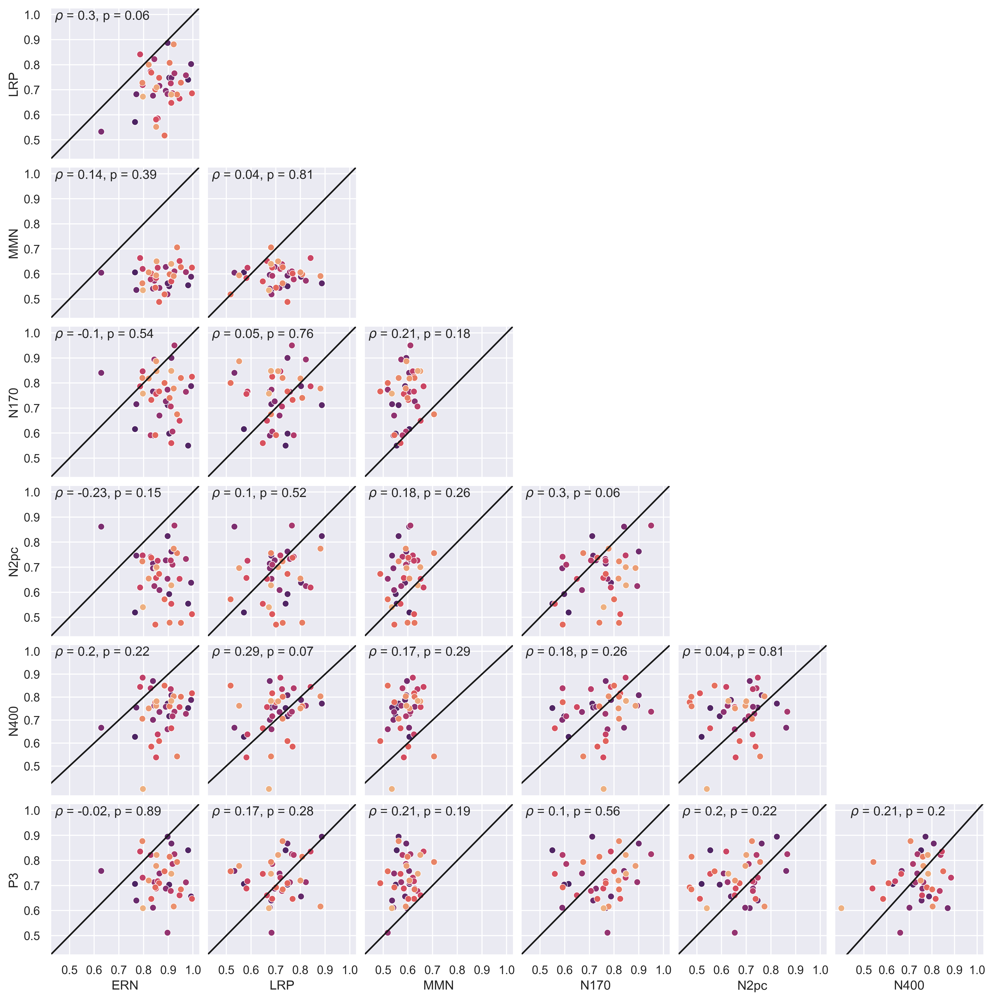

In [24]:
df_list = []
for task in ["N170", "N400", "P3", "N2pc", "MMN", "ERN", "LRP"]:
    model_path = os.getcwd()+"\\"+model_folder+"\\"+model_name+"\\"+task+"\\"+preprocessing+"\\"
    for subjectID in range(40):
        for i in range(1,6):
            df = pd.read_json(model_path+"subject_"+str(subjectID)+"_split_"+str(i)+"_history.json")
            df = df[df["epoch"]==25]
            df["SubjectID"] = subjectID+1
            df["Split"] = i
            df["Task"] = task
            df_list.append(df[["Task", "SubjectID", "Split", "valid_balanced_accuracy"]])
df = pd.concat(df_list,axis=0)
df = df.pivot(index=["SubjectID","Split"], columns='Task', values='valid_balanced_accuracy')
df = df.reset_index()
df = df.groupby("SubjectID").mean().iloc[:,1:].reset_index()
sns.set(style="darkgrid")
fig, axes = plt.subplots(7, 7, figsize=(15, 15), dpi=400)
fig.tight_layout()
task_list = ["ERN", "LRP", "MMN", "N170", "N2pc", "N400", "P3"]
for i in range(0,7):
    for j in range(0,7):
        #if i==j:
        #    sns.histplot(ax=axes[i,j], data=df,x=task_list[i])
        if i>j:
            sns.scatterplot(ax=axes[i,j], data=df,x=task_list[j], y=task_list[i], hue=df.index, palette="flare_r")
            axes[i,j].legend().set_visible(False)
            axes[i,j].axline((0.45,0.45), (1,1), color='k')
            axes[i,j].set_xticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
            axes[i,j].set_yticks([0.5, 0.6, 0.7, 0.8, 0.9, 1])
            axes[i,j].text(0.44, 0.98, r'$\rho$'+" = "
                           +str(np.round(scipy.stats.pearsonr(df[task_list[j]], df[task_list[i]])[0],2))
                          +", p = "+str(np.round(scipy.stats.pearsonr(df[task_list[j]], df[task_list[i]])[1],2)))
        else:
            fig.delaxes(axes[i,j])
        if j!=0:
            axes[i,j].set(yticklabels=[], ylabel=None)
        if i!=6:
            axes[i,j].set(xticklabels=[], xlabel=None)
fig.subplots_adjust(wspace=0.05, hspace=0.05)